# Logistic Regression with a Neural Network mindset

Welcome to your first (required) programming assignment! You will build a logistic regression classifier to recognize  cats. This assignment will step you through how to do this with a Neural Network mindset, and will also hone your intuitions about deep learning.

**Instructions:**
- Do not use loops (for/while) in your code, unless the instructions explicitly ask you to do so.
- Use `np.dot(X,Y)` to calculate dot products.

**You will learn to:**
- Build the general architecture of a learning algorithm, including:
    - Initializing parameters
    - Calculating the cost function and its gradient
    - Using an optimization algorithm (gradient descent) 
- Gather all three functions above into a main model function, in the right order.

## Table of Contents
- [1 - Packages](#1)
- [2 - Overview of the Problem set](#2)
    - [Exercise 1](#ex-1)
    - [Exercise 2](#ex-2)
- [3 - General Architecture of the learning algorithm](#3)
- [4 - Building the parts of our algorithm](#4)
    - [4.1 - Helper functions](#4-1)
        - [Exercise 3 - sigmoid](#ex-3)
    - [4.2 - Initializing parameters](#4-2)
        - [Exercise 4 - initialize_with_zeros](#ex-4)
    - [4.3 - Forward and Backward propagation](#4-3)
        - [Exercise 5 - propagate](#ex-5)
    - [4.4 - Optimization](#4-4)
        - [Exercise 6 - optimize](#ex-6)
        - [Exercise 7 - predict](#ex-7)
- [5 - Merge all functions into a model](#5)
    - [Exercise 8 - model](#ex-8)
- [6 - Further analysis (optional/ungraded exercise)](#6)
- [7 - Test with your own image (optional/ungraded exercise)](#7)

<a name='1'></a>
## 1 - Packages ##

First, let's run the cell below to import all the packages that you will need during this assignment. 
- [numpy](https://numpy.org/doc/1.20/) is the fundamental package for scientific computing with Python.
- [h5py](http://www.h5py.org) is a common package to interact with a dataset that is stored on an H5 file.
- [matplotlib](http://matplotlib.org) is a famous library to plot graphs in Python.
- [PIL](https://pillow.readthedocs.io/en/stable/) and [scipy](https://www.scipy.org/) are used here to test your model with your own picture at the end.

In [121]:
import numpy as np
import copy
import matplotlib.pyplot as plt
import h5py
import scipy
from PIL import Image
from scipy import ndimage
from lr_utils import load_dataset
from public_tests import *

%matplotlib inline
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


<a name='2'></a>
## 2 - Overview of the Problem set ##

**Problem Statement**: You are given a dataset ("data.h5") containing:
    - a training set of m_train images labeled as cat (y=1) or non-cat (y=0)
    - a test set of m_test images labeled as cat or non-cat
    - each image is of shape (num_px, num_px, 3) where 3 is for the 3 channels (RGB). Thus, each image is square (height = num_px) and (width = num_px).

You will build a simple image-recognition algorithm that can correctly classify pictures as cat or non-cat.

Let's get more familiar with the dataset. Load the data by running the following code.

In [122]:
# Loading the data (cat/non-cat)
train_set_x_orig, train_set_y, test_set_x_orig, test_set_y, classes = load_dataset()

We added "_orig" at the end of image datasets (train and test) because we are going to preprocess them. After preprocessing, we will end up with train_set_x and test_set_x (the labels train_set_y and test_set_y don't need any preprocessing).

Each line of your train_set_x_orig and test_set_x_orig is an array representing an image. You can visualize an example by running the following code. Feel free also to change the `index` value and re-run to see other images. 

y = [0], it's a 'non-cat' picture.


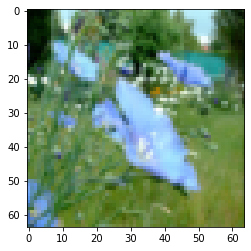

In [123]:
# Example of a picture
index = 20
plt.imshow(train_set_x_orig[index])
print ("y = " + str(train_set_y[:, index]) + ", it's a '" + classes[np.squeeze(train_set_y[:, index])].decode("utf-8") +  "' picture.")

Many software bugs in deep learning come from having matrix/vector dimensions that don't fit. If you can keep your matrix/vector dimensions straight you will go a long way toward eliminating many bugs. 

<a name='ex-1'></a>
### Exercise 1
Find the values for:
    - m_train (number of training examples)
    - m_test (number of test examples)
    - num_px (= height = width of a training image)
Remember that `train_set_x_orig` is a numpy-array of shape (m_train, num_px, num_px, 3). For instance, you can access `m_train` by writing `train_set_x_orig.shape[0]`.

In [124]:
train_set_x_orig.shape

(209, 64, 64, 3)

In [125]:
#(≈ 3 lines of code)
m_train = len(train_set_x_orig)
m_test = len(test_set_x_orig)
num_px = train_set_x_orig.shape[2]
# YOUR CODE STARTS HERE


# YOUR CODE ENDS HERE

print ("Number of training examples: m_train = " + str(m_train))
print ("Number of testing examples: m_test = " + str(m_test))
print ("Height/Width of each image: num_px = " + str(num_px))
print ("Each image is of size: (" + str(num_px) + ", " + str(num_px) + ", 3)")
print ("train_set_x shape: " + str(train_set_x_orig.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x shape: " + str(test_set_x_orig.shape))
print ("test_set_y shape: " + str(test_set_y.shape))

Number of training examples: m_train = 209
Number of testing examples: m_test = 50
Height/Width of each image: num_px = 64
Each image is of size: (64, 64, 3)
train_set_x shape: (209, 64, 64, 3)
train_set_y shape: (1, 209)
test_set_x shape: (50, 64, 64, 3)
test_set_y shape: (1, 50)


**Expected Output for m_train, m_test and num_px**: 
<table style="width:15%">
  <tr>
    <td> m_train </td>
    <td> 209 </td> 
  </tr>
  
  <tr>
    <td>m_test</td>
    <td> 50 </td> 
  </tr>
  
  <tr>
    <td>num_px</td>
    <td> 64 </td> 
  </tr>
  
</table>


For convenience, you should now reshape images of shape (num_px, num_px, 3) in a numpy-array of shape (num_px $*$ num_px $*$ 3, 1). After this, our training (and test) dataset is a numpy-array where each column represents a flattened image. There should be m_train (respectively m_test) columns.

<a name='ex-2'></a>
### Exercise 2
Reshape the training and test data sets so that images of size (num_px, num_px, 3) are flattened into single vectors of shape (num\_px $*$ num\_px $*$ 3, 1).

A trick when you want to flatten a matrix X of shape (a,b,c,d) to a matrix X_flatten of shape (b$*$c$*$d, a) is to use: 
```python
X_flatten = X.reshape(X.shape[0], -1).T      # X.T is the transpose of X
```

In [126]:
# Reshape the training and test examples
#(≈ 2 lines of code)
#train_set_x_flatten = train_set_x_orig.reshape(train_set_x_orig.shape[1]*train_set_x_orig.shape[2]*train_set_x_orig.shape[3],209)
#test_set_x_flatten = test_set_x_orig.reshape(test_set_x_orig.shape[1]*test_set_x_orig.shape[2]*test_set_x_orig.shape[3],50)
train_set_x_flatten = train_set_x_orig.reshape(train_set_x_orig.shape[0],-1).T
test_set_x_flatten = test_set_x_orig.reshape(test_set_x_orig.shape[0],-1).T

# YOUR CODE STARTS HERE


# YOUR CODE ENDS HERE

# Check that the first 10 pixels of the second image are in the correct place
assert np.alltrue(train_set_x_flatten[0:10, 1] == [196, 192, 190, 193, 186, 182, 188, 179, 174, 213]), "Wrong solution. Use (X.shape[0], -1).T."
assert np.alltrue(test_set_x_flatten[0:10, 1] == [115, 110, 111, 137, 129, 129, 155, 146, 145, 159]), "Wrong solution. Use (X.shape[0], -1).T."

print ("train_set_x_flatten shape: " + str(train_set_x_flatten.shape))
print ("train_set_y shape: " + str(train_set_y.shape))
print ("test_set_x_flatten shape: " + str(test_set_x_flatten.shape))
print ("test_set_y shape: " + str(test_set_y.shape))

train_set_x_flatten shape: (12288, 209)
train_set_y shape: (1, 209)
test_set_x_flatten shape: (12288, 50)
test_set_y shape: (1, 50)


**Expected Output**: 

<table style="width:35%">
  <tr>
    <td>train_set_x_flatten shape</td>
    <td> (12288, 209)</td> 
  </tr>
  <tr>
    <td>train_set_y shape</td>
    <td>(1, 209)</td> 
  </tr>
  <tr>
    <td>test_set_x_flatten shape</td>
    <td>(12288, 50)</td> 
  </tr>
  <tr>
    <td>test_set_y shape</td>
    <td>(1, 50)</td> 
  </tr>
</table>

To represent color images, the red, green and blue channels (RGB) must be specified for each pixel, and so the pixel value is actually a vector of three numbers ranging from 0 to 255.

One common preprocessing step in machine learning is to center and standardize your dataset, meaning that you substract the mean of the whole numpy array from each example, and then divide each example by the standard deviation of the whole numpy array. But for picture datasets, it is simpler and more convenient and works almost as well to just divide every row of the dataset by 255 (the maximum value of a pixel channel).

<!-- During the training of your model, you're going to multiply weights and add biases to some initial inputs in order to observe neuron activations. Then you backpropogate with the gradients to train the model. But, it is extremely important for each feature to have a similar range such that our gradients don't explode. You will see that more in detail later in the lectures. !--> 

Let's standardize our dataset.

In [127]:
train_set_x = train_set_x_flatten / 255.
test_set_x = test_set_x_flatten / 255.

<font color='blue'>
    
    
**What you need to remember:**

Common steps for pre-processing a new dataset are:
- Figure out the dimensions and shapes of the problem (m_train, m_test, num_px, ...)
- Reshape the datasets such that each example is now a vector of size (num_px \* num_px \* 3, 1)
- "Standardize" the data

<a name='3'></a>
## 3 - General Architecture of the learning algorithm ##

It's time to design a simple algorithm to distinguish cat images from non-cat images.

You will build a Logistic Regression, using a Neural Network mindset. The following Figure explains why **Logistic Regression is actually a very simple Neural Network!**

<img src="images/LogReg_kiank.png" style="width:650px;height:400px;">

**Mathematical expression of the algorithm**:

For one example $x^{(i)}$:
$$z^{(i)} = w^T x^{(i)} + b \tag{1}$$
$$\hat{y}^{(i)} = a^{(i)} = sigmoid(z^{(i)})\tag{2}$$ 
$$ \mathcal{L}(a^{(i)}, y^{(i)}) =  - y^{(i)}  \log(a^{(i)}) - (1-y^{(i)} )  \log(1-a^{(i)})\tag{3}$$

The cost is then computed by summing over all training examples:
$$ J = \frac{1}{m} \sum_{i=1}^m \mathcal{L}(a^{(i)}, y^{(i)})\tag{6}$$

**Key steps**:
In this exercise, you will carry out the following steps: 
    - Initialize the parameters of the model
    - Learn the parameters for the model by minimizing the cost  
    - Use the learned parameters to make predictions (on the test set)
    - Analyse the results and conclude

<a name='4'></a>
## 4 - Building the parts of our algorithm ## 

The main steps for building a Neural Network are:
1. Define the model structure (such as number of input features) 
2. Initialize the model's parameters
3. Loop:
    - Calculate current loss (forward propagation)
    - Calculate current gradient (backward propagation)
    - Update parameters (gradient descent)

You often build 1-3 separately and integrate them into one function we call `model()`.

<a name='4-1'></a>
### 4.1 - Helper functions

<a name='ex-3'></a>
### Exercise 3 - sigmoid
Using your code from "Python Basics", implement `sigmoid()`. As you've seen in the figure above, you need to compute $sigmoid(z) = \frac{1}{1 + e^{-z}}$ for $z = w^T x + b$ to make predictions. Use np.exp().

In [128]:
# GRADED FUNCTION: sigmoid

def sigmoid(z):
    """
    Compute the sigmoid of z

    Arguments:
    z -- A scalar or numpy array of any size.

    Return:
    s -- sigmoid(z)
    """

    #(≈ 1 line of code)
    s = 1/(1+np.exp(-z))
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    
    return s

In [129]:
print ("sigmoid([0, 2]) = " + str(sigmoid(np.array([0,2]))))

sigmoid_test(sigmoid)

sigmoid([0, 2]) = [0.5        0.88079708]
All tests passed!


In [130]:
x = np.array([0.5, 0, 2.0])
output = sigmoid(x)
print(output)

[0.62245933 0.5        0.88079708]


<a name='4-2'></a>
### 4.2 - Initializing parameters

<a name='ex-4'></a>
### Exercise 4 - initialize_with_zeros
Implement parameter initialization in the cell below. You have to initialize w as a vector of zeros. If you don't know what numpy function to use, look up np.zeros() in the Numpy library's documentation.

In [131]:
# GRADED FUNCTION: initialize_with_zeros

def initialize_with_zeros(dim):
    """
    This function creates a vector of zeros of shape (dim, 1) for w and initializes b to 0.
    
    Argument:
    dim -- size of the w vector we want (or number of parameters in this case)
    
    Returns:
    w -- initialized vector of shape (dim, 1)
    b -- initialized scalar (corresponds to the bias) of type float
    """
    
    # (≈ 2 lines of code)
    w = np.zeros((dim,1))
    b = 0.0
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE

    return w, b

In [132]:
dim = 2
w, b = initialize_with_zeros(dim)

assert type(b) == float
print ("w = " + str(w))
print ("b = " + str(b))

initialize_with_zeros_test(initialize_with_zeros)

w = [[0.]
 [0.]]
b = 0.0
All tests passed!


<a name='4-3'></a>
### 4.3 - Forward and Backward propagation

Now that your parameters are initialized, you can do the "forward" and "backward" propagation steps for learning the parameters.

<a name='ex-5'></a>
### Exercise 5 - propagate
Implement a function `propagate()` that computes the cost function and its gradient.

**Hints**:

Forward Propagation:
- You get X
- You compute $A = \sigma(w^T X + b) = (a^{(1)}, a^{(2)}, ..., a^{(m-1)}, a^{(m)})$
- You calculate the cost function: $J = -\frac{1}{m}\sum_{i=1}^{m}(y^{(i)}\log(a^{(i)})+(1-y^{(i)})\log(1-a^{(i)}))$

Here are the two formulas you will be using: 

$$ \frac{\partial J}{\partial w} = \frac{1}{m}X(A-Y)^T\tag{7}$$
$$ \frac{\partial J}{\partial b} = \frac{1}{m} \sum_{i=1}^m (a^{(i)}-y^{(i)})\tag{8}$$

In [133]:
# GRADED FUNCTION: propagate

def propagate(w, b, X, Y):
    """
    Implement the cost function and its gradient for the propagation explained above

    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of size (num_px * num_px * 3, number of examples)
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat) of size (1, number of examples)

    Return:
    cost -- negative log-likelihood cost for logistic regression
    dw -- gradient of the loss with respect to w, thus same shape as w
    db -- gradient of the loss with respect to b, thus same shape as b
    
    Tips:
    - Write your code step by step for the propagation. np.log(), np.dot()
    """
    
    m = X.shape[1]
    
    # FORWARD PROPAGATION (FROM X TO COST)
    #(≈ 2 lines of code)
    # compute activation
    A =  1/(1+np.exp(-(np.dot(w.T,X)+b))) # np.dot(w.T,X) + b  
    print (A)
    print (np.log(A).T)
    # compute cost using np.dot. Don't use loops for the sum.
    #cost = -((1/m) *(np.sum ((np.dot(Y , (np.log(A).T)) + ((np.dot((1-Y) , (np.log(1-A).T))    ))),axis=1,keepdims=True))) 
    cost = (-1/m)* (np.dot(Y, (np.log(A).T)) + np.dot((1-Y),(np.log(1 - A).T)))
    print (cost)
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE

    # BACKWARD PROPAGATION (TO FIND GRAD)
    #(≈ 2 lines of code)
    dw = (1/m)*(np.dot(X,(A-Y).T))
    db = (1/m)*(np.sum((A-Y)))
    print (dw.shape)
    print (db)
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    cost = np.squeeze(np.array(cost))

    
    grads = {"dw": dw,
             "db": db}
    
    return grads, cost

In [134]:
w =  np.array([[1.], [2.]])
b = 2.
X =np.array([[1., 2., -1.], [3., 4., -3.2]])
Y = np.array([[1, 0, 1]])
grads, cost = propagate(w, b, X, Y)

assert type(grads["dw"]) == np.ndarray
assert grads["dw"].shape == (2, 1)
assert type(grads["db"]) == np.float64


print ("dw = " + str(grads["dw"]))
print ("db = " + str(grads["db"]))
print ("cost = " + str(cost))

propagate_test(propagate)

[[0.99987661 0.99999386 0.00449627]]
[[-1.23402190e-04]
 [-6.14419348e-06]
 [-5.40450641e+00]]
[[5.80154532]]
(2, 1)
0.001455578136784208
dw = [[0.99845601]
 [2.39507239]]
db = 0.001455578136784208
cost = 5.801545319394553
[[0.99987661 0.99999386 0.00449627]]
[[-1.23402190e-04]
 [-6.14419348e-06]
 [-5.40450641e+00]]
[[5.80154532]]
(2, 1)
0.001455578136784208
All tests passed!


**Expected output**

```
dw = [[0.99845601]
 [2.39507239]]
db = 0.001455578136784208
cost = 5.801545319394553
```

<a name='4-4'></a>
### 4.4 - Optimization
- You have initialized your parameters.
- You are also able to compute a cost function and its gradient.
- Now, you want to update the parameters using gradient descent.

<a name='ex-6'></a>
### Exercise 6 - optimize
Write down the optimization function. The goal is to learn $w$ and $b$ by minimizing the cost function $J$. For a parameter $\theta$, the update rule is $ \theta = \theta - \alpha \text{ } d\theta$, where $\alpha$ is the learning rate.

In [135]:
# GRADED FUNCTION: optimize

def optimize(w, b, X, Y, num_iterations=100, learning_rate=0.009, print_cost=False):
    """
    This function optimizes w and b by running a gradient descent algorithm
    
    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of shape (num_px * num_px * 3, number of examples)
    Y -- true "label" vector (containing 0 if non-cat, 1 if cat), of shape (1, number of examples)
    num_iterations -- number of iterations of the optimization loop
    learning_rate -- learning rate of the gradient descent update rule
    print_cost -- True to print the loss every 100 steps
    
    Returns:
    params -- dictionary containing the weights w and bias b
    grads -- dictionary containing the gradients of the weights and bias with respect to the cost function
    costs -- list of all the costs computed during the optimization, this will be used to plot the learning curve.
    
    Tips:
    You basically need to write down two steps and iterate through them:
        1) Calculate the cost and the gradient for the current parameters. Use propagate().
        2) Update the parameters using gradient descent rule for w and b.
    """
    
    w = copy.deepcopy(w)
    b = copy.deepcopy(b)
    
    costs = []
    
    for i in range(num_iterations):
        # (≈ 1 lines of code)
        # Cost and gradient calculation 
        grads, cost = propagate(w, b, X, Y)
        # YOUR CODE STARTS HERE
        
        
        # YOUR CODE ENDS HERE
        
        # Retrieve derivatives from grads
        dw = grads["dw"]
        db = grads["db"]
        
        # update rule (≈ 2 lines of code)
        w = w - learning_rate * dw
        b = b - learning_rate * db 
        # YOUR CODE STARTS HERE
        
        
        # YOUR CODE ENDS HERE
        
        # Record the costs
        if i % 100 == 0:
            costs.append(cost)
        
            # Print the cost every 100 training iterations
            if print_cost:
                print ("Cost after iteration %i: %f" %(i, cost))
    
    params = {"w": w,
              "b": b}
    
    grads = {"dw": dw,
             "db": db}
    
    return params, grads, costs

In [136]:
params, grads, costs = optimize(w, b, X, Y, num_iterations=100, learning_rate=0.009, print_cost=False)

print ("w = " + str(params["w"]))
print ("b = " + str(params["b"]))
print ("dw = " + str(grads["dw"]))
print ("db = " + str(grads["db"]))
print("Costs = " + str(costs))

optimize_test(optimize)

[[0.99987661 0.99999386 0.00449627]]
[[-1.23402190e-04]
 [-6.14419348e-06]
 [-5.40450641e+00]]
[[5.80154532]]
(2, 1)
0.001455578136784208
[[0.99986717 0.99999318 0.00485901]]
[[-1.32835338e-04]
 [-6.81901520e-06]
 [-5.32691977e+00]]
[[5.7409505]]
(2, 1)
0.001573122788386061
[[0.99985702 0.99999243 0.00525079]]
[[-1.42987983e-04]
 [-7.56783568e-06]
 [-5.24937607e+00]]
[[5.68037543]]
(2, 1)
0.0017000826468432557
[[0.9998461 0.9999916 0.0056739]]
[[-1.53914745e-04]
 [-8.39874600e-06]
 [-5.17187874e+00]]
[[5.61982167]]
(2, 1)
0.0018371991375957981
[[0.99983434 0.99999068 0.00613079]]
[[-1.65674348e-04]
 [-9.32071735e-06]
 [-5.09443147e+00]]
[[5.55929092]]
(2, 1)
0.0019852699624247996
[[0.99982169 0.99998966 0.00662412]]
[[-1.78329921e-04]
 [-1.03436957e-05]
 [-5.01703824e+00]]
[[5.49878502]]
(2, 1)
0.002145153019682248
[[0.99980807 0.99998852 0.00715672]]
[[-1.91949322e-04]
 [-1.14787069e-05]
 [-4.93970334e+00]]
[[5.43830595]]
(2, 1)
0.0023177705382152096
[[0.99979342 0.99998726 0.00773166

<a name='ex-7'></a>
### Exercise 7 - predict
The previous function will output the learned w and b. We are able to use w and b to predict the labels for a dataset X. Implement the `predict()` function. There are two steps to computing predictions:

1. Calculate $\hat{Y} = A = \sigma(w^T X + b)$

2. Convert the entries of a into 0 (if activation <= 0.5) or 1 (if activation > 0.5), stores the predictions in a vector `Y_prediction`. If you wish, you can use an `if`/`else` statement in a `for` loop (though there is also a way to vectorize this). 

In [137]:
# GRADED FUNCTION: predict

def predict(w, b, X):
    '''
    Predict whether the label is 0 or 1 using learned logistic regression parameters (w, b)
    
    Arguments:
    w -- weights, a numpy array of size (num_px * num_px * 3, 1)
    b -- bias, a scalar
    X -- data of size (num_px * num_px * 3, number of examples)
    
    Returns:
    Y_prediction -- a numpy array (vector) containing all predictions (0/1) for the examples in X
    '''
    
    m = X.shape[1]
    Y_prediction = np.zeros((1, m))
    w = w.reshape(X.shape[0], 1)
    
    # Compute vector "A" predicting the probabilities of a cat being present in the picture
    #(≈ 1 line of code)
    A = 1/(1+np.exp(-(np.dot(w.T,X)+b)))
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE
    
    for i in range(A.shape[1]):
        
        # Convert probabilities A[0,i] to actual predictions p[0,i]
        #(≈ 4 lines of code)
        if A[0, i] > 0.5 :
            Y_prediction[0,i] = 1
        else:
            Y_prediction[0,i] = 0
        # YOUR CODE STARTS HERE
        
        
        # YOUR CODE ENDS HERE
    
    return Y_prediction

In [138]:
w = np.array([[0.1124579], [0.23106775]])
b = -0.3
X = np.array([[1., -1.1, -3.2],[1.2, 2., 0.1]])
print ("predictions = " + str(predict(w, b, X)))

predict_test(predict)

predictions = [[1. 1. 0.]]
All tests passed!


<font color='blue'>
    
**What to remember:**
    
You've implemented several functions that:
- Initialize (w,b)
- Optimize the loss iteratively to learn parameters (w,b):
    - Computing the cost and its gradient 
    - Updating the parameters using gradient descent
- Use the learned (w,b) to predict the labels for a given set of examples

<a name='5'></a>
## 5 - Merge all functions into a model ##

You will now see how the overall model is structured by putting together all the building blocks (functions implemented in the previous parts) together, in the right order.

<a name='ex-8'></a>
### Exercise 8 - model
Implement the model function. Use the following notation:
    - Y_prediction_test for your predictions on the test set
    - Y_prediction_train for your predictions on the train set
    - parameters, grads, costs for the outputs of optimize()

In [139]:
train_set_x.shape

(12288, 209)

In [190]:
# GRADED FUNCTION: model

def model(X_train, Y_train, X_test, Y_test, num_iterations=2000, learning_rate=0.5, print_cost=False):  #
    """
    Builds the logistic regression model by calling the function you've implemented previously
    
    Arguments:
    X_train -- training set represented by a numpy array of shape (num_px * num_px * 3, m_train)
    Y_train -- training labels represented by a numpy array (vector) of shape (1, m_train)
    X_test -- test set represented by a numpy array of shape (num_px * num_px * 3, m_test)
    Y_test -- test labels represented by a numpy array (vector) of shape (1, m_test)
    num_iterations -- hyperparameter representing the number of iterations to optimize the parameters
    learning_rate -- hyperparameter representing the learning rate used in the update rule of optimize()
    print_cost -- Set to True to print the cost every 100 iterations
    
    Returns:
    d -- dictionary containing information about the model.
    """
    # (≈ 1 line of code)   
    # initialize parameters with zeros 
    w, b = initialize_with_zeros(X_train.shape[0])
    
    #(≈ 1 line of code)
    # Gradient descent 
    params, grads, costs = optimize(w, b, X_train, Y_train, num_iterations=num_iterations,
                                    learning_rate=learning_rate, print_cost=False)
    
    
    
    # Retrieve parameters w and b from dictionary "parameters"
    w = params["w"]
    b = params["b"]

    
    
    # Predict test/train set examples (≈ 2 lines of code)
    Y_prediction_test =  predict(w, b,X_test) # 1/(1+np.exp(-(np.dot(w.T,test_set_x)+b)))
    Y_prediction_train = predict(w, b, X_train )   # 1/(1+np.exp(-(np.dot(w.T,train_set_x)+b)))
    
    # YOUR CODE STARTS HERE
    
    
    # YOUR CODE ENDS HERE

    # Print train/test Errors
    if print_cost:
        print("train accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_train - Y_train)) * 100))
        print("test accuracy: {} %".format(100 - np.mean(np.abs(Y_prediction_test - Y_test)) * 100))

    
    d = {"costs": costs,
         "Y_prediction_test": Y_prediction_test, 
         "Y_prediction_train" : Y_prediction_train, 
         "w" : w, 
         "b" : b,
         "learning_rate" : learning_rate,
         "num_iterations": num_iterations}
    
    return d

In [191]:
model_test(model)

[[0.5 0.5 0.5]]
[[-0.69314718]
 [-0.69314718]
 [-0.69314718]]
[[0.69314718]]
(4, 1)
-0.16666666666666666
[[0.50002264 0.50000378 0.50002618]]
[[-0.6931019 ]
 [-0.69313963]
 [-0.69309483]]
[[0.69311715]]
(4, 1)
-0.16664913471952972
[[0.50004528 0.50000755 0.50005235]]
[[-0.69305662]
 [-0.69313208]
 [-0.69304248]]
[[0.69308713]]
(4, 1)
-0.16663160437908325
[[0.50006792 0.50001133 0.50007853]]
[[-0.69301135]
 [-0.69312453]
 [-0.69299014]]
[[0.69305711]]
(4, 1)
-0.16661407564524028
[[0.50009055 0.5000151  0.5001047 ]]
[[-0.69296609]
 [-0.69311699]
 [-0.6929378 ]]
[[0.69302709]]
(4, 1)
-0.166596548517914
[[0.50011319 0.50001887 0.50013087]]
[[-0.69292083]
 [-0.69310944]
 [-0.69288547]]
[[0.69299707]]
(4, 1)
-0.1665790229970175
[[0.50013582 0.50002264 0.50015704]]
[[-0.69287558]
 [-0.6931019 ]
 [-0.69283314]]
[[0.69296706]]
(4, 1)
-0.1665614990824639
[[0.50015845 0.50002641 0.50018321]]
[[-0.69283034]
 [-0.69309436]
 [-0.69278082]]
[[0.69293705]]
(4, 1)
-0.16654397677416613
[[0.50018107 0.50

If you pass all the tests, run the following cell to train your model.

In [192]:
logistic_regression_model = model(train_set_x, train_set_y, test_set_x, test_set_y, num_iterations=2000, learning_rate=0.005, print_cost=True)

[[0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5
  0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5 0.5]]
[[-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-0.69314718]
 [-

(12288, 1)
0.24134517738103822
[[0.20044803 0.09339018 0.068624   0.1931129  0.19526632 0.22554091
  0.1986709  0.16836916 0.11879816 0.14717582 0.06404139 0.0986129
  0.15673455 0.05336986 0.07314011 0.04811688 0.05751192 0.03250928
  0.07889746 0.24959306 0.08643453 0.18201985 0.03218472 0.04487519
  0.0701289  0.30113079 0.10919352 0.09843068 0.16106786 0.12023019
  0.2391636  0.0777231  0.10287547 0.08128399 0.14880267 0.18412269
  0.12262508 0.03953453 0.3914978  0.13145876 0.1141187  0.27624882
  0.0912538  0.06841777 0.10120855 0.21104328 0.09830561 0.15946614
  0.14847282 0.12633245 0.04460789 0.09049916 0.08093388 0.04509209
  0.16281177 0.0476191  0.14124729 0.03169323 0.27341875 0.19502272
  0.18697991 0.11673767 0.06793955 0.13367253 0.03440337 0.18595233
  0.06759313 0.11295695 0.08021811 0.06572789 0.08595383 0.1642492
  0.24314358 0.16543017 0.10385331 0.07333228 0.13647874 0.1400339
  0.15048396 0.29816307 0.09859132 0.07776743 0.22905793 0.21966131
  0.09027246 0.09324

(12288, 1)
0.2619290964926708
[[0.18699107 0.0802993  0.0599826  0.162602   0.17342952 0.2089754
  0.17782518 0.15472027 0.10364946 0.13004647 0.05493754 0.08512485
  0.14258426 0.04374539 0.06077232 0.03993238 0.04625712 0.02446475
  0.06724393 0.24122968 0.07207858 0.16041048 0.02565755 0.03748573
  0.06051734 0.28877088 0.09215372 0.08567442 0.14090534 0.10202796
  0.21703804 0.06976503 0.09277947 0.07132429 0.12601882 0.17321513
  0.10573302 0.03222565 0.38618141 0.12007066 0.09607083 0.25311729
  0.08031004 0.05690477 0.08484038 0.19509998 0.08560859 0.14814865
  0.12128015 0.11266877 0.03724448 0.07898017 0.06817683 0.03812001
  0.1475168  0.03806006 0.13100703 0.0262722  0.25630459 0.18437292
  0.1789642  0.10290488 0.05535814 0.11663185 0.02826704 0.16985322
  0.05994439 0.09781321 0.06941019 0.05467472 0.07517219 0.15454128
  0.22211818 0.15553876 0.09256142 0.06323411 0.11342719 0.12271175
  0.12942203 0.27925006 0.07901271 0.06690766 0.20962187 0.20938721
  0.07924577 0.0776

[[0.57985098 0.60638972 0.67289291 0.43500759 0.51054817 0.5463064
  0.52136518 0.58767441 0.58399857 0.56132644 0.660358   0.59897351
  0.59024003 0.62667135 0.59986343 0.66492734 0.60056132 0.60204072
  0.62035898 0.5906165  0.5772015  0.51510407 0.67033434 0.68132545
  0.65183634 0.53960707 0.55266673 0.60994457 0.52760118 0.54316878
  0.49994504 0.68954716 0.65230911 0.65313756 0.49604333 0.61072835
  0.56007341 0.66907219 0.53235824 0.62740747 0.5433677  0.48109601
  0.63929474 0.61299053 0.5579292  0.55799779 0.61338952 0.61895058
  0.44539801 0.60174424 0.68020269 0.6293757  0.60036034 0.69163684
  0.57795277 0.6223832  0.63466758 0.71627726 0.52455928 0.60439776
  0.63242678 0.59877602 0.58827354 0.56045868 0.69963157 0.563615
  0.69742891 0.58073255 0.63828573 0.61919214 0.64168939 0.62789973
  0.50812808 0.62696428 0.63442451 0.64630963 0.48975252 0.55537305
  0.51936077 0.50204865 0.49951086 0.63876187 0.52474519 0.59915289
  0.6357193  0.5584461  0.62546236 0.5604541  0.650

 [-0.59494528]]
[[0.74494036]]
(12288, 1)
0.25531213784719836
[[0.19506686 0.08056361 0.06891828 0.12418751 0.15745915 0.20674575
  0.16340263 0.16421858 0.10203111 0.12571652 0.06098541 0.08623608
  0.14804557 0.04502401 0.05909218 0.04265219 0.04333463 0.02172898
  0.0689372  0.26398204 0.0675655  0.14456867 0.02717883 0.04170946
  0.06692926 0.29219494 0.0842204  0.08862011 0.1294834  0.09270599
  0.19839974 0.08269535 0.10544749 0.07899926 0.10736459 0.18874993
  0.09952536 0.03447394 0.39411782 0.13199039 0.0857178  0.22803049
  0.08768767 0.05623847 0.07732621 0.19526984 0.08837998 0.16188975
  0.09198499 0.11685008 0.04161197 0.08403115 0.06742483 0.04424379
  0.15026793 0.03647221 0.14877484 0.03122326 0.24722516 0.20282896
  0.20444184 0.10602049 0.05151563 0.11174991 0.03181403 0.16989756
  0.0707734  0.09601416 0.07412396 0.05463753 0.08106575 0.17595974
  0.20557382 0.17487764 0.10052026 0.0687837  0.09222774 0.11823277
  0.11422123 0.26235957 0.06388141 0.07007515 0.197636

[[-1.61557931]
 [-2.53310029]
 [-2.61058713]
 [-2.25499111]
 [-1.90749597]
 [-1.58528224]
 [-1.8685528 ]
 [-1.76893269]
 [-2.30378732]
 [-2.10101856]
 [-2.74954995]
 [-2.44903457]
 [-1.89506143]
 [-3.0867924 ]
 [-2.8574626 ]
 [-3.14113594]
 [-3.1906845 ]
 [-3.91289753]
 [-2.67581382]
 [-1.28048033]
 [-2.74595333]
 [-2.00103953]
 [-3.58955296]
 [-3.13778968]
 [-2.65707429]
 [-1.2227317 ]
 [-2.53633576]
 [-2.4140688 ]
 [-2.09552804]
 [-2.43876795]
 [-1.67051021]
 [-2.4223891 ]
 [-2.18524889]
 [-2.49688702]
 [-2.32662892]
 [-1.62866674]
 [-2.35504327]
 [-3.35002473]
 [-0.9199681 ]
 [-1.98208527]
 [-2.53512004]
 [-1.54029211]
 [-2.39281542]
 [-2.90150814]
 [-2.62630432]
 [-1.6364539 ]
 [-2.42048972]
 [-1.7817303 ]
 [-2.55323687]
 [-2.13560138]
 [-3.13454515]
 [-2.45307283]
 [-2.71324283]
 [-3.04887893]
 [-1.88707031]
 [-3.35727829]
 [-1.83802469]
 [-3.39035416]
 [-1.42356089]
 [-1.54187414]
 [-1.52173877]
 [-2.23158157]
 [-3.02348455]
 [-2.22286939]
 [-3.40762605]
 [-1.77826628]
 [-2.58399

(12288, 1)
0.25253907501656575
[[0.20070828 0.07892195 0.07581645 0.09692358 0.14473297 0.20433178
  0.15040041 0.17416613 0.09898477 0.12096654 0.0655444  0.08670973
  0.15159592 0.04619191 0.05677519 0.04351033 0.04027264 0.01929397
  0.06888354 0.28503676 0.06275989 0.13120166 0.02789582 0.04421117
  0.07187955 0.29592487 0.0770505  0.09000537 0.12043204 0.08511252
  0.18391958 0.09144409 0.11608339 0.08397458 0.09369023 0.19970413
  0.09286405 0.03541741 0.40077889 0.14063706 0.07650684 0.208512
  0.09335328 0.05441891 0.07023275 0.19468554 0.08921985 0.17142842
  0.0721665  0.11894049 0.04450918 0.08711266 0.06598058 0.04906616
  0.1524947  0.03413203 0.16447399 0.03495861 0.23802003 0.21981551
  0.22502856 0.10829645 0.04742191 0.10694777 0.03374753 0.16867986
  0.07755669 0.09364984 0.07668926 0.05332533 0.08413215 0.19575163
  0.19188392 0.19028533 0.1052141  0.07270076 0.07577265 0.11450771
  0.10150082 0.24777942 0.05321662 0.07030078 0.18594382 0.23868374
  0.09231144 0.0672

(12288, 1)
0.2514835371090442
[[0.20266252 0.07847218 0.07815575 0.08988524 0.14144008 0.20396959
  0.1467766  0.17810079 0.09818317 0.11977431 0.06718805 0.08718477
  0.15295648 0.04686528 0.05624171 0.04377242 0.03952287 0.01870174
  0.0689504  0.29224041 0.06147108 0.12758686 0.02821693 0.04503563
  0.07366523 0.29763371 0.0751741  0.09062951 0.1182164  0.08326226
  0.18017479 0.09399038 0.11979055 0.08557345 0.09024951 0.20306833
  0.09099265 0.03576191 0.40304052 0.14345025 0.07402731 0.20328381
  0.09541192 0.05396356 0.06832453 0.19487359 0.08960475 0.17440561
  0.06723622 0.11975325 0.04551485 0.08823778 0.06575037 0.05075753
  0.15367261 0.03350042 0.16990029 0.03623086 0.23537843 0.22579086
  0.23154475 0.10937949 0.04633685 0.10579725 0.0343559  0.16854443
  0.079468   0.09319555 0.07758234 0.0530076  0.08508347 0.20264327
  0.18824018 0.19523819 0.1066602  0.07412306 0.07140141 0.11380454
  0.09808262 0.24370676 0.05060293 0.07027619 0.18256445 0.24276314
  0.09449071 0.066

(12288, 1)
0.2504113232070089
[[0.20460507 0.07804334 0.08048919 0.0836208  0.13850477 0.20375994
  0.14342561 0.18227067 0.0974479  0.1187165  0.06886843 0.08777131
  0.15435854 0.04764548 0.05578915 0.04400886 0.03887096 0.01818678
  0.06903154 0.29947082 0.06029112 0.12429001 0.02856171 0.04583893
  0.07548769 0.29951014 0.0734852  0.09129732 0.11629707 0.08166725
  0.17684111 0.0963316  0.12354501 0.08711908 0.08721838 0.20626167
  0.08924137 0.0361045  0.40530215 0.14619652 0.07176987 0.19855124
  0.0975249  0.0535546  0.06658422 0.19519577 0.09001    0.17725892
  0.06291296 0.12058383 0.04652276 0.08938261 0.06560355 0.0524699
  0.15501104 0.03291955 0.17537585 0.03750118 0.23289459 0.23186664
  0.2378545  0.11057384 0.04535128 0.1048051  0.03493598 0.16848767
  0.08119655 0.0928548  0.07846998 0.05272167 0.08597861 0.20962538
  0.18495441 0.20005779 0.10802257 0.07557556 0.06745179 0.11328756
  0.09497489 0.23994354 0.04832674 0.07019283 0.17937785 0.24675595
  0.09674463 0.0653

[[0.83081965]]
(12288, 1)
-0.23350431284445847
[[0.59699522 0.5837174  0.72057979 0.26884294 0.44279674 0.53290326
  0.45300672 0.62772382 0.55519214 0.52706518 0.69554643 0.59623645
  0.60182432 0.63541781 0.56466204 0.66586297 0.5432523  0.51425789
  0.61079632 0.65175104 0.51813401 0.43782085 0.67493377 0.70436988
  0.68753736 0.54915874 0.48334882 0.61294654 0.46974378 0.47740699
  0.43690929 0.7375931  0.70647709 0.68244551 0.39539449 0.64671135
  0.50308724 0.67403221 0.54890971 0.6639144  0.45647159 0.40591957
  0.67247068 0.58194828 0.48332457 0.55163309 0.61190457 0.6535171
  0.28486389 0.60724983 0.70897388 0.64518325 0.57788559 0.73947611
  0.58452212 0.56876861 0.69749376 0.76405366 0.48851294 0.66174024
  0.69692302 0.60747116 0.52346669 0.52268551 0.7208775  0.5528024
  0.73871266 0.5565317  0.65152953 0.59360576 0.6565069  0.69875703
  0.4496279  0.68110664 0.6561021  0.67285217 0.34912431 0.52665245
  0.42862979 0.44992889 0.37154553 0.63067326 0.47126739 0.6377966
  0.

[[0.59850818 0.58038251 0.72461399 0.25427328 0.43678614 0.53190127
  0.44593209 0.63334235 0.5516723  0.52354503 0.69899083 0.59669547
  0.60299128 0.63792533 0.56100608 0.66438311 0.53760674 0.5058036
  0.60903774 0.65838417 0.51160401 0.43023366 0.67521859 0.70550766
  0.69105297 0.55096046 0.4764368  0.61313649 0.46492796 0.47187893
  0.43151181 0.73983833 0.71178863 0.68427298 0.38678967 0.64927
  0.49650224 0.67353294 0.55080041 0.66684087 0.44753222 0.39923932
  0.67596652 0.57809276 0.47546546 0.55136956 0.61124926 0.65603342
  0.27144978 0.60744773 0.71116893 0.64649265 0.57577677 0.74369566
  0.58611216 0.56230175 0.70377905 0.76770524 0.48456917 0.66811941
  0.70229874 0.60904788 0.51639058 0.51913249 0.72144504 0.55160704
  0.74018784 0.55431535 0.65218216 0.59016505 0.65672293 0.70608973
  0.44431443 0.68567183 0.65700437 0.67539781 0.33531881 0.52457052
  0.41965315 0.44484482 0.36072635 0.62786062 0.46533873 0.64132748
  0.67503952 0.50096289 0.60836651 0.54494734 0.7037

[[0.21212283 0.07650483 0.08975861 0.06441218 0.1295696  0.20409002
  0.13225007 0.20090215 0.09504059 0.11553367 0.07592478 0.09104369
  0.16023786 0.05169634 0.05463152 0.04473722 0.03705202 0.01671874
  0.06945673 0.32834189 0.05643333 0.11362358 0.03013737 0.04885481
  0.08307655 0.30832575 0.06820864 0.09431308 0.1109262  0.07731865
  0.16671598 0.10379844 0.13897201 0.09280697 0.07817946 0.21741785
  0.0831923  0.03744385 0.41430265 0.15652839 0.06451229 0.18353274
  0.10647314 0.05229937 0.06096975 0.19756866 0.091779   0.18756229
  0.05005921 0.12398585 0.05057974 0.09412851 0.06567475 0.05950826
  0.16172037 0.03101917 0.19763625 0.04256528 0.22426269 0.25695145
  0.26111726 0.11625006 0.04221026 0.10207201 0.0370243  0.16881843
  0.08651752 0.09238481 0.08196746 0.0518236  0.08905217 0.2382348
  0.17471233 0.21797431 0.11269781 0.08164599 0.05491868 0.11260719
  0.08499502 0.22742531 0.04170866 0.06941015 0.16821008 0.26198162
  0.10640089 0.06312224 0.05918103 0.16250904 0.1

(12288, 1)
-0.23071666551310585
[[0.60224918 0.56998835 0.73499825 0.21657448 0.42101371 0.52937113
  0.42625538 0.65018684 0.54122263 0.51362608 0.70838094 0.59870919
  0.60607816 0.64639823 0.55079997 0.65855397 0.52234326 0.48307574
  0.60323304 0.67692013 0.49289659 0.40950155 0.67572644 0.70738491
  0.70055358 0.55676576 0.45746808 0.61348136 0.45263024 0.45798112
  0.41748902 0.74346887 0.72624817 0.6881221  0.36452688 0.65508204
  0.47728782 0.67097873 0.55626335 0.67407918 0.42284121 0.38163942
  0.68578233 0.56664272 0.4535229  0.55101969 0.60882855 0.6619863
  0.23723722 0.60745489 0.71654122 0.64981357 0.57002482 0.75472565
  0.59149739 0.54339025 0.72096218 0.77672321 0.47330165 0.68619531
  0.71600405 0.61400475 0.49636792 0.50947778 0.72149781 0.54801293
  0.74174997 0.54833631 0.65325688 0.57960566 0.65589786 0.72632848
  0.43030954 0.69722901 0.65804781 0.68226393 0.29801057 0.5193617
  0.39514635 0.43096489 0.33305456 0.61795179 0.44831668 0.65077104
  0.68618274 0.489

[[0.60324546 0.56642581 0.73797278 0.20574877 0.41641121 0.5286499
  0.42016938 0.65573246 0.53778009 0.51050083 0.71123185 0.59955769
  0.60697338 0.64946179 0.54763459 0.65622049 0.51776453 0.47628966
  0.60115179 0.68265982 0.48693504 0.40319443 0.67579072 0.70757429
  0.70340506 0.55879844 0.45167624 0.61353558 0.44914505 0.45414675
  0.41342872 0.74381104 0.73062191 0.68894403 0.3581167  0.65647251
  0.47105642 0.66982433 0.55801853 0.67604792 0.41526384 0.37647319
  0.68885063 0.56287764 0.4467186  0.55102489 0.6078923  0.66352071
  0.22754186 0.60727591 0.71799398 0.65074988 0.56827017 0.75793355
  0.59345909 0.53726154 0.72618552 0.77919311 0.46971763 0.69187772
  0.71988222 0.61569708 0.49007808 0.50654465 0.72106976 0.54679945
  0.74148917 0.54653184 0.65336857 0.57602276 0.65520292 0.73253158
  0.42621247 0.70045606 0.6579205  0.68432683 0.28682399 0.51788703
  0.38770571 0.42674347 0.32519854 0.61424953 0.44287746 0.65358971
  0.68967551 0.48622788 0.59967719 0.53989256 0.7

[[-0.50397575]
 [-0.5747816 ]
 [-0.3001056 ]
 [-1.63129352]
 [-0.88650483]
 [-0.63870773]
 [-0.88116453]
 [-0.41367248]
 [-0.62668695]
 [-0.67835361]
 [-0.33693154]
 [-0.5100264 ]
 [-0.49790275]
 [-0.4267718 ]
 [-0.60774128]
 [-0.42507309]
 [-0.66666947]
 [-0.75532854]
 [-0.51247643]
 [-0.37369152]
 [-0.73167709]
 [-0.92342415]
 [-0.3918485 ]
 [-0.34590941]
 [-0.3479787 ]
 [-0.57827537]
 [-0.80715955]
 [-0.48846703]
 [-0.80761024]
 [-0.79702569]
 [-0.89250461]
 [-0.29599997]
 [-0.30816838]
 [-0.3716861 ]
 [-1.0437342 ]
 [-0.41912583]
 [-0.76591282]
 [-0.40266031]
 [-0.58027851]
 [-0.38886661]
 [-0.89652342]
 [-0.98991403]
 [-0.36842215]
 [-0.58134979]
 [-0.82063474]
 [-0.59587583]
 [-0.49939015]
 [-0.40817101]
 [-1.52064447]
 [-0.49920568]
 [-0.32946951]
 [-0.4283029 ]
 [-0.56812958]
 [-0.27320308]
 [-0.51837577]
 [-0.63257314]
 [-0.31309474]
 [-0.24661679]
 [-0.76311407]
 [-0.36040362]
 [-0.32370282]
 [-0.48224738]
 [-0.72573032]
 [-0.68570988]
 [-0.3278632 ]
 [-0.605918  ]
 [-0.29987

[[0.22058251 0.07485279 0.10113992 0.04893254 0.12271743 0.20612248
  0.12191433 0.22731081 0.0928412  0.11308812 0.08532824 0.09667741
  0.16775602 0.05847947 0.05421708 0.04523897 0.03601724 0.01575759
  0.07007702 0.36335839 0.05293951 0.10423048 0.03240836 0.05218414
  0.09298579 0.32123456 0.06389385 0.09859769 0.10770267 0.07509938
  0.15891676 0.10946846 0.15879654 0.09890276 0.07135589 0.22801151
  0.07713415 0.03899165 0.42529483 0.16801595 0.05821481 0.17082316
  0.11853731 0.05133035 0.05608517 0.20219439 0.09413027 0.19832826
  0.04018501 0.12810798 0.05567956 0.10029858 0.06674959 0.0686099
  0.17239352 0.02932792 0.22576563 0.04883793 0.21561714 0.28929108
  0.28611579 0.12470445 0.03955187 0.10049066 0.03923622 0.16985022
  0.09036019 0.09312642 0.08618073 0.05103477 0.091884   0.27471983
  0.16658481 0.23727083 0.1169995  0.08964481 0.04420201 0.11361986
  0.07632379 0.21592196 0.03694063 0.06776775 0.15683812 0.27957369
  0.11951217 0.06216972 0.05979135 0.16356014 0.1

(12288, 1)
-0.2264417243544463
[[0.60609832 0.55188497 0.74797106 0.16938532 0.40063681 0.52614652
  0.39788791 0.67719637 0.52423108 0.49868972 0.72145325 0.60361184
  0.60992342 0.66243233 0.53603247 0.64538017 0.50160448 0.45243885
  0.5922887  0.70357649 0.46431917 0.38049563 0.67557968 0.7066065
  0.71346353 0.56719369 0.43075947 0.61355398 0.43760902 0.44212855
  0.39955852 0.74183968 0.74616836 0.69044939 0.33641666 0.65977604
  0.44696519 0.66399923 0.56473471 0.68215155 0.3877908  0.3585873
  0.70022088 0.54814182 0.42178306 0.55148306 0.6036373  0.66792966
  0.19537058 0.60575019 0.72251922 0.65383514 0.56187457 0.76888271
  0.60187963 0.51364773 0.74492158 0.78705496 0.45613207 0.71299365
  0.73268673 0.62244287 0.46668713 0.49591481 0.71775401 0.5417994
  0.73756193 0.54002935 0.65287682 0.56147524 0.6507662  0.75494768
  0.41218384 0.71080985 0.6555449  0.69164315 0.24744183 0.51278065
  0.3610318  0.41153928 0.29912333 0.59800922 0.42216545 0.66354325
  0.70257824 0.47471

[[0.60655037 0.54820596 0.75007366 0.1617575  0.39725449 0.52558262
  0.39278343 0.68233522 0.52090066 0.49587646 0.72374363 0.60475603
  0.61051065 0.66578472 0.53337589 0.64235805 0.49803332 0.44718898
  0.58996757 0.7083265  0.45894931 0.37537692 0.67541707 0.70599807
  0.71567815 0.56932619 0.42602724 0.61352639 0.43522519 0.43984603
  0.39657951 0.74065319 0.74960997 0.69045718 0.33181039 0.66010888
  0.44114726 0.66228637 0.56634128 0.68330229 0.3815573  0.35470268
  0.70285352 0.54454647 0.41607253 0.55167964 0.60246564 0.6686772
  0.18869372 0.60518194 0.72338686 0.65446897 0.5604021  0.77121689
  0.60408745 0.50796559 0.74912461 0.78861008 0.45290614 0.71788941
  0.7353212  0.6240911  0.4612519  0.49348409 0.71661195 0.5405046
  0.73600231 0.53854796 0.65256166 0.55779896 0.64930762 0.76000704
  0.40918859 0.71284714 0.65456113 0.69326675 0.23878842 0.51162869
  0.35504628 0.40810532 0.29371628 0.5936739  0.4172288  0.66574753
  0.70554475 0.4721747  0.58892295 0.53390166 0.73

(12288, 1)
0.23595760689385326
[[0.22647343 0.07370629 0.11011348 0.04054534 0.1194216  0.20840066
  0.11563476 0.24995781 0.09150681 0.11184535 0.09321495 0.10209797
  0.17367133 0.06508066 0.05445767 0.04541351 0.03583414 0.01541412
  0.07060773 0.38992069 0.05083644 0.09875904 0.03438818 0.05454203
  0.10112364 0.33236254 0.06161076 0.10234195 0.10685004 0.07505288
  0.15504005 0.11179935 0.17475161 0.10314552 0.06799188 0.23419432
  0.07311461 0.04012807 0.43380476 0.17623335 0.05460675 0.16372627
  0.12873097 0.05089191 0.05331336 0.20670415 0.09604322 0.20569087
  0.0350493  0.13115787 0.05980716 0.10538139 0.06810245 0.07607935
  0.18224615 0.0283472  0.24818909 0.05385172 0.20990612 0.31538587
  0.30339959 0.13211251 0.03810433 0.10010791 0.04082021 0.17081775
  0.09194229 0.09436734 0.08945449 0.05056181 0.09352019 0.303891
  0.1625846  0.2504221  0.11949117 0.09629025 0.03808314 0.11513695
  0.07133646 0.20897689 0.03471863 0.06621163 0.14919618 0.29271346
  0.13055157 0.0622

[[0.22782541 0.07344331 0.11234672 0.03882595 0.11881708 0.20901845
  0.11427682 0.25574992 0.09121894 0.11160057 0.09523012 0.10355991
  0.17512453 0.06688323 0.05458174 0.0454354  0.03585424 0.01537017
  0.07074604 0.39632554 0.05038285 0.09760068 0.03490125 0.05509547
  0.10318154 0.33520598 0.06115909 0.10332083 0.1068066  0.07522652
  0.15429764 0.11214945 0.17872195 0.1041386  0.06734897 0.23546439
  0.0722013  0.04040051 0.43588921 0.178175   0.05384957 0.16225893
  0.13134233 0.05082042 0.05273973 0.20790729 0.09652326 0.20740191
  0.03401873 0.13188054 0.06085061 0.10667246 0.06849061 0.07797098
  0.18485396 0.02814145 0.25376215 0.05511199 0.20861083 0.32189671
  0.3074055  0.13402244 0.03781444 0.10009683 0.04120279 0.17106022
  0.09219747 0.09474093 0.09026525 0.05046009 0.09386057 0.31113542
  0.16184547 0.25342423 0.12001273 0.09798227 0.03679595 0.11556388
  0.07028756 0.20747935 0.03431153 0.06581105 0.14744633 0.29588737
  0.13336573 0.06231128 0.06079726 0.16508079 0.

(12288, 1)
-0.22168537082580914
[[0.6074359  0.53344764 0.75725615 0.13579648 0.38549878 0.52342281
  0.37397049 0.70180639 0.50780909 0.48502402 0.73198633 0.60968984
  0.61230332 0.67931913 0.52361333 0.62932009 0.4852441  0.42846748
  0.58039951 0.72560126 0.43848217 0.35674775 0.67435651 0.70239132
  0.72352358 0.57784384 0.4087514  0.61337476 0.42720704 0.43306134
  0.38612978 0.73377205 0.76180306 0.68937295 0.31587933 0.65980941
  0.41867998 0.65462051 0.57249553 0.68672627 0.35876451 0.34100372
  0.71261722 0.53054144 0.39506565 0.55265842 0.59743577 0.67061354
  0.16612479 0.60224203 0.72606381 0.65657742 0.55487583 0.77925471
  0.61312936 0.4860682  0.76430766 0.7936119  0.44059789 0.73606268
  0.74411009 0.63038859 0.44098721 0.48443512 0.71118118 0.53511798
  0.72809394 0.53303403 0.65072549 0.54300393 0.64237793 0.77835591
  0.39886823 0.71921293 0.64943202 0.69907093 0.20816471 0.5071944
  0.33338491 0.39557746 0.27547225 0.57561346 0.39834979 0.67363808
  0.71642461 0.46

[[0.60744521 0.52976443 0.75879091 0.1302723  0.38293986 0.52288798
  0.36963121 0.70638767 0.50459359 0.48239044 0.73383564 0.6109904
  0.61261974 0.68269482 0.52137195 0.62586201 0.48236481 0.42427556
  0.57795457 0.72951978 0.43360016 0.35249991 0.67399226 0.70123328
  0.72525797 0.57995193 0.40479853 0.6133383  0.42551764 0.43187598
  0.38382084 0.7315991  0.76448695 0.68886936 0.31241879 0.65937228
  0.41326215 0.65252807 0.57396859 0.6873299  0.35354357 0.33797257
  0.71487628 0.52713516 0.39023387 0.55293276 0.59610353 0.67088192
  0.16134818 0.60135187 0.72656733 0.65701298 0.55356615 0.78098001
  0.61541551 0.48079008 0.76773746 0.79461034 0.43765757 0.7402738
  0.74593736 0.63187233 0.43626256 0.48231073 0.70965576 0.53371735
  0.72577976 0.53173675 0.65014702 0.53929144 0.64041099 0.78251358
  0.39664998 0.72041481 0.64789953 0.7003665  0.20139465 0.50609005
  0.32847679 0.39271217 0.27161934 0.57096746 0.39383344 0.6754058
  0.71890689 0.46081228 0.57861725 0.52782853 0.749

(12288, 1)
0.23043171730587592
[[0.23277822 0.07248756 0.12127323 0.03306152 0.11707727 0.21158624
  0.10953275 0.27920675 0.09022184 0.11080938 0.10344612 0.10978956
  0.18081702 0.0746823  0.05529954 0.04546497 0.03614058 0.01532325
  0.07132992 0.42094715 0.04880105 0.09362824 0.0370169  0.05718783
  0.11150132 0.34670382 0.05972697 0.10741661 0.10714725 0.0765355
  0.15199833 0.11284515 0.19443166 0.10790769 0.06536197 0.23958493
  0.06886042 0.041455   0.44405021 0.18556948 0.0512707  0.15733432
  0.14200523 0.05066735 0.05082974 0.21293088 0.09844967 0.21386428
  0.03063007 0.13460984 0.06509029 0.11192408 0.07020158 0.08563489
  0.19576278 0.02744553 0.27587272 0.06021041 0.20387354 0.34776979
  0.32237528 0.14181438 0.03688935 0.10030387 0.04271497 0.17199868
  0.0928417  0.09642843 0.09349925 0.05010967 0.09500628 0.33979739
  0.1597187  0.26441409 0.12179006 0.10486891 0.03238829 0.11734874
  0.06671137 0.20225823 0.03311923 0.06421546 0.14098802 0.30819209
  0.14477743 0.062

[[0.23390864 0.07227299 0.12350892 0.03185048 0.1167865  0.21224076
  0.10849766 0.28510975 0.09000775 0.11064932 0.10553628 0.11143684
  0.18220884 0.07677708 0.05553025 0.04546193 0.03625625 0.015339
  0.07148499 0.42684958 0.04845659 0.09277782 0.03756064 0.05768412
  0.11360349 0.34959372 0.05944969 0.10848773 0.10734025 0.07700061
  0.15156162 0.11287517 0.19830188 0.10880916 0.06498604 0.24039705
  0.06809633 0.04171172 0.44604603 0.18733718 0.05072191 0.15630373
  0.14472048 0.05065982 0.05043646 0.21422747 0.09893311 0.21540436
  0.02993307 0.13525255 0.06616989 0.11325999 0.07066386 0.08757572
  0.19859531 0.02729933 0.28134871 0.0615043  0.20278894 0.35417912
  0.32588537 0.14379004 0.03670982 0.10040769 0.04309336 0.17222227
  0.09293337 0.09689123 0.09430891 0.05003518 0.09524735 0.3468675
  0.15936659 0.26692709 0.1221712  0.10662001 0.03144299 0.11780068
  0.0659504  0.20112101 0.03291136 0.06382458 0.13949549 0.31117808
  0.14766023 0.06302913 0.06213938 0.16672403 0.175

[[0.60673473 0.51513603 0.76410275 0.11122126 0.37391336 0.52068543
  0.35353563 0.72353155 0.49195901 0.47207724 0.74047611 0.61635302
  0.61340053 0.69598951 0.51311338 0.61142153 0.47183017 0.40905373
  0.56804745 0.74376975 0.41491371 0.33688662 0.67215473 0.6957475
  0.73142127 0.5882176  0.39021151 0.61325323 0.41971073 0.42879747
  0.37550276 0.72147905 0.77391617 0.68614329 0.30018722 0.65639651
  0.39237309 0.64358657 0.57961194 0.68893826 0.33426739 0.32710638
  0.72323697 0.51388425 0.37237726 0.5540585  0.59052561 0.6713209
  0.14491806 0.59723091 0.72806851 0.65845708 0.54852282 0.78693735
  0.62453247 0.4603895  0.7802029  0.79783666 0.4263812  0.75590636
  0.75208618 0.6373765  0.41857645 0.47421852 0.70309815 0.52789632
  0.71554728 0.52676931 0.64746868 0.52442814 0.63179324 0.79765045
  0.38895742 0.72393746 0.64100104 0.70500838 0.17728498 0.50152046
  0.31055585 0.38214322 0.25839002 0.55208795 0.37651285 0.68178347
  0.72793988 0.45270862 0.5707642  0.52274054 0.75

[[0.23706221 0.07168874 0.13024301 0.0286505  0.11619508 0.21420664
  0.10569936 0.30281924 0.08944174 0.11023704 0.11188579 0.11658018
  0.1863085  0.08340451 0.05633533 0.04543876 0.03668991 0.01544037
  0.07197633 0.44395031 0.04752717 0.09051119 0.03922533 0.0591191
  0.11996579 0.35826076 0.05877877 0.11182164 0.1081252  0.07868726
  0.15050932 0.11270818 0.20973556 0.11144393 0.06408561 0.24237452
  0.06595642 0.0424711  0.4519272  0.19248119 0.04926329 0.15360301
  0.15297175 0.05070453 0.04942786 0.21818342 0.1003892  0.21989931
  0.02812173 0.13708967 0.06946572 0.11732669 0.07212116 0.09346001
  0.20730663 0.02691701 0.29763715 0.06544758 0.19974472 0.37322135
  0.33594721 0.14975666 0.03627767 0.10081721 0.04424242 0.1728611
  0.09310591 0.09835967 0.09675068 0.049841   0.09588573 0.36780534
  0.1586684  0.27396461 0.12320185 0.11194422 0.02891043 0.11913802
  0.06393135 0.19804954 0.03245846 0.06268578 0.13527588 0.3199407
  0.15635531 0.06361642 0.06309131 0.1676978  0.185

[[0.60549914 0.50432839 0.76736887 0.09955024 0.36818372 0.51891428
  0.34263515 0.7351614  0.48271926 0.46450809 0.74472725 0.62046459
  0.61351381 0.70562716 0.50758753 0.60008783 0.4647384  0.39895592
  0.56054121 0.75311239 0.40170349 0.326428   0.67038891 0.69085643
  0.73533326 0.59419005 0.38037339 0.61328903 0.41613044 0.42794664
  0.37002214 0.71266132 0.77973801 0.68350401 0.29236941 0.65303936
  0.37751215 0.63637501 0.58359402 0.68944314 0.32126411 0.32005343
  0.72884171 0.50432547 0.36035859 0.55486766 0.58611444 0.67114626
  0.13486311 0.59360001 0.7287573  0.65927148 0.54487908 0.79055137
  0.63124891 0.44577123 0.78839664 0.79961282 0.41838466 0.76646044
  0.75570538 0.64101642 0.40645573 0.46847185 0.69784178 0.52330654
  0.70710574 0.52320431 0.64515486 0.51329631 0.62467752 0.80761318
  0.38422628 0.72542901 0.63518647 0.7079808  0.16188088 0.49783118
  0.29867201 0.37502395 0.25030534 0.53777426 0.36425093 0.6859295
  0.73382527 0.44691007 0.56509733 0.51874818 0.7

(12288, 1)
0.22272465007090894
[[0.23988757 0.07119448 0.13703845 0.02598511 0.11595867 0.21615086
  0.10330378 0.32042818 0.08898229 0.10990515 0.11834449 0.12201146
  0.19029706 0.09054186 0.05730027 0.04540627 0.03723406 0.01561149
  0.07251171 0.46015592 0.04673479 0.08861273 0.04093857 0.06048538
  0.12641713 0.36688446 0.05831605 0.11534594 0.10916586 0.08077198
  0.149772   0.11224976 0.22086119 0.11400558 0.06346554 0.24373905
  0.06402534 0.04322121 0.45765054 0.19742662 0.04804338 0.15139893
  0.16136671 0.05084341 0.0486445  0.22220617 0.10185608 0.22426816
  0.0266533  0.13879739 0.07285901 0.12148625 0.07367218 0.09944037
  0.21629481 0.02660839 0.3137014  0.06950196 0.19698358 0.39193777
  0.34540722 0.15575602 0.03598702 0.10134765 0.0454259  0.17344993
  0.09318861 0.09993087 0.09922322 0.04968887 0.09642338 0.38828947
  0.15843195 0.28032331 0.12410534 0.11737568 0.02676063 0.12041902
  0.06225236 0.19542335 0.03221804 0.06160999 0.13140644 0.32843411
  0.16509247 0.06

0.22162284627907283
[[0.24076266 0.07104984 0.13932149 0.02519469 0.11594637 0.21678992
  0.10258377 0.32625593 0.08885143 0.10980864 0.12051967 0.1238832
  0.19160284 0.09303337 0.05765575 0.0453956  0.03743636 0.01568196
  0.07270088 0.46536378 0.04649757 0.08805078 0.04152023 0.06092802
  0.12858875 0.36974228 0.05820193 0.11656506 0.10955973 0.08154826
  0.14958331 0.11205    0.22449333 0.11484932 0.06331023 0.24407303
  0.0634242  0.04347061 0.45952375 0.19903892 0.04768183 0.15075809
  0.16419414 0.05090934 0.0484275  0.22355586 0.10234792 0.2257085
  0.02622638 0.13933958 0.07401424 0.12289429 0.07420789 0.10145592
  0.21934367 0.0265199  0.31900366 0.07088202 0.19612008 0.39809521
  0.34844675 0.15775826 0.03591819 0.10154662 0.04583059 0.17363517
  0.09320771 0.10047437 0.10005657 0.04964719 0.09658537 0.39500837
  0.15844147 0.28230712 0.12438626 0.11921026 0.02611581 0.12082881
  0.06175797 0.19463469 0.03217736 0.06126724 0.13018735 0.3312102
  0.16800869 0.0645043  0.06452

[[0.24160657 0.07091528 0.14161487 0.02444728 0.11596358 0.21742337
  0.10189966 0.33205675 0.08873131 0.10971814 0.12270531 0.12578477
  0.19289719 0.09558076 0.05802767 0.04538568 0.03764804 0.01575856
  0.07289568 0.47047683 0.04627272 0.08752097 0.04210715 0.06136506
  0.13077151 0.37258966 0.05810605 0.11780703 0.10997415 0.08236314
  0.14941943 0.11183214 0.22808496 0.1156899  0.06317746 0.2443516
  0.06284312 0.04372014 0.46137987 0.20063565 0.04734044 0.1501593
  0.16703526 0.05098467 0.04823076 0.22490812 0.10284135 0.22714464
  0.02582682 0.13986889 0.07518239 0.12431334 0.07475234 0.10348279
  0.22241611 0.026438   0.32427892 0.07227768 0.19528316 0.40420925
  0.35143567 0.15976035 0.03586236 0.10175529 0.04624114 0.17381507
  0.09322584 0.10102688 0.10089528 0.04960995 0.09674035 0.40167025
  0.15849081 0.28422801 0.12465951 0.12105699 0.02550293 0.12122882
  0.06129315 0.19388568 0.03215419 0.06093284 0.12900143 0.33396034
  0.17092507 0.06473864 0.06490503 0.16924441 0.20

[[-1.41708117]
 [-2.64802643]
 [-1.93850209]
 [-3.74060474]
 [-2.15409347]
 [-1.52302767]
 [-2.29016627]
 [-1.08522004]
 [-2.42337804]
 [-2.2106156 ]
 [-2.08023381]
 [-2.05794821]
 [-1.63896763]
 [-2.32091362]
 [-2.84016883]
 [-3.09275261]
 [-3.27363531]
 [-4.14515565]
 [-2.61597798]
 [-0.74339566]
 [-3.07781778]
 [-2.44159938]
 [-3.15357172]
 [-2.78390121]
 [-2.01766387]
 [-0.97969507]
 [-2.84683971]
 [-2.12802486]
 [-2.20357649]
 [-2.48632107]
 [-1.90194197]
 [-2.19284324]
 [-1.46259282]
 [-2.14962095]
 [-2.76358016]
 [-1.40822273]
 [-2.77609227]
 [-3.12424631]
 [-0.7695552 ]
 [-1.598408  ]
 [-3.05722569]
 [-1.89979019]
 [-1.77260637]
 [-2.97457387]
 [-3.03544393]
 [-1.48606169]
 [-2.26976488]
 [-1.47587512]
 [-3.67093711]
 [-1.96336168]
 [-2.57224512]
 [-2.07351064]
 [-2.58620574]
 [-2.24884409]
 [-1.48938816]
 [-3.63581767]
 [-1.11009756]
 [-2.60789244]
 [-1.63746814]
 [-0.89091918]
 [-1.03739285]
 [-1.82163149]
 [-3.32927742]
 [-2.2830475 ]
 [-3.06491157]
 [-1.7487588 ]
 [-2.37252

[[0.2432059  0.07067636 0.14623572 0.02306924 0.11607871 0.2186715
  0.10063199 0.34356508 0.08852254 0.10955318 0.12710636 0.12967571
  0.19545278 0.1008424  0.05881993 0.04536953 0.03809726 0.01592893
  0.07330276 0.48042448 0.04585786 0.08655094 0.04329681 0.06222413
  0.13517176 0.37824904 0.05796515 0.12036108 0.11085859 0.08410449
  0.14915863 0.11135316 0.23514214 0.11736555 0.06297312 0.24475365
  0.06173844 0.04422063 0.46504146 0.20378784 0.04671323 0.14907786
  0.17275678 0.0511627  0.04789431 0.2276166  0.10383338 0.23001231
  0.02510191 0.1408904  0.07755927 0.12718508 0.07586626 0.10757108
  0.22862561 0.02629272 0.33474699 0.07511876 0.19368503 0.41630153
  0.35727515 0.16376146 0.03578755 0.10219901 0.04708143 0.17415945
  0.09326569 0.10215728 0.10259038 0.04954857 0.0970327  0.41481808
  0.15869976 0.28789197 0.12518801 0.12478715 0.02436492 0.12199749
  0.06044587 0.19249891 0.03215597 0.06028966 0.12672435 0.33938622
  0.17675461 0.06521718 0.06570635 0.16982923 0.2

(12288, 1)
-0.20607743634182066
[[0.60067932 0.47987183 0.773225   0.07858062 0.35726066 0.51420095
  0.32037101 0.758461   0.46193266 0.44713972 0.75251267 0.63001336
  0.61239816 0.72658058 0.49654691 0.57256576 0.44988492 0.37844884
  0.54300145 0.77119508 0.37317252 0.30530524 0.66503765 0.67735931
  0.74256511 0.60718782 0.36024812 0.61382411 0.40939798 0.42950738
  0.35891749 0.68917688 0.7897584  0.67599485 0.27724792 0.64218711
  0.3454079  0.6182744  0.59210793 0.68890033 0.29468699 0.30629404
  0.73993479 0.48317576 0.33605855 0.55636699 0.57519587 0.66974737
  0.11672039 0.58356261 0.7293134  0.66044269 0.53655594 0.7967248
  0.64614103 0.41360569 0.80441181 0.80225859 0.40103087 0.78772402
  0.76179606 0.64781004 0.38133428 0.45570722 0.68497983 0.51191309
  0.68591141 0.51512528 0.6390551  0.4875027  0.60648646 0.82708307
  0.37573268 0.7259399  0.62018913 0.71347421 0.13283359 0.48802088
  0.27503813 0.3605254  0.23567637 0.50448631 0.33780975 0.6938789
  0.74488813 0.433

[[0.5998     0.47647771 0.77389984 0.07614066 0.35590969 0.51345284
  0.31749872 0.76138341 0.45905024 0.44467738 0.75340204 0.63134947
  0.61209666 0.72937664 0.49515242 0.56855263 0.44788857 0.37577915
  0.5405059  0.77341261 0.36932928 0.3026001  0.66413767 0.67522595
  0.74341488 0.6089289  0.35763707 0.6139565  0.40855829 0.43004331
  0.35747116 0.68556959 0.79082871 0.67480725 0.27535512 0.64034284
  0.34110312 0.61557058 0.59324006 0.68866612 0.29124425 0.30457389
  0.74131237 0.48027488 0.33295213 0.5565199  0.57357254 0.66947849
  0.1145943  0.58196762 0.72929724 0.66053574 0.53536893 0.79738728
  0.64815716 0.40920831 0.80639842 0.80250423 0.39868375 0.79042048
  0.76245871 0.64858838 0.37805647 0.45393005 0.68310329 0.51021446
  0.68277865 0.51398027 0.63812313 0.48384722 0.60374573 0.82949588
  0.37474613 0.72573132 0.61792856 0.71411136 0.12932885 0.48646944
  0.2720532  0.35865586 0.23395038 0.49978049 0.33426085 0.69484505
  0.74618872 0.43172237 0.55078791 0.50728506 0.

(12288, 1)
0.2138794589318051
[[0.24608419 0.07031911 0.15563326 0.02070915 0.11658459 0.22108336
  0.09845541 0.36613501 0.0882262  0.10927649 0.13601675 0.13779794
  0.20044056 0.11202684 0.06059309 0.04536044 0.0390859  0.01633154
  0.07419007 0.49925143 0.0451538  0.08492811 0.04574002 0.06389362
  0.14412103 0.3894033  0.05786424 0.12575946 0.11281376 0.08800863
  0.14886212 0.11028738 0.24872806 0.12071936 0.06277244 0.24500859
  0.05974207 0.04523389 0.47216635 0.20996077 0.04565181 0.14732055
  0.18434624 0.05162284 0.04742695 0.23302734 0.10584059 0.2357783
  0.02390345 0.14279586 0.08248789 0.13306623 0.07818738 0.11588989
  0.24126372 0.0260689  0.35534515 0.08101927 0.19076676 0.43991025
  0.36848393 0.17173715 0.03577255 0.10317608 0.0488482  0.1747921
  0.09339544 0.10451015 0.106062   0.04947736 0.09756785 0.44038281
  0.15950296 0.29457885 0.12620302 0.13239604 0.02239175 0.12340073
  0.0590431  0.19012367 0.03232646 0.0591075  0.12251981 0.34996306
  0.18837797 0.06619

[[0.24674366 0.07025481 0.15801877 0.02018923 0.11675995 0.22166752
  0.09797808 0.37167175 0.08817659 0.10921669 0.13826472 0.1398974
  0.20166377 0.11495922 0.0610749  0.04536452 0.0393495  0.01644394
  0.07442768 0.5037456  0.04500147 0.08458112 0.04636437 0.06430302
  0.14639137 0.39215381 0.05787267 0.12717141 0.11333495 0.08906813
  0.14882758 0.11000981 0.2520109  0.12156274 0.06275923 0.24497149
  0.05928413 0.04549101 0.47390724 0.21148278 0.04542147 0.14695531
  0.18727226 0.05175858 0.04734886 0.23437488 0.1063477  0.23723507
  0.02364834 0.14324579 0.08375893 0.13456572 0.07878595 0.118
  0.24446148 0.02602554 0.360423   0.08254362 0.19009049 0.44568689
  0.37120337 0.17372339 0.03579455 0.1034363  0.04930954 0.17493988
  0.09344414 0.10511603 0.1069489  0.04947013 0.09769511 0.44661734
  0.15977389 0.29613031 0.12645327 0.13432957 0.02195303 0.12372268
  0.0587465  0.18960444 0.03239951 0.05883365 0.12153605 0.3525544
  0.19127227 0.06644735 0.06789027 0.17119948 0.2247092

[[0.59587577 0.46317182 0.77627286 0.06744886 0.3508815  0.51026489
  0.30665868 0.77215573 0.44773494 0.43485193 0.75644872 0.6365774
  0.61057292 0.74003755 0.48996251 0.55238638 0.44007881 0.36557073
  0.53057003 0.78150547 0.35447002 0.29242533 0.66021263 0.66624712
  0.7464274  0.61559467 0.34772446 0.6146249  0.40537751 0.43277029
  0.35193685 0.67067904 0.79431429 0.66984451 0.26827794 0.63234184
  0.32455014 0.60451742 0.59757038 0.6874168  0.27819541 0.29817982
  0.74635473 0.46894038 0.32129529 0.55694754 0.56693521 0.66831664
  0.10697454 0.57522645 0.72903853 0.66073633 0.5305894  0.79956757
  0.65590591 0.39205984 0.81370887 0.8032271  0.38958594 0.80045705
  0.76471276 0.65124115 0.3656058  0.44688452 0.67554519 0.50326358
  0.67010953 0.50938926 0.63428057 0.46931691 0.59250979 0.83836691
  0.37122899 0.72431155 0.60867914 0.716327   0.11661387 0.47988389
  0.26092665 0.35159735 0.22772049 0.48114588 0.32059    0.6983459
  0.75075602 0.42399918 0.54397961 0.50110715 0.77

(12288, 1)
0.20941762075467735
[[0.24859482 0.07012153 0.1652708  0.01877025 0.11738377 0.22337356
  0.09668792 0.38800153 0.08808476 0.1090565  0.14505176 0.14635625
  0.2052821  0.1240786  0.06261136 0.04539549 0.04017452 0.01680686
  0.07517957 0.51674636 0.0445956  0.08366419 0.04827094 0.06551746
  0.15328721 0.40030647 0.05796963 0.13156144 0.11496183 0.09243729
  0.14880346 0.10917508 0.26158148 0.12411483 0.0627945  0.24465152
  0.05800117 0.0462746  0.4790359  0.21601231 0.04480276 0.1460142
  0.19611518 0.05221314 0.04719824 0.23839672 0.10788296 0.24166242
  0.02297261 0.14453813 0.08767164 0.13913532 0.08062331 0.12440523
  0.25412844 0.0259228  0.3754821  0.08724427 0.1881786  0.46270401
  0.37919828 0.17966015 0.03591713 0.10424943 0.05074461 0.17536228
  0.09364083 0.10697304 0.10966017 0.04947353 0.09806998 0.46493688
  0.16073138 0.30052835 0.12720713 0.1402063  0.02074866 0.12461921
  0.05797141 0.18820647 0.0326823  0.05806312 0.11873328 0.36021272
  0.19991834 0.067

[[0.24917274 0.07009689 0.16772159 0.01833947 0.11762076 0.22392676
  0.0963018  0.3933471  0.08807286 0.10900906 0.14732732 0.14856176
  0.20647229 0.12722464 0.06315369 0.04541266 0.04046004 0.01693603
  0.0754434  0.52092536 0.04447632 0.08339691 0.04891789 0.0659187
  0.15561522 0.40298994 0.05802424 0.13307704 0.1155227  0.09362225
  0.14881934 0.10890031 0.2646787  0.12497462 0.06282887 0.24448156
  0.05760231 0.04654046 0.48071474 0.21751258 0.04461858 0.145748
  0.19908382 0.05238003 0.04717427 0.23972901 0.10839961 0.24316083
  0.02277429 0.14495095 0.08901033 0.14068238 0.08124928 0.12656565
  0.25737196 0.02589716 0.38044335 0.08885551 0.18757824 0.46827035
  0.38181507 0.18163139 0.03597593 0.10453032 0.05124068 0.17549694
  0.09372501 0.10760474 0.11058175 0.04948297 0.09819422 0.47091434
  0.16109451 0.30191495 0.12746139 0.14219079 0.02038109 0.12489528
  0.05774862 0.18779029 0.03279621 0.05782295 0.1178461  0.36272912
  0.20278656 0.06744274 0.06981659 0.17220311 0.237

(12288, 1)
-0.19618059018222114
[[0.59137018 0.4503121  0.77818976 0.0601842  0.34631809 0.50676538
  0.29673732 0.78157832 0.43675781 0.42505159 0.75872259 0.64157824
  0.6085799  0.74985063 0.48532196 0.53612331 0.43243062 0.35595994
  0.52072039 0.78849229 0.34036457 0.28315554 0.65578329 0.65661701
  0.74888847 0.62178366 0.33854158 0.61550266 0.40237083 0.43624242
  0.34672339 0.65520821 0.79663509 0.66460178 0.26184319 0.62344958
  0.30901424 0.59313585 0.60159721 0.68573504 0.26615099 0.29245135
  0.75070316 0.45799839 0.31072516 0.55705773 0.56007911 0.66708768
  0.10052885 0.56794987 0.72850387 0.66066992 0.52572805 0.80106656
  0.6631259  0.37556768 0.82011412 0.80358918 0.38091343 0.80940302
  0.76643702 0.65319116 0.35409367 0.43989623 0.66793031 0.49608776
  0.65731711 0.50475424 0.63028389 0.4549502  0.58091196 0.8461277
  0.36826842 0.72206072 0.59917077 0.71804333 0.10569624 0.47270858
  0.25094521 0.34513165 0.22236762 0.46285885 0.30771    0.70132249
  0.75437766 0.41

[[0.59016268 0.44716802 0.77860605 0.05855442 0.34523168 0.50584275
  0.29438388 0.78374091 0.43406552 0.42260439 0.75917638 0.64278772
  0.60801388 0.7521715  0.48423741 0.53205399 0.43052868 0.35363089
  0.51827241 0.79008538 0.33694643 0.28096205 0.65459955 0.6541159
  0.74942653 0.62325732 0.33634355 0.61575201 0.40163215 0.43720139
  0.34546018 0.65127115 0.79704844 0.66325453 0.26031609 0.62110205
  0.30528141 0.5902461  0.60255857 0.68525557 0.26327666 0.29110847
  0.75168985 0.45531847 0.30823238 0.55703309 0.55833233 0.66677865
  0.09906979 0.56605312 0.72833114 0.66061216 0.52449591 0.80134399
  0.66484615 0.37154063 0.82158935 0.80362975 0.37880612 0.81148457
  0.76679865 0.6535747  0.35134562 0.43815262 0.66601992 0.49426249
  0.65411121 0.50358542 0.62926419 0.45138638 0.57796591 0.84791348
  0.36759766 0.72138196 0.59676212 0.71839887 0.10320875 0.47082684
  0.24860759 0.34359725 0.22114066 0.45834636 0.30460648 0.70199269
  0.75514562 0.41407175 0.53569387 0.49299022 0.7

[[0.57914494]]
(12288, 1)
0.2037877542411089
[[0.25131336 0.07009647 0.17770353 0.01679572 0.11868959 0.22606389
  0.09495358 0.41421661 0.08811695 0.10884675 0.15648679 0.15763969
  0.21116288 0.14032937 0.06547334 0.04551982 0.04164879 0.0174913
  0.07656589 0.53691613 0.04407211 0.08249889 0.05156531 0.06751332
  0.16508301 0.41354717 0.05834331 0.13940678 0.11784199 0.09866045
  0.14898592 0.10784541 0.27660521 0.1284715  0.06306418 0.24353075
  0.05613993 0.04763167 0.48728158 0.22348387 0.04397826 0.14489338
  0.21105971 0.05312159 0.0471981  0.24500761 0.11049258 0.24929215
  0.02209607 0.14652171 0.09454693 0.14699061 0.08381871 0.13533673
  0.27042792 0.02583429 0.39999483 0.09553584 0.18534687 0.48999589
  0.39208455 0.18947765 0.03629461 0.10569689 0.05331855 0.17601178
  0.09416484 0.11019258 0.11436443 0.04956204 0.09869836 0.49417518
  0.16273717 0.30710756 0.12850599 0.15025826 0.01905735 0.12589045
  0.05701726 0.18635087 0.03333987 0.05694235 0.11451523 0.37262944
  0.

[[0.25181002 0.07012077 0.1802456  0.01644963 0.11898304 0.22657983
  0.09466176 0.41930275 0.0881506  0.10881282 0.15878938 0.15997192
  0.21231974 0.14373341 0.06609088 0.04555691 0.04195675 0.01763944
  0.07686349 0.54074129 0.04398814 0.08231383 0.0522426  0.0679107
  0.16749048 0.4161416  0.05844651 0.14105707 0.11843805 0.09999284
  0.14905086 0.10759676 0.27947255 0.1293621  0.06314512 0.24323302
  0.05580574 0.04791219 0.48888713 0.22497219 0.04384007 0.14472796
  0.21407853 0.05332502 0.04723215 0.24631331 0.11102276 0.25086328
  0.02195221 0.14689595 0.09597827 0.14859774 0.0844772  0.13756233
  0.27370834 0.02582799 0.40480929 0.09726716 0.1848291  0.49529124
  0.39460942 0.19142988 0.03639416 0.10599835 0.05386226 0.17613582
  0.09430188 0.11085454 0.11533546 0.04959211 0.09882796 0.49982816
  0.16319047 0.30832455 0.12877595 0.15230782 0.01875937 0.12611314
  0.05687147 0.18604351 0.03349624 0.05674155 0.11373401 0.37506615
  0.21700834 0.06867909 0.07244062 0.1733527  0.2

(12288, 1)
-0.19055399580535168
[[0.58504185 0.43487576 0.78004476 0.05266485 0.34104454 0.50196742
  0.28542049 0.7916859  0.42350021 0.41282667 0.76055323 0.6474463
  0.60549839 0.76093226 0.48016488 0.51580117 0.42291565 0.34454878
  0.50853842 0.79590962 0.32367353 0.27262523 0.64956809 0.64376413
  0.75129923 0.62886408 0.32788785 0.61685478 0.3986853  0.44131572
  0.34053838 0.63531632 0.7980867  0.65773916 0.25447643 0.61126516
  0.29092316 0.57853244 0.60623049 0.68312757 0.25226055 0.28604651
  0.75526417 0.44479924 0.29879074 0.55671944 0.55121831 0.66555992
  0.09374526 0.55817736 0.72749467 0.66021632 0.51948774 0.80209337
  0.67138585 0.35579499 0.82703784 0.80360938 0.37060007 0.81924587
  0.76800844 0.65471765 0.34081493 0.43117554 0.65835305 0.48685046
  0.6412867  0.49886095 0.62511314 0.43725027 0.56602792 0.85450401
  0.36513369 0.71824656 0.58702686 0.7195416  0.09409766 0.46297009
  0.23981692 0.3377524  0.21659765 0.44054489 0.29263213 0.70440502
  0.7577052  0.40

[[0.58369396 0.43187339 0.78035122 0.05133359 0.34002892 0.50095361
  0.28328371 0.79350626 0.42090907 0.4103853  0.76079081 0.64856387
  0.60480961 0.76299349 0.47920753 0.5117497  0.42100501 0.34232856
  0.50611907 0.79723852 0.32045022 0.27064172 0.64823752 0.64109327
  0.75170166 0.63019512 0.32585015 0.61715416 0.39794452 0.44240149
  0.33933676 0.63128624 0.79820024 0.65633116 0.25307584 0.60870193
  0.28747166 0.57556864 0.60710636 0.6825465  0.24961739 0.28485171
  0.75606912 0.44221608 0.29655227 0.5565866  0.54940862 0.66526263
  0.09252843 0.55613954 0.72725041 0.6600759  0.51821407 0.80219465
  0.67293565 0.35194615 0.82829445 0.80356065 0.3686013  0.82105332
  0.76825728 0.6549097  0.33828885 0.42942841 0.65642957 0.48497197
  0.63808381 0.49766639 0.62405853 0.43374713 0.56300962 0.8560231
  0.36456395 0.71736375 0.58457114 0.71975954 0.09201099 0.46092749
  0.23774879 0.33635924 0.21554201 0.43615777 0.28974437 0.70494505
  0.75822281 0.40378943 0.52757182 0.48446836 0.7

[[0.25366634 0.0703148  0.1906103  0.01519971 0.12024141 0.22857483
  0.09365531 0.43911262 0.08837428 0.10870329 0.16804167 0.16954499
  0.21689429 0.15784556 0.0687126  0.0457501  0.04322737 0.01826799
  0.07812262 0.55540309 0.04371467 0.08171429 0.05501717 0.06950233
  0.17729157 0.42633796 0.05894437 0.14793514 0.12087378 0.10560511
  0.14939225 0.10668147 0.29049717 0.13300015 0.06354602 0.24184367
  0.05458453 0.04906954 0.49517063 0.23092272 0.04336381 0.1442376
  0.22625163 0.05420865 0.04747136 0.25147447 0.11317338 0.25732043
  0.0214643  0.14832871 0.1019025  0.15514658 0.08717491 0.1465987
  0.28687456 0.0258379  0.4237745  0.1044509  0.18290521 0.51592621
  0.40457397 0.19920581 0.03686696 0.10723911 0.05613887 0.17662069
  0.09496318 0.11356177 0.11932826 0.04975365 0.09936974 0.52179562
  0.16514868 0.31290674 0.12990009 0.16063875 0.01768071 0.12690803
  0.05642191 0.18500427 0.03419621 0.05601142 0.11079916 0.38467624
  0.22822955 0.06965445 0.07470897 0.17420014 0.26

(12288, 1)
-0.18598878162527618
[[0.57950235 0.42303396 0.78115184 0.04763367 0.33703332 0.49780854
  0.27709841 0.79860055 0.41325326 0.40307012 0.76125594 0.65179749
  0.60260809 0.76887445 0.47646452 0.4996393  0.41523957 0.33576665
  0.49889319 0.80094853 0.31099349 0.26490822 0.64407565 0.63289291
  0.75276269 0.63402337 0.31989754 0.61810015 0.39569617 0.44576064
  0.33579069 0.61912587 0.79821269 0.6520429  0.24899526 0.60078514
  0.27743195 0.56660159 0.60963684 0.68069469 0.24192755 0.28141821
  0.75828448 0.43456797 0.29009918 0.55605617 0.54390607 0.66439573
  0.08911488 0.54987058 0.72643601 0.65955375 0.51433643 0.80230286
  0.67738275 0.34060118 0.83183278 0.80331433 0.36272249 0.82618136
  0.76889003 0.65527401 0.33094065 0.42417424 0.65063999 0.4792821
  0.62849034 0.49404751 0.62085715 0.423315   0.55388666 0.86029952
  0.3629416  0.71449465 0.57715947 0.7202567  0.08615698 0.454625
  0.23182536 0.33232835 0.21253702 0.42315012 0.28132256 0.70642559
  0.75949938 0.3974

[[0.57805858 0.42014279 0.78138066 0.04649026 0.33604759 0.49672655
  0.27510699 0.80018247 0.41073989 0.40063514 0.76132994 0.6528346
  0.6018308  0.77073544 0.47558994 0.49562007 0.41330393 0.33360845
  0.49649477 0.80209834 0.30790954 0.2630648  0.64263247 0.63009895
  0.75306967 0.63524554 0.31796269 0.61842947 0.39493522 0.44690771
  0.33462648 0.61505441 0.79811162 0.65059291 0.24767175 0.59807485
  0.27418694 0.56358905 0.61044875 0.68004276 0.23943932 0.28032061
  0.75895899 0.4320503  0.2880298  0.55583528 0.54204763 0.66411613
  0.08804929 0.54773101 0.72613768 0.6593457  0.51302417 0.80227564
  0.67879831 0.33688509 0.83293911 0.80319946 0.36080029 0.8277973
  0.7690656  0.65532746 0.32856301 0.42241759 0.64870291 0.47736864
  0.62529849 0.492829   0.61977792 0.41986395 0.55082537 0.86163657
  0.3624253  0.71346772 0.57467535 0.72037127 0.08433129 0.45246882
  0.22993895 0.3310315  0.21158391 0.41886562 0.27859329 0.70687482
  0.75983613 0.39530132 0.52113569 0.4773854  0.78

(12288, 1)
0.19346901274475536
[[0.25534815 0.07066285 0.20130268 0.01413311 0.12160813 0.23046882
  0.09287948 0.45806598 0.08873881 0.10863673 0.17734805 0.17949823
  0.22140009 0.17272294 0.0715801  0.04601993 0.04455525 0.01895317
  0.079493   0.56912058 0.04353345 0.08131744 0.05790311 0.0711081
  0.18738025 0.43624504 0.05956741 0.15526365 0.12337489 0.11165862
  0.14985074 0.10591509 0.30083768 0.13677248 0.06405687 0.24019492
  0.05353402 0.05029005 0.50124185 0.23688913 0.04299585 0.14399367
  0.23858049 0.05520149 0.0478632  0.25653121 0.11537529 0.26407781
  0.02109724 0.14967328 0.10816065 0.16188749 0.08997462 0.15585349
  0.3000835  0.02590104 0.44227499 0.11206812 0.18119874 0.53569087
  0.41436738 0.20693948 0.03745302 0.10853088 0.05858552 0.17709887
  0.09580916 0.1163646  0.1235061  0.04998153 0.09996101 0.54274631
  0.16730468 0.31708535 0.13110595 0.16918537 0.0167591  0.12756477
  0.0561672  0.18424334 0.03500663 0.05539152 0.10814609 0.39409264
  0.23930532 0.070

[[0.25574623 0.07077383 0.20402883 0.01389092 0.12196312 0.23092806
  0.09271791 0.46267172 0.08885175 0.1086271  0.17968122 0.18204437
  0.2225182  0.17655703 0.07233606 0.04610007 0.0448956  0.01913328
  0.07985317 0.57241402 0.04350155 0.08124689 0.05864315 0.07151333
  0.18994939 0.43867713 0.0597413  0.15716719 0.12400819 0.1132395
  0.14998203 0.10574945 0.3033209  0.13773836 0.06420008 0.23975037
  0.05329606 0.05060608 0.50272801 0.23838599 0.04291894 0.14396755
  0.24168712 0.05546646 0.0479834  0.25777851 0.11593435 0.26581714
  0.02102184 0.14999782 0.10977979 0.16360262 0.09069062 0.15820195
  0.30338856 0.02592477 0.44682826 0.11404312 0.18080356 0.54049741
  0.41679489 0.2088683  0.03761646 0.10886124 0.05922488 0.17721905
  0.09604973 0.11708049 0.12458117 0.05004897 0.10011823 0.54782809
  0.16786989 0.31807446 0.13142153 0.17135629 0.01655001 0.12770987
  0.05613147 0.18409308 0.03522543 0.05525276 0.1075237  0.39642021
  0.24205165 0.07085451 0.07775351 0.1751872  0.2

[[-1.36204451]
 [-2.64656419]
 [-1.57611615]
 [-4.29346233]
 [-2.10109345]
 [-1.46368508]
 [-2.37980711]
 [-0.76094421]
 [-2.41941825]
 [-2.21989619]
 [-1.70365753]
 [-1.68949224]
 [-1.4977463 ]
 [-1.71238126]
 [-2.61581902]
 [-3.0750904 ]
 [-3.09579101]
 [-3.94677289]
 [-2.52297721]
 [-0.55224497]
 [-3.13557437]
 [-2.51099887]
 [-2.82361348]
 [-2.63219417]
 [-1.64746263]
 [-0.81850278]
 [-2.81470937]
 [-1.83822525]
 [-2.08229182]
 [-2.1641541 ]
 [-1.89632275]
 [-2.24814665]
 [-1.18493896]
 [-1.97534238]
 [-2.74343165]
 [-1.43005885]
 [-2.93619061]
 [-2.97736731]
 [-0.68477849]
 [-1.42759307]
 [-3.15010457]
 [-1.93825763]
 [-1.40729911]
 [-2.88709192]
 [-3.03422095]
 [-1.35085396]
 [-2.14988986]
 [-1.31834743]
 [-3.86550133]
 [-1.89500037]
 [-2.19443558]
 [-1.79981374]
 [-2.39236637]
 [-1.82905967]
 [-1.18190521]
 [-3.65152142]
 [-0.79550549]
 [-2.15375861]
 [-1.71246583]
 [-0.60650968]
 [-0.86937048]
 [-1.55686497]
 [-3.27580346]
 [-2.2146251 ]
 [-2.81548587]
 [-1.72968697]
 [-2.34026

[[0.57052378 0.40609145 0.78225589 0.04135416 0.33116551 0.49107697
  0.26562069 0.80729635 0.39845255 0.38849268 0.7611095  0.65770221
  0.59763808 0.77931864 0.47147422 0.4756895  0.4034941  0.32299312
  0.48457101 0.80726087 0.29296787 0.25430024 0.6350077  0.61570057
  0.75427788 0.64096656 0.30860908 0.62015388 0.39101248 0.45276953
  0.32891882 0.59462565 0.79686686 0.64319568 0.24128736 0.58404194
  0.25867908 0.54837002 0.61428171 0.6765399  0.22750443 0.27514423
  0.76188289 0.41967294 0.2782247  0.5544001  0.53257577 0.662797
  0.08318567 0.53668274 0.72444649 0.65804446 0.50630521 0.80168639
  0.68538576 0.3187771  0.83797095 0.80238395 0.35144774 0.83523448
  0.76970695 0.65511861 0.31715247 0.41358352 0.63894964 0.4676913
  0.60938896 0.48663952 0.61429427 0.40281284 0.53539462 0.8677212
  0.35997415 0.70783812 0.56216554 0.72057302 0.07603037 0.44131165
  0.2210996  0.324865   0.20712014 0.39782768 0.26549979 0.70881589
  0.76089514 0.38437902 0.51310479 0.46823218 0.7909

(12288, 1)
0.18761352080570728
[[0.25726669 0.07131342 0.2151519  0.0130064  0.12342443 0.23271454
  0.09218884 0.48057495 0.08939015 0.10861833 0.18903369 0.19245422
  0.22696649 0.19233107 0.07551986 0.0464739  0.04628925 0.01988936
  0.08136498 0.5850875  0.04342428 0.08106935 0.06168268 0.07315543
  0.20042139 0.44823035 0.06050494 0.16507051 0.12656671 0.11982832
  0.15056906 0.10519849 0.31286884 0.1416995  0.06483    0.23787131
  0.05243594 0.05191782 0.50855211 0.244404   0.04266572 0.14399075
  0.2542123  0.05659261 0.04854794 0.26269933 0.11820727 0.27298371
  0.02077759 0.15125783 0.11648453 0.17058224 0.09362003 0.16773739
  0.31660747 0.0260505  0.46475773 0.12223717 0.17933982 0.55919388
  0.42644035 0.21657458 0.03833559 0.11021085 0.06189772 0.17770864
  0.097128   0.1200065  0.12901065 0.05036114 0.10079034 0.56754659
  0.17021978 0.3218349  0.13274441 0.18017947 0.01578835 0.12822423
  0.05609218 0.18364015 0.03616237 0.05475881 0.10518652 0.40563841
  0.25294946 0.07

[[0.25763156 0.07147225 0.21798821 0.01280441 0.1237984  0.23314963
  0.09208408 0.48492316 0.08954635 0.10862389 0.19137579 0.19511203
  0.22807401 0.19638026 0.0763565  0.04658109 0.04664559 0.02008741
  0.08176088 0.58813764 0.04341711 0.08104971 0.06246333 0.07357222
  0.20308945 0.45057562 0.06071227 0.16711915 0.12721175 0.1215412
  0.15073068 0.10508967 0.3151636  0.14271516 0.0650011  0.23738063
  0.05224278 0.05225835 0.50997903 0.24591757 0.04261521 0.14402681
  0.25736848 0.05689066 0.04870928 0.26391247 0.1187851  0.2748289
  0.02072973 0.15156461 0.11821937 0.17235683 0.094369   0.17015711
  0.31991008 0.0260895  0.46916993 0.124361   0.17900181 0.56373737
  0.42883821 0.21850061 0.03853143 0.11055516 0.06259559 0.17783425
  0.09742644 0.12075395 0.13015144 0.05044992 0.10097004 0.57232687
  0.17082719 0.32272996 0.13309084 0.1824206  0.01561509 0.128338
  0.05610711 0.18356225 0.03641166 0.05465004 0.10463865 0.40792218
  0.25565283 0.07203729 0.08103086 0.17611492 0.2981

(12288, 1)
-0.1743161470536442
[[0.56415537 0.39531894 0.7826496  0.03784012 0.32726165 0.4862861
  0.25853031 0.81212245 0.38894371 0.37882745 0.76024289 0.66120173
  0.59393863 0.78535143 0.46844031 0.45998044 0.39546182 0.31466709
  0.47510131 0.81076194 0.28154799 0.24776759 0.62842904 0.60369701
  0.75487729 0.6450953  0.30145447 0.62159027 0.38769984 0.45752067
  0.3244674  0.57826823 0.79503995 0.63710468 0.23641487 0.5723027
  0.24707648 0.53602968 0.61708922 0.67346178 0.21850065 0.27133192
  0.76371957 0.40999127 0.27094751 0.55285687 0.52478485 0.66183982
  0.07976697 0.52745264 0.72285281 0.65668092 0.50072985 0.80069313
  0.69008427 0.30483492 0.84145203 0.80144268 0.34424911 0.84048165
  0.76996533 0.65442207 0.3085255  0.40644343 0.63104412 0.45983632
  0.5967174  0.48156598 0.60980346 0.38942401 0.52293188 0.87194028
  0.35810925 0.70277715 0.55206066 0.7203024  0.07025302 0.43198504
  0.21466075 0.32027447 0.20384272 0.38145463 0.25564817 0.71003413
  0.76104114 0.3754

[[0.56252071 0.39268823 0.78270714 0.03703213 0.32627963 0.48505289
  0.25681873 0.81322011 0.38660891 0.37641929 0.75993239 0.66202029
  0.5929685  0.78674837 0.46771131 0.45609007 0.39342548 0.31260362
  0.47274161 0.81155907 0.27876204 0.24619303 0.62671929 0.60063245
  0.75497893 0.64606795 0.2997045  0.62195221 0.38684377 0.45870601
  0.32336797 0.57418539 0.79447454 0.63555781 0.2352242  0.56930495
  0.24427984 0.53292435 0.61775686 0.67265557 0.21631767 0.27041903
  0.76411334 0.40759715 0.26919652 0.55241657 0.52280767 0.66161387
  0.07896783 0.52509447 0.72242039 0.65629381 0.49930685 0.80037469
  0.69118206 0.30142207 0.84225344 0.80116679 0.34248537 0.84170444
  0.76999773 0.65417977 0.30642937 0.40464693 0.62905023 0.4578592
  0.59355591 0.48027997 0.60866615 0.38611261 0.51980346 0.87291383
  0.35764901 0.70143872 0.54952177 0.72017625 0.06891292 0.42960451
  0.21312912 0.31916962 0.20305599 0.37742409 0.25326648 0.71029611
  0.7609863  0.37314234 0.50502831 0.45877975 0.7

(12288, 1)
0.18165621778046917
[[0.25904511 0.07220358 0.22956058 0.01206307 0.12532021 0.23485054
  0.09176567 0.50182221 0.0902574  0.10867937 0.20075514 0.20595887
  0.23249448 0.21297613 0.0798706  0.04706721 0.04810245 0.02091674
  0.08341742 0.599904   0.0434347  0.08106267 0.06567498 0.07527011
  0.21396873 0.45978977 0.06160426 0.17560774 0.12980915 0.12865201
  0.15143377 0.10477495 0.32399892 0.14688477 0.06573705 0.23535758
  0.05155195 0.05367497 0.51557633 0.25201584 0.0424602  0.14428352
  0.27009443 0.05814892 0.04943179 0.26869758 0.12113752 0.28242964
  0.02058522 0.15276652 0.12540324 0.17957354 0.09743328 0.17998226
  0.33310317 0.02627531 0.48654292 0.13316815 0.17775435 0.58140128
  0.43838915 0.22621341 0.03937773 0.11195955 0.06551075 0.17835515
  0.09873463 0.12381008 0.13485517 0.05084885 0.10174025 0.59086892
  0.17332426 0.32615165 0.13454235 0.19152933 0.01498271 0.12874385
  0.05626004 0.18338297 0.03746738 0.05427076 0.10258358 0.41698691
  0.26638821 0.07

[[0.25938935 0.0724105  0.23251119 0.01189296 0.12570592 0.235267
  0.09170983 0.50592661 0.09045672 0.10870192 0.20310203 0.20872356
  0.2335986  0.2172208  0.08079192 0.04720349 0.04847458 0.02113359
  0.08385    0.60274309 0.04345038 0.08108773 0.06650123 0.07570321
  0.21674139 0.46205254 0.06184255 0.17780381 0.13046224 0.13049405
  0.15162334 0.10472707 0.32612611 0.1479548  0.06593356 0.23484026
  0.05139884 0.05404346 0.51694908 0.25355261 0.04243265 0.14437461
  0.27330152 0.05848006 0.04963119 0.26987726 0.12173637 0.28438557
  0.02055999 0.15306192 0.12726199 0.18140725 0.09821685 0.18247565
  0.33639587 0.02632917 0.49081808 0.13544961 0.17746757 0.58569206
  0.44076865 0.22814567 0.03960491 0.11231743 0.06627137 0.17849089
  0.09909011 0.12459115 0.1360674  0.05095972 0.10194638 0.59536292
  0.17396359 0.32697073 0.13492212 0.1938431  0.01483864 0.12883463
  0.05632074 0.18336992 0.03774575 0.05418944 0.10210252 0.41923755
  0.26905379 0.07321145 0.08454487 0.1770056  0.31

[[0.55582658 0.38240435 0.78277751 0.03404668 0.32230926 0.47998529
  0.25019063 0.81721073 0.37743094 0.36682397 0.75832012 0.6650647
  0.58891484 0.79190705 0.46489187 0.44068769 0.38516114 0.30440757
  0.46332651 0.81446333 0.26787815 0.24010452 0.61962385 0.5881311
  0.75520001 0.6497299  0.2928382  0.62339342 0.3832978  0.46340372
  0.31901641 0.55790511 0.79179805 0.62927157 0.23055639 0.55708933
  0.2334835  0.52042999 0.62029639 0.66928767 0.20783473 0.2669115
  0.76543987 0.39811166 0.26243268 0.55043917 0.51478143 0.66075961
  0.07596371 0.51547141 0.72055121 0.65455491 0.49349398 0.79882622
  0.69527543 0.28805195 0.8452042  0.79989748 0.33556282 0.84626671
  0.77000691 0.65295521 0.29825848 0.39741117 0.6209923  0.4499044
  0.58092756 0.4750632  0.60405648 0.37301223 0.5072497  0.87651043
  0.35580974 0.69580406 0.53931635 0.7194416  0.06392208 0.41990991
  0.20728419 0.31490609 0.20001531 0.36154941 0.24404657 0.71118567
  0.76042038 0.36395539 0.49849501 0.45102436 0.7921

(12288, 1)
0.17680929363024536
[[0.26040716 0.07308949 0.24150322 0.01141515 0.12687233 0.23649884
  0.09159544 0.51796155 0.09110651 0.1087917  0.21014582 0.21714188
  0.23691287 0.23017119 0.08366172 0.047649   0.04961028 0.02180776
  0.08519286 0.6110327  0.04352367 0.08121224 0.06903959 0.0770262
  0.2251895  0.46874631 0.06259313 0.18457061 0.13242903 0.13617328
  0.15222421 0.1046592  0.33232569 0.151234   0.06655223 0.23327087
  0.05098409 0.0551857  0.52100674 0.25819583 0.04237531 0.14470905
  0.28298524 0.05951361 0.05027315 0.27337754 0.12356035 0.29038892
  0.02050814 0.15393981 0.13299436 0.18697926 0.10061094 0.19004662
  0.34625742 0.02650846 0.5034831  0.14249065 0.17666435 0.59827186
  0.44789267 0.23395842 0.0403236  0.11340748 0.06863269 0.17891403
  0.10022424 0.12697694 0.13979501 0.05131969 0.1025996  0.60851606
  0.17591258 0.3293506  0.13610328 0.20087407 0.01443682 0.12908637
  0.05655444 0.18340328 0.03861518 0.0539766  0.1007337  0.42595846
  0.27701132 0.073

[[0.26074283 0.07333534 0.2445477  0.01126599 0.12726364 0.23690433
  0.09157428 0.52188276 0.09134043 0.10882927 0.21249451 0.21998881
  0.23801915 0.23455727 0.08465433 0.04781002 0.0499954  0.02204057
  0.08565571 0.61372362 0.04355674 0.08126965 0.06990639 0.07747572
  0.22804957 0.47094677 0.06285508 0.18688597 0.13308692 0.13811715
  0.15243509 0.10466216 0.33433448 0.15235068 0.06676805 0.2327439
  0.05086024 0.0555792  0.52233977 0.25975526 0.04236438 0.14484032
  0.28623418 0.05987161 0.05050149 0.27453166 0.12417784 0.29243551
  0.02049838 0.15423044 0.13495834 0.18886023 0.10142377 0.19260096
  0.34953855 0.02657414 0.50765193 0.14490433 0.17641507 0.60236935
  0.45026347 0.23590265 0.04057555 0.11377636 0.06944697 0.17906093
  0.10062474 0.12778676 0.14106867 0.05144896 0.1028294  0.61279316
  0.17657162 0.33012    0.13651122 0.20324803 0.0143124  0.12916443
  0.05664915 0.18343788 0.03891638 0.05391581 0.10030142 0.42818968
  0.27965183 0.07415243 0.08753127 0.1777061  0.3

(12288, 1)
-0.1634579796234978
[[0.54890389 0.37248425 0.78259567 0.0314079  0.31824798 0.47471258
  0.24387508 0.8206112  0.36849649 0.35729521 0.75612053 0.6677351
  0.58459455 0.79640373 0.46219509 0.42555335 0.37670101 0.29628553
  0.45393746 0.81695211 0.25738678 0.23431669 0.61212281 0.57525742
  0.75513267 0.65304035 0.28615592 0.62479614 0.37954478 0.4679844
  0.31472826 0.54173944 0.78848405 0.62282141 0.22602041 0.54455407
  0.22327232 0.50782917 0.622635   0.66569393 0.19971882 0.263611
  0.76638609 0.38875064 0.25600584 0.5481187  0.5065671  0.65997516
  0.07322762 0.50556155 0.71845129 0.65250176 0.48748131 0.79684383
  0.69890739 0.27511755 0.84777529 0.79835491 0.3288355  0.85034105
  0.76983294 0.65134651 0.29038799 0.39009059 0.61278226 0.44188504
  0.56831161 0.46972638 0.59934524 0.36014627 0.49464591 0.87966885
  0.35394243 0.68973482 0.52903032 0.71834318 0.05945744 0.40997378
  0.20184596 0.31087004 0.1971112  0.34606507 0.23529018 0.71183847
  0.75932606 0.354618

(12288, 1)
-0.16099375635746196
[[0.54536429 0.3676525  0.78241076 0.0302013  0.31617526 0.47200329
  0.24082074 0.8221087  0.36411434 0.35255834 0.75480164 0.66892763
  0.58233796 0.79841347 0.46088011 0.41809078 0.37239636 0.29224565
  0.44924773 0.81805521 0.25227932 0.2315224  0.6082215  0.56868728
  0.75499325 0.65456948 0.28287274 0.62547167 0.37758651 0.47021331
  0.31260398 0.53371099 0.78659713 0.61953171 0.22379464 0.53818201
  0.21837066 0.50149244 0.62373242 0.66381284 0.19578698 0.26202962
  0.76672261 0.38410852 0.25290084 0.54683097 0.50238918 0.65960425
  0.07194565 0.50050596 0.71731105 0.65135319 0.48439751 0.79569111
  0.70055646 0.26880801 0.84892871 0.79747707 0.32553858 0.85220965
  0.76968018 0.65040717 0.28654959 0.38639664 0.60861154 0.43785453
  0.56200102 0.46701135 0.59694895 0.35380165 0.4883302  0.88109778
  0.352987   0.68654228 0.52385613 0.71765867 0.05739857 0.40492854
  0.1992627  0.3089289  0.19569805 0.33846693 0.23107489 0.71208215
  0.75859027 0.3

[[0.54357606 0.36526721 0.78229477 0.0296236  0.31512723 0.47063103
  0.23931726 0.82280965 0.3619434  0.35019717 0.75408746 0.66948782
  0.58118606 0.79936027 0.46022887 0.41438611 0.37022535 0.29023
  0.44690318 0.81857367 0.2497587  0.23014809 0.60623326 0.5653699
  0.75489735 0.65530346 0.28124389 0.62580103 0.37658637 0.47130965
  0.31154613 0.52971199 0.78559749 0.61787005 0.2226912  0.53497239
  0.21596823 0.49831551 0.62426373 0.66285119 0.19385079 0.26125476
  0.76685756 0.38179569 0.25137258 0.54615542 0.50028246 0.65942312
  0.07132398 0.49795413 0.7167176  0.65074765 0.4828358  0.7950744
  0.7013403  0.26569169 0.84947396 0.79701068 0.32390574 0.85310407
  0.76958769 0.64990515 0.28465206 0.38454095 0.60650823 0.43583457
  0.5588437  0.46564188 0.59574009 0.35065144 0.4851696  0.88177684
  0.3525021  0.68490723 0.521261   0.71728266 0.05640882 0.40238882
  0.19800237 0.3079762  0.19499926 0.33470348 0.22900615 0.71218423
  0.75817666 0.34753142 0.48682298 0.43708521 0.79158

[[0.26274598 0.07501849 0.2633174  0.01046371 0.12962814 0.23929813
  0.09161247 0.54451073 0.09292706 0.10914092 0.22659125 0.2374874
  0.24469112 0.26154148 0.09100462 0.04891376 0.05237823 0.02352723
  0.08859753 0.62918042 0.04384388 0.08177143 0.07534249 0.08027575
  0.24568552 0.48384236 0.06454817 0.20140979 0.13705545 0.15030946
  0.1538094  0.10495488 0.34584227 0.15931118 0.06816223 0.22957924
  0.05025971 0.05808528 0.53014673 0.26924908 0.04238025 0.14582492
  0.30595328 0.0621643  0.05201859 0.28133059 0.12799061 0.30519612
  0.02051117 0.15596937 0.14732554 0.20039536 0.10646411 0.20825877
  0.36915372 0.02703105 0.53212401 0.16010983 0.17510244 0.6259871
  0.46446477 0.24766611 0.04221787 0.11604975 0.07463354 0.18001464
  0.10326246 0.13280723 0.14905523 0.05232566 0.1043439  0.63737904
  0.18060724 0.33452305 0.13911407 0.21781943 0.01365505 0.12959182
  0.05738682 0.18387924 0.04084327 0.05365369 0.09794449 0.44150686
  0.29539361 0.07558323 0.09231581 0.17876198 0.34

(12288, 1)
0.16687180438721863
[[0.26308139 0.0753342  0.26653045 0.01034391 0.13002399 0.23969252
  0.09164485 0.54813903 0.09322228 0.10920803 0.22894134 0.24047184
  0.24581121 0.26614216 0.0921312  0.04912153 0.05278795 0.02379072
  0.08911604 0.63165049 0.04390638 0.0818802  0.07629033 0.08076139
  0.24870579 0.48594263 0.06485045 0.2039362  0.13772023 0.15242925
  0.15405646 0.1050503  0.34767754 0.16051638 0.06841108 0.22905583
  0.05018239 0.05852872 0.53141785 0.27085615 0.04239603 0.14602066
  0.30927798 0.06257107 0.05229563 0.28244383 0.12864521 0.30740332
  0.02052434 0.15626048 0.14948739 0.20235972 0.10733258 0.21092513
  0.3724103  0.02711782 0.53611449 0.16276777 0.17491291 0.62976747
  0.46682971 0.24964686 0.04251356 0.11643904 0.07555039 0.18018704
  0.10374115 0.13367214 0.15044623 0.05248918 0.10462015 0.64130397
  0.18129145 0.33522599 0.13957455 0.22030399 0.01355907 0.12965882
  0.05753727 0.1839903  0.04118449 0.05362671 0.0975893  0.4437179
  0.29800394 0.075

[[0.26341816 0.07566014 0.26976797 0.01022769 0.13042014 0.24008614
  0.09168428 0.55172843 0.09352638 0.10927972 0.23129166 0.24347531
  0.24693428 0.2707701  0.09327801 0.04933638 0.05320145 0.02405894
  0.08964284 0.63409261 0.04397305 0.0819959  0.0772509  0.08125299
  0.25174965 0.48802956 0.06515849 0.20649298 0.13838597 0.154574
  0.15430863 0.10515927 0.34949148 0.16173498 0.06866466 0.22853475
  0.05011133 0.05897998 0.53268091 0.27247084 0.04241546 0.14622514
  0.31261377 0.06298505 0.05257952 0.28355172 0.12930563 0.30963352
  0.02054045 0.15655255 0.151679   0.20433613 0.10820954 0.21360815
  0.37566316 0.02720767 0.54008033 0.16546195 0.17473142 0.63350483
  0.4691946  0.25163448 0.04281563 0.11683142 0.07648291 0.18036365
  0.10423102 0.13454549 0.15185508 0.05265784 0.10490357 0.64518149
  0.18197848 0.33592139 0.1400429  0.22280499 0.01346665 0.12972532
  0.0576954  0.1841117  0.0415315  0.05360441 0.09724438 0.4459274
  0.30061157 0.07606923 0.09399555 0.17912055 0.350

(12288, 1)
-0.1534756732421512
[[0.53446184 0.35362918 0.78147766 0.02696537 0.3097601  0.46359989
  0.23201417 0.82586561 0.3512768  0.33846756 0.74996742 0.67192353
  0.57519459 0.80353    0.45701205 0.3961314  0.35918432 0.28018464
  0.4351737  0.8208575  0.23747138 0.22348322 0.59591624 0.54847035
  0.75415671 0.65867763 0.27320926 0.62734219 0.37137044 0.47658207
  0.30629292 0.50988369 0.78004938 0.60938507 0.21725735 0.51871495
  0.20441236 0.48234963 0.62675237 0.65782993 0.18444919 0.25752442
  0.76720678 0.3702991  0.24394382 0.54246256 0.48957008 0.65854812
  0.0683872  0.48496632 0.71350709 0.64739825 0.47482415 0.79158524
  0.70486342 0.25048363 0.85190087 0.7943931  0.31588634 0.85720044
  0.76896639 0.64708511 0.27535461 0.37517251 0.59579427 0.42569209
  0.54302075 0.45867111 0.58958128 0.33512066 0.46934564 0.88484001
  0.34998842 0.67635024 0.50820139 0.71506456 0.05182007 0.38954201
  0.19198595 0.3033768  0.19156367 0.31623794 0.21903156 0.7125059
  0.75566538 0.335

[[0.51787051]]
(12288, 1)
-0.15092476622653653
[[0.53073993 0.34910019 0.7810387  0.02599895 0.30755003 0.46071074
  0.22918334 0.82689069 0.34709161 0.33381264 0.74806163 0.6727252
  0.57269117 0.80494158 0.45573323 0.38895506 0.35468201 0.27617762
  0.4304741  0.82163639 0.23269708 0.22090447 0.59161346 0.54156918
  0.75373827 0.65989367 0.27003889 0.62789948 0.36918173 0.47858135
  0.3042053  0.50203543 0.77757783 0.60590422 0.21511794 0.51212594
  0.1999906  0.47592693 0.62767214 0.65572059 0.18081122 0.25609324
  0.76719712 0.36572541 0.24105862 0.54083904 0.48520097 0.65820601
  0.06728351 0.47966963 0.71210424 0.64590394 0.47152229 0.78999854
  0.7060926  0.24456977 0.85273821 0.79320711 0.31274112 0.8586734
  0.76864415 0.6458179  0.27171285 0.37138186 0.59140814 0.42161685
  0.53666691 0.45582324 0.58706048 0.32901048 0.46300868 0.88591938
  0.34893406 0.6727515  0.50293645 0.71401875 0.05013715 0.38434403
  0.18970041 0.30160727 0.1902082  0.3090139  0.21520505 0.71255007
  0

[[0.52886349 0.34686091 0.78079478 0.02553446 0.30643076 0.45925022
  0.22778538 0.82736331 0.34501509 0.33149332 0.74705302 0.67308856
  0.57141678 0.80559381 0.45509331 0.38539364 0.35241271 0.27417566
  0.42812164 0.82199877 0.2303387  0.21963192 0.58942413 0.53808921
  0.75350266 0.66047395 0.26846149 0.62816336 0.36806511 0.47955509
  0.30316375 0.49812996 0.77628871 0.60414416 0.21405461 0.50881534
  0.19782018 0.47270803 0.62811635 0.6546439  0.17901701 0.25538946
  0.76716068 0.36344256 0.23963193 0.53999603 0.4829982  0.65803521
  0.06674514 0.47700054 0.71137621 0.64512267 0.46985001 0.78916373
  0.70666955 0.24164808 0.85312947 0.79258302 0.31118087 0.85937631
  0.76846723 0.64515545 0.26990619 0.369477   0.5891917  0.4195756
  0.53348304 0.45438608 0.5857869  0.32597708 0.45983903 0.88642955
  0.34839498 0.67091478 0.50029472 0.71346159 0.04932538 0.38173432
  0.18858113 0.30073625 0.1895328  0.30543623 0.21332495 0.71255471
  0.75381446 0.32835842 0.47297297 0.42065303 0.7

(12288, 1)
0.15787219439433556
[[0.26548528 0.07783486 0.28971223 0.00959874 0.13280041 0.24244308
  0.09206277 0.57248924 0.09554016 0.10981099 0.24540191 0.26188814
  0.25374947 0.29906399 0.10060089 0.05078018 0.05576689 0.0257731
  0.09298382 0.64820319 0.04446087 0.08283122 0.08329997 0.0843395
  0.27051769 0.50028483 0.06712816 0.22247367 0.14240187 0.16796539
  0.15592923 0.10610295 0.35997491 0.16933955 0.07028647 0.22547957
  0.04981196 0.06186284 0.54010054 0.28233023 0.04260748 0.14763094
  0.33286494 0.06562535 0.05442653 0.29009438 0.13339861 0.32349716
  0.02069528 0.1583375  0.16547576 0.21645158 0.11365843 0.23006687
  0.39510233 0.0278133  0.56337049 0.18240711 0.17380561 0.65505869
  0.48339195 0.26372785 0.04476444 0.11925409 0.08242348 0.18151997
  0.1074068  0.13997144 0.16069952 0.0537822  0.10676195 0.66749143
  0.186152   0.33996039 0.14302411 0.2381661  0.01298115 0.13012804
  0.05880317 0.1850508  0.04373723 0.05356798 0.09538173 0.45916959
  0.31622466 0.0775

[[0.26584043 0.07823467 0.29312361 0.00950428 0.13319743 0.24283696
  0.09214859 0.57582693 0.09590782 0.10991726 0.24775592 0.26502111
  0.25490048 0.30385985 0.10189811 0.05104771 0.05620945 0.02607731
  0.09357178 0.65047165 0.04455693 0.08299339 0.08435897 0.08487878
  0.27373139 0.50228535 0.06747694 0.2252442  0.14307512 0.17028428
  0.15621733 0.10630945 0.36166328 0.17065783 0.07057377 0.22498569
  0.04978261 0.06237444 0.54131247 0.28400393 0.04265194 0.1478944
  0.33628015 0.06609236 0.05475837 0.29116876 0.13410397 0.32588795
  0.02073026 0.15864247 0.16788688 0.2185144  0.11459937 0.23287206
  0.39832944 0.02792564 0.56717013 0.18536456 0.17367768 0.65851144
  0.48576092 0.26577527 0.04511252 0.11966991 0.08347407 0.18173009
  0.10797595 0.14090831 0.16224168 0.05398909 0.10709929 0.67105725
  0.18685502 0.34061541 0.14355056 0.24078728 0.01291089 0.13019806
  0.059014   0.18524149 0.04412587 0.05357805 0.09510441 0.46137698
  0.31882562 0.07782671 0.10023129 0.18042694 0.3

[[-1.32350958]
 [-2.54280582]
 [-1.21550515]
 [-4.66571541]
 [-2.01294603]
 [-1.41374091]
 [-2.38335395]
 [-0.54622558]
 [-2.34044488]
 [-2.20701261]
 [-1.38585077]
 [-1.31612627]
 [-1.36235721]
 [-1.17546131]
 [-2.27091025]
 [-2.96961125]
 [-2.87074699]
 [-3.63487928]
 [-2.36266442]
 [-0.42660977]
 [-3.10873843]
 [-2.48696488]
 [-2.46001728]
 [-2.46010739]
 [-1.28384607]
 [-0.68463439]
 [-2.69072602]
 [-1.47821039]
 [-1.93968209]
 [-1.75661622]
 [-1.85463142]
 [-2.23932569]
 [-1.01242437]
 [-1.76031166]
 [-2.6469642 ]
 [-1.4938925 ]
 [-3.00056434]
 [-2.76628061]
 [-0.61153432]
 [-1.25285882]
 [-3.15355791]
 [-1.90942169]
 [-1.07967183]
 [-2.70954118]
 [-2.89865769]
 [-1.23018338]
 [-2.00384145]
 [-1.11382266]
 [-3.87435528]
 [-1.83916455]
 [-1.7700115 ]
 [-1.51144988]
 [-2.15805048]
 [-1.4452141 ]
 [-0.91241563]
 [-3.57407524]
 [-0.56045901]
 [-1.66939487]
 [-1.75124875]
 [-0.4126017 ]
 [-0.71717138]
 [-1.3173919 ]
 [-3.0907587 ]
 [-2.11951897]
 [-2.47049692]
 [-1.70404781]
 [-2.22048

[[0.5193334  0.33589811 0.77932522 0.02338171 0.30068689 0.45179216
  0.22095284 0.82934725 0.33477942 0.31997945 0.741446   0.67452536
  0.56481858 0.80833096 0.45186704 0.36785046 0.34088795 0.26417355
  0.41632277 0.82355548 0.21882162 0.21342061 0.57809416 0.52040365
  0.75205677 0.66310588 0.26063851 0.62931486 0.36225675 0.48414301
  0.29797229 0.47879423 0.76931407 0.59513638 0.20879294 0.492123
  0.18734891 0.45653905 0.63018551 0.64903507 0.17028003 0.25197709
  0.76666416 0.35205519 0.23263401 0.53546899 0.47179981 0.65716826
  0.06417297 0.46345708 0.70745651 0.6408648  0.46126942 0.78456731
  0.7091862  0.2273817  0.85482134 0.78913686 0.30349352 0.86257183
  0.76742303 0.64156249 0.26099389 0.35985495 0.577857   0.40933471
  0.51747775 0.44706288 0.57927703 0.31102413 0.44398168 0.88870055
  0.3455684  0.66135985 0.48698853 0.71032874 0.04553724 0.36859621
  0.18319739 0.29650637 0.18616385 0.28788733 0.20423839 0.71240843
  0.7501752  0.31622935 0.46396789 0.41014274 0.78

[[0.26730226 0.07994448 0.30702181 0.00915254 0.13478633 0.24442276
  0.09255402 0.58885427 0.09747239 0.11039657 0.25718365 0.27773236
  0.25955707 0.32324428 0.10731931 0.05219943 0.05802669 0.02735154
  0.0960175  0.65933313 0.04498418 0.08370603 0.08875393 0.08711548
  0.28683697 0.51017686 0.06893214 0.23663382 0.1457815  0.17980828
  0.1574218  0.10728021 0.36827887 0.17608485 0.071773   0.22306623
  0.04972196 0.06451786 0.54609647 0.2907936  0.04286523 0.14902966
  0.35005786 0.06804143 0.05615516 0.29542634 0.1369979  0.33567902
  0.02089469 0.15989183 0.17786603 0.2268939  0.11846377 0.2442789
  0.41120361 0.0284091  0.58214267 0.19758806 0.17323867 0.67194523
  0.49524968 0.27407153 0.04657406 0.12137053 0.08786189 0.18262537
  0.11036892 0.14475542 0.16861679 0.05487576 0.10853297 0.68491076
  0.18968496 0.34319917 0.1457455  0.25145399 0.01265739 0.13049501
  0.05993163 0.18609884 0.04574248 0.05366454 0.09408508 0.47021817
  0.32924331 0.07888398 0.10406037 0.1812246  0.3

(12288, 1)
-0.13913079722582458
[[0.51350205 0.32949028 0.77823732 0.02221186 0.2971191  0.44719585
  0.21696479 0.83025015 0.3287429  0.31313785 0.73762292 0.67507828
  0.56067824 0.80956285 0.44989063 0.35753076 0.33383385 0.2581719
  0.40920531 0.82429737 0.2121203  0.20980084 0.57098478 0.50957045
  0.75097006 0.66447603 0.25598431 0.62985338 0.3585897  0.48665292
  0.2948647  0.46734815 0.76470802 0.5895549  0.20567261 0.48201401
  0.18135068 0.44677807 0.63130957 0.64548374 0.16521386 0.2500051
  0.76611475 0.34523309 0.22852401 0.53250323 0.46493069 0.65662329
  0.06271331 0.45518028 0.70486793 0.63801886 0.4559404  0.781463
  0.71040826 0.21908639 0.85563215 0.78679401 0.29896382 0.86424731
  0.76666658 0.63918715 0.25572541 0.35400141 0.57083691 0.40316328
  0.50779106 0.44255389 0.57524742 0.30222046 0.43446138 0.88985119
  0.34375756 0.65533072 0.47892198 0.70816622 0.04345978 0.36065614
  0.18011838 0.29405807 0.18413605 0.27762612 0.19902245 0.71218853
  0.74766539 0.30891

[[0.51154005 0.32737977 0.77783913 0.02184013 0.29590917 0.44564389
  0.2156518  0.83050553 0.32674608 0.31086843 0.73627056 0.67521011
  0.55926766 0.80990628 0.44922184 0.3541242  0.33145987 0.25617023
  0.40682498 0.82451441 0.2099196  0.20860988 0.56856211 0.50592343
  0.75057027 0.66489892 0.25443769 0.63000451 0.35733675 0.48744621
  0.29382911 0.46355867 0.76310251 0.58766303 0.20463744 0.47863152
  0.17939549 0.44351433 0.63166531 0.64426786 0.16355272 0.24935879
  0.76588946 0.34295896 0.22716574 0.53147299 0.46261549 0.65643501
  0.06223888 0.45239741 0.70396324 0.63701992 0.45413302 0.78036879
  0.71076857 0.21636387 0.85586937 0.78596456 0.29746636 0.8647675
  0.76639226 0.63835936 0.2539796  0.35203649 0.5684574  0.40110168
  0.50454584 0.44103077 0.57388178 0.29931332 0.43128706 0.89020116
  0.34313329 0.65327167 0.47621847 0.7073972  0.04279668 0.3580021
  0.17911428 0.29325521 0.18345702 0.27424983 0.19732071 0.71209362
  0.74677495 0.306475   0.45653827 0.40161248 0.78

[[0.50956909 0.32528119 0.77742277 0.02147699 0.29468881 0.44408208
  0.21434642 0.83073866 0.32475636 0.30860453 0.73487872 0.67531543
  0.55784176 0.81021638 0.44854715 0.35073397 0.32907477 0.25416772
  0.40444031 0.82471673 0.20773496 0.20742615 0.56611268 0.5022587
  0.75015137 0.66530513 0.25289298 0.63014064 0.35606845 0.48821707
  0.29279339 0.45978204 0.76146185 0.58575489 0.20360443 0.47524333
  0.17746157 0.44024547 0.63201172 0.64303559 0.16190492 0.24871757
  0.76564295 0.34068428 0.22581252 0.53042189 0.46028741 0.6562427
  0.06177006 0.44960286 0.70303692 0.63599533 0.45230983 0.77924431
  0.71110557 0.21366222 0.85609029 0.78511007 0.29597476 0.86526902
  0.76610668 0.63751365 0.25223822 0.35006462 0.56605729 0.39903782
  0.50129178 0.43949732 0.57250437 0.29641968 0.42811227 0.89053477
  0.34249833 0.65118791 0.4735074  0.70660373 0.04214747 0.35534493
  0.17812051 0.29245852 0.18277592 0.27089545 0.19563676 0.71198798
  0.74585767 0.30403146 0.45464694 0.39946364 0.78

(12288, 1)
-0.13507218655021108
[[0.50758923 0.32319403 0.776988   0.02112216 0.293458   0.44251047
  0.2130483  0.83094986 0.32277337 0.30634613 0.73344707 0.67539404
  0.55640044 0.81049328 0.44786603 0.34735985 0.32667864 0.25216421
  0.40205107 0.82490459 0.20556613 0.20624932 0.56363627 0.4985764
  0.74971312 0.66569481 0.25134991 0.63026125 0.35478475 0.48896505
  0.29175738 0.45601818 0.75978598 0.58383015 0.20257339 0.47184986
  0.17554843 0.43697144 0.63234891 0.64178671 0.1602702  0.2480812
  0.76537513 0.33840878 0.22446391 0.52934989 0.45794635 0.65604593
  0.06130659 0.44679682 0.70208853 0.63494476 0.45047068 0.7780892
  0.71141938 0.21098122 0.85629501 0.78423004 0.29448881 0.86575216
  0.76580972 0.63665004 0.25050086 0.34808573 0.5636361  0.39697169
  0.4980285  0.43795335 0.57111486 0.29353944 0.42493701 0.89085226
  0.34185245 0.64907942 0.4707886  0.70578559 0.0415117  0.35268496
  0.17713663 0.29166772 0.18209244 0.26756288 0.19397023 0.71187163
  0.74491356 0.3015

[[0.50360305 0.31905207 0.77606216 0.02043629 0.29096486 0.43933794
  0.2104726  0.83130759 0.31882617 0.30184569 0.73046302 0.67547037
  0.55347124 0.81094788 0.44648232 0.34065901 0.32185374 0.2481535
  0.39725785 0.82523775 0.20127478 0.20391506 0.55860163 0.49115968
  0.74877763 0.66642512 0.24826758 0.63045399 0.35217107 0.49039062
  0.28968387 0.44852832 0.75632825 0.57992941 0.2005165  0.46504861
  0.17178256 0.43040756 0.63299593 0.63923818 0.15703896 0.24682207
  0.76477506 0.33385414 0.2217787  0.52714308 0.45322488 0.65563722
  0.06039473 0.44115089 0.70012367 0.6327644  0.44674376 0.77568559
  0.71197786 0.20568014 0.85665627 0.78239127 0.291533   0.86666431
  0.76518114 0.63486918 0.24703653 0.34410666 0.55872834 0.39283248
  0.49147275 0.43483313 0.5682981  0.2878186  0.41858493 0.89143972
  0.34052712 0.64478807 0.46532721 0.70407431 0.04027874 0.34735775
  0.17519673 0.29010276 0.18071711 0.26096278 0.19068793 0.71160688
  0.74294485 0.29669258 0.44888644 0.39297908 0.7

(12288, 1)
0.14023854033704256
[[0.27048243 0.08392167 0.33604876 0.00855852 0.1379748  0.24768491
  0.09365309 0.6135009  0.10107039 0.1116371  0.27613928 0.30399927
  0.26917677 0.36283228 0.11936081 0.05492645 0.06191548 0.03020609
  0.10139347 0.67616562 0.04605326 0.08543409 0.09839553 0.09202455
  0.31428536 0.52548343 0.0721441  0.26089812 0.15127624 0.20005235
  0.16008695 0.10994464 0.38101584 0.18773309 0.07442347 0.21955792
  0.049866   0.06932326 0.55539677 0.3048757  0.04346479 0.151685
  0.37818924 0.07235722 0.05929129 0.30378717 0.14317401 0.35634585
  0.02133473 0.16257914 0.19952612 0.24429819 0.12672181 0.26804431
  0.43680859 0.02955083 0.61105217 0.22400229 0.17269948 0.69712289
  0.51431572 0.29126493 0.04984931 0.12497154 0.09761098 0.18470835
  0.1157359  0.15297079 0.18243308 0.05695586 0.11183874 0.71079336
  0.19542017 0.34827811 0.15059515 0.2737118  0.01226979 0.13121598
  0.06212509 0.18825525 0.04928861 0.05406389 0.09245645 0.4880129
  0.35024922 0.08116

[[0.27090936 0.08447401 0.33979414 0.00849326 0.13837545 0.24810507
  0.09381691 0.61646286 0.1015661  0.11182076 0.27852329 0.30736071
  0.27041321 0.36784505 0.12098701 0.0553104  0.06242849 0.03059484
  0.10211454 0.67819729 0.046208   0.08567842 0.09968975 0.09268451
  0.31783555 0.52735724 0.07257542 0.26407128 0.15197284 0.20269564
  0.1604449  0.11034855 0.38257711 0.1892693  0.07477975 0.21915569
  0.0499085  0.06997803 0.55653771 0.30668781 0.04355641 0.15205276
  0.38176118 0.07293894 0.05971664 0.3048216  0.14398658 0.35902998
  0.02139972 0.16293726 0.20240261 0.24653762 0.12780852 0.2711104
  0.43999831 0.02971117 0.61457347 0.22749602 0.17266319 0.70012277
  0.51670971 0.29347891 0.05029397 0.12544261 0.09892959 0.18499898
  0.11646396 0.15405097 0.18426763 0.05724707 0.11229653 0.71387061
  0.19614371 0.34891266 0.15124784 0.27658592 0.01223153 0.13132222
  0.0624333  0.18856537 0.04976289 0.05413572 0.0922896  0.49025284
  0.35290105 0.08146368 0.11346751 0.18321891 0.4

(12288, 1)
-0.1267359321024858
[[0.49552584 0.31088393 0.77397725 0.01915261 0.28585196 0.43287629
  0.20539476 0.83177132 0.31099696 0.29290895 0.72400158 0.67529365
  0.5474236  0.81146231 0.44361356 0.32743984 0.31207642 0.24011284
  0.38760551 0.82573919 0.19287003 0.19931533 0.54819793 0.47612148
  0.74666307 0.66769284 0.24211093 0.63063161 0.34675775 0.49294824
  0.28552643 0.43369593 0.74898553 0.57191238 0.19641847 0.45139919
  0.16447961 0.41721415 0.63418271 0.63393108 0.15072246 0.24435167
  0.76331297 0.32472243 0.21644431 0.52247685 0.44362158 0.65474655
  0.0586249  0.42972785 0.69590787 0.62807716 0.43909034 0.7704931
  0.71282049 0.19531511 0.85718816 0.77838345 0.28568006 0.86827864
  0.76378125 0.63109208 0.24013832 0.33606183 0.54863648 0.38452511
  0.4782339  0.42845807 0.56250314 0.27653168 0.40587333 0.89243001
  0.33773679 0.63590643 0.45430479 0.70034411 0.03795589 0.33668188
  0.17141642 0.28703203 0.17792491 0.24802014 0.18431611 0.71094898
  0.73868431 0.286

[[0.4934848  0.30886315 0.7734056  0.01884867 0.28454729 0.43123664
  0.20413893 0.83183607 0.30905117 0.2906878  0.72228111 0.67517953
  0.54587153 0.81150885 0.442872   0.3241715  0.30960617 0.23809775
  0.38517724 0.82583116 0.19080444 0.19817798 0.54552572 0.47232001
  0.74608195 0.66797021 0.24057197 0.6306298  0.34536552 0.49352403
  0.28448397 0.43001748 0.74705995 0.56986093 0.1953962  0.44797906
  0.16269896 0.41390154 0.63445746 0.63255898 0.14917238 0.24374271
  0.76289182 0.32243322 0.21511583 0.52125734 0.44118669 0.65450593
  0.05819245 0.42684558 0.69479128 0.62683525 0.43713428 0.76911205
  0.71297434 0.1927719  0.85728172 0.77730925 0.28422788 0.8686397
  0.7634006  0.63010259 0.23841789 0.33403223 0.54605277 0.38244192
  0.47489551 0.42683505 0.56101846 0.27374133 0.40269353 0.89264009
  0.33700906 0.63362334 0.45152747 0.69934571 0.03740281 0.33400989
  0.17048966 0.28627518 0.17721657 0.24483759 0.18276126 0.71075761
  0.73755143 0.28444578 0.43897821 0.38204736 0.7

(12288, 1)
-0.12388653294111363
[[0.49143507 0.3068499  0.77281309 0.01855108 0.28323204 0.42958728
  0.20288799 0.8318807  0.30710928 0.28847173 0.72051774 0.67503696
  0.54430313 0.81152255 0.44211956 0.32091717 0.30712577 0.23608037
  0.38274241 0.82591006 0.18875259 0.19704508 0.54282441 0.46850201
  0.74547918 0.66823193 0.2390326  0.63060849 0.34395768 0.49407355
  0.28343995 0.42635048 0.74509803 0.56778979 0.19437449 0.44455646
  0.1609355  0.41058299 0.63472355 0.63116817 0.14763348 0.24313677
  0.76244798 0.32014095 0.21378863 0.52001652 0.43873792 0.6542572
  0.0577636  0.42395296 0.69364854 0.62556454 0.43516075 0.76769683
  0.71310555 0.19024744 0.85735956 0.7762049  0.28277974 0.86898411
  0.76300733 0.62909483 0.2366984  0.33199516 0.54344365 0.38035606
  0.47154494 0.4251999  0.55951858 0.27096323 0.39951285 0.89283548
  0.33626893 0.63131502 0.44874113 0.6983203  0.03686009 0.33133714
  0.16956943 0.28552216 0.17650357 0.2416761  0.18122096 0.7105554
  0.73639122 0.281

[[0.48937663 0.30484369 0.77219936 0.01825965 0.28190621 0.42792822
  0.20164168 0.83190538 0.30517093 0.28626066 0.718711   0.67486566
  0.54271822 0.81150338 0.44135566 0.31767657 0.30463534 0.23406055
  0.38030076 0.82597601 0.18671424 0.19591634 0.54009367 0.46466759
  0.74485442 0.66847809 0.23749259 0.63056717 0.34253419 0.49459637
  0.2823942  0.42269468 0.74309957 0.56569855 0.19335315 0.44113169
  0.15918881 0.40725839 0.63498105 0.62975835 0.14610552 0.24253361
  0.76198124 0.31784536 0.21246232 0.51875431 0.43627517 0.65399987
  0.05733818 0.42105011 0.69247905 0.62426466 0.43316953 0.76624692
  0.71321413 0.18774153 0.8574217  0.77506975 0.28133542 0.86931204
  0.76260125 0.62806867 0.23497948 0.32995057 0.54080856 0.37826747
  0.46818183 0.42355239 0.55800307 0.26819722 0.39633119 0.89301628
  0.33551624 0.62898138 0.44594559 0.69726753 0.0363274  0.32866385
  0.16865533 0.28477272 0.17578565 0.23853557 0.17969487 0.71034227
  0.73520354 0.27954591 0.43489977 0.37763199 0.

(12288, 1)
0.130141105270421
[[0.27363672 0.08806443 0.36282146 0.00813812 0.14079798 0.25070542
  0.09492251 0.63374732 0.10476833 0.11306879 0.29293075 0.32789154
  0.27802008 0.39816287 0.13136075 0.05783631 0.06565166 0.0330968
  0.10669315 0.69010256 0.04724196 0.08727828 0.107927   0.0968937
  0.33970959 0.53844368 0.07531327 0.28376933 0.15621178 0.21908763
  0.16271393 0.11312294 0.39188262 0.19889585 0.07704282 0.21693794
  0.05027753 0.07419304 0.56330113 0.31783026 0.04418782 0.15442737
  0.403461   0.07664627 0.06243335 0.31100084 0.14907677 0.37559984
  0.02183495 0.16521507 0.22050477 0.26029559 0.13461287 0.28999058
  0.45910278 0.0307637  0.6352958  0.24939679 0.17258924 0.71749239
  0.53113689 0.30711172 0.05314131 0.12838077 0.10736187 0.18690012
  0.12111853 0.1608074  0.19582171 0.05915535 0.1152723  0.7316629
  0.20051743 0.35276167 0.15540245 0.2942911  0.01204529 0.13205705
  0.06444609 0.19061309 0.0527643  0.05467448 0.09145282 0.50379099
  0.36899046 0.0833862

[[0.27412144 0.08871082 0.3667526  0.0080846  0.14120583 0.25115401
  0.09512734 0.63655259 0.10534142 0.11330236 0.29535294 0.33137377
  0.27932202 0.40325146 0.13319752 0.05829649 0.06621502 0.03354413
  0.10750065 0.69204362 0.04743262 0.08756756 0.10938413 0.09764008
  0.34345225 0.54026784 0.0757957  0.2871627  0.1569296  0.22190903
  0.16311293 0.11364593 0.39343038 0.20057194 0.07744182 0.21660311
  0.05035816 0.07494667 0.56441627 0.31973494 0.04430713 0.15485137
  0.4071232  0.07730236 0.06291458 0.3120283  0.14996343 0.37843856
  0.02191501 0.16561859 0.22366743 0.26264457 0.13579727 0.29322168
  0.46228294 0.03095505 0.63868423 0.25320723 0.17260088 0.72028736
  0.53355315 0.30944619 0.05364731 0.12889051 0.10885944 0.18724473
  0.1219441  0.16198199 0.19784287 0.05950179 0.11580852 0.73452205
  0.20125219 0.35341402 0.15613679 0.29732179 0.01202117 0.13219771
  0.06480938 0.19098546 0.05329164 0.05478288 0.09134026 0.50606594
  0.37170692 0.0837259  0.12164513 0.18502483 0.

[[0.48105518 0.2968794  0.76952447 0.01715167 0.27649724 0.42119448
  0.19669755 0.83180712 0.29744596 0.27746481 0.71104074 0.67388769
  0.53621016 0.81109637 0.43817379 0.30484536 0.29457549 0.22595398
  0.37046104 0.82611242 0.17869116 0.19143762 0.5288697  0.44916801
  0.74212785 0.66930861 0.23132154 0.63019155 0.33668339 0.49641247
  0.27819071 0.40817847 0.73473556 0.55712381 0.18926809 0.42741655
  0.15236197 0.39389678 0.63592606 0.62392259 0.14009906 0.24014449
  0.75987981 0.30862459 0.20715878 0.51348993 0.42628154 0.65287493
  0.05566729 0.40933866 0.68752162 0.61876528 0.42502355 0.76008894
  0.71342218 0.17789892 0.85751306 0.77020722 0.27559273 0.87046191
  0.7608447  0.62377714 0.22810282 0.32169588 0.52999687 0.36988409
  0.45459734 0.41683403 0.55177565 0.25725077 0.38359305 0.89359583
  0.33237682 0.61939162 0.43466805 0.6927752  0.03429087 0.31796907
  0.16505279 0.28180572 0.17285966 0.22618123 0.17372617 0.70937913
  0.73017477 0.26975097 0.426531   0.3687288  0.

 [-0.86714089]]
[[0.4387248]]
(12288, 1)
0.12414606863201876
[[0.27563272 0.09073675 0.37870741 0.00793295 0.14243875 0.2525301
  0.09577751 0.64485085 0.10713151 0.11404968 0.3026642  0.34192451
  0.28329245 0.41856934 0.13890406 0.05974927 0.06795452 0.03494302
  0.11000478 0.69780143 0.04803785 0.08847508 0.11391284 0.09996365
  0.35484963 0.54570524 0.07729048 0.29753304 0.15910579 0.23052828
  0.16434707 0.1153238  0.3980835  0.20573097 0.07867836 0.21566281
  0.05063327 0.0773031  0.56774437 0.3255365  0.04469028 0.15617237
  0.41818977 0.07934091 0.06440942 0.31511137 0.15269483 0.38708591
  0.02216808 0.16687527 0.23341636 0.26979319 0.13944365 0.30306832
  0.47182061 0.03155842 0.64874245 0.26492186 0.17267714 0.7285112
  0.54082462 0.31656551 0.0552229  0.13045742 0.11352272 0.18832951
  0.12451126 0.1655949  0.20407984 0.06059343 0.11749097 0.74292905
  0.20346758 0.35539812 0.15841669 0.30655756 0.01196018 0.13265507
  0.06594838 0.19215591 0.05492285 0.05514155 0.09104788 

(12288, 1)
0.12261942696391932
[[0.27615644 0.0914418  0.38274636 0.00788527 0.14285328 0.25299964
  0.09600624 0.64757966 0.10775241 0.11431479 0.30511776 0.34547625
  0.28463851 0.42369132 0.14087367 0.06025853 0.06855166 0.03542918
  0.11086769 0.69970026 0.04825101 0.08879099 0.11547717 0.10076767
  0.35870573 0.5475069  0.07780506 0.30105341 0.15983937 0.23345336
  0.16477109 0.1159203  0.39964035 0.20749563 0.0791041  0.21537151
  0.05073616 0.07812184 0.56884852 0.32750057 0.04482661 0.15662919
  0.4219056  0.0800447  0.06492521 0.31614011 0.15363011 0.39001193
  0.02225676 0.16731045 0.23675491 0.272211   0.1406914  0.30640314
  0.47499957 0.03176969 0.6520603  0.2689226  0.1727164  0.73120046
  0.54325644 0.31897876 0.05576796 0.13099287 0.11513626 0.18870867
  0.12539808 0.16682998 0.20621837 0.06097541 0.11807724 0.74567642
  0.20420999 0.35606993 0.15920319 0.30968525 0.01194355 0.13282001
  0.06634471 0.19256387 0.05548348 0.05527255 0.09096541 0.515227
  0.38269297 0.0851

(12288, 1)
-0.11056572912423501
[[0.47259115 0.28898867 0.76647725 0.01612785 0.27091998 0.41430329
  0.19180752 0.83139832 0.28974982 0.2687421  0.70263616 0.67242675
  0.52942346 0.81015483 0.43476118 0.29220934 0.28436425 0.217797
  0.36049268 0.82604875 0.17086574 0.18700427 0.51714698 0.43341478
  0.73901749 0.66989519 0.22512235 0.6294542  0.33058038 0.49776833
  0.27394655 0.39381991 0.7257662  0.54819187 0.18517529 0.41368812
  0.1457731  0.38042732 0.63673704 0.61775605 0.13425158 0.23778268
  0.75738885 0.29933029 0.20184164 0.5078762  0.41605326 0.65157321
  0.05403803 0.39747208 0.68208597 0.61276582 0.41657725 0.75332792
  0.71326685 0.16833611 0.85735116 0.76479385 0.26989641 0.87135861
  0.75886594 0.61917763 0.22120942 0.31331661 0.5187228  0.36145003
  0.44078647 0.40989853 0.54526091 0.24648447 0.37083192 0.89394942
  0.32902461 0.60938827 0.42322954 0.68781271 0.03239164 0.30727999
  0.16151892 0.27887615 0.16983501 0.21415504 0.16795935 0.70823413
  0.72469076 0.259

[[0.47045239 0.28702388 0.76565381 0.01588386 0.26949953 0.4125556
  0.19059174 0.83124806 0.28782774 0.26657212 0.70041612 0.67198359
  0.5276817  0.8098346  0.43386739 0.28907853 0.28178869 0.21574892
  0.35797872 0.82600199 0.16893865 0.18590114 0.51413557 0.42943772
  0.73817658 0.67000403 0.22356658 0.62920933 0.32901505 0.49803225
  0.27287792 0.39025265 0.72342699 0.54589959 0.18414962 0.41025572
  0.14416043 0.37704204 0.63691909 0.61616002 0.13281313 0.23719491
  0.75670272 0.29699343 0.20050782 0.50641741 0.41345848 0.65121638
  0.05363614 0.39448193 0.68064719 0.6111845  0.41441708 0.75153841
  0.71317084 0.16598768 0.85727065 0.76334846 0.26847821 0.87154394
  0.75833473 0.61797796 0.21948123 0.31120198 0.51582757 0.35933287
  0.4372962  0.40812881 0.54358361 0.24381978 0.36763731 0.89400294
  0.3281523  0.60682192 0.42034346 0.68649522 0.03193636 0.30460978
  0.16064356 0.27814777 0.16906168 0.21119913 0.16654692 0.70791856
  0.72324671 0.25752691 0.41564507 0.35746424 0.7

(12288, 1)
0.11639397104940413
[[0.2783584  0.09441763 0.39917349 0.00770799 0.14453289 0.25493785
  0.0969823  0.65832324 0.11036225 0.11545929 0.31502775 0.35985854
  0.29014412 0.44424904 0.14910603 0.06242841 0.0710338  0.03748079
  0.11446881 0.70720353 0.04916355 0.09012326 0.12202785 0.10414251
  0.37441858 0.5546664  0.0799492  0.31545403 0.16281959 0.24541641
  0.16653253 0.1185002  0.40591674 0.21479083 0.0808782  0.21432275
  0.05120459 0.08157524 0.57324344 0.33551625 0.04541687 0.15854008
  0.43690614 0.08298869 0.06707987 0.32026719 0.15750384 0.40193242
  0.02263333 0.16913985 0.25056905 0.28206561 0.14585423 0.32001793
  0.48771953 0.03266869 0.66516332 0.28541595 0.17294329 0.74171034
  0.55302703 0.32884444 0.0580533  0.13320536 0.12190496 0.19031799
  0.12910895 0.17193301 0.21508437 0.06259939 0.12055676 0.75640537
  0.20720172 0.35882086 0.16248941 0.32245118 0.01189508 0.1335479
  0.06801577 0.19428515 0.05781463 0.05585636 0.09070976 0.52449603
  0.39389818 0.086

[[0.27893704 0.09520188 0.40334825 0.00766689 0.14495888 0.25543853
  0.09724183 0.66096886 0.11104728 0.1157672  0.31753179 0.3634982
  0.29155247 0.44940408 0.15125584 0.06300565 0.07167912 0.03802198
  0.11540813 0.70905813 0.04940724 0.09047382 0.12374271 0.10502815
  0.37841952 0.55644578 0.08050753 0.31913415 0.16357709 0.24847338
  0.16698966 0.11919521 0.40750177 0.21667603 0.08134015 0.21409072
  0.05133615 0.08248559 0.57433755 0.33756163 0.04557603 0.15903897
  0.44069096 0.08375835 0.06764219 0.32130328 0.15850708 0.40496635
  0.022733   0.16962076 0.25414045 0.28457682 0.14718991 0.32349285
  0.49090155 0.03290755 0.66839809 0.28966389 0.17301763 0.74427835
  0.55548113 0.33136626 0.05865207 0.13377713 0.12367953 0.19074441
  0.1300792  0.17325117 0.21738156 0.0630305  0.12121164 0.75902505
  0.20795563 0.35952668 0.16334752 0.32570826 0.01188738 0.13374796
  0.06845547 0.19473792 0.05842043 0.05601777 0.0906643  0.5268316
  0.39673786 0.08707775 0.13347408 0.18778428 0.46

[[0.27952747 0.09600281 0.4075502  0.00762703 0.1453876  0.25594609
  0.09750767 0.66359939 0.11174577 0.11608412 0.32004752 0.3671556
  0.29297426 0.45456464 0.15344366 0.06359746 0.07233492 0.03857512
  0.11636376 0.71090491 0.04965738 0.09083152 0.12549004 0.10593149
  0.38244974 0.55822146 0.08107512 0.3228463  0.16433998 0.25155704
  0.16745368 0.1199109  0.40909463 0.21858671 0.08180972 0.21387117
  0.05147358 0.08341575 0.57543014 0.33962423 0.04573997 0.15954644
  0.44448979 0.08454208 0.06821431 0.32234162 0.15952493 0.40802168
  0.0228349  0.17011166 0.25776013 0.28710773 0.14854442 0.32699718
  0.49408478 0.03315233 0.67161687 0.29396244 0.17309907 0.74682347
  0.55794003 0.3339111  0.0592623  0.13435675 0.12548861 0.19118083
  0.13106715 0.17458698 0.21971213 0.06347213 0.12188111 0.76162068
  0.20871214 0.36024059 0.16422086 0.32899231 0.01188143 0.13395567
  0.06890415 0.19519972 0.05903578 0.05618558 0.0906262  0.52917486
  0.39959398 0.0874869  0.13489137 0.18812678 0.4

(12288, 1)
-0.10117044103051764
[[0.45961809 0.2772239  0.76114152 0.01472889 0.26224202 0.40366535
  0.18454253 0.83020958 0.27821269 0.25578147 0.68857305 0.66928222
  0.51869101 0.80771224 0.42912353 0.27357883 0.26878128 0.20545012
  0.34526668 0.82558449 0.15946888 0.18040494 0.49857504 0.40932689
  0.73356757 0.67032267 0.21574237 0.62759456 0.32095006 0.49888056
  0.26748111 0.37253495 0.71113256 0.5340586  0.17899826 0.39310281
  0.13628831 0.36000143 0.63770629 0.60783421 0.1257528  0.23426168
  0.75287253 0.28521866 0.19379711 0.49878579 0.40025174 0.64921805
  0.05165275 0.37939491 0.67293734 0.60276599 0.40331351 0.74195854
  0.71234329 0.15449053 0.85662331 0.75552585 0.26141384 0.87224093
  0.7554465  0.61166755 0.21079809 0.30050821 0.50086125 0.34869012
  0.41960727 0.39905206 0.5348795  0.23064965 0.35163335 0.89406263
  0.32357909 0.59359097 0.40574635 0.67942141 0.02976582 0.29127808
  0.15629885 0.27451791 0.16508128 0.19671966 0.15964611 0.70615726
  0.71557275 0.2

[[0.45742253 0.27526555 0.76015626 0.01451002 0.26075975 0.40185659
  0.18333726 0.8299444  0.27628659 0.25363451 0.68605158 0.66864215
  0.51683486 0.80718147 0.42811539 0.27050783 0.26615495 0.20337813
  0.34269444 0.8254643  0.15760679 0.17930805 0.49535963 0.4052608
  0.73256123 0.67034136 0.21416724 0.62718966 0.31928933 0.49895302
  0.26638989 0.36901294 0.70855146 0.53161116 0.17796229 0.3896755
  0.13475007 0.35656968 0.63783924 0.60609714 0.124366   0.23367474
  0.75202368 0.28284429 0.19244481 0.49719114 0.39756297 0.64877193
  0.05126049 0.37635098 0.67128679 0.6009766  0.40103077 0.73991063
  0.71210751 0.15223907 0.85644406 0.75383576 0.26000512 0.87233471
  0.75482048 0.61034099 0.20905139 0.2983452  0.49776588 0.34654949
  0.41602059 0.39718926 0.53307144 0.22804524 0.34842581 0.89403302
  0.32262135 0.59086413 0.40279256 0.67790566 0.02935143 0.28861655
  0.15543412 0.27379269 0.16426106 0.19388337 0.15829633 0.70576715
  0.71394481 0.24290498 0.40190396 0.34374718 0.76

[[-0.7869806 ]
 [-1.29716045]
 [-0.27556632]
 [-4.24785164]
 [-1.34989553]
 [-0.91619704]
 [-1.70301763]
 [-0.18673929]
 [-1.29331866]
 [-1.38034787]
 [-0.3805612 ]
 [-0.40351515]
 [-0.66366832]
 [-0.21490941]
 [-0.85076987]
 [-1.31883799]
 [-1.33362313]
 [-1.60294934]
 [-1.07848073]
 [-0.19196969]
 [-1.8594714 ]
 [-1.72478455]
 [-0.70905514]
 [-0.91334373]
 [-0.31262326]
 [-0.39996268]
 [-1.54839784]
 [-0.4671977 ]
 [-1.14692259]
 [-0.69516501]
 [-1.32691531]
 [-1.00649607]
 [-0.34824096]
 [-0.63650941]
 [-1.73203462]
 [-0.95127109]
 [-2.015729  ]
 [-1.04091946]
 [-0.44947335]
 [-0.50362633]
 [-2.09567431]
 [-1.45634248]
 [-0.28615498]
 [-1.27131323]
 [-1.65501834]
 [-0.70203969]
 [-0.92922868]
 [-0.43338768]
 [-2.97849275]
 [-0.98537697]
 [-0.40107743]
 [-0.51224185]
 [-0.91947855]
 [-0.30405967]
 [-0.33989085]
 [-1.89709803]
 [-0.15519531]
 [-0.28488384]
 [-1.35248278]
 [-0.13649194]
 [-0.28212728]
 [-0.49594981]
 [-1.57358413]
 [-1.21680783]
 [-0.70393478]
 [-1.06593811]
 [-0.88571

[[0.28266594 0.10026817 0.42896629 0.00744538 0.14757734 0.25859478
  0.09893336 0.67654224 0.1154477  0.11780962 0.33282045 0.38570973
  0.30029561 0.48043733 0.16497658 0.06678722 0.07578186 0.04153243
  0.12139922 0.72003243 0.05100929 0.0927296  0.13474312 0.11073056
  0.40304212 0.56705285 0.08405838 0.34188718 0.16824212 0.2673788
  0.16987996 0.12381148 0.41720078 0.22853867 0.08427681 0.21296738
  0.05225072 0.08838206 0.58087538 0.35020633 0.04663428 0.16221433
  0.46369504 0.08868304 0.07122796 0.32757608 0.16484526 0.42361602
  0.02337856 0.17272569 0.27660149 0.30007012 0.15561443 0.34497586
  0.51002518 0.03446985 0.68747755 0.31622559 0.17361414 0.75922049
  0.57031018 0.34699512 0.06249428 0.13737989 0.13508019 0.19351945
  0.13628494 0.18154339 0.23188499 0.06584637 0.12545756 0.77425418
  0.21253725 0.36394646 0.16882701 0.34582866 0.01187737 0.13511625
  0.07128615 0.19764478 0.06226233 0.05712449 0.09054544 0.54101162
  0.41413876 0.08965945 0.14232105 0.18996177 0.4

(12288, 1)
-0.0929804075815051
[[0.44854187 0.26742367 0.75592036 0.01367116 0.25472996 0.39451767
  0.17852547 0.82869119 0.26856236 0.24508099 0.67543584 0.66573611
  0.5092092  0.80469287 0.42386431 0.25831234 0.25557306 0.19504798
  0.33230065 0.82486109 0.15025939 0.17492148 0.48214228 0.38885736
  0.72823603 0.67026619 0.2078274  0.62527868 0.31248751 0.49890504
  0.26198039 0.35498696 0.69780731 0.52154183 0.17379458 0.37598405
  0.12870887 0.34276146 0.63828978 0.59889588 0.11889832 0.23131944
  0.74833751 0.27327707 0.18699404 0.49058125 0.38664669 0.64681541
  0.04970274 0.36409092 0.66429641 0.59345103 0.39168685 0.73125202
  0.71092591 0.14338915 0.85555672 0.74662499 0.25437895 0.87255869
  0.75214577 0.60480938 0.20202458 0.28961247 0.48502597 0.33794372
  0.4015065  0.38957174 0.52559752 0.21772221 0.33557122 0.89377574
  0.31864353 0.57968451 0.39085903 0.6714878  0.02775346 0.27799105
  0.15197946 0.27088653 0.16089387 0.1827356  0.15299005 0.7040746
  0.70711023 0.233

-0.09130017330947003
[[0.44629675 0.26545917 0.75478479 0.0134701  0.25319769 0.39265682
  0.17732406 0.82832957 0.26662511 0.24295086 0.67264649 0.66492117
  0.50725143 0.8039775  0.42274394 0.25528466 0.25290959 0.19295494
  0.32967543 0.82467959 0.14844712 0.17382417 0.47874762 0.38472319
  0.72707704 0.67020991 0.20623202 0.62472543 0.31074749 0.49880661
  0.26086616 0.35149471 0.69501452 0.51895248 0.17274605 0.37256674
  0.12722535 0.33928904 0.63838217 0.59703038 0.11755068 0.23072779
  0.74734102 0.27086733 0.18562002 0.4888705  0.38387705 0.64628077
  0.04931568 0.36100558 0.66244782 0.59147539 0.38929689 0.72896649
  0.71057022 0.14121525 0.85529157 0.74470479 0.25297389 0.872577
  0.75143301 0.60336855 0.20025714 0.28740931 0.48174896 0.33578111
  0.39783591 0.38762469 0.52366609 0.21516465 0.33235139 0.89367659
  0.31761199 0.57682121 0.3878457  0.66979185 0.02736803 0.27534059
  0.1511155  0.27015757 0.16002976 0.17999797 0.15168552 0.70361752
  0.70531899 0.23077466 0.389

(12288, 1)
-0.08789579940809293
[[0.44177624 0.26152294 0.75241769 0.01307771 0.25010405 0.38890365
  0.17492215 0.82754801 0.26274167 0.23870019 0.66690137 0.6631825
  0.50327291 0.80243225 0.42043015 0.24925377 0.24756295 0.18875667
  0.32439243 0.82427964 0.14485139 0.17162763 0.47184845 0.37641741
  0.72466206 0.67005241 0.20302817 0.62352473 0.30722035 0.49850341
  0.25862259 0.34452584 0.68929849 0.51368465 0.1706403  0.36574045
  0.12428902 0.33232012 0.63854274 0.59321864 0.11487784 0.22953988
  0.74525494 0.26602601 0.1828573  0.4853786  0.37828901 0.64515349
  0.04854388 0.35481186 0.65862406 0.58740806 0.38445147 0.72424464
  0.70978556 0.13691341 0.85470825 0.74071655 0.25016464 0.87256848
  0.74995267 0.60041525 0.19670868 0.28297952 0.47508164 0.33144218
  0.39044449 0.38367806 0.51972437 0.21007698 0.32590454 0.8934363
  0.31550401 0.57101227 0.38178294 0.6662864  0.02661295 0.270048
  0.14938548 0.26869523 0.15827397 0.17458201 0.14910142 0.70266138
  0.70163477 0.22594

[[0.43950081 0.25955064 0.75118505 0.0128862  0.24854291 0.38701137
  0.17372142 0.827128   0.26079515 0.23657962 0.66394461 0.66225804
  0.50125184 0.8016016  0.4192357  0.24625043 0.24488045 0.18665166
  0.32173465 0.82406117 0.14306778 0.17052811 0.46834371 0.37224673
  0.72340504 0.66995122 0.2014196  0.62287634 0.30543342 0.49829795
  0.25749303 0.34104892 0.68637464 0.51100552 0.1695829  0.36233202
  0.12283585 0.32882388 0.63861096 0.59127173 0.11355248 0.22894328
  0.74416447 0.26359445 0.18146838 0.48359737 0.37547071 0.64455994
  0.04815901 0.35170394 0.65664742 0.58531563 0.38199594 0.72180673
  0.70935635 0.13478546 0.85438979 0.7386466  0.24876026 0.87254168
  0.74918457 0.59890221 0.19492756 0.28075313 0.4716907  0.32926582
  0.38672393 0.3816782  0.51771322 0.20754686 0.32267769 0.8932951
  0.31442751 0.56806667 0.37873359 0.66447589 0.02624302 0.26740627
  0.14851898 0.26796146 0.15738211 0.1719038  0.14782146 0.70216199
  0.69974109 0.22352748 0.38232802 0.32512137 0.7

(12288, 1)
0.09290985271469224
[[0.28762569 0.10702481 0.46005745 0.00723644 0.15079773 0.26264932
  0.10120879 0.69414965 0.12125691 0.12064674 0.35133978 0.41242981
  0.3111926  0.51677691 0.18290598 0.0719653  0.08113371 0.04627689
  0.12923599 0.73256028 0.05320817 0.09570653 0.14929979 0.11832933
  0.43309884 0.5793237  0.08867459 0.36987331 0.17398524 0.29066742
  0.1735879  0.130238   0.42906202 0.24366796 0.08808869 0.21227625
  0.05360059 0.09631879 0.58847383 0.36582427 0.0481094  0.16632416
  0.49116482 0.09516243 0.07590807 0.33506715 0.1730021  0.44631174
  0.02423837 0.17687968 0.30513975 0.3191365  0.16642314 0.37149339
  0.53243283 0.03660324 0.70905319 0.3495866  0.17464204 0.77572398
  0.58785045 0.36638425 0.06757415 0.14199837 0.15018857 0.19726274
  0.1444345  0.1921219  0.25047825 0.06968047 0.13115928 0.79104839
  0.21802945 0.36958833 0.17600167 0.37061326 0.01194176 0.13711773
  0.07502898 0.20145106 0.06723357 0.05873864 0.090737   0.55793838
  0.43531991 0.09

[[0.28839163 0.10806984 0.46459901 0.00721054 0.15127458 0.26326435
  0.10156113 0.6966219  0.12214996 0.12109438 0.35405366 0.41631582
  0.31281498 0.52197017 0.18564779 0.07277924 0.08195353 0.04701893
  0.13043657 0.73432955 0.0535535  0.09616323 0.15154657 0.11950696
  0.43750616 0.58107079 0.08937881 0.37399436 0.17483516 0.29410219
  0.17414816 0.13125385 0.43081456 0.2459499  0.08866941 0.21223448
  0.05381921 0.0975559  0.58955892 0.36813535 0.0483426  0.16694759
  0.4951416  0.09615853 0.07662351 0.33615621 0.17424009 0.44963229
  0.02437084 0.17752412 0.30942726 0.32195197 0.16806089 0.37541404
  0.53564343 0.03693802 0.71207645 0.35456108 0.17481828 0.7780058
  0.59037717 0.36926059 0.06835733 0.14269799 0.15252089 0.19784462
  0.14568509 0.19371847 0.25329001 0.07028096 0.13204462 0.79336817
  0.21882845 0.37044345 0.17710052 0.37427208 0.01195744 0.13744239
  0.07560427 0.20203119 0.0679902  0.05899949 0.09079297 0.56039075
  0.43842915 0.09362774 0.15551248 0.19336607 0.5

 [-1.35458068]]
[[0.40241872]]
(12288, 1)
-0.0791218128765287
[[0.43029859 0.2516283  0.74591514 0.01214961 0.24220642 0.37933868
  0.16891809 0.82525254 0.25297448 0.22812969 0.65154684 0.65818542
  0.49295303 0.79788391 0.41419724 0.23431819 0.23409857 0.17819713
  0.3109971  0.82306394 0.13602773 0.16611921 0.45395759 0.35545882
  0.71803598 0.66939746 0.19494104 0.61995286 0.29813318 0.49711042
  0.2529211  0.3271899  0.67423499 0.49998212 0.16532179 0.34873694
  0.11712009 0.31476607 0.63880411 0.5832042  0.10832372 0.22653595
  0.7394771  0.25379778 0.17586098 0.47623739 0.36403866 0.64197696
  0.04662514 0.33920558 0.64829373 0.57654713 0.37195596 0.71152494
  0.70739153 0.1264278  0.85293434 0.72984034 0.24314243 0.87228481
  0.74592061 0.59260192 0.18775763 0.27177497 0.45774093 0.32051514
  0.37168206 0.37350014 0.50939194 0.19751895 0.30975134 0.89258956
  0.30997151 0.55601206 0.36641915 0.65683808 0.02481118 0.25687546
  0.14503854 0.26500475 0.15372071 0.16139176 0.142778

[[0.42797337 0.24963875 0.74451055 0.01197246 0.24060031 0.37739513
  0.16771693 0.82473483 0.2510105  0.22602569 0.64830332 0.65707235
  0.49082454 0.79685414 0.41287076 0.23135603 0.2313926  0.17607631
  0.30828708 0.82278389 0.13429142 0.16501393 0.45027026 0.35123919
  0.71660651 0.66922204 0.19331065 0.61913784 0.29627098 0.49672105
  0.25176445 0.32373754 0.67108833 0.49714898 0.16424855 0.3453497
  0.11571491 0.3112353  0.63883268 0.5811164  0.10703463 0.2259283
  0.73822215 0.25133198 0.17444625 0.47433897 0.36114209 0.64127731
  0.0462429  0.33606624 0.64609075 0.57425432 0.36939226 0.70881879
  0.70683808 0.12437742 0.85252456 0.72750316 0.24173766 0.87218337
  0.7450558  0.59096397 0.1859543  0.26951351 0.45415698 0.3183166
  0.36788376 0.37141102 0.50724123 0.19503574 0.30651636 0.89237797
  0.30882023 0.55293125 0.3633124  0.65482786 0.02446463 0.25425328
  0.14416408 0.26425939 0.15278195 0.15881475 0.1415359  0.69944625
  0.68974501 0.21151753 0.36932967 0.31329783 0.744

[[0.39486466]]
(12288, 1)
0.08381031355912731
[[0.29160347 0.11245882 0.48299    0.00711596 0.15322667 0.26581757
  0.10303882 0.7064109  0.12588591 0.12299377 0.36508956 0.43201922
  0.31947302 0.54271677 0.19708501 0.07623395 0.08538103 0.05016287
  0.13545278 0.74135957 0.0550164  0.09806937 0.16098144 0.12446375
  0.45539987 0.58804819 0.09231253 0.39076863 0.17831219 0.30810274
  0.17646568 0.13557234 0.43798319 0.25538837 0.091086   0.21221178
  0.05475916 0.10278266 0.59390115 0.37758119 0.04933346 0.16953204
  0.51116377 0.10032979 0.07960779 0.34056387 0.17938225 0.46309437
  0.02492508 0.180235   0.3271019  0.33344575 0.17485816 0.39142546
  0.54850534 0.03835711 0.7240188  0.37496384 0.17559549 0.78695171
  0.60053069 0.38103442 0.07164309 0.14560077 0.16231247 0.20029282
  0.15091371 0.20032663 0.26493709 0.07282302 0.1357707  0.80245709
  0.22206138 0.3739957  0.18168795 0.38919872 0.01203581 0.13884201
  0.07800968 0.20444051 0.0711391  0.06012102 0.09108638 0.57028141
  

(12288, 1)
0.08006224027857098
[[0.29329807 0.11478051 0.49230624 0.00707374 0.15422935 0.26714978
  0.10381793 0.71124583 0.12785282 0.12400864 0.3707152  0.43995821
  0.32290226 0.55305889 0.203089   0.07808425 0.08718592 0.05184494
  0.1380915  0.7448462  0.05579735 0.09906952 0.16597502 0.12709362
  0.46449359 0.59153024 0.09385013 0.39931944 0.18009691 0.31525377
  0.17766933 0.13788661 0.4416635  0.26029401 0.09235083 0.21228625
  0.05526824 0.10556848 0.59607365 0.38242252 0.04986383 0.1708779
  0.51923401 0.10252992 0.08117437 0.34279817 0.18206834 0.4699247
  0.02521664 0.18167055 0.33624714 0.33932915 0.17840665 0.39962217
  0.5549437  0.03911577 0.72989611 0.38545502 0.17602618 0.79131707
  0.60563101 0.3870796  0.07338017 0.14711507 0.16749202 0.20158889
  0.15366529 0.20376475 0.27100095 0.07417996 0.13774555 0.8068885
  0.22369917 0.37585165 0.18409746 0.39683082 0.01208406 0.13960264
  0.07927512 0.20569684 0.07278837 0.06072874 0.09127357 0.57527151
  0.45752535 0.09704

[[0.29416714 0.1159733  0.49699001 0.0070538  0.15473709 0.26782942
  0.10421721 0.7136481  0.12886088 0.12453211 0.37355397 0.44394668
  0.32464121 0.55821746 0.2061625  0.07904076 0.08811143 0.05271445
  0.13944371 0.74658208 0.05620018 0.09958107 0.16854201 0.12844688
  0.46907322 0.59326931 0.09463655 0.40363234 0.18100046 0.31886478
  0.17828192 0.13908259 0.44352714 0.26279273 0.09299728 0.21234441
  0.05553239 0.10700546 0.59716017 0.38487153 0.05013766 0.17156387
  0.52328064 0.10365889 0.0819763  0.34392246 0.1834399  0.47336192
  0.02536594 0.18240804 0.3408938  0.34230359 0.18021839 0.40376557
  0.55816311 0.03950752 0.73281    0.39076835 0.17625156 0.79347286
  0.60818547 0.39014032 0.07427261 0.14788774 0.17015358 0.20225451
  0.1550753  0.20551708 0.27409226 0.07488014 0.13876079 0.80907589
  0.22452295 0.37679929 0.18533085 0.4006866  0.01211035 0.13999794
  0.0799234  0.20633732 0.07363187 0.06104418 0.09137686 0.57777632
  0.4607785  0.09765703 0.16850867 0.19685813 0.

(12288, 1)
-0.06620441797387297
[[0.41383243 0.23762897 0.73532959 0.01096363 0.23080107 0.36553682
  0.16050953 0.82122438 0.23916157 0.21348758 0.62763361 0.64959124
  0.47761224 0.78981895 0.40434152 0.21378425 0.21512042 0.16332735
  0.29184358 0.82085105 0.12408171 0.15835721 0.42742777 0.32581018
  0.70728206 0.66786772 0.18345251 0.61352993 0.28481113 0.49360463
  0.24471211 0.30314832 0.65127663 0.47951218 0.15774719 0.32516172
  0.10748269 0.28996425 0.6388448  0.56799386 0.09945651 0.22222865
  0.7299795  0.23642806 0.16586013 0.46247345 0.34347316 0.63661185
  0.04395919 0.31714924 0.63188843 0.55965462 0.3535885  0.69141324
  0.7029991  0.11241932 0.84967773 0.71229878 0.23330806 0.87126898
  0.73945105 0.58060861 0.17506316 0.25583296 0.43187147 0.30505033
  0.34483127 0.35851712 0.49374566 0.18035724 0.28711411 0.89081626
  0.30161006 0.53391131 0.34446944 0.64190882 0.02247432 0.23864078
  0.13887555 0.25972738 0.14696251 0.14380132 0.13423085 0.69569936
  0.67657167 0.1

[[0.41144794 0.23561773 0.73367373 0.01080404 0.2291446  0.36353101
  0.1593094  0.82057379 0.23717886 0.21141535 0.62399139 0.64821236
  0.4753401  0.7885041  0.40282686 0.21089473 0.21241079 0.16120508
  0.28907897 0.82048829 0.12241701 0.15724461 0.423511   0.32156665
  0.70560425 0.66759363 0.18180012 0.61247694 0.28285805 0.49295711
  0.24351922 0.29974291 0.64782328 0.47647119 0.15665495 0.32182596
  0.10614462 0.28641415 0.63882153 0.56571001 0.09822088 0.22160322
  0.72848731 0.23393197 0.16441562 0.46042036 0.3404869  0.63575659
  0.04358047 0.31399025 0.62935833 0.55708435 0.35089075 0.68831769
  0.70227504 0.11048689 0.84913938 0.70956648 0.231904   0.87106717
  0.7384484  0.57879718 0.17324045 0.25353969 0.42803516 0.30283034
  0.34095569 0.35631254 0.49140105 0.17795194 0.28388855 0.89050845
  0.30036037 0.53065822 0.34130197 0.63961433 0.02215687 0.23606414
  0.13798753 0.25896184 0.14596398 0.14137758 0.13303813 0.69502427
  0.67425302 0.19492097 0.35018832 0.29657166 0.

[[0.29778135 0.12095424 0.51585435 0.00698119 0.15680608 0.27063213
  0.10587483 0.7231491  0.13305256 0.12672803 0.38506527 0.45999904
  0.33174825 0.57872706 0.21892541 0.08307622 0.09196501 0.05638601
  0.14506762 0.75347066 0.05789168 0.10169957 0.17927675 0.13411254
  0.48757284 0.60020755 0.09789618 0.42110128 0.18468305 0.33352281
  0.1807983  0.14412081 0.45112593 0.27308024 0.09567351 0.21270925
  0.05665035 0.11304804 0.60150581 0.3948405  0.05128838 0.17439024
  0.53951257 0.10836504 0.08530558 0.34845956 0.1891091  0.48723231
  0.02598537 0.18548265 0.35993974 0.35440123 0.18770922 0.42060814
  0.57102529 0.04115637 0.74428701 0.41242522 0.1772145  0.80191349
  0.61841593 0.40261924 0.07800106 0.15107699 0.18127424 0.2050278
  0.1609368  0.21274082 0.28683935 0.07782399 0.14300132 0.81763271
  0.22784464 0.38071303 0.19044787 0.4163473  0.01222893 0.14167455
  0.08261727 0.20897516 0.07713025 0.06237959 0.09185027 0.58784581
  0.47396514 0.10019813 0.17656148 0.19906216 0.5

[[0.38197551]]
(12288, 1)
0.06847626349448926
[[0.29871697 0.12225033 0.52059162 0.00696465 0.15733131 0.27135179
  0.10630301 0.725495   0.13413855 0.12730088 0.3879765  0.46402899
  0.33355924 0.58381253 0.22222989 0.08413669 0.09296501 0.05735237
  0.1465255  0.75517728 0.05833371 0.10224593 0.18207487 0.13559018
  0.49223281 0.60193589 0.09873819 0.42551396 0.18561868 0.33723439
  0.18144216 0.14544181 0.45305729 0.27572066 0.09636406 0.21283119
  0.05694427 0.11463134 0.60259131 0.39737104 0.05158913 0.17511608
  0.54357342 0.10958774 0.08616713 0.34960124 0.19056943 0.49072342
  0.02614539 0.18628009 0.36480584 0.35746988 0.1896403  0.4248767
  0.57423211 0.04158841 0.74710782 0.41792683 0.17746901 0.80397671
  0.62097219 0.40579239 0.07897202 0.15189714 0.18417002 0.2057467
  0.16245479 0.21459759 0.29011665 0.07859473 0.14410408 0.81972224
  0.22867983 0.38171939 0.19177023 0.42031382 0.01226166 0.14211592
  0.08331483 0.20965182 0.07803511 0.06273064 0.09198247 0.59037158
  0.

[[0.29966408 0.12356577 0.52533205 0.00694866 0.15785887 0.27207792
  0.10673599 0.72782788 0.13523871 0.12788235 0.39089797 0.46806185
  0.33538198 0.58887619 0.22557771 0.08521713 0.09397879 0.05833788
  0.14800292 0.75687674 0.05878284 0.10279827 0.184917   0.13709099
  0.49690187 0.60366083 0.09959021 0.42994049 0.18655913 0.34096158
  0.18209102 0.14678607 0.45499883 0.27838589 0.09706254 0.21296416
  0.05724347 0.11624277 0.60367598 0.39991428 0.05189465 0.17584892
  0.54763129 0.11082794 0.08703965 0.35074447 0.19204538 0.49422064
  0.02630725 0.1870877  0.36970852 0.36055318 0.19159313 0.42916362
  0.577433   0.04202796 0.74990738 0.42345671 0.17772821 0.80602039
  0.62352567 0.40898399 0.07995789 0.15272539 0.18710996 0.20647467
  0.16399219 0.21647308 0.29342739 0.07937869 0.14522255 0.82179105
  0.22951592 0.38273526 0.19310823 0.42429677 0.01229548 0.14256524
  0.0840214  0.21033446 0.07895152 0.06308787 0.09211958 0.59289863
  0.4806441  0.10152852 0.1807489  0.20021282 0.

(12288, 1)
-0.054616609162573444
[[0.39945014 0.22555639 0.72488326 0.0100406  0.22079832 0.35341219
  0.15332948 0.81706467 0.2272683  0.20116226 0.6050032  0.64078995
  0.46372397 0.78134764 0.39489759 0.19667314 0.19894723 0.15066622
  0.27522016 0.81851861 0.11427635 0.15168375 0.4035677  0.3004437
  0.69672047 0.66603755 0.17353334 0.60674067 0.27295372 0.48920681
  0.23749727 0.28288825 0.62996492 0.46089635 0.15117704 0.30532757
  0.09961348 0.2687348  0.63861034 0.55391891 0.09217596 0.21844648
  0.72054614 0.22146123 0.15716755 0.44987281 0.32544758 0.63117026
  0.0416998  0.29823663 0.61605597 0.54370097 0.33719848 0.67204735
  0.69832484 0.10111579 0.84619125 0.69508904 0.22490253 0.86986459
  0.73316322 0.56941458 0.16413972 0.24206878 0.40842975 0.29173017
  0.32153359 0.34510284 0.47932302 0.16614566 0.26786324 0.88878155
  0.29393327 0.51410107 0.32541793 0.62757952 0.02062892 0.22333848
  0.13353117 0.25509619 0.14087767 0.1296303  0.12718683 0.69145404
  0.6621743  0.1

 [-1.31381027]]
[[0.3777615]]
(12288, 1)
-0.05265208730767711
[[0.39704327 0.22355024 0.72303074 0.00989467 0.21912208 0.35137686
  0.15214077 0.81631651 0.22529364 0.19913904 0.60106454 0.63920848
  0.46135835 0.77980729 0.3932503  0.19388396 0.19628292 0.14858281
  0.27245273 0.81809701 0.11268906 0.15057516 0.3995268  0.2962564
  0.69485375 0.66569321 0.17188518 0.60550771 0.27095274 0.48836225
  0.23628489 0.27956263 0.62628666 0.45772021 0.15008198 0.30207292
  0.09834181 0.26522831 0.63855157 0.55149543 0.09099649 0.21781127
  0.71886909 0.21897936 0.1557186  0.44771445 0.32242997 0.63019702
  0.04132725 0.29510502 0.61327704 0.54092935 0.33443165 0.66864614
  0.69747524 0.09930489 0.84555443 0.6920412  0.22350898 0.86958883
  0.73205694 0.56748182 0.16232984 0.23978218 0.40444234 0.28951682
  0.3176566  0.3428331  0.47684779 0.16383586 0.2646899  0.88840185
  0.292617   0.51074266 0.32224353 0.62507037 0.02033524 0.22083252
  0.13263943 0.25431728 0.13984689 0.12736071 0.1260406

(12288, 1)
-0.048707153580788545
[[0.39223376 0.21955505 0.71924513 0.00960946 0.21577082 0.3473041
  0.14977537 0.81478164 0.22136209 0.19512841 0.59306918 0.63596281
  0.45659816 0.7766305  0.38991022 0.18837494 0.19099836 0.14445405
  0.26693876 0.81723166 0.10956152 0.14836644 0.39142171 0.28794433
  0.69104567 0.66497751 0.16860302 0.60297036 0.26694171 0.48659171
  0.23385759 0.27297264 0.61884215 0.4513266  0.14789821 0.29562109
  0.09583713 0.25826615 0.63842111 0.54659785 0.08867127 0.21654047
  0.71543871 0.21404267 0.15282989 0.44336026 0.31640218 0.62820489
  0.04058725 0.28887616 0.607621   0.53530944 0.32888774 0.66171648
  0.69572673 0.09575349 0.84424039 0.68581296 0.22073325 0.86900745
  0.72980379 0.56357431 0.15873143 0.23522857 0.39642892 0.28510669
  0.30993298 0.3382803  0.47185584 0.15927826 0.2583909  0.88761332
  0.28996088 0.50399561 0.31591412 0.61996708 0.01976005 0.21587044
  0.13086003 0.25275689 0.1377795  0.12290908 0.12377525 0.68918352
  0.65459248 0.1

[[0.38983475 0.21756951 0.71731697 0.00947019 0.21409829 0.34526964
  0.14860019 0.8139975  0.21940844 0.19314359 0.58902011 0.63430347
  0.45420792 0.77499864 0.38822274 0.1856594  0.18838271 0.14241275
  0.26419728 0.81678969 0.10802315 0.14726787 0.38736655 0.28382697
  0.68910962 0.66460811 0.16697179 0.60167085 0.26493504 0.48567012
  0.23264443 0.26971322 0.61508204 0.44811554 0.14681135 0.29242763
  0.09460543 0.2548169  0.6383506  0.54412861 0.08752683 0.21590606
  0.71368978 0.21159233 0.15139277 0.44116805 0.31339728 0.62718959
  0.0402203  0.28578346 0.60475092 0.53246716 0.32611631 0.658195
  0.69483123 0.09401506 0.84356552 0.68263968 0.21935256 0.86870358
  0.72865989 0.56160435 0.15694627 0.23296518 0.39241167 0.28291299
  0.30609326 0.33600183 0.46934513 0.15703364 0.25527007 0.88720623
  0.28862333 0.50061223 0.3127643  0.61737882 0.01947866 0.21341749
  0.12997388 0.25197653 0.13674531 0.12072929 0.12265688 0.68841194
  0.65202262 0.17430567 0.32445093 0.27508842 0.71

[[0.37042206]]
(12288, 1)
0.05249027045366458
[[0.30652254 0.13323272 0.55830108 0.00684829 0.16155883 0.2772645
  0.10985428 0.74370772 0.14325761 0.13212972 0.41142094 0.49614543
  0.34833903 0.62343087 0.25005753 0.09327184 0.10138685 0.06572897
  0.15879402 0.76851022 0.06208399 0.10678333 0.20588094 0.14813127
  0.52955217 0.6155778  0.1057726  0.46106015 0.19319596 0.36729064
  0.18671319 0.15674126 0.46870179 0.29755514 0.10212567 0.21412064
  0.05945025 0.12821446 0.61121367 0.41790284 0.05413407 0.1811275
  0.57571443 0.11991842 0.09339783 0.35869471 0.20269851 0.51868097
  0.02747726 0.19293016 0.40471953 0.3823454  0.20574808 0.45938316
  0.59952659 0.04527767 0.76879898 0.46255595 0.17962287 0.81972593
  0.64118825 0.43165235 0.0872193  0.15867519 0.20874417 0.21174463
  0.17517125 0.23000746 0.31734337 0.08517695 0.15339119 0.83563471
  0.23532737 0.3899956  0.20279724 0.45238129 0.01255423 0.14586714
  0.0891733  0.21522462 0.085642   0.0657112  0.09317898 0.61049977
  0.

[[0.30751695 0.13466207 0.56292768 0.00683487 0.16207705 0.2780053
  0.11030324 0.74589585 0.14443261 0.13274911 0.41432177 0.50009545
  0.35019308 0.62819207 0.25366944 0.09447755 0.10247393 0.06684422
  0.16037927 0.77012304 0.06256943 0.10736016 0.20899283 0.14976052
  0.53416093 0.61724593 0.10667432 0.46547962 0.19413591 0.37104969
  0.18737367 0.15821944 0.47064182 0.30033102 0.1028641  0.21430215
  0.05977461 0.13000188 0.61227643 0.42046712 0.05446181 0.18189393
  0.57963817 0.12125827 0.09433019 0.3598045  0.20424304 0.52213857
  0.02764681 0.193773   0.40975842 0.38545027 0.20781418 0.46367433
  0.60261167 0.04575861 0.77137756 0.46812516 0.17989543 0.82158804
  0.64365714 0.43490198 0.08829558 0.159532   0.21194665 0.21250691
  0.17680217 0.23197528 0.32082742 0.08603693 0.15458629 0.83751042
  0.23613903 0.39103107 0.20420454 0.45637527 0.01259275 0.14634818
  0.08992943 0.21592888 0.08662702 0.06609347 0.0933375  0.61297927
  0.50750342 0.10712691 0.1983196  0.20499108 0.5

[[0.38032802 0.2097571  0.70944362 0.00893558 0.20746269 0.33718588
  0.14397088 0.81078737 0.21172001 0.1853765  0.57259198 0.62749466
  0.4446414  0.76825174 0.38143448 0.17511464 0.17815813 0.13445505
  0.25340397 0.81498606 0.10206436 0.14293447 0.37125332 0.26771339
  0.68123211 0.66308171 0.16055054 0.59633963 0.25694711 0.48180608
  0.2278202  0.25698063 0.59987851 0.43526761 0.14252334 0.27991996
  0.08983418 0.24131848 0.63804976 0.53418619 0.08308789 0.21339254
  0.70653576 0.20197166 0.14572887 0.43234951 0.30150997 0.62305389
  0.03877971 0.27361905 0.59309534 0.52097014 0.31511223 0.64383736
  0.69115775 0.08733704 0.84078226 0.66966178 0.21389877 0.86742588
  0.7240129  0.55368641 0.14994482 0.22405006 0.37639484 0.27425666
  0.29097423 0.3269388  0.45929099 0.14832573 0.24304309 0.88551795
  0.28324219 0.48708648 0.30033553 0.60686925 0.01839652 0.20383545
  0.12647474 0.24887103 0.13263846 0.11234644 0.11829253 0.68529601
  0.64161839 0.16562013 0.31298848 0.26576428 0.

(12288, 1)
0.04451224801308424
[[0.31047755 0.13897732 0.57656519 0.00679441 0.16358817 0.28019072
  0.11163341 0.75230167 0.14796081 0.13459457 0.4228762  0.51175828
  0.35569813 0.64210825 0.26458828 0.09813495 0.1057364  0.07024616
  0.1651467  0.77486062 0.06402424 0.10907875 0.21840729 0.15466142
  0.54778884 0.62217063 0.10937471 0.47859501 0.19690427 0.38223782
  0.18932803 0.16268064 0.47635334 0.30862549 0.10507741 0.21483227
  0.06074384 0.13541969 0.61542848 0.42807447 0.05544013 0.18419013
  0.59118211 0.12529365 0.09713263 0.36304976 0.20885156 0.53237928
  0.02815188 0.19626679 0.42478544 0.39465988 0.21401289 0.47637665
  0.61169925 0.04720494 0.77888945 0.48464255 0.18069313 0.82700682
  0.65092698 0.44458305 0.09154857 0.16207506 0.22161846 0.21476969
  0.18167942 0.23787022 0.33128526 0.08863031 0.15816176 0.84295938
  0.23851542 0.39407759 0.20840299 0.46821895 0.01270686 0.14777264
  0.09220436 0.21802573 0.08959884 0.06722614 0.09380711 0.62031395
  0.51737976 0.10

[[0.31144836 0.1404157  0.58100968 0.00678058 0.16407206 0.28089987
  0.11206705 0.75437716 0.14912988 0.13519938 0.42565909 0.51556644
  0.3575024  0.64660652 0.26823798 0.0993587  0.10681583 0.07139171
  0.16672894 0.77640123 0.06450424 0.10964318 0.22155194 0.1562863
  0.55224491 0.62378036 0.11026683 0.48290044 0.19780239 0.38592174
  0.18996531 0.16416514 0.47820542 0.31136204 0.10580968 0.21499683
  0.06106224 0.1372316  0.61646423 0.43056729 0.05576134 0.1849504
  0.59493751 0.12663476 0.09806243 0.36409493 0.21036784 0.53573503
  0.02831767 0.1970774  0.42973772 0.39767734 0.21606629 0.48052939
  0.61466161 0.04768383 0.78131121 0.49005519 0.18094811 0.82875292
  0.6532947  0.4477717  0.09263392 0.16290633 0.22484294 0.21550864
  0.18328686 0.23982065 0.33475475 0.08949234 0.15934006 0.84471182
  0.23928222 0.39506219 0.20978335 0.47210036 0.0127437  0.14823495
  0.0929602  0.21871485 0.09058953 0.06759404 0.09395854 0.62271499
  0.52061073 0.10995523 0.2073071  0.20733196 0.59

[[0.36253014]]
(12288, 1)
-0.03114863805744673
[[0.37109278 0.20227633 0.70152151 0.00843796 0.20099694 0.32929284
  0.1395093  0.8075603  0.20434633 0.17797184 0.55608455 0.62060571
  0.4352262  0.76134968 0.37479006 0.1652148  0.16845559 0.126955
  0.24305548 0.81319404 0.09647766 0.13875474 0.3556216  0.25239868
  0.67335963 0.66155058 0.15438812 0.59099035 0.24913568 0.47782955
  0.22310613 0.2449025  0.58464958 0.42264875 0.13839554 0.26795768
  0.08535552 0.22850356 0.63776128 0.5243261  0.07891393 0.21096419
  0.69931229 0.19278617 0.14028969 0.42358206 0.29001233 0.61894478
  0.03739991 0.26193267 0.58144459 0.50949824 0.30443335 0.62933551
  0.68747157 0.08116207 0.8379613  0.65653417 0.20860935 0.86611629
  0.71937155 0.54589353 0.14327625 0.21547476 0.36076862 0.26589617
  0.27646067 0.31812105 0.44944676 0.14015209 0.23138328 0.88380276
  0.27789352 0.4737585  0.28835399 0.59634566 0.0173893  0.19472198
  0.12310466 0.24583691 0.12866207 0.10456893 0.11413717 0.68223879
  0

[[0.36884949 0.20048003 0.69957347 0.00831956 0.19942151 0.32736804
  0.13842964 0.80676983 0.20257209 0.17619246 0.55199933 0.61890762
  0.43292532 0.75963789 0.37318942 0.16286383 0.16613522 0.12517258
  0.24056721 0.81276068 0.0951494  0.13774391 0.35184354 0.24873341
  0.67143388 0.66118061 0.15290419 0.58968696 0.2472306  0.47684998
  0.22195658 0.24201415 0.58088218 0.41957252 0.13740024 0.26507287
  0.0842891  0.22544171 0.63769886 0.52190869 0.07791919 0.21037907
  0.69753082 0.19058295 0.13898064 0.42142189 0.28723003 0.61794923
  0.03706751 0.25911125 0.57858665 0.50667672 0.3018489  0.62574303
  0.68657313 0.07970701 0.83726858 0.65328794 0.20732241 0.86579657
  0.71823479 0.54399958 0.14168008 0.21340451 0.35697775 0.2638711
  0.27296486 0.31598439 0.44706054 0.13820933 0.22858394 0.88338279
  0.27657624 0.47049074 0.28545898 0.59375721 0.01715021 0.19253405
  0.12229252 0.24509818 0.12770294 0.10273008 0.11313718 0.68150361
  0.62867295 0.15543204 0.29915828 0.25457879 0.6

(12288, 1)
0.03492085974421728
[[0.31517429 0.14608378 0.59810608 0.00672108 0.1658605  0.28357689
  0.11371524 0.76232046 0.15369665 0.13751133 0.43627516 0.53025399
  0.36446036 0.66374742 0.28272435 0.10419238 0.11101357 0.07596118
  0.17292263 0.78232781 0.06635846 0.1118183  0.23397638 0.16261851
  0.56946091 0.63001382 0.11373559 0.49962811 0.20120351 0.40029023
  0.19239736 0.16998337 0.48521561 0.3220104  0.10866674 0.21552853
  0.06228127 0.1443892  0.62050715 0.44019481 0.05699178 0.18792897
  0.60935219 0.13189148 0.10170251 0.36801599 0.21622779 0.54874965
  0.02895533 0.20013418 0.44902674 0.40932934 0.2240956  0.49651981
  0.62608237 0.04954182 0.79052368 0.51098267 0.18187556 0.83539988
  0.66240166 0.46019459 0.09691344 0.16608242 0.23754751 0.21832178
  0.18950354 0.24744198 0.34838364 0.09286323 0.16389114 0.85136412
  0.24217072 0.39874697 0.21510528 0.4871143  0.01287873 0.14996431
  0.09592813 0.22138174 0.0945007  0.06897197 0.09451099 0.63201968
  0.53307625 0.11

[[0.31605084 0.14746154 0.60217644 0.00670471 0.16626116 0.28419351
  0.11409806 0.76420507 0.15479549 0.13805114 0.43876562 0.53376074
  0.3661138  0.66779161 0.28628399 0.10536742 0.11201629 0.07708491
  0.17441616 0.78374215 0.06679701 0.11233317 0.23700457 0.16413381
  0.57357898 0.63151164 0.11456549 0.50365479 0.20199217 0.40376271
  0.19296679 0.17138564 0.48684069 0.32456608 0.10935379 0.21561658
  0.06256598 0.14613047 0.62148778 0.44248992 0.05727964 0.18865051
  0.61277648 0.13316029 0.10258073 0.36891594 0.21761973 0.55187794
  0.02910579 0.20083516 0.45367211 0.41210659 0.22603192 0.50032015
  0.62881209 0.04998317 0.79269626 0.51598382 0.18207673 0.83697031
  0.6645707  0.4631895  0.09795361 0.16682548 0.24063418 0.21897599
  0.19097921 0.24928005 0.35169461 0.09367291 0.16496884 0.85293071
  0.24283771 0.39958473 0.21636457 0.49070446 0.01290813 0.150355
  0.09664733 0.22201799 0.09545461 0.06928373 0.09463023 0.63425537
  0.53604793 0.11327475 0.21820665 0.20995456 0.61

(12288, 1)
-0.02212222299404874
[[0.36024074 0.19368625 0.69210399 0.00787101 0.19334598 0.31994525
  0.13429536 0.80376222 0.19583824 0.16942627 0.53607366 0.61238451
  0.42406595 0.75302971 0.36720281 0.15405015 0.15737056 0.11849835
  0.23113422 0.81114549 0.09015152 0.13388123 0.33748702 0.23488246
  0.66409752 0.65981443 0.14726433 0.58478125 0.23988912 0.47313964
  0.21752687 0.23110735 0.56617462 0.40777308 0.13361643 0.25404251
  0.08026741 0.21390627 0.63752342 0.51258957 0.07416539 0.20816639
  0.69067134 0.1822479  0.13401422 0.41301485 0.27660348 0.6142236
  0.03580124 0.24833338 0.56762771 0.49577162 0.29200211 0.61176883
  0.68318944 0.07427961 0.83463571 0.64072965 0.20235948 0.86460758
  0.71388933 0.53680202 0.13565858 0.20550425 0.34251542 0.25611288
  0.25966988 0.30783932 0.43800705 0.1309105  0.21796159 0.88179997
  0.27145283 0.45782502 0.27441078 0.58378309 0.01624895 0.18421526
  0.11921102 0.24226256 0.12406943 0.0958383  0.1093196  0.6787727
  0.61881292 0.147

[[0.35819685 0.19210143 0.69035166 0.00776529 0.19189386 0.31817251
  0.13331471 0.80306457 0.19425975 0.1678329  0.53223909 0.61085146
  0.42195979 0.75147052 0.36584013 0.15200884 0.15532344 0.1169568
  0.22892614 0.81078166 0.08898721 0.13296805 0.33412564 0.23164653
  0.66238994 0.65951216 0.14593952 0.58366198 0.23813797 0.47229021
  0.21647047 0.22856178 0.56262358 0.40498206 0.13272824 0.25142585
  0.07932778 0.21122312 0.63750421 0.51037517 0.07328791 0.20765204
  0.68905313 0.18030037 0.13285089 0.41098974 0.27409448 0.61337909
  0.03550264 0.24578306 0.56505077 0.49317434 0.28968797 0.60842095
  0.68241668 0.0730264  0.83402765 0.63774739 0.20117216 0.86434317
  0.71287228 0.53512527 0.13425663 0.2036383  0.33911462 0.25427234
  0.25654331 0.30592533 0.43589953 0.12921457 0.21546764 0.88143944
  0.27021964 0.454785   0.27180289 0.58142135 0.01603807 0.182255
  0.11849002 0.24159044 0.12322222 0.09423714 0.10841519 0.67815879
  0.61647149 0.14625291 0.2864759  0.24422244 0.686

[[0.31924202 0.15270197 0.61745336 0.00663059 0.16761946 0.2863722
  0.11546592 0.77127281 0.15892268 0.13998789 0.44786412 0.54695868
  0.37225395 0.68285033 0.3000624  0.10981744 0.1157344  0.08140301
  0.18003765 0.78908225 0.06839765 0.11422628 0.2485548  0.16975982
  0.58911245 0.63720678 0.11765846 0.51895448 0.20481629 0.41700697
  0.19503365 0.17664451 0.4926632  0.33416657 0.11193573 0.21570947
  0.06358495 0.15273773 0.62525943 0.45106769 0.05831396 0.19139844
  0.62559805 0.13793672 0.10589039 0.37210162 0.22276055 0.5637537
  0.02965574 0.20328355 0.47126758 0.42248351 0.23333692 0.51448346
  0.63912352 0.05160027 0.80079924 0.53477553 0.18271306 0.84284849
  0.67271903 0.47455877 0.10190385 0.1695093  0.25236261 0.22131452
  0.19641034 0.25622549 0.36434454 0.0966922  0.16891779 0.85877258
  0.24522202 0.40248029 0.22098492 0.50420225 0.01300059 0.15167974
  0.09937678 0.22439219 0.09910431 0.0703426  0.09499825 0.64274533
  0.54717807 0.11556387 0.22623335 0.21161321 0.62

(12288, 1)
-0.015686113708596735
[[0.35237644 0.18766549 0.68547948 0.00746387 0.18772752 0.31309476
  0.13051965 0.80115099 0.18981735 0.16331763 0.52122053 0.60658211
  0.41597088 0.74712147 0.36216544 0.14631311 0.14956809 0.11267254
  0.22272003 0.80981836 0.08571549 0.13037597 0.32470146 0.22254924
  0.65768021 0.65873322 0.14220152 0.58065532 0.23312933 0.47001096
  0.21345045 0.22141451 0.55238219 0.39708793 0.13022694 0.24395256
  0.07667963 0.20371822 0.63752454 0.50409441 0.07081444 0.20622314
  0.68452562 0.17483193 0.12957985 0.4051539  0.26698558 0.61112488
  0.03465601 0.23852676 0.55784965 0.48579581 0.28317255 0.59887393
  0.68033859 0.06952831 0.83237325 0.62933841 0.19775971 0.86366112
  0.71004674 0.53047623 0.13033453 0.19834212 0.32954378 0.24902783
  0.24770733 0.30054211 0.43005186 0.1244645  0.20842367 0.88047661
  0.26666845 0.44604395 0.26441032 0.5747676  0.0154417  0.17669181
  0.11646807 0.23968373 0.12085787 0.0897398  0.10583441 0.67653303
  0.60984882 0.

[[0.35054925 0.18630091 0.6840046  0.00736868 0.18640727 0.31148974
  0.12964034 0.80058228 0.18844131 0.16190567 0.51773424 0.60528706
  0.41409707 0.74580182 0.36109534 0.14456324 0.14778461 0.11136346
  0.22080045 0.80954607 0.08470112 0.12956483 0.32179981 0.21973071
  0.65626877 0.65852252 0.14103975 0.57978789 0.23154893 0.4693563
  0.21249831 0.21920418 0.54912635 0.39463395 0.12945192 0.24159334
  0.07585573 0.20140818 0.63756078 0.50213759 0.07004483 0.20578876
  0.68314377 0.17314162 0.12856778 0.40329869 0.26476634 0.61047994
  0.03439122 0.23624768 0.55565212 0.4834934  0.28115589 0.59588523
  0.6797382  0.06845092 0.83188785 0.6267455  0.19667582 0.86347695
  0.70919138 0.52906992 0.1291276  0.19668395 0.32658446 0.24737888
  0.24495486 0.29887896 0.42827956 0.12299803 0.20622978 0.8802018
  0.26554037 0.44327035 0.26210025 0.57271534 0.01525521 0.17494822
  0.11584509 0.23908865 0.12013418 0.08834426 0.10502036 0.67607269
  0.60779515 0.13981003 0.27758742 0.23675212 0.67

(12288, 1)
0.020156589528152323
[[0.32179188 0.1573355  0.63087889 0.00653919 0.16850408 0.28797994
  0.11650527 0.77750388 0.16247554 0.14146728 0.45528565 0.55860313
  0.37745059 0.69593548 0.31278306 0.11368501 0.11882367 0.08527309
  0.18489316 0.79385245 0.06967255 0.11577894 0.25882008 0.17444077
  0.60288599 0.64235467 0.12027263 0.53270894 0.20699102 0.42898177
  0.19668212 0.18112932 0.49716498 0.34248371 0.11416591 0.21527514
  0.06435382 0.15851488 0.62874749 0.45846086 0.05910492 0.19385856
  0.6368132  0.14205547 0.10875902 0.37449372 0.22701989 0.57442543
  0.03009914 0.20501501 0.48689719 0.43142026 0.23970302 0.52664367
  0.64832472 0.05289528 0.80788627 0.55123812 0.18301591 0.84803659
  0.67989414 0.48471631 0.10537494 0.17160793 0.26270551 0.22308928
  0.20085229 0.26231501 0.37573839 0.09922702 0.17210737 0.86389201
  0.24706314 0.40447321 0.22474416 0.51603015 0.01304195 0.15252065
  0.1017856  0.22642312 0.10237939 0.07101753 0.09514468 0.65038897
  0.55685401 0.1

[[-1.13223578]
 [-1.84278565]
 [-0.45583397]
 [-5.03391538]
 [-1.7799825 ]
 [-1.24382689]
 [-2.14810304]
 [-0.24984418]
 [-1.81244255]
 [-1.95367058]
 [-0.78341628]
 [-0.57759768]
 [-0.9713306 ]
 [-0.3582756 ]
 [-1.15278892]
 [-2.16686614]
 [-2.12463553]
 [-2.451696  ]
 [-1.68222087]
 [-0.22947712]
 [-2.66026123]
 [-2.15326546]
 [-1.34272253]
 [-1.74051276]
 [-0.50083413]
 [-0.4407593 ]
 [-2.11332029]
 [-0.62385281]
 [-1.57301826]
 [-0.83991387]
 [-1.6244566 ]
 [-1.70319286]
 [-0.69704443]
 [-1.06616798]
 [-2.16580796]
 [-1.53678943]
 [-2.7410982 ]
 [-1.83386799]
 [-0.46271806]
 [-0.7763185 ]
 [-2.82586318]
 [-1.63773419]
 [-0.44731389]
 [-1.94520235]
 [-2.21281965]
 [-0.98095798]
 [-1.47875426]
 [-0.55011496]
 [-3.50023453]
 [-1.58319862]
 [-0.71243208]
 [-0.83610356]
 [-1.42247324]
 [-0.63614371]
 [-0.43011222]
 [-2.93449652]
 [-0.21134794]
 [-0.58888704]
 [-1.69809623]
 [-0.16343473]
 [-0.38342795]
 [-0.71941447]
 [-2.24291688]
 [-1.76011323]
 [-1.32794332]
 [-1.49865744]
 [-1.60058

[[0.34385999 0.18145682 0.67898853 0.0070141  0.18149842 0.30555162
  0.12640379 0.79871422 0.18350004 0.15674811 0.50488087 0.60086539
  0.40729227 0.74131045 0.35769556 0.13833237 0.14135414 0.10674707
  0.21392037 0.80873976 0.08103368 0.12660575 0.31150497 0.20957416
  0.65155043 0.65796509 0.13684286 0.57710615 0.22571688 0.4673629
  0.20899116 0.21126776 0.53702692 0.3858129  0.12667012 0.23284739
  0.0728614  0.19317487 0.63787519 0.4950953  0.06724843 0.20428476
  0.67837358 0.16708278 0.12493946 0.3963922  0.25670321 0.60851788
  0.03342448 0.22787238 0.54804583 0.47519169 0.27393907 0.58508309
  0.67787769 0.06458443 0.83033873 0.61762758 0.1926298  0.86299558
  0.70627561 0.52426531 0.12483197 0.19062309 0.31602082 0.24131777
  0.23496881 0.29295208 0.42219134 0.11773388 0.19826514 0.87937599
  0.26134468 0.43296073 0.25368762 0.56547618 0.01457103 0.16855109
  0.11363124 0.23693516 0.1175924  0.08327909 0.10200534 0.67470042
  0.60048062 0.13425595 0.27008562 0.2301365  0.6

[[0.34764747]]
(12288, 1)
0.015148512308624096
[[0.32356807 0.16117805 0.64225915 0.00642774 0.16883881 0.28891204
  0.11715163 0.78283733 0.16530511 0.14239084 0.46075501 0.56849832
  0.38152514 0.70692709 0.3241079  0.11677364 0.12111886 0.08850959
  0.18877305 0.79800433 0.07054102 0.11691791 0.26739258 0.17792016
  0.61468363 0.64689233 0.12228928 0.54469135 0.20840199 0.43946287
  0.19783468 0.18461806 0.50012802 0.34923169 0.115957   0.21421069
  0.06481504 0.16318437 0.63191393 0.46446177 0.05959759 0.1959648
  0.64625749 0.1453276  0.11106523 0.37597155 0.23020066 0.58373119
  0.03041253 0.20588835 0.50020103 0.43866189 0.24488947 0.5364935
  0.65630412 0.05378081 0.8139136  0.56503597 0.18292578 0.8525113
  0.68598889 0.49344183 0.10821365 0.17300035 0.27124752 0.22418589
  0.20406864 0.2673405  0.38557134 0.10113805 0.17435702 0.86826967
  0.24827805 0.40539939 0.22744954 0.52592628 0.01302212 0.15277971
  0.10378517 0.22804322 0.10516226 0.07122988 0.09502539 0.65708234
  0.

[[0.323884   0.16200224 0.64478058 0.00639669 0.16883309 0.2890341
  0.11724833 0.78403057 0.16588982 0.14252943 0.46180389 0.57069175
  0.3823587  0.70935101 0.32669732 0.11740998 0.12155794 0.08920529
  0.18957661 0.79894506 0.0706897  0.11713372 0.26924263 0.17858563
  0.61731749 0.64792931 0.12269251 0.54740021 0.20862954 0.44183775
  0.19804118 0.1853198  0.50061805 0.35065628 0.1163306  0.21384149
  0.06487895 0.16415873 0.63265369 0.46573375 0.05967103 0.19643209
  0.64833831 0.14600043 0.11154565 0.37619257 0.23081562 0.58583769
  0.03046917 0.20596525 0.50314548 0.44019403 0.24598608 0.5385815
  0.65810563 0.05393263 0.81525765 0.56805631 0.18283898 0.85352077
  0.68734072 0.4953882  0.10881352 0.17323127 0.27307317 0.22434782
  0.20466673 0.26841737 0.38776697 0.10150903 0.17476166 0.86925115
  0.24847996 0.40545594 0.22794981 0.52808662 0.01300712 0.15274851
  0.1042151  0.22838025 0.10577254 0.07120674 0.09495188 0.65860368
  0.56659018 0.11873469 0.24025211 0.2131582  0.64

(12288, 1)
-0.004829067015755879
[[0.33820414 0.17761885 0.67553275 0.00669965 0.17720372 0.30041881
  0.12362573 0.79756059 0.17947957 0.15238007 0.4939349  0.59778142
  0.40166207 0.73823093 0.35580488 0.13331635 0.13604285 0.10311636
  0.20834055 0.80842411 0.07797813 0.12411554 0.30338392 0.20119899
  0.64845505 0.65790519 0.13337838 0.57579959 0.22069937 0.46647329
  0.20598878 0.20478461 0.52654563 0.37867519 0.12441284 0.22521152
  0.07034048 0.18655455 0.63848195 0.48940712 0.0648965  0.20317544
  0.67494464 0.16215799 0.12199623 0.39036882 0.24997844 0.60762828
  0.03260724 0.22069675 0.54250637 0.4684619  0.26813303 0.57632294
  0.67696485 0.06139768 0.82948288 0.61073578 0.18906079 0.86296247
  0.7042444  0.52087554 0.12139504 0.1854912  0.30758019 0.23613452
  0.22663733 0.28824005 0.41781236 0.1134179  0.19160296 0.87903207
  0.2576898  0.42398086 0.24662745 0.55993514 0.01398235 0.16307493
  0.11187769 0.23516607 0.11563607 0.07900697 0.09937664 0.67413883
  0.59474417 0.

 [-1.24395995]]
[[0.34431385]]
(12288, 1)
-0.003162856772882897
[[0.33575826 0.17606488 0.67440631 0.00655629 0.1752808  0.29815014
  0.12240278 0.79725788 0.1778032  0.15047902 0.48919082 0.59675389
  0.39928697 0.73724145 0.3554282  0.13123544 0.13378281 0.10164909
  0.20602004 0.80845246 0.0766643  0.12304097 0.30011901 0.19764212
  0.64752825 0.65806502 0.13191018 0.57567027 0.21848998 0.46645241
  0.20467418 0.20206162 0.52192635 0.37573339 0.12347564 0.22179169
  0.0692459  0.18381781 0.63889593 0.48707585 0.06387675 0.20276826
  0.67374837 0.16010153 0.12077195 0.38769026 0.24710341 0.6075905
  0.03225225 0.21754056 0.54052628 0.46569317 0.2657474  0.57273216
  0.67687126 0.06003686 0.82932154 0.60815187 0.18745073 0.86311698
  0.70356725 0.51971695 0.11998386 0.18326008 0.30414028 0.23386261
  0.22306437 0.28633285 0.41626578 0.1115925  0.18873663 0.87904499
  0.25606509 0.41998837 0.24358713 0.55781516 0.01372104 0.16066432
  0.11116935 0.23442505 0.11487229 0.07714271 0.09820

[[0.33355175 0.17473614 0.67366401 0.00642131 0.17349723 0.29606773
  0.12128236 0.79712973 0.17633291 0.14875184 0.48491052 0.59605424
  0.39718878 0.73660539 0.35541055 0.12941315 0.13176311 0.10039302
  0.20398839 0.80859839 0.07547971 0.12207184 0.29734754 0.19446883
  0.64699615 0.65834531 0.13060426 0.57587256 0.21646681 0.46670089
  0.20347603 0.19965573 0.51770463 0.3731845  0.12265713 0.21861741
  0.06825173 0.18143045 0.63937978 0.48506926 0.06295179 0.202454
  0.67288352 0.1582934  0.11969969 0.38522217 0.24453009 0.6078097
  0.0319301  0.21465006 0.53904819 0.46330169 0.26368307 0.56964689
  0.67700847 0.05881452 0.8293297  0.60612044 0.1859492  0.8633795
  0.70310536 0.51889848 0.11876059 0.181235   0.30118532 0.2317889
  0.21985446 0.28470563 0.41512522 0.10996827 0.18615452 0.87917528
  0.25456769 0.4163095  0.24084895 0.55610966 0.0134796  0.15845404
  0.1105654  0.23377412 0.11424137 0.07544076 0.09710884 0.67438613
  0.59060889 0.12576158 0.25949151 0.21954951 0.66560

[[-1.10101645]
 [-1.74783599]
 [-0.39537251]
 [-5.0582411 ]
 [-1.75646391]
 [-1.22046774]
 [-2.11396696]
 [-0.22674064]
 [-1.73914937]
 [-1.91088795]
 [-0.7278736 ]
 [-0.51781573]
 [-0.9257419 ]
 [-0.30596412]
 [-1.03414988]
 [-2.05111478]
 [-2.03380648]
 [-2.30420538]
 [-1.59418818]
 [-0.21231143]
 [-2.59117273]
 [-2.10681991]
 [-1.21694148]
 [-1.64498617]
 [-0.43561029]
 [-0.41774815]
 [-2.04016042]
 [-0.55149025]
 [-1.53469903]
 [-0.76159677]
 [-1.59495409]
 [-1.61664846]
 [-0.66216154]
 [-0.98873172]
 [-2.1013647 ]
 [-1.52732193]
 [-2.691349  ]
 [-1.71281171]
 [-0.44683982]
 [-0.72529695]
 [-2.77223375]
 [-1.59785671]
 [-0.39665095]
 [-1.84848435]
 [-2.12681417]
 [-0.95694996]
 [-1.41325855]
 [-0.49756427]
 [-3.44890385]
 [-1.54506669]
 [-0.61899205]
 [-0.77167272]
 [-1.33650108]
 [-0.56513395]
 [-0.38984948]
 [-2.84299649]
 [-0.18706035]
 [-0.50202906]
 [-1.68612151]
 [-0.14670495]
 [-0.35246862]
 [-0.65660374]
 [-2.13525647]
 [-1.71316442]
 [-1.20438053]
 [-1.46611062]
 [-1.52153

[[0.32466684 0.16665023 0.66070128 0.00610836 0.16758969 0.28850688
  0.11713796 0.79175594 0.16884905 0.14238161 0.46588612 0.5844986
  0.38649602 0.72457819 0.34394998 0.12055412 0.12319099 0.09310129
  0.19366191 0.80519556 0.07093441 0.11791026 0.2798592  0.18105453
  0.6342042  0.65492889 0.12450909 0.56520683 0.20875247 0.45747321
  0.19857881 0.18853408 0.50116254 0.35841625 0.11828359 0.20952494
  0.06468693 0.16918491 0.63787499 0.472803   0.05958014 0.19935026
  0.66129812 0.14932744 0.11402892 0.37596102 0.23325108 0.59973643
  0.03062264 0.20466907 0.5215173  0.44865433 0.25195351 0.55025246
  0.66997296 0.05418006 0.82392567 0.58649946 0.18128089 0.86019863
  0.69587963 0.50776576 0.11203804 0.17347605 0.28327892 0.22411335
  0.20660037 0.27452309 0.40168211 0.10297486 0.17582166 0.87566962
  0.24871766 0.40354344 0.22952596 0.54114293 0.01275341 0.15120626
  0.10666291 0.23014202 0.10942511 0.07000135 0.09377765 0.66875262
  0.57682761 0.11888812 0.2470164  0.21170852 0.6

(12288, 1)
0.007274608837226543
[[0.32457271 0.16700985 0.66222875 0.00606833 0.16730356 0.28827548
  0.11702655 0.79252459 0.1690257  0.14222522 0.46592036 0.58581286
  0.38673173 0.72603394 0.34571081 0.12072601 0.12318513 0.09339541
  0.19390839 0.80583776 0.0708604  0.11790148 0.28071051 0.18104424
  0.63585693 0.6556615  0.12457799 0.56700437 0.20858062 0.4590507
  0.19852231 0.18866597 0.50086009 0.35897858 0.1184114  0.20884048
  0.06458555 0.16949803 0.63845065 0.47334177 0.05949435 0.19962346
  0.66251617 0.14951076 0.11418515 0.37571172 0.23327927 0.60114689
  0.03060842 0.20429824 0.52323896 0.44928923 0.25238317 0.55115686
  0.67117889 0.05410368 0.82478494 0.58817823 0.18099184 0.86088266
  0.6966978  0.50895937 0.11226155 0.17332948 0.28405564 0.2239153
  0.20652471 0.27500367 0.40301255 0.10298954 0.17571258 0.8763186
  0.24859479 0.40304503 0.22945339 0.54230846 0.01270732 0.15087308
  0.10685621 0.23025781 0.10974059 0.06974078 0.09356737 0.66979936
  0.57771166 0.1187

(12288, 1)
0.006805713755362901
[[0.32444363 0.1673276  0.6636717  0.00602766 0.16699377 0.28801384
  0.11689725 0.79325741 0.16916623 0.14204383 0.46586683 0.58705107
  0.38691524 0.72740874 0.3473963  0.12085636 0.12314044 0.09365267
  0.19410541 0.80645441 0.07076727 0.11787308 0.28147199 0.18097506
  0.6374255  0.65636788 0.12461739 0.56872213 0.20837439 0.46055724
  0.19844289 0.18874758 0.50049002 0.35946471 0.1185175  0.20813099
  0.06447011 0.16975171 0.63901205 0.47381655 0.0593951  0.19987966
  0.66366064 0.1496504  0.1143123  0.37542191 0.23325649 0.60249648
  0.030588   0.20388975 0.524854   0.44984542 0.25275351 0.55195909
  0.672334   0.05400766 0.82560349 0.58974212 0.18068576 0.8615392
  0.69747014 0.51008763 0.11245108 0.17315042 0.28473829 0.2236864
  0.20639051 0.2754312  0.40426673 0.10297292 0.17555913 0.87693988
  0.24844364 0.40249952 0.22933111 0.54338782 0.01265869 0.15051485
  0.10702817 0.23035409 0.11002913 0.06946083 0.09334577 0.67080523
  0.57852344 0.118

[[0.32428221 0.1676061  0.66503597 0.00598646 0.1666621  0.28772416
  0.11675132 0.79395692 0.16927305 0.14183936 0.46573156 0.58821829
  0.38705005 0.72870837 0.34901102 0.12094789 0.12305966 0.09387533
  0.19425625 0.80704723 0.07065643 0.11782638 0.28214936 0.18085116
  0.6389156  0.6570498  0.12462925 0.57036521 0.20813624 0.46199716
  0.19834211 0.18878233 0.50005727 0.35987959 0.11860334 0.20739884
  0.06434169 0.1699498  0.63956012 0.47423161 0.05928342 0.20012002
  0.66473658 0.14974921 0.11441221 0.3750944  0.2331863  0.60378908
  0.03056182 0.20344654 0.5263695  0.45032805 0.25306838 0.55266613
  0.6734418  0.05389348 0.82638414 0.59119907 0.18036395 0.8621701
  0.69819978 0.51115501 0.11260877 0.17294123 0.28533287 0.22342889
  0.2062019  0.27580909 0.40544972 0.1029272  0.17536451 0.87753544
  0.24826609 0.40191043 0.22916261 0.54438684 0.01260776 0.1501336
  0.10718012 0.23043212 0.11029233 0.06916318 0.09311379 0.67177298
  0.5792681  0.11840083 0.24833253 0.2106015  0.65

[[0.32743481 0.17156228 0.67365515 0.00600413 0.16817875 0.29002346
  0.1180355  0.79785475 0.1725412  0.14385147 0.4730608  0.5958082
  0.39169606 0.73677075 0.35775118 0.12470463 0.12625148 0.09736073
  0.19877012 0.80989072 0.07216888 0.1193733  0.29089978 0.18585247
  0.64778111 0.66013392 0.12709435 0.57878563 0.21061866 0.46936574
  0.20005425 0.19330329 0.505641   0.36687444 0.12057565 0.20914282
  0.06542311 0.17534015 0.64153964 0.48022575 0.06033106 0.20197873
  0.67209353 0.1535806  0.11693804 0.3779965  0.23751471 0.61028101
  0.03101647 0.20628527 0.53725053 0.4574569  0.25857801 0.56227722
  0.67903844 0.05541783 0.83048896 0.60275713 0.18141675 0.86501011
  0.70293441 0.51832497 0.11570083 0.1755002  0.2940416  0.22584337
  0.21098978 0.28086447 0.41386129 0.10558234 0.17897332 0.88041296
  0.25017202 0.40554777 0.23325258 0.55293627 0.01276309 0.15203436
  0.10913748 0.23209451 0.1129053  0.07052565 0.09384847 0.67645724
  0.58669289 0.12064061 0.25430221 0.21272181 0.6

[[-1.11862833]
 [-1.76458387]
 [-0.39464454]
 [-5.12431229]
 [-1.78668921]
 [-1.24033141]
 [-2.14012334]
 [-0.22554828]
 [-1.75946503]
 [-1.94303379]
 [-0.75142945]
 [-0.51751768]
 [-0.93878869]
 [-0.30511283]
 [-1.02629686]
 [-2.08586762]
 [-2.07448697]
 [-2.33238489]
 [-1.61839673]
 [-0.21053049]
 [-2.63414888]
 [-2.1281433 ]
 [-1.23680964]
 [-1.6880874 ]
 [-0.43361199]
 [-0.41480055]
 [-2.06593294]
 [-0.54572015]
 [-1.56108065]
 [-0.75517657]
 [-1.6112193 ]
 [-1.64711454]
 [-0.68477862]
 [-1.0044685 ]
 [-2.11728418]
 [-1.57041053]
 [-2.73206374]
 [-1.74469906]
 [-0.44332944]
 [-0.73447388]
 [-2.81308978]
 [-1.59960888]
 [-0.39718382]
 [-1.87686124]
 [-2.1486364 ]
 [-0.97521896]
 [-1.44089553]
 [-0.49297659]
 [-3.47675713]
 [-1.58342953]
 [-0.62112396]
 [-0.78333393]
 [-1.35454735]
 [-0.57700206]
 [-0.38641722]
 [-2.9000525 ]
 [-0.18540366]
 [-0.5063952 ]
 [-1.71012118]
 [-0.14466293]
 [-0.35231597]
 [-0.65685473]
 [-2.15946892]
 [-1.74400633]
 [-1.2264038 ]
 [-1.49108368]
 [-1.56082

[[0.32336528 0.16838141 0.66982063 0.00581774 0.16515212 0.28632885
  0.11602693 0.79647077 0.16941165 0.14082877 0.46449342 0.59227673
  0.38717255 0.73326684 0.35485551 0.12098188 0.12243052 0.094467
  0.19446408 0.80921376 0.07006438 0.11748351 0.2841344  0.1798925
  0.64420346 0.6595676  0.12444108 0.57629129 0.20691279 0.46717751
  0.1977564  0.18852179 0.49779716 0.36092654 0.11877321 0.20429004
  0.06371952 0.17026467 0.64163769 0.47537979 0.0587333  0.20094653
  0.66845392 0.14979398 0.11457698 0.37346328 0.23250306 0.60846598
  0.03040787 0.20138471 0.53157656 0.4516256  0.25385113 0.55468043
  0.67746812 0.05328438 0.82918224 0.59611418 0.17894521 0.86447299
  0.70075214 0.51490416 0.11296497 0.17184994 0.28695255 0.22215767
  0.20498619 0.27689327 0.40957195 0.10249708 0.17423844 0.87969779
  0.24732943 0.39918877 0.22809666 0.54769458 0.01238514 0.14841912
  0.10761469 0.23058703 0.11112478 0.06782837 0.09210039 0.67531685
  0.58167756 0.11742659 0.24931885 0.20879504 0.658

[[0.3230808  0.16850372 0.67087583 0.00577496 0.16473727 0.28593142
  0.11581681 0.79703978 0.16938592 0.1405371  0.46403858 0.59316255
  0.38711596 0.73427275 0.35618599 0.12092104 0.12221005 0.09455179
  0.19443333 0.80971215 0.06988602 0.11736525 0.28447814 0.17955747
  0.64538398 0.66015291 0.12434479 0.57763542 0.20655088 0.46834877
  0.19757179 0.18837361 0.4971234  0.36105938 0.11877942 0.20347883
  0.06354199 0.17024325 0.64213287 0.47555937 0.05857489 0.2011251
  0.66926017 0.14973166 0.11456861 0.3729887  0.23224896 0.60953015
  0.03035913 0.20081097 0.53269842 0.45181655 0.25394664 0.55501369
  0.67838972 0.05310106 0.82981341 0.59715221 0.17856385 0.8650019
  0.70131322 0.51573269 0.11299616 0.17152478 0.28719767 0.22179039
  0.204587   0.27707426 0.4104749  0.10233841 0.17388551 0.8801922
  0.24704769 0.39843398 0.22774913 0.5483771  0.01232579 0.14795286
  0.10768661 0.23059258 0.11128596 0.06746642 0.09183008 0.67613391
  0.58216207 0.11713871 0.24945568 0.20829879 0.659

[[0.32420402 0.17030121 0.67544316 0.00574613 0.16502573 0.28657989
  0.11618186 0.79918426 0.1707619  0.14114937 0.46679657 0.59715005
  0.38905958 0.73854951 0.3610846  0.12247029 0.1233744  0.09611351
  0.19633779 0.8113442  0.07037385 0.11792146 0.28852615 0.18139824
  0.65016561 0.6619687  0.12531031 0.58235793 0.20729493 0.4724821
  0.19814178 0.19017993 0.49896692 0.3641666  0.11962876 0.20354724
  0.06384909 0.17252363 0.6434027  0.47828303 0.05888444 0.20207962
  0.67308161 0.15130974 0.11563572 0.37382299 0.23388167 0.61319406
  0.03050907 0.20153403 0.53830873 0.45502725 0.2563869  0.55942252
  0.68155817 0.05358412 0.83208313 0.60298239 0.1786883  0.86664624
  0.70381095 0.51952036 0.1143416  0.17233769 0.29113054 0.22251132
  0.20628077 0.27939526 0.41487004 0.10333052 0.17511941 0.88182598
  0.24761155 0.39936506 0.22919736 0.5526201  0.01234016 0.14836953
  0.10858343 0.23130561 0.11254206 0.06772856 0.09191355 0.67882759
  0.58577323 0.1178451  0.25212521 0.20878505 0.6

(12288, 1)
0.00429317430390551
[[0.32213152 0.16873811 0.67378138 0.00564621 0.16342774 0.28465325
  0.11513476 0.79863733 0.1691986  0.13959505 0.46241007 0.59558014
  0.38678667 0.73704478 0.3599324  0.12061269 0.12143604 0.09468953
  0.1941903  0.81112649 0.06929805 0.11695141 0.28522826 0.17838331
  0.64866325 0.66182701 0.12396616 0.58140844 0.20536464 0.47162713
  0.19694826 0.18777937 0.4949098  0.36122    0.11873194 0.20099531
  0.06297149 0.16999573 0.64357334 0.47590029 0.05806404 0.20161029
  0.67145141 0.14941008 0.11445171 0.3714439  0.23133754 0.61252383
  0.03019431 0.19899037 0.53573101 0.45214188 0.25404895 0.55570135
  0.68099744 0.05249716 0.83157933 0.59991698 0.17737381 0.86650017
  0.70285379 0.51801965 0.11298288 0.17045667 0.28763805 0.22060134
  0.20321951 0.27745075 0.4129506  0.10177103 0.17270062 0.88158952
  0.2461147  0.39604063 0.22656176 0.55015875 0.01214178 0.14649188
  0.10783381 0.23054759 0.11168131 0.0663352  0.09099113 0.67845701
  0.58340385 0.11

[[0.32143848 0.16880525 0.67554333 0.00556055 0.16251373 0.28374612
  0.11464665 0.79962876 0.16900076 0.13892539 0.46115006 0.59702915
  0.38646109 0.73872785 0.36226335 0.12032431 0.12084722 0.09470329
  0.19392855 0.81201418 0.06887266 0.11663656 0.28554038 0.17749186
  0.65067202 0.66288784 0.12365434 0.58374549 0.20450835 0.47365005
  0.1964863  0.18728528 0.49331074 0.36116751 0.11865658 0.19931473
  0.06256754 0.16970907 0.64450304 0.47599521 0.05770151 0.20190077
  0.67275886 0.14910614 0.11431206 0.37033432 0.23063303 0.61438252
  0.0300722  0.19771544 0.53752842 0.4521918  0.25399414 0.55595162
  0.68262995 0.05206059 0.83266953 0.60152713 0.17655178 0.86743788
  0.70378447 0.51941229 0.11290248 0.16968512 0.28773403 0.21975293
  0.20219785 0.27758993 0.41444647 0.10133355 0.17182991 0.88246258
  0.24543387 0.39436412 0.22567629 0.55116827 0.01201569 0.14548101
  0.10788551 0.23047599 0.11188477 0.065555   0.09041525 0.67991887
  0.58409332 0.11552307 0.24966607 0.2056437  0.

(12288, 1)
0.003005959366863963
[[0.32155824 0.16951402 0.67807439 0.00551098 0.16219957 0.28357632
  0.1145573  0.80089481 0.16942969 0.13885286 0.4616145  0.599195
  0.38704667 0.74110846 0.36520223 0.12077533 0.12101216 0.09529806
  0.19452816 0.81303618 0.06886016 0.11669876 0.28721921 0.17777622
  0.65339823 0.66406426 0.1238715  0.58659063 0.20438979 0.4761291
  0.19648448 0.18774214 0.49328922 0.36231525 0.11894327 0.19858663
  0.06249775 0.17043497 0.64541446 0.47707014 0.05765247 0.20240158
  0.67479985 0.14955757 0.11464567 0.370134   0.230927   0.61661017
  0.03007085 0.19740691 0.5404774  0.453422   0.25489091 0.5577396
  0.68457755 0.05203874 0.83401725 0.60447815 0.17622068 0.86847956
  0.70515502 0.52149901 0.11337056 0.16963668 0.28926059 0.21963718
  0.20236354 0.27853155 0.41681781 0.10150496 0.1718947  0.88347385
  0.24532324 0.39395751 0.22581537 0.55323999 0.01196309 0.1451803
  0.10824547 0.23070915 0.11245104 0.06529577 0.09018383 0.68160982
  0.58579562 0.115480

[[0.32107731 0.16939178 0.67866189 0.00546611 0.16166117 0.28301113
  0.11425057 0.80126459 0.16919749 0.13842702 0.46066208 0.59965405
  0.38669172 0.74167687 0.36608303 0.12047783 0.12058027 0.09516734
  0.19421403 0.81339087 0.06858012 0.11647185 0.28703846 0.17711791
  0.65410553 0.66450225 0.12361008 0.58748106 0.20384169 0.47689289
  0.19617245 0.18730798 0.49223481 0.36200901 0.11882633 0.19765063
  0.06224563 0.1700725  0.64582744 0.47688253 0.0574238  0.20248366
  0.6751965  0.14924631 0.11447065 0.36943386 0.23038965 0.61732626
  0.02998851 0.19663323 0.54099289 0.45316155 0.25464424 0.55749207
  0.68521744 0.05175277 0.83442679 0.60487315 0.17574879 0.86885815
  0.70545766 0.52195476 0.11320532 0.16913331 0.2889647  0.21909925
  0.20164248 0.27840401 0.4172801  0.10117327 0.17130004 0.88381917
  0.2448857  0.39294006 0.22519216 0.553434   0.0118916  0.14458258
  0.10819355 0.23060391 0.11245233 0.06484006 0.08985534 0.68219553
  0.58587468 0.11504221 0.25043697 0.20468012 0.

 [-1.25666267]]
[[0.33022164]]
(12288, 1)
0.0036524051866256594
[[0.31996578 0.16878917 0.67876923 0.00539117 0.16062616 0.28184847
  0.11361872 0.80148635 0.16848585 0.13752773 0.45834667 0.59964651
  0.38563497 0.74181429 0.36663782 0.11961411 0.11955679 0.09460069
  0.19324262 0.81369279 0.06797294 0.11594384 0.28585143 0.17554297
  0.65438471 0.66491503 0.12293381 0.58810373 0.20269268 0.4774056
  0.19548639 0.18614131 0.48992542 0.36079449 0.11843467 0.19594187
  0.06172621 0.16893614 0.64630953 0.47596347 0.05694627 0.20242975
  0.67511205 0.14835067 0.11392868 0.3679863  0.22907222 0.61785536
  0.02980826 0.19508181 0.54074218 0.45200749 0.25368003 0.55610591
  0.68571382 0.051138   0.83469705 0.60435902 0.17486726 0.86920327
  0.70548084 0.52197989 0.11262211 0.1680514  0.28759546 0.2179722
  0.19998363 0.27768004 0.41718497 0.10036632 0.16996616 0.88410643
  0.24397353 0.39089496 0.22375894 0.55288764 0.01175978 0.14341426
  0.10790939 0.23026193 0.11218767 0.06396603 0.089243

[[0.31958686 0.16876199 0.67952911 0.0053494  0.16014678 0.28136286
  0.11335459 0.80193112 0.16833941 0.1371714  0.45760402 0.60025643
  0.38540216 0.74254231 0.3676861  0.11941709 0.11921855 0.0945553
  0.19304711 0.8140968  0.06774176 0.11576143 0.28588164 0.17503318
  0.6552647  0.665407   0.12273933 0.58914182 0.20222417 0.47829693
  0.19522507 0.18583294 0.4890539  0.36066011 0.11836868 0.19510212
  0.06151183 0.16871314 0.64675274 0.47592165 0.05675401 0.20255466
  0.67565934 0.14813965 0.11381681 0.36738043 0.22866066 0.61868343
  0.0297394  0.19441387 0.54148632 0.45191716 0.25357053 0.55609189
  0.6864563  0.05090108 0.83517917 0.6050078  0.17444129 0.86962634
  0.705879   0.52258905 0.11253381 0.16763071 0.28751041 0.21751584
  0.19940628 0.27767361 0.41783192 0.10011162 0.16948379 0.88450086
  0.24359335 0.39001336 0.22325915 0.55327138 0.01169558 0.14289362
  0.10790292 0.23019739 0.11224693 0.06356702 0.08894872 0.68336197
  0.58551042 0.11373956 0.24935277 0.20283057 0.6

(12288, 1)
0.003171993839322841
[[0.31926645 0.16897359 0.68112962 0.00529255 0.15957071 0.2808315
  0.11306458 0.80279673 0.16834124 0.13680261 0.45703282 0.60158308
  0.38537193 0.74405924 0.36971696 0.11937692 0.11894313 0.09471114
  0.19305923 0.81483742 0.06751231 0.11560209 0.2864822  0.17463353
  0.65704855 0.66629023 0.12262017 0.59111308 0.20172226 0.4799999
  0.19496517 0.18568771 0.48820334 0.36091395 0.11840164 0.19405028
  0.06127966 0.16873869 0.64749916 0.47624453 0.05655127 0.2028518
  0.67688479 0.14808286 0.11381643 0.36671461 0.22835941 0.62024099
  0.02967056 0.19366157 0.54321567 0.45223881 0.25376625 0.55668633
  0.68784514 0.05066199 0.83610189 0.6066494  0.17391265 0.8703873
  0.70673276 0.5239037  0.11260352 0.16720321 0.28794101 0.21703179
  0.19889702 0.27798523 0.4192847  0.09992058 0.16903552 0.88522632
  0.24317598 0.38902081 0.2228178  0.55435141 0.0116154  0.14228933
  0.10801616 0.23021043 0.11249433 0.06309328 0.08858427 0.68459213
  0.58635524 0.11337

[[0.31883661 0.16888164 0.6817665  0.00525051 0.15906106 0.28030277
  0.11277619 0.8031887  0.16814076 0.13641268 0.45615964 0.60208046
  0.3850605  0.74467327 0.37064426 0.11911859 0.1185516  0.09460926
  0.19278966 0.8152031  0.06725593 0.11539185 0.28637363 0.17404188
  0.65780301 0.66674328 0.12238316 0.59203041 0.20120666 0.48078279
  0.19467097 0.18530499 0.48723263 0.3606635  0.11830361 0.19318127
  0.06104682 0.16842683 0.64792031 0.47610533 0.05634183 0.2029517
  0.67732403 0.14780706 0.113661   0.36605029 0.22787512 0.62097583
  0.02959325 0.192944   0.54379929 0.45202881 0.25356666 0.55651856
  0.68851339 0.05040001 0.8365257  0.60712894 0.17346422 0.8707706
  0.70706237 0.52441421 0.11246378 0.16673722 0.28771408 0.21653174
  0.19823783 0.27789688 0.41981508 0.09962186 0.1684921  0.88558168
  0.24275583 0.38807166 0.2222474  0.55460598 0.01154844 0.14173645
  0.107977   0.23011681 0.11251096 0.06267269 0.08827556 0.68519989
  0.5865071  0.11297107 0.24941357 0.2015658  0.66

(12288, 1)
0.0033870259139839654
[[0.31805529 0.16859167 0.68244067 0.00518529 0.15821792 0.27939887
  0.11228328 0.80365589 0.16770972 0.13573783 0.45453155 0.60257188
  0.38440434 0.74533526 0.37175363 0.11858255 0.11783256 0.09432286
  0.19220622 0.81566722 0.0668067  0.1150096  0.28587955 0.17294877
  0.65864981 0.66733387 0.12192617 0.59314303 0.20031776 0.48172185
  0.19415152 0.18454783 0.48551894 0.36001413 0.11807904 0.19177826
  0.06064902 0.1677468  0.64850175 0.47566536 0.05598167 0.20303838
  0.6777355  0.14723964 0.11332686 0.36491168 0.22696769 0.62187623
  0.0294572  0.19173345 0.54430195 0.45143568 0.25305283 0.55589946
  0.68934712 0.04994334 0.83703526 0.60744813 0.17273157 0.87126302
  0.70739981 0.5249423  0.11213325 0.1659237  0.28703897 0.21566937
  0.19704611 0.27757107 0.42032615 0.09906497 0.16752251 0.88603042
  0.2420333  0.38646672 0.22121594 0.55468387 0.01143991 0.14081519
  0.10784307 0.22990935 0.11243819 0.06197919 0.08777227 0.68597209
  0.58646994 0.

[[0.31767162 0.16853746 0.68314362 0.00514507 0.15773511 0.27890526
  0.11201341 0.80407637 0.16754457 0.13537966 0.45374585 0.60312621
  0.3841429  0.74601035 0.37274594 0.11836607 0.11748134 0.09425546
  0.19198577 0.81605046 0.0665721  0.11481791 0.28585644 0.17242173
  0.65946933 0.66780756 0.12171676 0.59411223 0.19983623 0.48254914
  0.19387816 0.18421818 0.48462917 0.35983231 0.1180022  0.19095847
  0.06043327 0.16749204 0.64893422 0.47558467 0.05578901 0.20315695
  0.67823246 0.1470046  0.11319639 0.36428684 0.22653741 0.62264957
  0.02938553 0.19106463 0.54497487 0.45129219 0.25290884 0.5558262
  0.69005423 0.04970315 0.83748441 0.60802942 0.17230429 0.87166041
  0.70776591 0.52551548 0.11202439 0.16549386 0.28689687 0.21520531
  0.19644869 0.27753096 0.42093323 0.09879919 0.16702829 0.88640291
  0.24163604 0.38557939 0.22069867 0.55501385 0.01137652 0.14029894
  0.10782156 0.22983163 0.11247703 0.06158604 0.0874798  0.68661097
  0.58669796 0.11190466 0.2487685  0.19998103 0.6

(12288, 1)
0.003184580139999607
[[0.31718499 0.16854201 0.68435243 0.00508715 0.15706202 0.27823457
  0.11164586 0.80477329 0.16737314 0.13490183 0.45275539 0.6040954
  0.38386051 0.74716505 0.37438985 0.11812948 0.11703544 0.09423094
  0.19176044 0.8166693  0.06626169 0.11456984 0.28601221 0.17175914
  0.66085314 0.66856681 0.12146199 0.59570127 0.199184   0.48390979
  0.19351353 0.18383386 0.48345676 0.3597149  0.11793256 0.18980777
  0.06014149 0.16723345 0.64961013 0.47559547 0.05553078 0.20337362
  0.67911364 0.14674091 0.11305744 0.36343384 0.22600251 0.62391192
  0.02928991 0.19015121 0.54619174 0.45123183 0.25281623 0.5559274
  0.69120668 0.04938381 0.8382228  0.60912944 0.17170309 0.87229627
  0.70840107 0.52651316 0.11193003 0.1649207  0.28687456 0.21458009
  0.19567705 0.2775803  0.42201109 0.09846702 0.1663838  0.88700486
  0.24109219 0.3843668  0.22003061 0.5556806  0.01128739 0.13958907
  0.10783083 0.22975224 0.11258867 0.06104206 0.08706956 0.68764418
  0.58719986 0.111

[[0.31678616 0.16846156 0.68500371 0.00504743 0.15657075 0.27772708
  0.11136804 0.80517139 0.16718749 0.13453448 0.45192083 0.60460148
  0.38356864 0.7477925  0.37533084 0.11789053 0.11666646 0.09414141
  0.1915122  0.81703526 0.06601968 0.11436797 0.28593436 0.17120547
  0.66161879 0.66902402 0.12123668 0.59661533 0.1986863  0.48468712
  0.19322773 0.18347757 0.4825346  0.35948642 0.11784374 0.18898737
  0.05992066 0.16694488 0.650033   0.47547574 0.05533375 0.20348362
  0.67956504 0.14648097 0.11290944 0.3627875  0.22554717 0.62464194
  0.02921523 0.18946957 0.54679812 0.45103876 0.25263692 0.55579321
  0.69188216 0.04913641 0.83864547 0.60964319 0.17126981 0.8726745
  0.70873813 0.52704786 0.11180086 0.16447625 0.28667622 0.21410212
  0.19505205 0.27750705 0.42257372 0.09818628 0.16587012 0.88735966
  0.24067918 0.38345985 0.21948935 0.55595817 0.01122365 0.13906617
  0.10779572 0.22966253 0.11260938 0.06064584 0.08677441 0.68825608
  0.58738947 0.1110385  0.24853455 0.19861861 0.6

(12288, 1)
0.0032288509899988426
[[0.31614692 0.16829017 0.6858855  0.00498765 0.15581096 0.27693196
  0.11093286 0.80572752 0.16686678 0.13395728 0.45056617 0.60527347
  0.38306896 0.74864634 0.37664614 0.11748471 0.1160725  0.09396325
  0.19108205 0.81755465 0.06563758 0.11404384 0.28570826 0.17031223
  0.66266989 0.6696796  0.12086611 0.59789349 0.19790383 0.48576957
  0.19277376 0.18288513 0.48107184 0.3590527  0.1176855  0.18773319
  0.05957536 0.16644324 0.65064998 0.47521931 0.05502514 0.20362882
  0.68015821 0.14604106 0.11265393 0.36177246 0.22480765 0.62566508
  0.02909688 0.18840872 0.54758205 0.45065543 0.25229744 0.55547033
  0.69283793 0.04874675 0.83923519 0.61028123 0.17060256 0.87321194
  0.70919035 0.52777177 0.1115673  0.16377468 0.28626812 0.21335101
  0.1940519  0.27733272 0.42332489 0.09773148 0.16505276 0.88786234
  0.24002937 0.38204552 0.21862288 0.55627298 0.01112602 0.13825672
  0.10771769 0.22950544 0.11260712 0.06003567 0.08632086 0.68912583
  0.58758929 0.

[[0.31576962 0.16822256 0.68655688 0.00494919 0.15533277 0.27644021
  0.11066326 0.80613393 0.16669457 0.13360526 0.44976581 0.60579599
  0.38279565 0.74929241 0.37760729 0.11726229 0.11572095 0.09388622
  0.19085277 0.81792448 0.06540572 0.11384939 0.28566119 0.169787
  0.66345398 0.67014299 0.1206515  0.59881826 0.19742068 0.48655567
  0.19249597 0.18255034 0.48018576 0.35884801 0.11760494 0.18694121
  0.05936272 0.16617619 0.65107593 0.47512002 0.05483642 0.20374698
  0.68062709 0.14579622 0.11251448 0.36114188 0.22437522 0.62640198
  0.02902451 0.1877511  0.54821719 0.45048392 0.25213832 0.55536992
  0.69352463 0.04850954 0.839663   0.61083056 0.17017973 0.87359136
  0.70953832 0.5283294  0.11144913 0.16334631 0.28610002 0.21288921
  0.19345341 0.27727599 0.42391692 0.09746472 0.16456109 0.88822059
  0.23962462 0.38116789 0.21810437 0.55657616 0.01106426 0.13775283
  0.10768824 0.22942095 0.11263457 0.05965435 0.08603433 0.68974593
  0.58780986 0.1100803  0.24805396 0.19715937 0.66

(12288, 1)
0.0031803523712344503
[[0.31539425 0.16815318 0.68722362 0.00491108 0.15485604 0.27594946
  0.11039412 0.80653818 0.16652172 0.13325496 0.44896439 0.60631379
  0.38252109 0.74993427 0.3785639  0.11703955 0.11537015 0.09380808
  0.1906228  0.8182921  0.06517479 0.11365482 0.28561126 0.16926334
  0.66423263 0.67060485 0.1204365  0.59973585 0.19693797 0.48733516
  0.1922178  0.18221557 0.4793018  0.3586404  0.11752412 0.18615517
  0.05915099 0.16590795 0.65150086 0.47501834 0.05464877 0.20386547
  0.68109185 0.14555037 0.11237388 0.36051103 0.22394344 0.62713286
  0.02895215 0.18709645 0.54884702 0.45030851 0.25197746 0.55526619
  0.69420824 0.04827332 0.84008733 0.61137584 0.16975816 0.87396772
  0.7098836  0.52888524 0.11132987 0.16291891 0.28592882 0.2124285
  0.19285593 0.27721707 0.42450756 0.09719842 0.16407084 0.88857651
  0.23921906 0.38029316 0.21758668 0.55687576 0.01100288 0.13725188
  0.1076577  0.22933554 0.11266038 0.05927574 0.08574922 0.69036305
  0.58803038 0.1

[[0.31502095 0.16808224 0.68788611 0.00487333 0.15438088 0.27545986
  0.11012553 0.8069404  0.16634838 0.13290647 0.44816233 0.60682722
  0.38224551 0.75057226 0.37951634 0.11681669 0.11502028 0.09372904
  0.19039235 0.81865764 0.06494487 0.11346024 0.28555892 0.16874152
  0.66500623 0.6710653  0.12022126 0.60064664 0.19645588 0.48810843
  0.19193939 0.18188103 0.47842025 0.35843023 0.11744314 0.18537513
  0.05894022 0.16563883 0.65192481 0.47491459 0.05446222 0.20398437
  0.68155281 0.14530372 0.11223231 0.35988012 0.22351253 0.627858
  0.02887983 0.18644492 0.54947204 0.45012958 0.25181516 0.55515962
  0.69488895 0.04803816 0.84050835 0.61191759 0.16933793 0.87434115
  0.71022639 0.52943958 0.11120968 0.16249265 0.28575498 0.21196901
  0.19225974 0.27715621 0.42509716 0.09693272 0.16358221 0.8889302
  0.23881285 0.37942153 0.21707003 0.55717218 0.01094189 0.13675395
  0.10762617 0.22924932 0.11268469 0.0588999  0.08546556 0.69097734
  0.58825116 0.10936049 0.24774866 0.19604566 0.667

(12288, 1)
0.003103713449624268
[[0.31448206 0.1679912  0.68890517 0.00481771 0.15368092 0.27474136
  0.10973108 0.80755416 0.16610329 0.13239839 0.44699699 0.60761942
  0.38185322 0.75155253 0.38097117 0.11650017 0.11451327 0.0936249
  0.19006757 0.8192118  0.06460986 0.11317648 0.28551605 0.16798744
  0.66619073 0.67176389 0.11991022 0.60203074 0.19574801 0.4892842
  0.1915308  0.18140196 0.47713469 0.35814323 0.11733081 0.18422956
  0.05863187 0.16525911 0.65256486 0.47478304 0.05419024 0.20417139
  0.68226651 0.14495076 0.11203018 0.35895098 0.22289003 0.62895834
  0.02877386 0.18549033 0.55044523 0.449888   0.25159497 0.55503902
  0.69592448 0.0476952  0.84114819 0.61277183 0.16871767 0.87490506
  0.71075457 0.53029715 0.11104222 0.16186947 0.28552974 0.21129598
  0.19139263 0.27708462 0.42601453 0.09654852 0.16287131 0.88946621
  0.23821341 0.37814274 0.21631857 0.5576475  0.01085216 0.13602442
  0.10758604 0.22912651 0.11273005 0.05834925 0.08504797 0.69190986
  0.58861542 0.108

[[0.31411055 0.16791307 0.68955106 0.00478079 0.15320796 0.27425204
  0.10946255 0.80794869 0.16592588 0.13205226 0.44618629 0.60811672
  0.38157095 0.7521754  0.38190716 0.11627372 0.1141628  0.09354073
  0.18983201 0.81957035 0.064381   0.11298045 0.28545041 0.16746555
  0.66694562 0.67221892 0.11969221 0.60291929 0.19526496 0.49003737
  0.19125014 0.18106386 0.47625308 0.35792078 0.11724773 0.18346165
  0.05842235 0.16498315 0.65298529 0.47466903 0.05400539 0.20428993
  0.68271274 0.1446988  0.11188404 0.3583168  0.22245724 0.62966511
  0.02870123 0.18484336 0.55105025 0.44969437 0.2514244  0.55491723
  0.69659435 0.04746128 0.84155842 0.61329601 0.16829942 0.87526955
  0.71108782 0.53084239 0.11091714 0.16144343 0.28534217 0.21083693
  0.19079513 0.27701473 0.42659517 0.09628186 0.16238324 0.88981263
  0.23780375 0.37727448 0.21580058 0.55792938 0.01079194 0.13553171
  0.10755051 0.22903688 0.11274859 0.05797874 0.08476696 0.69251409
  0.58883071 0.10848014 0.24737861 0.19467789 0.

  0.32951698 0.39329359 0.22082798 0.22875469 0.27853178]]
[[-1.15918385]
 [-1.78477583]
 [-0.37078097]
 [-5.35082348]
 [-1.87903584]
 [-1.29548594]
 [-2.21461878]
 [-0.21276985]
 [-1.79728017]
 [-2.02716298]
 [-0.80883263]
 [-0.49657441]
 [-0.96419695]
 [-0.28396017]
 [-0.96013443]
 [-2.15374788]
 [-2.17318613]
 [-2.37025579]
 [-1.66285184]
 [-0.19853934]
 [-2.74647362]
 [-2.1822717 ]
 [-1.25391557]
 [-1.79007749]
 [-0.40391953]
 [-0.39649552]
 [-2.12464917]
 [-0.50450662]
 [-1.6358662 ]
 [-0.71174601]
 [-1.65563915]
 [-1.71076488]
 [-0.74364926]
 [-1.0280658 ]
 [-2.14417076]
 [-1.69990769]
 [-2.84362629]
 [-1.80358031]
 [-0.4255579 ]
 [-0.74537799]
 [-2.92207252]
 [-1.58763014]
 [-0.38103015]
 [-1.93484001]
 [-2.19159991]
 [-1.02810589]
 [-1.50495689]
 [-0.46145164]
 [-3.5533408 ]
 [-1.69172991]
 [-0.59483483]
 [-0.79962018]
 [-1.38128995]
 [-0.58915538]
 [-0.36059298]
 [-3.05274796]
 [-0.17201512]
 [-0.48805347]
 [-1.78448776]
 [-0.13280955]
 [-0.34049241]
 [-0.63226268]
 [-2.200098

(12288, 1)
0.0030568754387131354
[[0.31337669 0.16775597 0.69083715 0.00470806 0.1522689  0.27327954
  0.10892879 0.80873449 0.16557284 0.13136749 0.444571   0.609105
  0.38100809 0.75341609 0.38377381 0.11582415 0.11346801 0.09337311
  0.18936397 0.82028325 0.0639279  0.11259017 0.28532014 0.16643236
  0.66844728 0.67312696 0.11925817 0.60468301 0.1943038  0.49153166
  0.19069023 0.18039278 0.47450318 0.35747521 0.11708305 0.18194562
  0.05800733 0.16443393 0.65382442 0.47444051 0.05364012 0.20452994
  0.68360005 0.14419642 0.11159152 0.35705194 0.2215988  0.63106671
  0.02855668 0.18356192 0.55225533 0.44930375 0.25108438 0.55467418
  0.69792954 0.04699822 0.84237221 0.61434373 0.16746848 0.8759919
  0.71175082 0.53193406 0.11066738 0.16059762 0.28496783 0.20992521
  0.18960912 0.276874   0.42776035 0.09575302 0.16141582 0.89050093
  0.23698521 0.37555148 0.21477216 0.55849121 0.01067284 0.13455738
  0.10747853 0.22885702 0.11278383 0.05724741 0.08421028 0.69371739
  0.58926828 0.107

[[0.31301411 0.16767686 0.69147711 0.00467224 0.15180273 0.27279622
  0.1086635  0.80912563 0.16539709 0.13102872 0.4437661  0.60959581
  0.38072733 0.75403368 0.38470424 0.11560088 0.11312355 0.09328956
  0.18913132 0.82063753 0.06370359 0.11239586 0.28525519 0.1659208
  0.66919378 0.67357989 0.11904205 0.60555806 0.1938256  0.49227272
  0.19041093 0.18005959 0.47363452 0.35725185 0.11700139 0.1811972
  0.05780177 0.16416048 0.65424306 0.47432578 0.05345964 0.20465136
  0.68404094 0.14394587 0.11144508 0.35642114 0.22117294 0.63176143
  0.02848474 0.18292722 0.55285507 0.44910653 0.25091474 0.55455255
  0.69859468 0.046769   0.84277569 0.61486687 0.16705573 0.87634971
  0.71208044 0.53248022 0.1105426  0.16017772 0.28478079 0.20947239
  0.18902038 0.27680298 0.42834456 0.09549072 0.16093627 0.89084274
  0.23657631 0.37469646 0.21426153 0.55877086 0.01061396 0.13407557
  0.10744204 0.22876674 0.11280046 0.05688646 0.08393453 0.69431631
  0.5894902  0.10742374 0.24688715 0.19304084 0.66

[[0.31247127 0.16755302 0.69242505 0.00461911 0.15110529 0.27207147
  0.10826577 0.80970661 0.16513051 0.13052221 0.44255257 0.61032057
  0.38030135 0.75494921 0.38608788 0.11526342 0.11260658 0.09316062
  0.18877869 0.82116386 0.06336794 0.11210348 0.28514809 0.16515355
  0.67029993 0.67425534 0.11871602 0.60685474 0.19310785 0.49337018
  0.18999052 0.17955721 0.47233128 0.35690799 0.1168774  0.18008306
  0.05749437 0.16374547 0.6548684  0.47414619 0.05319017 0.20483332
  0.68469162 0.14356633 0.11122228 0.35547273 0.22053287 0.63279031
  0.02837669 0.18197847 0.55374022 0.44880018 0.25065437 0.55435893
  0.69958443 0.04642617 0.84337317 0.61563878 0.16643813 0.87688005
  0.71256797 0.53329264 0.11035201 0.15954816 0.28449051 0.2087935
  0.18813654 0.27668988 0.42921423 0.09509666 0.16021748 0.8913502
  0.23596081 0.37341629 0.21349476 0.55917973 0.01052621 0.13335658
  0.10738451 0.22862896 0.11282135 0.05634892 0.08352285 0.69520724
  0.58981882 0.10690061 0.24663402 0.19222955 0.66

(12288, 1)
0.0030038679138022473
[[0.3121164  0.16747379 0.6930613  0.00458419 0.15064513 0.27159354
  0.10800347 0.81009535 0.16495666 0.13018978 0.44175387 0.6108073
  0.38002266 0.75556355 0.387015   0.11504337 0.11226763 0.09307821
  0.1885492  0.82151495 0.06314762 0.11191094 0.28508512 0.16465132
  0.67104068 0.6747069  0.11850195 0.60771997 0.19263423 0.49410265
  0.18971277 0.17922877 0.47147422 0.35668513 0.11679726 0.17935075
  0.05729224 0.16347502 0.65528574 0.47403185 0.05301345 0.20495746
  0.68512918 0.14331764 0.11107611 0.35484539 0.22011347 0.63347609
  0.02830546 0.18135432 0.55433726 0.44860132 0.25048647 0.55423896
  0.70024629 0.04620108 0.84377166 0.61616272 0.1660302  0.87723275
  0.71289528 0.53384042 0.11022805 0.15913381 0.28430549 0.20834625
  0.1875559  0.27661877 0.42980254 0.09483839 0.15974559 0.89168854
  0.23555315 0.37257282 0.21299096 0.55945883 0.01046846 0.13288398
  0.10734763 0.2285385  0.11283693 0.05599599 0.08325156 0.69580227
  0.59004713 0.1

[[0.31176387 0.16739382 0.69369481 0.00454962 0.15018701 0.27111721
  0.10774209 0.81048256 0.16478296 0.1298594  0.44095613 0.61129131
  0.37974391 0.75617542 0.3879395  0.11482391 0.11193026 0.09299565
  0.18832014 0.82186439 0.06292856 0.1117188  0.2850214  0.1641518
  0.67177785 0.67515752 0.11828825 0.60858019 0.19216193 0.49483076
  0.1894353  0.17890134 0.47062048 0.35646122 0.11671735 0.17862422
  0.05709124 0.16320479 0.65570233 0.47391659 0.052838   0.20508238
  0.6855643  0.14306899 0.11092962 0.3542188  0.21969578 0.63415745
  0.02823441 0.18073366 0.55493153 0.44840056 0.25031826 0.55411792
  0.70090606 0.04597734 0.84416762 0.61668511 0.16562389 0.87758309
  0.71322097 0.5343877  0.11010388 0.15872112 0.28411976 0.20790065
  0.18697753 0.27654672 0.4303911  0.0945812  0.159276   0.89202512
  0.23514562 0.37173302 0.21248905 0.5597363  0.01041112 0.13241455
  0.10731027 0.22844769 0.11285166 0.0556459  0.08298184 0.6963951
  0.59027666 0.10621593 0.24630696 0.19116364 0.66

[[0.31124099 0.16727418 0.69464306 0.00449843 0.14950452 0.27040697
  0.10735243 0.81106182 0.16452417 0.12936867 0.43976503 0.6120151
  0.37932785 0.75709148 0.38932463 0.11449748 0.11142861 0.09287304
  0.18797938 0.8223864  0.06260308 0.11143212 0.28492819 0.16340992
  0.67288006 0.67583265 0.11796953 0.6098641  0.19145724 0.49591745
  0.18902052 0.17841416 0.46934904 0.35612651 0.11659884 0.17754632
  0.05679238 0.16280223 0.65632635 0.4737446  0.0525777  0.20527201
  0.6862152  0.14269783 0.11071044 0.35328191 0.21907449 0.63517348
  0.02812844 0.17981073 0.55582198 0.44809905 0.25006786 0.55393856
  0.70189364 0.0456449  0.84475821 0.61747031 0.16501816 0.87810506
  0.71370823 0.53521038 0.10991861 0.15810651 0.28384368 0.20723665
  0.1861165  0.27643912 0.4312777  0.09419866 0.15857766 0.89252763
  0.23453563 0.37048227 0.2117417  0.56015291 0.01032597 0.13171735
  0.10725421 0.22831158 0.11287333 0.05512676 0.08258065 0.69728175
  0.59062623 0.10570888 0.2460624  0.19037254 0.6

(12288, 1)
0.0029417922037347824
[[0.31089383 0.16719206 0.69526921 0.00446469 0.1490513  0.26993437
  0.10709324 0.81144496 0.16435056 0.12904314 0.4389691  0.61249192
  0.37904857 0.75769674 0.3902421  0.11427917 0.11109488 0.09278986
  0.18775101 0.8227316  0.06238704 0.11124088 0.28486189 0.16291669
  0.67360777 0.67628072 0.11775655 0.6107115  0.19098799 0.49663446
  0.18874364 0.17808883 0.46850286 0.35589948 0.11651938 0.17683367
  0.05659405 0.16253212 0.65674095 0.47362656 0.05240526 0.20539879
  0.6866438  0.142449   0.11056299 0.35265688 0.21866063 0.63584359
  0.02805785 0.1791984  0.55640865 0.44789307 0.24989851 0.55381408
  0.70254785 0.04542434 0.8451477  0.61798801 0.16461577 0.87844941
  0.7140296  0.53575585 0.10979371 0.15769773 0.28365557 0.20679491
  0.18554335 0.27636438 0.43186625 0.09394393 0.15811344 0.89285972
  0.23412835 0.3696511  0.21124411 0.56042569 0.01026963 0.13125548
  0.10721556 0.22821978 0.11288584 0.05478353 0.0823147  0.69786879
  0.59085809 0.

[[0.31054902 0.16710938 0.69589296 0.00443129 0.14860019 0.26946345
  0.10683505 0.81182667 0.16417723 0.12871968 0.4381745  0.6129664
  0.37876946 0.75829984 0.39115732 0.11406159 0.11076285 0.09270669
  0.18752326 0.82307527 0.06217231 0.11105015 0.2847952  0.16242634
  0.67433226 0.67672794 0.11754408 0.61155435 0.1905202  0.49734758
  0.18846716 0.17776467 0.46766016 0.35567175 0.11644026 0.17612666
  0.05639686 0.16226247 0.65715483 0.47350786 0.05223411 0.20552645
  0.68707029 0.1422004  0.11041538 0.35203277 0.21824864 0.63650963
  0.0279875  0.1785896  0.55699303 0.44768558 0.24972912 0.55368892
  0.70320014 0.04520514 0.84553486 0.6185046  0.16421506 0.87879155
  0.71434955 0.53630102 0.10966877 0.15729072 0.28346719 0.20635493
  0.18497267 0.27628894 0.43245533 0.09369038 0.15765165 0.89319018
  0.23372139 0.36882369 0.21074857 0.5606972  0.01021369 0.13079677
  0.10717656 0.22812773 0.11289768 0.05444313 0.08205032 0.69845378
  0.59109133 0.10503803 0.24572971 0.18932511 0.6

[[-1.17051702]
 [-1.78960497]
 [-0.36166694]
 [-5.42655513]
 [-1.90952195]
 [-1.31306545]
 [-2.23887956]
 [-0.2080001 ]
 [-1.80786337]
 [-2.05261841]
 [-0.8269501 ]
 [-0.48867515]
 [-0.97156431]
 [-0.27588421]
 [-0.93631413]
 [-2.1729198 ]
 [-2.20335078]
 [-2.37921191]
 [-1.67506442]
 [-0.19429203]
 [-2.78128448]
 [-2.19948798]
 [-1.25622058]
 [-1.82053656]
 [-0.39296331]
 [-0.38982657]
 [-2.14274689]
 [-0.49038158]
 [-1.66044776]
 [-0.69704101]
 [-1.67029741]
 [-1.72911336]
 [-0.76180965]
 [-1.03438949]
 [-2.15105393]
 [-1.74054254]
 [-2.87882413]
 [-1.82020056]
 [-0.41920709]
 [-0.74783889]
 [-2.95527731]
 [-1.58155536]
 [-0.37470122]
 [-1.95226608]
 [-2.20484502]
 [-1.04580287]
 [-1.52400132]
 [-0.45071623]
 [-3.57850603]
 [-1.72605996]
 [-0.58415805]
 [-0.80413107]
 [-1.38805712]
 [-0.5913796 ]
 [-0.35118931]
 [-3.10137465]
 [-0.16733084]
 [-0.47961761]
 [-1.80901138]
 [-0.1288208 ]
 [-0.33593706]
 [-0.62204426]
 [-2.21143104]
 [-1.85223925]
 [-1.26132467]
 [-1.58028376]
 [-1.69062

[[0.30986627 0.16694233 0.69713326 0.00436548 0.1477043  0.26852661
  0.10632165 0.81258581 0.16383139 0.12807887 0.43658926 0.61390844
  0.37821168 0.75949959 0.39298101 0.11362858 0.11010382 0.09254041
  0.18706956 0.82375801 0.06174672 0.11067017 0.28466057 0.16145414
  0.67577154 0.67761981 0.11712062 0.61322651 0.18958898 0.49876236
  0.18791543 0.17711979 0.46598497 0.35521418 0.11628297 0.17472921
  0.05600588 0.16172449 0.65798047 0.47326844 0.05189558 0.20578439
  0.68791692 0.14170389 0.11011969 0.35078728 0.21743017 0.6378296
  0.02784748 0.17738245 0.5581549  0.44726608 0.24939022 0.55343648
  0.70449892 0.04477085 0.84630224 0.61953434 0.16341862 0.87946924
  0.71498521 0.53739035 0.10941874 0.15648196 0.28308958 0.2054801
  0.18383864 0.27613595 0.43363491 0.09318677 0.15673526 0.8938462
  0.2329085  0.36717994 0.2097636  0.56123629 0.01010303 0.12988863
  0.10709751 0.22794291 0.11291938 0.05377065 0.08152621 0.69961754
  0.59156176 0.10437546 0.2453953  0.1882886  0.671

[[0.30935973 0.16681523 0.69805658 0.00431696 0.1470377  0.26782805
  0.10593908 0.81315111 0.16357238 0.12760331 0.43540303 0.61460842
  0.37779328 0.76039317 0.39434223 0.11330533 0.10961362 0.09241544
  0.18673044 0.82426589 0.06143073 0.11038635 0.2845577  0.16073186
  0.67684191 0.67828628 0.11680412 0.61446836 0.18889411 0.49981309
  0.18750257 0.17663864 0.46473673 0.35486856 0.11616566 0.1736951
  0.05571545 0.16132168 0.6585977  0.47308654 0.05164485 0.20598
  0.68854583 0.14133175 0.10989733 0.34985524 0.21682065 0.63880869
  0.02774304 0.17648577 0.55901944 0.44694692 0.24913544 0.55324439
  0.70546753 0.04444852 0.84687149 0.62030269 0.1628255  0.87997164
  0.71545792 0.53820583 0.10923085 0.15587971 0.28280489 0.20482816
  0.18299401 0.27601891 0.43452011 0.09281181 0.15605382 0.89433379
  0.23229963 0.36595627 0.20902975 0.56163647 0.01002107 0.12921531
  0.10703718 0.22780352 0.11293375 0.05327332 0.08113706 0.70048461
  0.59191725 0.10388364 0.24514285 0.18751801 0.6718

[[-1.17433302]
 [-1.79137887]
 [-0.35857718]
 [-5.45263075]
 [-1.92007429]
 [-1.31914197]
 [-2.24728849]
 [-0.20637691]
 [-1.81155235]
 [-2.06129592]
 [-0.8332959 ]
 [-0.48601469]
 [-0.97414522]
 [-0.2731394 ]
 [-0.92824316]
 [-2.17956253]
 [-2.21375829]
 [-2.38235999]
 [-1.67929483]
 [-0.19285354]
 [-2.79325253]
 [-2.20547746]
 [-1.25705988]
 [-1.83099401]
 [-0.38926893]
 [-0.38753234]
 [-2.14905795]
 [-0.48565949]
 [-1.6690132 ]
 [-0.6921288 ]
 [-1.67542805]
 [-1.73545695]
 [-0.76806643]
 [-1.03665817]
 [-2.15340672]
 [-1.75439122]
 [-2.89095252]
 [-1.82601495]
 [-0.41701903]
 [-0.74873413]
 [-2.96657518]
 [-1.57933735]
 [-0.37256775]
 [-1.95839805]
 [-2.20955818]
 [-1.05200931]
 [-1.53054866]
 [-0.4471361 ]
 [-3.58727077]
 [-1.73788242]
 [-0.58054429]
 [-0.80579446]
 [-1.39043911]
 [-0.59218727]
 [-0.34798261]
 [-3.11822951]
 [-0.16576137]
 [-0.47672335]
 [-1.81749422]
 [-0.12748793]
 [-0.33439411]
 [-0.61850462]
 [-2.21543722]
 [-1.86123435]
 [-1.26366821]
 [-1.5876967 ]
 [-1.70136

[[-1.17540991]
 [-1.79189302]
 [-0.35770348]
 [-5.4600393 ]
 [-1.92307723]
 [-1.32087088]
 [-2.24968234]
 [-0.20591752]
 [-1.81260476]
 [-2.06375383]
 [-0.83510905]
 [-0.48526369]
 [-0.9748826 ]
 [-0.27236264]
 [-0.9259612 ]
 [-2.18145378]
 [-2.216717  ]
 [-2.38325958]
 [-1.68049898]
 [-0.19244697]
 [-2.79665137]
 [-2.20718451]
 [-1.25730239]
 [-1.83396233]
 [-0.38822619]
 [-0.38688054]
 [-2.15085799]
 [-0.48433007]
 [-1.67145609]
 [-0.69074576]
 [-1.67689322]
 [-1.73726201]
 [-0.76984494]
 [-1.037311  ]
 [-2.15407335]
 [-1.75831397]
 [-2.89439975]
 [-1.82767532]
 [-0.41639714]
 [-0.74899293]
 [-2.96977245]
 [-1.57869468]
 [-0.37196554]
 [-1.96015243]
 [-2.21091069]
 [-1.0537834 ]
 [-1.53240802]
 [-0.44612911]
 [-3.58976907]
 [-1.7412423 ]
 [-0.57952277]
 [-0.80627707]
 [-1.3911204 ]
 [-0.59242064]
 [-0.34707433]
 [-3.12302885]
 [-0.1653193 ]
 [-0.4759017 ]
 [-1.81990806]
 [-0.12711283]
 [-0.33395788]
 [-0.61749693]
 [-2.21658446]
 [-1.86379368]
 [-1.26433995]
 [-1.58980597]
 [-1.70442

(12288, 1)
0.002803973210117887
[[0.30803337 0.1664713  0.70049457 0.00419106 0.14528358 0.26598382
  0.10493029 0.81464339 0.16288532 0.12635715 0.43225631 0.6164524
  0.37668043 0.76275416 0.39794961 0.11245192 0.10832531 0.09208337
  0.18583376 0.82560419 0.06060224 0.10963554 0.28428077 0.15883726
  0.679663   0.68005468 0.11596638 0.61773387 0.18705796 0.50257683
  0.18640698 0.17536879 0.46144565 0.35394142 0.11585681 0.17099583
  0.05495329 0.16025374 0.66023605 0.47259556 0.0509899  0.20651176
  0.69020177 0.14034299 0.10930377 0.34738098 0.21521599 0.64137797
  0.02746733 0.17413233 0.56130259 0.44608186 0.24845707 0.55272652
  0.70803012 0.04360394 0.84836552 0.62234141 0.16126228 0.88128849
  0.71670438 0.54037755 0.10873041 0.15429342 0.28204521 0.20310871
  0.18076932 0.27570046 0.43688699 0.09182498 0.15426326 0.89561689
  0.23068134 0.36273359 0.20709592 0.56269121 0.00980688 0.12745303
  0.10687337 0.22742993 0.11296604 0.05197681 0.08011608 0.70277484
  0.59287985 0.10

[[0.30770687 0.16638391 0.70109809 0.00416035 0.14485021 0.26552671
  0.10468057 0.81501277 0.16271411 0.12605032 0.43147277 0.6169079
  0.37640251 0.76333898 0.39884582 0.11224021 0.10800722 0.09200038
  0.18561096 0.82593501 0.06039816 0.1094491  0.28421028 0.15837025
  0.68036025 0.68049461 0.1157582  0.6185395  0.18660253 0.50325892
  0.1861342  0.17505392 0.46063072 0.35370791 0.11578033 0.17033371
  0.0547654  0.15998776 0.66064381 0.47247103 0.05082912 0.20664689
  0.69061056 0.14009635 0.10915511 0.3467647  0.21481911 0.64201065
  0.027399   0.17355211 0.56186767 0.44586198 0.24828732 0.55259503
  0.7086658  0.04339602 0.84873344 0.62284797 0.16087551 0.88161246
  0.71701254 0.54091927 0.10860523 0.15390107 0.28185458 0.20268289
  0.180219   0.27561905 0.4374795  0.09158099 0.15382129 0.89593366
  0.23027791 0.3619366  0.20661732 0.56295149 0.00975429 0.12701967
  0.10683166 0.22733601 0.11297263 0.05165917 0.0798645  0.70334215
  0.59312311 0.10227711 0.24429663 0.18499267 0.6

[[0.30738235 0.16629597 0.70169925 0.00412995 0.14441888 0.26507117
  0.10443184 0.81538068 0.16254312 0.12574533 0.43069051 0.61736127
  0.37612471 0.76392165 0.3997398  0.11202915 0.10769072 0.09191742
  0.18538872 0.82626434 0.06019527 0.10926317 0.2841393  0.15790587
  0.68105434 0.68093367 0.11555052 0.61934092 0.18614855 0.50393757
  0.18586188 0.17474007 0.45981887 0.35347376 0.11570416 0.16967654
  0.05457856 0.15972219 0.66105084 0.47234579 0.0506695  0.2067829
  0.6910173  0.13984993 0.10900637 0.34614935 0.21442393 0.64263955
  0.02733093 0.17297509 0.5624305  0.4456407  0.24811752 0.55246274
  0.7092995  0.04318939 0.84909917 0.6233533  0.16049034 0.88193436
  0.71731935 0.54146048 0.10848005 0.1535104  0.28166369 0.20225868
  0.17967101 0.27553695 0.43807231 0.09133807 0.15338157 0.89624885
  0.22987499 0.36114302 0.20614065 0.56321043 0.00970209 0.12658913
  0.10678966 0.22724189 0.11297865 0.05134407 0.07961437 0.70390736
  0.59336736 0.10196155 0.24412612 0.18449521 0.6

(12288, 1)
0.0027487735108513538
[[0.30689923 0.16616309 0.70259667 0.00408489 0.14377575 0.26439079
  0.10406062 0.8159298  0.16228708 0.12529129 0.42951959 0.61803742
  0.3757083  0.7647917  0.40107669 0.1117138  0.10721895 0.09179305
  0.18505642 0.82675559 0.05989318 0.10898525 0.28403199 0.15721422
  0.68208964 0.68159066 0.11524    0.62053531 0.18547032 0.50494925
  0.18545431 0.17427125 0.45860689 0.35312138 0.11559046 0.16869998
  0.05430026 0.15932466 0.66166002 0.47215667 0.05043225 0.20698859
  0.69162368 0.13948079 0.10878315 0.34522811 0.21383436 0.64357592
  0.02722929 0.17211553 0.56327067 0.44530626 0.24786279 0.55226289
  0.71024637 0.04288183 0.84964371 0.62410908 0.1599156  0.88241341
  0.71777709 0.5422714  0.1082923  0.15292756 0.28137699 0.20162535
  0.17885341 0.27541253 0.43896211 0.09097571 0.15272619 0.8967187
  0.2292716  0.35995906 0.20542929 0.56359638 0.00962448 0.12594859
  0.10672616 0.22710038 0.11298668 0.05087615 0.07924187 0.70475131
  0.5937356  0.1

[[0.3065795  0.1660738  0.70319199 0.00405522 0.14334953 0.26393912
  0.10381437 0.81629402 0.16211663 0.12499083 0.42874053 0.61848555
  0.37543083 0.76536901 0.40196515 0.11150436 0.10690637 0.09171016
  0.18483555 0.82708124 0.05969325 0.1088006  0.28395978 0.15675631
  0.68277588 0.68202756 0.11503361 0.62132638 0.18501996 0.50561951
  0.18518318 0.17395993 0.45780262 0.35288563 0.11551501 0.16805494
  0.05411599 0.15906013 0.66206522 0.47202969 0.0502755  0.2071268
  0.69202538 0.13923496 0.10863424 0.34461511 0.21344336 0.64419551
  0.02716184 0.17154639 0.56382797 0.44508157 0.24769289 0.55212859
  0.71087511 0.04267835 0.85000402 0.62461132 0.15953442 0.88273024
  0.71808056 0.5428113  0.10816712 0.15254107 0.28118551 0.20120509
  0.17831119 0.27532869 0.4395556  0.09073544 0.15229202 0.89702996
  0.22887001 0.35917392 0.20495741 0.56385196 0.00957321 0.125525
  0.10668349 0.22700581 0.11299135 0.05056729 0.07899531 0.70531131
  0.5939822  0.10118084 0.24369819 0.18326245 0.674

(12288, 1)
0.0027101181265954213
[[0.30610341 0.16593889 0.70408064 0.00401126 0.142714   0.2632645
  0.10344686 0.81683759 0.16186135 0.12454346 0.42757435 0.61915391
  0.37501488 0.76623101 0.40329371 0.11119139 0.10644041 0.09158589
  0.18450527 0.82756699 0.05939553 0.1085246  0.28385054 0.15607423
  0.68379942 0.6826813  0.114725   0.62250538 0.18434714 0.50661878
  0.1847774  0.17349483 0.45660182 0.35253086 0.11540239 0.16709626
  0.05384151 0.15866411 0.66267164 0.47183791 0.05004249 0.20733579
  0.69262421 0.13886668 0.10841079 0.34369738 0.21285997 0.64511803
  0.02706113 0.17069848 0.56465982 0.44474203 0.24743798 0.55192565
  0.7118145  0.04237546 0.8505405  0.62536236 0.15896561 0.88320173
  0.71853332 0.54362014 0.10797937 0.15196444 0.28089787 0.20057762
  0.17750217 0.27520166 0.44044627 0.090377   0.15164487 0.89749395
  0.22826866 0.35800246 0.20425316 0.56423282 0.00949699 0.12489473
  0.10661899 0.22686363 0.11299737 0.05010862 0.0786281  0.70614742
  0.59435376 0.1

 [-1.30369158]]
[[0.30715772]]
(12288, 1)
0.002687162626259541
[[0.30563148 0.16580285 0.7049642  0.00396794 0.14208305 0.26259333
  0.10308158 0.81737789 0.16160659 0.12410006 0.42641116 0.61981779
  0.3745993  0.76708831 0.40461745 0.11087989 0.10597795 0.09146174
  0.18417627 0.82804952 0.05910042 0.10824978 0.28374029 0.15539789
  0.6848161  0.68333312 0.1144176  0.62367542 0.18367761 0.50761088
  0.18437275 0.173032   0.45540773 0.35217483 0.11529043 0.16614809
  0.0535693  0.15826909 0.66327644 0.47164467 0.049812   0.20754679
  0.69321868 0.13849901 0.10818729 0.34278184 0.21228032 0.64603248
  0.02696101 0.1698575  0.5654869  0.44439963 0.24718307 0.55172102
  0.71274947 0.04207538 0.85107226 0.62611075 0.15840036 0.88366881
  0.71898319 0.5444278  0.1077917  0.15139154 0.28060986 0.19995368
  0.17669836 0.27507318 0.44133754 0.09002092 0.15100266 0.89795448
  0.22766866 0.35683848 0.20355323 0.56461078 0.0094216  0.12427054
  0.10655396 0.2267211  0.11300229 0.0496554  0.07826

[[0.30663342]]
(12288, 1)
0.0026719806260231778
[[0.30531909 0.16571152 0.7055504  0.00393941 0.14166492 0.26214777
  0.1028393  0.81773625 0.16143701 0.12380662 0.42563733 0.6202579
  0.37432243 0.76765721 0.40549722 0.11067301 0.10567155 0.09137903
  0.18395761 0.82836942 0.0589051  0.10806722 0.28366618 0.15495014
  0.68549007 0.68376659 0.11421333 0.62445049 0.18323308 0.50826835
  0.18410362 0.17272468 0.45461532 0.35193676 0.11521615 0.16552171
  0.05338907 0.15800627 0.66367872 0.47151498 0.04965971 0.20768856
  0.69361256 0.13825421 0.10803826 0.34217269 0.21189591 0.64663765
  0.02689458 0.16930063 0.56603562 0.44416976 0.24701311 0.5515836
  0.7133703  0.04187685 0.85142416 0.62660814 0.15802548 0.88397776
  0.71928151 0.54496552 0.10766663 0.15101167 0.28041761 0.19953964
  0.17616532 0.2749867  0.44193199 0.08978482 0.15057722 0.89825958
  0.22726941 0.35606657 0.20308896 0.56486109 0.00937179 0.12385773
  0.10651031 0.22662588 0.11300495 0.04935624 0.07802304 0.70753063
  

[[0.30500848 0.16561969 0.70613435 0.00391115 0.1412488  0.26170373
  0.10259802 0.81809315 0.16126765 0.12351489 0.42486481 0.62069606
  0.37404572 0.76822402 0.40637485 0.11046678 0.10536668 0.09129638
  0.18373951 0.8286879  0.05871091 0.10788519 0.28359161 0.15450487
  0.686161   0.68419921 0.11400959 0.62522166 0.18279    0.50892271
  0.18383501 0.17241834 0.45382581 0.35169813 0.11514215 0.16489986
  0.05320982 0.15774388 0.66408027 0.47138464 0.04950851 0.20783123
  0.69400452 0.13800968 0.10788922 0.34156452 0.21151313 0.6472393
  0.02682841 0.16874677 0.56658223 0.44393864 0.24684314 0.55144541
  0.71398916 0.04167954 0.851774   0.62710432 0.15765216 0.88428478
  0.71957857 0.54550268 0.10754159 0.15063343 0.28022518 0.19912714
  0.17563456 0.27489957 0.44252664 0.08954975 0.15015393 0.89856317
  0.22687078 0.35529792 0.20262657 0.56511011 0.00932234 0.12344756
  0.10646643 0.22653052 0.11300715 0.04905944 0.07778341 0.70808031
  0.59522824 0.09965358 0.24283545 0.18084235 0.6

(12288, 1)
0.002634410250979799
[[0.30454581 0.16548102 0.70700607 0.00386928 0.14062837 0.26104047
  0.10223794 0.81862578 0.161014   0.12308047 0.42370852 0.62134968
  0.37363095 0.76907033 0.40768726 0.11015861 0.10491221 0.0911725
  0.18341338 0.82916299 0.05842173 0.10761312 0.28347885 0.15384161
  0.68716177 0.68484653 0.11370497 0.62637116 0.1821281  0.50989854
  0.18343306 0.17196067 0.45264695 0.35133917 0.1150317  0.16397546
  0.05294279 0.15735111 0.66468123 0.47118789 0.04928373 0.20804691
  0.6945889  0.13764339 0.10766566 0.34065409 0.21094196 0.64813524
  0.02672964 0.16792155 0.56739822 0.44358966 0.24658818 0.55123668
  0.71491375 0.04138584 0.85229493 0.62784633 0.15709508 0.88474174
  0.72002182 0.54630732 0.10735412 0.15006914 0.27993624 0.19851124
  0.17484265 0.27476767 0.44341897 0.08919905 0.14952301 0.89901572
  0.22627403 0.35415099 0.2019365  0.56548118 0.00924883 0.12283718
  0.10640021 0.22638721 0.11300958 0.04861863 0.07742652 0.70890099
  0.59560598 0.09

(12288, 1)
0.002619531212547881
[[0.30423951 0.16538798 0.70758446 0.0038417  0.14021723 0.26060017
  0.10199912 0.81897905 0.16084517 0.12279294 0.42293932 0.62178306
  0.37335465 0.76963195 0.40855955 0.10995395 0.10461111 0.09108999
  0.18319665 0.82947797 0.05823033 0.1074324  0.28340311 0.1534025
  0.68782523 0.68527701 0.11350257 0.62713272 0.18168866 0.51054534
  0.18316575 0.17165678 0.4518646  0.35109922 0.11495841 0.1633647
  0.05276599 0.15708981 0.66508096 0.4710559  0.04913522 0.20819181
  0.69497614 0.13739954 0.10751664 0.34004838 0.21056318 0.64872823
  0.02666412 0.16737508 0.56793964 0.4433555  0.24641822 0.55109656
  0.71552768 0.04119154 0.85263969 0.6283395  0.15672563 0.88504403
  0.72031577 0.54684301 0.10722921 0.14969498 0.27974342 0.19810253
  0.17431754 0.27467895 0.4440141  0.08896651 0.14910504 0.89931555
  0.22587701 0.35339037 0.20147879 0.56572695 0.00920026 0.12243348
  0.1063558  0.22629151 0.11301064 0.04832764 0.07719026 0.70944556
  0.59585874 0.098

(12288, 1)
0.002604738066703208
[[0.30393489 0.16529445 0.70816063 0.00381439 0.13980807 0.26016135
  0.10176128 0.81933087 0.16067655 0.12250707 0.42217146 0.62221457
  0.37307852 0.77019151 0.40942971 0.10974993 0.10431151 0.09100754
  0.18298046 0.82979156 0.05804003 0.10725221 0.2833269  0.15296582
  0.68848572 0.68570664 0.11330071 0.62789049 0.18125067 0.51118918
  0.18289897 0.17135385 0.45108509 0.35085875 0.11488541 0.16275829
  0.05259015 0.15682895 0.66547997 0.47092328 0.04898776 0.20833761
  0.69536152 0.13715597 0.10736764 0.33944366 0.21018599 0.6493178
  0.02659886 0.16683154 0.568479   0.44312015 0.24624827 0.55095568
  0.71613964 0.04099842 0.85298245 0.62883147 0.15635772 0.88534444
  0.72060851 0.54737811 0.10710436 0.14932243 0.27955045 0.19769533
  0.17379467 0.27458961 0.44460938 0.08873498 0.14868919 0.89961389
  0.22548067 0.35263294 0.20102293 0.56597143 0.00915204 0.12203232
  0.10631118 0.22619568 0.11301127 0.04803893 0.07695534 0.70998809
  0.59611222 0.09

[[0.30363192 0.16520045 0.70873462 0.00378734 0.13940089 0.259724
  0.10152443 0.81968125 0.16050814 0.12222283 0.42140494 0.62264422
  0.37280256 0.77074901 0.41029775 0.10954653 0.10401339 0.09092516
  0.18276482 0.83010378 0.05785082 0.10707254 0.28325022 0.15253155
  0.68914326 0.68613543 0.11309939 0.62864452 0.18081413 0.5118301
  0.18263274 0.17105189 0.45030838 0.35061778 0.11481269 0.16215617
  0.05241526 0.15656853 0.66587825 0.47079001 0.04884135 0.2084843
  0.69574506 0.13691268 0.10721866 0.33883994 0.20981036 0.649904
  0.02653386 0.16629088 0.56901633 0.44288363 0.24607833 0.55081404
  0.71674963 0.04080649 0.85332323 0.62932224 0.15599134 0.88564301
  0.72090004 0.5479126  0.10697956 0.1489515  0.27935735 0.19728962
  0.17327404 0.27449966 0.44520483 0.08850444 0.14827543 0.89991074
  0.225085   0.35187866 0.20056892 0.56621462 0.00910417 0.12163369
  0.10626637 0.22609972 0.11301147 0.04775249 0.07672174 0.7105286
  0.59636641 0.0983167  0.24205194 0.17871451 0.6770215

[[0.30318054 0.16505858 0.70959152 0.00374726 0.13879378 0.25907073
  0.10117099 0.82020411 0.16025591 0.1217995  0.42025768 0.62328526
  0.37238896 0.77158142 0.41159587 0.1092426  0.10356898 0.09080171
  0.18244239 0.83056955 0.05756904 0.10680404 0.28313435 0.15188464
  0.6901241  0.68677701 0.11279843 0.62976861 0.18016203 0.51278608
  0.18223439 0.17060074 0.44914854 0.35025542 0.11470413 0.16126094
  0.0521547  0.15617873 0.6664743  0.47058891 0.04862368 0.20870602
  0.69631693 0.13654828 0.10699527 0.33793625 0.20924985 0.65077703
  0.02643685 0.16548528 0.56981853 0.44252669 0.24582346 0.55060015
  0.71766093 0.04052079 0.85383071 0.63005615 0.15544462 0.88608742
  0.72133509 0.54871319 0.1067925  0.14839811 0.27906745 0.19668385
  0.17249726 0.27436358 0.44609826 0.08816049 0.14765868 0.90035327
  0.2244928  0.35075313 0.19989136 0.56657701 0.009033   0.12104042
  0.1061988  0.22595556 0.11301099 0.04732701 0.07637379 0.71133557
  0.59674894 0.09787875 0.24178942 0.17801551 0.

(12288, 1)
0.0025464118177934655
[[0.30273276 0.16491568 0.71044357 0.00370775 0.13819107 0.25842074
  0.10081974 0.82072375 0.16000415 0.12137977 0.41911345 0.62392224
  0.37197576 0.77240923 0.41288926 0.10894006 0.10312786 0.09067842
  0.18212117 0.83103227 0.05728966 0.10653672 0.28301745 0.15124306
  0.69109841 0.68741668 0.11249869 0.63088446 0.17951319 0.51373568
  0.18183729 0.17015174 0.44799489 0.34989199 0.11459618 0.16037511
  0.05189624 0.15578993 0.66706872 0.47038639 0.04840831 0.20892976
  0.69688473 0.13618453 0.10677197 0.33703482 0.20869283 0.65164263
  0.02634043 0.16468605 0.57061624 0.44216721 0.24556863 0.55038456
  0.71856782 0.04023769 0.85433382 0.63078738 0.15490131 0.88652776
  0.72176748 0.54951237 0.1066056  0.14784832 0.27877728 0.1960814
  0.17172546 0.27422614 0.44699197 0.08781874 0.14704658 0.90079251
  0.22390218 0.34963459 0.19921792 0.56693653 0.00896259 0.1204527
  0.10613081 0.22581115 0.11300961 0.0469065  0.07602877 0.712138
  0.59713293 0.0974

0.002532038808254925
[[0.30243621 0.16481985 0.71100892 0.00368172 0.13779169 0.25798923
  0.1005868  0.82106839 0.15983657 0.12110192 0.41835233 0.62434466
  0.37170053 0.77295857 0.41374891 0.10873915 0.10283559 0.09059632
  0.18190771 0.83133907 0.05710473 0.10635917 0.28293894 0.15081827
  0.69174435 0.68784207 0.11229954 0.63162384 0.17908244 0.51436526
  0.18157324 0.16985359 0.44722922 0.34964913 0.11452456 0.1597897
  0.0517251  0.15553128 0.6674641  0.4702506  0.04826599 0.20908003
  0.69726102 0.1359424  0.10662318 0.33643515 0.20832339 0.65221561
  0.02627648 0.16415674 0.57114557 0.44192616 0.24539877 0.5502399
  0.71916997 0.0400504  0.85466682 0.63127337 0.15454098 0.88681908
  0.72205428 0.55004437 0.1064811  0.14748377 0.27858369 0.1956816
  0.17121369 0.27413377 0.44758792 0.08759212 0.14664107 0.90108352
  0.22350934 0.34889275 0.19877123 0.56717463 0.00891607 0.12006393
  0.10608527 0.22571473 0.11300821 0.04662889 0.07580035 0.71267046
  0.5973897  0.09715715 0.2413

[[0.3021412  0.16472358 0.71157215 0.00365595 0.13739423 0.25755915
  0.10035483 0.8214116  0.15966919 0.12082563 0.41759257 0.62476533
  0.37142549 0.77350589 0.41460647 0.10853885 0.10254477 0.0905143
  0.18169478 0.83164455 0.05692085 0.10618215 0.28285999 0.15039582
  0.69238744 0.68826661 0.11210094 0.63235963 0.17865313 0.51499209
  0.18130975 0.16955638 0.44646625 0.34940582 0.11445321 0.15920834
  0.05155488 0.15527308 0.66785875 0.4701142  0.04812468 0.2092312
  0.69763555 0.13570057 0.10647445 0.33583649 0.20795548 0.65278537
  0.0262128  0.16363021 0.57167293 0.44168403 0.24522895 0.55009449
  0.71977016 0.03986425 0.85499792 0.63175819 0.15418215 0.88710864
  0.72233992 0.55057573 0.10635669 0.1471208  0.27838999 0.19528325
  0.17070411 0.27404082 0.44818396 0.08736647 0.1462376  0.9013731
  0.22311723 0.34815398 0.19832636 0.56741146 0.00886989 0.11967757
  0.10603956 0.22561822 0.11300642 0.04635343 0.07557321 0.71320092
  0.59764706 0.09687138 0.24117438 0.176404   0.678

(12288, 1)
0.002496464758569851
[[0.30170156 0.16457835 0.71241303 0.00361774 0.13680165 0.25691672
  0.10000868 0.82192377 0.15941851 0.12041408 0.41645548 0.62539308
  0.3710133  0.77432308 0.41588893 0.10823955 0.10211122 0.0903914
  0.18137641 0.83210028 0.05664697 0.10591761 0.28274071 0.14976646
  0.69334676 0.68890184 0.11180406 0.63345666 0.17801187 0.51592725
  0.18091557 0.16911233 0.44532684 0.34904005 0.11434668 0.15834381
  0.05130125 0.15488663 0.66844938 0.46990844 0.04791456 0.20945964
  0.69819405 0.13533838 0.10625149 0.33494044 0.20740645 0.65363402
  0.02611776 0.16284557 0.57246033 0.44131881 0.24497428 0.54987499
  0.72066678 0.03958715 0.85549103 0.63248318 0.1536467  0.88753969
  0.72276625 0.55137155 0.10617022 0.1465793  0.27809926 0.19468845
  0.16994383 0.27390031 0.44907819 0.08702979 0.14563617 0.90180478
  0.22253046 0.34705153 0.19766242 0.56776436 0.00880122 0.11910251
  0.10597068 0.22547326 0.11300304 0.04594423 0.07523485 0.71399288
  0.59803418 0.09

(12288, 1)
0.002475363488581089
[[0.30126528 0.16443214 0.71324919 0.00358008 0.13621335 0.2562775
  0.0996647  0.82243276 0.15916829 0.12000596 0.41532149 0.62601696
  0.37060155 0.77513575 0.41716674 0.10794163 0.10168086 0.09026869
  0.18105923 0.83255308 0.05637541 0.10565425 0.28262042 0.14914225
  0.69429975 0.68953517 0.11150842 0.63454581 0.17737383 0.51685641
  0.18052266 0.16867038 0.44419343 0.34867333 0.11424076 0.15748817
  0.05104965 0.15450119 0.66903839 0.46970131 0.04770665 0.20969008
  0.69874865 0.13497688 0.1060287  0.3340467  0.20686079 0.65447557
  0.02602331 0.16206706 0.5732434  0.44095122 0.24471969 0.54965383
  0.72155902 0.03931256 0.85597995 0.63320553 0.15311458 0.88796684
  0.72319004 0.55216591 0.10598397 0.14604132 0.27780832 0.19409688
  0.16918843 0.27375851 0.44997258 0.08669524 0.14503925 0.90223327
  0.22194539 0.34595586 0.19700252 0.56811444 0.00873329 0.11853275
  0.10590145 0.22532809 0.11299886 0.04553976 0.07489931 0.71478039
  0.59842254 0.09

[[0.30097628 0.16433415 0.71380403 0.00355527 0.13582353 0.25585311
  0.09943659 0.82277033 0.15900172 0.11973576 0.41456721 0.62643077
  0.3703273  0.77567504 0.41801604 0.10774377 0.10139571 0.09018698
  0.18084846 0.83285332 0.05619565 0.10547933 0.28253967 0.14872894
  0.69493159 0.68995634 0.111312   0.63526758 0.17695027 0.51747256
  0.18026143 0.16837691 0.44344112 0.34842834 0.11417047 0.15692261
  0.05088303 0.15424479 0.66943016 0.46956248 0.04756925 0.20984483
  0.69911623 0.13473627 0.10588029 0.33345218 0.20649888 0.65503271
  0.02596067 0.16155142 0.57376305 0.44070486 0.24455002 0.54950547
  0.72215142 0.03913089 0.85630359 0.63368562 0.15276167 0.88824948
  0.72347118 0.55269465 0.10585992 0.14568461 0.27761426 0.19370428
  0.16868754 0.27366327 0.45056892 0.08647339 0.14464378 0.90251717
  0.22155629 0.34522916 0.19656481 0.56834628 0.00868841 0.11815581
  0.10585511 0.2252312  0.11299564 0.0452727  0.07467716 0.71530293
  0.5986821  0.09574434 0.24046752 0.17459496 0.

[[-1.20167971]
 [-1.80645249]
 [-0.33637271]
 [-5.64625968]
 [-1.99925913]
 [-1.36480636]
 [-2.31052225]
 [-0.19466968]
 [-1.83988707]
 [-2.12471471]
 [-0.88233793]
 [-0.46705931]
 [-0.99410832]
 [-0.25332917]
 [-0.8702107 ]
 [-2.22983175]
 [-2.29152681]
 [-2.40677564]
 [-1.7112591 ]
 [-0.18253885]
 [-2.88210214]
 [-2.25089487]
 [-1.26422369]
 [-1.90839747]
 [-0.36303705]
 [-0.37051793]
 [-2.19717935]
 [-0.45257887]
 [-1.73427497]
 [-0.65761381]
 [-1.7147941 ]
 [-1.78328926]
 [-0.81488227]
 [-1.0550272 ]
 [-2.17067611]
 [-1.85558862]
 [-2.98148825]
 [-1.87087507]
 [-0.40074446]
 [-0.75625087]
 [-3.04844124]
 [-1.56064546]
 [-0.35741505]
 [-2.00622109]
 [-2.24684799]
 [-1.10003719]
 [-1.57920731]
 [-0.42222463]
 [-3.65357801]
 [-1.8261121 ]
 [-0.55463678]
 [-0.81994135]
 [-1.4090293 ]
 [-0.59900788]
 [-0.32470314]
 [-3.24546808]
 [-0.15475455]
 [-0.45544684]
 [-1.88117957]
 [-0.1181864 ]
 [-0.32330757]
 [-0.5919946 ]
 [-2.24681012]
 [-1.92875206]
 [-1.28222228]
 [-1.64344408]
 [-1.78266

[[0.30026006 0.16408734 0.71518213 0.00349427 0.13485719 0.25479829
  0.09887047 0.82360815 0.1585862  0.11906673 0.41268756 0.62745802
  0.3696426  0.77701456 0.42013031 0.10725178 0.10068894 0.08998308
  0.18032384 0.83359832 0.05575061 0.10504435 0.28233588 0.14770546
  0.69649912 0.69100559 0.11082337 0.63705705 0.17589762 0.51900164
  0.17961088 0.16764727 0.4415718  0.34781416 0.11399589 0.1555254
  0.05047034 0.15360579 0.67040644 0.46921282 0.04722991 0.21023562
  0.7000278  0.1341361  0.10550967 0.33197045 0.20560052 0.65641211
  0.02580523 0.16027397 0.57505393 0.44008455 0.24412603 0.54913142
  0.72362394 0.03868153 0.85710474 0.63488072 0.15188578 0.88894868
  0.72416922 0.55401357 0.10555025 0.14479959 0.27712875 0.19272899
  0.16744468 0.27342276 0.45205992 0.08592284 0.14366372 0.90322082
  0.22058697 0.34342539 0.19547827 0.56892045 0.00857758 0.11722353
  0.10573863 0.2249886  0.1129861  0.04461401 0.07412712 0.71660074
  0.59933318 0.0950527  0.24002375 0.17348159 0.6

(12288, 1)
0.0024063149461719686
[[0.29983457 0.16393804 0.71600288 0.00345836 0.13428298 0.25416957
  0.09853365 0.82410668 0.15833748 0.11866969 0.41156394 0.62806946
  0.36923242 0.77781234 0.42139276 0.1069584  0.10026902 0.089861
  0.18001065 0.83404152 0.05548657 0.10478493 0.2822123  0.147098
  0.69743145 0.69163262 0.11053183 0.63812062 0.17527031 0.5199115
  0.17922229 0.16721225 0.44045798 0.34744452 0.11389192 0.15469832
  0.05022534 0.15322376 0.67099006 0.46900127 0.04702912 0.21047277
  0.70056974 0.13377695 0.10528762 0.33108457 0.20506587 0.65723067
  0.02571275 0.15951537 0.57582287 0.43970939 0.24387179 0.54890482
  0.72450165 0.03841516 0.85758006 0.63559428 0.1513646  0.88936323
  0.7245848  0.55480289 0.10536476 0.14427318 0.27683724 0.19214803
  0.16670536 0.27327682 0.4529546  0.08559528 0.14308153 0.90363887
  0.22000774 0.34235194 0.19483162 0.56926127 0.00851203 0.11667093
  0.10566833 0.22484281 0.11297941 0.04422483 0.07380071 0.71737359
  0.59972523 0.09464

0.002392739196688445
[[0.29955263 0.163838   0.71654752 0.0034347  0.13390249 0.25375215
  0.09831028 0.82443732 0.15817192 0.11840679 0.41081661 0.62847507
  0.36895923 0.77834174 0.42223185 0.10676356 0.09999077 0.08977973
  0.17980252 0.83433543 0.05531176 0.10461264 0.28212936 0.14669576
  0.69804962 0.69204959 0.11033815 0.63882552 0.17485387 0.52051496
  0.17896396 0.16692338 0.43971863 0.34719764 0.11382292 0.15415154
  0.05006309 0.15296965 0.67137825 0.46885952 0.04689642 0.21063199
  0.70092897 0.13353792 0.10513973 0.3304953  0.20471124 0.65777266
  0.02565142 0.15901288 0.57633318 0.43945808 0.24370236 0.54875287
  0.72508439 0.03823893 0.85789473 0.63606853 0.15101894 0.88963754
  0.72486053 0.55532825 0.10524125 0.14392414 0.27664283 0.19176246
  0.16621512 0.27317886 0.45355105 0.08537804 0.14269581 0.90391586
  0.21962259 0.34163995 0.1944027  0.56948696 0.00846871 0.11630533
  0.10562131 0.22474552 0.11297456 0.04396784 0.0735846  0.71788641
  0.59998715 0.09437062 0.2

[[0.29927206 0.16373758 0.71709015 0.00341126 0.13352384 0.2533361
  0.09808786 0.82476658 0.15800655 0.11814532 0.41007067 0.62887909
  0.36868627 0.77886918 0.42306891 0.10656932 0.09971388 0.08969854
  0.17959492 0.83462809 0.05513792 0.10444087 0.282046   0.14629569
  0.69866511 0.69246573 0.11014503 0.63952714 0.17443885 0.52111597
  0.17870621 0.16663541 0.43898182 0.34695042 0.11375417 0.1536084
  0.04990168 0.152716   0.67176572 0.4687172  0.04676463 0.21079209
  0.70128658 0.13329921 0.10499195 0.3299071  0.20435803 0.65831169
  0.02559035 0.15851297 0.57684167 0.43920581 0.24353299 0.54860022
  0.72566521 0.03806375 0.85820764 0.63654163 0.15067471 0.88991024
  0.72513521 0.55585291 0.10511785 0.14357662 0.27644836 0.19137828
  0.16572699 0.27308037 0.4541475  0.08516171 0.142312   0.90419149
  0.21923826 0.34093085 0.1939755  0.56971143 0.0084257  0.11594192
  0.10557416 0.22464816 0.1129694  0.04371281 0.07336966 0.71839731
  0.60024949 0.09410043 0.23940008 0.17194466 0.68

(12288, 1)
0.0023591344357528146
[[0.29885371 0.16358622 0.71790037 0.00337651 0.13295929 0.25271458
  0.09775597 0.82525792 0.15775888 0.11775573 0.40895439 0.62948217
  0.36827724 0.77965669 0.42432072 0.10627907 0.09930106 0.08957693
  0.17928449 0.83506477 0.05487896 0.10418419 0.28192016 0.14569961
  0.69958336 0.69308837 0.10985636 0.64057344 0.17381898 0.52201294
  0.1783207  0.16620517 0.43788136 0.34657894 0.11365152 0.15280043
  0.04966116 0.15233638 0.6723456  0.46850266 0.04656864 0.21103392
  0.70181997 0.13294176 0.10477053 0.3290268  0.20383088 0.65911475
  0.02549924 0.15776786 0.57760101 0.43882566 0.24327904 0.54836991
  0.72653284 0.03780297 0.85867377 0.6372491  0.15016102 0.89031628
  0.72554527 0.5566386  0.10493297 0.14305815 0.27615655 0.19080458
  0.16499871 0.27293166 0.45504215 0.0848389  0.14173985 0.90460242
  0.21866328 0.33987258 0.19333795 0.57004588 0.00836174 0.11540091
  0.10550321 0.224502   0.1129611  0.0433339  0.07304944 0.71916008
  0.60064377 0.

[[0.29857647 0.16348484 0.71843805 0.00335361 0.13258519 0.25230194
  0.09753588 0.82558378 0.15759401 0.11749775 0.40821196 0.62988228
  0.36800485 0.78017926 0.42515275 0.10608632 0.09902752 0.08949597
  0.17907819 0.83535437 0.05470751 0.10401372 0.28183573 0.14530488
  0.70019221 0.69350243 0.1096646  0.64126695 0.17340749 0.52260793
  0.17806442 0.16591947 0.43715085 0.34633088 0.11358339 0.15226621
  0.04950186 0.15208387 0.67273129 0.46835893 0.0464391  0.21119625
  0.70217356 0.13270387 0.10462307 0.32844127 0.20348121 0.65964652
  0.02543883 0.15727428 0.57810499 0.43857107 0.24310982 0.54821551
  0.72710888 0.03763042 0.85898238 0.6377193  0.14982034 0.89058499
  0.72581735 0.55716151 0.10480987 0.14271439 0.27596196 0.19042382
  0.1645158  0.27283187 0.45563854 0.08462481 0.14136077 0.90487469
  0.21828099 0.33917063 0.19291506 0.57026734 0.00831949 0.11504294
  0.10545576 0.22440447 0.11295521 0.04308368 0.07283742 0.71966621
  0.60090711 0.0934314  0.23895301 0.17086209 0.

[[0.29816305 0.16333206 0.71924088 0.00331967 0.13202744 0.2516855
  0.09720748 0.82607005 0.15734708 0.11711336 0.40710096 0.63047955
  0.36759668 0.7809595  0.42639702 0.10579829 0.09861968 0.08937471
  0.17876972 0.8357865  0.05445209 0.10375899 0.28170829 0.14471675
  0.70110059 0.69412195 0.10937799 0.64230122 0.17279288 0.52349599
  0.17768113 0.1654926  0.43605975 0.34595819 0.11348167 0.15147145
  0.04926446 0.15170599 0.6733085  0.46814231 0.04624645 0.21144141
  0.70270099 0.13234765 0.10440215 0.327565   0.20295932 0.66043881
  0.02534869 0.1565386  0.57885761 0.43818749 0.2428561  0.5479826
  0.72796936 0.03737354 0.8594421  0.63842246 0.14931194 0.89098512
  0.72622358 0.55794456 0.10462545 0.14220153 0.27566999 0.18985524
  0.16379532 0.27268125 0.45653305 0.08430534 0.14079567 0.90528061
  0.21770911 0.33812302 0.19228392 0.57059728 0.00825665 0.11450999
  0.10538439 0.22425807 0.11294585 0.0427119  0.07252153 0.72042186
  0.6013028  0.09303437 0.23868416 0.17021854 0.68

(12288, 1)
0.002306344316963398
[[0.29775251 0.16317846 0.72003934 0.0032862  0.13147371 0.25107208
  0.09688115 0.8265533  0.15710058 0.11673202 0.40599315 0.6310734
  0.36718905 0.78173541 0.42763679 0.10551159 0.09821479 0.08925366
  0.1784624  0.83621593 0.05419878 0.10350542 0.28157992 0.14413332
  0.70200311 0.6947396  0.1090926  0.64332839 0.17218143 0.52437881
  0.17729917 0.16506776 0.43497422 0.34558481 0.11338048 0.15068446
  0.04902891 0.15132915 0.67388413 0.46792445 0.04605576 0.21168856
  0.70322492 0.13199219 0.10418154 0.32669115 0.20244054 0.66122475
  0.02525913 0.15580848 0.57960625 0.43780192 0.24260253 0.54774815
  0.72882557 0.03711898 0.85989806 0.63912304 0.14880668 0.89138176
  0.72662754 0.55872601 0.10444131 0.141692   0.27537794 0.18928969
  0.16307947 0.2725295  0.45742745 0.08398784 0.14023474 0.90568357
  0.21713911 0.33708174 0.1916566  0.57092454 0.00819448 0.11398179
  0.10531277 0.22411154 0.11293586 0.04234432 0.0722082  0.72117327
  0.60169929 0.09

[[0.2973448  0.16302405 0.72083345 0.00325319 0.13092399 0.25046165
  0.09655688 0.82703356 0.15685452 0.1163537  0.40488852 0.63166388
  0.36678195 0.78250701 0.42887208 0.10522621 0.09781283 0.08913283
  0.17815624 0.83664269 0.05394753 0.103253   0.28145061 0.14355454
  0.70289984 0.69535539 0.10880843 0.64434854 0.17157312 0.52525649
  0.17691856 0.16464491 0.4338942  0.34521077 0.11327984 0.14990511
  0.04879519 0.15095336 0.67445816 0.46770538 0.04586701 0.2119377
  0.70374537 0.13163749 0.10396128 0.32581975 0.20192484 0.66200441
  0.02517015 0.15508387 0.58035097 0.43741438 0.24234912 0.54751217
  0.72967753 0.03686669 0.86035028 0.63982105 0.14830454 0.89177496
  0.72702928 0.55950584 0.10425747 0.14118577 0.27508582 0.18872716
  0.16236823 0.27237664 0.45832169 0.0836723  0.13967794 0.90608359
  0.21657101 0.33604673 0.19103306 0.57124914 0.00813296 0.11345828
  0.10524092 0.22396489 0.11292528 0.04198088 0.0718974  0.72192048
  0.60209653 0.09224994 0.23814518 0.16894471 0.6

(12288, 1)
0.0022675244428820135
[[0.29693988 0.16286885 0.72162326 0.00322064 0.13037824 0.2498542
  0.09623466 0.82751084 0.1566089  0.11597836 0.4037871  0.63225103
  0.3663754  0.78327433 0.43010289 0.10494215 0.09741376 0.08901221
  0.17785124 0.83706682 0.05369833 0.10300173 0.28132038 0.14298036
  0.70379083 0.69596931 0.10852549 0.64536176 0.17096794 0.52612908
  0.17653929 0.16422407 0.43281965 0.34483608 0.11317973 0.14913328
  0.04856328 0.15057861 0.67503061 0.46748512 0.04568018 0.21218883
  0.70426239 0.13128355 0.10374135 0.3249508  0.20141221 0.66277789
  0.02508174 0.1543647  0.58109179 0.43702492 0.24209587 0.54727468
  0.73052524 0.03661667 0.86079882 0.64051651 0.14780549 0.89216476
  0.72742881 0.56028405 0.10407393 0.14068283 0.27479364 0.18816762
  0.16166156 0.27222269 0.45921575 0.0833587  0.13912525 0.90648071
  0.21600482 0.33501795 0.19041328 0.5715711  0.00807208 0.1129394
  0.10516886 0.22381812 0.11291412 0.04162151 0.07158909 0.72266352
  0.60249446 0.09

[[0.29667145 0.16276495 0.72214743 0.00319919 0.13001659 0.24945087
  0.09602098 0.82782739 0.1564454  0.11572976 0.4030546  0.63264064
  0.36610467 0.7837835  0.43092096 0.1047535  0.09714931 0.08893193
  0.17764854 0.83734811 0.05353333 0.10283486 0.28123304 0.1426001
  0.70438166 0.69637756 0.10833754 0.64603342 0.17056621 0.52670803
  0.1762872  0.16394461 0.43210629 0.34458596 0.11311328 0.14862286
  0.04840967 0.15032937 0.67541137 0.46733761 0.04555667 0.21235735
  0.7046052  0.13104802 0.10359494 0.32437287 0.20107214 0.66329014
  0.02502313 0.15388825 0.58158352 0.43676423 0.24192712 0.54711552
  0.73108804 0.03645123 0.86109582 0.64097873 0.14747449 0.89242277
  0.72769396 0.56080195 0.10395174 0.14034935 0.27459883 0.18779624
  0.16119297 0.27211946 0.45981167 0.0831507  0.13875905 0.90674384
  0.21562844 0.33433553 0.19000217 0.57178427 0.00803185 0.11259603
  0.1051207  0.22372021 0.11290636 0.04138418 0.07138493 0.72315656
  0.60276012 0.09160589 0.23769479 0.16789646 0.6

(12288, 1)
0.0022356697643681903
[[0.29627106 0.16260845 0.72293015 0.00316738 0.12947739 0.24884832
  0.09570215 0.82829976 0.15620051 0.1153593  0.40195854 0.63322234
  0.36569905 0.78454373 0.43214436 0.10447161 0.096755   0.08881168
  0.17734543 0.8377679  0.05328749 0.1025855  0.28110129 0.14203348
  0.7052632  0.69698839 0.10805663 0.64703525 0.16996621 0.52757234
  0.17591019 0.16352708 0.43104076 0.34421027 0.11301405 0.14786332
  0.04818073 0.14995638 0.67598119 0.46711538 0.04537296 0.21261178
  0.70511661 0.13069537 0.10337562 0.32350803 0.20056453 0.66405347
  0.02493567 0.15317802 0.58231794 0.43637166 0.24167415 0.54687553
  0.73192873 0.03620492 0.86153832 0.64166995 0.14698055 0.89280701
  0.7280899  0.56157743 0.10376872 0.13985184 0.27430659 0.18724164
  0.16049385 0.27196373 0.46070536 0.0828403  0.13821311 0.90713616
  0.21506547 0.33331701 0.1893886  0.57210185 0.00797203 0.11208475
  0.10504829 0.22357327 0.11289428 0.04103149 0.07108074 0.72389269
  0.60315913 0.

[[0.29600561 0.16250371 0.72344963 0.00314642 0.12912008 0.24844825
  0.09549071 0.82861305 0.15603749 0.11511392 0.40122962 0.63360836
  0.36542894 0.78504819 0.4329575  0.10428441 0.09649369 0.08873164
  0.17714399 0.83804633 0.0531247  0.10241989 0.28101295 0.14165822
  0.70584779 0.69739459 0.10787003 0.64769941 0.16956793 0.52814583
  0.1756596  0.16324982 0.43033338 0.34395949 0.11294818 0.14736099
  0.04802908 0.14970831 0.6763602  0.46696658 0.04525152 0.2127825
  0.70545571 0.1304607  0.10322962 0.32293285 0.20022779 0.66455903
  0.02487769 0.15270747 0.58280544 0.43610893 0.24150559 0.54671472
  0.73248686 0.03604194 0.86183134 0.64212936 0.14665294 0.89306135
  0.72835268 0.5620935  0.10364687 0.13952195 0.27411175 0.18687354
  0.16003027 0.27185934 0.46130101 0.08263441 0.13785137 0.90739613
  0.21469124 0.33264139 0.18898161 0.57231212 0.00793249 0.11174639
  0.10499992 0.22347525 0.11288592 0.04079856 0.07087929 0.72438117
  0.60342546 0.09097042 0.23724334 0.16686008 0.6

[[-1.21827007]
 [-1.81770129]
 [-0.32300912]
 [-5.76811482]
 [-2.04977026]
 [-1.39412708]
 [-2.35093367]
 [-0.18762553]
 [-1.85870307]
 [-2.16395585]
 [-0.91503619]
 [-0.45571743]
 [-1.00742214]
 [-0.24137017]
 [-0.83524388]
 [-2.26242463]
 [-2.34097638]
 [-2.42304012]
 [-1.7319273 ]
 [-0.17635106]
 [-2.93816586]
 [-2.28028767]
 [-1.26967037]
 [-1.95697661]
 [-0.3475313 ]
 [-0.35982281]
 [-2.22855455]
 [-0.43330827]
 [-1.77684509]
 [-0.63730162]
 [-1.74063134]
 [-1.81416806]
 [-0.84483473]
 [-1.06796144]
 [-2.18140752]
 [-1.91826306]
 [-3.0390949 ]
 [-1.90072177]
 [-0.39047033]
 [-0.76181739]
 [-3.09818839]
 [-1.54667867]
 [-0.34843279]
 [-2.03848095]
 [-2.27221307]
 [-1.13209015]
 [-1.60997623]
 [-0.40787508]
 [-3.69610726]
 [-1.88230191]
 [-0.53906861]
 [-0.83046769]
 [-1.42156052]
 [-0.60412352]
 [-0.31055074]
 [-3.3275773 ]
 [-0.14835757]
 [-0.44225207]
 [-1.9219137 ]
 [-0.11281687]
 [-0.31661046]
 [-0.57517068]
 [-2.26794047]
 [-1.97189029]
 [-1.29493053]
 [-1.67928793]
 [-1.83528

[[0.29534708 0.1622404  0.72474022 0.00309484 0.12823429 0.2474537
  0.094966   0.82939066 0.15563077 0.114506   0.3994136  0.63456724
  0.36475481 0.78630119 0.43498177 0.10381891 0.09584586 0.08853197
  0.17664259 0.83873748 0.05272154 0.10200807 0.28079035 0.14072867
  0.70729847 0.69840647 0.10740589 0.64934686 0.16857823 0.52957023
  0.17503579 0.1625605  0.42857524 0.3433315  0.11278449 0.14611899
  0.04765333 0.14909018 0.67730467 0.46659235 0.04495145 0.21321312
  0.7062971  0.12987556 0.10286539 0.32149974 0.19939168 0.66581145
  0.02473383 0.15154128 0.5840169  0.43544863 0.24108454 0.54630986
  0.73387406 0.03563871 0.86255705 0.64327297 0.14583976 0.8936909
  0.72900556 0.56338044 0.10334289 0.13870346 0.2736246  0.18595895
  0.15887999 0.27159634 0.46278956 0.08212335 0.13695473 0.90804057
  0.21375947 0.33096408 0.18797125 0.57283277 0.00783485 0.11090908
  0.10487862 0.22323003 0.11286402 0.04022375 0.07038034 0.72559442
  0.60409238 0.09034334 0.23679089 0.16583535 0.68

 [-1.3384525 ]]
[[0.28875282]]
(12288, 1)
0.002173279614451873
[[0.29495537 0.16208146 0.72550907 0.00306446 0.12770792 0.24686081
  0.09465381 0.82985339 0.15538732 0.11414499 0.39832831 0.63513839
  0.3643511  0.78704742 0.43619047 0.10354134 0.09546084 0.08841247
  0.17634324 0.83914882 0.05248222 0.10176249 0.28065562 0.14017677
  0.70816156 0.69901115 0.10712901 0.65032659 0.16798849 0.53041856
  0.17466331 0.16214951 0.42752738 0.34295401 0.11268696 0.14538312
  0.04743018 0.14872072 0.67786928 0.46636631 0.0447738  0.21347412
  0.70679764 0.12952553 0.10264738 0.3206432  0.19889391 0.66655513
  0.02464826 0.15084845 0.58473882 0.43505013 0.24083216 0.54606502
  0.73470083 0.03539963 0.86298785 0.6439558  0.14535584 0.89406437
  0.72939454 0.56415038 0.10316094 0.13821659 0.27333231 0.18541405
  0.15819573 0.2714372  0.46368227 0.08181918 0.13642198 0.90842352
  0.21320303 0.32996569 0.18736988 0.57314174 0.00777707 0.11041251
  0.10480561 0.22308278 0.11285021 0.03988396 0.07008

(12288, 1)
0.0021610086877792006
[[0.29469564 0.16197511 0.72601937 0.00304443 0.1273591  0.24646713
  0.09444679 0.8301603  0.15522526 0.11390584 0.39760659 0.63551746
  0.36408229 0.78754259 0.43699384 0.10335699 0.09520568 0.08833294
  0.17614429 0.83942167 0.05232374 0.10159938 0.28056531 0.13981123
  0.70873393 0.69941324 0.10694509 0.65097615 0.16759703 0.53098154
  0.17441576 0.1618766  0.4268317  0.34270208 0.11262221 0.14489637
  0.04728235 0.14847501 0.67824481 0.466215   0.04465634 0.21364921
  0.70712956 0.12929263 0.10250227 0.32007357 0.19856367 0.66704773
  0.02459152 0.1503894  0.58521807 0.43478352 0.240664   0.54590099
  0.73524972 0.03524143 0.86327315 0.64440962 0.14503487 0.89431161
  0.72965273 0.56466274 0.10303983 0.13789376 0.27313745 0.18505237
  0.15774199 0.27133056 0.4642772  0.08161743 0.13606897 0.90867729
  0.21283317 0.32930339 0.18697097 0.57334629 0.00773888 0.11008385
  0.10475684 0.22298458 0.11284074 0.03965952 0.06988796 0.72679646
  0.60476068 0.

(12288, 1)
0.002148805726821044
[[0.29443701 0.16186845 0.72652786 0.00302459 0.12701196 0.24607471
  0.09424063 0.83046595 0.15506339 0.11366792 0.39688631 0.63589516
  0.36381375 0.78803593 0.43779526 0.10317322 0.09495173 0.0882535
  0.17594584 0.83969343 0.0521661  0.10143678 0.28047461 0.13944759
  0.70930391 0.69981452 0.10676171 0.65162285 0.16720692 0.53154247
  0.17416881 0.16160455 0.42613833 0.34244994 0.11255768 0.14441264
  0.04713527 0.14822976 0.67861966 0.4660632  0.04453967 0.21382516
  0.70746009 0.12906007 0.10235735 0.31950505 0.19823472 0.66753781
  0.02453504 0.1499326  0.58569569 0.43451616 0.24049593 0.54573634
  0.73579678 0.03508416 0.86355694 0.64486235 0.1447152  0.89455746
  0.72991003 0.56517434 0.10291886 0.13757232 0.2729426  0.18469197
  0.15729019 0.27122348 0.46487198 0.08141648 0.13571767 0.90892985
  0.2124642  0.32864371 0.18657366 0.57354973 0.00770095 0.10975709
  0.10470801 0.22288634 0.11283106 0.03943674 0.06969282 0.72727416
  0.60502836 0.08

[[0.29417947 0.16176149 0.72703456 0.00300492 0.12666647 0.24568355
  0.09403533 0.83077036 0.1549017  0.11343119 0.39616748 0.63627152
  0.36354547 0.78852744 0.43859474 0.10299001 0.09469897 0.08817417
  0.17574788 0.8399641  0.0520093  0.10127466 0.28038353 0.13908584
  0.70987151 0.70021499 0.10657886 0.65226672 0.16681816 0.53210137
  0.17392246 0.16133337 0.42544726 0.3421976  0.11249336 0.14393191
  0.04698893 0.14798499 0.67899381 0.46591092 0.04442376 0.21400198
  0.70778922 0.12882788 0.10221263 0.31893766 0.19790703 0.66802538
  0.02447879 0.14947804 0.5861717  0.43424807 0.24032795 0.54557107
  0.73634201 0.03492782 0.86383924 0.64531397 0.14439684 0.89480194
  0.73016645 0.5656852  0.10279804 0.13725227 0.27274776 0.18433282
  0.15684033 0.27111597 0.46546657 0.08121634 0.13536808 0.90918119
  0.21209611 0.32798665 0.18617793 0.57375203 0.00766329 0.1094322
  0.1046591  0.22278806 0.11282116 0.03921559 0.0694987  0.7277501
  0.60529622 0.0892352  0.23597416 0.16401959 0.68

[[0.2867038]]
(12288, 1)
0.0021185927264682765
[[0.29379519 0.16160048 0.72779127 0.00297575 0.12615134 0.24509915
  0.093729   0.83122463 0.15465954 0.11307835 0.39509196 0.63683357
  0.36314357 0.78926129 0.43979034 0.10271626 0.09432206 0.08805536
  0.17545184 0.8403681  0.05177564 0.10103241 0.28024619 0.13854674
  0.71071848 0.70081416 0.10630558 0.65322727 0.16623753 0.53293598
  0.17355409 0.16092819 0.42441492 0.34181871 0.1123973  0.14321636
  0.0467708  0.14761873 0.67955376 0.46568159 0.04425133 0.21426884
  0.70828035 0.12848026 0.10199589 0.31808867 0.19741786 0.66875208
  0.02439489 0.14880034 0.58688273 0.43384456 0.24007613 0.54532199
  0.73715644 0.03469504 0.86425991 0.64598933 0.14392172 0.89516612
  0.73054943 0.56645007 0.1026171  0.13677476 0.27245552 0.18379646
  0.15616914 0.27095391 0.46635812 0.08091763 0.13484686 0.90955596
  0.21154563 0.32700591 0.1855873  0.5740534  0.00760728 0.10894836
  0.10458563 0.2226406  0.11280595 0.03888691 0.06920943 0.72846072
 

[[0.29354033 0.16149278 0.72829354 0.00295653 0.12580997 0.24471109
  0.09352585 0.83152593 0.15449833 0.11284459 0.39437676 0.63720661
  0.36287597 0.78974825 0.440585   0.10253446 0.09407226 0.08797628
  0.1752551  0.84063609 0.0516209  0.10087153 0.28015417 0.13818966
  0.71128019 0.70121259 0.10612405 0.65386415 0.16585212 0.53348991
  0.17330926 0.16065914 0.42372952 0.34156588 0.11233352 0.14274299
  0.04662629 0.14737514 0.6799262  0.46552811 0.04413731 0.21444783
  0.70860606 0.12824897 0.10185165 0.31752409 0.19709331 0.66923348
  0.02433926 0.1483513  0.58735477 0.43357467 0.23990836 0.54515517
  0.73769713 0.034541   0.86453852 0.64643821 0.14360657 0.89540723
  0.73080366 0.56695904 0.10249667 0.13645814 0.27226071 0.18344044
  0.15572407 0.27084535 0.46695225 0.08071949 0.13450147 0.90980431
  0.21117977 0.32635531 0.18519551 0.57425292 0.00757025 0.10862811
  0.10453657 0.22254226 0.11279556 0.03866979 0.06901785 0.72893228
  0.60596663 0.08863073 0.23551923 0.16302647 0.

[[0.29316002 0.16133068 0.72904363 0.00292801 0.12530097 0.24413133
  0.09322272 0.83197558 0.15425687 0.11249616 0.39330668 0.63776374
  0.36247508 0.79047531 0.44177338 0.10226281 0.09369975 0.08785786
  0.17496088 0.8410361  0.05139031 0.10063111 0.28001542 0.13765748
  0.71211839 0.70180872 0.10585275 0.65481431 0.16527651 0.53431713
  0.17294317 0.16025717 0.42270565 0.34118631 0.11223824 0.14203835
  0.04641089 0.14701066 0.68048358 0.46529702 0.04396769 0.21471793
  0.70909211 0.12790271 0.10163567 0.31667933 0.19660882 0.66995101
  0.02425627 0.14768181 0.58805988 0.43316852 0.23965687 0.54490381
  0.73850478 0.03431163 0.86495373 0.64710947 0.14313626 0.89576639
  0.73118342 0.56772107 0.1023163  0.13598575 0.27196854 0.18290874
  0.15506002 0.27068173 0.46784306 0.08042375 0.13398652 0.91017462
  0.21063263 0.32538421 0.18461074 0.57455013 0.00751519 0.10815114
  0.10446286 0.22239469 0.11277961 0.03834708 0.06873233 0.72963637
  0.60636934 0.08827179 0.23524589 0.16243585 0.

(12288, 1)
0.002071112370865376
[[0.29278203 0.16116795 0.72978981 0.00289987 0.1247956  0.24355433
  0.09292149 0.83242249 0.15401584 0.11215032 0.39223988 0.63831797
  0.36207482 0.79119832 0.44295745 0.10199242 0.09332985 0.08773967
  0.17466775 0.84143376 0.05116153 0.10039179 0.27987584 0.13712941
  0.7129514  0.70240304 0.10558263 0.65575833 0.16470388 0.53514
  0.17257844 0.1598571  0.42168682 0.34080634 0.11214344 0.14134013
  0.0461971  0.14664724 0.68103942 0.46506487 0.04379973 0.21498996
  0.70957516 0.12755726 0.10142013 0.31583711 0.1961271  0.67066314
  0.02417382 0.14701717 0.58876148 0.43276082 0.23940558 0.54465108
  0.73930838 0.03408427 0.86536571 0.64777829 0.14266879 0.8961226
  0.73156126 0.56848138 0.10213629 0.13551639 0.27167641 0.1823798
  0.15440022 0.27051719 0.46873338 0.08012977 0.13347528 0.9105423
  0.21008751 0.32441883 0.18402946 0.57484486 0.0074607  0.10767823
  0.10438903 0.22224707 0.11276324 0.03802789 0.06844904 0.73033658
  0.60677236 0.0879156

[[0.29253132 0.16105912 0.7302851  0.00288132 0.12446069 0.24317118
  0.09272172 0.83271892 0.15385539 0.1119212  0.3915305  0.63868585
  0.36180833 0.7916781  0.44374443 0.10181285 0.09308468 0.087661
  0.17447293 0.84169756 0.05101001 0.10023284 0.27978232 0.13677962
  0.71350388 0.70279824 0.1054032  0.6563843  0.16432378 0.5356862
  0.17233605 0.15959144 0.42101038 0.34055283 0.11208049 0.14087817
  0.04605546 0.14640556 0.68140914 0.46490954 0.04368866 0.21517238
  0.70989555 0.12732743 0.1012767  0.31527705 0.19580748 0.67113493
  0.02411915 0.14657675 0.58922728 0.43248817 0.23923817 0.54448185
  0.73984188 0.03393382 0.86563859 0.64822281 0.14235872 0.89635845
  0.73181211 0.56898731 0.10201648 0.13520516 0.27148169 0.18202871
  0.1539627  0.270407   0.46932665 0.07993476 0.1331365  0.91078596
  0.20972522 0.3237784  0.18364386 0.57503998 0.00742467 0.10736519
  0.10433974 0.22214863 0.1127521  0.03781703 0.06826141 0.73080125
  0.6070412  0.08767967 0.23478973 0.16146015 0.688

[[0.29215715 0.16089535 0.73102482 0.00285381 0.12396131 0.24259873
  0.09242362 0.83316132 0.15361506 0.11157963 0.39046918 0.63923532
  0.36140912 0.79239443 0.44492134 0.10154454 0.09271907 0.0875432
  0.17418158 0.84209135 0.0507842  0.09999532 0.27964137 0.13625829
  0.71432834 0.70338953 0.10513504 0.65731823 0.1637561  0.53650196
  0.17197361 0.15919454 0.41999985 0.34017226 0.11198645 0.14019045
  0.04584432 0.14604393 0.68196244 0.46467568 0.04352341 0.21544762
  0.71037368 0.12698336 0.10106195 0.31443909 0.19533033 0.67183819
  0.0240376  0.14592009 0.58992312 0.43207796 0.23898722 0.5442269
  0.74063879 0.03370978 0.86604528 0.64888757 0.14189597 0.89670981
  0.73218684 0.56974475 0.10183707 0.13474082 0.27118967 0.18150435
  0.15330991 0.27024097 0.47021612 0.07964368 0.13263138 0.91114929
  0.20918346 0.32282245 0.18306833 0.57533063 0.0073711  0.10689893
  0.1042657  0.22200092 0.11273505 0.0375036  0.06798177 0.73149506
  0.60744468 0.08732802 0.23451569 0.16087985 0.68

(12288, 1)
0.0020304168866829815
[[0.29190894 0.16078585 0.73151583 0.00283567 0.12363036 0.24221861
  0.09222592 0.83345476 0.15345508 0.11135332 0.38976345 0.63960006
  0.36114333 0.79286976 0.44570356 0.10136636 0.09247674 0.0874648
  0.17398794 0.84235259 0.05063463 0.09983757 0.27954695 0.13591296
  0.71487516 0.70378272 0.10495692 0.65793754 0.16337928 0.53704347
  0.17173273 0.15893098 0.41932891 0.33991836 0.11192401 0.1397354
  0.04570443 0.14580344 0.68233046 0.46451922 0.04341413 0.21563218
  0.71069083 0.12675444 0.10091905 0.31388187 0.19501373 0.67230412
  0.02398353 0.14548494 0.5903851  0.43180367 0.23882004 0.5440562
  0.74116784 0.03356151 0.86631466 0.6493294  0.14158902 0.89694246
  0.73243564 0.57024875 0.10171765 0.13443291 0.27099502 0.18115629
  0.15287704 0.27012979 0.47080879 0.07945058 0.13229664 0.91139008
  0.20882342 0.32218827 0.18268654 0.57552304 0.00733568 0.10659028
  0.10421629 0.22190243 0.11272347 0.03729653 0.06779654 0.73195548
  0.6077138  0.087

[[0.29166172 0.16067607 0.73200515 0.00281769 0.12330099 0.24183968
  0.09202905 0.83374701 0.15329528 0.11112813 0.38905919 0.63996357
  0.36087783 0.79334334 0.44648389 0.10118872 0.09223553 0.0873865
  0.17379478 0.84261283 0.05048585 0.09968029 0.27945216 0.13556938
  0.71541974 0.7041751  0.10477931 0.65855422 0.16300377 0.53758313
  0.17149247 0.15866826 0.41866016 0.33966432 0.11186177 0.13928308
  0.04556524 0.14556343 0.6826978  0.46436231 0.04330555 0.2158176
  0.7110067  0.12652589 0.10077635 0.3133258  0.19469833 0.67276775
  0.02392969 0.14505188 0.59084558 0.43152874 0.23865294 0.54388492
  0.74169513 0.0334141  0.86658267 0.64977015 0.1412833  0.89717385
  0.73268363 0.57075199 0.1015984  0.13412631 0.27080041 0.18080943
  0.152446   0.27001823 0.47140122 0.07925824 0.13196351 0.91162974
  0.20846427 0.32155657 0.18230626 0.57571437 0.0073005  0.10628336
  0.10416682 0.22180392 0.11271171 0.03709096 0.06761226 0.73241422
  0.60798302 0.0868633  0.23414993 0.16011201 0.68

[[0.29141548 0.16056604 0.73249278 0.00279987 0.12297317 0.24146194
  0.09183299 0.83403808 0.15313568 0.11090403 0.38835639 0.64032584
  0.36061261 0.79381516 0.44726233 0.10101163 0.09199544 0.0873083
  0.17360208 0.84287206 0.05033783 0.09952349 0.27935703 0.13522755
  0.7159621  0.70456669 0.10460222 0.65916828 0.16262957 0.53812095
  0.17125281 0.15840637 0.41799358 0.33941015 0.11179973 0.13883345
  0.04542673 0.14532389 0.68306447 0.46420496 0.04319767 0.21600386
  0.7113213  0.12629771 0.10063388 0.31277086 0.19438412 0.67322908
  0.02387608 0.14462088 0.59130456 0.43125317 0.23848595 0.54371306
  0.74222065 0.03326756 0.86684932 0.65020984 0.14097882 0.897404
  0.73293081 0.57125445 0.10147931 0.13382103 0.27060584 0.18046377
  0.15201681 0.26990629 0.47199338 0.07906666 0.13163196 0.91186826
  0.20810602 0.32092733 0.18192749 0.57590464 0.00726557 0.10597815
  0.10411731 0.22170539 0.11269979 0.03688688 0.06742893 0.73287129
  0.60825232 0.08663271 0.2339669  0.1597306  0.689

[[0.29104791 0.16040052 0.7332211  0.00277343 0.12248436 0.24089755
  0.09154043 0.83447249 0.15289662 0.11056994 0.38730493 0.64086697
  0.36021533 0.7945196  0.44842644 0.10074703 0.09163737 0.0871912
  0.1733139  0.84325905 0.05011723 0.09928917 0.27921366 0.13471805
  0.71677149 0.70515257 0.10433755 0.66008452 0.16207069 0.5389243
  0.17089446 0.1580151  0.41699776 0.33902864 0.11170703 0.13816401
  0.04522024 0.14496549 0.68361322 0.46396812 0.04303715 0.21628484
  0.71179084 0.12595615 0.10042057 0.3119406  0.19391502 0.67391684
  0.02379612 0.14397824 0.59199023 0.43083865 0.23823562 0.54345421
  0.74300564 0.03304934 0.86724675 0.65086737 0.14052438 0.8977469
  0.73330009 0.5720067  0.10130098 0.13336553 0.27031405 0.17994751
  0.15137643 0.26973767 0.47288113 0.07878069 0.13113761 0.91222395
  0.20757034 0.31998807 0.18136213 0.57618804 0.0072136  0.10552354
  0.10404296 0.22155756 0.11268159 0.03658349 0.0671557  0.73355377
  0.60865643 0.08628899 0.23369217 0.15916158 0.689

[[0.28117305]]
(12288, 1)
0.0019736192977072727
[[0.29068249 0.16023444 0.73394568 0.00274733 0.12199901 0.24033582
  0.09124969 0.83490429 0.15265798 0.11023827 0.38625678 0.64140538
  0.35981871 0.79522014 0.44958631 0.10048364 0.09128176 0.08707434
  0.17302677 0.84364381 0.04989832 0.09905591 0.27906951 0.13421241
  0.71757595 0.70573666 0.10407404 0.66099499 0.16151472 0.53972361
  0.17053748 0.15762568 0.41600677 0.33864685 0.11161477 0.13750049
  0.04501527 0.14460815 0.68416047 0.46373031 0.04287817 0.21656773
  0.71225759 0.12561542 0.10020776 0.31111292 0.19344856 0.67459955
  0.02371667 0.14334017 0.59267258 0.43042275 0.23798552 0.54319408
  0.7437867  0.03283301 0.86764117 0.65152251 0.14007267 0.89808704
  0.73366761 0.5727572  0.10112301 0.13291295 0.27002236 0.17943392
  0.15074012 0.26956821 0.47376826 0.07849639 0.13064678 0.91257713
  0.2070367  0.31905429 0.18080012 0.57646905 0.00716215 0.10507271
  0.10396852 0.2214097  0.11266304 0.03628337 0.06688455 0.73423254


[[0.29044005 0.16012341 0.73442667 0.00273013 0.12167735 0.2399628
  0.09105686 0.83519071 0.15249912 0.1100185  0.38555984 0.64176284
  0.35955465 0.795685   0.45035721 0.10030873 0.09104605 0.08699656
  0.17283593 0.8438991  0.04975332 0.09890098 0.27897297 0.13387744
  0.71810954 0.70612506 0.103899   0.66159879 0.16114568 0.54025427
  0.17030024 0.15736711 0.41534878 0.33839218 0.1115535  0.1370614
  0.04487946 0.14437053 0.68452446 0.46357124 0.04277302 0.21675737
  0.71256722 0.12538873 0.10006617 0.31056256 0.19313903 0.67505191
  0.02366399 0.14291731 0.59312564 0.43014473 0.2378189  0.54301996
  0.74430524 0.03268984 0.86790246 0.65195795 0.13977304 0.8983123
  0.73391165 0.57325656 0.10100457 0.13261283 0.26982795 0.17909299
  0.15031817 0.26945478 0.47435933 0.07830778 0.1303215  0.9128112
  0.20668206 0.31843479 0.18042729 0.57665508 0.00712815 0.10477424
  0.10391884 0.22131111 0.11265047 0.03608508 0.06670493 0.73468299
  0.60933027 0.08572184 0.23323381 0.1582214  0.6904

[[0.29007812 0.15995642 0.7351451  0.0027046  0.1211977  0.23940544
  0.09076912 0.8356182  0.15226118 0.10969083 0.38451719 0.6422968
  0.35915913 0.79637907 0.45151005 0.10004738 0.09069451 0.08688009
  0.17255052 0.84428021 0.04953721 0.09866946 0.27882753 0.13337814
  0.71890589 0.70670616 0.1036374  0.66249977 0.16059452 0.54104698
  0.16994553 0.15698078 0.41436578 0.33800997 0.11146195 0.13640757
  0.04467699 0.14401499 0.6850692  0.46333184 0.04261655 0.21704341
  0.71302939 0.12504941 0.09985419 0.30973919 0.19267691 0.67572635
  0.02358541 0.14228677 0.59380252 0.42972659 0.23756915 0.54275774
  0.74507979 0.03247664 0.86829194 0.65260913 0.13932584 0.89864794
  0.73427627 0.57400415 0.10082723 0.13216504 0.26953643 0.17858379
  0.1496886  0.26928396 0.47524537 0.07802624 0.12983647 0.91316027
  0.2061518  0.31751004 0.17987079 0.57693216 0.00707756 0.10432963
  0.10384425 0.22116321 0.11263133 0.03579029 0.06643721 0.73535561
  0.60973474 0.08538494 0.23295853 0.15766215 0.6

(12288, 1)
0.0019292848879847789
[[0.28971824 0.1597889  0.73585987 0.0026794  0.12072143 0.23885069
  0.09048315 0.83604312 0.15202366 0.10936551 0.38347784 0.64282813
  0.35876427 0.79706928 0.45265869 0.09978724 0.09034536 0.08676385
  0.17226614 0.84465917 0.04932274 0.09843898 0.27868132 0.1328826
  0.71969742 0.70728549 0.10337694 0.66339513 0.16004623 0.54183579
  0.16959217 0.15659629 0.41338751 0.33762753 0.11137082 0.13575946
  0.044476   0.14366053 0.68561245 0.4630915  0.04246157 0.21733134
  0.71348885 0.12471094 0.09964273 0.3089184  0.19221737 0.6763959
  0.02350733 0.14166068 0.59447615 0.42930715 0.23731961 0.54249428
  0.74585047 0.03226528 0.86867851 0.65325795 0.13888131 0.89898091
  0.73463919 0.57474998 0.10065025 0.1317201  0.26924502 0.1780772
  0.14906302 0.26911235 0.47613073 0.07774634 0.12935487 0.91350689
  0.20562357 0.31659065 0.17931756 0.57720689 0.00702748 0.10388869
  0.10376959 0.22101527 0.11261186 0.03549865 0.06617152 0.73602459
  0.61013929 0.085

[[0.28947945 0.15967693 0.73633437 0.00266279 0.12040578 0.23848229
  0.09029349 0.836325   0.15186555 0.10914993 0.38278678 0.6431809
  0.3585014  0.79752729 0.45342212 0.09961448 0.09011392 0.08668649
  0.17207712 0.84491062 0.04918067 0.09828589 0.27858343 0.13255431
  0.72022246 0.70767072 0.10320393 0.66398896 0.15968229 0.54235953
  0.16935735 0.15634098 0.41273796 0.33737245 0.1113103  0.13533051
  0.04434281 0.14342481 0.68597379 0.46293076 0.04235906 0.21752433
  0.71379367 0.12448576 0.09950204 0.30837265 0.19191242 0.67683958
  0.02345556 0.14124575 0.59492345 0.42902681 0.23715338 0.54231797
  0.74636212 0.03212539 0.86893461 0.65368919 0.13858643 0.89920144
  0.73488019 0.57524623 0.10053247 0.13142504 0.26905081 0.17774091
  0.14864818 0.2689975  0.47672059 0.07756063 0.12903571 0.91373662
  0.20527255 0.31598069 0.17895056 0.57738875 0.00699437 0.10359675
  0.10371976 0.22091664 0.11259869 0.03530595 0.06599551 0.73646856
  0.61040904 0.08482898 0.23249933 0.15673803 0.6

 [-1.35759987]]
[[0.27838656]]
(12288, 1)
0.0019020618135040857
[[0.28912294 0.15950856 0.73704312 0.00263813 0.11993509 0.23793184
  0.09001046 0.83674571 0.15162873 0.10882848 0.38175295 0.64370791
  0.35810766 0.79821114 0.45456378 0.09935634 0.08976873 0.08657065
  0.17179443 0.84528603 0.04896891 0.09805712 0.27843596 0.13206493
  0.72100607 0.70824708 0.10294535 0.66487509 0.15913874 0.54314196
  0.16900625 0.15595954 0.41176753 0.33698966 0.11121987 0.13469174
  0.04414425 0.14307215 0.68651457 0.46268889 0.0422065  0.21781538
  0.7142487  0.12414871 0.09929144 0.30755619 0.19145712 0.67750111
  0.02337833 0.14062699 0.59559174 0.42860526 0.23690421 0.54205249
  0.74712638 0.03191706 0.86931639 0.6543341  0.13814631 0.89953005
  0.73524031 0.57598914 0.10035612 0.13098478 0.26875961 0.17723864
  0.1480292  0.26882457 0.47760477 0.07728342 0.12855977 0.91407923
  0.20474772 0.31507015 0.17840274 0.57765962 0.00694512 0.10316183
  0.10364497 0.22076867 0.11257867 0.03501946 0.0657

[[0.28888637 0.15939604 0.73751363 0.00262188 0.11962313 0.23756629
  0.08982274 0.83702479 0.15147108 0.10861546 0.38106556 0.64405783
  0.35784555 0.79866493 0.45532257 0.09918491 0.0895399  0.08649355
  0.17160654 0.84553513 0.04882863 0.09790517 0.27833724 0.13174071
  0.72152586 0.70863034 0.10277359 0.66546282 0.15877795 0.54366148
  0.16877293 0.15570626 0.41112317 0.33673437 0.1111598  0.13426896
  0.04401267 0.14283763 0.68687426 0.46252714 0.04210559 0.21801046
  0.71455059 0.12392448 0.09915133 0.30701333 0.19115499 0.6779395
  0.02332712 0.14021689 0.59603551 0.42832353 0.23673822 0.54187484
  0.74763377 0.03177918 0.86956934 0.65476275 0.13785436 0.8997477
  0.73547947 0.57648343 0.10023876 0.13069283 0.26856554 0.17690521
  0.14761873 0.26870887 0.47819381 0.0770995  0.12824435 0.91430631
  0.20439895 0.31446606 0.17803932 0.57783891 0.00691255 0.10287387
  0.10359507 0.22067002 0.11256515 0.03483015 0.06555934 0.73757151
  0.61108349 0.08427983 0.23203965 0.15582374 0.69

 [-1.3595417 ]]
[[0.2773305]]
(12288, 1)
0.0018752053618416552
[[0.28853314 0.15922685 0.73821644 0.00259775 0.11915793 0.23702008
  0.0895426  0.83744134 0.15123495 0.1082978  0.38003725 0.6445806
  0.35745294 0.79934247 0.4564573  0.09892876 0.0891986  0.08637809
  0.17132552 0.84590705 0.04861952 0.0976781  0.27818855 0.1312574
  0.72230167 0.70920376 0.10251689 0.66633989 0.15823911 0.54443766
  0.16842408 0.15532784 0.41016048 0.33635128 0.11107004 0.13363932
  0.0438165  0.14248676 0.68741257 0.46228377 0.04195541 0.21830462
  0.71500127 0.12358886 0.0989416  0.30620121 0.19070387 0.67859318
  0.02325072 0.13960534 0.59669854 0.42789993 0.23648942 0.54160737
  0.74839168 0.03157383 0.86994643 0.65540378 0.13741859 0.90007204
  0.73583685 0.5772234  0.10006304 0.13025721 0.26827455 0.1764072
  0.14700627 0.26853467 0.47907675 0.07682494 0.12777398 0.91464495
  0.20387751 0.31356426 0.17749684 0.57810595 0.00686411 0.10244486
  0.10352017 0.22052202 0.11254461 0.03454869 0.06530026

(12288, 1)
0.0018539802401506195
[[0.28806517 0.15900052 0.73914805 0.00256606 0.11854271 0.23629573
  0.08917175 0.83799291 0.15092077 0.10787775 0.37867131 0.64527373
  0.35693053 0.80024002 0.45796381 0.09858907 0.08874711 0.08622451
  0.17095239 0.84639974 0.04834316 0.0973769  0.27798916 0.13061855
  0.72332888 0.70996557 0.10217635 0.66750097 0.15752502 0.54546683
  0.16796104 0.15482609 0.40888406 0.33584025 0.11095097 0.13280817
  0.04355713 0.1420206  0.68812802 0.46195791 0.04175735 0.21869973
  0.71559818 0.12314269 0.09866278 0.30512243 0.19010623 0.67945754
  0.02314961 0.13879656 0.59757773 0.42733328 0.23615804 0.54124893
  0.74939635 0.03130277 0.87044492 0.65625488 0.13684159 0.90050059
  0.73631084 0.57820727 0.09982933 0.12968066 0.26788679 0.17574712
  0.14619567 0.26830126 0.48025279 0.07646131 0.12715196 0.91509284
  0.20318541 0.31236995 0.17677847 0.57845847 0.00680027 0.10187826
  0.10342021 0.22032467 0.11251675 0.03417803 0.06495783 0.73909907
  0.61202779 0.

[[0.28783245 0.15888705 0.73961153 0.00255041 0.11823726 0.23593523
  0.08898746 0.83826707 0.15076395 0.1076692  0.37799055 0.64561865
  0.35666979 0.80068632 0.45871432 0.09842001 0.08852288 0.08614788
  0.17076648 0.84664472 0.04820602 0.09722697 0.27788899 0.13030149
  0.72383944 0.71034531 0.10200683 0.66807798 0.15716984 0.54597899
  0.16773042 0.15457641 0.4082489  0.33558464 0.1108917  0.13239613
  0.04342837 0.14178824 0.68848477 0.4617944  0.04165924 0.21889851
  0.71589495 0.12292019 0.09852373 0.30458477 0.18980905 0.67988667
  0.02309939 0.13839498 0.59801527 0.42704918 0.23599249 0.54106894
  0.74989617 0.0311684  0.87069234 0.6566789  0.1365548  0.9007132
  0.73654677 0.57869803 0.09971273 0.1293942  0.267693   0.17541876
  0.14579293 0.26818407 0.48084027 0.07628053 0.12684313 0.91531524
  0.20284071 0.31177622 0.17642138 0.57863322 0.00676866 0.10159726
  0.10337019 0.22022599 0.11250263 0.03399465 0.06478788 0.739532
  0.61229758 0.08330813 0.23121116 0.15420231 0.693

(12288, 1)
0.0018277690680109293
[[0.28748495 0.15871646 0.74030386 0.0025272  0.11778174 0.23539654
  0.08871244 0.83867629 0.15052907 0.1073582  0.37697217 0.64613398
  0.35627925 0.80135267 0.45983664 0.0981674  0.08818842 0.08603313
  0.17048844 0.84701051 0.04800158 0.09700289 0.27773814 0.12982882
  0.72460148 0.71091345 0.10175345 0.66893911 0.15663937 0.54674423
  0.1673856  0.15420338 0.40729993 0.33520112 0.11080311 0.13178243
  0.04323639 0.1414406  0.68901868 0.46154841 0.04151321 0.21919823
  0.71633801 0.12258714 0.0983156  0.30378047 0.18936531 0.68052659
  0.02302446 0.1377961  0.59866903 0.42662208 0.23574437 0.54079799
  0.75064279 0.03096828 0.87106122 0.65731301 0.13612673 0.90103007
  0.73689936 0.57943269 0.09953815 0.12896677 0.26740246 0.1749283
  0.145192   0.26800768 0.48172082 0.07601066 0.12638258 0.91564692
  0.20232536 0.31088988 0.17588835 0.57889347 0.00672164 0.1011786
  0.10329511 0.22007796 0.1124812  0.03372198 0.06453455 0.74017851
  0.61270222 0.08

[[0.2872543  0.15860249 0.74076351 0.00251189 0.11747982 0.2350388
  0.08853002 0.83894776 0.15037272 0.10715207 0.3762951  0.64647619
  0.35601927 0.80179485 0.46058257 0.09799965 0.08796669 0.08595675
  0.17030362 0.84725326 0.04786613 0.09685406 0.27763718 0.12951564
  0.72510701 0.71129124 0.10158515 0.6695103  0.15628726 0.54725241
  0.16715646 0.15395569 0.4066698  0.33494538 0.11074427 0.13137618
  0.04310917 0.14120944 0.68937381 0.46138394 0.0414166  0.21939906
  0.71663201 0.1223656  0.09817715 0.30324573 0.18907083 0.6809507
  0.02297477 0.13739915 0.59910318 0.42633672 0.23557907 0.54061674
  0.75113847 0.03083582 0.87130565 0.65773448 0.13584276 0.90123997
  0.73713355 0.57992148 0.09942197 0.1286833  0.26720884 0.17460271
  0.14479349 0.2678897  0.48230739 0.07583159 0.12607734 0.91586677
  0.20198291 0.31030182 0.17553473 0.57906574 0.00669055 0.10090136
  0.10324504 0.21997926 0.11246675 0.03354179 0.0643667  0.7406076
  0.61297194 0.08277738 0.23075036 0.15331476 0.693

[[0.28690987 0.15843118 0.74145013 0.00248916 0.11702957 0.23450422
  0.08825777 0.83935298 0.15013854 0.10684466 0.37528224 0.64698749
  0.35562989 0.80245508 0.46169806 0.09774899 0.08763595 0.08584239
  0.1700272  0.84761573 0.04766422 0.09663164 0.27748516 0.12904874
  0.72586156 0.71185648 0.1013336  0.67036279 0.15576138 0.54801174
  0.16681387 0.15358562 0.40572834 0.33456167 0.11065632 0.13077107
  0.04291947 0.14086359 0.6899053  0.46113655 0.04127281 0.21970183
  0.71707096 0.122034   0.09796992 0.30244578 0.18863111 0.68158318
  0.02290064 0.13680716 0.59975189 0.42590777 0.23533132 0.54034392
  0.75187889 0.03063854 0.87167009 0.65836479 0.13541888 0.90155281
  0.73748356 0.58065318 0.09924802 0.12826033 0.26691856 0.17411638
  0.14419885 0.26771213 0.48318654 0.07556426 0.12562212 0.91619466
  0.20147094 0.30942392 0.17500685 0.57932229 0.0066443  0.10048829
  0.10316989 0.21983122 0.11244486 0.03327386 0.06411648 0.74124837
  0.61337647 0.08246198 0.23047372 0.15278668 0.

(12288, 1)
0.0017865580439895906
[[0.28656725 0.15825944 0.74213336 0.00246672 0.11658245 0.2339721
  0.08798718 0.83975584 0.14990477 0.10653939 0.3742727  0.64749642
  0.35524121 0.80311166 0.46280946 0.09749949 0.08730741 0.08572825
  0.16975175 0.84797622 0.0474638  0.09641019 0.27733246 0.12858526
  0.72661168 0.71241997 0.10108315 0.67121015 0.15523824 0.54876758
  0.1664726  0.15321732 0.40479135 0.33417788 0.11056874 0.13017102
  0.04273111 0.14051882 0.69043534 0.46088832 0.04113033 0.22000644
  0.71750748 0.12170327 0.09776324 0.30164845 0.18819378 0.68221127
  0.02282699 0.13621923 0.60039761 0.42547774 0.23508379 0.54006999
  0.75261563 0.03044294 0.87203191 0.65899283 0.1349975  0.90186327
  0.73783204 0.58138311 0.09907446 0.12784001 0.26662845 0.1736325
  0.14360796 0.26753388 0.48406482 0.07529845 0.12517007 0.91652031
  0.20096098 0.30855104 0.17448204 0.57957663 0.00659849 0.10007853
  0.10309469 0.21968318 0.11242269 0.03300873 0.0638681  0.74188574
  0.61378092 0.08

[[0.28633984 0.15814471 0.74258697 0.00245192 0.11628609 0.2336187
  0.0878077  0.8400231  0.14974916 0.10633704 0.37360151 0.64783439
  0.35498248 0.80354736 0.46354813 0.0973338  0.08708959 0.08565229
  0.16956865 0.84821547 0.04733101 0.09626309 0.27723028 0.12827815
  0.72710931 0.71279467 0.10091678 0.67177224 0.15489099 0.54926956
  0.16624583 0.15297276 0.40416915 0.33392197 0.11051056 0.12977377
  0.04260629 0.14028957 0.69078789 0.46072238 0.04103608 0.22021051
  0.71779715 0.12148327 0.09762576 0.30111836 0.18790354 0.68262758
  0.02277814 0.13582953 0.60082644 0.42519047 0.2349189  0.53988676
  0.75310476 0.03031346 0.87227168 0.65941028 0.13471796 0.90206894
  0.73806352 0.58186874 0.09895896 0.12756125 0.26643513 0.17331127
  0.14321609 0.26741467 0.48464984 0.07512207 0.12487044 0.91673618
  0.20062214 0.30797188 0.17413386 0.57974497 0.00656821 0.09980717
  0.10304453 0.21958448 0.11240777 0.0328335  0.06370353 0.74230878
  0.61405049 0.08194131 0.23001242 0.15191388 0.6

[[0.28600019 0.15797229 0.74326461 0.00242995 0.11584411 0.23309061
  0.08753983 0.84042205 0.14951608 0.10603526 0.37259749 0.64833939
  0.35459498 0.80419791 0.46465275 0.09708622 0.08676467 0.08553854
  0.16929479 0.84857273 0.04713304 0.09604326 0.27707644 0.12782028
  0.72785212 0.71335528 0.10066812 0.67261118 0.15437237 0.55001968
  0.16590678 0.15260738 0.40323953 0.33353806 0.1104236  0.12918201
  0.04242015 0.13994659 0.69131553 0.46047279 0.04089576 0.22051815
  0.71822969 0.121154   0.09742    0.30032539 0.18747013 0.68324845
  0.02270527 0.13524831 0.60146723 0.42475869 0.23467175 0.53961101
  0.7538354  0.03012061 0.87262919 0.66003457 0.13430069 0.90237549
  0.73840951 0.5825957  0.09878604 0.1271453  0.2661453  0.17283144
  0.14263137 0.26723529 0.48552663 0.07485875 0.1244236  0.91705813
  0.20011555 0.30710727 0.1736141  0.57999567 0.00652314 0.09940283
  0.10296927 0.21943644 0.11238516 0.03257294 0.06345817 0.74294053
  0.61445474 0.08163187 0.22973551 0.15139456 0.

(12288, 1)
0.0017512168828413073
[[0.28577473 0.15785712 0.74371453 0.00241545 0.11555116 0.23273988
  0.08736216 0.84068672 0.14936093 0.10583522 0.37192998 0.64867478
  0.35433704 0.80462962 0.46538692 0.0969218  0.08654926 0.08546284
  0.16911274 0.84880984 0.04700187 0.09589723 0.27697352 0.12751688
  0.72834491 0.71372805 0.10050295 0.6731677  0.15402813 0.55051788
  0.16568148 0.15236477 0.40262222 0.33328209 0.11036582 0.12879023
  0.04229679 0.13971854 0.69166648 0.46030595 0.04080293 0.22072424
  0.71851673 0.12093497 0.09728313 0.2997982  0.18718249 0.68365999
  0.02265695 0.13486304 0.60189279 0.42447028 0.23450711 0.53942658
  0.75432047 0.02999295 0.87286612 0.66044951 0.13402386 0.90257858
  0.73863934 0.58307935 0.09867097 0.12686943 0.26595219 0.1725129
  0.14224359 0.26711534 0.48611065 0.07468403 0.12412741 0.91727155
  0.19977894 0.30653359 0.17326926 0.5801616  0.00649334 0.09913505
  0.10291908 0.21933774 0.11236995 0.03240073 0.0632956  0.74335984
  0.61472417 0.0

(12288, 1)
0.0017412403872268864
[[0.28555004 0.15774177 0.74416298 0.00240108 0.11525956 0.23239022
  0.08718519 0.84095038 0.14920596 0.1056361  0.37126394 0.64900914
  0.35407941 0.80505974 0.46611928 0.09675789 0.08633479 0.08538724
  0.16893112 0.8490461  0.04687135 0.09575163 0.2768703  0.12721495
  0.72883579 0.71410006 0.10033825 0.67372202 0.15368508 0.55101458
  0.16545677 0.15212293 0.40200685 0.33302609 0.11030821 0.1284006
  0.04217401 0.13949096 0.69201681 0.46013876 0.04071066 0.22093113
  0.71880274 0.12071633 0.0971465  0.29927218 0.18689588 0.68406966
  0.02260883 0.13447953 0.60231707 0.42418141 0.23434257 0.53924168
  0.75480394 0.02986601 0.87310193 0.66086347 0.13374812 0.90278065
  0.73886852 0.58356222 0.09855607 0.12659472 0.26575915 0.17219542
  0.14185743 0.2669951  0.48669425 0.07450995 0.12383259 0.917484
  0.19944323 0.30596209 0.17292575 0.58032657 0.00646374 0.09886869
  0.10286887 0.21923905 0.11235462 0.03222971 0.06313382 0.74377767
  0.61499354 0.081

  0.31316125 0.36374542 0.18679872 0.22067369 0.25398312]]
[[-1.25412249]
 [-1.8475285 ]
 [-0.29489472]
 [-6.03779252]
 [-2.1630902 ]
 [-1.46083855]
 [-2.44174446]
 [-0.17291037]
 [-1.90346555]
 [-2.24963337]
 [-0.99263366]
 [-0.43179499]
 [-1.03896104]
 [-0.21630662]
 [-0.76174758]
 [-2.33723355]
 [-2.45199901]
 [-2.46144324]
 [-1.77933748]
 [-0.16336456]
 [-3.06312385]
 [-2.34751493]
 [-1.28458005]
 [-2.06424186]
 [-0.31563616]
 [-0.33621244]
 [-2.30084634]
 [-0.39411849]
 [-1.87507662]
 [-0.59509566]
 [-1.80040088]
 [-1.88465235]
 [-0.91281326]
 [-1.10030347]
 [-2.20499799]
 [-2.05562264]
 [-3.1688529 ]
 [-1.97138488]
 [-0.36763985]
 [-0.77659136]
 [-3.20352073]
 [-1.50896461]
 [-0.32977193]
 [-2.11612151]
 [-2.33293989]
 [-1.20815713]
 [-1.6787328 ]
 [-0.37909957]
 [-3.79153605]
 [-2.00918621]
 [-0.50626926]
 [-0.85827631]
 [-1.45167319]
 [-0.61793525]
 [-0.28065905]
 [-3.51526958]
 [-0.1354342 ]
 [-0.41358332]
 [-2.01385272]
 [-0.10205297]
 [-0.30232602]
 [-0.53777847]
 [-2.318294

(12288, 1)
0.0017214465138633123
[[0.28510295 0.15751058 0.74505551 0.00237269 0.11468036 0.23169406
  0.08683339 0.84147464 0.14889658 0.10524055 0.36993628 0.64967482
  0.3535651  0.80591525 0.46757864 0.0964316  0.08590866 0.08523634
  0.16856912 0.84951611 0.04661219 0.0954617  0.27666299 0.12661544
  0.72981184 0.71484179 0.10001027 0.67482412 0.15300254 0.55200356
  0.16500909 0.15164155 0.40078189 0.33251406 0.11019344 0.12762773
  0.04193018 0.13903723 0.69271555 0.45980333 0.04052778 0.22134732
  0.71937167 0.12028021 0.096874   0.29822363 0.18632573 0.6848834
  0.02251321 0.13371772 0.60316177 0.42360238 0.2340138  0.53887047
  0.75576608 0.02961427 0.87357022 0.66168842 0.13319984 0.90318178
  0.73932496 0.58452556 0.09832679 0.12604869 0.26537333 0.17156364
  0.14108995 0.26675376 0.4878602  0.07416375 0.12324701 0.91790602
  0.19877449 0.30482555 0.17224269 0.58065365 0.0064051  0.09834017
  0.10276841 0.21904166 0.11232365 0.0318912  0.0628126  0.74460894
  0.61553207 0.0

[[0.28488053 0.15739473 0.74549961 0.00235867 0.11439276 0.23134755
  0.08665854 0.84173526 0.14874216 0.10504412 0.36927465 0.65000616
  0.35330843 0.80634065 0.46830564 0.0962692  0.085697   0.08516104
  0.16838874 0.84974986 0.04648356 0.09531736 0.2765589  0.12631785
  0.73029703 0.71521152 0.09984699 0.67537192 0.15266305 0.55249585
  0.16478613 0.15140201 0.40017229 0.33225803 0.11013629 0.12724446
  0.04180911 0.13881109 0.69306397 0.45963509 0.04043717 0.2215566
  0.71965461 0.12006274 0.09673812 0.2977011  0.18604218 0.68528752
  0.0224657  0.1333394  0.60358221 0.42331222 0.23384957 0.53868417
  0.75624476 0.02948946 0.87380272 0.66209941 0.1329273  0.90338085
  0.73955223 0.58500605 0.09821241 0.12577738 0.26518055 0.17124933
  0.14070861 0.26663267 0.48844253 0.07399162 0.12295622 0.91811561
  0.19844145 0.3042605  0.17190312 0.58081577 0.00637606 0.09807799
  0.10271817 0.21894297 0.11230799 0.03172368 0.06265316 0.7450224
  0.61580121 0.08061606 0.22881188 0.14968662 0.69

(12288, 1)
0.0016969991078118138
[[0.2845483  0.15722067 0.74616307 0.00233785 0.11396382 0.23082975
  0.08639758 0.84212431 0.14851088 0.10475113 0.36828496 0.65050131
  0.35292401 0.80697583 0.46939281 0.09602655 0.08538124 0.08504829
  0.16811894 0.85009895 0.04629178 0.09510164 0.27640224 0.12587413
  0.73102132 0.71576467 0.09960294 0.6761896  0.15215601 0.55323159
  0.16445277 0.15104412 0.39926147 0.33187397 0.11005086 0.12667344
  0.04162857 0.13847276 0.69358543 0.45938211 0.04030226 0.22187202
  0.72007713 0.11973726 0.09653477 0.2969195  0.18561874 0.68589027
  0.02239482 0.13277512 0.60421051 0.42287619 0.23360341 0.53840387
  0.75695982 0.02930356 0.87414943 0.66271407 0.13252047 0.90367761
  0.73989194 0.58572529 0.09804116 0.1253725  0.26489154 0.17077982
  0.14013957 0.26645051 0.48931521 0.07373462 0.12252254 0.91842822
  0.19794357 0.30341691 0.17139621 0.58105719 0.00633285 0.09768729
  0.10264278 0.21879495 0.11228432 0.03147456 0.06241543 0.74563987
  0.61620478 0.

[[0.28432774 0.15710442 0.7466036  0.00232412 0.11367949 0.23048584
  0.08622447 0.84238244 0.14835693 0.1045569  0.36762701 0.65083017
  0.35266814 0.80739734 0.47011536 0.0958654  0.08517187 0.08497324
  0.16793959 0.85033066 0.04616469 0.09495834 0.27629745 0.12558008
  0.73150185 0.7161325  0.09944083 0.67673207 0.15181945 0.55372029
  0.16423125 0.15080648 0.39865662 0.33161793 0.10999409 0.12629534
  0.04150891 0.1382478  0.69393228 0.45921303 0.040213   0.22208329
  0.72035757 0.11952076 0.09639951 0.29639988 0.1853377  0.68628985
  0.02234781 0.13240106 0.60462781 0.422585   0.23343943 0.53821643
  0.75743455 0.02918049 0.87437922 0.66312263 0.13225056 0.90387424
  0.74011765 0.5862038  0.09792721 0.12510398 0.26469898 0.17046812
  0.13976219 0.26632873 0.48989644 0.07356407 0.12223506 0.91863546
  0.19761275 0.30285716 0.17105988 0.58121697 0.00630428 0.09742852
  0.1025925  0.21869627 0.1122684  0.0313099  0.0622579  0.74604972
  0.61647372 0.08011699 0.22834977 0.14884576 0.

(12288, 1)
0.0016776739536149324
[[0.2841079  0.15698803 0.7470427  0.0023105  0.11339646 0.23014296
  0.08605205 0.84263958 0.14820316 0.10436354 0.36697052 0.65115806
  0.35241258 0.80781731 0.47083614 0.09570476 0.08496342 0.0848983
  0.16776065 0.85056156 0.04603822 0.09481545 0.27619238 0.12528744
  0.73198054 0.71649956 0.09927918 0.67727242 0.15148405 0.55420756
  0.16401032 0.1505696  0.39805366 0.3313619  0.10993747 0.12591928
  0.04138981 0.13802332 0.6942785  0.45904361 0.04012426 0.22229534
  0.72063702 0.11930466 0.09626451 0.29588144 0.18505765 0.68668764
  0.022301   0.13202868 0.60504386 0.42229339 0.23327555 0.53802855
  0.75790772 0.0290581  0.87460795 0.66353021 0.13198169 0.9040699
  0.74034273 0.58668151 0.09781342 0.12483656 0.26450651 0.17015745
  0.13938637 0.26620669 0.49047723 0.07339416 0.12194889 0.91884177
  0.19728283 0.30229952 0.17072483 0.58137581 0.00627589 0.0971711
  0.10254222 0.21859759 0.11225239 0.03114636 0.06210112 0.74645814
  0.61674256 0.079

[[0.2837795  0.15681315 0.74769873 0.00229028 0.11297433 0.22963057
  0.08579471 0.84302346 0.14797285 0.10407511 0.36598854 0.65164807
  0.35202984 0.80844438 0.47191401 0.09546471 0.08465243 0.08478608
  0.16749299 0.85090639 0.04584965 0.09460189 0.27603426 0.12485108
  0.73269514 0.71704875 0.09903757 0.67807902 0.15098314 0.55493584
  0.16367999 0.15021569 0.39715273 0.33097787 0.10985282 0.12535898
  0.04121218 0.1376875  0.69479667 0.45878887 0.03999215 0.2226149
  0.72105436 0.11898124 0.09606247 0.29510595 0.18463943 0.68728099
  0.02223116 0.13147324 0.60566562 0.42185525 0.23302993 0.5377459
  0.75861455 0.02887581 0.87494906 0.66413976 0.13158033 0.90436159
  0.74067921 0.58739659 0.09764307 0.12443749 0.26421798 0.16969338
  0.13882557 0.26602311 0.49134755 0.07314047 0.12152208 0.9191495
  0.1967896  0.30146697 0.17022466 0.58161234 0.00623364 0.09678747
  0.10246678 0.21844959 0.11222817 0.03090314 0.06186736 0.74706812
  0.61714565 0.07962367 0.22788753 0.14801347 0.697

[[-1.26032638]
 [-1.85344522]
 [-0.29017273]
 [-6.08492327]
 [-2.18307453]
 [-1.47276662]
 [-2.45778975]
 [-0.1704584 ]
 [-1.91176311]
 [-2.26448134]
 [-1.00693857]
 [-0.42775129]
 [-1.04476325]
 [-0.21212879]
 [-0.74944163]
 [-2.35066986]
 [-2.47164037]
 [-2.46850523]
 [-1.78787668]
 [-0.16118419]
 [-3.0851168 ]
 [-2.35957852]
 [-1.28761351]
 [-2.08295251]
 [-0.31037869]
 [-0.33210229]
 [-2.31387792]
 [-0.38770256]
 [-1.89279178]
 [-0.5880314 ]
 [-1.81118395]
 [-1.89724877]
 [-0.92494192]
 [-1.10647757]
 [-2.20912601]
 [-2.079538  ]
 [-3.19188217]
 [-1.98439173]
 [-0.3636401 ]
 [-0.77953627]
 [-3.22126052]
 [-1.50135097]
 [-0.32665665]
 [-2.13059916]
 [-2.34415637]
 [-1.22216932]
 [-1.69085488]
 [-0.37443986]
 [-3.80834621]
 [-2.03175658]
 [-0.50074562]
 [-0.86378685]
 [-1.45729078]
 [-0.62072065]
 [-0.27564306]
 [-3.54893917]
 [-0.13333123]
 [-0.4086528 ]
 [-2.03016351]
 [-0.10031231]
 [-0.29988588]
 [-0.53124551]
 [-2.32759811]
 [-2.08608101]
 [-1.33170865]
 [-1.77557941]
 [-1.97721

(12288, 1)
0.0016396335071426201
[[0.28323573 0.15652096 0.74878513 0.00225713 0.11227717 0.22878167
  0.08536919 0.84365841 0.14758991 0.10359867 0.36435923 0.65245997
  0.35139357 0.80948187 0.47370165 0.0950671  0.08413858 0.08459954
  0.16704891 0.85147714 0.04553837 0.09424799 0.27576936 0.12413069
  0.73387706 0.7179603  0.09863718 0.679413   0.15015404 0.55614267
  0.16313232 0.14962958 0.39566051 0.33033787 0.10971246 0.1244351
  0.04091887 0.13713016 0.69565716 0.45836268 0.03977456 0.22315141
  0.72174509 0.11844416 0.095727   0.29381929 0.1839473  0.68826116
  0.02211572 0.13055578 0.60669576 0.42112307 0.23262107 0.53727261
  0.75978486 0.02857536 0.87551235 0.66515086 0.13091654 0.90484303
  0.74123699 0.58858442 0.09736002 0.12377783 0.26373757 0.16892503
  0.13789864 0.26571586 0.49279579 0.07272074 0.12081716 0.91965783
  0.19597196 0.30008976 0.16939738 0.58200196 0.00616411 0.09615468
  0.10234102 0.21820294 0.11218733 0.03050326 0.06148146 0.74807771
  0.61781695 0.0

[[0.28301945 0.15640384 0.74921727 0.00224406 0.11200052 0.22844387
  0.08520015 0.84391071 0.14743706 0.10340957 0.36371008 0.65278307
  0.35113962 0.80989422 0.47441363 0.09490891 0.08393459 0.0845251
  0.16687197 0.85170406 0.0454149  0.09410714 0.27566294 0.12384492
  0.73434668 0.71832361 0.09847782 0.679943   0.14982441 0.556623
  0.16291425 0.14939644 0.39506685 0.33008191 0.10965657 0.12406899
  0.04080249 0.13690805 0.69600028 0.45819165 0.03968842 0.22336738
  0.72201971 0.11823002 0.09559326 0.29330667 0.18367214 0.68865021
  0.02206989 0.13019166 0.60710569 0.42082954 0.2324577  0.53708255
  0.76025028 0.02845635 0.87573587 0.66555363 0.1306528  0.90503398
  0.74145906 0.58905816 0.09724709 0.12351585 0.26354558 0.16861947
  0.13753056 0.2655925  0.49337427 0.07255393 0.12053742 0.91985958
  0.19564644 0.29954247 0.16906866 0.58215622 0.00613661 0.09590384
  0.1022907  0.21810429 0.11217082 0.0303452  0.06132839 0.7484791
  0.61808528 0.07894248 0.2272402  0.14686242 0.6986

(12288, 1)
0.0016162639562434008
[[0.28269632 0.15622789 0.7498629  0.00222464 0.11158788 0.22793906
  0.08494785 0.84428737 0.14720813 0.10312747 0.36273908 0.65326596
  0.35075931 0.81050992 0.47547833 0.09467255 0.08363024 0.08441363
  0.16660731 0.85204299 0.04523079 0.09389661 0.2755028  0.12341878
  0.73504777 0.71886717 0.09823964 0.6807342  0.1493321  0.55734094
  0.16258821 0.14904812 0.39417982 0.32969801 0.109573   0.12352345
  0.04062892 0.13657578 0.69651379 0.4579345  0.03956015 0.22369279
  0.72242987 0.11790954 0.09539311 0.29253992 0.18326121 0.68923056
  0.02200149 0.12964851 0.60771833 0.42038855 0.23221284 0.53679665
  0.76094555 0.02827906 0.87606923 0.66615598 0.1302591  0.90531868
  0.74179106 0.58976729 0.09707803 0.1231249  0.26325777 0.16816301
  0.13698128 0.265407   0.49424109 0.07230485 0.12012017 0.92016053
  0.19515982 0.29872537 0.16857792 0.5823859  0.00609569 0.09553
  0.10221522 0.21795633 0.11214588 0.03011011 0.06110012 0.7490786
  0.61848755 0.0786

[[0.28248176 0.15611043 0.75029163 0.00221183 0.11131435 0.22760377
  0.08478047 0.8445373  0.14705574 0.10294044 0.36209357 0.65358673
  0.35050617 0.81091852 0.47618595 0.09451557 0.08342843 0.08433944
  0.16643136 0.85226797 0.04510877 0.09375675 0.27539572 0.12313636
  0.73551295 0.71922861 0.09808141 0.68125914 0.14900531 0.55781788
  0.16237157 0.14881683 0.39359075 0.32944212 0.10951746 0.12316216
  0.04051386 0.13635486 0.69685537 0.45776268 0.03947527 0.22391069
  0.72270215 0.11769638 0.09526    0.2920302  0.18298844 0.68961535
  0.02195613 0.12928843 0.60812526 0.42009411 0.23204973 0.53660552
  0.76140717 0.02816169 0.87629021 0.66655637 0.12999788 0.90550734
  0.74201167 0.59023905 0.09696554 0.12286559 0.26306603 0.16785995
  0.13661698 0.26528303 0.49481836 0.07213956 0.11984356 0.92036005
  0.19483649 0.29818317 0.1682523  0.58253789 0.00606862 0.09528237
  0.10216489 0.2178577  0.11212913 0.0299547  0.06094885 0.74947655
  0.61875559 0.07846254 0.22677773 0.14605019 0.

[[-1.26489871]
 [-1.85794519]
 [-0.28672387]
 [-6.11969436]
 [-2.19784636]
 [-1.48161889]
 [-2.46965851]
 [-0.16867159]
 [-1.91797919]
 [-2.27541527]
 [-1.01763286]
 [-0.4247908 ]
 [-1.04909851]
 [-0.20908578]
 [-0.74046557]
 [-2.36064773]
 [-2.4861777 ]
 [-2.47378461]
 [-1.79422768]
 [-0.15959124]
 [-3.10137426]
 [-2.36854017]
 [-1.28993608]
 [-2.09674841]
 [-0.30655726]
 [-0.32907464]
 [-2.32356736]
 [-0.38304519]
 [-1.90596127]
 [-0.58287049]
 [-1.81919963]
 [-1.90658956]
 [-0.93393678]
 [-1.11113157]
 [-2.21217728]
 [-2.0971757 ]
 [-3.20894188]
 [-1.99411258]
 [-0.36068824]
 [-0.7817805 ]
 [-3.23422108]
 [-1.49553188]
 [-0.32438272]
 [-2.14145639]
 [-2.35254094]
 [-1.23264099]
 [-1.69981878]
 [-0.37106592]
 [-3.82076831]
 [-2.04848614]
 [-0.49670742]
 [-0.8679785 ]
 [-1.46150628]
 [-0.62284906]
 [-0.27198293]
 [-3.5739462 ]
 [-0.13180696]
 [-0.4050315 ]
 [-2.0422409 ]
 [-0.09905257]
 [-0.29809381]
 [-0.52643005]
 [-2.3345587 ]
 [-2.09876846]
 [-1.33607898]
 [-1.78642637]
 [-1.99323

[[0.28194833 0.15581621 0.75135752 0.00218026 0.11063589 0.22676986
  0.08436489 0.84515803 0.14667556 0.10247643 0.3604862  0.65438461
  0.34987475 0.81193352 0.47794741 0.09412525 0.08292766 0.08415439
  0.1659932  0.85282708 0.04480625 0.09340884 0.27512689 0.12243607
  0.73666823 0.72012896 0.0976878  0.68256279 0.14819327 0.55900442
  0.16183242 0.14824181 0.392126   0.32880252 0.10937921 0.12226722
  0.04022853 0.13580462 0.69770661 0.45733178 0.03926521 0.22445882
  0.7233788  0.11716521 0.09492833 0.29076101 0.18231068 0.69057
  0.02184355 0.12839518 0.60913741 0.41935647 0.2316424  0.5361259
  0.76255458 0.02787108 0.87683829 0.66755319 0.12934918 0.90597505
  0.74256068 0.59141498 0.09668505 0.12222192 0.26258711 0.16710666
  0.1357128  0.26497202 0.4962594  0.07172894 0.11915748 0.92085501
  0.194032   0.29683646 0.16744363 0.58291397 0.00600169 0.0946688
  0.10203906 0.21761116 0.11208688 0.02957075 0.06057376 0.75046546
  0.61942513 0.077988   0.22631523 0.1452461  0.69990

(12288, 1)
0.001570439245349491
[[0.28163027 0.1556393  0.75199305 0.00216162 0.11023247 0.22627247
  0.08411749 0.84552768 0.14644801 0.10220045 0.35952615 0.65486062
  0.34949688 0.8125381  0.4789991  0.0938925  0.08262975 0.08404366
  0.16573147 0.85316028 0.04462645 0.09320127 0.27496483 0.12201981
  0.7373562  0.72066695 0.09745298 0.68333906 0.14770941 0.55971239
  0.16151062 0.14789898 0.39125257 0.32841888 0.10929667 0.12173586
  0.04005888 0.1354759  0.69821553 0.45707233 0.03914064 0.22478999
  0.72378205 0.11684768 0.09473009 0.29000298 0.18190684 0.69113782
  0.02177657 0.12786395 0.60974117 0.41891287 0.23139831 0.53583689
  0.76323852 0.02769864 0.87716418 0.66814846 0.12896293 0.90625301
  0.74288838 0.59211816 0.09651728 0.12183885 0.26230008 0.16665764
  0.13517476 0.2647847  0.49712253 0.07148436 0.11874951 0.92114937
  0.19355192 0.29603442 0.16696208 0.58313696 0.00596203 0.09430439
  0.10196355 0.21746325 0.11206125 0.02934345 0.06035081 0.75105475
  0.61982646 0.0

[[0.28141906 0.15552121 0.75241507 0.00214931 0.10996504 0.22594209
  0.08395335 0.84577296 0.14629653 0.10201746 0.35888794 0.65517683
  0.34924537 0.81293932 0.47969807 0.09373793 0.0824322  0.08396996
  0.16555746 0.85338147 0.04450728 0.09306338 0.27485648 0.12174391
  0.73781269 0.72102469 0.09729698 0.68385413 0.14738822 0.56018274
  0.16129678 0.14767134 0.39067251 0.32816318 0.10924181 0.12138393
  0.03994642 0.13525734 0.69855405 0.45689899 0.03905819 0.22501173
  0.72404977 0.11663649 0.09459825 0.28949908 0.18163878 0.69151434
  0.02173214 0.12751175 0.61014223 0.41861672 0.23123572 0.53564372
  0.76369262 0.02758446 0.87738023 0.66854414 0.12870664 0.90643722
  0.74310615 0.59258595 0.09640564 0.12158476 0.26210885 0.16635951
  0.13481791 0.26465952 0.49769732 0.07132204 0.11847904 0.92134454
  0.19323295 0.2955022  0.16664256 0.58328451 0.0059358  0.09406299
  0.10191321 0.21736466 0.11204406 0.02919319 0.06020305 0.75144593
  0.62009385 0.07751877 0.22585271 0.14445005 0.

(12288, 1)
0.0015479748121380588
[[0.28110346 0.15534385 0.75304563 0.00213104 0.10956613 0.22544833
  0.08370835 0.84613919 0.14606967 0.10174445 0.35793335 0.65564947
  0.34886872 0.81353843 0.4807433  0.09350696 0.08213743 0.0838596
  0.16529717 0.85371187 0.04432958 0.09285727 0.27469349 0.12133247
  0.73849422 0.72155991 0.09706381 0.6846231  0.14690852 0.56088586
  0.16097708 0.14733123 0.38980576 0.32777971 0.10915977 0.12085944
  0.03977869 0.13493038 0.69906069 0.45663843 0.0389354  0.22534576
  0.72444966 0.11632045 0.09440097 0.28874541 0.18123841 0.69207607
  0.02166584 0.12698635 0.61074165 0.41817188 0.23099201 0.53535321
  0.76437099 0.02741437 0.8777025  0.66913591 0.12832404 0.90671191
  0.74343176 0.59328616 0.09623851 0.12120556 0.26182222 0.16591415
  0.13428537 0.26447133 0.49855855 0.07107965 0.1180756  0.92163568
  0.19275611 0.29470755 0.16616552 0.58350421 0.00589676 0.09370318
  0.1018377  0.2172168  0.11201811 0.02896968 0.05998269 0.75203021
  0.62049467 0.0

(12288, 1)
0.0015302141347913049
[[0.28068492 0.15510698 0.7538818  0.00210701 0.1090384  0.22479337
  0.08338389 0.84662432 0.14576782 0.10138318 0.35666565 0.65627656
  0.34836767 0.81433217 0.48213095 0.09320065 0.08174731 0.08371278
  0.16495145 0.85414983 0.04409457 0.09258379 0.27447532 0.12078831
  0.73939701 0.72227098 0.09675445 0.68564169 0.14627277 0.56181888
  0.16055275 0.14688026 0.38865628 0.3272686  0.10905083 0.12016644
  0.03955681 0.13449608 0.69973409 0.45628999 0.03877333 0.22579379
  0.72497978 0.11590044 0.09413882 0.28774457 0.18070779 0.69281945
  0.02157808 0.12629118 0.61153687 0.41757765 0.23066743 0.53496449
  0.76527031 0.02718975 0.87812885 0.66992169 0.12781727 0.90707517
  0.743864   0.59421699 0.09601626 0.12070351 0.26144042 0.16532372
  0.13358041 0.26421961 0.49970504 0.0707585  0.11754185 0.92202092
  0.19212334 0.29365485 0.16553363 0.58379409 0.00584527 0.09322764
  0.10173703 0.21701967 0.11198321 0.02867512 0.05969126 0.75280463
  0.62102859 0.

(12288, 1)
0.0015214033038631843
[[0.2804766  0.15498838 0.75429793 0.00209514 0.1087763  0.22446731
  0.0832226  0.84686554 0.14561718 0.1012037  0.35603397 0.65658879
  0.34811764 0.81472689 0.48282221 0.0930482  0.08155348 0.08363953
  0.16477915 0.85436772 0.04397788 0.09244763 0.27436587 0.12051811
  0.73984588 0.72262541 0.09660042 0.68614813 0.14595653 0.5622835
  0.16034142 0.14665585 0.38808417 0.32701313 0.10899655 0.11982262
  0.03944661 0.13427963 0.70006989 0.45611534 0.03869299 0.22601893
  0.72524352 0.11569103 0.09400813 0.28724589 0.18044385 0.69318877
  0.02153446 0.12594587 0.61193278 0.41728008 0.23050529 0.53476954
  0.76571777 0.02707836 0.87834061 0.6703132  0.12756533 0.90725553
  0.7440793  0.59468122 0.0959054  0.12045401 0.26124968 0.16502994
  0.1332301  0.26409341 0.50027749 0.07059879 0.11727675 0.92221228
  0.19180825 0.2931314  0.16521945 0.58393773 0.00581976 0.09299166
  0.10168669 0.21692112 0.11196564 0.02852931 0.05954656 0.75318987
  0.62129532 0.0

  0.30875793 0.35636468 0.18013121 0.2187528  0.24977153]]
[[-1.27200574]
 [-1.86517137]
 [-0.28141803]
 [-6.17377129]
 [-2.22086343]
 [-1.49547454]
 [-2.48816881]
 [-0.1659296 ]
 [-1.92780797]
 [-2.2923873 ]
 [-1.03450082]
 [-0.42022324]
 [-1.05593238]
 [-0.20441972]
 [-0.72667961]
 [-2.3762723 ]
 [-2.50886584]
 [-2.48211421]
 [-1.80419308]
 [-0.15713944]
 [-3.12671293]
 [-2.38258287]
 [-1.29369262]
 [-2.11818938]
 [-0.3007091 ]
 [-0.32437494]
 [-2.3387635 ]
 [-0.37592666]
 [-1.92660791]
 [-0.57492536]
 [-1.8317653 ]
 [-1.9211931 ]
 [-0.94800378]
 [-1.11853629]
 [-2.21693594]
 [-2.12460169]
 [-3.23559182]
 [-2.00944056]
 [-0.35609641]
 [-0.78539315]
 [-3.25416354]
 [-1.48613757]
 [-0.32088537]
 [-2.15864052]
 [-2.36576249]
 [-1.24915021]
 [-1.71379446]
 [-0.36592255]
 [-3.84011966]
 [-2.07463657]
 [-0.49048792]
 [-0.87471175]
 [-1.46818469]
 [-0.62628471]
 [-0.26635932]
 [-3.61311979]
 [-0.12948082]
 [-0.39942769]
 [-2.06109625]
 [-0.0971333 ]
 [-0.29531907]
 [-0.51895079]
 [-2.345547

[[0.28006185 0.15475085 0.75512635 0.00207168 0.1082556  0.22381806
  0.08290188 0.84734532 0.14531644 0.10084705 0.35477497 0.65721066
  0.34761855 0.81551205 0.48419964 0.09274471 0.08116825 0.0834933
  0.16443568 0.85480133 0.04374613 0.09217643 0.27414627 0.11998144
  0.74073864 0.7233321  0.09629366 0.68715537 0.14532733 0.56320899
  0.15992041 0.14620916 0.3869452  0.32650238 0.10888838 0.11914023
  0.03922771 0.13384815 0.70073969 0.4557652  0.03853368 0.22647147
  0.72576844 0.11527339 0.09374751 0.286252   0.17991866 0.69392271
  0.02144777 0.12525976 0.61272121 0.41668402 0.23018132 0.53437851
  0.76660833 0.0268574  0.87876134 0.67109346 0.12706427 0.90761372
  0.7445083  0.5956073  0.09568418 0.119958   0.26086856 0.16444525
  0.13253376 0.26384036 0.50142082 0.07028108 0.11675006 0.92259251
  0.19118063 0.29209027 0.16459461 0.58422245 0.00576922 0.09252323
  0.10158602 0.21672406 0.11193024 0.02824057 0.05925915 0.75395645
  0.62182834 0.07632293 0.22465031 0.14241709 0.7

[[0.27975242 0.15457244 0.7557443  0.00205432 0.1078681  0.2233336
  0.08266295 0.84770285 0.14509137 0.10058155 0.35383451 0.65767481
  0.3472451  0.8160972  0.48522826 0.09251831 0.08088144 0.08338388
  0.16417906 0.85512467 0.04357372 0.09197402 0.27398095 0.11958215
  0.74140388 0.72386021 0.09606471 0.68790591 0.14485827 0.56389986
  0.15960609 0.14587599 0.38609551 0.32611948 0.10880757 0.118633
  0.03906482 0.13352576 0.70124047 0.45550186 0.03841538 0.22681283
  0.72615989 0.1149612  0.09355272 0.28550962 0.17952712 0.69446911
  0.02138322 0.1247491  0.6133096  0.41623622 0.22993861 0.53408424
  0.76727245 0.02669326 0.87907447 0.67167626 0.12669095 0.9078802
  0.74482867 0.59629978 0.09551871 0.1195886  0.26058301 0.16400921
  0.13201524 0.26365001 0.50227691 0.07004428 0.11635809 0.92287552
  0.19071216 0.29131442 0.16412904 0.58443376 0.00573173 0.09217497
  0.10151053 0.21657629 0.11190349 0.02802652 0.05904532 0.75452801
  0.62222769 0.0760518  0.2243729  0.14195534 0.7024

(12288, 1)
0.0014780330740571464
[[0.27944437 0.15439381 0.75635941 0.00203717 0.10748318 0.22285123
  0.0824254  0.84805841 0.14486671 0.10031774 0.35289731 0.65813705
  0.34687239 0.81667919 0.48625309 0.09229294 0.08059642 0.08327467
  0.16392327 0.85544641 0.0434025  0.09177245 0.27381512 0.1191856
  0.74206544 0.72438668 0.09583673 0.68865229 0.14439162 0.56458798
  0.159293   0.14554441 0.3852497  0.32573674 0.10872704 0.11812964
  0.03890302 0.13320442 0.70173991 0.4552379  0.03829808 0.22715587
  0.72654944 0.11464989 0.09335851 0.28476984 0.17913757 0.69501207
  0.02131906 0.12424175 0.61389549 0.41578777 0.22969613 0.53378913
  0.76793334 0.02653045 0.87938556 0.67225701 0.12631972 0.90814484
  0.74514786 0.59699048 0.09535362 0.11922141 0.26029772 0.16357528
  0.13149988 0.26345919 0.50313178 0.06980875 0.1159687  0.92315669
  0.19024559 0.29054283 0.16366605 0.58464317 0.00569458 0.09182929
  0.10143505 0.21642855 0.11187655 0.02781458 0.05883296 0.75509668
  0.62262667 0.0

[[0.27923976 0.1542746  0.7567679  0.00202585 0.10722798 0.22253082
  0.08226779 0.84829437 0.14471716 0.10014279 0.3522743  0.65844416
  0.34662433 0.81706544 0.4869342  0.09214328 0.0804074  0.08320199
  0.1637532  0.85566003 0.04328901 0.09163854 0.27370429 0.11892273
  0.74250445 0.72473677 0.09568528 0.6891476  0.14408186 0.56504522
  0.15908496 0.14532422 0.38468796 0.32548167 0.10867351 0.11779618
  0.03879575 0.13299078 0.70207213 0.45506159 0.03822043 0.22738549
  0.7268081  0.11444285 0.09322935 0.2842781  0.17887896 0.69537215
  0.0212765  0.12390534 0.61428472 0.41548847 0.2295346  0.53359194
  0.76837214 0.02642264 0.87959182 0.67264305 0.1260734  0.90832025
  0.74536    0.59744997 0.09524378 0.11897784 0.26010768 0.16328717
  0.13115806 0.26333171 0.503701   0.06965242 0.11571053 0.92334314
  0.18993561 0.29003078 0.16335882 0.58478172 0.00567    0.09160027
  0.10138473 0.21633006 0.11185849 0.02767445 0.05869219 0.75547421
  0.62289246 0.07560385 0.22391064 0.14119179 0.

(12288, 1)
0.0014567681500393898
[[0.27893397 0.15409561 0.75737831 0.00200903 0.10684729 0.22205194
  0.0820325  0.84864671 0.1444932  0.09988174 0.3513425  0.65890325
  0.34625286 0.8176422  0.48795273 0.09191964 0.08012533 0.08309314
  0.16349878 0.85597915 0.04311974 0.09143835 0.27353761 0.11853067
  0.74315995 0.72526054 0.09545888 0.68988714 0.14361921 0.56572881
  0.1587739  0.14499525 0.38384855 0.32509921 0.10859343 0.11729914
  0.03863574 0.13267119 0.70256935 0.45479662 0.03810477 0.2277313
  0.72719455 0.11413303 0.09303609 0.28354264 0.1784927  0.69590947
  0.02121298 0.12340346 0.61486651 0.41503899 0.22929251 0.53329546
  0.76902769 0.02626202 0.87989954 0.67322041 0.12570563 0.90858187
  0.74567726 0.59813771 0.09507933 0.11861431 0.25982283 0.16285673
  0.13064793 0.26314011 0.5045538  0.06941897 0.11532539 0.9236213
  0.18947222 0.28926621 0.16290011 0.58498798 0.00563342 0.09125885
  0.10130926 0.21618236 0.11183126 0.02746598 0.05848224 0.75603814
  0.62329082 0.07

[[0.27873086 0.15397617 0.75778369 0.00199793 0.1065949  0.22173383
  0.08187638 0.84888053 0.14434411 0.09970863 0.3507231  0.65920828
  0.34600562 0.81802498 0.48862966 0.09177111 0.07993826 0.0830207
  0.16332962 0.85619104 0.04300755 0.09130535 0.27342622 0.11827078
  0.74359494 0.72560882 0.09530848 0.69037792 0.1433121  0.56618305
  0.15856721 0.1447768  0.38329106 0.32484433 0.10854019 0.11696986
  0.03852965 0.13245872 0.70290009 0.45461964 0.03802821 0.22796276
  0.72745115 0.11392698 0.09290758 0.28305378 0.17823628 0.69626582
  0.02117085 0.12307067 0.61525301 0.41473902 0.22913124 0.53309736
  0.76946295 0.02615567 0.88010358 0.6736042  0.1254616  0.90875529
  0.74588813 0.59859521 0.09496991 0.11837315 0.25963308 0.16257093
  0.13030957 0.26301212 0.50512164 0.06926402 0.11507003 0.92380574
  0.18916435 0.28875881 0.16259571 0.58512446 0.00560921 0.09103264
  0.10125895 0.21608391 0.11181301 0.02732813 0.05834307 0.75641253
  0.62355618 0.07516075 0.2234485  0.1404357  0.7

0.0014399540820024123
[[0.27852833 0.15385664 0.75818783 0.00198691 0.10634361 0.22141664
  0.08172086 0.8491135  0.14419521 0.09953624 0.35010513 0.65951249
  0.34575872 0.81840639 0.48930491 0.09162304 0.07975195 0.08294835
  0.16316082 0.85640224 0.04289586 0.09117272 0.27331461 0.11801206
  0.74402835 0.72595639 0.09515849 0.6908669  0.14300604 0.56663611
  0.15836106 0.14455904 0.38273525 0.32458954 0.10848706 0.11664224
  0.03842404 0.1322467  0.70323025 0.4544424  0.03795207 0.22819495
  0.72770695 0.11372132 0.09277932 0.28256607 0.17798072 0.69662069
  0.02112889 0.12273932 0.61563843 0.41443878 0.22897007 0.53289891
  0.7698968  0.02604989 0.88030674 0.67398709 0.12521847 0.90892792
  0.7460985  0.59905193 0.09486066 0.11813295 0.25944345 0.16228604
  0.12997258 0.26288394 0.50568892 0.06910961 0.11481579 0.9239894
  0.18885732 0.28825326 0.16229244 0.5852601  0.00558516 0.09080754
  0.10120865 0.21598547 0.11179469 0.02719118 0.05820453 0.75678566
  0.62382137 0.07498485 0.2

[[0.2783264  0.15373703 0.75859075 0.00197597 0.10609343 0.22110036
  0.08156593 0.84934564 0.1440465  0.09936457 0.3494886  0.65981587
  0.34551214 0.81878642 0.48997851 0.09147542 0.07956642 0.08287609
  0.16299238 0.85661276 0.04278468 0.09104045 0.27320278 0.11775451
  0.74446017 0.72630325 0.09500893 0.69135411 0.14270103 0.56708799
  0.15815544 0.14434197 0.38218112 0.32433483 0.10843405 0.11631625
  0.03831889 0.13203515 0.70355982 0.4542649  0.03787636 0.22842787
  0.72796194 0.11351606 0.09265131 0.2820795  0.17772602 0.6969741
  0.0210871  0.12240938 0.61602278 0.41413829 0.228809   0.5327001
  0.77032925 0.02594468 0.88050903 0.6743691  0.12497625 0.90909977
  0.74630837 0.59950786 0.09475158 0.11789371 0.25925395 0.16200207
  0.12963696 0.26275556 0.50625562 0.06895575 0.11456265 0.92417227
  0.18855112 0.28774954 0.16199029 0.58539492 0.00556125 0.09058355
  0.10115836 0.21588705 0.11177629 0.02705513 0.05806661 0.75715756
  0.62408638 0.0748097  0.2230789  0.13983612 0.70

(12288, 1)
0.001419180394701899
[[0.27802458 0.15355745 0.75919284 0.00195973 0.10572022 0.22062764
  0.08133462 0.84969227 0.14382377 0.0991084  0.34856648 0.66026943
  0.3451429  0.81935392 0.49098579 0.09125484 0.07928955 0.08276788
  0.1627404  0.85692727 0.04261886 0.09084272 0.27303463 0.11737035
  0.74510496 0.72682219 0.09478535 0.6920816  0.14224548 0.56776362
  0.15784802 0.14401764 0.38135306 0.32395293 0.10835475 0.11583031
  0.03816204 0.13171869 0.70405307 0.45399816 0.03776357 0.22877862
  0.72834292 0.11320891 0.09245978 0.28135181 0.17734556 0.6975015
  0.02102473 0.12191714 0.6165973  0.41368709 0.2285676  0.53240123
  0.7709753  0.02578792 0.88081085 0.67494043 0.1246146  0.90935609
  0.74662225 0.60019027 0.09458828 0.11753662 0.25896992 0.16157782
  0.12913607 0.26256262 0.50710462 0.06872598 0.114185   0.92444511
  0.1880934  0.28699738 0.16153914 0.58559563 0.00552565 0.0902496
  0.10108293 0.21573943 0.11174855 0.02685272 0.0578609  0.75771309
  0.62448357 0.074

[[0.27782409 0.15343764 0.75959271 0.00194901 0.10547277 0.22031362
  0.08118115 0.84992231 0.14367552 0.0989385  0.34795353 0.6605708
  0.34489715 0.81973056 0.49165524 0.09110835 0.07910591 0.08269586
  0.16257285 0.85713611 0.04250894 0.09071134 0.27292227 0.11711569
  0.74553287 0.72716726 0.09463682 0.6925644  0.14194308 0.5682126
  0.15764373 0.14380227 0.3808031  0.32369844 0.10830203 0.11550836
  0.03805804 0.1315083  0.70438118 0.45382002 0.03768891 0.22901337
  0.72859592 0.11300463 0.09233242 0.28086811 0.17709299 0.6978513
  0.02098335 0.12159073 0.61697899 0.41338598 0.22840679 0.53220155
  0.77140427 0.02568411 0.88101099 0.67532022 0.12437461 0.90952601
  0.74683088 0.60064423 0.09447962 0.11729973 0.25878072 0.16129612
  0.12880384 0.26243376 0.5076699  0.06857346 0.11393461 0.92462604
  0.18778929 0.28649822 0.16123975 0.58572841 0.0055021  0.09002833
  0.10103265 0.21564104 0.11172996 0.02671887 0.05772454 0.75808192
  0.62474813 0.0743751  0.22261706 0.13909318 0.704

[[0.27752442 0.15325777 0.76019025 0.00193308 0.10510362 0.21984427
  0.08095202 0.85026584 0.14345348 0.09868498 0.34703678 0.66102135
  0.34452914 0.820293   0.49265632 0.09088944 0.07883187 0.082588
  0.1623222  0.85744811 0.04234498 0.09051496 0.27275333 0.11673583
  0.74617182 0.72768354 0.09441479 0.69328534 0.14149142 0.56888391
  0.1573383  0.1434805  0.37998125 0.32331689 0.10822315 0.11502841
  0.03790291 0.13119358 0.70487226 0.45355234 0.03757768 0.22936684
  0.72897395 0.11269896 0.09214185 0.28014472 0.17671571 0.69837332
  0.0209216  0.12110372 0.61754955 0.41293388 0.22816576 0.5319014
  0.77204513 0.02552945 0.8813096  0.67588825 0.1240163  0.90977946
  0.74714293 0.6013237  0.09431695 0.11694615 0.25849715 0.16087526
  0.128308   0.26224011 0.50851674 0.06834569 0.11356104 0.92489598
  0.18733468 0.28575284 0.16079273 0.58592607 0.00546704 0.08969843
  0.10095724 0.21549347 0.11170195 0.02651972 0.05752113 0.75863287
  0.62514463 0.07411656 0.22234005 0.13865087 0.705

[[0.27722602 0.15307773 0.7607851  0.00191733 0.10473688 0.21937692
  0.08072418 0.85060752 0.14323185 0.09843303 0.34612323 0.66147011
  0.34416188 0.82085242 0.49365371 0.09067154 0.0785595  0.08248035
  0.16207234 0.85775862 0.04218214 0.09031936 0.27258393 0.11635851
  0.74680731 0.72819823 0.09419368 0.69400239 0.14104208 0.56955265
  0.15703407 0.14316024 0.3791631  0.32293555 0.10814451 0.11455202
  0.03774879 0.13087989 0.70536202 0.45328409 0.03746736 0.22972193
  0.72935022 0.11239418 0.09195185 0.27942389 0.17634031 0.69889216
  0.02086022 0.12061982 0.61811776 0.41248126 0.22792496 0.53160048
  0.77268291 0.02537602 0.88160632 0.6764543  0.12365997 0.91003122
  0.74745389 0.60200139 0.09415466 0.11659465 0.25821387 0.1604564
  0.12781516 0.26204604 0.50936226 0.06811912 0.11318989 0.92516422
  0.18688193 0.2850115  0.16034816 0.58612191 0.0054323  0.08937094
  0.10088186 0.21534593 0.11167378 0.02632251 0.05731908 0.7591811
  0.62554071 0.07385967 0.22206312 0.13821111 0.70

(12288, 1)
0.0013784307856446153
[[0.27702779 0.15295761 0.76118017 0.00190693 0.10449371 0.21906647
  0.08057299 0.85083429 0.14308434 0.09826592 0.34551598 0.6617683
  0.34391745 0.82122371 0.49431658 0.09052682 0.07837884 0.0824087
  0.1619062  0.85796481 0.04207418 0.09018941 0.27247074 0.11610837
  0.74722906 0.72854047 0.09404679 0.69447828 0.14074379 0.56999707
  0.1568319  0.14294757 0.37861971 0.32268144 0.10809223 0.11423638
  0.0376466  0.13067134 0.70568781 0.45310496 0.03739433 0.22995955
  0.72960011 0.11219149 0.09182551 0.27894477 0.17609108 0.6992363
  0.0208195  0.12029894 0.61849527 0.41217924 0.22776456 0.53139945
  0.77310638 0.02527442 0.88180309 0.67683057 0.12342351 0.91019813
  0.7476606  0.6024522  0.09404667 0.11636147 0.25802517 0.16017828
  0.12748825 0.26191644 0.50992521 0.06796872 0.11294378 0.92534209
  0.18658113 0.2845195  0.16005314 0.58625148 0.00540932 0.08915392
  0.10083161 0.21524759 0.1116549  0.0261921  0.05718514 0.75954508
  0.62580453 0.073

[[0.27683011 0.15283742 0.76157406 0.00189661 0.1042516  0.21875689
  0.08042237 0.85106025 0.142937   0.0980995  0.34491015 0.66206571
  0.34367335 0.82159367 0.49497782 0.09038254 0.07819892 0.08233714
  0.16174041 0.85817035 0.04196671 0.0900598  0.27235735 0.11585934
  0.74764929 0.72888201 0.09390029 0.69495246 0.14044653 0.57044037
  0.15663026 0.14273557 0.37807795 0.32242744 0.10804005 0.11392228
  0.03754486 0.13046325 0.70601303 0.45292558 0.03732169 0.23019789
  0.72984923 0.11198919 0.09169942 0.27846679 0.17584268 0.69957906
  0.02077894 0.11997942 0.61887174 0.41187699 0.22760426 0.5311981
  0.7735285  0.02517336 0.88199904 0.67720598 0.12318792 0.9103643
  0.74786683 0.60290223 0.09393885 0.1161292  0.2578366  0.15990104
  0.12716266 0.26178665 0.51048757 0.06781885 0.11269874 0.92551922
  0.18628116 0.28402926 0.15975918 0.58638025 0.00538647 0.08893796
  0.10078137 0.21514927 0.11163596 0.02606252 0.05705179 0.75990788
  0.62606816 0.07351967 0.221694   0.13762871 0.70

(12288, 1)
0.001358447024333948
[[0.27653462 0.15265701 0.76216269 0.00188127 0.10389041 0.21829417
  0.0801975  0.85139769 0.14271634 0.09785114 0.34400407 0.66251037
  0.34330783 0.82214614 0.49596662 0.09016695 0.07793041 0.08222998
  0.16149238 0.85847744 0.04180641 0.08986605 0.2721869  0.11548786
  0.7482768  0.72939301 0.09368131 0.69566057 0.14000254 0.57110323
  0.15632877 0.14241881 0.37726833 0.32204663 0.10796197 0.11345401
  0.03739308 0.13015197 0.70649977 0.45265606 0.03721347 0.23055673
  0.7302215  0.11168648 0.09151077 0.27775196 0.17547162 0.70009061
  0.0207184  0.11950267 0.61943453 0.41142322 0.22736399 0.53089545
  0.77415913 0.02502277 0.88229142 0.67776746 0.12283616 0.91061217
  0.74817531 0.6035758  0.09377744 0.11578251 0.25755399 0.15948683
  0.12667672 0.26159164 0.51132999 0.06759501 0.11233315 0.92578351
  0.18583273 0.2832972  0.15932026 0.58657192 0.00535245 0.08861596
  0.10070603 0.21500181 0.11160742 0.02586973 0.05685287 0.76044984
  0.62646323 0.0

(12288, 1)
0.0013465796906336413
[[0.27624036 0.15247646 0.76274869 0.00186611 0.10353156 0.21783342
  0.07997388 0.85173334 0.1424961  0.0976043  0.34310118 0.6629533
  0.34294305 0.82269566 0.49695176 0.08995234 0.07766352 0.08212302
  0.16124512 0.85878309 0.04164717 0.08967308 0.272016   0.11511884
  0.74890095 0.72990243 0.09346323 0.69636491 0.13956081 0.5717636
  0.15602846 0.14210355 0.37646234 0.32166607 0.10788414 0.11298915
  0.03724229 0.12984172 0.70698523 0.45238601 0.03710614 0.23091717
  0.73059207 0.11138466 0.09132268 0.27703968 0.17510239 0.70059909
  0.02065822 0.11902894 0.61999502 0.41096898 0.22712396 0.53059208
  0.77478674 0.02487339 0.88258197 0.678327   0.12248632 0.91085841
  0.74848274 0.60424761 0.09361641 0.11543784 0.25727167 0.15907458
  0.12619371 0.26139624 0.51217106 0.06737234 0.1119699  0.92604614
  0.18538614 0.28256908 0.15888373 0.58676183 0.00531874 0.08829627
  0.1006307  0.21485438 0.11157872 0.02567879 0.05665528 0.76098914
  0.62685787 0.07

(12288, 1)
0.001338718850301262
[[0.27604486 0.15235601 0.7631379  0.0018561  0.10329361 0.21752733
  0.07982549 0.85195612 0.1423495  0.09744058 0.34250102 0.66324764
  0.34270027 0.82306038 0.4976065  0.08980981 0.07748649 0.08205183
  0.16108071 0.85898606 0.04154161 0.08954486 0.27190182 0.11487419
  0.74931518 0.73024117 0.09331834 0.69683238 0.13926759 0.57220248
  0.1558289  0.1418942  0.37592702 0.32141249 0.10783237 0.11268113
  0.0371423  0.12963546 0.70730815 0.45220568 0.03703506 0.23115835
  0.73083819 0.11118394 0.09119761 0.27656625 0.17485725 0.70093639
  0.0206183  0.11871479 0.62036741 0.41066591 0.22696406 0.53038944
  0.77520347 0.02477446 0.88277467 0.67869895 0.12225417 0.91102168
  0.74868712 0.6046945  0.09350926 0.11520918 0.25708362 0.15880084
  0.12587332 0.26126575 0.51273102 0.06722453 0.11172902 0.9262203
  0.18508942 0.28208584 0.15859403 0.58688745 0.00529643 0.08808442
  0.1005805  0.21475611 0.1115595  0.02555251 0.05652427 0.76134722
  0.62712071 0.07

[[0.2758499  0.1522355  0.76352595 0.00184616 0.10305669 0.2172221
  0.07967765 0.85217811 0.14220309 0.09727751 0.34190226 0.66354121
  0.34245783 0.82342381 0.49825962 0.08966772 0.07731017 0.08198073
  0.16091663 0.8591884  0.04143651 0.08941698 0.27178745 0.11463061
  0.74972794 0.73057922 0.09317384 0.6972982  0.13897536 0.57264028
  0.15562986 0.1416855  0.37539328 0.32115903 0.10778071 0.1123746
  0.03704275 0.12942966 0.70763051 0.45202512 0.03696438 0.23140024
  0.73108357 0.11098361 0.0910728  0.27609395 0.17461292 0.70127234
  0.02057853 0.11840195 0.6207388  0.41036263 0.22680427 0.53018648
  0.77561887 0.02467605 0.88296657 0.67907004 0.12202286 0.91118423
  0.74889104 0.60514061 0.09340228 0.1149814  0.2568957  0.15852797
  0.1255542  0.2611351  0.51329037 0.06707723 0.11148917 0.92639374
  0.18479353 0.28160432 0.15830538 0.5870123  0.00527425 0.08787357
  0.10053031 0.21465786 0.11154022 0.02542704 0.05639384 0.76170413
  0.62738336 0.07268208 0.2207719  0.13619213 0.70

[[0.27555844 0.15205463 0.76410588 0.00183139 0.10270322 0.21676587
  0.07945691 0.85250963 0.14198381 0.09703416 0.34100678 0.66398016
  0.34209478 0.82396654 0.49923629 0.08945538 0.07704702 0.08187425
  0.16067116 0.85949073 0.04127974 0.08922581 0.27161555 0.11426725
  0.75034431 0.73108498 0.09295784 0.69799386 0.13853888 0.57329494
  0.15533226 0.14137368 0.37459566 0.32077905 0.10770341 0.11191757
  0.03689422 0.1291218  0.70811297 0.45175385 0.03685906 0.23176438
  0.73145027 0.11068386 0.09088605 0.27538763 0.17424792 0.70177378
  0.02051918 0.11793517 0.621294   0.40990736 0.22656477 0.52988146
  0.77623949 0.02452942 0.88325293 0.67962508 0.12167747 0.91142672
  0.74919608 0.60580831 0.09324212 0.1146414  0.25661407 0.15812027
  0.12507793 0.2609388  0.51412825 0.06685723 0.11113132 0.92665254
  0.18435119 0.28088526 0.15787436 0.58719812 0.00524124 0.08755919
  0.10045504 0.21451051 0.11151116 0.02524035 0.05619927 0.76223732
  0.62777694 0.07243419 0.22049549 0.13576648 0.

[[0.27526817 0.15187363 0.76468324 0.00181679 0.10235203 0.21631156
  0.07923739 0.85283941 0.14176495 0.09679227 0.34011446 0.66441743
  0.34173248 0.82450638 0.50020935 0.089244   0.07678546 0.08176798
  0.16042645 0.85979166 0.041124   0.08903539 0.27144322 0.11390627
  0.75095741 0.7315892  0.09274273 0.69868584 0.13810463 0.57394719
  0.15503581 0.14106332 0.37380158 0.32039934 0.10762633 0.11146383
  0.03674665 0.12881497 0.70859417 0.45148207 0.03675459 0.23213009
  0.73181534 0.11038499 0.09069987 0.27468385 0.17388471 0.70227226
  0.02046017 0.11747132 0.62184697 0.40945167 0.22632549 0.52957574
  0.77685714 0.02438394 0.88353752 0.68017821 0.12133397 0.91166764
  0.7495001  0.60647425 0.09308233 0.11430338 0.25633273 0.1577145
  0.1246045  0.26074214 0.51496475 0.06663836 0.11077573 0.92690972
  0.18391067 0.28017003 0.15744567 0.5873822  0.00520851 0.08724705
  0.10037979 0.21436319 0.11148196 0.02505543 0.05600598 0.76276792
  0.62817007 0.07218784 0.22021918 0.13534324 0.7

(12288, 1)
0.0012961981792628907
[[0.27497906 0.15169252 0.76525804 0.00180235 0.10200309 0.21585916
  0.07901908 0.85316747 0.14154651 0.09655183 0.3392253  0.66485303
  0.34137092 0.82504337 0.5011788  0.08903359 0.07652545 0.08166191
  0.16018249 0.86009119 0.0409693  0.08884574 0.27127048 0.11354766
  0.75156724 0.73209186 0.09252849 0.69937419 0.13767259 0.57459706
  0.15474052 0.14075442 0.37301102 0.32001989 0.10754947 0.11101336
  0.03660003 0.12850916 0.70907409 0.45120979 0.03665095 0.23249737
  0.73217879 0.11008701 0.09051427 0.27398261 0.17352327 0.7027678
  0.0204015  0.11701037 0.62239771 0.40899558 0.22608645 0.52926935
  0.77747184 0.02423961 0.88382037 0.68072943 0.12099234 0.91190701
  0.74980313 0.60713843 0.09292292 0.11396731 0.2560517  0.15731064
  0.1241339  0.26054511 0.51579985 0.06642062 0.11042241 0.9271653
  0.18347196 0.27945862 0.15701929 0.58756457 0.00517608 0.08693711
  0.10030457 0.21421591 0.11145261 0.02487228 0.05581395 0.76329596
  0.62856273 0.07

[[0.27478697 0.15157171 0.76563984 0.00179282 0.10177171 0.21555861
  0.0788742  0.85338521 0.14140111 0.09639235 0.33863428 0.66514252
  0.3411303  0.82539978 0.50182312 0.08889384 0.07635298 0.0815913
  0.16002026 0.86029012 0.04086673 0.08871972 0.2711551  0.11330989
  0.751972   0.7324261  0.09238615 0.69983109 0.13738579 0.57502898
  0.15454429 0.14054928 0.37248593 0.31976708 0.10749835 0.11071483
  0.03650281 0.12830585 0.70939334 0.451028   0.03658232 0.23274309
  0.7324202  0.10988885 0.09039085 0.27351652 0.1732833  0.70309654
  0.02036258 0.11670468 0.62276365 0.40869129 0.22592721 0.52906471
  0.77788002 0.02414403 0.88400797 0.68109586 0.12076562 0.91206572
  0.7500046  0.60758025 0.09281685 0.11374435 0.25586452 0.15704245
  0.12382173 0.26041356 0.51635581 0.06627607 0.1101881  0.9273348
  0.18318048 0.27898645 0.15673631 0.5876852  0.00515461 0.08673171
  0.10025444 0.21411774 0.11143296 0.02475114 0.05568662 0.76364657
  0.62882424 0.07178063 0.21975892 0.13464319 0.70

[[0.25204654]]
(12288, 1)
0.0012772630481348959
[[0.27449979 0.15139041 0.76621043 0.00177865 0.10142648 0.21510935
  0.07865788 0.85371042 0.14118335 0.09615431 0.33775037 0.66557537
  0.34076998 0.82593204 0.50278661 0.08868501 0.07609556 0.08148557
  0.15977755 0.86058736 0.04071371 0.08853131 0.27098168 0.11295516
  0.75257647 0.73292619 0.09217336 0.70051344 0.13695741 0.57567491
  0.15425089 0.14024278 0.3717012  0.3193881  0.10742184 0.11026971
  0.03635775 0.12800173 0.70987117 0.4507549  0.03648006 0.23311297
  0.73278099 0.10959234 0.09020619 0.2728195  0.1729248  0.70358725
  0.02030448 0.11624853 0.62331073 0.40823456 0.22568854 0.5287572
  0.77848985 0.02400159 0.88428794 0.68164394 0.12042707 0.91230252
  0.75030599 0.60824151 0.09265805 0.11341151 0.255584   0.15664175
  0.12335581 0.26021595 0.51718857 0.06606018 0.10983849 0.92758774
  0.18274476 0.27828132 0.15631375 0.58786473 0.00512265 0.08642542
  0.10017926 0.21397052 0.11140337 0.02457088 0.05549667 0.76417037
 

[[0.27430897 0.15126949 0.76658944 0.00176929 0.10119756 0.21481089
  0.07851433 0.85392628 0.14103841 0.0959964  0.33716284 0.66586304
  0.34053017 0.82628531 0.50342696 0.08854632 0.0759248  0.08141519
  0.15961615 0.86078477 0.04061226 0.08840611 0.27086585 0.11271996
  0.75297767 0.73325872 0.09203199 0.70096638 0.13667303 0.57610423
  0.15405593 0.14003924 0.37117997 0.31913561 0.10737096 0.10997472
  0.03626156 0.12779955 0.71018902 0.45057256 0.03641234 0.23336041
  0.73302065 0.10939516 0.0900834  0.27235622 0.17268676 0.70391281
  0.02026593 0.11594601 0.62367424 0.40792986 0.22552956 0.52855182
  0.7788948  0.02390725 0.88447364 0.68200827 0.12020239 0.91245954
  0.75050637 0.60868139 0.0925524  0.11319068 0.25539716 0.15637567
  0.12304673 0.26008401 0.51774296 0.06591686 0.10960665 0.9277555
  0.18245527 0.27781331 0.15603331 0.58798348 0.0051015  0.08622242
  0.10012915 0.2138724  0.11138356 0.02445165 0.05537072 0.76451817
  0.62947709 0.07137757 0.219299   0.13394971 0.7

(12288, 1)
0.0012585682203864821
[[0.27402368 0.15108802 0.76715587 0.00175537 0.10085599 0.21436475
  0.07829997 0.85424867 0.14082135 0.09576072 0.33628415 0.66629319
  0.34017109 0.82681289 0.50438452 0.08833906 0.07566992 0.08130978
  0.15937466 0.86107976 0.04046091 0.08821894 0.27069178 0.11236907
  0.75357683 0.73375625 0.09182064 0.70164283 0.13624828 0.57674628
  0.15376442 0.13973512 0.37040101 0.31875711 0.1072948  0.10953485
  0.03611805 0.12749712 0.71066475 0.45029865 0.03631143 0.23373286
  0.73337884 0.10910013 0.08989969 0.2716634  0.17233115 0.70439878
  0.02020839 0.11549458 0.6242177  0.40747251 0.22529127 0.52824322
  0.77949981 0.02376666 0.88475079 0.68255322 0.11986688 0.91269383
  0.75080614 0.60933974 0.09239422 0.11286103 0.25511715 0.15597809
  0.12258541 0.25988582 0.51857335 0.0657028  0.1092607  0.92800584
  0.18202251 0.27711439 0.15561452 0.5881602  0.00507001 0.0859197
  0.10005402 0.21372524 0.11135373 0.02427422 0.05518282 0.76503778
  0.62986816 0.0

[[0.2738341  0.15096699 0.76753211 0.00174618 0.10062949 0.21406836
  0.07815772 0.85446267 0.14067687 0.09560437 0.3357001  0.66657907
  0.33993211 0.82716307 0.50502092 0.08820141 0.07550083 0.08123962
  0.15921408 0.86127567 0.04036056 0.08809457 0.27057552 0.1121364
  0.75397452 0.73408708 0.09168022 0.70209185 0.1359663  0.57717304
  0.1535707  0.13953316 0.36988361 0.31850494 0.10724415 0.10924333
  0.03602288 0.12729606 0.71098121 0.45011579 0.0362446  0.23398201
  0.73361677 0.10890393 0.08977753 0.27120291 0.17209503 0.7047212
  0.02017021 0.11519518 0.62457881 0.40716742 0.22513254 0.52803712
  0.77990156 0.02367355 0.88493462 0.68291548 0.11964422 0.91284918
  0.75100546 0.60977767 0.09228898 0.11264231 0.25493066 0.15571408
  0.12227939 0.25975351 0.51912615 0.0655607  0.10903128 0.92817188
  0.181735   0.2766505  0.15533657 0.58827708 0.00504916 0.08571906
  0.10000394 0.21362715 0.11133376 0.02415687 0.05505822 0.7653828
  0.63012861 0.07097861 0.21883943 0.13326273 0.709

[[0.27355067 0.15078537 0.76809443 0.00173253 0.10029154 0.2136253
  0.0779453  0.85478229 0.1404605  0.09537101 0.33482662 0.66700656
  0.33957427 0.82768603 0.50597259 0.08799572 0.07524846 0.08113455
  0.15897381 0.86156844 0.04021085 0.08790861 0.27040081 0.11178927
  0.75456844 0.73458206 0.09147029 0.70276248 0.13554513 0.57781127
  0.15328106 0.13923139 0.36911035 0.31812694 0.10716833 0.10880862
  0.03588088 0.12699531 0.71145486 0.4498411  0.03614501 0.23435701
  0.73397238 0.10861036 0.08959476 0.27051428 0.17174228 0.7052025
  0.02011322 0.11474841 0.62511869 0.40670951 0.22489463 0.52772746
  0.7805018  0.0235348  0.88520899 0.68345733 0.11931172 0.91308099
  0.75130365 0.61043311 0.09213142 0.1123158  0.25465117 0.1553196
  0.12182262 0.25955476 0.51995415 0.06534844 0.10868894 0.92841966
  0.18130519 0.27595772 0.1549215  0.58845102 0.00501813 0.08541986
  0.09992886 0.21348006 0.1113037  0.02398222 0.05487233 0.76589828
  0.63051887 0.07074116 0.21856386 0.13285362 0.709

[[0.27326833 0.15060366 0.76865431 0.00171902 0.09995572 0.21318408
  0.07773403 0.85510027 0.14024455 0.09513902 0.33395625 0.66743246
  0.33921716 0.82820625 0.50692074 0.08779095 0.07499757 0.08102968
  0.15873427 0.86185988 0.04006212 0.08772339 0.27022573 0.11144438
  0.75515926 0.73507552 0.09126122 0.70342966 0.1351261  0.57844723
  0.15299254 0.13893103 0.36834049 0.31774925 0.10709272 0.10837697
  0.03573978 0.12669557 0.71192728 0.44956595 0.0360462  0.23473354
  0.73432648 0.10831768 0.08941256 0.26982816 0.17139123 0.70568105
  0.02005655 0.1143044  0.62565645 0.40625128 0.22465695 0.52741716
  0.7810992  0.02339712 0.88548171 0.68399732 0.118981   0.91331134
  0.7516009  0.61108681 0.09197422 0.11199115 0.254372   0.15492696
  0.12136856 0.25935569 0.52078069 0.06513726 0.10834874 0.92866592
  0.18087715 0.27526859 0.15450864 0.58862331 0.00498736 0.08512274
  0.0998538  0.213333   0.11127349 0.02380921 0.05468763 0.76641131
  0.63090863 0.07050516 0.21828843 0.13244679 0.

[[0.27298708 0.15042188 0.76921176 0.00170566 0.09962202 0.21274468
  0.07752391 0.85541661 0.14002901 0.0949084  0.33308899 0.6678568
  0.33886079 0.82872373 0.50786539 0.0875871  0.07474816 0.080925
  0.15849545 0.86215001 0.03991435 0.08753888 0.27005027 0.11110169
  0.755747   0.73556747 0.09105298 0.70409342 0.13470919 0.57908094
  0.15270513 0.13863206 0.367574   0.31737186 0.1070173  0.10794833
  0.03559957 0.12639683 0.71239845 0.44929035 0.03594816 0.23511159
  0.73467907 0.10802588 0.08923091 0.26914454 0.17104186 0.70615686
  0.02000021 0.11386313 0.6261921  0.40579273 0.2244195  0.52710625
  0.78169378 0.02326052 0.8857528  0.68453548 0.11865206 0.91354024
  0.75189722 0.61173878 0.0918174  0.11166835 0.25409315 0.15453615
  0.12091719 0.25915631 0.52160578 0.06492715 0.10801066 0.92891067
  0.18045086 0.27458307 0.15409798 0.58879396 0.00495686 0.08482768
  0.09977877 0.21318598 0.11124315 0.02363782 0.05450412 0.7669219
  0.6312979  0.07027057 0.21801315 0.13204224 0.7103

[[0.2727069  0.15024002 0.7697668  0.00169244 0.09929043 0.21230709
  0.07731491 0.85573134 0.13981388 0.09467912 0.33222483 0.66827958
  0.33850517 0.8292385  0.50880654 0.08738417 0.0745002  0.08082051
  0.15825734 0.86243884 0.03976753 0.0873551  0.26987445 0.1107612
  0.75633167 0.7360579  0.09084558 0.70475378 0.13429439 0.57971242
  0.15241882 0.13833448 0.36681087 0.3169948  0.10694208 0.10752269
  0.03546024 0.12609909 0.71286839 0.44901429 0.03585089 0.23549114
  0.73503018 0.10773495 0.08904984 0.26846341 0.17069416 0.70662997
  0.01994419 0.11342457 0.62672565 0.40533389 0.22418227 0.52679473
  0.78228556 0.02312498 0.88602228 0.6850718  0.11832488 0.9137677
  0.75219262 0.612389   0.09166094 0.11134739 0.25381462 0.15414715
  0.12046848 0.25895661 0.52242941 0.06471809 0.10767469 0.92915393
  0.18002631 0.27390115 0.1536895  0.58896298 0.00492662 0.08453466
  0.09970377 0.213039   0.11121267 0.02346803 0.05432177 0.76743006
  0.63168666 0.07003739 0.217738   0.13163994 0.71

[[0.27252071 0.15011875 0.77013549 0.00168371 0.09907053 0.21201636
  0.0771762  0.85594026 0.13967069 0.09452702 0.33165044 0.66856058
  0.33826849 0.82958018 0.50943205 0.0872494  0.07433571 0.08075097
  0.158099   0.86263068 0.03967017 0.08723297 0.26975704 0.11053542
  0.75671976 0.73638402 0.09070778 0.70519215 0.13401902 0.58013218
  0.15222856 0.13813686 0.36630397 0.3167436  0.10689204 0.10724058
  0.03536785 0.12590115 0.71318101 0.44883001 0.03578646 0.23574501
  0.73526343 0.10754149 0.08892943 0.2680107  0.17046329 0.70694389
  0.01990702 0.1131337  0.6270802  0.40502783 0.22402424 0.52658671
  0.78267853 0.0230352  0.88620105 0.68542833 0.11810772 0.91391855
  0.75238905 0.61282152 0.09155684 0.11113443 0.25362911 0.15388882
  0.12017081 0.25882331 0.52297767 0.0645793  0.10745186 0.92931528
  0.17974425 0.27344852 0.15341838 0.58907476 0.00490661 0.08434044
  0.09965378 0.21294103 0.11119227 0.02335572 0.05420085 0.7677675
  0.63194556 0.06988271 0.21755466 0.13137298 0.7

(12288, 1)
0.0011896589698764547
[[0.27224231 0.14993678 0.77068655 0.00167073 0.0987424  0.21158176
  0.07696907 0.85625232 0.13945626 0.09429996 0.33079143 0.6689808
  0.3379141  0.83009048 0.51036742 0.08704799 0.07409016 0.08064681
  0.15786207 0.86291738 0.03952492 0.08705036 0.26958063 0.11019854
  0.75729939 0.73687194 0.09050177 0.70584691 0.1336077  0.58075999
  0.15194408 0.13784158 0.36554638 0.31636708 0.10681713 0.10681985
  0.03522998 0.12560507 0.71364891 0.44855323 0.03569044 0.23612706
  0.73561208 0.10725203 0.08874929 0.26733372 0.17011836 0.70741255
  0.01985153 0.11269961 0.62761029 0.40456852 0.2237874  0.52627419
  0.78326568 0.0229014  0.88646788 0.68596162 0.11778344 0.91414366
  0.75268294 0.61346886 0.09140099 0.11081649 0.25335112 0.15350283
  0.1197265  0.2586231  0.52379883 0.06437199 0.10711935 0.92955608
  0.17932259 0.27277253 0.15301349 0.58924108 0.00487681 0.08405077
  0.09957884 0.21279412 0.11116157 0.02318857 0.05402043 0.76827168
  0.63233347 0.0

(12288, 1)
0.0011825967913910882
[[0.27205728 0.14981544 0.7710526  0.00166216 0.0985248  0.21129302
  0.0768316  0.85645947 0.13931354 0.09414932 0.33022046 0.6692601
  0.33767824 0.83042919 0.51098907 0.08691421 0.07392726 0.08057748
  0.15770451 0.8631078  0.03942861 0.08692901 0.26946283 0.10997514
  0.75768414 0.7371964  0.09036489 0.70628157 0.13333465 0.58117731
  0.15175503 0.13764548 0.36504316 0.31611625 0.10676729 0.10654098
  0.03513855 0.12540824 0.71396016 0.44836846 0.03562684 0.23638259
  0.73584371 0.10705954 0.0886295  0.26688377 0.16988931 0.70772353
  0.0198147  0.1124117  0.62796255 0.40426217 0.22362962 0.52606552
  0.78365558 0.02281278 0.88664489 0.68631615 0.11756821 0.91429296
  0.75287837 0.61389946 0.09129729 0.11060553 0.25316597 0.15324649
  0.11943174 0.25848947 0.52434545 0.06423436 0.10689882 0.9297158
  0.17904244 0.27232383 0.15274476 0.58935107 0.00485708 0.08385876
  0.09952889 0.2126962  0.11114102 0.023078   0.05390078 0.76860648
  0.6325918  0.06

[[0.27178062 0.14963338 0.77159973 0.00164941 0.09820008 0.21086138
  0.0766263  0.8567689  0.1390998  0.09392446 0.32936657 0.66967779
  0.33732508 0.83093505 0.51191869 0.08671431 0.07368408 0.08047364
  0.15746876 0.86339238 0.03928491 0.08674758 0.26928585 0.10964181
  0.75825878 0.73768183 0.09016024 0.70693082 0.13292678 0.5818015
  0.15147236 0.13735247 0.36429106 0.31574028 0.10669269 0.10612508
  0.03500211 0.12511381 0.71442603 0.44809096 0.03553204 0.23676712
  0.73618996 0.10677154 0.08845029 0.26621091 0.1695471  0.70818781
  0.01975973 0.11198204 0.62848923 0.40380243 0.22339315 0.52575203
  0.78423813 0.0226807  0.88690911 0.68684643 0.11724679 0.91451575
  0.75317077 0.61454392 0.09114205 0.11029058 0.25288851 0.15286346
  0.11899177 0.25828877 0.52516413 0.06402877 0.10656972 0.92995418
  0.17862365 0.2716537  0.15234342 0.58951473 0.0048277  0.0835724
  0.09945399 0.21254935 0.11111009 0.02291342 0.05372226 0.76910671
  0.63297886 0.0692701  0.21682198 0.13031495 0.71

[[0.27150499 0.14945127 0.77214451 0.0016368  0.0978774  0.2104315
  0.0764221  0.85707676 0.13888647 0.09370089 0.32851575 0.67009399
  0.33697265 0.83143829 0.51284487 0.0865153  0.07344232 0.08037
  0.15723371 0.86367571 0.03914212 0.08656684 0.26910853 0.10931059
  0.75883047 0.73816578 0.08995642 0.70757679 0.13252098 0.58242353
  0.15119078 0.1370608  0.36354223 0.31536466 0.10661827 0.10571204
  0.03486653 0.12482038 0.71489069 0.44781304 0.03543798 0.23715314
  0.73653478 0.10648441 0.08827164 0.26554052 0.16920652 0.70864951
  0.01970506 0.11155499 0.62901387 0.40334244 0.2231569  0.52543797
  0.78481796 0.02254964 0.88717178 0.68737491 0.11692708 0.91473718
  0.75346229 0.61518665 0.09098717 0.1099774  0.25261139 0.1524822
  0.11855438 0.25808779 0.52598131 0.0638242  0.10624265 0.93019111
  0.17820657 0.27098706 0.15194419 0.5896768  0.00479858 0.08328798
  0.09937913 0.21240255 0.11107903 0.02275038 0.05354485 0.76960459
  0.63336541 0.06904286 0.21654751 0.1299222  0.71215

(12288, 1)
0.0011478167995882108
[[0.27113906 0.14920839 0.77286728 0.0016202  0.09745027 0.20986105
  0.07615151 0.85748483 0.13860269 0.09340479 0.32738606 0.6706466
  0.33650388 0.83210519 0.51407447 0.08625134 0.07312213 0.08023211
  0.15692137 0.86405155 0.03895316 0.08632693 0.26887158 0.1088722
  0.75958815 0.73880874 0.08968591 0.70843303 0.13198308 0.58324959
  0.15081701 0.13667401 0.36254883 0.31486436 0.10651932 0.10516571
  0.03468706 0.12443067 0.71550835 0.44744184 0.03531367 0.2376701
  0.73699234 0.10610294 0.0880343  0.26465049 0.1687549  0.70926113
  0.01963265 0.11098963 0.62971027 0.40272877 0.22284226 0.52501834
  0.78558685 0.02237645 0.88751964 0.68807679 0.11650342 0.9150303
  0.75384963 0.61604094 0.09078122 0.10956257 0.2522424  0.15197658
  0.11797517 0.25781938 0.52706853 0.06355303 0.10580966 0.93050481
  0.17765311 0.27010357 0.15141514 0.58989046 0.00476013 0.08291177
  0.09927937 0.21220687 0.11103742 0.02253532 0.05331005 0.77026483
  0.63387999 0.0687

(12288, 1)
0.0011375528976186157
[[0.27086579 0.14902618 0.77340667 0.0016079  0.09713225 0.20943524
  0.07594982 0.8577891  0.13839033 0.0931842  0.32654235 0.67105934
  0.33615317 0.83260235 0.51499269 0.0860544  0.07288361 0.08012891
  0.15668793 0.864332   0.03881248 0.0861478  0.2686935  0.10854581
  0.76015301 0.73928923 0.08948397 0.70907147 0.13158202 0.58386667
  0.15053792 0.13638547 0.36180754 0.31448955 0.10644531 0.10475922
  0.03455344 0.12413953 0.71597019 0.44716296 0.03522127 0.23805954
  0.73733388 0.10581785 0.08785694 0.26398583 0.16841805 0.70971688
  0.0195787  0.1105686  0.63023024 0.40226826 0.22260654 0.52470298
  0.78616038 0.02224772 0.88777877 0.68860112 0.11618763 0.91524858
  0.75413913 0.61667966 0.09062719 0.10925347 0.25196605 0.15159939
  0.11754373 0.25761775 0.52788218 0.06335083 0.10548724 0.93073844
  0.17723999 0.26944495 0.15102077 0.59004887 0.00473158 0.08263184
  0.09920458 0.21206016 0.11100605 0.02237576 0.05313522 0.77075732
  0.63426531 0.

[[0.27068416 0.14890469 0.77376499 0.00159977 0.09692133 0.20915233
  0.07581595 0.85799109 0.13824899 0.09303784 0.32598157 0.67133369
  0.33591976 0.83293235 0.51560296 0.0859236  0.07272535 0.08006022
  0.15653267 0.86451829 0.03871919 0.08602875 0.2685746  0.10832936
  0.76052798 0.73960874 0.08934979 0.70949532 0.13131577 0.58427689
  0.15035246 0.13619385 0.36131512 0.31423987 0.10639606 0.10448976
  0.03446481 0.12394599 0.71627742 0.44697681 0.03516006 0.23831997
  0.73756081 0.10562827 0.08773901 0.26354408 0.16819436 0.71001932
  0.01954289 0.11028934 0.63057578 0.40196114 0.22244952 0.52449243
  0.78654125 0.02216245 0.88795069 0.6889497  0.11597802 0.91539336
  0.75433165 0.61710452 0.09052469 0.10904836 0.25178199 0.1513489
  0.1172575  0.25748318 0.52842377 0.06321659 0.10527339 0.93089342
  0.17696551 0.26900776 0.15075901 0.59015362 0.00471268 0.08244627
  0.09915474 0.21196238 0.11098507 0.0222702  0.05301928 0.77108437
  0.63452189 0.06836911 0.21572514 0.12875681 0.7

(12288, 1)
0.0011172563964033106
[[0.27032223 0.14866168 0.7744786  0.00158369 0.09650209 0.20858878
  0.07554962 0.85839307 0.13796687 0.09274678 0.32486403 0.67188047
  0.33545394 0.83358895 0.51681899 0.08566316 0.07241065 0.07992309
  0.15622307 0.86488925 0.03853378 0.08579157 0.26833638 0.10789916
  0.76127411 0.74024581 0.08908248 0.7103388  0.13078594 0.58509456
  0.14998294 0.13581236 0.36033453 0.313741   0.10629779 0.1039545
  0.03428866 0.1235602  0.71689029 0.446604   0.03503856 0.23884276
  0.73801284 0.10525028 0.08750388 0.26266385 0.16774908 0.7106209
  0.01947168 0.10973418 0.63126423 0.40134665 0.22213579 0.52407063
  0.78729944 0.02199321 0.88829255 0.6896445  0.11556101 0.91568118
  0.75471558 0.61795195 0.09032019 0.10864043 0.25141434 0.1508502
  0.11668837 0.2572137  0.5295049  0.06294942 0.10484829 0.93120152
  0.1764188  0.26813789 0.1502382  0.59036106 0.0046752  0.08207763
  0.09905511 0.21176687 0.11094294 0.02206102 0.05278883 0.77173545
  0.63503436 0.068

(12288, 1)
0.001110558720296022
[[0.27014192 0.14854015 0.7748339  0.00157574 0.09629376 0.20830814
  0.07541715 0.85859306 0.13782609 0.09260208 0.32430728 0.67215289
  0.33522151 0.83391555 0.51742476 0.08553352 0.07225419 0.07985465
  0.15606872 0.86507392 0.03844167 0.08567342 0.26821706 0.10768539
  0.76164527 0.74056337 0.08894936 0.71075845 0.13052235 0.58550202
  0.14979888 0.13562249 0.35984635 0.3134918  0.10624877 0.10368867
  0.03420112 0.12336796 0.71719592 0.44641734 0.03497827 0.23910512
  0.73823794 0.10506186 0.08738668 0.26222535 0.16752748 0.71092004
  0.01943627 0.10945827 0.63160715 0.40103928 0.22197907 0.52385937
  0.78767677 0.02190924 0.88846251 0.68999074 0.1153536  0.91582422
  0.75490698 0.61837453 0.09021817 0.1084376  0.25123073 0.15060199
  0.11640547 0.25707878 0.53004444 0.06281649 0.10463703 0.93135465
  0.17614655 0.26770519 0.14997915 0.59046376 0.00465662 0.08189455
  0.09900532 0.21166915 0.11092178 0.02195739 0.05267432 0.77205948
  0.63529023 0.0

[[0.26996203 0.14841861 0.77518821 0.00156784 0.09608629 0.20802826
  0.07528514 0.85879239 0.13768549 0.09245792 0.32375187 0.67242469
  0.33498941 0.83424103 0.51802904 0.08540426 0.07209833 0.07978629
  0.15591467 0.86525807 0.03834993 0.08555558 0.26809761 0.10747252
  0.76201518 0.74088028 0.08881658 0.71117672 0.13025964 0.58590856
  0.14961529 0.1354332  0.35935956 0.31324278 0.10619982 0.10342404
  0.03411395 0.12317615 0.71750104 0.4462305  0.03491828 0.23936811
  0.73846246 0.10487383 0.08726973 0.26178793 0.16730657 0.71121811
  0.019401   0.10918347 0.6319492  0.40073183 0.22182245 0.52364788
  0.78805293 0.02182569 0.88863181 0.6903362  0.1151469  0.91596669
  0.75509801 0.61879635 0.09011632 0.10823552 0.25104728 0.15035453
  0.11612366 0.25694376 0.5305833  0.062684   0.10442662 0.93150718
  0.17587505 0.26727397 0.14972099 0.59056578 0.00463814 0.08171229
  0.09895554 0.21157145 0.11090058 0.02185439 0.05256028 0.77238252
  0.63554587 0.06778005 0.21499548 0.12773684 0.

[[0.26969302 0.1482363  0.7757178  0.00155609 0.09577668 0.20760984
  0.07508799 0.85909015 0.13747494 0.0922427  0.32292125 0.67283119
  0.33464186 0.83472715 0.51893268 0.0852111  0.07186566 0.07968391
  0.15568415 0.86553331 0.03821305 0.08537936 0.26791819 0.10715485
  0.76256769 0.74135444 0.08861808 0.71180153 0.12986722 0.58651669
  0.14934078 0.13515035 0.358632   0.31286954 0.10612653 0.10302932
  0.03398385 0.12288924 0.71795772 0.44594993 0.03482885 0.2397638
  0.73879811 0.10459251 0.08709476 0.26113383 0.16697649 0.71166318
  0.01934832 0.10877333 0.63246067 0.40027053 0.22158771 0.52333021
  0.788615   0.02170116 0.88888456 0.69085295 0.11483822 0.91617933
  0.75538387 0.61942765 0.08996383 0.1079338  0.25077238 0.14998476
  0.11570299 0.25674101 0.53139029 0.06248608 0.1041126  0.93173484
  0.17546917 0.26662991 0.14933543 0.59071755 0.00461062 0.08144041
  0.09888091 0.21142492 0.11086866 0.02170107 0.0523901  0.77286521
  0.63592888 0.06756148 0.2147222  0.12735815 0.7

[[0.26942495 0.14805397 0.77624517 0.00154447 0.09546896 0.2071931
  0.07489186 0.85938643 0.1372648  0.09202869 0.32209364 0.67323629
  0.33429504 0.83521077 0.51983299 0.0850188  0.0716343  0.07958172
  0.1554543  0.86580737 0.03807703 0.08520381 0.26773847 0.10683915
  0.76311742 0.74182715 0.08842035 0.71242327 0.12947677 0.58712278
  0.1490673  0.13486879 0.35790754 0.31249669 0.1060534  0.10263724
  0.03385455 0.12260331 0.71841322 0.44566898 0.03474009 0.24016091
  0.73913244 0.10431205 0.08692034 0.26048214 0.16664795 0.71210586
  0.01929593 0.10836566 0.63297022 0.39980907 0.2213532  0.52301204
  0.78917446 0.02157758 0.88913588 0.69136796 0.11453114 0.91639069
  0.75566892 0.62005725 0.0898117  0.10763375 0.25049782 0.14961667
  0.11528475 0.25653801 0.53219573 0.06228913 0.10380047 0.93196115
  0.17506495 0.26598914 0.14895186 0.59086781 0.00458333 0.08117035
  0.09880631 0.21127845 0.11083662 0.02154915 0.05222097 0.7733457
  0.63631135 0.06734418 0.2144491  0.12698151 0.71

 [-1.42431816]]
[[0.24230483]]
(12288, 1)
0.0010710715328531395
[[0.269069   0.14781085 0.77694491 0.00152916 0.09506159 0.20664004
  0.07463194 0.85977922 0.13698527 0.09174521 0.3209948  0.67377426
  0.33383375 0.83585173 0.52102824 0.08476372 0.07132785 0.07944575
  0.15514885 0.86617096 0.03789698 0.08497075 0.2674984  0.10642125
  0.76384608 0.74245518 0.08815791 0.71324752 0.1289592  0.58792779
  0.14870428 0.13449537 0.35694642 0.31200014 0.10595613 0.10211853
  0.03368338 0.12222356 0.71901872 0.44529381 0.03462277 0.24069259
  0.73957617 0.10393944 0.08668862 0.25961697 0.16621225 0.7126924
  0.01922653 0.10782587 0.63364664 0.39919356 0.22104087 0.52258702
  0.78991639 0.02141425 0.88946876 0.69205197 0.11412418 0.91667057
  0.75604772 0.62089408 0.08960941 0.10723624 0.25013227 0.14912847
  0.11473087 0.25626699 0.53326723 0.06202803 0.10338722 0.93226083
  0.17452854 0.26513987 0.14844352 0.59106584 0.0045473  0.08081306
  0.0987069  0.21108321 0.1107937  0.02134873 0.05199

(12288, 1)
0.0010646050748557745
[[0.26889165 0.14768928 0.77729332 0.00152159 0.09485915 0.20636461
  0.07450265 0.85997465 0.13684578 0.09160426 0.32044736 0.67404231
  0.33360359 0.83617057 0.52162367 0.08463674 0.07117549 0.07937788
  0.15499657 0.86635199 0.03780752 0.08485466 0.26737817 0.10621358
  0.76420857 0.74276823 0.08802721 0.71365763 0.1287017  0.58832897
  0.14852345 0.13430951 0.35646791 0.31175212 0.1059076  0.1018609
  0.03359832 0.12203433 0.71932069 0.44510598 0.03456454 0.24095937
  0.73979717 0.10375372 0.08657313 0.25918599 0.16599541 0.7129841
  0.01919201 0.10755759 0.63398358 0.39888572 0.22088485 0.52237418
  0.79028565 0.02133321 0.88963426 0.69239284 0.11392175 0.91680968
  0.75623658 0.62131136 0.08950851 0.10703859 0.24994973 0.14888548
  0.11445553 0.25613132 0.53380193 0.06189811 0.10318184 0.93240978
  0.17426142 0.2647174  0.14819065 0.59116385 0.00452943 0.08063559
  0.09865721 0.21098563 0.11077216 0.02124942 0.0518858  0.77430008
  0.63707464 0.06

(12288, 1)
0.0010549658822034806
[[0.2686264  0.14750694 0.77781412 0.00151032 0.09455703 0.20595284
  0.07430956 0.8602666  0.13663689 0.09139382 0.31962869 0.67444326
  0.33325896 0.83664679 0.52251406 0.08444698 0.07094803 0.07927625
  0.15476868 0.86662257 0.03767402 0.08468107 0.2671976  0.10590366
  0.76475004 0.74323662 0.08783179 0.7142703  0.12831706 0.58892908
  0.14825307 0.13403178 0.35575269 0.31138042 0.10583492 0.10147659
  0.03347137 0.12175128 0.71977268 0.44482394 0.03447774 0.24136071
  0.7401276  0.10347585 0.08640034 0.25854151 0.1656714  0.71341971
  0.01914048 0.10715716 0.63448743 0.39842386 0.22065102 0.52205452
  0.7908374  0.02121241 0.88988136 0.69290272 0.11361943 0.91701732
  0.75651922 0.62193587 0.08935744 0.10674345 0.2496762  0.14852237
  0.1140445  0.25592762 0.53460268 0.06170402 0.1028753  0.93263212
  0.1738621  0.26408638 0.14781297 0.59130965 0.00450282 0.08037086
  0.09858272 0.21083929 0.11073974 0.02110159 0.05171974 0.77477401
  0.63745547 0.

(12288, 1)
0.0010453987423570794
[[0.26836207 0.1473246  0.77833276 0.00149918 0.09425674 0.20554271
  0.07411745 0.86055712 0.13642841 0.09118454 0.31881298 0.67484284
  0.33291504 0.83712057 0.52340118 0.08425807 0.07072184 0.07917479
  0.15454145 0.86689201 0.03754134 0.08450812 0.26701676 0.10559565
  0.7652888  0.74370358 0.08763714 0.71487999 0.12793434 0.58952724
  0.1479837  0.13375531 0.35504051 0.31100911 0.1057624  0.10109482
  0.03334519 0.12146919 0.7202235  0.44454154 0.03439158 0.24176345
  0.74045675 0.10319884 0.08622809 0.25789942 0.16534887 0.71385302
  0.01908922 0.10675912 0.63498941 0.39796189 0.22041741 0.52173438
  0.79138662 0.02109251 0.89012707 0.6934109  0.11331866 0.91722374
  0.75680107 0.6225587  0.08920672 0.10644993 0.24940301 0.1481609
  0.11363584 0.2557237  0.53540185 0.06151088 0.10257059 0.93285316
  0.1734644  0.26345856 0.14743723 0.59145398 0.00447643 0.08010787
  0.09850827 0.21069299 0.1107072  0.0209551  0.0515547  0.77524579
  0.63783575 0.0

(12288, 1)
0.0010359030530132539
[[0.26809865 0.14714227 0.77884925 0.00148815 0.09395828 0.2051342
  0.07392633 0.86084623 0.13622036 0.09097643 0.31800023 0.67524106
  0.33257185 0.83759194 0.52428504 0.08406998 0.07049692 0.07907352
  0.15431486 0.86716032 0.03740948 0.08433581 0.26683566 0.10528951
  0.76582487 0.74416912 0.08744324 0.71548672 0.12755352 0.59012344
  0.14771535 0.13348009 0.35433136 0.31063819 0.10569002 0.10071557
  0.03321978 0.12118806 0.72067317 0.4442588  0.03430604 0.24216757
  0.74078465 0.10292268 0.08605638 0.25725972 0.16502783 0.71428403
  0.01903824 0.10636343 0.63548952 0.39749982 0.22018403 0.52141377
  0.79193332 0.02097352 0.89037142 0.69391739 0.11301944 0.91742895
  0.75708213 0.62317983 0.08905636 0.10615802 0.24913017 0.14780105
  0.11322953 0.25551956 0.53619943 0.06131867 0.1022677  0.93307291
  0.17306831 0.26283392 0.1470634  0.59159685 0.00445025 0.07984661
  0.09843385 0.21054674 0.11067454 0.02080992 0.05139065 0.77571543
  0.63821547 0.0

[[0.26792354 0.14702072 0.7791924  0.00148085 0.0937603  0.20486276
  0.07379946 0.86103819 0.13608188 0.09083832 0.31746003 0.6755058
  0.33234346 0.83790484 0.52487247 0.08394505 0.07034767 0.0790061
  0.15416416 0.86733857 0.03732203 0.08422129 0.26671477 0.10508645
  0.76618077 0.74447869 0.08731439 0.71588959 0.1273007  0.59051983
  0.14753701 0.1332973  0.35386026 0.31039114 0.10564185 0.10046411
  0.03313659 0.12100116 0.7209723  0.44407012 0.03424936 0.24243775
  0.74100254 0.10273906 0.08594221 0.25683457 0.16481462 0.71457012
  0.0190044  0.10610094 0.6358219  0.39719172 0.22002856 0.52119977
  0.79229639 0.02089469 0.89053356 0.69425412 0.11282082 0.9175651
  0.75726908 0.62359299 0.08895631 0.10596429 0.24894847 0.14756206
  0.11295995 0.25538335 0.53673027 0.06119105 0.10206677 0.9332187
  0.17280514 0.26241924 0.14681525 0.59169129 0.00443292 0.07967338
  0.09838426 0.21044926 0.1106527  0.02071387 0.05128183 0.77602735
  0.63846832 0.06613593 0.21290532 0.12488512 0.7164

 [-1.42906937]]
[[0.23979527]]
(12288, 1)
0.001020234066397987
[[0.26766162 0.14683841 0.77970534 0.00147001 0.09346483 0.20445694
  0.07360996 0.86132497 0.13587452 0.09063211 0.31665218 0.6759018
  0.33200147 0.83837221 0.52575091 0.08375835 0.07012483 0.07890514
  0.15393863 0.86760501 0.03719152 0.08405003 0.26653323 0.10478341
  0.7667124  0.74494186 0.08712175 0.71649145 0.12692302 0.59111282
  0.14727034 0.13302415 0.3531561  0.31002089 0.10556971 0.10008899
  0.03301243 0.12072161 0.72142004 0.44378681 0.03416487 0.24284418
  0.74132835 0.10246433 0.0857714  0.25619882 0.16449602 0.71499738
  0.01895388 0.10570914 0.63631895 0.39672951 0.21979556 0.52087838
  0.79283891 0.02077718 0.89077565 0.69475781 0.11252416 0.91776833
  0.75754886 0.62421132 0.08880653 0.10567501 0.24867621 0.1472049
  0.11255752 0.25517886 0.53752521 0.06100039 0.10176686 0.93343632
  0.17241173 0.26179985 0.14644459 0.59183174 0.00440711 0.07941496
  0.0983099  0.21030309 0.11061984 0.02057086 0.0511194

(12288, 1)
0.0010078387559418996
[[0.26731377 0.14659537 0.78038599 0.00145572 0.09307362 0.20391833
  0.07335879 0.86170519 0.13559868 0.09035892 0.31557961 0.67642773
  0.33154661 0.83899168 0.52691715 0.08351068 0.06982965 0.07877079
  0.15363893 0.86795854 0.03701875 0.08382268 0.26629079 0.1043822
  0.76741714 0.74555723 0.08686604 0.71728945 0.12642238 0.5919005
  0.14691633 0.13266187 0.35222184 0.30952787 0.10547373 0.09959264
  0.03284805 0.12035036 0.72201525 0.44340855 0.03405315 0.24338821
  0.74176085 0.10209936 0.08554448 0.25535483 0.16407348 0.71556359
  0.01888693 0.10519033 0.63697883 0.3961131  0.21948523 0.52044917
  0.79355842 0.02062187 0.89109637 0.69542681 0.11213097 0.91803748
  0.75792072 0.62503315 0.08860736 0.10529175 0.24831375 0.14673119
  0.11202452 0.25490588 0.53858264 0.0607476  0.10136975 0.93372452
  0.17188964 0.26097885 0.14595332 0.59201679 0.00437302 0.07907301
  0.09821082 0.21010827 0.11057584 0.02038217 0.0509044  0.7771117
  0.63935131 0.065

(12288, 1)
0.00100168725373702
[[0.26714044 0.14647386 0.78072492 0.00144865 0.0928792  0.20365009
  0.07323385 0.86189439 0.13546104 0.09022307 0.31504526 0.67668982
  0.33131966 0.83929984 0.52749813 0.0833874  0.06968287 0.07870374
  0.15348949 0.86813458 0.03693289 0.08370941 0.2661694  0.1041828
  0.76776776 0.74586398 0.08673869 0.71768654 0.12617329 0.59229307
  0.14673999 0.13248154 0.35175667 0.30928163 0.10542584 0.09934608
  0.03276636 0.12016536 0.72231209 0.4432192  0.0339977  0.24366113
  0.74197629 0.10191745 0.08543138 0.2549344  0.16386316 0.71584523
  0.01885363 0.10493245 0.63730756 0.39580486 0.21933022 0.52023426
  0.79391654 0.02054479 0.89125585 0.69576021 0.11193538 0.91817127
  0.75810614 0.62544295 0.08850801 0.10510115 0.24813275 0.14649539
  0.11175954 0.25476926 0.53911029 0.06062181 0.10117236 0.93386778
  0.17162966 0.26057041 0.14570892 0.59210836 0.00435612 0.07890314
  0.0981613  0.21001089 0.11055376 0.02028867 0.05079753 0.77741943
  0.63960304 0.065

[[0.26696749 0.14635236 0.78106292 0.00144163 0.09268555 0.20338255
  0.07310933 0.86208298 0.13532358 0.09008772 0.31451222 0.67695133
  0.33109302 0.83960696 0.52807768 0.08326447 0.06953664 0.07863677
  0.15334034 0.86831012 0.03684739 0.08359643 0.2660479  0.10398421
  0.76811723 0.74617011 0.08661166 0.71808236 0.12592503 0.59268481
  0.14656408 0.13230176 0.35129282 0.30903557 0.105378   0.09910059
  0.03268499 0.11998078 0.72260842 0.44302971 0.03394251 0.24393465
  0.74219119 0.10173591 0.08531852 0.25451502 0.16365349 0.71612589
  0.01882046 0.10467558 0.63763549 0.39549659 0.21917531 0.52001916
  0.79427356 0.0204681  0.89141474 0.69609287 0.11174046 0.91830456
  0.75829124 0.625852   0.08840882 0.10491124 0.2479519  0.1462603
  0.11149558 0.25463254 0.53963722 0.06049642 0.10097575 0.9340105
  0.17137037 0.26016333 0.14546535 0.5921993  0.0043393  0.07873401
  0.0981118  0.20991353 0.11053163 0.02019572 0.05069109 0.77772624
  0.63985451 0.06537445 0.21190997 0.12356207 0.71

(12288, 1)
0.0009864417493188177
[[0.26670878 0.14617015 0.78156819 0.00143119 0.09239652 0.20298254
  0.07292333 0.86236473 0.13511774 0.08988561 0.31371507 0.67734252
  0.33075367 0.8400657  0.52894435 0.08308076 0.0693183  0.07853646
  0.15311713 0.86857254 0.03671978 0.08342746 0.26586546 0.10368782
  0.76863928 0.74662813 0.08642172 0.71867374 0.12555417 0.59327086
  0.14630105 0.13203309 0.35059947 0.30866684 0.10530636 0.09873434
  0.03256354 0.11970469 0.72305197 0.4427452  0.03386023 0.24434607
  0.74251254 0.10146431 0.08514966 0.2538879  0.16334016 0.71654508
  0.01877091 0.10429216 0.6381259  0.39503415 0.21894313 0.51969615
  0.79480707 0.02035377 0.891652   0.69659049 0.11144932 0.91850354
  0.75856826 0.62646419 0.08826031 0.10462766 0.24768093 0.14590897
  0.11110151 0.25442732 0.54042628 0.06030909 0.10068228 0.93422354
  0.17098275 0.25955527 0.14510154 0.59233454 0.00431426 0.07848167
  0.09803759 0.20976753 0.11049833 0.02005734 0.05053221 0.77818474
  0.64023126 0.

[[0.26653679 0.14604869 0.7819039  0.00142428 0.0922048  0.20271674
  0.07279985 0.86255182 0.13498075 0.08975148 0.31318525 0.6776026
  0.33052783 0.84037024 0.52952036 0.08295873 0.06917341 0.07846968
  0.15296867 0.86874689 0.03663513 0.08331516 0.2657437  0.10349121
  0.76898589 0.74693271 0.0862955  0.71906643 0.12530795 0.59366052
  0.14612624 0.13185465 0.35013886 0.30842125 0.10525867 0.09849149
  0.03248297 0.11952115 0.72334704 0.44255536 0.0338057  0.24462109
  0.74272611 0.10128372 0.08503739 0.25347111 0.16313207 0.71682335
  0.01873803 0.10403779 0.63845184 0.39472584 0.21878847 0.51948057
  0.79516139 0.02027802 0.89180946 0.69692133 0.11125604 0.91863555
  0.75875252 0.6268714  0.0881615  0.10443945 0.24750048 0.14567562
  0.11084004 0.25429039 0.54095142 0.06018471 0.10048759 0.93436489
  0.1707252  0.25915159 0.14486001 0.59242392 0.00429767 0.07831436
  0.09798813 0.20967023 0.11047606 0.01996577 0.05042682 0.77848927
  0.64048211 0.06503344 0.21145852 0.12296913 0.7

[[0.26627952 0.14586653 0.78240575 0.00141401 0.09191863 0.20231934
  0.07261541 0.86283134 0.1347756  0.08955119 0.31239292 0.67799164
  0.33018966 0.84082512 0.53038174 0.08277635 0.06895707 0.07836967
  0.15274649 0.86900752 0.03650881 0.08314722 0.26556087 0.10319776
  0.76950367 0.74738841 0.08610678 0.71965314 0.12494014 0.59424347
  0.14586485 0.13158799 0.34945034 0.30805321 0.10518724 0.09812916
  0.03236273 0.11924662 0.72378871 0.44227033 0.03372439 0.24503474
  0.74304548 0.10101353 0.08486942 0.25284788 0.16282109 0.71723896
  0.01868891 0.10365809 0.63893928 0.39426334 0.21855666 0.51915685
  0.79569086 0.0201651  0.89204457 0.69741622 0.11096736 0.91883264
  0.75902832 0.62748082 0.08801357 0.1041584  0.24723011 0.1453269
  0.11044971 0.25408486 0.54173778 0.05999887 0.10019697 0.9345759
  0.17034018 0.25854858 0.14449924 0.59255683 0.00427296 0.07806472
  0.09791398 0.20952431 0.11044257 0.01982944 0.05026951 0.77894438
  0.64085791 0.06483033 0.21118795 0.12261586 0.71

[[0.26602309 0.14568441 0.78290556 0.00140385 0.09163417 0.20192349
  0.07243189 0.86310954 0.13457087 0.08935198 0.31160348 0.67837942
  0.32985221 0.84127771 0.53123996 0.08259477 0.06874191 0.07826983
  0.15252493 0.86926708 0.03638325 0.08297989 0.26537781 0.10290607
  0.77001891 0.74784273 0.08591879 0.72023708 0.12457415 0.59482458
  0.14560442 0.13132252 0.34876471 0.3076856  0.10511594 0.09776916
  0.0322432  0.11897303 0.72422925 0.441985   0.03364366 0.24544972
  0.74336367 0.10074419 0.08470198 0.25222697 0.16251152 0.71765246
  0.01864006 0.10328061 0.63942495 0.39380082 0.21832509 0.51883271
  0.79621793 0.02005302 0.89227842 0.69790949 0.11068013 0.91902862
  0.75930339 0.62808857 0.08786598 0.10387885 0.24696008 0.14497972
  0.11006158 0.25387913 0.54252252 0.05981391 0.09990806 0.9347857
  0.16995671 0.25794858 0.14414029 0.59268835 0.00424845 0.07781669
  0.09783986 0.20937844 0.11040895 0.0196943  0.05011313 0.77939747
  0.64123315 0.06462834 0.21091761 0.12226445 0.7

[[0.2658526  0.14556302 0.78323764 0.00139713 0.09144547 0.20166044
  0.07231005 0.86329426 0.13443461 0.08921977 0.31107878 0.67863723
  0.32962763 0.84157817 0.53181035 0.08247416 0.06859913 0.07820338
  0.15237757 0.86943953 0.03629997 0.08286867 0.26525565 0.10271257
  0.770361   0.74814485 0.08579385 0.72062484 0.12433115 0.59521098
  0.14543134 0.1311462  0.34830921 0.30744077 0.10506847 0.09753045
  0.0321639  0.11879115 0.72452232 0.44179461 0.03359016 0.24572711
  0.74357516 0.1005651  0.08459064 0.25181432 0.16230591 0.71792696
  0.01860763 0.10303017 0.63974776 0.39349247 0.21817083 0.51861639
  0.79656798 0.01997876 0.89243362 0.69823744 0.11048946 0.91915865
  0.75948636 0.62849283 0.08776778 0.10369331 0.24678027 0.14474913
  0.10980406 0.25374189 0.54304478 0.05969109 0.09971638 0.9349249
  0.16970193 0.25755024 0.14390198 0.59277527 0.00423223 0.07765221
  0.09779047 0.20928122 0.11038648 0.01960488 0.05000939 0.77969842
  0.64148299 0.0644943  0.21073752 0.12203119 0.7

[[0.26559756 0.14538097 0.78373408 0.00138713 0.09116381 0.20126715
  0.07212806 0.86357026 0.13423057 0.08902234 0.31029411 0.67902291
  0.32929136 0.84202698 0.53266334 0.0822939  0.06838593 0.07810383
  0.15215703 0.86969734 0.03617567 0.08270234 0.26507222 0.10242376
  0.77087206 0.74859687 0.08560705 0.72120421 0.12396815 0.59578905
  0.14517253 0.1308827  0.34762834 0.30707388 0.10499738 0.09717428
  0.03204555 0.1185191  0.72496099 0.44150878 0.03351038 0.2461443
  0.74389142 0.10029717 0.08442407 0.25119727 0.16199864 0.71833697
  0.01855921 0.10265633 0.64023052 0.39302994 0.21793963 0.51829158
  0.79709109 0.01986806 0.89266537 0.69872801 0.11020465 0.91935279
  0.75976023 0.62909783 0.08762076 0.10341624 0.24651084 0.14440451
  0.10941959 0.25353587 0.54382681 0.0595076  0.09943026 0.93513271
  0.16932103 0.25695519 0.14354601 0.5929045  0.00420805 0.07740681
  0.09771642 0.20913544 0.11035267 0.01947173 0.04985454 0.78014818
  0.64185728 0.06429414 0.21046757 0.12168283 0.7

(12288, 1)
0.0009389086171659142
[[0.26534335 0.14519898 0.78422852 0.00137723 0.09088381 0.20087538
  0.07194697 0.86384496 0.13402695 0.08882597 0.30951231 0.67940734
  0.3289558  0.84247353 0.53351319 0.08211443 0.06817389 0.07800447
  0.1519371  0.8699541  0.03605211 0.08253662 0.26488858 0.10213667
  0.77138062 0.74904752 0.08542096 0.72178086 0.12360694 0.59636532
  0.14491468 0.13062038 0.34695029 0.30670741 0.1049264  0.09682038
  0.0319279  0.11824798 0.72539855 0.44122265 0.03343117 0.2465628
  0.74420654 0.10003009 0.08425803 0.25058252 0.16169275 0.71874492
  0.01851103 0.10228466 0.64071155 0.39256741 0.21770866 0.51796636
  0.79761183 0.01975817 0.89289588 0.69921699 0.10992127 0.91954583
  0.76003339 0.62970117 0.08747409 0.10314065 0.24624177 0.14406142
  0.1090373  0.25332969 0.5446072  0.05932497 0.09914579 0.93533934
  0.16894165 0.2563631  0.14319182 0.59303237 0.00418406 0.07716296
  0.09764241 0.2089897  0.11031875 0.01933976 0.04970059 0.78059595
  0.642231   0.0

[[0.26517433 0.14507767 0.78455704 0.00137069 0.09069806 0.20061504
  0.07182675 0.86402738 0.13389143 0.08869563 0.30899268 0.67966294
  0.32873249 0.84276999 0.53407804 0.08199522 0.06803317 0.07793832
  0.15179081 0.8701247  0.03597016 0.08242646 0.26476604 0.10194621
  0.77171829 0.7493472  0.08529729 0.7221638  0.12336711 0.5967485
  0.14474331 0.13044615 0.34649983 0.30646335 0.10487915 0.0965857
  0.03184985 0.11806774 0.72568963 0.44103174 0.03337866 0.24684253
  0.74441599 0.09985249 0.08414763 0.25017397 0.16148958 0.71901575
  0.01847905 0.10203808 0.64103128 0.39225906 0.2175548  0.51774933
  0.79795768 0.01968535 0.89304888 0.69954208 0.10973314 0.91967393
  0.76021511 0.63010249 0.0873765  0.10295773 0.24606259 0.14383354
  0.10878363 0.25319214 0.54512655 0.0592037  0.09895707 0.93547644
  0.16868959 0.25596999 0.14295668 0.59311686 0.00416818 0.07700126
  0.09759309 0.20889257 0.11029607 0.01925242 0.04959846 0.78089338
  0.64247983 0.06396297 0.21001818 0.12110626 0.71

(12288, 1)
0.0009244366889454543
[[0.26492147 0.14489577 0.78504817 0.00136096 0.0904208  0.20022578
  0.07164715 0.86429993 0.1336885  0.088501   0.30821562 0.68004531
  0.3283981  0.84321282 0.53492272 0.08181704 0.06782305 0.07783925
  0.15157189 0.87037974 0.03584783 0.08226172 0.26458205 0.10166193
  0.77222275 0.74979558 0.08511238 0.72273597 0.12300885 0.59732179
  0.14448704 0.13018576 0.34582647 0.30609762 0.10480837 0.09623553
  0.03173334 0.11779815 0.72612534 0.44074514 0.03330037 0.24726321
  0.74472922 0.0995868  0.08398245 0.24956304 0.16118596 0.7194203
  0.01843129 0.10166998 0.64150945 0.39179655 0.2173242  0.51742347
  0.79847452 0.01957681 0.89327735 0.70002839 0.10945213 0.91986519
  0.7604871  0.6307031  0.08723039 0.10268456 0.24579412 0.14349296
  0.10840493 0.25298568 0.54590422 0.05902251 0.09867534 0.93568112
  0.16831275 0.25538277 0.14260542 0.59324247 0.00414452 0.07675999
  0.09751915 0.20874692 0.11026195 0.01912237 0.04944601 0.78133789
  0.6428526  0.0

[[0.26475335 0.14477453 0.78537449 0.00135452 0.09023687 0.19996711
  0.07152792 0.86448092 0.13355344 0.08837182 0.30769915 0.68029955
  0.32817557 0.84350681 0.53548413 0.08169869 0.0676836  0.07777329
  0.15142627 0.8705492  0.03576669 0.08215222 0.26445929 0.10147334
  0.7725577  0.75009374 0.08498949 0.72311594 0.12277099 0.597703
  0.14431672 0.13001282 0.34537911 0.30585404 0.10476125 0.09600332
  0.03165605 0.11761894 0.72641519 0.44055392 0.03324848 0.24754438
  0.74493742 0.09941014 0.08387263 0.24915703 0.16098429 0.71968888
  0.01839959 0.10142576 0.64182728 0.39148823 0.2171706  0.51720601
  0.79881779 0.01950488 0.89342899 0.70035172 0.10926557 0.9199921
  0.76066804 0.63110259 0.08713318 0.10250325 0.24561535 0.14326675
  0.10815364 0.25284796 0.54642175 0.05890219 0.09848842 0.93581693
  0.16806236 0.25499289 0.14237221 0.59332547 0.00412885 0.07659998
  0.09746987 0.20864984 0.11023915 0.0190363  0.04934487 0.78163315
  0.64310079 0.06363478 0.20956945 0.12053467 0.720

[[0.26458559 0.14465332 0.78569994 0.00134813 0.09005365 0.19970911
  0.07140907 0.86466135 0.13341857 0.0882431  0.30718393 0.68055325
  0.32795335 0.84379983 0.53604416 0.08158068 0.06754465 0.07770742
  0.15128091 0.8707182  0.03568587 0.08204298 0.26433643 0.10128549
  0.77289157 0.7503913  0.08486691 0.72349474 0.1225339  0.59808342
  0.14414683 0.12984038 0.34493298 0.30561066 0.10471418 0.09577209
  0.03157907 0.11744013 0.72670456 0.44036257 0.03319683 0.24782612
  0.74514512 0.09923386 0.08376303 0.24875203 0.16078322 0.71995657
  0.018368   0.10118248 0.64214435 0.39117992 0.21701709 0.51698839
  0.79916003 0.01943331 0.89358009 0.70067435 0.10907964 0.92011855
  0.76084867 0.63150135 0.08703611 0.10232258 0.24543673 0.1430412
  0.1079033  0.25271016 0.54693855 0.05878225 0.09830222 0.93595223
  0.16781265 0.25460429 0.14213978 0.59340787 0.00411326 0.07644065
  0.09742062 0.20855279 0.11021629 0.01895074 0.04924412 0.78192755
  0.64334872 0.06350433 0.20939016 0.12030742 0.7

[[0.26441818 0.14453213 0.78602452 0.00134178 0.08987115 0.19945176
  0.07129062 0.86484121 0.13328388 0.08811482 0.30666997 0.68080641
  0.32773145 0.84409186 0.53660283 0.08146301 0.06740621 0.07764162
  0.15113582 0.87088676 0.03560537 0.08193401 0.26421349 0.10109838
  0.77322436 0.75068826 0.08474465 0.72387236 0.12229758 0.59846306
  0.14397735 0.12966846 0.34448809 0.30536748 0.10466715 0.09554182
  0.03150238 0.11726172 0.72699344 0.4401711  0.03314541 0.24810844
  0.74535234 0.09905794 0.08365366 0.24834803 0.16058274 0.72022338
  0.01833651 0.10094013 0.64246068 0.39087163 0.21686369 0.5167706
  0.79950124 0.01936209 0.89373067 0.70099627 0.10889432 0.92024452
  0.761029   0.63189939 0.08693919 0.10214254 0.24525827 0.1428163
  0.1076539  0.25257229 0.54745461 0.05866268 0.09811673 0.93608703
  0.1675636  0.25421697 0.14190812 0.59348968 0.00409775 0.07628199
  0.09737138 0.20845577 0.11019338 0.01886567 0.04914376 0.78222109
  0.64359641 0.06337435 0.20921097 0.12008095 0.72

[[0.26425112 0.14441098 0.78634824 0.00133547 0.08968936 0.19919508
  0.07117255 0.86502052 0.13314938 0.087987   0.30615725 0.68105904
  0.32750985 0.84438293 0.53716014 0.08134568 0.06726826 0.07757589
  0.15099099 0.87105487 0.03552519 0.08182528 0.26409046 0.10091199
  0.77355608 0.75098462 0.08462269 0.72424882 0.12206204 0.59884192
  0.14380828 0.12949704 0.34404442 0.3051245  0.10462018 0.09531252
  0.031426   0.11708372 0.72728183 0.43997951 0.03309424 0.24839133
  0.74555906 0.09888239 0.08354452 0.24794505 0.16038286 0.72048931
  0.01830514 0.1006987  0.64277626 0.39056335 0.21671038 0.51655265
  0.79984144 0.01929121 0.89388071 0.7013175  0.10870962 0.92037004
  0.76120902 0.63229669 0.08684243 0.10196314 0.24507997 0.14259207
  0.10740543 0.25243436 0.54796994 0.05854349 0.09793195 0.93622131
  0.16731521 0.25383091 0.14167721 0.59357091 0.00408233 0.07612398
  0.09732215 0.20835876 0.11017042 0.0187811  0.04904379 0.78251378
  0.64384383 0.06324483 0.20903189 0.11985526 0.

[[0.26408441 0.14428986 0.7866711  0.0013292  0.08950828 0.19893904
  0.07105487 0.86519927 0.13301506 0.08785963 0.30564579 0.68131113
  0.32728857 0.84467304 0.53771609 0.08122869 0.0671308  0.07751025
  0.15084643 0.87122253 0.03544532 0.08171682 0.26396734 0.10072633
  0.77388674 0.75128038 0.08450103 0.72462413 0.12182726 0.59922001
  0.14363964 0.12932612 0.34360196 0.30488172 0.10457325 0.09508418
  0.03134991 0.11690613 0.72756973 0.4397878  0.0330433  0.24867478
  0.74576531 0.09870721 0.08343561 0.24754307 0.16018356 0.72075437
  0.01827387 0.1004582  0.64309109 0.3902551  0.21655718 0.51633453
  0.80018062 0.01922068 0.89403023 0.70163803 0.10852553 0.92049509
  0.76138875 0.63269328 0.08674581 0.10178436 0.24490184 0.14236849
  0.10715789 0.25229637 0.54848454 0.05842467 0.09774788 0.9363551
  0.16706749 0.25344612 0.14144707 0.59365154 0.00406699 0.07596664
  0.09727295 0.20826178 0.1101474  0.01869702 0.0489442  0.78280562
  0.644091   0.06311577 0.20885292 0.11963034 0.7

(12288, 1)
0.000887635349057477
[[0.263835   0.14410823 0.78715378 0.00131987 0.08923797 0.19855622
  0.07087907 0.86546636 0.13281392 0.08766941 0.30488092 0.68168828
  0.32695722 0.84510639 0.53854749 0.08105383 0.06692554 0.07741192
  0.15063007 0.87147319 0.03532612 0.08155461 0.26378252 0.1004492
  0.77438074 0.75172291 0.08431913 0.72518493 0.12147653 0.5997857
  0.14338744 0.12907069 0.34294056 0.30451792 0.10450295 0.09474346
  0.03123633 0.11664049 0.72800067 0.43950002 0.03296733 0.24910102
  0.74607376 0.09844514 0.08327268 0.24694199 0.15988571 0.72115033
  0.01822716 0.10009918 0.64356195 0.38979278 0.21632756 0.51600706
  0.80068749 0.01911553 0.89425353 0.70211753 0.10825054 0.92068182
  0.76165777 0.6332868  0.08660117 0.10151737 0.24463494 0.14203435
  0.10678831 0.25208925 0.54925506 0.05824713 0.09747308 0.93655484
  0.16669714 0.25287128 0.14110327 0.59377141 0.00404414 0.07573186
  0.09719917 0.20811635 0.11011279 0.01857182 0.04879553 0.78324181
  0.64446128 0.062

[[0.26366915 0.14398718 0.7874745  0.00131371 0.08905864 0.19830182
  0.07076235 0.86564374 0.13268006 0.08754315 0.30437256 0.68193905
  0.32673672 0.84539409 0.53910006 0.08093768 0.06678931 0.07734646
  0.15048615 0.87163974 0.03524704 0.08144678 0.2636592  0.10026534
  0.77470876 0.75201718 0.08419824 0.72555736 0.12124366 0.60016187
  0.14321982 0.12890103 0.34250113 0.30427564 0.10445615 0.09451749
  0.03116098 0.11646391 0.72828736 0.43930802 0.03291698 0.24938589
  0.7462788  0.09827089 0.08316434 0.24654251 0.15968788 0.72141323
  0.01819616 0.09986096 0.64387494 0.38948459 0.21617461 0.51578855
  0.80102415 0.01904585 0.89440175 0.70243633 0.10806797 0.92080574
  0.76183675 0.63368157 0.08650493 0.10134014 0.24445721 0.14181239
  0.10654307 0.2519511  0.54976781 0.05812923 0.09729075 0.93668738
  0.16645107 0.25248961 0.14087501 0.59385059 0.004029   0.07557615
  0.09715001 0.20801943 0.11008966 0.01848895 0.0486969  0.78353155
  0.6447078  0.06279514 0.208406   0.11907142 0.

(12288, 1)
0.0008737919952121467
[[0.26342103 0.14380568 0.78795399 0.00130454 0.08879093 0.19792142
  0.07058797 0.86590878 0.13247962 0.08735459 0.30361234 0.68231424
  0.32640653 0.84582387 0.53992641 0.08076408 0.06658588 0.07724842
  0.15027077 0.87188876 0.03512901 0.08128552 0.26347408 0.09999088
  0.77519883 0.75245748 0.08401747 0.72611388 0.12089577 0.6007247
  0.14296916 0.12864746 0.34184424 0.3039126  0.10438602 0.09418029
  0.03104849 0.11619978 0.7287165  0.43901981 0.03284188 0.24981423
  0.74658547 0.0980102  0.08300226 0.24594517 0.1593922  0.72180597
  0.01814985 0.09950534 0.64434305 0.38902237 0.21594537 0.51546049
  0.80152727 0.01894197 0.89462312 0.70291325 0.10779524 0.92099077
  0.76210466 0.63427239 0.08636085 0.10107547 0.24419092 0.14148067
  0.10617693 0.25174375 0.55053556 0.05795308 0.09701856 0.93688527
  0.16608318 0.25191944 0.14053402 0.59396829 0.00400644 0.0753438
  0.09707631 0.20787409 0.11005486 0.01836555 0.04854965 0.7839646
  0.64507712 0.062

(12288, 1)
0.0008683021633721368
[[0.26325603 0.14368472 0.7882726  0.00129847 0.08861333 0.19766863
  0.07047219 0.86608479 0.13234622 0.08722942 0.30310707 0.68256371
  0.3261868  0.84610921 0.54047563 0.08064877 0.06645086 0.07718316
  0.1501275  0.87205422 0.0350507  0.08117833 0.26335057 0.09980879
  0.77552424 0.75275027 0.08389733 0.72648349 0.12066479 0.60109897
  0.14280257 0.12847904 0.3414078  0.30367083 0.10433933 0.09395666
  0.03097387 0.11602419 0.72900198 0.43882753 0.03279209 0.25010049
  0.74678933 0.09783687 0.08289449 0.24554818 0.15919581 0.72206675
  0.01811911 0.09926939 0.64465421 0.38871427 0.21579268 0.51524159
  0.80186143 0.01887313 0.89477006 0.70323034 0.10761418 0.92111357
  0.7622829  0.63466536 0.08626497 0.10089978 0.2440136  0.14126033
  0.10593396 0.25160544 0.55104647 0.05783609 0.09683795 0.93701658
  0.16583874 0.25154087 0.14030762 0.59404603 0.0039915  0.07518969
  0.09702719 0.20777722 0.11003159 0.01828388 0.04845195 0.78425226
  0.645323   0.

[[0.26292706 0.1434429  0.7889073  0.00128645 0.08826016 0.19716496
  0.07024175 0.86643521 0.13207998 0.0869804  0.30210021 0.6830611
  0.32574825 0.84667707 0.54157007 0.08041912 0.06618225 0.07705285
  0.14984172 0.87238385 0.03489501 0.08096469 0.26310332 0.09944672
  0.77617196 0.75333408 0.08365796 0.72721933 0.12020507 0.60184525
  0.1424706  0.12814367 0.3405385  0.30318789 0.10424608 0.09351217
  0.03082548 0.11567421 0.72957152 0.43844263 0.0326932  0.25067468
  0.74719564 0.0974913  0.08267962 0.24475719 0.15880473 0.72258577
  0.01805793 0.09880016 0.64527436 0.38809818 0.21548758 0.51480334
  0.80252679 0.01873645 0.89506241 0.70386246 0.10725383 0.92135783
  0.7626385  0.63544916 0.08607368 0.10055023 0.24365944 0.14082156
  0.10545075 0.25132865 0.55206607 0.05760321 0.09647879 0.93727774
  0.1653518  0.2507874  0.13985704 0.59419981 0.00396186 0.07488339
  0.09692901 0.20758356 0.10998492 0.01812194 0.04825766 0.78482512
  0.645814   0.06222511 0.20760333 0.11807733 0.7

(12288, 1)
0.000849298866887066
[[0.26268121 0.14326164 0.78938113 0.00127755 0.08799706 0.19678887
  0.0700699  0.86669661 0.13188077 0.08679475 0.30134828 0.68343281
  0.32542015 0.84710051 0.54238742 0.08024775 0.06598205 0.07695532
  0.14962806 0.87262995 0.03477905 0.08080512 0.26291768 0.09917699
  0.77665505 0.75377041 0.08347921 0.72776829 0.11986223 0.602403
  0.14222268 0.12789342 0.33988963 0.30282623 0.10417625 0.09318119
  0.03071493 0.11541277 0.72999742 0.43815367 0.03261962 0.25110676
  0.74749915 0.09723309 0.08251906 0.24416653 0.15851292 0.72297286
  0.01801232 0.09845056 0.64573758 0.38763622 0.21525902 0.51447426
  0.80302322 0.01863481 0.89528036 0.70433478 0.10698512 0.92153988
  0.76290445 0.63603512 0.08593059 0.10028966 0.24339425 0.14049415
  0.10509068 0.25112091 0.55282882 0.05742949 0.09621119 0.93747235
  0.16498828 0.25022549 0.13952102 0.59431365 0.00393983 0.07465532
  0.09685542 0.20743838 0.10994978 0.01800171 0.04811291 0.78525262
  0.64618157 0.062

[[0.26251772 0.14314085 0.78969598 0.00127165 0.08782251 0.19653894
  0.06995579 0.86687022 0.1317482  0.08667152 0.30084852 0.68367997
  0.3252018  0.84738164 0.54293067 0.08013392 0.06584916 0.07689039
  0.14948594 0.87279348 0.03470211 0.08069905 0.26279384 0.09899803
  0.77697584 0.75406056 0.08336041 0.72813288 0.1196346  0.6027739
  0.1420579  0.1277272  0.33945851 0.30258538 0.10412976 0.09296168
  0.03064159 0.11523897 0.73028075 0.4379609  0.03257085 0.25139551
  0.74770092 0.0970614  0.0824123  0.24377399 0.15831908 0.72322989
  0.01798204 0.09821859 0.64604551 0.3873283  0.21510678 0.5142547
  0.80335296 0.01856745 0.89542504 0.70464881 0.10680671 0.9216607
  0.76308139 0.63642487 0.08583539 0.10011669 0.24321766 0.14027666
  0.10485175 0.25098235 0.55333639 0.05731413 0.09603362 0.9376015
  0.16474674 0.2498524  0.13929791 0.59438884 0.00392524 0.07450405
  0.09680639 0.20734162 0.1099263  0.01792213 0.04801686 0.7855366
  0.6464263  0.0619123  0.20715842 0.1175316  0.72294

[[-1.33805842]
 [-1.94477014]
 [-0.23570966]
 [-6.67205126]
 [-2.43441948]
 [-1.62816399]
 [-2.66151909]
 [-0.14266636]
 [-2.0278681 ]
 [-2.44704781]
 [-1.20280689]
 [-0.37990463]
 [-1.12398009]
 [-0.16527347]
 [-0.60977599]
 [-2.52547362]
 [-2.72240144]
 [-2.56621824]
 [-1.90150245]
 [-0.13586946]
 [-3.3631657 ]
 [-2.51834067]
 [-1.33685708]
 [-2.31445772]
 [-0.25193454]
 [-0.28189867]
 [-2.48600432]
 [-0.31677263]
 [-2.12521158]
 [-0.50559919]
 [-1.9526783 ]
 [-2.05915698]
 [-1.08167091]
 [-1.19618738]
 [-2.26256368]
 [-2.37792239]
 [-3.48778424]
 [-2.16225316]
 [-0.31393897]
 [-0.82606614]
 [-3.42582961]
 [-1.37957778]
 [-0.29048301]
 [-2.33417816]
 [-2.49731413]
 [-1.41312127]
 [-1.84436436]
 [-0.32367395]
 [-4.02006136]
 [-2.32291537]
 [-0.43640993]
 [-0.94927778]
 [-1.53732828]
 [-0.66546395]
 [-0.21855196]
 [-3.98996173]
 [-0.11029576]
 [-0.34961114]
 [-2.23840083]
 [-0.08144752]
 [-0.27015911]
 [-0.45127781]
 [-2.45643201]
 [-2.30314212]
 [-1.41452415]
 [-1.96568581]
 [-2.25748

[[0.26211043 0.14283904 0.79047952 0.00125709 0.08738902 0.19591685
  0.06967211 0.86730194 0.13141758 0.0863653  0.29960444 0.68429568
  0.32465726 0.84808046 0.54428303 0.07985074 0.065519   0.07672839
  0.14913173 0.87320045 0.03451107 0.08043495 0.26248392 0.09855362
  0.7777734  0.75478338 0.08306471 0.72903957 0.11906873 0.60369793
  0.14164771 0.12731375 0.33838582 0.30198417 0.1040137  0.09241681
  0.03045946 0.1148062  0.73098702 0.43747851 0.03244986 0.25211975
  0.74820335 0.09663378 0.08214638 0.24279693 0.15783693 0.72386889
  0.01790678 0.09764249 0.6468122  0.38655873 0.21472661 0.51370515
  0.80417305 0.01840048 0.89578458 0.70543095 0.10636324 0.92196087
  0.76352249 0.63739613 0.08559801 0.09968686 0.24277691 0.13973568
  0.10425828 0.25063572 0.55460207 0.05702726 0.09559262 0.93792228
  0.16414569 0.24892491 0.1387433  0.59457437 0.0038891  0.07412857
  0.09668387 0.20709984 0.10986737 0.01772516 0.04777833 0.78624303
  0.64703699 0.06160221 0.20671425 0.11699047 0.

(12288, 1)
0.0008227113541450683
[[0.26186703 0.14265808 0.79094719 0.00124846 0.08713091 0.19554547
  0.06950299 0.8675594  0.13121975 0.08618282 0.29886162 0.68466361
  0.32433145 0.84849701 0.54509053 0.07968181 0.06532229 0.07663142
  0.14891996 0.87344338 0.03439734 0.08027722 0.26229777 0.09828901
  0.77824892 0.75521533 0.08288817 0.72958033 0.11873139 0.60425016
  0.14140279 0.12706712 0.33774569 0.30162407 0.10394419 0.09209256
  0.03035102 0.11454772 0.73140936 0.43718877 0.03237792 0.25255592
  0.74850346 0.0963783  0.0819875  0.24221362 0.15754931 0.72424987
  0.01786193 0.09729942 0.6472701  0.38609713 0.21449881 0.51337501
  0.80466221 0.01830125 0.89599884 0.70589823 0.10609889 0.92213969
  0.76378631 0.63797675 0.08545603 0.09943073 0.24251295 0.13941296
  0.10390482 0.25042759 0.55535924 0.0568562  0.09532999 0.93811334
  0.16378696 0.24837198 0.13841268 0.59468402 0.00386764 0.07390511
  0.09661042 0.20695484 0.10983186 0.01760833 0.04763628 0.78666449
  0.64740262 0.

[[0.26170517 0.14253749 0.79125796 0.00124276 0.08695965 0.19529865
  0.06939069 0.8677304  0.1310881  0.08606169 0.29836792 0.68490827
  0.32411462 0.84877357 0.54562722 0.07956958 0.06519173 0.07656686
  0.14877909 0.87360481 0.03432188 0.08017237 0.26217359 0.09811343
  0.77856469 0.75550258 0.08277083 0.72993949 0.11850741 0.60461739
  0.14124    0.1269033  0.33732037 0.30138426 0.1038979  0.09187748
  0.03027907 0.11437588 0.73169034 0.43699549 0.03233022 0.25284737
  0.74870297 0.09620843 0.08188185 0.24182596 0.15735825 0.72450285
  0.01783215 0.09707178 0.64757449 0.38578948 0.21434707 0.51315474
  0.80498712 0.01823549 0.89614108 0.70620891 0.10592337 0.92225838
  0.76396184 0.63836294 0.08536155 0.0992607  0.24233718 0.13919859
  0.10367026 0.25028877 0.55586308 0.0567426  0.09515572 0.93824014
  0.1635486  0.24800484 0.13819316 0.59475643 0.00385342 0.0737569
  0.09656147 0.2068582  0.10980813 0.017531   0.04754202 0.78694448
  0.64764605 0.06129481 0.20627084 0.1164539  0.7

[[0.26146297 0.14235669 0.79172259 0.00123427 0.08670398 0.19492958
  0.06922291 0.86798593 0.13089096 0.08588076 0.29762962 0.68527434
  0.32378995 0.84918673 0.54642984 0.07940185 0.06499674 0.07647016
  0.14856824 0.87384618 0.03420924 0.08001555 0.26198719 0.09785132
  0.77903649 0.75593237 0.08259537 0.73047622 0.11817278 0.60516689
  0.14099655 0.12665844 0.33668453 0.30102495 0.10382854 0.09155651
  0.03017165 0.11411887 0.73211092 0.43670538 0.03225907 0.25328556
  0.7490014  0.0959543  0.0817238  0.2412463  0.15707269 0.72488085
  0.01778767 0.09673192 0.64802977 0.3853281  0.21411965 0.51282409
  0.8054727  0.01813744 0.89635353 0.7066737  0.10566116 0.92243563
  0.76422462 0.63894091 0.08522012 0.09900675 0.24207383 0.13887818
  0.10332005 0.25008045 0.55661745 0.05657284 0.09489553 0.93842946
  0.16319224 0.24745633 0.13786519 0.59486402 0.00383224 0.0735357
  0.09648809 0.20671329 0.10977244 0.01741582 0.04740129 0.78736297
  0.64801072 0.06111164 0.20600515 0.11613411 0.7

(12288, 1)
0.0008019052485243034
[[0.26122148 0.142176   0.79218542 0.00122586 0.08644976 0.19456189
  0.06905593 0.86824031 0.13069424 0.08570075 0.29689402 0.68563931
  0.32346596 0.84959787 0.54722954 0.07923483 0.06480277 0.07637363
  0.14835796 0.87408662 0.03409725 0.07985928 0.26180065 0.0975907
  0.77950608 0.75636087 0.08242057 0.73101056 0.11783977 0.60571477
  0.14075399 0.12641465 0.33605126 0.30066612 0.10375927 0.09123749
  0.03006485 0.11386273 0.73253045 0.43641505 0.0321884  0.25372494
  0.74929885 0.09570099 0.08156624 0.2406688  0.15678836 0.72525707
  0.0177434  0.09639396 0.64848349 0.38486687 0.21389246 0.51249314
  0.80595614 0.0180401  0.89656491 0.70713701 0.10540022 0.92261195
  0.76448677 0.63951728 0.08507901 0.0987541  0.24181086 0.13855915
  0.10297176 0.24987204 0.55737013 0.05640387 0.09463678 0.93861775
  0.16283728 0.24691045 0.1375388  0.59497038 0.00381122 0.07331584
  0.09641474 0.20656844 0.10973664 0.01730163 0.04726135 0.7877797
  0.6483748  0.06

[[0.26106088 0.14205559 0.79249297 0.00122029 0.08628108 0.19431753
  0.06894505 0.86840926 0.13056332 0.08558125 0.29640511 0.68588201
  0.32325035 0.84987085 0.54776107 0.07912387 0.06467401 0.07630937
  0.14821807 0.87424641 0.03402295 0.07975539 0.26167622 0.09741777
  0.77981792 0.75664582 0.08230438 0.73136547 0.11761866 0.60607913
  0.14059276 0.12625271 0.3356305  0.30042716 0.10371313 0.09102588
  0.02999398 0.11369245 0.73280956 0.43622137 0.03214154 0.25401853
  0.7494966  0.09553256 0.08146147 0.24028501 0.15659948 0.72550691
  0.01771401 0.0961697  0.64878511 0.38455946 0.21374113 0.51227234
  0.80627726 0.01797559 0.89670524 0.70744506 0.10522697 0.92272898
  0.7646612  0.63990065 0.08498511 0.09858638 0.24163575 0.13834722
  0.10274063 0.24973303 0.55787099 0.05629164 0.09446509 0.93874271
  0.16260142 0.24654797 0.13732208 0.5950406  0.00379729 0.07317001
  0.09636586 0.2064719  0.10971271 0.01722604 0.04716849 0.78805655
  0.6486172  0.06080845 0.20556295 0.1156047  0.

[[0.26082057 0.14187506 0.79295282 0.00121202 0.08602924 0.19395212
  0.06877938 0.86866174 0.13036729 0.08540276 0.29567398 0.68624515
  0.32292749 0.85027866 0.54855595 0.07895803 0.06448172 0.07621311
  0.1480087  0.87448532 0.03391204 0.0796     0.26148946 0.09715959
  0.78028386 0.75707217 0.08213064 0.73189586 0.11728831 0.60662434
  0.14035166 0.12601066 0.33500146 0.30006912 0.103644   0.09071006
  0.02988818 0.11343776 0.73322734 0.43593069 0.03207164 0.25445989
  0.74979242 0.0952806  0.08130474 0.23971112 0.15631717 0.72588022
  0.01767011 0.09583487 0.64923626 0.38409848 0.21351431 0.5119409
  0.80675718 0.01787939 0.89691486 0.70790591 0.10496813 0.92290375
  0.76492233 0.64047439 0.08484454 0.09833586 0.2413734  0.13803046
  0.10239552 0.24952445 0.55862086 0.05612395 0.09420872 0.93892929
  0.16224879 0.24600642 0.13699829 0.59514493 0.00377654 0.07295236
  0.09629258 0.20632714 0.10967673 0.01711345 0.04702984 0.78847036
  0.6489803  0.06062778 0.20529801 0.11528917 0.7

0.0007815020543197457
[[0.26058096 0.14169465 0.79341088 0.00120382 0.08577883 0.19358807
  0.0686145  0.8689131  0.13017166 0.08522516 0.29494551 0.68660722
  0.32260531 0.85068449 0.54934796 0.0787929  0.06429043 0.07611702
  0.14779988 0.87472333 0.03380176 0.07944515 0.26130257 0.09690287
  0.78074762 0.75749724 0.08195754 0.73242391 0.11695955 0.60716795
  0.14011142 0.12576966 0.33437495 0.29971156 0.10357495 0.09039614
  0.02978299 0.11318395 0.73364408 0.4356398  0.0320022  0.25490244
  0.75008726 0.09502944 0.0811485  0.23913938 0.15603607 0.7262518
  0.01762643 0.09550191 0.64968587 0.38363765 0.21328773 0.51160917
  0.807235   0.01778388 0.89712343 0.70836529 0.10471055 0.92307762
  0.76518286 0.64104654 0.0847043  0.09808661 0.24111141 0.13771505
  0.10205231 0.24931577 0.55936905 0.05595702 0.09395378 0.93911487
  0.16189755 0.24546744 0.13667605 0.59524805 0.00375595 0.07273601
  0.09621934 0.20618244 0.10964064 0.01700182 0.04689196 0.78888245
  0.64934283 0.06044803 0.2

[[0.2604216  0.14157443 0.79371527 0.00119839 0.08561267 0.19334612
  0.068505   0.86908004 0.13004147 0.08510727 0.29446135 0.68684799
  0.3223909  0.85095395 0.54987438 0.07868319 0.06416345 0.07605304
  0.14766097 0.8748815  0.03372858 0.07934221 0.26117791 0.09673252
  0.7810556  0.75777992 0.0818425  0.73277464 0.11674126 0.60752948
  0.13995174 0.12560957 0.33395866 0.29947346 0.10352896 0.09018791
  0.02971319 0.11301521 0.73392133 0.43544576 0.03195616 0.25519812
  0.75028329 0.09486245 0.08104461 0.23875941 0.15584933 0.72649857
  0.01759742 0.09528097 0.64998476 0.38333053 0.2131368  0.51138787
  0.80755239 0.01772059 0.8972619  0.70867073 0.10453951 0.92319303
  0.76535621 0.64142711 0.08461099 0.09792115 0.24093697 0.13750553
  0.10182454 0.2491766  0.5598669  0.05584615 0.0937846  0.93923803
  0.16166416 0.24510955 0.13646207 0.59531613 0.00374231 0.0725925
  0.09617054 0.20608601 0.10961652 0.01692792 0.04680046 0.78915621
  0.64958419 0.06032871 0.20485705 0.11476678 0.7

(12288, 1)
0.0007689508806793131
[[0.26018313 0.14139421 0.7941704  0.00119032 0.0853646  0.19298431
  0.0683414  0.86932954 0.12984654 0.08493116 0.29373732 0.68720827
  0.32206985 0.8513565  0.55066162 0.07851922 0.0639738  0.07595722
  0.14745305 0.875118   0.03361935 0.07918824 0.26099081 0.09647819
  0.78151578 0.75820287 0.08167045 0.73329882 0.11641512 0.60807046
  0.13971293 0.12537028 0.33333632 0.29911671 0.10346005 0.08987712
  0.02960897 0.11276283 0.73433635 0.43515453 0.03188748 0.25564262
  0.75057654 0.09461264 0.08088918 0.23819124 0.15557022 0.72686731
  0.01755409 0.09495108 0.65043184 0.38286999 0.2129106  0.51105568
  0.80802674 0.01762621 0.89746874 0.70912768 0.10428399 0.92336539
  0.76561574 0.64199664 0.08447128 0.09767399 0.24067561 0.13719236
  0.10148445 0.24896777 0.56061226 0.05568048 0.09353199 0.93942194
  0.16131522 0.24457482 0.13614239 0.59541724 0.00372198 0.07237831
  0.09609737 0.2059414  0.10958024 0.01681785 0.04666384 0.78956543
  0.64994574 0.

[[0.26002453 0.14127412 0.79447284 0.00118498 0.08519999 0.19274385
  0.06823277 0.86949525 0.12971681 0.08481425 0.29325611 0.68744786
  0.32185618 0.85162378 0.55118487 0.07841029 0.06384792 0.07589343
  0.14731474 0.87527518 0.03354688 0.07908588 0.26086601 0.09630944
  0.78182138 0.75848413 0.0815561  0.733647   0.11619857 0.60843024
  0.13955421 0.12521133 0.3329228  0.29887915 0.10341415 0.08967096
  0.02953983 0.11259506 0.73461245 0.43496027 0.03184193 0.25593959
  0.75077152 0.09444654 0.08078583 0.23781364 0.1553848  0.72711219
  0.01752532 0.09473218 0.65072905 0.38256305 0.21275993 0.51083408
  0.80834183 0.01756365 0.89760607 0.70943152 0.10411432 0.9234798
  0.76578842 0.64237546 0.08437832 0.09750991 0.24050158 0.13698432
  0.10125876 0.2488285  0.56110823 0.05557046 0.09336435 0.93954399
  0.16108336 0.24421975 0.13593011 0.595484   0.00370852 0.07223623
  0.09604861 0.20584503 0.109556   0.01674499 0.04657318 0.7898373
  0.65018645 0.06003218 0.20441689 0.11424872 0.72

[[0.25986623 0.14115408 0.79477451 0.00117968 0.08503599 0.19250398
  0.06812447 0.86966047 0.12958726 0.08469772 0.29277606 0.68768698
  0.32164282 0.85189021 0.55170687 0.07830167 0.06372246 0.07582971
  0.14717666 0.87543196 0.03347468 0.07898375 0.26074116 0.0961413
  0.78212603 0.75876483 0.08144203 0.73399415 0.11598271 0.60878933
  0.13939586 0.12505283 0.33251038 0.2986418  0.10336828 0.08946563
  0.02947094 0.11242767 0.73488809 0.43476592 0.03179659 0.25623709
  0.75096607 0.0942808  0.0806827  0.23743699 0.15519991 0.72735634
  0.01749664 0.09451408 0.65102559 0.38225621 0.21260936 0.51061235
  0.808656   0.0175014  0.89774294 0.70973471 0.1039452  0.92359382
  0.76596085 0.64275359 0.08428551 0.09734639 0.24032771 0.13677687
  0.10103388 0.24868919 0.56160345 0.05546076 0.09319733 0.93966561
  0.1608521  0.24386579 0.1357185  0.59555022 0.00369512 0.07209471
  0.09599987 0.20574868 0.10953171 0.01667254 0.04648285 0.79010842
  0.6504269  0.05991427 0.20424105 0.11404269 0.7

[[-1.34819646]
 [-1.95875362]
 [-0.22931831]
 [-6.74699316]
 [-2.46660396]
 [-1.64888223]
 [-2.68800493]
 [-0.139463  ]
 [-2.0443996 ]
 [-2.4700387 ]
 [-1.22998423]
 [-0.37407453]
 [-1.13497627]
 [-0.15998593]
 [-0.593795  ]
 [-2.5485707 ]
 [-2.75518205]
 [-2.58010475]
 [-1.91705858]
 [-0.13285922]
 [-3.39911707]
 [-2.53980404]
 [-1.3447062 ]
 [-2.34368005]
 [-0.24535114]
 [-0.27569425]
 [-2.50926197]
 [-0.30878274]
 [-2.15617113]
 [-0.49569448]
 [-1.97157133]
 [-2.08028361]
 [-1.10232198]
 [-1.20930474]
 [-2.26990062]
 [-2.41618944]
 [-3.52668214]
 [-2.18693184]
 [-0.30766266]
 [-0.83339483]
 [-3.44981721]
 [-1.36048981]
 [-0.28613632]
 [-2.36323347]
 [-2.51850747]
 [-1.43943659]
 [-1.86422991]
 [-0.31800419]
 [-4.04738161]
 [-2.36130825]
 [-0.42875195]
 [-0.96246704]
 [-1.54900678]
 [-0.67257915]
 [-0.21199435]
 [-4.04902117]
 [-0.10771955]
 [-0.34243783]
 [-2.2655146 ]
 [-0.07935987]
 [-0.26639948]
 [-0.44140682]
 [-2.47464542]
 [-2.3311553 ]
 [-1.42647486]
 [-1.99091791]
 [-2.29451

[[0.25955053 0.14091416 0.79537554 0.00116917 0.08470982 0.192026
  0.06790887 0.86998946 0.12932871 0.08446583 0.29181948 0.68816383
  0.32121698 0.85242049 0.55274708 0.07808533 0.06347285 0.07570249
  0.14690123 0.87574434 0.03333109 0.07878019 0.26049132 0.09580692
  0.78273253 0.75932455 0.08121472 0.73468543 0.11555304 0.60950543
  0.1390803  0.12473719 0.33168883 0.29816776 0.10327665 0.08905739
  0.02933393 0.11209402 0.73543801 0.43437697 0.03170649 0.25683361
  0.75135394 0.09395038 0.08047708 0.23668652 0.15483169 0.7278424
  0.01743956 0.09408028 0.65161669 0.38164276 0.21230852 0.51016855
  0.80928162 0.01737777 0.89801534 0.71033917 0.10360857 0.92382069
  0.76630491 0.64350775 0.08410031 0.09702097 0.23998048 0.13636373
  0.10058658 0.24841048 0.56259163 0.05524236 0.0928651  0.93990754
  0.1603914  0.24316122 0.13529728 0.5956811  0.00366852 0.07181334
  0.09590244 0.20555606 0.10948299 0.01652884 0.04630317 0.79064841
  0.65090702 0.05967963 0.20388975 0.11363268 0.726

[[-1.34941052]
 [-1.96045543]
 [-0.22856459]
 [-6.75592863]
 [-2.47044006]
 [-1.65136524]
 [-2.69116979]
 [-0.13908596]
 [-2.04639593]
 [-2.47277493]
 [-1.23325424]
 [-0.37338296]
 [-1.13630013]
 [-0.15936585]
 [-0.59191761]
 [-2.55133336]
 [-2.75910125]
 [-2.58178339]
 [-1.91893029]
 [-0.13250341]
 [-3.40340848]
 [-2.54238211]
 [-1.34566572]
 [-2.34715734]
 [-0.24457867]
 [-0.2749586 ]
 [-2.51205403]
 [-0.30784455]
 [-2.1598776 ]
 [-0.49452183]
 [-1.97383482]
 [-2.08280689]
 [-1.10479231]
 [-1.21089312]
 [-2.27078724]
 [-2.42075519]
 [-3.53133525]
 [-2.18990155]
 [-0.30691615]
 [-0.83429064]
 [-3.45264676]
 [-1.35816325]
 [-0.2856212 ]
 [-2.36674288]
 [-2.5210571 ]
 [-1.44259942]
 [-1.86660143]
 [-0.31733839]
 [-4.05064401]
 [-2.36590216]
 [-0.42784686]
 [-0.96407397]
 [-1.5504228 ]
 [-0.67344951]
 [-0.21122353]
 [-4.05610212]
 [-0.10741721]
 [-0.34158867]
 [-2.26875329]
 [-0.07911513]
 [-0.26595117]
 [-0.44023701]
 [-2.47684417]
 [-2.33449817]
 [-1.42792039]
 [-1.99393903]
 [-2.29895

[[0.25915756 0.14061457 0.79612253 0.00115621 0.08430551 0.19143182
  0.06764126 0.87039798 0.12900655 0.08417813 0.29063029 0.68875728
  0.32068635 0.85307855 0.55404034 0.07781663 0.06316322 0.07554387
  0.14655827 0.87613263 0.03315314 0.07852703 0.26017873 0.09539241
  0.78348543 0.76002106 0.08093214 0.7355439  0.1150198  0.61039671
  0.13868797 0.12434515 0.33066798 0.29757645 0.10316229 0.08855164
  0.02916411 0.1116791  0.73612285 0.43389031 0.03159494 0.25758212
  0.75183645 0.09353935 0.08022127 0.23575369 0.15437432 0.72844587
  0.01736873 0.09354251 0.65235184 0.38087644 0.21193305 0.50961315
  0.81005857 0.01722485 0.89835334 0.71109118 0.10319079 0.9241021
  0.76673353 0.64444657 0.08386961 0.09661725 0.23954737 0.13585058
  0.100032   0.24806189 0.5638226  0.0549712  0.09245321 0.94020753
  0.1598189  0.24228671 0.13477448 0.59584178 0.00363566 0.07146476
  0.09578076 0.20531544 0.10942181 0.01635148 0.04608041 0.79131922
  0.65150571 0.05938854 0.20345135 0.11312395 0.7

(12288, 1)
0.0007322016197288321
[[0.25900089 0.14049483 0.79641999 0.00115108 0.08414483 0.19119516
  0.06753479 0.87056056 0.12887801 0.08406371 0.29015664 0.68899385
  0.32047461 0.8533403  0.55455547 0.07770967 0.06304011 0.07548054
  0.1464215  0.87628727 0.03308243 0.07842616 0.26005362 0.09522767
  0.78378497 0.76029869 0.08081958 0.73588555 0.11480769 0.61075203
  0.13853168 0.12418911 0.33026153 0.2973403  0.1031166  0.08835073
  0.02909662 0.11151378 0.736396   0.43369551 0.03155066 0.2578824
  0.75202875 0.09337555 0.08011932 0.23538219 0.15419226 0.72868599
  0.01734055 0.09332878 0.65264476 0.38057007 0.21178303 0.5093908
  0.81036778 0.01716419 0.89848777 0.71139088 0.10302461 0.924214
  0.76690453 0.64482088 0.08377758 0.0964567  0.23937442 0.13564633
  0.09981157 0.2479224  0.56431367 0.05486331 0.0922895  0.94032678
  0.15959094 0.24193882 0.13456651 0.59590515 0.00362263 0.07132628
  0.09573211 0.20521924 0.10939726 0.01628122 0.04599187 0.79158626
  0.65174473 0.0592

 [-1.45913248]]
[[0.22428615]]
(12288, 1)
0.000727402234284847
[[0.25884451 0.14037515 0.7967167  0.00114599 0.08398474 0.19095908
  0.06742865 0.87072265 0.12874964 0.08394967 0.28968415 0.68922997
  0.32026317 0.85360121 0.55506936 0.07760301 0.06291741 0.07541729
  0.14628496 0.87644153 0.03301198 0.07832552 0.25992846 0.09506355
  0.7840836  0.76057577 0.08070729 0.73622622 0.11459626 0.61110667
  0.13837577 0.12403351 0.32985615 0.29710438 0.10307095 0.08815061
  0.02902938 0.11134885 0.73666869 0.43350063 0.03150656 0.25818319
  0.75222064 0.09321211 0.08001758 0.23501162 0.15401072 0.7289254
  0.01731247 0.09311584 0.65293703 0.3802638  0.21163313 0.50916834
  0.8106761  0.01710381 0.89862177 0.71168995 0.10285895 0.92432552
  0.76707528 0.64519452 0.08368569 0.09629668 0.23920164 0.13544266
  0.09959194 0.24778288 0.56480398 0.05475573 0.09212638 0.94044561
  0.15936358 0.24159201 0.13435919 0.59596801 0.00360967 0.07118835
  0.09568349 0.20512306 0.10937266 0.01621136 0.045903

[[0.25868841 0.14025552 0.79701266 0.00114092 0.08382524 0.19072358
  0.06732284 0.87088428 0.12862146 0.08383601 0.28921281 0.68946564
  0.32005202 0.85386129 0.55558203 0.07749665 0.06279513 0.07535411
  0.14614866 0.8765954  0.0329418  0.07822511 0.25980326 0.09490002
  0.78438132 0.7608523  0.08059528 0.7365659  0.11438549 0.61146064
  0.13822023 0.12387836 0.32945183 0.29686867 0.10302532 0.08795128
  0.0289624  0.11118429 0.73694093 0.43330567 0.03146266 0.25848448
  0.75241213 0.09304901 0.07991605 0.23464198 0.15382968 0.72916409
  0.01728447 0.09290367 0.65322865 0.37995762 0.21148332 0.50894577
  0.81098353 0.01704371 0.89875532 0.71198839 0.10269382 0.92443666
  0.76724577 0.64556746 0.08359394 0.09613719 0.23902902 0.13523956
  0.0993731  0.24764333 0.56529354 0.05464848 0.09196384 0.94056401
  0.15913681 0.24124629 0.13415252 0.59603036 0.00359677 0.07105095
  0.09563488 0.20502691 0.10934801 0.01614188 0.04581574 0.79211814
  0.65222199 0.05904244 0.20292635 0.11251896 0.

(12288, 1)
0.0007178731173813029
[[0.2585326  0.14013595 0.79730787 0.00113589 0.08366633 0.19048865
  0.06721735 0.87104543 0.12849347 0.08372272 0.28874261 0.68970085
  0.31984117 0.85412054 0.55609346 0.07739059 0.06267327 0.075291
  0.14601259 0.8767489  0.03287188 0.07812492 0.25967802 0.0947371
  0.78467812 0.76112827 0.08048353 0.73690461 0.11417539 0.61181394
  0.13806505 0.12372364 0.32904858 0.29663319 0.10297973 0.08775273
  0.02889566 0.1110201  0.73721273 0.43311063 0.03141894 0.25878626
  0.75260322 0.09288627 0.07981473 0.23427326 0.15364915 0.72940207
  0.01725656 0.09269227 0.65351962 0.37965154 0.21133361 0.5087231
  0.81129008 0.0169839  0.89888845 0.71228621 0.10252921 0.92454742
  0.76741601 0.64593972 0.08350233 0.09597823 0.23885657 0.13503703
  0.09915505 0.24750375 0.56578234 0.05454156 0.0918019  0.940682
  0.15891063 0.24090165 0.1339465  0.59609219 0.00358394 0.0709141
  0.09558629 0.20493078 0.10932332 0.01607279 0.04572816 0.79238299
  0.65246023 0.0589278

(12288, 1)
0.0007107867490466954
[[0.25829942 0.13995671 0.79774928 0.0011284  0.08342905 0.19013732
  0.06705973 0.87128629 0.12830181 0.08355347 0.28803947 0.69005283
  0.31952544 0.85450786 0.55685832 0.07723205 0.06249125 0.07519646
  0.14580891 0.87697843 0.03276749 0.07797505 0.25949007 0.09449384
  0.78512164 0.76154121 0.08031642 0.73741086 0.11386149 0.61234263
  0.13783298 0.12349237 0.32844568 0.29628039 0.10291139 0.08745635
  0.02879601 0.11077453 0.73761958 0.43281794 0.0313537  0.25923986
  0.75288911 0.09264281 0.07966316 0.23372192 0.1533793  0.72975773
  0.01721487 0.09237662 0.65395487 0.37919261 0.21110925 0.50838889
  0.81174826 0.01689469 0.89908734 0.71273177 0.10228326 0.92471287
  0.7676709  0.64649682 0.08336518 0.09574077 0.23859821 0.13473429
  0.09882945 0.24729432 0.56651413 0.05438176 0.09156007 0.9408582
  0.15857246 0.24038669 0.13363866 0.596184   0.0035648  0.07070981
  0.09551344 0.20478665 0.10928618 0.01596987 0.04559736 0.79277892
  0.6528171  0.0

[[0.25814433 0.13983729 0.79804263 0.00112344 0.08327159 0.18990381
  0.06695504 0.87144628 0.12817427 0.0834411  0.28757213 0.69028692
  0.31931532 0.85476504 0.55736669 0.07712673 0.06237042 0.07513353
  0.14567342 0.87713098 0.03269822 0.07787541 0.25936473 0.0943324
  0.7854162  0.76181581 0.08020535 0.73774714 0.11365305 0.61269427
  0.13767872 0.12333874 0.32804506 0.29604546 0.10286587 0.08725974
  0.02872988 0.11061127 0.73789025 0.43262272 0.03131044 0.25954288
  0.75307921 0.09248095 0.07956237 0.2333555  0.15320002 0.72999396
  0.01718718 0.09216714 0.65424424 0.37888679 0.2109598  0.50816595
  0.81205262 0.01683557 0.89921939 0.71302803 0.10211994 0.92482271
  0.76784052 0.64686737 0.08327392 0.09558312 0.23842618 0.13453318
  0.09861336 0.24715468 0.56700104 0.05427563 0.09139957 0.94097515
  0.15834774 0.24004471 0.13343424 0.59624458 0.00355213 0.07057428
  0.0954649  0.20469059 0.10926137 0.01590173 0.04551056 0.79304197
  0.6530547  0.05864298 0.20231536 0.1118206  0.7

(12288, 1)
0.0006990901142616571
[[0.25791221 0.13965827 0.79848127 0.00111606 0.08303648 0.1895546
  0.06679862 0.8716854  0.12798329 0.08327323 0.28687326 0.69063722
  0.31900069 0.85514929 0.55812699 0.07696929 0.06218993 0.07503926
  0.1454706  0.87735911 0.03259481 0.07772638 0.25917664 0.09409135
  0.78585636 0.7622267  0.08003923 0.73824978 0.11334163 0.61322047
  0.13744802 0.1231091  0.3274461  0.29569349 0.10279764 0.08696625
  0.02863115 0.11036708 0.73829543 0.43232975 0.03124589 0.25999833
  0.75336362 0.0922388  0.07941158 0.23280759 0.15293203 0.730347
  0.01714582 0.09185435 0.65467711 0.37842824 0.21073582 0.50783136
  0.81250752 0.0167474  0.89941669 0.71347127 0.10187593 0.92498678
  0.76809447 0.64742192 0.0831373  0.09534761 0.23816845 0.13423255
  0.09829067 0.24694515 0.56772999 0.05411702 0.0911599  0.9411498
  0.15801176 0.23953374 0.13312879 0.5963345  0.00353324 0.07037198
  0.09539212 0.20454655 0.10922406 0.01580022 0.04538093 0.79343522
  0.6534106  0.0584

[[0.25775781 0.139539   0.79877278 0.00111118 0.08288046 0.1893225
  0.06669473 0.87184424 0.1278562  0.08316178 0.28640876 0.69087021
  0.31879129 0.85540443 0.55863233 0.0768647  0.06207011 0.0749765
  0.14533568 0.87751073 0.03252618 0.0776273  0.2590512  0.09393139
  0.78614869 0.76249994 0.07992882 0.73858368 0.11313483 0.61357045
  0.13729467 0.12295654 0.3270481  0.29545912 0.10275219 0.08677153
  0.02856563 0.11020476 0.738565   0.43213434 0.03120308 0.26030257
  0.75355275 0.0920778  0.07931132 0.23244346 0.15275399 0.73058151
  0.01711835 0.09164677 0.65496489 0.37812268 0.21058663 0.50760818
  0.81280971 0.01668896 0.89954769 0.713766   0.10171389 0.9250957
  0.76826347 0.64779077 0.08304639 0.09519125 0.23799683 0.13403284
  0.09807651 0.24680544 0.56821501 0.05401167 0.09100084 0.94126572
  0.15778849 0.2391944  0.13292595 0.59639383 0.00352072 0.07023776
  0.09534362 0.20445056 0.10919913 0.01573302 0.0452949  0.7936965
  0.65364754 0.05836047 0.20187994 0.11132663 0.7286

(12288, 1)
0.0006898343203886946
[[0.25760369 0.13941979 0.79906355 0.00110633 0.082725   0.18909095
  0.06659116 0.87200262 0.12772929 0.08305068 0.28594539 0.69110275
  0.31858219 0.85565877 0.55913647 0.07676039 0.06195069 0.07491381
  0.14520099 0.87766198 0.03245781 0.07752843 0.25892573 0.093772
  0.78644014 0.76277264 0.07981868 0.73891663 0.11292868 0.61391978
  0.13714168 0.1228044  0.32665114 0.29522497 0.10270677 0.08657758
  0.02850035 0.1100428  0.73883412 0.43193887 0.03116045 0.2606073
  0.75374149 0.09191715 0.07921126 0.23208024 0.15257644 0.73081532
  0.01709097 0.09143994 0.65525204 0.37781723 0.21043754 0.5073849
  0.81311103 0.0166308  0.89967827 0.71406011 0.10155236 0.92520427
  0.76843222 0.64815894 0.08295562 0.09503539 0.23782539 0.13383368
  0.09786312 0.24666571 0.56869927 0.05390663 0.09084234 0.94138124
  0.15756581 0.23885612 0.13272374 0.59645266 0.00350827 0.07010406
  0.09529514 0.2043546  0.10917415 0.01566618 0.04520917 0.79395707
  0.65388422 0.0582

(12288, 1)
0.0006852399388422205
[[0.25744985 0.13930064 0.7993536  0.00110151 0.08257011 0.18885997
  0.0664879  0.87216054 0.12760256 0.08293994 0.28548315 0.69133485
  0.31837338 0.8559123  0.55963941 0.07665638 0.06183167 0.07485119
  0.14506652 0.87781286 0.03238969 0.07742979 0.25880022 0.09361319
  0.78673071 0.7630448  0.0797088  0.73924863 0.11272319 0.61426845
  0.13698905 0.1226527  0.3262552  0.29499105 0.10266137 0.08638437
  0.02843532 0.10988121 0.7391028  0.43174333 0.031118   0.26091251
  0.75392984 0.09175685 0.07911141 0.23171792 0.15239939 0.73104846
  0.01706367 0.09123385 0.65553857 0.37751188 0.21028855 0.50716152
  0.81341149 0.0165729  0.89980844 0.71435361 0.10139133 0.92531247
  0.76860073 0.64852644 0.08286499 0.09488005 0.23765411 0.13363507
  0.09765049 0.24652595 0.56918277 0.05380191 0.09068441 0.94149635
  0.1573437  0.23851887 0.13252215 0.59651099 0.00349588 0.06997087
  0.09524667 0.20425867 0.10914913 0.01559972 0.04512375 0.79421694
  0.65412065 0.

(12288, 1)
0.0006761176267304982
[[0.25714298 0.13906254 0.79993152 0.00109195 0.08226201 0.18839966
  0.06628232 0.87247504 0.12734965 0.08271954 0.28456204 0.69179775
  0.31795662 0.85641695 0.56064169 0.07644922 0.06159483 0.07472616
  0.14479826 0.87811352 0.03225422 0.07723315 0.25854909 0.0932973
  0.78730922 0.76358749 0.07948981 0.73990983 0.11231413 0.61496384
  0.13668486 0.12235055 0.32546642 0.29452388 0.10257066 0.0860002
  0.02830595 0.10955912 0.73963884 0.43135204 0.03103363 0.26152437
  0.7543054  0.09143728 0.07891234 0.23099601 0.15204673 0.73151271
  0.01700933 0.09082391 0.65610974 0.37690154 0.20999089 0.50671448
  0.81400986 0.0164579  0.90006754 0.71493878 0.10107079 0.9255278
  0.76893701 0.6492594  0.08268415 0.09457089 0.23731206 0.13323952
  0.09722751 0.24624638 0.57014751 0.05359339 0.09037023 0.94172538
  0.1569012  0.2378475  0.13212084 0.59662619 0.00347127 0.06970604
  0.0951498  0.20406688 0.10909894 0.01546787 0.04495381 0.79473458
  0.65459272 0.057

[[0.25698996 0.13894358 0.80021939 0.00108721 0.08210879 0.18817034
  0.06618    0.87263161 0.12722346 0.08260987 0.28410317 0.69202855
  0.31774868 0.85666809 0.56114104 0.07634607 0.061477   0.07466375
  0.14466447 0.8782633  0.03218686 0.07713516 0.25842349 0.09314021
  0.78759717 0.76385803 0.07938071 0.74023903 0.11211057 0.61531056
  0.1365333  0.12220011 0.32507357 0.29429063 0.10252534 0.08580922
  0.02824162 0.10939863 0.7399062  0.4311563  0.03099171 0.26183101
  0.75449261 0.09127801 0.07881312 0.23063641 0.15187113 0.73174383
  0.01698229 0.09062005 0.6563944  0.37659653 0.20984221 0.50649082
  0.81430777 0.01640081 0.90019648 0.71523045 0.10091127 0.92563493
  0.7691048  0.64962487 0.08259393 0.09441706 0.23714129 0.13304256
  0.09701715 0.24610656 0.57062874 0.05348959 0.09021397 0.94183929
  0.1566808  0.23751336 0.13192111 0.59668305 0.00345907 0.06957438
  0.09510139 0.20397102 0.10907377 0.0154025  0.04486929 0.79499236
  0.65482836 0.05780234 0.20101164 0.1103506  0.

(12288, 1)
0.000664838150036004
[[0.25676093 0.13876527 0.80064986 0.00108016 0.08188001 0.18782738
  0.06602709 0.87286563 0.12703453 0.08244603 0.28341695 0.69237395
  0.3174373  0.8570433  0.56188784 0.07619187 0.061301   0.07457026
  0.14446421 0.8784873  0.03208628 0.07698857 0.25823501 0.09290564
  0.78802748 0.76426284 0.07921755 0.7407311  0.11180642 0.61582944
  0.13630663 0.12197523 0.32448619 0.29394118 0.10245741 0.08552413
  0.02814557 0.10915857 0.74030642 0.43086256 0.03092914 0.26229188
  0.75477272 0.09103976 0.07866467 0.23009868 0.15160863 0.73208927
  0.01694189 0.09031563 0.65682022 0.37613925 0.20961939 0.50615516
  0.81475304 0.01631565 0.90038912 0.71566684 0.10067291 0.92579497
  0.76935602 0.65017181 0.08245887 0.09418725 0.23688544 0.13274815
  0.09670301 0.2458968  0.57134916 0.05333447 0.08998062 0.94200942
  0.15635127 0.23701407 0.13162266 0.59676744 0.00344086 0.06937784
  0.09502881 0.2038273  0.10903594 0.0153051  0.04474307 0.79537773
  0.65518135 0.0

[[0.25660858 0.13864648 0.80093595 0.0010755  0.08172817 0.18759943
  0.06592553 0.87302109 0.12690879 0.08233723 0.28296086 0.69260368
  0.31723007 0.85729246 0.56238422 0.07608943 0.06118415 0.07450803
  0.14433098 0.87863618 0.03201953 0.07689111 0.25810933 0.09274996
  0.78831327 0.76453204 0.0791091  0.74105799 0.11160445 0.61617456
  0.13615596 0.12182583 0.32409587 0.2937085  0.10241216 0.08533498
  0.02808182 0.10899899 0.74057268 0.43066666 0.03088765 0.26259971
  0.75495899 0.09088135 0.07856596 0.22974132 0.15143423 0.73231874
  0.01691505 0.09011359 0.65710333 0.37583455 0.20947097 0.50593128
  0.81504884 0.01625921 0.90051704 0.71595701 0.10051462 0.92590123
  0.7695232  0.65053561 0.082369   0.09403467 0.23671509 0.13255256
  0.09649452 0.24575693 0.5718285  0.05323143 0.08982574 0.94212235
  0.15613229 0.23668248 0.13142446 0.59682309 0.0034288  0.06924744
  0.09498044 0.20373151 0.10901066 0.01524061 0.04465929 0.79563379
  0.65541635 0.05752667 0.20057877 0.10986846 0.

(12288, 1)
0.0006536941480119538
[[0.25638055 0.13846841 0.80136375 0.00106855 0.08150144 0.18725851
  0.06577376 0.87325346 0.12672053 0.0821747  0.28227881 0.69294747
  0.31691976 0.85766473 0.56312659 0.0759363  0.0610096  0.0744148
  0.14413154 0.87885883 0.03191987 0.07674533 0.25792075 0.09251749
  0.78874037 0.76493485 0.0789469  0.74154662 0.11130268 0.61669105
  0.1359306  0.12160251 0.32351227 0.2933599  0.10234433 0.08505261
  0.02798664 0.10876029 0.74097127 0.43037269 0.03082573 0.26306234
  0.7552377  0.09064438 0.07841828 0.22920695 0.15117352 0.73266171
  0.01687496 0.08981189 0.65752686 0.37537773 0.20924853 0.50559529
  0.81549097 0.01617503 0.90070817 0.71639114 0.10027811 0.92605997
  0.76977354 0.65108004 0.08223446 0.09380671 0.23645987 0.13226018
  0.09618316 0.2455471  0.57254608 0.05307744 0.08959444 0.942291
  0.15580488 0.236187   0.13112829 0.59690566 0.00341083 0.06905277
  0.09490793 0.20358789 0.10897265 0.01514453 0.04453418 0.7960166
  0.65576836 0.0573

0.0006492740885954293
[[0.25622887 0.13834978 0.80164806 0.00106396 0.08135096 0.18703191
  0.06567296 0.87340782 0.12659525 0.08206677 0.28182549 0.69317614
  0.31671325 0.85791193 0.56362003 0.07583456 0.06089372 0.07435273
  0.14399887 0.87900682 0.03185374 0.0766484  0.257795   0.0923632
  0.78902404 0.76520272 0.07883909 0.74187123 0.11110229 0.61703457
  0.13578081 0.12145414 0.32312447 0.29312779 0.10229913 0.08486526
  0.02792347 0.10860162 0.74123645 0.43017663 0.03078466 0.26337134
  0.75542304 0.09048682 0.07832008 0.22885181 0.1510003  0.73288955
  0.01684833 0.08961166 0.65780845 0.37507333 0.20910037 0.50537119
  0.81578468 0.01611923 0.9008351  0.71667981 0.10012105 0.92616536
  0.76994013 0.65144216 0.08214493 0.09365536 0.23628994 0.13206593
  0.09597652 0.2454072  0.57302352 0.05297516 0.08944092 0.94240296
  0.1555873  0.23585793 0.1309316  0.59696012 0.00339891 0.0689236
  0.09485961 0.20349218 0.10894725 0.01508091 0.04445113 0.79627095
  0.65600271 0.05725322 0.20

(12288, 1)
0.0006404977186551307
[[0.25592628 0.13811273 0.80221458 0.00105485 0.08105163 0.18658033
  0.06547227 0.87371523 0.12634523 0.08185195 0.28092215 0.69363221
  0.31630108 0.85840401 0.5646034  0.07563192 0.0606631  0.07422881
  0.14373417 0.87930174 0.0317222  0.07645518 0.25754342 0.09205628
  0.78958884 0.76573687 0.07862423 0.74251774 0.11070338 0.61771973
  0.13548226 0.12115863 0.32235184 0.29266424 0.10220882 0.08449271
  0.02779782 0.10828534 0.74176552 0.42978433 0.03070302 0.26399074
  0.75579264 0.09017274 0.07812429 0.22814419 0.15065529 0.73334329
  0.01679532 0.08921333 0.6583698  0.37446492 0.20880435 0.50492274
  0.81636962 0.0160084  0.90108776 0.71725538 0.09980837 0.92637512
  0.77027262 0.65216441 0.08196629 0.0933541  0.23595058 0.13167904
  0.09556542 0.24512735 0.57397612 0.0527715  0.08913549 0.94262571
  0.15515383 0.23520281 0.13054002 0.59706759 0.00337527 0.06866674
  0.09476302 0.20330083 0.10889632 0.01495471 0.0442859  0.79677764
  0.65647064 0.

[[0.25577538 0.13799431 0.80249679 0.00105033 0.08090276 0.18635534
  0.06537237 0.87386828 0.12622048 0.08174505 0.28047212 0.69385962
  0.31609542 0.8586489  0.56509334 0.07553102 0.06054836 0.07416695
  0.14360216 0.87944867 0.03165679 0.07635889 0.25741759 0.09190364
  0.78986999 0.76600316 0.07851718 0.74283966 0.11050486 0.61806137
  0.1353335  0.12101149 0.32196701 0.29243281 0.10216369 0.08430749
  0.02773534 0.10812774 0.7420294  0.4295881  0.03066245 0.26430113
  0.75597689 0.09001621 0.07802671 0.22779171 0.15048348 0.7335692
  0.01676894 0.08901524 0.65864958 0.37416091 0.2086565  0.50469839
  0.81666086 0.01595336 0.9012135  0.71754228 0.09965276 0.92647949
  0.77043851 0.65252453 0.08187718 0.0932042  0.23578115 0.13148639
  0.09536096 0.2449874  0.57445129 0.05267011 0.08898358 0.94273651
  0.15493792 0.23487674 0.13034512 0.59712062 0.00336353 0.06853904
  0.09471475 0.2032052  0.10887079 0.01489213 0.04420372 0.79702998
  0.65670421 0.05692797 0.19962952 0.10882124 0.7

[[0.25562473 0.13787595 0.8027783  0.00104585 0.08075442 0.18613088
  0.06527276 0.87402091 0.12609592 0.08163849 0.28002319 0.69408661
  0.31589004 0.85889302 0.56558212 0.0754304  0.060434   0.07410516
  0.14347036 0.87959525 0.03159161 0.0762628  0.25729174 0.09175154
  0.7901503  0.76626892 0.07841038 0.74316067 0.11030696 0.61840238
  0.13518509 0.12086475 0.32158317 0.29220161 0.10211859 0.08412297
  0.02767308 0.10797049 0.74229286 0.42939181 0.03062204 0.26461199
  0.75616077 0.08986002 0.07792932 0.2274401  0.15031214 0.73379447
  0.01674264 0.08881784 0.65892875 0.37385702 0.20850875 0.50447396
  0.81695128 0.01589858 0.90133885 0.71782859 0.09949762 0.92658353
  0.77060418 0.652884   0.0817882  0.09305478 0.23561189 0.13129427
  0.09515722 0.24484744 0.57492569 0.05256902 0.0888322  0.94284693
  0.15472257 0.23455166 0.13015081 0.59717317 0.00335185 0.06841181
  0.0946665  0.2031096  0.1088452  0.01482988 0.04412183 0.79728165
  0.65693753 0.05682024 0.19945738 0.1086328  0.

(12288, 1)
0.0006253413257207049
[[0.25539925 0.13769855 0.80319927 0.00103917 0.08053291 0.18579519
  0.06512391 0.87424905 0.12590941 0.08147927 0.27935184 0.69442632
  0.31558251 0.85925777 0.56631312 0.07527997 0.06026316 0.0740126
  0.14327307 0.87981446 0.0314943  0.07611907 0.25710292 0.09152441
  0.79056921 0.76666657 0.07825065 0.74364054 0.11001127 0.61891273
  0.13496312 0.1206454  0.32100925 0.29185524 0.10205098 0.08384751
  0.02758011 0.1077353  0.74268724 0.42909726 0.03056174 0.26507912
  0.75643593 0.08962636 0.07778362 0.22691434 0.15005599 0.73413121
  0.01670334 0.08852307 0.6593464  0.37340145 0.20828732 0.50413717
  0.81738537 0.01581687 0.90152615 0.71825694 0.09926581 0.92673895
  0.77085224 0.65342195 0.08165498 0.09283155 0.23535831 0.13100708
  0.09485296 0.24463749 0.57563588 0.05241794 0.08860611 0.94301185
  0.15440057 0.23406588 0.12986046 0.59725112 0.00333443 0.06822188
  0.09459416 0.20296626 0.10880675 0.01473714 0.04399951 0.79765792
  0.65728702 0.0

(12288, 1)
0.0006210576825980141
[[0.25524925 0.13758037 0.80347906 0.00103475 0.08038589 0.18557206
  0.06502504 0.8744006  0.1257853  0.08137355 0.27890563 0.69465228
  0.31537783 0.85949999 0.56679901 0.07518004 0.06014973 0.07395098
  0.14314181 0.87996017 0.03142972 0.0760235  0.25697702 0.09137365
  0.79084745 0.76693102 0.07814448 0.74395935 0.1098149  0.61925219
  0.13481557 0.12049966 0.32062786 0.29162461 0.10200594 0.08366473
  0.0275184  0.10757895 0.74294962 0.42890084 0.03052174 0.26539112
  0.75661893 0.08947101 0.07768674 0.22656492 0.14988581 0.73435491
  0.01667724 0.08832742 0.65962408 0.3730979  0.20813983 0.50391254
  0.81767375 0.01576271 0.90165053 0.71854179 0.09911186 0.92684215
  0.77101733 0.65377977 0.08156634 0.09268332 0.23518947 0.13081627
  0.09465101 0.2444975  0.57610839 0.05231758 0.08845604 0.94312132
  0.15418659 0.23374325 0.12966762 0.59730251 0.00332289 0.06809584
  0.09454595 0.20287073 0.10878105 0.01467573 0.04391832 0.79790794
  0.65751969 0.

[[0.2550995  0.13746226 0.80375815 0.00103035 0.08023938 0.18534946
  0.06492646 0.87455174 0.12566137 0.08126816 0.27846051 0.69487783
  0.31517344 0.85974146 0.56728376 0.07508037 0.06003668 0.07388942
  0.14301077 0.88010554 0.03136537 0.07592814 0.25685109 0.09122344
  0.79112487 0.76719495 0.07803855 0.74427727 0.10961915 0.61959102
  0.13466836 0.12035433 0.32024744 0.29139421 0.10196091 0.08348265
  0.02745692 0.10742295 0.74321158 0.42870435 0.0304819  0.26570356
  0.75680156 0.089316   0.07759006 0.22621637 0.14971608 0.73457799
  0.01665121 0.08813247 0.65990118 0.37279449 0.20799245 0.50368784
  0.81796133 0.0157088  0.90177454 0.71882605 0.09895838 0.92694503
  0.7711822  0.65413692 0.08147784 0.09253556 0.2350208  0.13062598
  0.09444977 0.24435751 0.57658014 0.05221752 0.0883065  0.94323043
  0.15397315 0.2334216  0.12947536 0.59735343 0.00331141 0.06797029
  0.09449776 0.20277523 0.10875531 0.01461465 0.04383741 0.7981573
  0.65775211 0.0564459  0.19885602 0.10797796 0.7

(12288, 1)
0.0006104384016666348
[[0.25487535 0.13728523 0.80417551 0.00102381 0.08002061 0.18501653
  0.06477914 0.87477765 0.1254758  0.08111069 0.27779484 0.6952154
  0.31486739 0.86010225 0.56800873 0.07493138 0.05986779 0.07379722
  0.14281462 0.88032294 0.03126928 0.07578548 0.25666217 0.0909991
  0.79153946 0.76758987 0.07788013 0.74475253 0.10932666 0.62009813
  0.13444818 0.12013707 0.31967863 0.29104904 0.10189341 0.0832108
  0.02736512 0.10718961 0.74360372 0.42840953 0.03042244 0.26617307
  0.75707486 0.08908412 0.07744541 0.22569518 0.14946234 0.73491146
  0.01661233 0.08784133 0.66031572 0.37233963 0.20777156 0.50335065
  0.81839118 0.01562838 0.90195982 0.71925134 0.09872904 0.92709872
  0.77142907 0.65467143 0.08134534 0.0923148  0.23476811 0.13034153
  0.09414924 0.2441475  0.57728635 0.05206797 0.08808315 0.94339338
  0.15365402 0.23294093 0.12918806 0.59742894 0.00329429 0.06778283
  0.09442551 0.20263203 0.10871661 0.01452365 0.04371656 0.79853011
  0.65810024 0.056

 [-1.47363999]]
[[0.21707839]]
(12288, 1)
0.0006041279038470501
[[0.25465177 0.13710837 0.80459134 0.00101732 0.07980298 0.18468477
  0.06463247 0.87500262 0.12529064 0.08095396 0.2771316  0.69555205
  0.31456196 0.86046136 0.56873113 0.074783   0.05969973 0.07370517
  0.14261895 0.88053958 0.03117372 0.07564329 0.25647321 0.09077595
  0.79195223 0.76798362 0.07772227 0.74522583 0.10903552 0.62060385
  0.13422876 0.1199207  0.31911198 0.29070439 0.10182596 0.08294048
  0.0272738  0.10695707 0.74399491 0.42811459 0.03036334 0.26664359
  0.75734737 0.08885299 0.07730121 0.22517594 0.14920963 0.73524354
  0.01657362 0.08755174 0.66072894 0.37188509 0.20755091 0.50301329
  0.81881923 0.01554852 0.90214426 0.71967534 0.09850075 0.92725167
  0.77167543 0.65520445 0.08121314 0.09209509 0.2345158  0.13005824
  0.0938503  0.24393748 0.57799086 0.05191907 0.08786096 0.94355551
  0.1533361  0.23246243 0.12890206 0.59750342 0.00327729 0.06759642
  0.0943533  0.2024889  0.10867781 0.01443337 0.0435

(12288, 1)
0.0005999461347244105
[[0.25450302 0.13699055 0.80486772 0.00101303 0.07965854 0.18446425
  0.06453504 0.87515207 0.12516742 0.08084988 0.27669078 0.69577598
  0.31435869 0.86069983 0.56921132 0.07468442 0.05958814 0.07364389
  0.14248877 0.88068358 0.0311103  0.07554875 0.25634722 0.09062784
  0.7922264  0.76824547 0.07761733 0.74554029 0.10884219 0.62094024
  0.13408291 0.11977694 0.31873542 0.29047491 0.10178102 0.08276111
  0.02721319 0.10680249 0.74425517 0.4279179  0.03032413 0.26695782
  0.7575286  0.08869932 0.07720533 0.22483085 0.14904172 0.73546417
  0.01654791 0.08735952 0.66100369 0.37158224 0.20740394 0.5027883
  0.8191036  0.01549557 0.90226676 0.71995729 0.09834913 0.92735324
  0.77183939 0.65555899 0.08112517 0.0919492  0.2343478  0.12987002
  0.09365187 0.24379745 0.57845958 0.05182016 0.08771347 0.94366314
  0.15312483 0.23214463 0.1287121  0.5975525  0.00326603 0.06747272
  0.09430518 0.20239352 0.10865189 0.01437359 0.04351654 0.79914822
  0.65867919 0.0

[[0.25435453 0.1368728  0.80514341 0.00100876 0.07951461 0.18424425
  0.0644379  0.87530112 0.12504438 0.08074613 0.27625103 0.6959995
  0.31415569 0.86093757 0.56969037 0.07458611 0.05947692 0.07358267
  0.1423588  0.88082724 0.0310471  0.07545441 0.25622121 0.09048025
  0.79249976 0.76850681 0.07751264 0.74585389 0.10864945 0.62127602
  0.13393738 0.11963357 0.31835981 0.29024566 0.10173609 0.08258241
  0.0271528  0.10664825 0.74451501 0.42772117 0.03028508 0.2672725
  0.75770949 0.08854598 0.07710965 0.22448662 0.14887425 0.7356842
  0.01652227 0.08716798 0.66127786 0.37127953 0.20725708 0.50256323
  0.81938718 0.01544287 0.90238887 0.72023866 0.09819798 0.92745449
  0.77200313 0.65591287 0.08103734 0.09180377 0.23417997 0.12968231
  0.09345414 0.24365742 0.57892754 0.05172154 0.08756649 0.9437704
  0.1529141  0.23182778 0.12852272 0.59760112 0.00325482 0.06734948
  0.09425708 0.20229817 0.10862592 0.01431414 0.043437   0.79939434
  0.65891031 0.05591828 0.19799995 0.10705497 0.7327

[[0.25413224 0.13669632 0.8055557  0.0010024  0.07929965 0.1839152
  0.06429273 0.87552391 0.12486016 0.0805911  0.2755934  0.69633405
  0.31385173 0.8612928  0.57040684 0.07443913 0.05931076 0.07349097
  0.14216424 0.8810421  0.03095274 0.07531327 0.25603217 0.09025983
  0.79290831 0.76889786 0.07735606 0.74632269 0.10836146 0.62177856
  0.13371973 0.11941925 0.31779817 0.28990222 0.10166874 0.08231562
  0.02706262 0.10641755 0.74490398 0.42742597 0.0302268  0.26774534
  0.75798018 0.08831661 0.07696649 0.22397189 0.1486239  0.7360131
  0.01648397 0.08688194 0.66168803 0.37082575 0.20703697 0.50222551
  0.81981107 0.01536426 0.90257135 0.72065964 0.09797211 0.92760576
  0.77224832 0.65644248 0.08090585 0.09158648 0.23392855 0.12940171
  0.09315884 0.24344737 0.57962807 0.05157414 0.08734696 0.94393061
  0.152599   0.23135428 0.12823971 0.5976732  0.00323811 0.06716548
  0.09418497 0.20215519 0.10858688 0.01422554 0.04331821 0.79976232
  0.65925652 0.05576161 0.19774384 0.10678089 0.73

[[0.25391051 0.13652001 0.80596649 0.0009961  0.07908583 0.18358731
  0.06414818 0.87574578 0.12467634 0.08043679 0.27493816 0.6966677
  0.31354838 0.86164639 0.57112078 0.07429276 0.05914541 0.07339943
  0.14197016 0.88125621 0.03085888 0.07517259 0.2558431  0.09004056
  0.79331507 0.76928775 0.07720002 0.74678958 0.1080748  0.62227974
  0.13350282 0.11920581 0.31723866 0.28955931 0.10160143 0.08205031
  0.02697292 0.10618763 0.74529201 0.42713067 0.03016885 0.26821917
  0.7582501  0.08808798 0.07682378 0.22345907 0.14837454 0.73634067
  0.01644583 0.0865974  0.66209691 0.37037229 0.2068171  0.50188763
  0.8202332  0.01528618 0.90275301 0.72107934 0.09774726 0.92775631
  0.77249302 0.65697063 0.08077466 0.09137022 0.2336775  0.12912225
  0.09286508 0.24323731 0.58032689 0.05142738 0.08712856 0.94409001
  0.1522851  0.2308829  0.12795796 0.59774427 0.00322151 0.0669825
  0.09411289 0.20201228 0.10854774 0.01413766 0.04320002 0.80012887
  0.65960215 0.05560567 0.19748805 0.1065081  0.73

(12288, 1)
0.0005793361992208996
[[0.25376299 0.13640256 0.80623951 0.00099194 0.0789439  0.18336935
  0.06405217 0.87589318 0.12455401 0.08033432 0.27450265 0.69688964
  0.3133465  0.8618812  0.57159535 0.0741955  0.05903562 0.07333848
  0.14184104 0.88139853 0.03079658 0.07507906 0.25571704 0.08989502
  0.79358525 0.76954704 0.0770963  0.74709978 0.10788444 0.62261311
  0.13335862 0.11906399 0.31686683 0.28933099 0.10155658 0.08187425
  0.02691338 0.10603478 0.74555018 0.42693375 0.03013042 0.2685356
  0.75842962 0.08793597 0.07672888 0.22311826 0.14820885 0.73655831
  0.0164205  0.08640853 0.66236878 0.37007017 0.20667066 0.5016623
  0.82051364 0.01523442 0.90287365 0.72135843 0.09759793 0.92785629
  0.77265588 0.65732191 0.08068736 0.09122661 0.23351034 0.12893657
  0.09267009 0.24309727 0.58079183 0.05132989 0.08698359 0.94419583
  0.1520765  0.23056981 0.12777083 0.59779109 0.00321052 0.06686108
  0.09406486 0.20191704 0.10852159 0.01407946 0.04312157 0.80037244
  0.65983225 0.05

[[0.21519272]]
(12288, 1)
0.000573249132053092
[[0.25354216 0.13622653 0.80664781 0.00098573 0.07873193 0.18304337
  0.06390867 0.87611353 0.12437086 0.0801812  0.27385137 0.69722181
  0.31304419 0.86223207 0.5723051  0.07405012 0.0588716  0.07324718
  0.14164775 0.88161139 0.03070356 0.07493912 0.25552793 0.08967766
  0.79398905 0.76993502 0.07694117 0.74756352 0.10759998 0.62311205
  0.13314295 0.11885198 0.31631084 0.28898894 0.10148934 0.0816114
  0.02682447 0.10580617 0.74593664 0.42663828 0.03007304 0.26901105
  0.75869827 0.08770858 0.0765869  0.22260863 0.14796115 0.73688367
  0.01638265 0.08612648 0.66277551 0.36961728 0.20645118 0.50132418
  0.82093285 0.01515722 0.90305394 0.72177601 0.09737478 0.92800567
  0.77289975 0.65784764 0.08055667 0.09101204 0.23325993 0.12865899
  0.09237889 0.2428872  0.58148781 0.05118418 0.08676706 0.9443539
  0.15176458 0.23010193 0.12749117 0.59786048 0.00319412 0.06667977
  0.09399285 0.20177425 0.10848228 0.01399274 0.04300438 0.80073662
  0

(12288, 1)
0.00056520091484983
[[0.25324856 0.13599209 0.8071899  0.00097753 0.07845103 0.18261048
  0.06371831 0.87640592 0.12412727 0.07997814 0.27298668 0.69766335
  0.31264208 0.86269737 0.57324757 0.07385718 0.05865413 0.07312568
  0.14139076 0.88189406 0.03058031 0.07475324 0.25527575 0.08938961
  0.79452472 0.77045055 0.07673516 0.74817892 0.10722275 0.62377522
  0.13285654 0.11857063 0.31557277 0.28853369 0.10139975 0.08126319
  0.02670665 0.10550255 0.74645047 0.42624418 0.02999706 0.26964649
  0.7590553  0.08740655 0.07639828 0.22193208 0.1476324  0.73731543
  0.01633245 0.08575269 0.66331585 0.36901397 0.20615891 0.50087313
  0.82148908 0.01505509 0.90329306 0.72233081 0.09707881 0.92820376
  0.77322417 0.65854635 0.08038287 0.09072751 0.23292663 0.12829063
  0.09199297 0.24260711 0.58241315 0.05099088 0.08648006 0.94456341
  0.15135052 0.22948133 0.12712023 0.59795144 0.00317244 0.06643959
  0.09389689 0.20158396 0.10842971 0.01387819 0.04284905 0.80122001
  0.66063559 0.05

[[0.25310211 0.13587499 0.80745996 0.00097347 0.07831131 0.18239479
  0.06362354 0.87655151 0.12400575 0.07987708 0.2725559  0.69788353
  0.31244143 0.86292895 0.57371714 0.0737611  0.05854592 0.07306503
  0.14126257 0.8820349  0.03051901 0.07466059 0.25514965 0.08924633
  0.79479139 0.77070756 0.07663251 0.74848539 0.10703501 0.62410592
  0.13271382 0.11843052 0.31520512 0.28830642 0.10135498 0.08109005
  0.02664805 0.10535126 0.74670676 0.42604706 0.0299593  0.26996484
  0.75923332 0.08725603 0.07630427 0.22159506 0.14746868 0.73753045
  0.01630745 0.08556678 0.66358517 0.36871254 0.20601293 0.50064752
  0.82176605 0.01500437 0.90341208 0.72260737 0.09693149 0.92830234
  0.77338605 0.65889474 0.08029617 0.0905859  0.23276023 0.12810719
  0.09180102 0.24246707 0.58287468 0.05089464 0.0863373  0.94466765
  0.15114427 0.2291724  0.12693559 0.59799627 0.00316168 0.06632015
  0.09384894 0.20148885 0.10840336 0.01382137 0.04277178 0.80146077
  0.66086453 0.05504009 0.19655295 0.10551872 0.

[[0.2529559  0.13575797 0.80772937 0.00096943 0.07817207 0.18217959
  0.06352905 0.87669671 0.1238844  0.07977633 0.27212617 0.69810333
  0.31224105 0.86315983 0.57418562 0.07366528 0.05843806 0.07300445
  0.14113459 0.88217542 0.03045793 0.07456814 0.25502354 0.08910354
  0.79505729 0.77096406 0.0765301  0.74879103 0.10684784 0.62443603
  0.13257143 0.11829079 0.31483839 0.28807938 0.10131022 0.08091754
  0.02658966 0.10520031 0.74696264 0.42584991 0.02992168 0.27028363
  0.759411   0.08710583 0.07621044 0.22125888 0.14730539 0.73774489
  0.01628253 0.08538151 0.66385393 0.36841127 0.20586706 0.50042184
  0.82204226 0.01495387 0.90353075 0.72288337 0.09678461 0.92840061
  0.77354772 0.65924249 0.08020961 0.09044474 0.23259401 0.12792425
  0.09160973 0.24232702 0.58333546 0.05079868 0.08619502 0.94477153
  0.15093855 0.22886439 0.12675149 0.59804065 0.00315097 0.06620115
  0.09380101 0.20139378 0.10837696 0.01376485 0.04269476 0.80170091
  0.66109323 0.05493829 0.19638341 0.10534065 0.

(12288, 1)
0.0005513009843506774
[[0.25273703 0.13558257 0.80813228 0.00096342 0.07796412 0.18185774
  0.06338781 0.87691376 0.12370271 0.07962578 0.27148351 0.69843231
  0.311941   0.86350481 0.57488629 0.07352204 0.05827691 0.0729137
  0.14094301 0.88238559 0.03036671 0.07442982 0.25483436 0.08889029
  0.7954547  0.77134787 0.07637693 0.74924795 0.10656816 0.6249301
  0.13235844 0.11808189 0.31429002 0.28773926 0.10124312 0.08065997
  0.02650246 0.10497452 0.74734569 0.4255541  0.02986552 0.27076259
  0.75967692 0.08688115 0.07607007 0.22075617 0.14706126 0.73806549
  0.01624529 0.08510481 0.66425603 0.36795967 0.20564845 0.50008323
  0.82245514 0.01487855 0.90370809 0.72329633 0.09656512 0.92854746
  0.77378982 0.65976292 0.08008    0.09023382 0.23234498 0.12765076
  0.09132404 0.24211696 0.58402521 0.05065525 0.0859825  0.94492671
  0.15063093 0.22840408 0.12647636 0.5981064  0.003135   0.06602347
  0.09372914 0.20125124 0.10833729 0.01368062 0.04257973 0.80205998
  0.66143579 0.05

[[0.2525914  0.13546575 0.80840007 0.00095943 0.07782608 0.18164378
  0.06329399 0.87705798 0.1235818  0.07952579 0.27105637 0.69865116
  0.31174131 0.86373392 0.57535203 0.07342686 0.0581699  0.07285328
  0.14081555 0.88252531 0.03030617 0.07433786 0.25470824 0.08874873
  0.79571868 0.77160312 0.07627511 0.74955156 0.10638242 0.62525875
  0.13221685 0.11794309 0.31392557 0.2875128  0.1011984  0.08048904
  0.02644458 0.10482442 0.74760055 0.42535685 0.02982826 0.27108242
  0.75985378 0.08673177 0.07597672 0.22042208 0.14689905 0.73827851
  0.01622056 0.08492114 0.6645234  0.3676588  0.20550284 0.49985741
  0.82272945 0.01482862 0.90382588 0.72357094 0.09641934 0.92864498
  0.77395095 0.66010908 0.07999377 0.09009376 0.23217918 0.12746904
  0.0911344  0.24197693 0.5844841  0.05055997 0.08584141 0.94502973
  0.15042649 0.22809834 0.12629361 0.59814969 0.00312441 0.06590555
  0.09368125 0.20115624 0.10831078 0.01362484 0.04250336 0.80229859
  0.66166384 0.05468517 0.19596021 0.10489787 0.

[[0.2523734  0.13529065 0.80880056 0.0009535  0.07761992 0.18132377
  0.06315376 0.87727356 0.12340077 0.07937638 0.27041759 0.69897871
  0.31144228 0.86407627 0.57604861 0.07328457 0.05801004 0.07276278
  0.14062474 0.88273427 0.03021575 0.07420027 0.25451905 0.0885373
  0.79611323 0.77198506 0.07612281 0.75000544 0.10610488 0.62575064
  0.13200508 0.11773559 0.31338061 0.28717356 0.10113136 0.08023382
  0.02635814 0.10459991 0.74798206 0.42506091 0.02977264 0.27156296
  0.76011848 0.08650831 0.07583707 0.21992249 0.14665652 0.73859699
  0.01618359 0.08464683 0.66492342 0.3672078  0.20528462 0.49951858
  0.8231395  0.01475414 0.9040019  0.72398183 0.09620149 0.9287907
  0.77419226 0.66062713 0.07986466 0.08988446 0.23193078 0.12719738
  0.09085117 0.24176688 0.58517102 0.05041756 0.08563068 0.94518362
  0.1501208  0.22764141 0.1260205  0.59821381 0.00310863 0.06572947
  0.09360944 0.20101381 0.10827093 0.01354173 0.04238928 0.80265537
  0.66200545 0.05453422 0.19570673 0.10463384 0.73

[[-1.37742046]
 [-2.00119228]
 [-0.21187386]
 [-6.95949125]
 [-2.55769593]
 [-1.70864491]
 [-2.76365896]
 [-0.13077315]
 [-2.09329459]
 [-2.53480528]
 [-1.30935916]
 [-0.35782331]
 [-1.16718048]
 [-0.14583114]
 [-0.55075974]
 [-2.61469604]
 [-2.84897087]
 [-2.62137921]
 [-1.96256355]
 [-0.12457371]
 [-3.50137981]
 [-2.60222115]
 [-1.36887527]
 [-2.42591772]
 [-0.22768469]
 [-0.25846111]
 [-2.57673814]
 [-0.28727278]
 [-2.24506596]
 [-0.46828058]
 [-2.025982  ]
 [-2.14048568]
 [-1.16149321]
 [-1.24845536]
 [-2.29177692]
 [-2.52492332]
 [-3.63815737]
 [-2.2590405 ]
 [-0.29003699]
 [-0.85598719]
 [-3.51540565]
 [-1.30238041]
 [-0.27404937]
 [-2.44923358]
 [-2.58039334]
 [-1.51599103]
 [-1.92076154]
 [-0.30271637]
 [-4.1252763 ]
 [-2.471421  ]
 [-0.40768345]
 [-1.00264594]
 [-1.58406615]
 [-0.69456292]
 [-0.19429869]
 [-4.21958407]
 [-0.10079449]
 [-0.32261165]
 [-2.34281566]
 [-0.07376768]
 [-0.2557276 ]
 [-0.41404426]
 [-2.52849814]
 [-2.41077768]
 [-1.46202963]
 [-2.06343532]
 [-2.40060

[[2.52011203e-01 1.34999228e-01 8.09464837e-01 9.43734081e-04
  7.72786600e-02 1.80792873e-01 6.29213791e-02 8.77630927e-01
  1.23099942e-01 7.91288766e-02 2.69358098e-01 6.99522743e-01
  3.10945244e-01 8.64643384e-01 5.77204176e-01 7.30486953e-02
  5.77452799e-02 7.26122630e-02 1.40307738e-01 8.83080956e-01
  3.00661280e-02 7.39719223e-02 2.54203722e-01 8.81873395e-02
  7.96767050e-01 7.72619139e-01 7.58701480e-02 7.50757910e-01
  1.05645125e-01 6.26567553e-01 1.31653706e-01 1.17391590e-01
  3.12476842e-01 2.86609321e-01 1.01019690e-01 7.98115536e-02
  2.62150732e-02 1.04227411e-01 7.48615874e-01 4.24567486e-01
  2.96806495e-02 2.72365908e-01 7.60558022e-01 8.61375081e-02
  7.56052681e-02 2.19093956e-01 1.46254410e-01 7.39125012e-01
  1.61223281e-02 8.41928016e-02 6.65587369e-01 3.66456958e-01
  2.04921450e-01 4.98953604e-01 8.23819174e-01 1.46311026e-02
  9.04293552e-01 7.24663891e-01 9.58405571e-02 9.29032074e-01
  7.74593394e-01 6.61487369e-01 7.96501276e-02 8.95377915e-02
  2.3151

(12288, 1)
0.0005260971642421661
[[2.51794567e-01 1.34824617e-01 8.09861502e-01 9.37938234e-04
  7.70753067e-02 1.80475790e-01 6.27827419e-02 8.77844192e-01
  1.22919973e-01 7.89812700e-02 2.68725470e-01 6.99848040e-01
  3.10647830e-01 8.64981585e-01 5.77894289e-01 7.29079241e-02
  5.75874321e-02 7.25221513e-02 1.40118145e-01 8.83288019e-01
  2.99769826e-02 7.38354849e-02 2.54014521e-01 8.79787939e-02
  7.97157094e-01 7.72998101e-01 7.57192430e-02 7.51207003e-01
  1.05370955e-01 6.27055981e-01 1.31443835e-01 1.17186285e-01
  3.11937266e-01 2.86271483e-01 1.00952732e-01 7.95600332e-02
  2.61298316e-02 1.04004922e-01 7.48994943e-01 4.24271331e-01
  2.96258753e-02 2.72848909e-01 7.60820793e-01 8.59159939e-02
  7.54667588e-02 2.18599301e-01 1.46014404e-01 7.39440168e-01
  1.60857866e-02 8.39222581e-02 6.65984102e-01 3.66006952e-01
  2.04703865e-01 4.98614463e-01 8.24224752e-01 1.45579356e-02
  9.04467514e-01 7.25071492e-01 9.56252821e-02 9.29176017e-01
  7.74833448e-01 6.62001621e-01 7.952

[[2.51650425e-01 1.34708311e-01 8.10125157e-01 9.34101636e-04
  7.69403162e-02 1.80265005e-01 6.26906445e-02 8.77985891e-01
  1.22800214e-01 7.88832362e-02 2.68304991e-01 7.00064439e-01
  3.10449890e-01 8.65206197e-01 5.78353026e-01 7.28143895e-02
  5.74826160e-02 7.24621583e-02 1.39992001e-01 8.83425669e-01
  2.99178129e-02 7.37447638e-02 2.53888388e-01 8.78403556e-02
  7.97416195e-01 7.73250125e-01 7.56189267e-02 7.51505411e-01
  1.05188870e-01 6.27380885e-01 1.31304314e-01 1.17049868e-01
  3.11578661e-01 2.86046552e-01 1.00908112e-01 7.93931131e-02
  2.60732506e-02 1.03857015e-01 7.49247150e-01 4.24073854e-01
  2.95895324e-02 2.73171417e-01 7.60995578e-01 8.57687205e-02
  7.53746562e-02 2.18270552e-01 1.45854921e-01 7.39649589e-01
  1.60615136e-02 8.37426707e-02 6.66247912e-01 3.65707160e-01
  2.04558939e-01 4.98388306e-01 8.24494214e-01 1.45094276e-02
  9.04583063e-01 7.25342547e-01 9.54822969e-02 9.29271614e-01
  7.74993226e-01 6.62343669e-01 7.94364129e-02 8.91937762e-02
  2.3110

(12288, 1)
0.0005166102523900522
[[2.51434631e-01 1.34534006e-01 8.10519461e-01 9.28387287e-04
  7.67386922e-02 1.79949729e-01 6.25529867e-02 8.78197727e-01
  1.22620904e-01 7.87367381e-02 2.67676173e-01 7.00388345e-01
  3.10153481e-01 8.65541839e-01 5.79039136e-01 7.26745545e-02
  5.73260116e-02 7.23722907e-02 1.39803162e-01 8.83631557e-01
  2.98294466e-02 7.36090363e-02 2.53699191e-01 8.76335804e-02
  7.97803460e-01 7.73627240e-01 7.54688809e-02 7.51951551e-01
  1.04916781e-01 6.27867174e-01 1.31095622e-01 1.16845919e-01
  3.11042411e-01 2.85709596e-01 1.00841206e-01 7.91438655e-02
  2.59887470e-02 1.03635780e-01 7.49624704e-01 4.23777579e-01
  2.95352758e-02 2.73655938e-01 7.61257166e-01 8.55484129e-02
  7.52368566e-02 2.17778953e-01 1.45616472e-01 7.39962703e-01
  1.60252353e-02 8.34744450e-02 6.66642616e-01 3.65257791e-01
  2.04341749e-01 4.98048981e-01 8.24897032e-01 1.44370679e-02
  9.04755755e-01 7.25748114e-01 9.52686117e-02 9.29414467e-01
  7.75232506e-01 6.62855566e-01 7.930

[[2.51291046e-01 1.34417906e-01 8.10781549e-01 9.24604521e-04
  7.66048474e-02 1.79740144e-01 6.24615386e-02 8.78338478e-01
  1.22501583e-01 7.86394389e-02 2.67258224e-01 7.00603821e-01
  3.09956208e-01 8.65764753e-01 5.79495215e-01 7.25816412e-02
  5.72220195e-02 7.23124600e-02 1.39677520e-01 8.83768428e-01
  2.97707931e-02 7.35187864e-02 2.53573062e-01 8.74963151e-02
  7.98060718e-01 7.73878037e-01 7.53691350e-02 7.52248000e-01
  1.04736077e-01 6.28190658e-01 1.30956885e-01 1.16710402e-01
  3.10686013e-01 2.85485254e-01 1.00796618e-01 7.89784508e-02
  2.59326550e-02 1.03488707e-01 7.49875904e-01 4.23580024e-01
  2.94992753e-02 2.73979453e-01 7.61431167e-01 8.54019419e-02
  7.51452257e-02 2.17452235e-01 1.45458022e-01 7.40170772e-01
  1.60011367e-02 8.32963938e-02 6.66905080e-01 3.64958426e-01
  2.04197088e-01 4.97822705e-01 8.25164663e-01 1.43890945e-02
  9.04870463e-01 7.26017819e-01 9.51266805e-02 9.29509343e-01
  7.75391770e-01 6.63196047e-01 7.92235094e-02 8.88523866e-02
  2.3069

(12288, 1)
0.0005072360630064206
[[2.51076084e-01 1.34243911e-01 8.11173515e-01 9.18970180e-04
  7.64049312e-02 1.79426658e-01 6.23248492e-02 8.78548901e-01
  1.22322931e-01 7.84940361e-02 2.66633191e-01 7.00926349e-01
  3.09660799e-01 8.66097860e-01 5.80177352e-01 7.24427338e-02
  5.70666440e-02 7.22228355e-02 1.39489429e-01 8.83973154e-01
  2.96831964e-02 7.33837627e-02 2.53383875e-01 8.72912885e-02
  7.98445234e-01 7.74253317e-01 7.52199410e-02 7.52691218e-01
  1.04466049e-01 6.28674826e-01 1.30749362e-01 1.16507796e-01
  3.10153058e-01 2.85149181e-01 1.00729761e-01 7.87314466e-02
  2.58488806e-02 1.03268718e-01 7.50251951e-01 4.23283637e-01
  2.94455282e-02 2.74465475e-01 7.61691586e-01 8.51828350e-02
  7.50081314e-02 2.16963673e-01 1.45221114e-01 7.40481873e-01
  1.59651184e-02 8.30304587e-02 6.67297772e-01 3.64509705e-01
  2.03980295e-01 4.97483206e-01 8.25564746e-01 1.43175310e-02
  9.05041899e-01 7.26421368e-01 9.49145679e-02 9.29651120e-01
  7.75630284e-01 6.63705599e-01 7.909

[[2.50933050e-01 1.34128019e-01 8.11434050e-01 9.15240266e-04
  7.62722178e-02 1.79218261e-01 6.22340432e-02 8.78688715e-01
  1.22204049e-01 7.83974628e-02 2.66217756e-01 7.01140912e-01
  3.09464191e-01 8.66319094e-01 5.80630794e-01 7.23504360e-02
  5.69634666e-02 7.21631666e-02 1.39364284e-01 8.84109254e-01
  2.96250529e-02 7.32939801e-02 2.53257756e-01 8.71551817e-02
  7.98700668e-01 7.74502895e-01 7.51207606e-02 7.52985731e-01
  1.04286713e-01 6.28996901e-01 1.30611401e-01 1.16373170e-01
  3.09798846e-01 2.84925428e-01 1.00685205e-01 7.85675178e-02
  2.57932718e-02 1.03122473e-01 7.50502148e-01 4.23086010e-01
  2.94098648e-02 2.74789986e-01 7.61864812e-01 8.50371625e-02
  7.49169693e-02 2.16638972e-01 1.45063686e-01 7.40688608e-01
  1.59411922e-02 8.28539257e-02 6.67558902e-01 3.64210776e-01
  2.03835899e-01 4.97256818e-01 8.25830564e-01 1.42700848e-02
  9.05155776e-01 7.26689732e-01 9.47736795e-02 9.29745283e-01
  7.75789040e-01 6.64044522e-01 7.90114136e-02 8.85135921e-02
  2.3028

(12288, 1)
0.0004979731886868177
[[2.50718908e-01 1.33954338e-01 8.11823698e-01 9.09684480e-04
  7.60739881e-02 1.78906551e-01 6.20983115e-02 8.78897739e-01
  1.22026053e-01 7.82531424e-02 2.65596481e-01 7.01462077e-01
  3.09169775e-01 8.66649694e-01 5.81308989e-01 7.22124476e-02
  5.68093060e-02 7.20737842e-02 1.39176937e-01 8.84312828e-01
  2.95382166e-02 7.31596541e-02 2.53068587e-01 8.69518821e-02
  7.99082463e-01 7.74876351e-01 7.49724113e-02 7.53426061e-01
  1.04018726e-01 6.29478964e-01 1.30405037e-01 1.16171893e-01
  3.09269155e-01 2.84590240e-01 1.00618395e-01 7.83227281e-02
  2.57102178e-02 1.02903723e-01 7.50876697e-01 4.22789518e-01
  2.93566195e-02 2.75277490e-01 7.62124076e-01 8.48192502e-02
  7.47805760e-02 2.16153424e-01 1.44828304e-01 7.40997722e-01
  1.59054308e-02 8.25902547e-02 6.67949601e-01 3.63762714e-01
  2.03619503e-01 4.96917154e-01 8.26227939e-01 1.41993066e-02
  9.05325973e-01 7.27091279e-01 9.45631224e-02 9.29885997e-01
  7.76026795e-01 6.64551742e-01 7.888

[[2.50576417e-01 1.33838656e-01 8.12082694e-01 9.06006458e-04
  7.59423921e-02 1.78699332e-01 6.20081403e-02 8.79036625e-01
  1.21907608e-01 7.81572865e-02 2.65183544e-01 7.01675735e-01
  3.08973828e-01 8.66869264e-01 5.81759813e-01 7.21207597e-02
  5.67069338e-02 7.20142763e-02 1.39052286e-01 8.84448164e-01
  2.94805769e-02 7.30703346e-02 2.52942482e-01 8.68169195e-02
  7.99336093e-01 7.75124716e-01 7.48737916e-02 7.53718658e-01
  1.03840743e-01 6.29799642e-01 1.30267846e-01 1.16038148e-01
  3.08917108e-01 2.84367076e-01 1.00573869e-01 7.81602662e-02
  2.56550866e-02 1.02758301e-01 7.51125898e-01 4.22591824e-01
  2.93212880e-02 2.75602984e-01 7.62296537e-01 8.46743721e-02
  7.46898798e-02 2.15830726e-01 1.44671887e-01 7.41203142e-01
  1.58816748e-02 8.24152223e-02 6.68209407e-01 3.63464228e-01
  2.03475372e-01 4.96690660e-01 8.26491959e-01 1.41523803e-02
  9.05439029e-01 7.27358313e-01 9.44232655e-02 9.29979456e-01
  7.76185046e-01 6.64889113e-01 7.88001220e-02 8.81773626e-02
  2.2987

(12288, 1)
0.0004906421032596572
[[2.50434143e-01 1.33723059e-01 8.12341080e-01 9.02348930e-04
  7.58112391e-02 1.78492581e-01 6.19182211e-02 8.79175144e-01
  1.21789337e-01 7.80617151e-02 2.64771601e-01 7.01889034e-01
  3.08778144e-01 8.67088174e-01 5.82209595e-01 7.20293141e-02
  5.66048812e-02 7.19548328e-02 1.38927831e-01 8.84583196e-01
  2.94231370e-02 7.29811992e-02 2.52816384e-01 8.66824107e-02
  7.99589006e-01 7.75372599e-01 7.47753949e-02 7.54010495e-01
  1.03663298e-01 6.30119764e-01 1.30130960e-01 1.15904753e-01
  3.08565921e-01 2.84144149e-01 1.00529355e-01 7.79983857e-02
  2.56001447e-02 1.02613207e-01 7.51374702e-01 4.22394104e-01
  2.92860878e-02 2.75928866e-01 7.62468695e-01 8.45298107e-02
  7.45993691e-02 2.15508824e-01 1.44515872e-01 7.41408041e-01
  1.58579863e-02 8.22407853e-02 6.68468688e-01 3.63165921e-01
  2.03331347e-01 4.96464124e-01 8.26755266e-01 1.41056600e-02
  9.05551759e-01 7.27624817e-01 9.42838182e-02 9.30072636e-01
  7.76343098e-01 6.65225867e-01 7.871

[[2.50292083e-01 1.33607547e-01 8.12598855e-01 8.98711746e-04
  7.56805270e-02 1.78286296e-01 6.18285528e-02 8.79313295e-01
  1.21671241e-01 7.79664270e-02 2.64360649e-01 7.02101975e-01
  3.08582724e-01 8.67306426e-01 5.82658339e-01 7.19381101e-02
  5.65031466e-02 7.18954534e-02 1.38803573e-01 8.84717925e-01
  2.93658960e-02 7.28922474e-02 2.52690294e-01 8.65483533e-02
  7.99841206e-01 7.75619999e-01 7.46772205e-02 7.54301575e-01
  1.03486389e-01 6.30439332e-01 1.29994380e-01 1.15771707e-01
  3.08215591e-01 2.83921459e-01 1.00484852e-01 7.78370837e-02
  2.55453913e-02 1.02468440e-01 7.51623110e-01 4.22196360e-01
  2.92510182e-02 2.76255137e-01 7.62640550e-01 8.43855652e-02
  7.45090435e-02 2.15187718e-01 1.44360258e-01 7.41612421e-01
  1.58343649e-02 8.20669408e-02 6.68727445e-01 3.62867795e-01
  2.03187428e-01 4.96237549e-01 8.27017861e-01 1.40591445e-02
  9.05664164e-01 7.27890794e-01 9.41447785e-02 9.30165539e-01
  7.76500950e-01 6.65562004e-01 7.86316653e-02 8.79102058e-02
  2.2954

[[2.50079393e-01 1.33434439e-01 8.12984381e-01 8.93293795e-04
  7.54852807e-02 1.77977741e-01 6.16945182e-02 8.79519839e-01
  1.21494423e-01 7.78240229e-02 2.63746074e-01 7.02420718e-01
  3.08290084e-01 8.67632577e-01 5.83329515e-01 7.18017548e-02
  5.63511379e-02 7.18065043e-02 1.38617551e-01 8.84919455e-01
  2.92804052e-02 7.27591624e-02 2.52501175e-01 8.63481091e-02
  8.00218175e-01 7.75990200e-01 7.45303739e-02 7.54736782e-01
  1.03222025e-01 6.30917648e-01 1.29790080e-01 1.15572789e-01
  3.07691697e-01 2.83587866e-01 1.00418119e-01 7.75962090e-02
  2.54636127e-02 1.02251901e-01 7.51994981e-01 4.21899699e-01
  2.91986567e-02 2.76745266e-01 7.62897769e-01 8.41697882e-02
  7.43739011e-02 2.14707543e-01 1.44127583e-01 7.41918025e-01
  1.57990582e-02 8.18072792e-02 6.69114601e-01 3.62420946e-01
  2.02971750e-01 4.95897613e-01 8.27410427e-01 1.39897530e-02
  9.05832169e-01 7.28288773e-01 9.39369798e-02 9.30304375e-01
  7.76737355e-01 6.66065055e-01 7.85056581e-02 8.77108939e-02
  2.2930

(12288, 1)
0.0004761881969306323
[[2.49867180e-01 1.33261525e-01 8.13368546e-01 8.87920796e-04
  7.52910140e-02 1.77670226e-01 6.15610418e-02 8.79725567e-01
  1.21317996e-01 7.76822486e-02 2.63133714e-01 7.02738663e-01
  3.07998033e-01 8.67957262e-01 5.83998372e-01 7.16659380e-02
  5.61998367e-02 7.17176991e-02 1.38431967e-01 8.85120312e-01
  2.91953565e-02 7.26264868e-02 2.52312078e-01 8.61488683e-02
  8.00593555e-01 7.76359323e-01 7.43840231e-02 7.55170305e-01
  1.02958854e-01 6.31394727e-01 1.29586460e-01 1.15374647e-01
  3.07169714e-01 2.83254807e-01 1.00351410e-01 7.73566192e-02
  2.53822532e-02 1.02036093e-01 7.52365965e-01 4.21602987e-01
  2.91465845e-02 2.77236256e-01 7.63154316e-01 8.39547187e-02
  7.42391726e-02 2.14229145e-01 1.43895800e-01 7.42222478e-01
  1.57639009e-02 8.15489356e-02 6.69500590e-01 3.61974509e-01
  2.02756311e-01 4.95557594e-01 8.27801408e-01 1.39208160e-02
  9.05999453e-01 7.28685573e-01 9.37300887e-02 9.30442595e-01
  7.76973316e-01 6.66566725e-01 7.837

[[2.49725967e-01 1.33146356e-01 8.13623905e-01 8.84363531e-04
  7.51620437e-02 1.77465792e-01 6.14723658e-02 8.79862268e-01
  1.21200595e-01 7.75880801e-02 2.62726701e-01 7.02950186e-01
  3.07803658e-01 8.68172910e-01 5.84442995e-01 7.15756911e-02
  5.60993600e-02 7.16585753e-02 1.38308486e-01 8.85253844e-01
  2.91389014e-02 7.25382628e-02 2.52186027e-01 8.60165950e-02
  8.00842930e-01 7.76604808e-01 7.42867302e-02 7.55458389e-01
  1.02784067e-01 6.31712095e-01 1.29451090e-01 1.15242982e-01
  3.06822781e-01 2.83033063e-01 1.00306951e-01 7.71976018e-02
  2.53282449e-02 1.01892626e-01 7.52612797e-01 4.21405151e-01
  2.91120291e-02 2.77564059e-01 7.63324976e-01 8.38117309e-02
  7.41495828e-02 2.13911195e-01 1.43741771e-01 7.42424812e-01
  1.57405451e-02 8.13774341e-02 6.69757269e-01 3.61677115e-01
  2.02612818e-01 4.95330869e-01 8.28061185e-01 1.38751089e-02
  9.06110578e-01 7.28949454e-01 9.35926627e-02 9.30534401e-01
  7.77130377e-01 6.66900406e-01 7.82962825e-02 8.73806999e-02
  2.2889

[[-1.38795588]
 [-2.01717103]
 [-0.20594398]
 [-7.03465058]
 [-2.58982055]
 [-1.73012746]
 [-2.79060712]
 [-0.12783495]
 [-2.11127598]
 [-2.55755233]
 [-1.33818761]
 [-0.35216889]
 [-1.17892402]
 [-0.14111676]
 [-0.53633731]
 [-2.63825811]
 [-2.88241798]
 [-2.63666698]
 [-1.97916047]
 [-0.12173035]
 [-3.53761383]
 [-2.62485558]
 [-1.37808818]
 [-2.45474885]
 [-0.22177997]
 [-0.25250823]
 [-2.60113055]
 [-0.28005029]
 [-2.27682179]
 [-0.45882013]
 [-2.0454961 ]
 [-2.16185268]
 [-1.18261358]
 [-1.26297448]
 [-2.29996352]
 [-2.56344157]
 [-3.67796244]
 [-2.28524155]
 [-0.283877  ]
 [-0.86463018]
 [-3.53778715]
 [-1.28052187]
 [-0.26984826]
 [-2.48088607]
 [-2.60287733]
 [-1.54367813]
 [-1.94080626]
 [-0.29756186]
 [-4.15299613]
 [-2.51075984]
 [-0.40045752]
 [-1.0178255 ]
 [-1.59716636]
 [-0.70298722]
 [-0.18835541]
 [-4.28094399]
 [-0.09847165]
 [-0.31578966]
 [-2.37026844]
 [-0.07189787]
 [-0.25194532]
 [-0.40461525]
 [-2.54832255]
 [-2.43898558]
 [-1.47518619]
 [-2.08938963]
 [-2.43841

[[2.49373850e-01 1.32858816e-01 8.14259687e-01 8.75555903e-04
  7.48414946e-02 1.76956707e-01 6.12517469e-02 8.80202453e-01
  1.20907852e-01 7.73538665e-02 2.61713438e-01 7.03477460e-01
  3.07318857e-01 8.68709214e-01 5.85550085e-01 7.13511093e-02
  5.58495251e-02 7.15110441e-02 1.38000630e-01 8.85586378e-01
  2.89986108e-02 7.23184909e-02 2.51870949e-01 8.56878345e-02
  8.01463318e-01 7.77216442e-01 7.40444525e-02 7.56175366e-01
  1.02349392e-01 6.32503131e-01 1.29113976e-01 1.14915311e-01
  3.05959122e-01 2.82479741e-01 1.00195846e-01 7.68025190e-02
  2.51940275e-02 1.01535369e-01 7.53228164e-01 4.20910474e-01
  2.90261926e-02 2.78385215e-01 7.63750337e-01 8.34556287e-02
  7.39264069e-02 2.13119745e-01 1.43358410e-01 7.42928444e-01
  1.56824420e-02 8.09512080e-02 6.70396720e-01 3.60934447e-01
  2.02254553e-01 4.94763906e-01 8.28707583e-01 1.37617105e-02
  9.06387011e-01 7.29606885e-01 9.32508400e-02 9.30762735e-01
  7.77522175e-01 6.67731941e-01 7.80876994e-02 8.70529715e-02
  2.2849

(12288, 1)
0.00046025372955547824
[[2.49233366e-01 1.32743953e-01 8.14512959e-01 8.72066699e-04
  7.47140202e-02 1.76753870e-01 6.11639249e-02 8.80337904e-01
  1.20791058e-01 7.72606607e-02 2.61309835e-01 7.03687760e-01
  3.07125390e-01 8.68922618e-01 5.85991143e-01 7.12616884e-02
  5.57501303e-02 7.14521427e-02 1.37877823e-01 8.85718877e-01
  2.89428310e-02 7.22308958e-02 2.51744941e-01 8.55570938e-02
  8.01710261e-01 7.77460267e-01 7.39479213e-02 7.56460872e-01
  1.02176434e-01 6.32818597e-01 1.28979652e-01 1.14784837e-01
  3.05615119e-01 2.82258827e-01 1.00151421e-01 7.66454628e-02
  2.51406597e-02 1.01393029e-01 7.53473629e-01 4.20712569e-01
  2.89920769e-02 2.78714332e-01 7.63919969e-01 8.33137329e-02
  7.38374549e-02 2.12804528e-01 1.43205747e-01 7.43129023e-01
  1.56593145e-02 8.07817215e-02 6.70651607e-01 3.60637709e-01
  2.02111434e-01 4.94537063e-01 8.28964930e-01 1.37166962e-02
  9.06497036e-01 7.29868953e-01 9.31148035e-02 9.30853600e-01
  7.77678554e-01 6.68063490e-01 7.80

[[2.49093087e-01 1.32629178e-01 8.14765639e-01 8.68596627e-04
  7.45869686e-02 1.76551486e-01 6.10763445e-02 8.80473002e-01
  1.20674436e-01 7.71677271e-02 2.60907200e-01 7.03897714e-01
  3.06932182e-01 8.69135386e-01 5.86431189e-01 7.11725017e-02
  5.56510415e-02 7.13933047e-02 1.37755208e-01 8.85851083e-01
  2.88872422e-02 7.21434790e-02 2.51618946e-01 8.54267863e-02
  8.01956515e-01 7.77703619e-01 7.38516062e-02 7.56745648e-01
  1.02003995e-01 6.33133522e-01 1.28845624e-01 1.14654699e-01
  3.05271946e-01 2.82038150e-01 1.00107005e-01 7.64889605e-02
  2.50874729e-02 1.01251009e-01 7.53718704e-01 4.20514646e-01
  2.89580851e-02 2.79043821e-01 7.64089310e-01 8.31721478e-02
  7.37486841e-02 2.12490088e-01 1.43053471e-01 7.43329106e-01
  1.56362514e-02 8.06128047e-02 6.70905984e-01 3.60341160e-01
  2.01968422e-01 4.94310188e-01 8.29221588e-01 1.36718775e-02
  9.06606750e-01 7.30130506e-01 9.29791601e-02 9.30944199e-01
  7.77834739e-01 6.68394434e-01 7.79214012e-02 8.67925451e-02
  2.2816

(12288, 1)
0.0004515477767210995
[[2.48883053e-01 1.32457181e-01 8.15143555e-01 8.63427098e-04
  7.43971791e-02 1.76248754e-01 6.09454247e-02 8.80674989e-01
  1.20499828e-01 7.70288343e-02 2.60305058e-01 7.04211998e-01
  3.06642851e-01 8.69453352e-01 5.87089369e-01 7.10391586e-02
  5.55029789e-02 7.13051661e-02 1.37571643e-01 8.86048845e-01
  2.88042148e-02 7.20126868e-02 2.51429982e-01 8.52321323e-02
  8.02324610e-01 7.78067766e-01 7.37075369e-02 7.57171450e-01
  1.01746303e-01 6.33604901e-01 1.28645137e-01 1.14460121e-01
  3.04758737e-01 2.81707580e-01 1.00040399e-01 7.62552396e-02
  2.50080303e-02 1.01038578e-01 7.54085590e-01 4.20217730e-01
  2.89073281e-02 2.79538746e-01 7.64342781e-01 8.29603510e-02
  7.36158667e-02 2.12019877e-01 1.42825779e-01 7.43628307e-01
  1.56017772e-02 8.03604921e-02 6.71286602e-01 3.59896695e-01
  2.01754104e-01 4.93969819e-01 8.29605291e-01 1.36050137e-02
  9.06770741e-01 7.30521875e-01 9.27764286e-02 9.31079602e-01
  7.78068656e-01 6.68889714e-01 7.779

[[2.48743284e-01 1.32342627e-01 8.15394765e-01 8.60004266e-04
  7.42711751e-02 1.76047495e-01 6.08584437e-02 8.80809209e-01
  1.20383638e-01 7.69365756e-02 2.59904832e-01 7.04421091e-01
  3.06450285e-01 8.69664542e-01 5.87526901e-01 7.09505533e-02
  5.54046491e-02 7.12464859e-02 1.37449505e-01 8.86180324e-01
  2.87490992e-02 7.19257131e-02 2.51304025e-01 8.51028984e-02
  8.02569155e-01 7.78309944e-01 7.36117587e-02 7.57454415e-01
  1.01575150e-01 6.33918484e-01 1.28511846e-01 1.14330820e-01
  3.04417626e-01 2.81487497e-01 9.99960054e-02 7.61001100e-02
  2.49552924e-02 1.00897354e-01 7.54329697e-01 4.20019765e-01
  2.88736429e-02 2.79869155e-01 7.64511401e-01 8.28195395e-02
  7.35275470e-02 2.11707367e-01 1.42674463e-01 7.43827163e-01
  1.55788740e-02 8.01929882e-02 6.71539717e-01 3.59600625e-01
  2.01611360e-01 4.93742869e-01 8.29860239e-01 1.35606793e-02
  9.06879684e-01 7.30782148e-01 9.26417609e-02 9.31169543e-01
  7.78224360e-01 6.69219147e-01 7.77142361e-02 8.64691840e-02
  2.2776

[[2.48603718e-01 1.32228162e-01 8.15645391e-01 8.56600094e-04
  7.41455867e-02 1.75846683e-01 6.07717007e-02 8.80943081e-01
  1.20267620e-01 7.68445848e-02 2.59505565e-01 7.04629843e-01
  3.06257975e-01 8.69875107e-01 5.87963432e-01 7.08621791e-02
  5.53066204e-02 7.11878687e-02 1.37327555e-01 8.86311514e-01
  2.86941713e-02 7.18389157e-02 2.51178085e-01 8.49740902e-02
  8.02813021e-01 7.78551654e-01 7.35161940e-02 7.57736662e-01
  1.01404508e-01 6.34231533e-01 1.28378849e-01 1.14201851e-01
  3.04077334e-01 2.81267652e-01 9.99516208e-02 7.59455247e-02
  2.49027326e-02 1.00756449e-01 7.54573418e-01 4.19821785e-01
  2.88400789e-02 2.80199929e-01 7.64679736e-01 8.26790363e-02
  7.34394070e-02 2.11395624e-01 1.42523529e-01 7.44025532e-01
  1.55560344e-02 8.00260450e-02 6.71792329e-01 3.59304748e-01
  2.01468723e-01 4.93515890e-01 8.30114508e-01 1.35165367e-02
  9.06988321e-01 7.31041913e-01 9.25074807e-02 9.31259221e-01
  7.78379874e-01 6.69547978e-01 7.76315894e-02 8.63405097e-02
  2.2760

[[2.48394746e-01 1.32056633e-01 8.16020238e-01 8.51528537e-04
  7.39579787e-02 1.75546299e-01 6.06420299e-02 8.81143238e-01
  1.20093916e-01 7.67070979e-02 2.58908458e-01 7.04942333e-01
  3.05969990e-01 8.70189784e-01 5.88616359e-01 7.07300493e-02
  5.51601391e-02 7.11000608e-02 1.37144985e-01 8.86507760e-01
  2.86121295e-02 7.17090487e-02 2.50989206e-01 8.47816718e-02
  8.03177552e-01 7.78913343e-01 7.33732458e-02 7.58158690e-01
  1.01149499e-01 6.34700107e-01 1.28179901e-01 1.14009018e-01
  3.03568426e-01 2.80938330e-01 9.98850598e-02 7.57146613e-02
  2.48242250e-02 1.00545683e-01 7.54938279e-01 4.19524787e-01
  2.87899589e-02 2.80696768e-01 7.64931704e-01 8.24688582e-02
  7.33075327e-02 2.10929447e-01 1.42297839e-01 7.44322180e-01
  1.55218932e-02 7.97766759e-02 6.72170310e-01 3.58861297e-01
  2.01254968e-01 4.93175371e-01 8.30494643e-01 1.34506803e-02
  9.07150707e-01 7.31430607e-01 9.23067830e-02 9.31393253e-01
  7.78612787e-01 6.70040098e-01 7.75078540e-02 8.61482105e-02
  2.2736

(12288, 1)
0.0004344436874331773
[[2.48186223e-01 1.31885305e-01 8.16393782e-01 8.46498226e-04
  7.37712942e-02 1.75246914e-01 6.05128887e-02 8.81342620e-01
  1.19920598e-01 7.65702067e-02 2.58313493e-01 7.05254061e-01
  3.05682578e-01 8.70503066e-01 5.89267053e-01 7.05984347e-02
  5.50143280e-02 7.10123942e-02 1.36962839e-01 8.86703362e-01
  2.85305051e-02 7.15795750e-02 2.50800368e-01 8.45902000e-02
  8.03540573e-01 7.79273986e-01 7.32307741e-02 7.58579118e-01
  1.00895629e-01 6.35167489e-01 1.27981607e-01 1.13816925e-01
  3.03061344e-01 2.80609542e-01 9.98185169e-02 7.54850073e-02
  2.47461135e-02 1.00335628e-01 7.55302275e-01 4.19227759e-01
  2.87401077e-02 2.81194418e-01 7.65183036e-01 8.22593703e-02
  7.31760602e-02 2.10464985e-01 1.42072999e-01 7.44617747e-01
  1.54878931e-02 7.95285538e-02 6.72547171e-01 3.58418286e-01
  2.01041455e-01 4.92834793e-01 8.30873263e-01 1.33852498e-02
  9.07312412e-01 7.31818164e-01 9.21069478e-02 9.31526703e-01
  7.78845274e-01 6.70530872e-01 7.738

[[2.48047456e-01 1.31771199e-01 8.16642090e-01 8.43167385e-04
  7.36473476e-02 1.75047875e-01 6.04270871e-02 8.81475112e-01
  1.19805267e-01 7.64792748e-02 2.57918036e-01 7.05461459e-01
  3.05491287e-01 8.70711150e-01 5.89699612e-01 7.05109766e-02
  5.49174906e-02 7.09540280e-02 1.36841642e-01 8.86833408e-01
  2.84763193e-02 7.14934766e-02 2.50674500e-01 8.44630746e-02
  8.03781751e-01 7.79513836e-01 7.31360566e-02 7.58858520e-01
  1.00727012e-01 6.35478416e-01 1.27849773e-01 1.13689272e-01
  3.02724299e-01 2.80390648e-01 9.97741648e-02 7.53325721e-02
  2.46942578e-02 1.00195983e-01 7.55544462e-01 4.19029724e-01
  2.87070218e-02 2.81526631e-01 7.65350239e-01 8.21200940e-02
  7.30886343e-02 2.10156293e-01 1.41923576e-01 7.44814196e-01
  1.54653042e-02 7.93638278e-02 6.72797793e-01 3.58123192e-01
  2.00899247e-01 4.92607710e-01 8.31124840e-01 1.33418644e-02
  9.07419841e-01 7.32075906e-01 9.19742008e-02 9.31615350e-01
  7.79000030e-01 6.70857307e-01 7.73022516e-02 8.58295975e-02
  2.2696

(12288, 1)
0.0004260430308713948
[[2.47839676e-01 1.31600210e-01 8.17013476e-01 8.38204853e-04
  7.34621873e-02 1.74750140e-01 6.02988208e-02 8.81673211e-01
  1.19632592e-01 7.63433672e-02 2.57326623e-01 7.05771927e-01
  3.05204827e-01 8.71022125e-01 5.90346606e-01 7.03802146e-02
  5.47727863e-02 7.08665960e-02 1.36660198e-01 8.87027945e-01
  2.83953841e-02 7.13646539e-02 2.50485735e-01 8.42731653e-02
  8.04142272e-01 7.79872743e-01 7.29943739e-02 7.59276303e-01
  1.00475026e-01 6.35943821e-01 1.27652562e-01 1.13498403e-01
  3.02220238e-01 2.80062752e-01 9.97076509e-02 7.51049136e-02
  2.46168003e-02 9.99871042e-02 7.55907026e-01 4.18732649e-01
  2.86576134e-02 2.82025617e-01 7.65600519e-01 8.19117516e-02
  7.29578279e-02 2.09694675e-01 1.41700142e-01 7.45107982e-01
  1.54315370e-02 7.91177654e-02 6.73172800e-01 3.57680923e-01
  2.00686137e-01 4.92267041e-01 8.31500955e-01 1.32771362e-02
  9.07580424e-01 7.32461579e-01 9.17757910e-02 9.31747842e-01
  7.79231811e-01 6.71345844e-01 7.717

0.0004227106336916122
[[2.47701401e-01 1.31486330e-01 8.17260352e-01 8.34918801e-04
  7.33392508e-02 1.74552197e-01 6.02135993e-02 8.81804853e-01
  1.19517689e-01 7.62530874e-02 2.56933525e-01 7.05978489e-01
  3.05014169e-01 8.71228679e-01 5.90776708e-01 7.02933222e-02
  5.46766828e-02 7.08083860e-02 1.36539468e-01 8.87157283e-01
  2.83416550e-02 7.12789878e-02 2.50359917e-01 8.41470753e-02
  8.04381793e-01 7.80111438e-01 7.29001801e-02 7.59553951e-01
  1.00307658e-01 6.36253435e-01 1.27521447e-01 1.13371562e-01
  3.01885197e-01 2.79844452e-01 9.96633174e-02 7.49538005e-02
  2.45653781e-02 9.98482418e-02 7.56148259e-01 4.18534586e-01
  2.86248204e-02 2.82358714e-01 7.65767025e-01 8.17732369e-02
  7.28708447e-02 2.09387872e-01 1.41551651e-01 7.45303251e-01
  1.54091026e-02 7.89544046e-02 6.73422191e-01 3.57386326e-01
  2.00544199e-01 4.92039899e-01 8.31750869e-01 1.32342159e-02
  9.07687108e-01 7.32718069e-01 9.16439892e-02 9.31835854e-01
  7.79386098e-01 6.71670793e-01 7.70974256e-02 8

[[2.47563321e-01 1.31372542e-01 8.17506658e-01 8.31650444e-04
  7.32167148e-02 1.74354690e-01 6.01286081e-02 8.81936157e-01
  1.19402957e-01 7.61630662e-02 2.56541367e-01 7.06184718e-01
  3.04823763e-01 8.71434625e-01 5.91205833e-01 7.02066547e-02
  5.45808705e-02 7.07502383e-02 1.36418923e-01 8.87286341e-01
  2.82881071e-02 7.11934937e-02 2.50234120e-01 8.40213960e-02
  8.04620655e-01 7.80349674e-01 7.28061947e-02 7.59830902e-01
  1.00140787e-01 6.36562527e-01 1.27390619e-01 1.13245044e-01
  3.01550953e-01 2.79626391e-01 9.96189911e-02 7.48032116e-02
  2.45141278e-02 9.97096909e-02 7.56389113e-01 4.18336513e-01
  2.85921434e-02 2.82692162e-01 7.65933255e-01 8.16350258e-02
  7.27840378e-02 2.09081822e-01 1.41403530e-01 7.45498053e-01
  1.53867293e-02 7.87915856e-02 6.73671093e-01 3.57091929e-01
  2.00402368e-01 4.91812736e-01 8.32000123e-01 1.31914798e-02
  9.07793497e-01 7.32974061e-01 9.15125627e-02 9.31923614e-01
  7.79540199e-01 6.71995149e-01 7.70157119e-02 8.53874539e-02
  2.2640

[[2.47356564e-01 1.31202032e-01 8.17875054e-01 8.26780816e-04
  7.30336576e-02 1.74059243e-01 6.00015509e-02 8.82132483e-01
  1.19231178e-01 7.60285170e-02 2.55954885e-01 7.06493442e-01
  3.04538626e-01 8.71742409e-01 5.91847695e-01 7.00770733e-02
  5.44376952e-02 7.06631334e-02 1.36238454e-01 8.87479403e-01
  2.82081231e-02 7.10655734e-02 2.50045466e-01 8.38336429e-02
  8.04977720e-01 7.80706169e-01 7.26656058e-02 7.60245030e-01
  9.98914066e-02 6.37025188e-01 1.27194909e-01 1.13055869e-01
  3.01051074e-01 2.79299745e-01 9.95525145e-02 7.45783057e-02
  2.44375731e-02 9.95024466e-02 7.56749684e-01 4.18039386e-01
  2.85433438e-02 2.83192987e-01 7.66182083e-01 8.14282769e-02
  7.26541572e-02 2.08624150e-01 1.41182040e-01 7.45789383e-01
  1.53532837e-02 7.85483676e-02 6.74043532e-01 3.56650713e-01
  2.00189824e-01 4.91471952e-01 8.32372770e-01 1.31277190e-02
  9.07952531e-01 7.33357118e-01 9.13161233e-02 9.32054784e-01
  7.79771002e-01 6.72480574e-01 7.68933727e-02 8.51993461e-02
  2.2616

(12288, 1)
0.00040953832598913026
[[2.47150242e-01 1.31031728e-01 8.18242179e-01 8.21950310e-04
  7.28514909e-02 1.73764768e-01 5.98750063e-02 8.82328057e-01
  1.19059783e-01 7.58945434e-02 2.55370501e-01 7.06801426e-01
  3.04254053e-01 8.72048840e-01 5.92487373e-01 6.99479933e-02
  5.42951680e-02 7.05761682e-02 1.36058399e-01 8.87671838e-01
  2.81285420e-02 7.09380369e-02 2.49856864e-01 8.36468028e-02
  8.05333319e-01 7.81061635e-01 7.25254818e-02 7.60657608e-01
  9.96431325e-02 6.37486683e-01 1.26999838e-01 1.12867412e-01
  3.00552971e-01 2.78973634e-01 9.94860528e-02 7.43545648e-02
  2.43614008e-02 9.92958985e-02 7.57109406e-01 4.17742241e-01
  2.84948013e-02 2.83694589e-01 7.66430295e-01 8.12222073e-02
  7.25246708e-02 2.08168159e-01 1.40961375e-01 7.46079675e-01
  1.53199742e-02 7.83063548e-02 6.74414879e-01 3.56209952e-01
  1.99977522e-01 4.91131124e-01 8.32743944e-01 1.30643672e-02
  9.08110908e-01 7.33739063e-01 9.11205196e-02 9.32185395e-01
  7.80001389e-01 6.72964673e-01 7.67

(12288, 1)
0.0004062841839394662
[[2.47012933e-01 1.30918307e-01 8.18486227e-01 8.18751505e-04
  7.27305380e-02 1.73568988e-01 5.97909265e-02 8.82458024e-01
  1.18945732e-01 7.58055455e-02 2.54982074e-01 7.07006339e-01
  3.04064650e-01 8.72252380e-01 5.92912619e-01 6.98622172e-02
  5.42005078e-02 7.05182688e-02 1.35938592e-01 8.87799783e-01
  2.80757104e-02 7.08532247e-02 2.49731159e-01 8.35227468e-02
  8.05569576e-01 7.81298044e-01 7.24323230e-02 7.60931803e-01
  9.94782278e-02 6.37793700e-01 1.26870144e-01 1.12742171e-01
  3.00221884e-01 2.78756525e-01 9.94417531e-02 7.42060472e-02
  2.43108305e-02 9.91585853e-02 7.57348750e-01 4.17544134e-01
  2.84625813e-02 2.84029419e-01 7.66595430e-01 8.10852039e-02
  7.24385648e-02 2.07865093e-01 1.40814721e-01 7.46272629e-01
  1.52978432e-02 7.81456785e-02 6.74661841e-01 3.55916367e-01
  1.99836123e-01 4.90903882e-01 8.32990580e-01 1.30223584e-02
  9.08216130e-01 7.33993077e-01 9.09905788e-02 9.32272160e-01
  7.80154751e-01 6.73286671e-01 7.669

[[2.46875814e-01 1.30804979e-01 8.18729714e-01 8.15569787e-04
  7.26099761e-02 1.73373637e-01 5.97070720e-02 8.82587660e-01
  1.18831851e-01 7.57168006e-02 2.54594572e-01 7.07210926e-01
  3.03875497e-01 8.72455323e-01 5.93336901e-01 6.97766619e-02
  5.41061324e-02 7.04604313e-02 1.35818969e-01 8.87927451e-01
  2.80230557e-02 7.07685816e-02 2.49605479e-01 8.33990918e-02
  8.05805187e-01 7.81533998e-01 7.23393691e-02 7.61205317e-01
  9.93138100e-02 6.38100202e-01 1.26740731e-01 1.12617246e-01
  2.99891579e-01 2.78539654e-01 9.93974595e-02 7.40580411e-02
  2.42604282e-02 9.90215796e-02 7.57587718e-01 4.17346022e-01
  2.84304739e-02 2.84364591e-01 7.66760294e-01 8.09485009e-02
  7.23526330e-02 2.07562769e-01 1.40668430e-01 7.46465128e-01
  1.52757719e-02 7.79855319e-02 6.74908322e-01 3.55622987e-01
  1.99694832e-01 4.90676623e-01 8.33236568e-01 1.29805290e-02
  9.08321064e-01 7.34246600e-01 9.08610055e-02 9.32358679e-01
  7.80307930e-01 6.73608083e-01 7.66089912e-02 8.47636122e-02
  2.2560

(12288, 1)
0.0003982161318348847
[[2.46670492e-01 1.30635160e-01 8.19093900e-01 8.10828986e-04
  7.24298622e-02 1.73081410e-01 5.95817109e-02 8.82781497e-01
  1.18661348e-01 7.55841548e-02 2.54015051e-01 7.07517197e-01
  3.03592233e-01 8.72758627e-01 5.93971527e-01 6.96487413e-02
  5.39651006e-02 7.03737909e-02 1.35639876e-01 8.88118438e-01
  2.79444038e-02 7.06419328e-02 2.49417005e-01 8.32143571e-02
  8.06157400e-01 7.81887081e-01 7.22003212e-02 7.61614315e-01
  9.90680921e-02 6.38558993e-01 1.26547138e-01 1.12430449e-01
  2.99397581e-01 2.78214794e-01 9.93310304e-02 7.38369855e-02
  2.41851382e-02 9.88166457e-02 7.57945468e-01 4.17048842e-01
  2.83825223e-02 2.84867983e-01 7.67007085e-01 8.07440081e-02
  7.22240608e-02 2.07110668e-01 1.40449672e-01 7.46753027e-01
  1.52427766e-02 7.77462998e-02 6.75277144e-01 3.55183303e-01
  1.99483099e-01 4.90335703e-01 8.33604339e-01 1.29181191e-02
  9.08477928e-01 7.34625968e-01 9.06673314e-02 9.32487999e-01
  7.80537355e-01 6.74089104e-01 7.648

[[2.46533845e-01 1.30522065e-01 8.19335997e-01 8.07689465e-04
  7.23102696e-02 1.72887123e-01 5.94984158e-02 8.82910312e-01
  1.18547890e-01 7.54960372e-02 2.53629854e-01 7.07720974e-01
  3.03403700e-01 8.72960092e-01 5.94393416e-01 6.95637346e-02
  5.38714319e-02 7.03161076e-02 1.35520708e-01 8.88245421e-01
  2.78921880e-02 7.05577101e-02 2.49291388e-01 8.30916963e-02
  8.06391410e-01 7.82121905e-01 7.21078769e-02 7.61886136e-01
  9.89048833e-02 6.38864214e-01 1.26418424e-01 1.12306310e-01
  2.99069218e-01 2.77998519e-01 9.92867515e-02 7.36902472e-02
  2.41351526e-02 9.86804053e-02 7.58183501e-01 4.16850716e-01
  2.83506933e-02 2.85203998e-01 7.67171278e-01 8.06080531e-02
  7.21385624e-02 2.06810187e-01 1.40304283e-01 7.46944397e-01
  1.52208538e-02 7.75874669e-02 6.75522430e-01 3.54890439e-01
  1.99342079e-01 4.90108403e-01 8.33848716e-01 1.28767339e-02
  9.08582147e-01 7.34878270e-01 9.05386702e-02 9.32573909e-01
  7.80690078e-01 6.74409055e-01 7.64067802e-02 8.44550725e-02
  2.2520

[[0.20318928]]
(12288, 1)
0.0003902432881339373
[[2.46329227e-01 1.30352596e-01 8.19698104e-01 8.03011414e-04
  7.21316009e-02 1.72596485e-01 5.93738892e-02 8.83102923e-01
  1.18378022e-01 7.53643271e-02 2.53053777e-01 7.08026036e-01
  3.03121365e-01 8.73261188e-01 5.95024466e-01 6.94366332e-02
  5.37314543e-02 7.02296982e-02 1.35342297e-01 8.88435386e-01
  2.78141905e-02 7.04316894e-02 2.49103013e-01 8.29084440e-02
  8.06741233e-01 7.82473297e-01 7.19695902e-02 7.62292609e-01
  9.86609701e-02 6.39321091e-01 1.26225875e-01 1.12120684e-01
  2.98578120e-01 2.77674552e-01 9.92203437e-02 7.34710816e-02
  2.40604840e-02 9.84766157e-02 7.58539852e-01 4.16553519e-01
  2.83031563e-02 2.85708648e-01 7.67417068e-01 8.04046794e-02
  7.20106383e-02 2.06360840e-01 1.40086871e-01 7.47230613e-01
  1.51880798e-02 7.73501943e-02 6.75889468e-01 3.54451533e-01
  1.99130751e-01 4.89767426e-01 8.34214082e-01 1.28149861e-02
  9.08737944e-01 7.35255813e-01 9.03463573e-02 9.32702322e-01
  7.80918823e-01 6.748

[[2.46193047e-01 1.30239734e-01 8.19938821e-01 7.99913364e-04
  7.20129660e-02 1.72403253e-01 5.92911474e-02 8.83230925e-01
  1.18264987e-01 7.52768298e-02 2.52670868e-01 7.08229010e-01
  3.02933450e-01 8.73461189e-01 5.95443981e-01 6.93521702e-02
  5.36384844e-02 7.01721687e-02 1.35223582e-01 8.88561690e-01
  2.77624085e-02 7.03478836e-02 2.48977464e-01 8.27867658e-02
  8.06973658e-01 7.82706998e-01 7.18776513e-02 7.62562756e-01
  9.84989586e-02 6.39625040e-01 1.26097855e-01 1.11997322e-01
  2.98251682e-01 2.77458872e-01 9.91760785e-02 7.33255956e-02
  2.40109103e-02 9.83411357e-02 7.58776955e-01 4.16355383e-01
  2.82716018e-02 2.86045495e-01 7.67580596e-01 8.02694685e-02
  7.19255707e-02 2.06062189e-01 1.39942374e-01 7.47420868e-01
  1.51663036e-02 7.71926604e-02 6.76133569e-01 3.54159192e-01
  1.98990002e-01 4.89540092e-01 8.34456864e-01 1.27740394e-02
  9.08841456e-01 7.35506904e-01 9.02185989e-02 9.32787630e-01
  7.81071094e-01 6.75206388e-01 7.62053312e-02 8.41487535e-02
  2.2481

0.0003839327834184929
[[2.46057053e-01 1.30126966e-01 8.20178989e-01 7.96831704e-04
  7.18947110e-02 1.72210441e-01 5.92086254e-02 8.83358604e-01
  1.18152121e-01 7.51895786e-02 2.52288870e-01 7.08431666e-01
  3.02745781e-01 8.73660608e-01 5.95862551e-01 6.92679233e-02
  5.35457919e-02 7.01147006e-02 1.35105047e-01 8.88687724e-01
  2.77107986e-02 7.02642437e-02 2.48851943e-01 8.26654772e-02
  8.07205453e-01 7.82940250e-01 7.17859134e-02 7.62832237e-01
  9.83374229e-02 6.39928483e-01 1.25970111e-01 1.11874268e-01
  2.97926008e-01 2.77243430e-01 9.91318184e-02 7.31806062e-02
  2.39615001e-02 9.82059584e-02 7.59013688e-01 4.16157246e-01
  2.82401558e-02 2.86382672e-01 7.67743861e-01 8.01345542e-02
  7.18406746e-02 2.05764267e-01 1.39798233e-01 7.47610681e-01
  1.51445856e-02 7.70356420e-02 6.76377199e-01 3.53867060e-01
  1.98849362e-01 4.89312744e-01 8.34699012e-01 1.27332665e-02
  9.08944688e-01 7.35757512e-01 9.00911989e-02 9.32872699e-01
  7.81223185e-01 6.75524308e-01 7.61249642e-02 8

[[2.45921243e-01 1.30014292e-01 8.20418610e-01 7.93766320e-04
  7.17768341e-02 1.72018046e-01 5.91263221e-02 8.83485962e-01
  1.18039423e-01 7.51025725e-02 2.51907779e-01 7.08634003e-01
  3.02558358e-01 8.73859448e-01 5.96280179e-01 6.91838917e-02
  5.34533757e-02 7.00572937e-02 1.34986692e-01 8.88813489e-01
  2.76593600e-02 7.01807692e-02 2.48726451e-01 8.25445767e-02
  8.07436622e-01 7.83173057e-01 7.16943759e-02 7.63101057e-01
  9.81763610e-02 6.40231422e-01 1.25842642e-01 1.11751522e-01
  2.97601096e-01 2.77028227e-01 9.90875634e-02 7.30361111e-02
  2.39122526e-02 9.80710832e-02 7.59250050e-01 4.15959106e-01
  2.82088178e-02 2.86720177e-01 7.67906863e-01 7.99999357e-02
  7.17559496e-02 2.05467070e-01 1.39654445e-01 7.47800055e-01
  1.51229256e-02 7.68791368e-02 6.76620359e-01 3.53575139e-01
  1.98708830e-01 4.89085385e-01 8.34940528e-01 1.26926664e-02
  9.09047641e-01 7.36007639e-01 8.99641560e-02 9.32957531e-01
  7.81375097e-01 6.75841649e-01 7.60447184e-02 8.39052804e-02
  2.2449

0.0003776818832972912
[[2.45785616e-01 1.29901713e-01 8.20657686e-01 7.90717100e-04
  7.16593335e-02 1.71826069e-01 5.90442368e-02 8.83613000e-01
  1.17926894e-01 7.50158104e-02 2.51527595e-01 7.08836024e-01
  3.02371180e-01 8.74057711e-01 5.96696869e-01 6.91000746e-02
  5.33612344e-02 6.99999480e-02 1.34868517e-01 8.88938986e-01
  2.76080919e-02 7.00974594e-02 2.48600988e-01 8.24240622e-02
  8.07667166e-01 7.83405418e-01 7.16030382e-02 7.63369217e-01
  9.80157712e-02 6.40533857e-01 1.25715448e-01 1.11629083e-01
  2.97276943e-01 2.76813262e-01 9.90433132e-02 7.28921079e-02
  2.38631671e-02 9.79365093e-02 7.59486043e-01 4.15760966e-01
  2.81775872e-02 2.87058008e-01 7.68069603e-01 7.98656124e-02
  7.16713953e-02 2.05170598e-01 1.39511008e-01 7.47988991e-01
  1.51013233e-02 7.67231425e-02 6.76863051e-01 3.53283430e-01
  1.98568406e-01 4.88858015e-01 8.35181415e-01 1.26522382e-02
  9.09150316e-01 7.36257286e-01 8.98374686e-02 9.33042126e-01
  7.81526830e-01 6.76158414e-01 7.59645936e-02 8

[[2.45650172e-01 1.29789228e-01 8.20896219e-01 7.87683933e-04
  7.15422073e-02 1.71634506e-01 5.89623683e-02 8.83739718e-01
  1.17814533e-01 7.49292911e-02 2.51148313e-01 7.09037729e-01
  3.02184246e-01 8.74255400e-01 5.97112622e-01 6.90164713e-02
  5.32693669e-02 6.99426634e-02 1.34750520e-01 8.89064216e-01
  2.75569935e-02 7.00143139e-02 2.48475556e-01 8.23039320e-02
  8.07897088e-01 7.83637334e-01 7.15118995e-02 7.63636720e-01
  9.78556517e-02 6.40835790e-01 1.25588526e-01 1.11506948e-01
  2.96953547e-01 2.76598535e-01 9.89990677e-02 7.27485941e-02
  2.38142428e-02 9.78022359e-02 7.59721669e-01 4.15562824e-01
  2.81464634e-02 2.87396163e-01 7.68232083e-01 7.97315838e-02
  7.15870113e-02 2.04874847e-01 1.39367923e-01 7.48177492e-01
  1.50797783e-02 7.65676569e-02 6.77105277e-01 3.52991934e-01
  1.98428092e-01 4.88630635e-01 8.35421675e-01 1.26119811e-02
  9.09252714e-01 7.36506456e-01 8.97111352e-02 9.33126486e-01
  7.81678385e-01 6.76474604e-01 7.58845895e-02 8.36632001e-02
  2.2418

(12288, 1)
0.00037149000793346046
[[2.45514910e-01 1.29676838e-01 8.21134211e-01 7.84666709e-04
  7.14254539e-02 1.71443358e-01 5.88807159e-02 8.83866119e-01
  1.17702339e-01 7.48430137e-02 2.50769932e-01 7.09239120e-01
  3.01997556e-01 8.74452516e-01 5.97527443e-01 6.89330811e-02
  5.31777720e-02 6.98854398e-02 1.34632702e-01 8.89189180e-01
  2.75060641e-02 6.99313322e-02 2.48350153e-01 8.21841843e-02
  8.08126390e-01 7.83868808e-01 7.14209594e-02 7.63903569e-01
  9.76960005e-02 6.41137223e-01 1.25461877e-01 1.11385118e-01
  2.96630904e-01 2.76384046e-01 9.89548267e-02 7.26055675e-02
  2.37654789e-02 9.76682622e-02 7.59956926e-01 4.15364683e-01
  2.81154456e-02 2.87734640e-01 7.68394304e-01 7.95978492e-02
  7.15027971e-02 2.04579816e-01 1.39225187e-01 7.48365559e-01
  1.50582905e-02 7.64126777e-02 6.77347038e-01 3.52700651e-01
  1.98287886e-01 4.88403245e-01 8.35661310e-01 1.25718940e-02
  9.09354837e-01 7.36755149e-01 8.95851544e-02 9.33210612e-01
  7.81829763e-01 6.76790220e-01 7.58

[[2.45379829e-01 1.29564543e-01 8.21371664e-01 7.81665320e-04
  7.13090713e-02 1.71252621e-01 5.87992787e-02 8.83992204e-01
  1.17590313e-01 7.47569771e-02 2.50392449e-01 7.09440198e-01
  3.01811110e-01 8.74649061e-01 5.97941333e-01 6.88499030e-02
  5.30864485e-02 6.98282772e-02 1.34515062e-01 8.89313879e-01
  2.74553029e-02 6.98485136e-02 2.48224782e-01 8.20648173e-02
  8.08355076e-01 7.84099839e-01 7.13302170e-02 7.64169766e-01
  9.75368161e-02 6.41438157e-01 1.25335499e-01 1.11263590e-01
  2.96309012e-01 2.76169795e-01 9.89105901e-02 7.24630256e-02
  2.37168749e-02 9.75345875e-02 7.60191817e-01 4.15166543e-01
  2.80845333e-02 2.88073437e-01 7.68556267e-01 7.94644079e-02
  7.14187524e-02 2.04285503e-01 1.39082798e-01 7.48553196e-01
  1.50368596e-02 7.62582026e-02 6.77588335e-01 3.52409583e-01
  1.98147789e-01 4.88175847e-01 8.35900323e-01 1.25319762e-02
  9.09456686e-01 7.37003366e-01 8.94595248e-02 9.33294505e-01
  7.81980964e-01 6.77105263e-01 7.57249429e-02 8.34225003e-02
  2.2386

[[2.45244927e-01 1.29452344e-01 8.21608578e-01 7.78679657e-04
  7.11930580e-02 1.71062296e-01 5.87180556e-02 8.84117973e-01
  1.17478455e-01 7.46711801e-02 2.50015862e-01 7.09640963e-01
  3.01624907e-01 8.74845039e-01 5.98354296e-01 6.87669365e-02
  5.29953953e-02 6.97711754e-02 1.34397599e-01 8.89438314e-01
  2.74047090e-02 6.97658578e-02 2.48099442e-01 8.19458292e-02
  8.08583147e-01 7.84330429e-01 7.12396719e-02 7.64435315e-01
  9.73780964e-02 6.41738593e-01 1.25209392e-01 1.11142364e-01
  2.95987868e-01 2.75955783e-01 9.88663577e-02 7.23209662e-02
  2.36684299e-02 9.74012110e-02 7.60426342e-01 4.14968405e-01
  2.80537259e-02 2.88412552e-01 7.68717973e-01 7.93312593e-02
  7.13348766e-02 2.03991906e-01 1.38940756e-01 7.48740404e-01
  1.50154854e-02 7.61042294e-02 6.77829171e-01 3.52118729e-01
  1.98007801e-01 4.87948441e-01 8.36138715e-01 1.24922266e-02
  9.09558262e-01 7.37251109e-01 8.93342448e-02 9.33378165e-01
  7.82131988e-01 6.77419734e-01 7.56453000e-02 8.33026643e-02
  2.2370

[[2.45110205e-01 1.29340240e-01 8.21844957e-01 7.75709613e-04
  7.10774120e-02 1.70872381e-01 5.86370459e-02 8.84243429e-01
  1.17366764e-01 7.45856217e-02 2.49640167e-01 7.09841418e-01
  3.01438945e-01 8.75040452e-01 5.98766335e-01 6.86841806e-02
  5.29046111e-02 6.97141343e-02 1.34280313e-01 8.89562486e-01
  2.73542818e-02 6.96833641e-02 2.47974134e-01 8.18272183e-02
  8.08810606e-01 7.84560579e-01 7.11493233e-02 7.64700218e-01
  9.72198399e-02 6.42038533e-01 1.25083554e-01 1.11021438e-01
  2.95667469e-01 2.75742009e-01 9.88221294e-02 7.21793868e-02
  2.36201431e-02 9.72681320e-02 7.60660502e-01 4.14770268e-01
  2.80230227e-02 2.88751984e-01 7.68879422e-01 7.91984028e-02
  7.12511694e-02 2.03699022e-01 1.38799060e-01 7.48927186e-01
  1.49941675e-02 7.59507558e-02 6.78069547e-01 3.51828092e-01
  1.97867923e-01 4.87721028e-01 8.36376490e-01 1.24526445e-02
  9.09659567e-01 7.37498380e-01 8.92093131e-02 9.33461595e-01
  7.82282837e-01 6.77733635e-01 7.55657770e-02 8.31831688e-02
  2.2355

(12288, 1)
0.00035928104403122043
[[2.44975662e-01 1.29228232e-01 8.22080802e-01 7.72755082e-04
  7.09621318e-02 1.70682873e-01 5.85562486e-02 8.84368572e-01
  1.17255240e-01 7.45003009e-02 2.49265363e-01 7.10041562e-01
  3.01253226e-01 8.75235300e-01 5.99177452e-01 6.86016348e-02
  5.28140949e-02 6.96571540e-02 1.34163204e-01 8.89686395e-01
  2.73040204e-02 6.96010321e-02 2.47848859e-01 8.17089828e-02
  8.09037455e-01 7.84790290e-01 7.10591707e-02 7.64964477e-01
  9.70620446e-02 6.42337978e-01 1.24957985e-01 1.10900811e-01
  2.95347813e-01 2.75528473e-01 9.87779050e-02 7.20382853e-02
  2.35720140e-02 9.71353497e-02 7.60894297e-01 4.14572134e-01
  2.79924232e-02 2.89091731e-01 7.69040617e-01 7.90658377e-02
  7.11676304e-02 2.03406850e-01 1.38657707e-01 7.49113544e-01
  1.49729057e-02 7.57977797e-02 6.78309464e-01 3.51537670e-01
  1.97728153e-01 4.87493608e-01 8.36613650e-01 1.24132290e-02
  9.09760601e-01 7.37745180e-01 8.90847282e-02 9.33544795e-01
  7.82433510e-01 6.78046967e-01 7.54

 [-1.50873184]]
[[0.20055588]]
(12288, 1)
0.0003532628274656211
[[2.44707106e-01 1.29004504e-01 8.22550896e-01 7.66892138e-04
  7.07326614e-02 1.70305078e-01 5.83952877e-02 8.84617925e-01
  1.17032692e-01 7.43303677e-02 2.48518416e-01 7.10440926e-01
  3.00882511e-01 8.75623317e-01 5.99996934e-01 6.84371699e-02
  5.26338614e-02 6.95433750e-02 1.33929514e-01 8.89933430e-01
  2.72039922e-02 6.94368510e-02 2.47598410e-01 8.14736309e-02
  8.09489334e-01 7.85248399e-01 7.08794508e-02 7.65491076e-01
  9.67478308e-02 6.42935388e-01 1.24707651e-01 1.10660451e-01
  2.94710717e-01 2.75102116e-01 9.86894675e-02 7.17575065e-02
  2.34762257e-02 9.68706720e-02 7.61360799e-01 4.14175878e-01
  2.79315327e-02 2.89772161e-01 7.69362246e-01 7.88015794e-02
  7.10010551e-02 2.02824632e-01 1.38376028e-01 7.49484994e-01
  1.49305495e-02 7.54933109e-02 6.78787929e-01 3.50957481e-01
  1.97448942e-01 4.87038753e-01 8.37086131e-01 1.23348941e-02
  9.09961863e-01 7.38237371e-01 8.88365932e-02 9.33710510e-01
  7.82

[[2.44506152e-01 1.28836960e-01 8.22902078e-01 7.62534874e-04
  7.05615058e-02 1.70022793e-01 5.82751182e-02 8.84804129e-01
  1.16866218e-01 7.42035337e-02 2.47960525e-01 7.10739643e-01
  3.00605105e-01 8.75912867e-01 6.00609148e-01 6.83143669e-02
  5.24993809e-02 6.94581995e-02 1.33754706e-01 8.90118024e-01
  2.71294009e-02 6.93141358e-02 2.47410663e-01 8.12980895e-02
  8.09826661e-01 7.85590836e-01 7.07451707e-02 7.65884355e-01
  9.65133683e-02 6.43382157e-01 1.24520599e-01 1.10480958e-01
  2.94234825e-01 2.74782973e-01 9.86231486e-02 7.15481597e-02
  2.34047929e-02 9.66729370e-02 7.61709724e-01 4.13878697e-01
  2.78861324e-02 2.90283295e-01 7.69602806e-01 7.86041460e-02
  7.08765619e-02 2.02389820e-01 1.38165662e-01 7.49762483e-01
  1.48989278e-02 7.52662488e-02 6.79145585e-01 3.50522913e-01
  1.97239820e-01 4.86697601e-01 8.37438893e-01 1.22765737e-02
  9.10112109e-01 7.38605288e-01 8.86513919e-02 9.33834201e-01
  7.82959492e-01 6.79139164e-01 7.52094024e-02 8.26496133e-02
  2.2284

(12288, 1)
0.0003443417719248204
[[2.44305590e-01 1.28669635e-01 8.23252076e-01 7.58211463e-04
  7.03911557e-02 1.69741412e-01 5.81554177e-02 8.84989642e-01
  1.16700118e-01 7.40772237e-02 2.47404611e-01 7.11037674e-01
  3.00328238e-01 8.76201171e-01 6.01219317e-01 6.81920287e-02
  5.23654915e-02 6.93731597e-02 1.33580291e-01 8.90302038e-01
  2.70551751e-02 6.91917792e-02 2.47222996e-01 8.11233752e-02
  8.10162640e-01 7.85932296e-01 7.06113251e-02 7.66276213e-01
  9.62799259e-02 6.43827826e-01 1.24334144e-01 1.10302126e-01
  2.93760575e-01 2.74464365e-01 9.85568371e-02 7.13398650e-02
  2.33337075e-02 9.64758618e-02 7.62057837e-01 4.13581529e-01
  2.78409593e-02 2.90795118e-01 7.69842803e-01 7.84073619e-02
  7.07524428e-02 2.01956589e-01 1.37956057e-01 7.50039039e-01
  1.48674299e-02 7.50402838e-02 6.79502224e-01 3.50088840e-01
  1.97030944e-01 4.86356443e-01 8.37790293e-01 1.22186193e-02
  9.10261759e-01 7.38972158e-01 8.84669566e-02 9.33957385e-01
  7.83184262e-01 6.79605132e-01 7.509

(12288, 1)
0.00034139615125828335
[[2.44172100e-01 1.28558205e-01 8.23484753e-01 7.55347827e-04
  7.02780336e-02 1.69554326e-01 5.80758765e-02 8.85112936e-01
  1.16589591e-01 7.39933064e-02 2.47035098e-01 7.11235982e-01
  3.00143958e-01 8.76392686e-01 6.01624965e-01 6.81107270e-02
  5.22765585e-02 6.93165417e-02 1.33464232e-01 8.90424392e-01
  2.70058931e-02 6.91104065e-02 2.47097929e-01 8.10073557e-02
  8.10385882e-01 7.86159395e-01 7.05223352e-02 7.66536666e-01
  9.61248615e-02 6.44124330e-01 1.24210170e-01 1.10183271e-01
  2.93445318e-01 2.74252258e-01 9.85126334e-02 7.12015827e-02
  2.32865091e-02 9.63448437e-02 7.62289463e-01 4.13383425e-01
  2.78109692e-02 2.91136713e-01 7.70002490e-01 7.82765322e-02
  7.06699039e-02 2.01668642e-01 1.37816740e-01 7.50222895e-01
  1.48464996e-02 7.48902463e-02 6.79739422e-01 3.49799734e-01
  1.96891831e-01 4.86129001e-01 8.38023807e-01 1.21801849e-02
  9.10361196e-01 7.39216159e-01 8.83444231e-02 9.34039228e-01
  7.83333894e-01 6.79915075e-01 7.50

(12288, 1)
0.00033700379770792147
[[2.43972188e-01 1.28391244e-01 8.23832790e-01 7.51080080e-04
  7.01090133e-02 1.69274443e-01 5.79569514e-02 8.85297307e-01
  1.16424112e-01 7.38678621e-02 2.46482463e-01 7.11532878e-01
  2.99867985e-01 8.76678931e-01 6.02231748e-01 6.79891581e-02
  5.21436460e-02 6.92317276e-02 1.33290468e-01 8.90607444e-01
  2.69322711e-02 6.89886438e-02 2.46910398e-01 8.08340073e-02
  8.10719634e-01 7.86499234e-01 7.03892095e-02 7.66926173e-01
  9.58931064e-02 6.44568176e-01 1.24024702e-01 1.10005533e-01
  2.92973788e-01 2.73934543e-01 9.84463332e-02 7.09950250e-02
  2.32159976e-02 9.61488628e-02 7.62636229e-01 4.13086283e-01
  2.77661705e-02 2.91649671e-01 7.70241557e-01 7.80808257e-02
  7.05464052e-02 2.01238029e-01 1.37608392e-01 7.50497910e-01
  1.48152061e-02 7.46660938e-02 6.80094378e-01 3.49366491e-01
  1.96683366e-01 4.85787837e-01 8.38372953e-01 1.21228342e-02
  9.10509861e-01 7.39581295e-01 8.81612543e-02 9.34161577e-01
  7.83558020e-01 6.80378938e-01 7.48

[[0.19915746]]
(12288, 1)
0.00033409284898828004
[[2.43839128e-01 1.28280058e-01 8.24064166e-01 7.48253242e-04
  6.99967726e-02 1.69088351e-01 5.78779245e-02 8.85419843e-01
  1.16314000e-01 7.37845188e-02 2.46115127e-01 7.11730432e-01
  2.99684300e-01 8.76869080e-01 6.02635148e-01 6.79083670e-02
  5.20553607e-02 6.91752598e-02 1.33174841e-01 8.90729161e-01
  2.68833893e-02 6.89076656e-02 2.46785423e-01 8.07188931e-02
  8.10941398e-01 7.86725256e-01 7.03006976e-02 7.67185068e-01
  9.57391614e-02 6.44863468e-01 1.23901383e-01 1.09887403e-01
  2.92660335e-01 2.73723030e-01 9.84021367e-02 7.08578938e-02
  2.31691796e-02 9.60185718e-02 7.62866959e-01 4.12888198e-01
  2.77364281e-02 2.91992017e-01 7.70400627e-01 7.79507125e-02
  7.04642787e-02 2.00951821e-01 1.37469910e-01 7.50680745e-01
  1.47944113e-02 7.45172580e-02 6.80330458e-01 3.49077941e-01
  1.96544527e-01 4.85560395e-01 8.38604971e-01 1.20847997e-02
  9.10608646e-01 7.39824144e-01 8.80395607e-02 9.34242866e-01
  7.83707223e-01 6.80

(12288, 1)
0.00032831214020679586
[[2.43573520e-01 1.28057979e-01 8.24525366e-01 7.42643109e-04
  6.97733387e-02 1.68717351e-01 5.77204823e-02 8.85664013e-01
  1.16094269e-01 7.36185148e-02 2.45383053e-01 7.12124643e-01
  2.99317639e-01 8.77247751e-01 6.03439266e-01 6.77473928e-02
  5.18795604e-02 6.90625040e-02 1.32944105e-01 8.90971833e-01
  2.67861015e-02 6.87461793e-02 2.46535589e-01 8.04897407e-02
  8.11383166e-01 7.87176012e-01 7.01242436e-02 7.67701001e-01
  9.54326043e-02 6.45452608e-01 1.23655528e-01 1.09652008e-01
  2.92035579e-01 2.73300719e-01 9.83137513e-02 7.05849991e-02
  2.30759959e-02 9.57588578e-02 7.63327348e-01 4.12492054e-01
  2.76772370e-02 2.92677598e-01 7.70718032e-01 7.76913417e-02
  7.03005177e-02 2.00381480e-01 1.37193939e-01 7.51045202e-01
  1.47529828e-02 7.42210153e-02 6.80801287e-01 3.48501511e-01
  1.96267178e-01 4.85105512e-01 8.39067226e-01 1.20092052e-02
  9.10805439e-01 7.40308468e-01 8.77971731e-02 9.34404786e-01
  7.84005118e-01 6.81302898e-01 7.46

[[-1.41260867]
 [-2.05570532]
 [-0.19280793]
 [-7.20717318]
 [-2.66330109]
 [-1.78007887]
 [-2.85282314]
 [-0.12134891]
 [-2.15382515]
 [-2.60942069]
 [-1.40567874]
 [-0.3393642 ]
 [-1.20655573]
 [-0.1308583 ]
 [-0.50477772]
 [-2.69256164]
 [-2.95967483]
 [-2.67315104]
 [-2.01825969]
 [-0.11537455]
 [-3.62077686]
 [-2.67792013]
 [-1.4005022 ]
 [-2.52033477]
 [-0.20887922]
 [-0.2391606 ]
 [-2.65811429]
 [-0.26418745]
 [-2.35013549]
 [-0.43757579]
 [-2.09075145]
 [-2.21097869]
 [-1.23141308]
 [-1.29756839]
 [-2.31981613]
 [-2.65190063]
 [-3.76996831]
 [-2.34659853]
 [-0.26991783]
 [-0.88577844]
 [-3.58767757]
 [-1.22809756]
 [-0.26032993]
 [-2.55584414]
 [-2.65555719]
 [-1.608242  ]
 [-1.98686125]
 [-0.28616846]
 [-4.21701001]
 [-2.60170229]
 [-0.38431234]
 [-1.0545259 ]
 [-1.62863139]
 [-0.72362331]
 [-0.17532717]
 [-4.42364855]
 [-0.09337213]
 [-0.30052517]
 [-2.43341404]
 [-0.06780237]
 [-0.24324488]
 [-0.383523  ]
 [-2.59533621]
 [-2.50378069]
 [-1.50650396]
 [-2.14946699]
 [-2.52558

[[-1.41315281]
 [-2.05657165]
 [-0.19252958]
 [-7.21092571]
 [-2.66489484]
 [-1.78117489]
 [-2.8541818 ]
 [-0.12121176]
 [-2.15476955]
 [-2.61054327]
 [-1.40716562]
 [-0.33908833]
 [-1.20716703]
 [-0.13064375]
 [-0.50411482]
 [-2.69374514]
 [-2.96136215]
 [-2.6739663 ]
 [-2.01912566]
 [-0.11523895]
 [-3.62258438]
 [-2.67909147]
 [-1.40100883]
 [-2.52175142]
 [-0.2086085 ]
 [-0.23887545]
 [-2.65936862]
 [-0.26385313]
 [-2.35173494]
 [-0.43712111]
 [-2.09174236]
 [-2.21204799]
 [-1.232479  ]
 [-1.29833986]
 [-2.32026579]
 [-2.6538246 ]
 [-3.77197844]
 [-2.34795043]
 [-0.26961729]
 [-0.88625881]
 [-3.588741  ]
 [-1.2269257 ]
 [-0.26012469]
 [-2.55750883]
 [-2.65671861]
 [-1.60966028]
 [-1.98786322]
 [-0.28592696]
 [-4.21840881]
 [-2.60368917]
 [-0.38396796]
 [-1.05535231]
 [-1.62933733]
 [-0.72409237]
 [-0.17505319]
 [-4.42677956]
 [-0.09326468]
 [-0.3001994 ]
 [-2.43478878]
 [-0.0677162 ]
 [-0.24305536]
 [-0.38307318]
 [-2.5963818 ]
 [-2.50519045]
 [-1.50720215]
 [-2.1507806 ]
 [-2.52748

[[2.43176375e-01 1.27725596e-01 8.25213314e-01 7.34335319e-04
  6.94407819e-02 1.68163794e-01 5.74858361e-02 8.86028033e-01
  1.15765908e-01 7.33712004e-02 2.44291400e-01 7.12713729e-01
  2.98769414e-01 8.77811723e-01 6.04638783e-01 6.75074412e-02
  5.16177694e-02 6.88938185e-02 1.32599284e-01 8.91333953e-01
  2.66413485e-02 6.85051181e-02 2.46161131e-01 8.01486774e-02
  8.12041457e-01 7.87848947e-01 6.98609782e-02 7.68470301e-01
  9.49760752e-02 6.46332724e-01 1.23288685e-01 1.09301058e-01
  2.91103778e-01 2.72669034e-01 9.81811910e-02 7.01790442e-02
  2.29373410e-02 9.53714454e-02 7.64015268e-01 4.11897915e-01
  2.75891764e-02 2.93708165e-01 7.71192319e-01 7.73044155e-02
  7.00561007e-02 1.99531124e-01 1.36782448e-01 7.51588888e-01
  1.46912393e-02 7.37801921e-02 6.81504223e-01 3.47638554e-01
  1.95851978e-01 4.84423206e-01 8.39756188e-01 1.18969877e-02
  9.11098706e-01 7.41031540e-01 8.74360702e-02 9.34646035e-01
  7.84450691e-01 6.82221862e-01 7.44260478e-02 8.14878413e-02
  2.2129

[[2.42978368e-01 1.27559737e-01 8.25555567e-01 7.30229063e-04
  6.92756591e-02 1.67888330e-01 5.73691895e-02 8.86209045e-01
  1.15602280e-01 7.32482973e-02 2.43748462e-01 7.13007276e-01
  2.98496093e-01 8.78091910e-01 6.05235564e-01 6.73881394e-02
  5.14877253e-02 6.88096768e-02 1.32427449e-01 8.91514170e-01
  2.65694972e-02 6.83851097e-02 2.45974037e-01 7.99793332e-02
  8.12368655e-01 7.88183982e-01 6.97299783e-02 7.68852899e-01
  9.47492863e-02 6.46771175e-01 1.23106132e-01 1.09126539e-01
  2.90640259e-01 2.72353993e-01 9.81149180e-02 6.99775755e-02
  2.28685129e-02 9.51787052e-02 7.64358034e-01 4.11600883e-01
  2.75454687e-02 2.94224423e-01 7.71428650e-01 7.71119063e-02
  6.99344403e-02 1.99108250e-01 1.36577803e-01 7.51859395e-01
  1.46605455e-02 7.35613588e-02 6.81854213e-01 3.47207840e-01
  1.95644750e-01 4.84082067e-01 8.40098695e-01 1.18414014e-02
  9.11244482e-01 7.41391548e-01 8.72566244e-02 9.34765933e-01
  7.84672909e-01 6.82679481e-01 7.43095572e-02 8.13163539e-02
  2.2106

(12288, 1)
0.0003112947896723421
[[2.42780734e-01 1.27394100e-01 8.25896679e-01 7.26154147e-04
  6.91112996e-02 1.67613737e-01 5.72529903e-02 8.86389396e-01
  1.15439022e-01 7.31258926e-02 2.43207439e-01 7.13300164e-01
  2.98223296e-01 8.78370906e-01 6.05830373e-01 6.72692839e-02
  5.13582439e-02 6.87256689e-02 1.32255996e-01 8.91693828e-01
  2.64979930e-02 6.82654474e-02 2.45787037e-01 7.98107735e-02
  8.12694566e-01 7.88518066e-01 6.95993975e-02 7.69234140e-01
  9.45234738e-02 6.47208559e-01 1.22924152e-01 1.08952653e-01
  2.90178316e-01 2.72039487e-01 9.80486491e-02 6.97771033e-02
  2.28000147e-02 9.49866057e-02 7.64700008e-01 4.11303880e-01
  2.75019737e-02 2.94741322e-01 7.71664444e-01 7.69200302e-02
  6.98131433e-02 1.98686905e-01 1.36373886e-01 7.52129020e-01
  1.46299693e-02 7.33435685e-02 6.82203224e-01 3.46777638e-01
  1.95437769e-01 4.83740940e-01 8.40439897e-01 1.17861599e-02
  9.11389692e-01 7.41750544e-01 8.70779096e-02 9.34885350e-01
  7.84894751e-01 6.83135863e-01 7.419

(12288, 1)
0.00030850524673870774
[[2.42649184e-01 1.27283799e-01 8.26123457e-01 7.23454793e-04
  6.90021481e-02 1.67431156e-01 5.71757714e-02 8.86509266e-01
  1.15330386e-01 7.30445648e-02 2.42847817e-01 7.13495058e-01
  2.98041723e-01 8.78556245e-01 6.06225821e-01 6.71902937e-02
  5.12722339e-02 6.86697378e-02 1.32141905e-01 8.91813292e-01
  2.64505151e-02 6.81858639e-02 2.45662422e-01 7.96988336e-02
  8.12911128e-01 7.88740263e-01 6.95125756e-02 7.69487550e-01
  9.43734718e-02 6.47499558e-01 1.22803151e-01 1.08837079e-01
  2.89871226e-01 2.71830113e-01 9.80044721e-02 6.96440052e-02
  2.27545316e-02 9.48588940e-02 7.64927552e-01 4.11105894e-01
  2.74730942e-02 2.95086275e-01 7.71821343e-01 7.67924636e-02
  6.97324799e-02 1.98406853e-01 1.36238343e-01 7.52308283e-01
  1.46096500e-02 7.31989511e-02 6.82435357e-01 3.46491122e-01
  1.95299920e-01 4.83513529e-01 8.40666642e-01 1.17495224e-02
  9.11486186e-01 7.41989314e-01 8.69591705e-02 9.34964697e-01
  7.85042437e-01 6.83439433e-01 7.41

[[2.42386575e-01 1.27063495e-01 8.26575507e-01 7.18097093e-04
  6.87848494e-02 1.67067145e-01 5.70219232e-02 8.86748135e-01
  1.15113605e-01 7.28825656e-02 2.42131105e-01 7.13883976e-01
  2.97679272e-01 8.78925354e-01 6.07014110e-01 6.70329022e-02
  5.11009552e-02 6.85580533e-02 1.31914227e-01 8.92051482e-01
  2.63560162e-02 6.80271543e-02 2.45413320e-01 7.94759861e-02
  8.13342555e-01 7.89183397e-01 6.93394859e-02 7.69992582e-01
  9.40747557e-02 6.48080146e-01 1.22561906e-01 1.08606764e-01
  2.89259125e-01 2.71412077e-01 9.79161227e-02 6.93791201e-02
  2.26639996e-02 9.46043187e-02 7.65381590e-01 4.10709966e-01
  2.74156144e-02 2.95777020e-01 7.72134433e-01 7.65381691e-02
  6.95716345e-02 1.97848769e-01 1.35968219e-01 7.52665650e-01
  1.45691664e-02 7.29110900e-02 6.82898329e-01 3.45918780e-01
  1.95024552e-01 4.83058730e-01 8.41118409e-01 1.16767004e-02
  9.11678428e-01 7.42465517e-01 8.67226560e-02 9.35122758e-01
  7.85337310e-01 6.84044934e-01 7.39616560e-02 8.08061407e-02
  2.2037

(12288, 1)
0.0002988451237631741
[[2.42190046e-01 1.26898528e-01 8.26913232e-01 7.14114346e-04
  6.86227482e-02 1.66795138e-01 5.69070498e-02 8.86926530e-01
  1.14951447e-01 7.27616370e-02 2.41595778e-01 7.14174907e-01
  2.97408041e-01 8.79200820e-01 6.07603056e-01 6.69153712e-02
  5.09731408e-02 6.84744451e-02 1.31743909e-01 8.92229482e-01
  2.62855390e-02 6.79085204e-02 2.45226608e-01 7.93097479e-02
  8.13664648e-01 7.89514650e-01 6.92101511e-02 7.70369799e-01
  9.38518390e-02 6.48514357e-01 1.22381634e-01 1.08434755e-01
  2.88801860e-01 2.71099172e-01 9.78498643e-02 6.91815955e-02
  2.25964783e-02 9.44141264e-02 7.65721202e-01 4.10413059e-01
  2.73727465e-02 2.96295807e-01 7.72368634e-01 7.63481798e-02
  6.94514200e-02 1.97431967e-01 1.35766461e-01 7.52932667e-01
  1.45389383e-02 7.26963883e-02 6.83244433e-01 3.45490128e-01
  1.94818317e-01 4.82717653e-01 8.41455735e-01 1.16224771e-02
  9.11821961e-01 7.42821502e-01 8.65461083e-02 9.35240755e-01
  7.85558031e-01 6.84497631e-01 7.384

0.0002961143374509666
[[2.42059229e-01 1.26788675e-01 8.27137761e-01 7.11475933e-04
  6.85150934e-02 1.66614274e-01 5.68307102e-02 8.87045102e-01
  1.14843544e-01 7.26812879e-02 2.41239939e-01 7.14368501e-01
  2.97227508e-01 8.79383817e-01 6.07994611e-01 6.68372601e-02
  5.08882363e-02 6.84187800e-02 1.31630573e-01 8.92347845e-01
  2.62387420e-02 6.78296200e-02 2.45102188e-01 7.91993467e-02
  8.13878677e-01 7.89734964e-01 6.91241566e-02 7.70620540e-01
  9.37037585e-02 6.48803247e-01 1.22261766e-01 1.08320425e-01
  2.88497874e-01 2.70890865e-01 9.78056937e-02 6.90504512e-02
  2.25516427e-02 9.42876821e-02 7.65947175e-01 4.10215141e-01
  2.73442822e-02 2.96642008e-01 7.72524477e-01 7.62218675e-02
  6.93714760e-02 1.97154932e-01 1.35632351e-01 7.53110203e-01
  1.45188499e-02 7.25538188e-02 6.83474635e-01 3.45204649e-01
  1.94680965e-01 4.82490280e-01 8.41679908e-01 1.15865141e-02
  9.11917343e-01 7.43058272e-01 8.64288066e-02 9.35319160e-01
  7.85704972e-01 6.84798750e-01 7.37693907e-02 8

[[2.41928572e-01 1.26678921e-01 8.27361795e-01 7.08850818e-04
  6.84077671e-02 1.66433788e-01 5.67545639e-02 8.87163388e-01
  1.14735803e-01 7.26011538e-02 2.40884934e-01 7.14561810e-01
  2.97047205e-01 8.79566299e-01 6.08385308e-01 6.67593425e-02
  5.08035745e-02 6.83631739e-02 1.31517403e-01 8.92465966e-01
  2.61920945e-02 6.77508700e-02 2.44977812e-01 7.90892833e-02
  8.14092150e-01 7.89954863e-01 6.90383444e-02 7.70870694e-01
  9.35561005e-02 6.49091673e-01 1.22142148e-01 1.08206369e-01
  2.88194571e-01 2.70682795e-01 9.77615241e-02 6.89197354e-02
  2.25069493e-02 9.41615175e-02 7.66172801e-01 4.10017239e-01
  2.73159088e-02 2.96988481e-01 7.72680087e-01 7.60958322e-02
  6.92916908e-02 1.96878563e-01 1.35498556e-01 7.53287359e-01
  1.44988122e-02 7.24116989e-02 6.83704412e-01 3.44919402e-01
  1.94543723e-01 4.82262917e-01 8.41903515e-01 1.15506989e-02
  9.12012481e-01 7.43294601e-01 8.63118209e-02 9.35397358e-01
  7.85851749e-01 6.85099328e-01 7.36926863e-02 8.04136548e-02
  2.1983

[[0.19579587]]
(12288, 1)
0.0002893436103555464
[[2.41732887e-01 1.26514478e-01 8.27696920e-01 7.04937890e-04
  6.82473902e-02 1.66163766e-01 5.66407051e-02 8.87340284e-01
  1.14574496e-01 7.24813537e-02 2.40353987e-01 7.14851238e-01
  2.96777180e-01 8.79839061e-01 6.08969751e-01 6.66428273e-02
  5.06770350e-02 6.82798750e-02 1.31347960e-01 8.92642694e-01
  2.61224021e-02 6.76330264e-02 2.44791334e-01 7.89248181e-02
  8.14411320e-01 7.90283935e-01 6.89099667e-02 7.71244831e-01
  9.33354023e-02 6.49523442e-01 1.21963187e-01 1.08035796e-01
  2.87740893e-01 2.70371135e-01 9.76952718e-02 6.87244611e-02
  2.24401743e-02 9.39727933e-02 7.66510592e-01 4.09720419e-01
  2.72735178e-02 2.97508697e-01 7.72913069e-01 7.59072974e-02
  6.91723098e-02 1.96465253e-01 1.35298453e-01 7.53552388e-01
  1.44688502e-02 7.21993580e-02 6.84048284e-01 3.44491968e-01
  1.94338068e-01 4.81921892e-01 8.42237869e-01 1.14972516e-02
  9.12154733e-01 7.43648271e-01 8.61369319e-02 9.35514270e-01
  7.86071608e-01 6.855

 [-1.52038332]]
[[0.19538352]]
(12288, 1)
0.00028398436794923806
[[2.41472530e-01 1.26295573e-01 8.28142034e-01 6.99766391e-04
  6.80346898e-02 1.65805048e-01 5.64895626e-02 8.87575157e-01
  1.14359984e-01 7.23223640e-02 2.39648954e-01 7.15236151e-01
  2.96417946e-01 8.80200960e-01 6.09746032e-01 6.64881445e-02
  5.05091561e-02 6.81690154e-02 1.31122615e-01 8.92877492e-01
  2.60299957e-02 6.74764241e-02 2.44542856e-01 7.87066989e-02
  8.14834950e-01 7.90721253e-01 6.87394293e-02 7.71741647e-01
  9.30426022e-02 6.50097517e-01 1.21725440e-01 1.07809314e-01
  2.87138356e-01 2.69956416e-01 9.76069384e-02 6.84655772e-02
  2.23516329e-02 9.37221330e-02 7.66959772e-01 4.09324722e-01
  2.72173096e-02 2.98203254e-01 7.73222906e-01 7.56568815e-02
  6.90136871e-02 1.95916482e-01 1.35032739e-01 7.53904450e-01
  1.44290761e-02 7.19177927e-02 6.84505303e-01 3.43922874e-01
  1.94064249e-01 4.81467234e-01 8.42681713e-01 1.14264986e-02
  9.12343557e-01 7.44118299e-01 8.59048406e-02 9.35669437e-01
  7.8

[[2.41342589e-01 1.26186270e-01 8.28363859e-01 6.97200052e-04
  6.79288229e-02 1.65626249e-01 5.64142764e-02 8.87692172e-01
  1.14252970e-01 7.22431859e-02 2.39297674e-01 7.15428184e-01
  2.96238670e-01 8.80381149e-01 6.10132902e-01 6.64110891e-02
  5.04255746e-02 6.81136735e-02 1.31010190e-01 8.92994532e-01
  2.59840126e-02 6.73983459e-02 2.44418687e-01 7.85981365e-02
  8.15045943e-01 7.90939295e-01 6.86544306e-02 7.71989190e-01
  9.28968261e-02 6.50383865e-01 1.21606936e-01 1.07696477e-01
  2.86838097e-01 2.69749411e-01 9.75627729e-02 6.83367660e-02
  2.23075715e-02 9.35972179e-02 7.67183846e-01 4.09126902e-01
  2.71893386e-02 2.98550930e-01 7.73377483e-01 7.55320852e-02
  6.89346115e-02 1.95643082e-01 1.34900348e-01 7.54079925e-01
  1.44092638e-02 7.17776725e-02 6.84733183e-01 3.43638678e-01
  1.93927506e-01 4.81239925e-01 8.42902798e-01 1.13913391e-02
  9.12437609e-01 7.44352660e-01 8.57892610e-02 9.35746717e-01
  7.86510225e-01 6.86445265e-01 7.33489363e-02 7.99145192e-02
  2.1915

(12288, 1)
0.00027735619224506197
[[2.41147971e-01 1.26022506e-01 8.28695683e-01 6.93374571e-04
  6.77706226e-02 1.65358746e-01 5.63017012e-02 8.87867171e-01
  1.14092751e-01 7.21248122e-02 2.38772294e-01 7.15715707e-01
  2.95970183e-01 8.80650488e-01 6.10711628e-01 6.62958616e-02
  5.03006469e-02 6.80307704e-02 1.30841860e-01 8.93169646e-01
  2.59153112e-02 6.72815060e-02 2.44232522e-01 7.84359101e-02
  8.15361412e-01 7.91265590e-01 6.85272684e-02 7.72359428e-01
  9.26789374e-02 6.50812527e-01 1.21429639e-01 1.07527724e-01
  2.86388963e-01 2.69439347e-01 9.74965257e-02 6.81443320e-02
  2.22417394e-02 9.34103619e-02 7.67519314e-01 4.08830208e-01
  2.71475470e-02 2.99072935e-01 7.73608921e-01 7.53454037e-02
  6.88162915e-02 1.95234208e-01 1.34702340e-01 7.54342445e-01
  1.43796380e-02 7.15683150e-02 6.85074221e-01 3.43212826e-01
  1.93722599e-01 4.80898986e-01 8.43233386e-01 1.13388690e-02
  9.12578241e-01 7.44703387e-01 8.56164708e-02 9.35862258e-01
  7.86728987e-01 6.86891499e-01 7.32

[[2.41018420e-01 1.25913456e-01 8.28916293e-01 6.90840147e-04
  6.76655536e-02 1.65180872e-01 5.62268861e-02 8.87983489e-01
  1.13986139e-01 7.20461575e-02 2.38423063e-01 7.15907040e-01
  2.95791473e-01 8.80829420e-01 6.11096395e-01 6.62192793e-02
  5.02176567e-02 6.79755747e-02 1.30729846e-01 8.93286094e-01
  2.58696915e-02 6.72037971e-02 2.44108472e-01 7.83281684e-02
  8.15571047e-01 7.91482608e-01 6.84427167e-02 7.72605539e-01
  9.25341931e-02 6.51097730e-01 1.21311747e-01 1.07415555e-01
  2.86090374e-01 2.69232934e-01 9.74523615e-02 6.80165618e-02
  2.21980238e-02 9.32861347e-02 7.67742532e-01 4.08632438e-01
  2.71197953e-02 2.99421264e-01 7.73762930e-01 7.52212904e-02
  6.87376067e-02 1.94962441e-01 1.34570718e-01 7.54517000e-01
  1.43599490e-02 7.14292890e-02 6.85301059e-01 3.42929219e-01
  1.93586133e-01 4.80671712e-01 8.43453088e-01 1.13040674e-02
  9.12671699e-01 7.44936664e-01 8.55016616e-02 9.35939035e-01
  7.86874626e-01 6.87188322e-01 7.31589637e-02 7.96398504e-02
  2.1877

(12288, 1)
0.00027080589496495907
[[2.40824386e-01 1.25750070e-01 8.29246304e-01 6.87062151e-04
  6.75085433e-02 1.64914752e-01 5.61150142e-02 8.88157448e-01
  1.13826521e-01 7.19285646e-02 2.37900744e-01 7.16193517e-01
  2.95523833e-01 8.81096883e-01 6.11671979e-01 6.61047584e-02
  5.00936115e-02 6.78928905e-02 1.30562130e-01 8.93460322e-01
  2.58015323e-02 6.70875090e-02 2.43922487e-01 7.81671663e-02
  8.15884487e-01 7.91807373e-01 6.83162226e-02 7.72973640e-01
  9.23178448e-02 6.51524681e-01 1.21135366e-01 1.07247799e-01
  2.85643735e-01 2.68923756e-01 9.73861160e-02 6.78256805e-02
  2.21327076e-02 9.31003072e-02 7.68076719e-01 4.08335822e-01
  2.70783303e-02 2.99944239e-01 7.73993523e-01 7.50356305e-02
  6.86198711e-02 1.94556007e-01 1.34373859e-01 7.54778149e-01
  1.43305072e-02 7.12215641e-02 6.85640540e-01 3.42504252e-01
  1.93381643e-01 4.80330829e-01 8.43781611e-01 1.12521306e-02
  9.12811445e-01 7.45285773e-01 8.53300212e-02 9.36053827e-01
  7.87092784e-01 6.87632561e-01 7.30

[[2.40695222e-01 1.25641272e-01 8.29465710e-01 6.84559128e-04
  6.74042631e-02 1.64737798e-01 5.60406656e-02 8.88273077e-01
  1.13720310e-01 7.18504276e-02 2.37553548e-01 7.16384155e-01
  2.95345687e-01 8.81274571e-01 6.12054660e-01 6.60286452e-02
  5.00112067e-02 6.78378406e-02 1.30450522e-01 8.93576181e-01
  2.57562720e-02 6.70101665e-02 2.43798558e-01 7.80602364e-02
  8.16092776e-01 7.92023375e-01 6.82321146e-02 7.73218334e-01
  9.21741225e-02 6.51808748e-01 1.21018081e-01 1.07136292e-01
  2.85346801e-01 2.68717932e-01 9.73419527e-02 6.76989396e-02
  2.20893340e-02 9.29767634e-02 7.68299085e-01 4.08138105e-01
  2.70507947e-02 3.00293209e-01 7.74146971e-01 7.49121963e-02
  6.85415746e-02 1.94285860e-01 1.34243000e-01 7.54951796e-01
  1.43109402e-02 7.10836208e-02 6.85866345e-01 3.42221237e-01
  1.93245455e-01 4.80103595e-01 8.43999942e-01 1.12176822e-02
  9.12904315e-01 7.45517975e-01 8.52159748e-02 9.36130107e-01
  7.87238023e-01 6.87928057e-01 7.29697011e-02 7.93670340e-02
  2.1839

(12288, 1)
0.0002643325513332752
[[2.40501765e-01 1.25478266e-01 8.29793922e-01 6.80827853e-04
  6.72484294e-02 1.64473050e-01 5.59294898e-02 8.88446006e-01
  1.13561291e-01 7.17336074e-02 2.37034270e-01 7.16669594e-01
  2.95078889e-01 8.81540176e-01 6.12627126e-01 6.59148248e-02
  4.98880348e-02 6.77553747e-02 1.30283416e-01 8.93749530e-01
  2.56886489e-02 6.68944261e-02 2.43612758e-01 7.79004450e-02
  8.16404207e-01 7.92346618e-01 6.81062835e-02 7.73584319e-01
  9.19593002e-02 6.52233999e-01 1.20842607e-01 1.06969524e-01
  2.84902633e-01 2.68409640e-01 9.72757082e-02 6.75095933e-02
  2.20245280e-02 9.27919578e-02 7.68631999e-01 4.07841571e-01
  2.70096517e-02 3.00817138e-01 7.74376725e-01 7.47275522e-02
  6.84244197e-02 1.93881848e-01 1.34047279e-01 7.55211591e-01
  1.42816804e-02 7.08775110e-02 6.86204282e-01 3.41797161e-01
  1.93041382e-01 4.79762774e-01 8.44326417e-01 1.11662720e-02
  9.13043184e-01 7.45865476e-01 8.50454730e-02 9.36244157e-01
  7.87455581e-01 6.88370310e-01 7.285

[[2.40372984e-01 1.25369722e-01 8.30012134e-01 6.78355726e-04
  6.71449291e-02 1.64297006e-01 5.58556031e-02 8.88560951e-01
  1.13455479e-01 7.16559828e-02 2.36689093e-01 7.16859544e-01
  2.94901303e-01 8.81716630e-01 6.13007736e-01 6.58391765e-02
  4.98062092e-02 6.77004700e-02 1.30172214e-01 8.93864806e-01
  2.56437441e-02 6.68174474e-02 2.43488953e-01 7.77943177e-02
  8.16611163e-01 7.92561609e-01 6.80226158e-02 7.73827609e-01
  9.18165905e-02 6.52516937e-01 1.20725925e-01 1.06858672e-01
  2.84607340e-01 2.68204406e-01 9.72315453e-02 6.73838699e-02
  2.19814927e-02 9.26690931e-02 7.68853518e-01 4.07643911e-01
  2.69823293e-02 3.01166738e-01 7.74529617e-01 7.46047933e-02
  6.83465091e-02 1.93613310e-01 1.33917175e-01 7.55384341e-01
  1.42622341e-02 7.07406387e-02 6.86429061e-01 3.41514741e-01
  1.92905472e-01 4.79535582e-01 8.44543389e-01 1.11321725e-02
  9.13135473e-01 7.46096610e-01 8.49321818e-02 9.36319946e-01
  7.87600420e-01 6.88664487e-01 7.27811456e-02 7.90960506e-02
  2.1801

[[2.40180098e-01 1.25207096e-01 8.30338561e-01 6.74670423e-04
  6.69902587e-02 1.64033620e-01 5.57451167e-02 8.88732859e-01
  1.13297058e-01 7.15399271e-02 2.36172834e-01 7.17143954e-01
  2.94635343e-01 8.81980394e-01 6.13577108e-01 6.57260505e-02
  4.96839017e-02 6.76182218e-02 1.30005714e-01 8.94037283e-01
  2.55766514e-02 6.67022507e-02 2.43303341e-01 7.76357235e-02
  8.16920605e-01 7.92883340e-01 6.78974426e-02 7.74191498e-01
  9.16032799e-02 6.52940499e-01 1.20551351e-01 1.06692883e-01
  2.84165621e-01 2.67896997e-01 9.71653009e-02 6.71960413e-02
  2.19171914e-02 9.24853028e-02 7.69185163e-01 4.07347465e-01
  2.69415039e-02 3.01691604e-01 7.74758541e-01 7.44211593e-02
  6.82299313e-02 1.93211703e-01 1.33722582e-01 7.55642798e-01
  1.42331545e-02 7.05361270e-02 6.86765466e-01 3.41091560e-01
  1.92701815e-01 4.79194830e-01 8.44867834e-01 1.10812822e-02
  9.13273474e-01 7.46442515e-01 8.47628073e-02 9.36433263e-01
  7.87817382e-01 6.89104766e-01 7.26683504e-02 7.89343323e-02
  2.1778

(12288, 1)
0.0002541329919089409
[[2.39987552e-01 1.25044700e-01 8.30663924e-01 6.71012352e-04
  6.68362799e-02 1.63771045e-01 5.56350406e-02 8.88904161e-01
  1.13138995e-01 7.14243264e-02 2.35658376e-01 7.17427751e-01
  2.94369884e-01 8.82243063e-01 6.14144636e-01 6.56133382e-02
  4.95621085e-02 6.75361038e-02 1.29839576e-01 8.94209242e-01
  2.55098740e-02 6.65873782e-02 2.43117843e-01 7.74778414e-02
  8.17228861e-01 7.93204169e-01 6.77726618e-02 7.74554140e-01
  9.13908695e-02 6.53363054e-01 1.20377314e-01 1.06527676e-01
  2.83725363e-01 2.67590118e-01 9.70990563e-02 6.70091151e-02
  2.18531903e-02 9.23021185e-02 7.69516052e-01 4.07051074e-01
  2.69008669e-02 3.02217024e-01 7.74986971e-01 7.42381285e-02
  6.81136981e-02 1.92811529e-01 1.33528660e-01 7.55900459e-01
  1.42041820e-02 7.03325660e-02 6.87100957e-01 3.40668919e-01
  1.92498410e-01 4.78854120e-01 8.45191071e-01 1.10307007e-02
  9.13410959e-01 7.46787468e-01 8.45941039e-02 9.36546145e-01
  7.88033988e-01 6.89543867e-01 7.255

[[2.39859375e-01 1.24936563e-01 8.30880244e-01 6.68588636e-04
  6.67340094e-02 1.63596444e-01 5.55618834e-02 8.89018026e-01
  1.13033818e-01 7.13475105e-02 2.35316401e-01 7.17616610e-01
  2.94193188e-01 8.82417569e-01 6.14521968e-01 6.55384255e-02
  4.94811973e-02 6.74814308e-02 1.29729017e-01 8.94323593e-01
  2.54655299e-02 6.65109759e-02 2.42994243e-01 7.73729799e-02
  8.17433711e-01 7.93417554e-01 6.76896917e-02 7.74795211e-01
  9.12497602e-02 6.53644199e-01 1.20261586e-01 1.06417861e-01
  2.83432664e-01 2.67385827e-01 9.70548930e-02 6.68849958e-02
  2.18106886e-02 9.21803311e-02 7.69736225e-01 4.06853511e-01
  2.68738795e-02 3.02567608e-01 7.75138984e-01 7.41164422e-02
  6.80364000e-02 1.92545540e-01 1.33399751e-01 7.56071794e-01
  1.41849262e-02 7.01973837e-02 6.87324112e-01 3.40387458e-01
  1.92362946e-01 4.78627006e-01 8.45405894e-01 1.09971502e-02
  9.13502330e-01 7.47016909e-01 8.44820058e-02 9.36621158e-01
  7.88178195e-01 6.89835947e-01 7.24809201e-02 7.86662416e-02
  2.1741

(12288, 1)
0.0002478554870233402
[[2.39667391e-01 1.24774549e-01 8.31203845e-01 6.64975370e-04
  6.65811730e-02 1.63335213e-01 5.54524859e-02 8.89188322e-01
  1.12876349e-01 7.12326616e-02 2.34804928e-01 7.17899391e-01
  2.93928559e-01 8.82678424e-01 6.15086440e-01 6.54263979e-02
  4.93602544e-02 6.73995294e-02 1.29563479e-01 8.94494692e-01
  2.53992736e-02 6.63966406e-02 2.42808940e-01 7.72162739e-02
  8.17740008e-01 7.93736885e-01 6.75655609e-02 7.75155790e-01
  9.10388391e-02 6.54065081e-01 1.20088438e-01 1.06253618e-01
  2.82994821e-01 2.67079830e-01 9.69886476e-02 6.66995599e-02
  2.17471835e-02 9.19981516e-02 7.70065856e-01 4.06557215e-01
  2.68335531e-02 3.03093938e-01 7.75366597e-01 7.39344124e-02
  6.79207382e-02 1.92147743e-01 1.33206941e-01 7.56328142e-01
  1.41561308e-02 6.99953936e-02 6.87658091e-01 3.39965719e-01
  1.92159959e-01 4.78286373e-01 8.45727130e-01 1.09470782e-02
  9.13638962e-01 7.47360284e-01 8.43144121e-02 9.36733319e-01
  7.88394211e-01 6.90273091e-01 7.236

[[2.39539586e-01 1.24666668e-01 8.31418995e-01 6.62581287e-04
  6.64796598e-02 1.63161504e-01 5.53797787e-02 8.89301520e-01
  1.12771567e-01 7.11563444e-02 2.34464935e-01 7.18087576e-01
  2.93752415e-01 8.82851728e-01 6.15461743e-01 6.53519397e-02
  4.92799070e-02 6.73450006e-02 1.29453320e-01 8.94608472e-01
  2.53552750e-02 6.63205952e-02 2.42685470e-01 7.71121921e-02
  8.17943558e-01 7.93949275e-01 6.74830225e-02 7.75395492e-01
  9.08987180e-02 6.54345115e-01 1.19973301e-01 1.06144442e-01
  2.82703725e-01 2.66876126e-01 9.69444834e-02 6.65764286e-02
  2.17050108e-02 9.18770320e-02 7.70285193e-01 4.06359717e-01
  2.68067714e-02 3.03445124e-01 7.75518067e-01 7.38133915e-02
  6.78438199e-02 1.91883332e-01 1.33078768e-01 7.56498607e-01
  1.41369925e-02 6.98612532e-02 6.87880241e-01 3.39684862e-01
  1.92024773e-01 4.78059311e-01 8.45940625e-01 1.09138652e-02
  9.13729768e-01 7.47588678e-01 8.42030502e-02 9.36807855e-01
  7.88538026e-01 6.90563871e-01 7.22941892e-02 7.83999342e-02
  2.1703

 [-1.52810609]]
[[0.19204579]]
(12288, 1)
0.00024165170648799417
[[2.39348157e-01 1.24505037e-01 8.31740847e-01 6.59012116e-04
  6.63279532e-02 1.62901606e-01 5.52710531e-02 8.89470821e-01
  1.12614690e-01 7.10422397e-02 2.33956425e-01 7.18369350e-01
  2.93488611e-01 8.83110788e-01 6.16023184e-01 6.52405909e-02
  4.91598056e-02 6.72633152e-02 1.29288379e-01 8.94778717e-01
  2.52895342e-02 6.62067931e-02 2.42500366e-01 7.69566494e-02
  8.18247914e-01 7.94267118e-01 6.73595368e-02 7.75754026e-01
  9.06892721e-02 6.54764337e-01 1.19801035e-01 1.05981155e-01
  2.82268276e-01 2.66571011e-01 9.68782364e-02 6.63924663e-02
  2.16419963e-02 9.16958507e-02 7.70613574e-01 4.06063521e-01
  2.67667513e-02 3.03972347e-01 7.75744869e-01 7.36323569e-02
  6.77287259e-02 1.91487893e-01 1.32887059e-01 7.56753657e-01
  1.41083723e-02 6.96608175e-02 6.88212719e-01 3.39264030e-01
  1.91822205e-01 4.77718761e-01 8.46259878e-01 1.08642963e-02
  9.13865556e-01 7.47930485e-01 8.40365553e-02 9.36919303e-01
  7.8

(12288, 1)
0.00023674117851158128
[[2.39093432e-01 1.24289889e-01 8.32168363e-01 6.54293812e-04
  6.61267218e-02 1.62556311e-01 5.51267075e-02 8.89695634e-01
  1.12406071e-01 7.08907883e-02 2.33281160e-01 7.18744115e-01
  2.93137640e-01 8.83454539e-01 6.16768962e-01 6.50927548e-02
  4.90004489e-02 6.71546024e-02 1.29069011e-01 8.95004919e-01
  2.52023562e-02 6.60555517e-02 2.42253747e-01 7.67503343e-02
  8.18651925e-01 7.94689525e-01 6.71954875e-02 7.76230180e-01
  9.04113769e-02 6.55321757e-01 1.19572166e-01 1.05764322e-01
  2.81689895e-01 2.66165012e-01 9.67899051e-02 6.61485452e-02
  2.15584307e-02 9.14552023e-02 7.71050253e-01 4.05668690e-01
  2.67136739e-02 3.04676131e-01 7.76046522e-01 7.33919019e-02
  6.75757944e-02 1.90962828e-01 1.32632467e-01 7.57092524e-01
  1.40703742e-02 6.93950074e-02 6.88654630e-01 3.38703771e-01
  1.91552504e-01 4.77264776e-01 8.46683713e-01 1.07986690e-02
  9.14045826e-01 7.48384776e-01 8.38155792e-02 9.37067242e-01
  7.89040149e-01 6.91577529e-01 7.20

[[2.38966288e-01 1.24182469e-01 8.32381429e-01 6.51951892e-04
  6.60265506e-02 1.62384190e-01 5.50547995e-02 8.89807647e-01
  1.12301997e-01 7.08153558e-02 2.32944701e-01 7.18931099e-01
  2.92962483e-01 8.83625706e-01 6.17140652e-01 6.50191048e-02
  4.89211022e-02 6.71003321e-02 1.28959564e-01 8.95117683e-01
  2.51589701e-02 6.59801420e-02 2.42130520e-01 7.66476346e-02
  8.18853166e-01 7.94900139e-01 6.71137180e-02 7.76467451e-01
  9.02730115e-02 6.55599808e-01 1.19458080e-01 1.05656282e-01
  2.81401649e-01 2.65962364e-01 9.67457385e-02 6.60271644e-02
  2.15168410e-02 9.13352736e-02 7.71268097e-01 4.05471317e-01
  2.66872552e-02 3.05028371e-01 7.76197028e-01 7.32720692e-02
  6.74995538e-02 1.90701229e-01 1.32505605e-01 7.57261447e-01
  1.40514441e-02 6.92627146e-02 6.88874992e-01 3.38424006e-01
  1.91417822e-01 4.77037819e-01 8.46894847e-01 1.07660529e-02
  9.14135628e-01 7.48611301e-01 8.37055244e-02 9.37140932e-01
  7.89183264e-01 6.91865986e-01 7.19598265e-02 7.79250158e-02
  2.1636

[[2.38775845e-01 1.24021532e-01 8.32700168e-01 6.48460346e-04
  6.58768458e-02 1.62126664e-01 5.49472669e-02 8.89975180e-01
  1.12146180e-01 7.07025712e-02 2.32441472e-01 7.19211080e-01
  2.92700154e-01 8.83881576e-01 6.17696696e-01 6.49089632e-02
  4.88024940e-02 6.70190339e-02 1.28795688e-01 8.95286409e-01
  2.50941430e-02 6.58672901e-02 2.41945782e-01 7.64941536e-02
  8.19154074e-01 7.95215324e-01 6.69913814e-02 7.76822354e-01
  9.00661869e-02 6.56016065e-01 1.19287385e-01 1.05494691e-01
  2.80970457e-01 2.65658832e-01 9.66794873e-02 6.58458131e-02
  2.14546965e-02 9.11558731e-02 7.71594243e-01 4.05175313e-01
  2.66477762e-02 3.05557161e-01 7.76422391e-01 7.30928119e-02
  6.73854731e-02 1.90309991e-01 1.32315853e-01 7.57514198e-01
  1.40231348e-02 6.90650357e-02 6.89204797e-01 3.38004818e-01
  1.91216008e-01 4.76697431e-01 8.47210575e-01 1.07173739e-02
  9.14269918e-01 7.48950316e-01 8.35409808e-02 9.37251117e-01
  7.89397646e-01 6.92297711e-01 7.18488708e-02 7.77679619e-02
  2.1614

[[2.38585725e-01 1.23860826e-01 8.33017879e-01 6.44994186e-04
  6.57277993e-02 1.61869922e-01 5.48401273e-02 8.90142129e-01
  1.11990715e-01 7.05902212e-02 2.31939988e-01 7.19490469e-01
  2.92438314e-01 8.84136396e-01 6.18250957e-01 6.47992198e-02
  4.86843776e-02 6.69378643e-02 1.28632165e-01 8.95454634e-01
  2.50296165e-02 6.57547521e-02 2.41761168e-01 7.63413508e-02
  8.19453847e-01 7.95529629e-01 6.68694243e-02 7.77176062e-01
  8.98602263e-02 6.56431342e-01 1.19117209e-01 1.05333659e-01
  2.80540669e-01 2.65355826e-01 9.66132342e-02 6.56653206e-02
  2.13928382e-02 9.09770615e-02 7.71919649e-01 4.04879376e-01
  2.66084745e-02 3.06086460e-01 7.76647279e-01 7.29141429e-02
  6.72717276e-02 1.89920142e-01 1.32126746e-01 7.57766193e-01
  1.39949278e-02 6.88682642e-02 6.89533719e-01 3.37586179e-01
  1.91014446e-01 4.76357100e-01 8.47525140e-01 1.06689871e-02
  9.14403716e-01 7.49288408e-01 8.33770799e-02 9.37360886e-01
  7.89611682e-01 6.92728286e-01 7.17381632e-02 7.76115276e-02
  2.1591

(12288, 1)
0.00022347406684080636
[[2.38395928e-01 1.23700352e-01 8.33334567e-01 6.41553175e-04
  6.55794068e-02 1.61613960e-01 5.47333785e-02 8.90308499e-01
  1.11835600e-01 7.04783032e-02 2.31440242e-01 7.19769269e-01
  2.92176960e-01 8.84390170e-01 6.18803444e-01 6.46898725e-02
  4.85667498e-02 6.68568231e-02 1.28468993e-01 8.95622360e-01
  2.49653887e-02 6.56425267e-02 2.41576681e-01 7.61892218e-02
  8.19752489e-01 7.95843059e-01 6.67478452e-02 7.77528579e-01
  8.96551249e-02 6.56845642e-01 1.18947550e-01 1.05173183e-01
  2.80112277e-01 2.65053347e-01 9.65469791e-02 6.54856810e-02
  2.13312644e-02 9.07988365e-02 7.72244317e-01 4.04583508e-01
  2.65693487e-02 3.06616264e-01 7.76871694e-01 7.27360603e-02
  6.71583162e-02 1.89531674e-01 1.31938281e-01 7.58017437e-01
  1.39668225e-02 6.86723943e-02 6.89861763e-01 3.37168093e-01
  1.90813136e-01 4.76016830e-01 8.47838548e-01 1.06208902e-02
  9.14537024e-01 7.49625580e-01 8.32138181e-02 9.37470243e-01
  7.89825372e-01 6.93157715e-01 7.16

[[2.38269575e-01 1.23593499e-01 8.33545127e-01 6.39273021e-04
  6.54808397e-02 1.61443749e-01 5.46624285e-02 8.90419092e-01
  1.11732386e-01 7.04039299e-02 2.31108039e-01 7.19954809e-01
  2.92002994e-01 8.84558774e-01 6.19170788e-01 6.46171934e-02
  4.84886014e-02 6.68028669e-02 1.28360407e-01 8.95733901e-01
  2.49227352e-02 6.55678828e-02 2.41453760e-01 7.60881746e-02
  8.19950960e-01 7.96051526e-01 6.66670015e-02 7.77762933e-01
  8.95188656e-02 6.57121300e-01 1.18834729e-01 1.05066506e-01
  2.79827455e-01 2.64851986e-01 9.65028079e-02 6.53663924e-02
  2.12903723e-02 9.06803447e-02 7.72460354e-01 4.04386302e-01
  2.65433619e-02 3.06969744e-01 7.77021044e-01 7.26176633e-02
  6.70828935e-02 1.89273461e-01 1.31812992e-01 7.58184519e-01
  1.39481419e-02 6.85423125e-02 6.90079973e-01 3.36889676e-01
  1.90679070e-01 4.75790017e-01 8.48046848e-01 1.05889857e-02
  9.14625625e-01 7.49849853e-01 8.31053302e-02 9.37542919e-01
  7.89967641e-01 6.93443366e-01 7.15542004e-02 7.73521703e-02
  2.1554

[[-1.43488242]
 [-2.09162143]
 [-0.1818154 ]
 [-7.35873483]
 [-2.72749972]
 [-1.82465123]
 [-2.90787433]
 [-0.11593913]
 [-2.19257149]
 [-2.65456043]
 [-1.46630512]
 [-0.32830952]
 [-1.23158643]
 [-0.12247625]
 [-0.47878229]
 [-2.74039744]
 [-3.02803508]
 [-2.70681645]
 [-2.05375839]
 [-0.10998762]
 [-3.69368245]
 [-2.72580626]
 [-1.42158627]
 [-2.57718743]
 [-0.19826933]
 [-0.22783001]
 [-2.70925606]
 [-0.25103291]
 [-2.41482494]
 [-0.4194679 ]
 [-2.1309695 ]
 [-2.25417525]
 [-1.27459827]
 [-1.32934384]
 [-2.33864101]
 [-2.72956787]
 [-3.85141696]
 [-2.40171934]
 [-0.25789538]
 [-0.90587237]
 [-3.62995219]
 [-1.17985452]
 [-0.25209592]
 [-2.62417526]
 [-2.70294896]
 [-1.66592437]
 [-2.0273199 ]
 [-0.27660858]
 [-4.27374596]
 [-2.68219786]
 [-0.37063219]
 [-1.08882581]
 [-1.65786629]
 [-0.74325543]
 [-0.16457441]
 [-4.55094639]
 [-0.08914382]
 [-0.28758378]
 [-2.48894933]
 [-0.06441542]
 [-0.23558341]
 [-0.36567459]
 [-2.6383263 ]
 [-2.56072257]
 [-1.53526464]
 [-2.20271592]
 [-2.60237

[[2.37954311e-01 1.23326817e-01 8.34069554e-01 6.33620622e-04
  6.52356767e-02 1.61019724e-01 5.44858047e-02 8.90694459e-01
  1.11475028e-01 7.02188264e-02 2.30280883e-01 7.20417526e-01
  2.91569018e-01 8.84978277e-01 6.20085728e-01 6.44362581e-02
  4.82941690e-02 6.66682251e-02 1.28089619e-01 8.96011794e-01
  2.48166747e-02 6.53818755e-02 2.41146708e-01 7.58368496e-02
  8.20444964e-01 7.96571003e-01 6.64656205e-02 7.78346531e-01
  8.91798696e-02 6.57808561e-01 1.18553673e-01 1.04800884e-01
  2.79118087e-01 2.64349606e-01 9.63923752e-02 6.50698075e-02
  2.11886881e-02 9.03852469e-02 7.72999020e-01 4.03893426e-01
  2.64787315e-02 3.07854402e-01 7.77393509e-01 7.23228030e-02
  6.68949814e-02 1.88630591e-01 1.31501004e-01 7.58600785e-01
  1.39016354e-02 6.82188392e-02 6.90623805e-01 3.36194713e-01
  1.90344394e-01 4.75223108e-01 8.48565371e-01 1.05097799e-02
  9.14846187e-01 7.50408763e-01 8.28353386e-02 9.37723817e-01
  7.90322647e-01 6.94155279e-01 7.13709223e-02 7.70945059e-02
  2.1517

[[2.37765574e-01 1.23167119e-01 8.34382865e-01 6.30261744e-04
  6.50894330e-02 1.60766334e-01 5.43803421e-02 8.90858920e-01
  1.11321078e-01 7.01083293e-02 2.29786876e-01 7.20694382e-01
  2.91309275e-01 8.85228609e-01 6.20632361e-01 6.43282166e-02
  4.81781491e-02 6.65876103e-02 1.27927610e-01 8.96177874e-01
  2.47534287e-02 6.52706823e-02 2.40962649e-01 7.56869349e-02
  8.20739887e-01 7.96881534e-01 6.63452889e-02 7.78695131e-01
  8.89775980e-02 6.58219630e-01 1.18385717e-01 1.04642239e-01
  2.78694298e-01 2.64048878e-01 9.63261123e-02 6.48929705e-02
  2.11280493e-02 9.02089609e-02 7.73321244e-01 4.03597799e-01
  2.64401819e-02 3.08385844e-01 7.77616370e-01 7.21466602e-02
  6.67826744e-02 1.88246686e-01 1.31314652e-01 7.58849565e-01
  1.38738646e-02 6.80259342e-02 6.90948950e-01 3.35778476e-01
  1.90143926e-01 4.74883050e-01 8.48874968e-01 1.04626341e-02
  9.14977884e-01 7.50742899e-01 8.26741805e-02 9.37831816e-01
  7.90535196e-01 6.94580915e-01 7.12612830e-02 7.69407126e-02
  2.1495

(12288, 1)
0.00020823283326710108
[[2.37577151e-01 1.23007654e-01 8.34695174e-01 6.26927008e-04
  6.49438248e-02 1.60513707e-01 5.42752606e-02 8.91022815e-01
  1.11167476e-01 6.99982529e-02 2.29294575e-01 7.20970661e-01
  2.91050011e-01 8.85477922e-01 6.21177256e-01 6.42205625e-02
  4.80626052e-02 6.65071230e-02 1.27765947e-01 8.96343465e-01
  2.46904732e-02 6.51597959e-02 2.40778723e-01 7.55376752e-02
  8.21033707e-01 7.97191202e-01 6.62253279e-02 7.79042570e-01
  8.87761651e-02 6.58629737e-01 1.18218268e-01 1.04484137e-01
  2.78271875e-01 2.63748673e-01 9.62598466e-02 6.47169623e-02
  2.10676872e-02 9.00332518e-02 7.73642741e-01 4.03302248e-01
  2.64018022e-02 3.08917766e-01 7.77838769e-01 7.19710951e-02
  6.66706960e-02 1.87864138e-01 1.31128927e-01 7.59097616e-01
  1.38461927e-02 6.78339066e-02 6.91273234e-01 3.35362798e-01
  1.89943710e-01 4.74543060e-01 8.49183434e-01 1.04157692e-02
  9.15109104e-01 7.51076133e-01 8.25136456e-02 9.37939413e-01
  7.90747404e-01 6.95005421e-01 7.11

[[2.37451709e-01 1.22901473e-01 8.34902825e-01 6.24717153e-04
  6.48471036e-02 1.60345712e-01 5.42054169e-02 8.91131765e-01
  1.11065267e-01 6.99251010e-02 2.28967318e-01 7.21154527e-01
  2.90877434e-01 8.85643566e-01 6.21539557e-01 6.41490073e-02
  4.79858389e-02 6.64535354e-02 1.27658363e-01 8.96453589e-01
  2.46486633e-02 6.50860414e-02 2.40656178e-01 7.54385305e-02
  8.21228977e-01 7.97397169e-01 6.61455589e-02 7.79273555e-01
  8.86423403e-02 6.58902610e-01 1.18106916e-01 1.04379035e-01
  2.77991014e-01 2.63548828e-01 9.62156679e-02 6.46000812e-02
  2.10275986e-02 8.99164317e-02 7.73856669e-01 4.03105257e-01
  2.63763093e-02 3.09272643e-01 7.77986780e-01 7.18543716e-02
  6.65962257e-02 1.87609855e-01 1.31005457e-01 7.59262581e-01
  1.38277995e-02 6.77063729e-02 6.91488947e-01 3.35085989e-01
  1.89810373e-01 4.74316439e-01 8.49388454e-01 1.03846808e-02
  9.15196320e-01 7.51297789e-01 8.24069668e-02 9.38010922e-01
  7.90888687e-01 6.95287799e-01 7.10790946e-02 7.66857208e-02
  2.1458

[[2.37263805e-01 1.22742397e-01 8.35213473e-01 6.21422157e-04
  6.47025452e-02 1.60094349e-01 5.41009656e-02 8.91294724e-01
  1.10912242e-01 6.98157201e-02 2.28477843e-01 7.21429850e-01
  2.90618967e-01 8.85891191e-01 6.22081571e-01 6.40419944e-02
  4.78710821e-02 6.63732600e-02 1.27497274e-01 8.96618371e-01
  2.45861878e-02 6.49756634e-02 2.40472473e-01 7.52903529e-02
  8.21520974e-01 7.97705406e-01 6.60262120e-02 7.79619073e-01
  8.84422950e-02 6.59311122e-01 1.17940305e-01 1.04221831e-01
  2.77570851e-01 2.63249497e-01 9.61493975e-02 6.44254421e-02
  2.09676937e-02 8.97416789e-02 7.74176957e-01 4.02809836e-01
  2.63382096e-02 3.09805350e-01 7.78208416e-01 7.16797647e-02
  6.64847924e-02 1.87229553e-01 1.30820769e-01 7.59509428e-01
  1.38002914e-02 6.75157955e-02 6.91811804e-01 3.34671242e-01
  1.89610579e-01 4.73976566e-01 8.49695049e-01 1.03382791e-02
  9.15326751e-01 7.51629526e-01 8.22474627e-02 9.38117856e-01
  7.91100331e-01 6.95710432e-01 7.09701068e-02 7.65335180e-02
  2.1436

[[2.37076210e-01 1.22583555e-01 8.35523130e-01 6.18150711e-04
  6.45586111e-02 1.59843742e-01 5.39968897e-02 8.91457126e-01
  1.10759563e-01 6.97067530e-02 2.27990055e-01 7.21704603e-01
  2.90360974e-01 8.86137811e-01 6.22621869e-01 6.39353636e-02
  4.77567937e-02 6.62931115e-02 1.27336529e-01 8.96782670e-01
  2.45239978e-02 6.48655886e-02 2.40288903e-01 7.51428191e-02
  8.21811884e-01 7.98012788e-01 6.59072314e-02 7.79963447e-01
  8.82430763e-02 6.59718682e-01 1.17774194e-01 1.04065161e-01
  2.77152034e-01 2.62950688e-01 9.60831239e-02 6.42516172e-02
  2.09080608e-02 8.95674969e-02 7.74496522e-01 4.02514494e-01
  2.63002762e-02 3.10338519e-01 7.78429597e-01 7.15057301e-02
  6.63736845e-02 1.86850590e-01 1.30636698e-01 7.59755561e-01
  1.37728806e-02 6.73260810e-02 6.92133811e-01 3.34257057e-01
  1.89411037e-01 4.73636766e-01 8.50000529e-01 1.02921526e-02
  9.15456714e-01 7.51960370e-01 8.20885723e-02 9.38224394e-01
  7.91311638e-01 6.96131945e-01 7.08613623e-02 7.63819049e-02
  2.1414

(12288, 1)
0.00019569702076043059
[[2.36888922e-01 1.22424947e-01 8.35831801e-01 6.14902595e-04
  6.44152974e-02 1.59593884e-01 5.38931869e-02 8.91618972e-01
  1.10607228e-01 6.95981974e-02 2.27503946e-01 7.21978788e-01
  2.90103456e-01 8.86383432e-01 6.23160457e-01 6.38291130e-02
  4.76429709e-02 6.62130897e-02 1.27176125e-01 8.96946489e-01
  2.44620914e-02 6.47558159e-02 2.40105468e-01 7.49959248e-02
  8.22101714e-01 7.98319318e-01 6.57886154e-02 7.80306684e-01
  8.80446795e-02 6.60125294e-01 1.17608581e-01 1.03909023e-01
  2.76734557e-01 2.62652402e-01 9.60168471e-02 6.40786013e-02
  2.08486982e-02 8.93938836e-02 7.74815368e-01 4.02219235e-01
  2.62625076e-02 3.10872146e-01 7.78650326e-01 7.13322659e-02
  6.62629009e-02 1.86472961e-01 1.30453242e-01 7.60000982e-01
  1.37455666e-02 6.71372241e-02 6.92454972e-01 3.33843433e-01
  1.89211749e-01 4.73297040e-01 8.50304901e-01 1.02462994e-02
  9.15586210e-01 7.52290326e-01 8.19302921e-02 9.38330540e-01
  7.91522609e-01 6.96552343e-01 7.07

[[2.36764232e-01 1.22319338e-01 8.36037036e-01 6.12750040e-04
  6.43200974e-02 1.59427728e-01 5.38242579e-02 8.91726563e-01
  1.10505863e-01 6.95260542e-02 2.27180802e-01 7.22161264e-01
  2.89932039e-01 8.86546627e-01 6.23518571e-01 6.37584894e-02
  4.75673464e-02 6.61598121e-02 1.27069378e-01 8.97055436e-01
  2.44209773e-02 6.46828012e-02 2.39983255e-01 7.48983485e-02
  8.22294337e-01 7.98523200e-01 6.57097399e-02 7.80534880e-01
  8.79128693e-02 6.60395843e-01 1.17498448e-01 1.03805226e-01
  2.76456979e-01 2.62453834e-01 9.59726607e-02 6.39637041e-02
  2.08092724e-02 8.92784561e-02 7.75027533e-01 4.02022441e-01
  2.62374195e-02 3.11228149e-01 7.78797228e-01 7.12169389e-02
  6.61892246e-02 1.86221946e-01 1.30331278e-01 7.60164204e-01
  1.37274108e-02 6.70117933e-02 6.92668610e-01 3.33567997e-01
  1.89079031e-01 4.73070598e-01 8.50507202e-01 1.02158814e-02
  9.15672282e-01 7.52509804e-01 8.18251092e-02 9.38401087e-01
  7.91663070e-01 6.96831990e-01 7.06806601e-02 7.61305172e-02
  2.1377

[[2.36577451e-01 1.22161121e-01 8.36344074e-01 6.09540332e-04
  6.41778084e-02 1.59179114e-01 5.37211723e-02 8.91887493e-01
  1.10354102e-01 6.94181788e-02 2.26697476e-01 7.22434510e-01
  2.89675306e-01 8.86790594e-01 6.24054328e-01 6.36528680e-02
  4.74542937e-02 6.60800009e-02 1.26909541e-01 8.97218459e-01
  2.43595398e-02 6.45735290e-02 2.39800049e-01 7.47525109e-02
  8.22582380e-01 7.98828318e-01 6.55917282e-02 7.80876235e-01
  8.77158322e-02 6.60800880e-01 1.17333660e-01 1.03649968e-01
  2.76041719e-01 2.62156417e-01 9.59063784e-02 6.37920247e-02
  2.07503564e-02 8.91057854e-02 7.75345184e-01 4.01727320e-01
  2.61999227e-02 3.11762526e-01 7.79017209e-01 7.10444207e-02
  6.60789786e-02 1.85846528e-01 1.30148839e-01 7.60408451e-01
  1.37002569e-02 6.68243539e-02 6.92988368e-01 3.33155313e-01
  1.88880165e-01 4.72731000e-01 8.50809737e-01 1.01704790e-02
  9.15801007e-01 7.52838286e-01 8.16678383e-02 9.38506584e-01
  7.91873483e-01 6.97250537e-01 7.05725611e-02 7.59804592e-02
  2.1355

[[2.36390973e-01 1.22003138e-01 8.36650138e-01 6.06353385e-04
  6.40361290e-02 1.58931241e-01 5.36184542e-02 8.92047875e-01
  1.10202683e-01 6.93107081e-02 2.26215809e-01 7.22707195e-01
  2.89419043e-01 8.87033578e-01 6.24588398e-01 6.35476215e-02
  4.73416992e-02 6.60003158e-02 1.26750043e-01 8.97381008e-01
  2.42983813e-02 6.44645553e-02 2.39616982e-01 7.46073020e-02
  8.22869360e-01 7.99132592e-01 6.54740769e-02 7.81216469e-01
  8.75196051e-02 6.61204978e-01 1.17169363e-01 1.03495234e-01
  2.75627780e-01 2.61859521e-01 9.58400925e-02 6.36211401e-02
  2.06917062e-02 8.89336775e-02 7.75662121e-01 4.01432286e-01
  2.61625874e-02 3.12297345e-01 7.79236742e-01 7.08724676e-02
  6.59690537e-02 1.85472427e-01 1.29967005e-01 7.60652001e-01
  1.36731982e-02 6.66377579e-02 6.93307290e-01 3.32743193e-01
  1.88681553e-01 4.72391481e-01 8.51111179e-01 1.01253445e-02
  9.15929273e-01 7.53165888e-01 8.15111683e-02 9.38611695e-01
  7.92083563e-01 6.97667979e-01 7.04647031e-02 7.58309779e-02
  2.1334

[[2.36266820e-01 1.21897947e-01 8.36853642e-01 6.04241297e-04
  6.39420127e-02 1.58766403e-01 5.35501786e-02 8.92154495e-01
  1.10101926e-01 6.92392847e-02 2.25895617e-01 7.22888675e-01
  2.89248461e-01 8.87195022e-01 6.24943510e-01 6.34776645e-02
  4.72668895e-02 6.59472623e-02 1.26643899e-01 8.97489112e-01
  2.42577630e-02 6.43920715e-02 2.39495014e-01 7.45108434e-02
  8.23060091e-01 7.99334975e-01 6.53958421e-02 7.81442672e-01
  8.73892347e-02 6.61473857e-01 1.17060104e-01 1.03392367e-01
  2.75352552e-01 2.61661879e-01 9.57958999e-02 6.35076561e-02
  2.06527529e-02 8.88192503e-02 7.75873016e-01 4.01235644e-01
  2.61377863e-02 3.12654133e-01 7.79382852e-01 7.07581451e-02
  6.58959481e-02 1.85223756e-01 1.29846117e-01 7.60813982e-01
  1.36552117e-02 6.65138266e-02 6.93519441e-01 3.32468762e-01
  1.88549286e-01 4.72165179e-01 8.51311536e-01 1.00954027e-02
  9.16014531e-01 7.53383803e-01 8.14070538e-02 9.38681556e-01
  7.92223432e-01 6.97945661e-01 7.03929313e-02 7.57316424e-02
  2.1319

(12288, 1)
0.00018129596024599645
[[2.36080841e-01 1.21740356e-01 8.37158092e-01 6.01091824e-04
  6.38013404e-02 1.58519758e-01 5.34480685e-02 8.92313973e-01
  1.09951077e-01 6.91324835e-02 2.25416701e-01 7.23160431e-01
  2.88992977e-01 8.87436377e-01 6.25474784e-01 6.33730388e-02
  4.71550528e-02 6.58677870e-02 1.26484963e-01 8.97650875e-01
  2.41970654e-02 6.42835927e-02 2.39312181e-01 7.43666732e-02
  8.23345310e-01 7.99637850e-01 6.52787880e-02 7.81781051e-01
  8.71943476e-02 6.61876396e-01 1.16896621e-01 1.03238501e-01
  2.74940800e-01 2.61365850e-01 9.57296079e-02 6.33380849e-02
  2.05945420e-02 8.86480753e-02 7.76188767e-01 4.00940755e-01
  2.61007171e-02 3.13189676e-01 7.79601647e-01 7.05871294e-02
  6.57865555e-02 1.84851839e-01 1.29665285e-01 7.61056378e-01
  1.36283105e-02 6.63286249e-02 6.93836977e-01 3.32057587e-01
  1.88351097e-01 4.71825796e-01 8.51611167e-01 1.00507103e-02
  9.16142038e-01 7.53709949e-01 8.12513777e-02 9.38786029e-01
  7.92432960e-01 6.98361269e-01 7.02

[[2.35957020e-01 1.21635426e-01 8.37360524e-01 5.99004527e-04
  6.37078918e-02 1.58355735e-01 5.33801963e-02 8.92419993e-01
  1.09850699e-01 6.90615041e-02 2.25098336e-01 7.23341294e-01
  2.88822913e-01 8.87596741e-01 6.25828039e-01 6.33034938e-02
  4.70807458e-02 6.58148732e-02 1.26379192e-01 8.97758457e-01
  2.41567528e-02 6.42114377e-02 2.39190371e-01 7.42709034e-02
  8.23534873e-01 7.99839302e-01 6.52009499e-02 7.82006024e-01
  8.70648665e-02 6.62144239e-01 1.16787903e-01 1.03136210e-01
  2.74667023e-01 2.61168786e-01 9.56854112e-02 6.32254717e-02
  2.05558800e-02 8.85342681e-02 7.76398875e-01 4.00744211e-01
  2.60760922e-02 3.13546942e-01 7.79747266e-01 7.04734300e-02
  6.57138038e-02 1.84604619e-01 1.29545063e-01 7.61217594e-01
  1.36104285e-02 6.62056183e-02 6.94048209e-01 3.31783786e-01
  1.88219111e-01 4.71599586e-01 8.51810322e-01 1.00210614e-02
  9.16226792e-01 7.53926895e-01 8.11479228e-02 9.38855466e-01
  7.92572461e-01 6.98637733e-01 7.02139679e-02 7.54844113e-02
  2.1283

(12288, 1)
0.00017587382862665902
[[2.35771535e-01 1.21478227e-01 8.37663373e-01 5.95891958e-04
  6.35682157e-02 1.58110308e-01 5.32786883e-02 8.92578575e-01
  1.09700417e-01 6.89553656e-02 2.24622152e-01 7.23612130e-01
  2.88568204e-01 8.87836482e-01 6.26356538e-01 6.31994835e-02
  4.69696595e-02 6.57356069e-02 1.26220815e-01 8.97919441e-01
  2.40965113e-02 6.41034503e-02 2.39007774e-01 7.41277610e-02
  8.23818347e-01 8.00140786e-01 6.50844886e-02 7.82342566e-01
  8.68713070e-02 6.62545229e-01 1.16625229e-01 1.02983202e-01
  2.74257440e-01 2.60873622e-01 9.56191128e-02 6.30571996e-02
  2.04981037e-02 8.83640200e-02 7.76713446e-01 4.00449472e-01
  2.60392857e-02 3.14083193e-01 7.79965329e-01 7.03033462e-02
  6.56049404e-02 1.84234870e-01 1.29365224e-01 7.61458850e-01
  1.35836833e-02 6.60217965e-02 6.94364369e-01 3.31373558e-01
  1.88021345e-01 4.71260343e-01 8.52108159e-01 9.97680572e-03
  9.16353548e-01 7.54251593e-01 8.09932313e-02 9.38959308e-01
  7.92781439e-01 6.99051518e-01 7.01

[[2.35648042e-01 1.21373558e-01 8.37864742e-01 5.93829077e-04
  6.34754278e-02 1.57947094e-01 5.32112157e-02 8.92684000e-01
  1.09600417e-01 6.88848258e-02 2.24305601e-01 7.23792381e-01
  2.88398655e-01 8.87995775e-01 6.26707951e-01 6.31303471e-02
  4.68958503e-02 6.56828324e-02 1.26115416e-01 8.98026505e-01
  2.40565011e-02 6.40316217e-02 2.38886123e-01 7.40326726e-02
  8.24006753e-01 8.00341313e-01 6.50070443e-02 7.82566318e-01
  8.67427070e-02 6.62812042e-01 1.16517048e-01 1.02881481e-01
  2.73985102e-01 2.60677134e-01 9.55749118e-02 6.29454479e-02
  2.04597299e-02 8.82508287e-02 7.76922769e-01 4.00253030e-01
  2.60148347e-02 3.14440925e-01 7.80110462e-01 7.01902662e-02
  6.55325403e-02 1.83989089e-01 1.29245661e-01 7.61619310e-01
  1.35659047e-02 6.58997052e-02 6.94574687e-01 3.31100389e-01
  1.87889642e-01 4.71034228e-01 8.52306122e-01 9.94744619e-03
  9.16437804e-01 7.54467578e-01 8.08904297e-02 9.39028327e-01
  7.92920575e-01 6.99326769e-01 7.00356683e-02 7.52387501e-02
  2.1246

[[2.35524679e-01 1.21268994e-01 8.38065687e-01 5.91775857e-04
  6.33829021e-02 1.57784202e-01 5.31439019e-02 8.92789189e-01
  1.09500567e-01 6.88144607e-02 2.23989773e-01 7.23972389e-01
  2.88229311e-01 8.88154642e-01 6.27058631e-01 6.30613732e-02
  4.68222388e-02 6.56301134e-02 1.26010165e-01 8.98133363e-01
  2.40166111e-02 6.39599231e-02 2.38764536e-01 7.39378549e-02
  8.24194699e-01 8.00541472e-01 6.49297567e-02 7.82789587e-01
  8.66144572e-02 6.63078444e-01 1.16409080e-01 1.02779987e-01
  2.73713337e-01 2.60480876e-01 9.55307090e-02 6.28340381e-02
  2.04214707e-02 8.81378826e-02 7.77131780e-01 4.00056630e-01
  2.59904527e-02 3.14798842e-01 7.80255402e-01 7.00774331e-02
  6.54602804e-02 1.83743882e-01 1.29126360e-01 7.61779470e-01
  1.35481672e-02 6.57779773e-02 6.94784642e-01 3.30827473e-01
  1.87758052e-01 4.70808153e-01 8.52503612e-01 9.91820142e-03
  9.16521862e-01 7.54683181e-01 8.07878876e-02 9.39097180e-01
  7.93059565e-01 6.99601538e-01 6.99645336e-02 7.51409217e-02
  2.1232

(12288, 1)
0.00016838969072850818
[[2.35339878e-01 1.21112345e-01 8.38366315e-01 5.88714018e-04
  6.32446028e-02 1.57540466e-01 5.30432277e-02 8.92946530e-01
  1.09351074e-01 6.87092390e-02 2.23517379e-01 7.24241946e-01
  2.87975679e-01 8.88392149e-01 6.27583282e-01 6.29582158e-02
  4.67121906e-02 6.55511390e-02 1.25852565e-01 8.98293265e-01
  2.39570001e-02 6.38526179e-02 2.38582275e-01 7.37961330e-02
  8.24475758e-01 8.00841023e-01 6.48141181e-02 7.83123584e-01
  8.64227364e-02 6.63477280e-01 1.16247528e-01 1.02628169e-01
  2.73306758e-01 2.60186921e-01 9.54644015e-02 6.26675615e-02
  2.03642953e-02 8.79689219e-02 7.77444711e-01 3.99762107e-01
  2.59540081e-02 3.15336057e-01 7.80472450e-01 6.99086448e-02
  6.53521522e-02 1.83377141e-01 1.28947897e-01 7.62019150e-01
  1.35216376e-02 6.55960638e-02 6.95098894e-01 3.30418576e-01
  1.87560879e-01 4.70469113e-01 8.52798962e-01 9.87454821e-03
  9.16647579e-01 7.55005869e-01 8.06345590e-02 9.39200148e-01
  7.93267778e-01 7.00012788e-01 6.98

[[2.35216839e-01 1.21008043e-01 8.38566208e-01 5.86684699e-04
  6.31527277e-02 1.57378374e-01 5.29763083e-02 8.93051131e-01
  1.09251600e-01 6.86393074e-02 2.23203347e-01 7.24421348e-01
  2.87806847e-01 8.88549959e-01 6.27932140e-01 6.28896456e-02
  4.66390701e-02 6.54985588e-02 1.25747682e-01 8.98399611e-01
  2.39174081e-02 6.37812426e-02 2.38460850e-01 7.37019867e-02
  8.24662561e-01 8.01040265e-01 6.47372204e-02 7.83345648e-01
  8.62953565e-02 6.63742662e-01 1.16140091e-01 1.02527237e-01
  2.73036415e-01 2.59991238e-01 9.54201942e-02 6.25570002e-02
  2.03263201e-02 8.78565862e-02 7.77652942e-01 3.99565811e-01
  2.59297968e-02 3.15694425e-01 7.80616910e-01 6.97964261e-02
  6.52802409e-02 1.83133359e-01 1.28829247e-01 7.62178565e-01
  1.35040022e-02 6.54752381e-02 6.95307945e-01 3.30146295e-01
  1.87429572e-01 4.70243137e-01 8.52995275e-01 9.84558790e-03
  9.16731146e-01 7.55220519e-01 8.05326617e-02 9.39268588e-01
  7.93406406e-01 7.00286354e-01 6.97871585e-02 7.48974319e-02
  2.1196

[[2.35093928e-01 1.20903847e-01 8.38765682e-01 5.84664840e-04
  6.30611110e-02 1.57216601e-01 5.29095456e-02 8.93155499e-01
  1.09152276e-01 6.85695481e-02 2.22890030e-01 7.24600509e-01
  2.87638217e-01 8.88707350e-01 6.28280272e-01 6.28212359e-02
  4.65661446e-02 6.54460339e-02 1.25642947e-01 8.98505753e-01
  2.38779345e-02 6.37099959e-02 2.38339489e-01 7.36081069e-02
  8.24848910e-01 8.01239142e-01 6.46604777e-02 7.83567233e-01
  8.61683224e-02 6.64007636e-01 1.16032866e-01 1.02426530e-01
  2.72766638e-01 2.59795785e-01 9.53759850e-02 6.24467758e-02
  2.02884577e-02 8.77444934e-02 7.77860863e-01 3.99369559e-01
  2.59056532e-02 3.16052972e-01 7.80761178e-01 6.96844521e-02
  6.52084684e-02 1.82890144e-01 1.28710856e-01 7.62337685e-01
  1.34864072e-02 6.53547708e-02 6.95516636e-01 3.29874269e-01
  1.87298377e-01 4.70017201e-01 8.53191119e-01 9.81674040e-03
  9.16814517e-01 7.55434790e-01 8.04310205e-02 9.39336864e-01
  7.93544889e-01 7.00559442e-01 6.97163926e-02 7.48004660e-02
  2.1181

[[2.34971146e-01 1.20799755e-01 8.38964739e-01 5.82654383e-04
  6.29697516e-02 1.57055145e-01 5.28429391e-02 8.93259634e-01
  1.09053100e-01 6.84999604e-02 2.22577425e-01 7.24779431e-01
  2.87469792e-01 8.88864322e-01 6.28627681e-01 6.27529863e-02
  4.64934134e-02 6.53935643e-02 1.25538358e-01 8.98611692e-01
  2.38385787e-02 6.36388776e-02 2.38218194e-01 7.35144927e-02
  8.25034807e-01 8.01437655e-01 6.45838898e-02 7.83788342e-01
  8.60416328e-02 6.64272204e-01 1.15925852e-01 1.02326045e-01
  2.72497424e-01 2.59600561e-01 9.53317741e-02 6.23368869e-02
  2.02507077e-02 8.76326430e-02 7.78068475e-01 3.99173349e-01
  2.58815769e-02 3.16411694e-01 7.80905256e-01 6.95727223e-02
  6.51368344e-02 1.82647494e-01 1.28592722e-01 7.62496510e-01
  1.34688526e-02 6.52346603e-02 6.95724968e-01 3.29602497e-01
  1.87167296e-01 4.69791306e-01 8.53386497e-01 9.78800517e-03
  9.16897694e-01 7.55648683e-01 8.03296345e-02 9.39404976e-01
  7.93683227e-01 7.00832051e-01 6.96457316e-02 7.47037443e-02
  2.1167

[[2.34848491e-01 1.20695768e-01 8.39163379e-01 5.80653271e-04
  6.28786482e-02 1.56894006e-01 5.27764882e-02 8.93363538e-01
  1.08954074e-01 6.84305435e-02 2.22265532e-01 7.24958112e-01
  2.87301568e-01 8.89020876e-01 6.28974370e-01 6.26848961e-02
  4.64208757e-02 6.53411500e-02 1.25433915e-01 8.98717428e-01
  2.37993403e-02 6.35678873e-02 2.38096964e-01 7.34211427e-02
  8.25220253e-01 8.01635804e-01 6.45074561e-02 7.84008976e-01
  8.59152864e-02 6.64536368e-01 1.15819048e-01 1.02225783e-01
  2.72228772e-01 2.59405566e-01 9.52875612e-02 6.22273319e-02
  2.02130695e-02 8.75210344e-02 7.78275777e-01 3.98977183e-01
  2.58575676e-02 3.16770591e-01 7.81049144e-01 6.94612361e-02
  6.50653386e-02 1.82405408e-01 1.28474846e-01 7.62655042e-01
  1.34513382e-02 6.51149052e-02 6.95932943e-01 3.29330980e-01
  1.87036328e-01 4.69565452e-01 8.53581411e-01 9.75938167e-03
  9.16980677e-01 7.55862199e-01 8.02285028e-02 9.39472926e-01
  7.93821422e-01 7.01104184e-01 6.95751754e-02 7.46072658e-02
  2.1152

[[-1.44933656]
 [-2.11534328]
 [-0.17511367]
 [-7.45479297]
 [-2.76799449]
 [-1.8532104 ]
 [-2.94294644]
 [-0.11264564]
 [-2.21773674]
 [-2.68294845]
 [-1.50528356]
 [-0.32139529]
 [-1.24780785]
 [-0.11745895]
 [-0.46311487]
 [-2.77071903]
 [-3.07156569]
 [-2.72893491]
 [-2.07680807]
 [-0.10666919]
 [-3.73974258]
 [-2.75676223]
 [-1.43558629]
 [-2.61281199]
 [-0.1918808 ]
 [-0.22085419]
 [-2.74215766]
 [-0.24305404]
 [-2.4558612 ]
 [-0.40826884]
 [-2.15664702]
 [-2.28155046]
 [-1.30209778]
 [-1.35011365]
 [-2.35132012]
 [-2.77871771]
 [-3.90328416]
 [-2.4371494 ]
 [-0.25040842]
 [-0.91934273]
 [-3.65607834]
 [-1.14844457]
 [-0.24693324]
 [-2.66858923]
 [-2.73346062]
 [-1.70284853]
 [-2.05293808]
 [-0.27074199]
 [-4.30997661]
 [-2.73343718]
 [-0.36220368]
 [-1.11151603]
 [-1.67715228]
 [-0.75642859]
 [-0.15808658]
 [-4.63245204]
 [-0.0865786 ]
 [-0.27961425]
 [-2.52413461]
 [-0.06236412]
 [-0.23072286]
 [-0.35471139]
 [-2.66636056]
 [-2.59680812]
 [-1.55407606]
 [-2.23663868]
 [-2.65103

[[2.34603561e-01 1.20488109e-01 8.39559417e-01 5.76678860e-04
  6.26972055e-02 1.56572672e-01 5.26440507e-02 8.93570653e-01
  1.08756469e-01 6.82922197e-02 2.21643869e-01 7.25314760e-01
  2.86965728e-01 8.89332741e-01 6.29665595e-01 6.25491919e-02
  4.62763778e-02 6.52364869e-02 1.25225467e-01 8.98928296e-01
  2.37212135e-02 6.34262891e-02 2.37854703e-01 7.32352314e-02
  8.25589798e-01 8.02031015e-01 6.43550496e-02 7.84448824e-01
  8.56636185e-02 6.65063484e-01 1.15606067e-01 1.02025921e-01
  2.71693145e-01 2.59016264e-01 9.51991299e-02 6.20092182e-02
  2.01381270e-02 8.72985398e-02 7.78689457e-01 3.98584982e-01
  2.58097485e-02 3.17488901e-01 7.81336353e-01 6.92389923e-02
  6.49227601e-02 1.81922921e-01 1.28239861e-01 7.62971233e-01
  1.34164293e-02 6.48764555e-02 6.96347825e-01 3.28788712e-01
  1.86774731e-01 4.69113872e-01 8.53969849e-01 9.70246767e-03
  9.17146066e-01 7.56288103e-01 8.00269984e-02 9.39608341e-01
  7.94097380e-01 7.01647023e-01 6.94343766e-02 7.44150348e-02
  2.1124

[[2.34420195e-01 1.20332641e-01 8.39855362e-01 5.73722169e-04
  6.25617876e-02 1.56332496e-01 5.25451268e-02 8.93725386e-01
  1.08608655e-01 6.81889205e-02 2.21179472e-01 7.25581622e-01
  2.86714377e-01 8.89565556e-01 6.30182139e-01 6.24478283e-02
  4.61685069e-02 6.51581342e-02 1.25069512e-01 8.99085919e-01
  2.36629229e-02 6.33204239e-02 2.37673183e-01 7.30964835e-02
  8.25865786e-01 8.02326475e-01 6.42411463e-02 7.84777476e-01
  8.54757593e-02 6.65457765e-01 1.15446878e-01 1.01876602e-01
  2.71292885e-01 2.58724887e-01 9.51328014e-02 6.18464991e-02
  2.00822103e-02 8.71322987e-02 7.78998910e-01 3.98290950e-01
  2.57740574e-02 3.18028080e-01 7.81551266e-01 6.90729447e-02
  6.48161864e-02 1.81562523e-01 1.28064290e-01 7.63207617e-01
  1.33903521e-02 6.46985404e-02 6.96658055e-01 3.28382682e-01
  1.86578830e-01 4.68775299e-01 8.54259969e-01 9.66007145e-03
  9.17269605e-01 7.56606549e-01 7.98765306e-02 9.39709480e-01
  7.94303973e-01 7.02052909e-01 6.93290512e-02 7.42714929e-02
  2.1102

[[-1.45116101]
 [-2.11835597]
 [-0.17429131]
 [-7.466787  ]
 [-2.77303965]
 [-1.85679239]
 [-2.94733516]
 [-0.11224163]
 [-2.2209102 ]
 [-2.68648054]
 [-1.51017758]
 [-0.32053695]
 [-1.2498525 ]
 [-0.11684819]
 [-0.4612015 ]
 [-2.77450337]
 [-3.07701108]
 [-2.73173906]
 [-2.07971579]
 [-0.10626008]
 [-3.74548339]
 [-2.76066007]
 [-1.43736767]
 [-2.61723681]
 [-0.19110091]
 [-0.21999476]
 [-2.74629114]
 [-0.24207667]
 [-2.46098379]
 [-0.40688594]
 [-2.15986222]
 [-2.2849679 ]
 [-1.3055378 ]
 [-1.35273997]
 [-2.3529464 ]
 [-2.7848487 ]
 [-3.90977205]
 [-2.44159696]
 [-0.24948133]
 [-0.92106465]
 [-3.65930725]
 [-1.14448533]
 [-0.24629153]
 [-2.67419171]
 [-2.73729404]
 [-1.70747556]
 [-2.0561348 ]
 [-0.27001919]
 [-4.31451629]
 [-2.73984483]
 [-0.36116439]
 [-1.1143993 ]
 [-1.67960091]
 [-0.75811323]
 [-0.157294  ]
 [-4.6426702 ]
 [-0.08626432]
 [-0.27863197]
 [-2.52852591]
 [-0.06211298]
 [-0.2301159 ]
 [-0.353362  ]
 [-2.6699027 ]
 [-2.60131332]
 [-1.5564559 ]
 [-2.24088205]
 [-2.65710

[[2.34115212e-01 1.20074053e-01 8.40346553e-01 5.68839739e-04
  6.23373457e-02 1.55933761e-01 5.23810176e-02 8.93982137e-01
  1.08363038e-01 6.80175934e-02 2.20408984e-01 7.26025212e-01
  2.86296461e-01 8.89951532e-01 6.31039495e-01 6.22796734e-02
  4.59896715e-02 6.50278213e-02 1.24810311e-01 8.99347627e-01
  2.35663470e-02 6.31446132e-02 2.37370983e-01 7.28665322e-02
  8.26323552e-01 8.02817112e-01 6.40520681e-02 7.85322894e-01
  8.51643470e-02 6.66112898e-01 1.15182599e-01 1.01628828e-01
  2.70628548e-01 2.58240402e-01 9.50222442e-02 6.15769364e-02
  1.99895642e-02 8.68564238e-02 7.79513135e-01 3.97801123e-01
  2.57148987e-02 3.18927543e-01 7.81908522e-01 6.87974030e-02
  6.46392463e-02 1.80964639e-01 1.27772935e-01 7.63600154e-01
  1.33470872e-02 6.44037576e-02 6.97173344e-01 3.27707246e-01
  1.86252895e-01 4.68211229e-01 8.54741217e-01 9.58995678e-03
  9.17474553e-01 7.57135433e-01 7.96269994e-02 9.39877248e-01
  7.94647581e-01 7.02727028e-01 6.91540284e-02 7.40334495e-02
  2.1066

(12288, 1)
0.0001446530979630379
[[2.33932594e-01 1.19919216e-01 8.40640043e-01 5.65937217e-04
  6.22034273e-02 1.55695451e-01 5.22830074e-02 8.94135509e-01
  1.08216111e-01 6.79152966e-02 2.19948783e-01 7.26290661e-01
  2.86046310e-01 8.90181897e-01 6.31551790e-01 6.21792483e-02
  4.58829360e-02 6.49497981e-02 1.24655223e-01 8.99504056e-01
  2.35087439e-02 6.30395038e-02 2.37189867e-01 7.27293324e-02
  8.26596891e-01 8.03110421e-01 6.39390750e-02 7.85648753e-01
  8.49785048e-02 6.66504783e-01 1.15024650e-01 1.01480814e-01
  2.70231593e-01 2.57950395e-01 9.49559041e-02 6.14161726e-02
  1.99343031e-02 8.66916115e-02 7.79820755e-01 3.97507365e-01
  2.56795976e-02 3.19467711e-01 7.82122318e-01 6.86327975e-02
  6.45334900e-02 1.80607567e-01 1.27598875e-01 7.63834823e-01
  1.33212458e-02 6.42279257e-02 6.97481465e-01 3.27302754e-01
  1.86057675e-01 4.67872921e-01 8.55028603e-01 9.54821251e-03
  9.17596955e-01 7.57451652e-01 7.94780246e-02 9.39977434e-01
  7.94853320e-01 7.03130091e-01 6.904

[[2.33811004e-01 1.19816123e-01 8.40835195e-01 5.64013314e-04
  6.21144574e-02 1.55536963e-01 5.22178559e-02 8.94237475e-01
  1.08118344e-01 6.78473055e-02 2.19642850e-01 7.26467335e-01
  2.85879792e-01 8.90334968e-01 6.31892443e-01 6.21124919e-02
  4.58120132e-02 6.48978512e-02 1.24552010e-01 8.99608095e-01
  2.34704836e-02 6.29695872e-02 2.37069208e-01 7.26381850e-02
  8.26778571e-01 8.03305515e-01 6.38639346e-02 7.85865416e-01
  8.48550262e-02 6.66765542e-01 1.14919606e-01 1.01382407e-01
  2.69967639e-01 2.57757341e-01 9.49116749e-02 6.13093997e-02
  1.98975975e-02 8.65820323e-02 7.80025455e-01 3.97311585e-01
  2.56561437e-02 3.19828023e-01 7.82264618e-01 6.85233591e-02
  6.44631550e-02 1.80370206e-01 1.27483147e-01 7.63990915e-01
  1.33040668e-02 6.41111339e-02 6.97686443e-01 3.27033413e-01
  1.85927669e-01 4.67647438e-01 8.55219628e-01 9.52051714e-03
  9.17678323e-01 7.57662004e-01 7.93790163e-02 9.40044028e-01
  7.94990302e-01 7.03398215e-01 6.89796528e-02 7.37968848e-02
  2.1031

[[2.33628849e-01 1.19661681e-01 8.41127166e-01 5.61143996e-04
  6.19814634e-02 1.55299807e-01 5.21204101e-02 8.94390004e-01
  1.07971968e-01 6.77456274e-02 2.19185248e-01 7.26731910e-01
  2.85630386e-01 8.90563819e-01 6.32402111e-01 6.20126468e-02
  4.57059784e-02 6.48200333e-02 1.24397460e-01 8.99763785e-01
  2.34133044e-02 6.28649460e-02 2.36888347e-01 7.25019397e-02
  8.27050274e-01 8.03597489e-01 6.37515053e-02 7.86189549e-01
  8.46704299e-02 6.67155940e-01 1.14762424e-01 1.01235199e-01
  2.69572727e-01 2.57468188e-01 9.48453275e-02 6.11498412e-02
  1.98427406e-02 8.64181055e-02 7.80331936e-01 3.97018005e-01
  2.56210822e-02 3.20368790e-01 7.82477723e-01 6.83596479e-02
  6.43579055e-02 1.80015192e-01 1.27310021e-01 7.64224527e-01
  1.32783710e-02 6.39365869e-02 6.97993259e-01 3.26629885e-01
  1.85732873e-01 4.67309301e-01 8.55505323e-01 9.47917399e-03
  9.17800025e-01 7.57976843e-01 7.92309635e-02 9.40143626e-01
  7.95195510e-01 7.03799527e-01 6.88753369e-02 7.36556497e-02
  2.1009

[[2.33446969e-01 1.19507476e-01 8.41418231e-01 5.58294365e-04
  6.18490194e-02 1.55063339e-01 5.20233005e-02 8.94542033e-01
  1.07825923e-01 6.76443175e-02 2.18729195e-01 7.26995963e-01
  2.85381426e-01 8.90791769e-01 6.32910211e-01 6.19131475e-02
  4.56003609e-02 6.47423382e-02 1.24243231e-01 8.99919034e-01
  2.33563775e-02 6.27605843e-02 2.36707641e-01 7.23662624e-02
  8.27321003e-01 8.03888666e-01 6.36394122e-02 7.86512655e-01
  8.44865756e-02 6.67545449e-01 1.14605699e-01 1.01088472e-01
  2.69179033e-01 2.57179545e-01 9.47789756e-02 6.09909999e-02
  1.97881243e-02 8.62547072e-02 7.80637737e-01 3.96724532e-01
  2.55861630e-02 3.20909908e-01 7.82690416e-01 6.81964709e-02
  6.42529586e-02 1.79661407e-01 1.27137451e-01 7.64457509e-01
  1.32527618e-02 6.37628047e-02 6.98299297e-01 3.26226936e-01
  1.85538333e-01 4.66971268e-01 8.55790011e-01 9.43806922e-03
  9.17921309e-01 7.58290859e-01 7.90834599e-02 9.40242874e-01
  7.95400401e-01 7.04199793e-01 6.87712524e-02 7.35149386e-02
  2.0988

[[2.33325868e-01 1.19404805e-01 8.41611772e-01 5.56405461e-04
  6.17610271e-02 1.54906076e-01 5.19587465e-02 8.94643107e-01
  1.07728742e-01 6.75769812e-02 2.18426017e-01 7.27171710e-01
  2.85215699e-01 8.90943238e-01 6.33248077e-01 6.18470058e-02
  4.55301798e-02 6.46906097e-02 1.24140589e-01 9.00022290e-01
  2.33185656e-02 6.26911645e-02 2.36587257e-01 7.22761246e-02
  8.27500950e-01 8.04082343e-01 6.35648695e-02 7.86727491e-01
  8.43644164e-02 6.67804630e-01 1.14501469e-01 1.00990919e-01
  2.68917244e-01 2.56987400e-01 9.47347385e-02 6.08855019e-02
  1.97518464e-02 8.61460676e-02 7.80841227e-01 3.96528944e-01
  2.55629621e-02 3.21270846e-01 7.82831983e-01 6.80879820e-02
  6.41831615e-02 1.79426229e-01 1.27022712e-01 7.64612484e-01
  1.32357369e-02 6.36473725e-02 6.98502891e-01 3.25958625e-01
  1.85408781e-01 4.66745972e-01 8.55979246e-01 9.41079762e-03
  9.18001935e-01 7.58499747e-01 7.89854277e-02 9.40308846e-01
  7.95536820e-01 7.04466058e-01 6.87019910e-02 7.34214208e-02
  2.0974

(12288, 1)
0.00013179708543331614
[[2.33144443e-01 1.19250995e-01 8.41901335e-01 5.53588254e-04
  6.16294920e-02 1.54670749e-01 5.18621931e-02 8.94794305e-01
  1.07583244e-01 6.74762805e-02 2.17972533e-01 7.27434898e-01
  2.84967477e-01 8.91169697e-01 6.33753581e-01 6.17480789e-02
  4.54252524e-02 6.46131191e-02 1.23986893e-01 9.00176808e-01
  2.32620557e-02 6.25872659e-02 2.36406811e-01 7.21413859e-02
  8.27770067e-01 8.04372198e-01 6.34533337e-02 7.87048896e-01
  8.41817901e-02 6.68192666e-01 1.14345502e-01 1.00844987e-01
  2.68525566e-01 2.56699608e-01 9.46683792e-02 6.07278457e-02
  1.96976278e-02 8.59835455e-02 7.81145899e-01 3.96235653e-01
  2.55282777e-02 3.21812538e-01 7.83043994e-01 6.79256910e-02
  6.40787164e-02 1.79074478e-01 1.26851063e-01 7.64844427e-01
  1.32102710e-02 6.34748548e-02 6.98807638e-01 3.25556643e-01
  1.85214666e-01 4.66408117e-01 8.56262266e-01 9.37008634e-03
  9.18122529e-01 7.58812398e-01 7.88388325e-02 9.40407515e-01
  7.95741184e-01 7.04864589e-01 6.85

[[2.33023644e-01 1.19148587e-01 8.42093880e-01 5.51720807e-04
  6.15421025e-02 1.54514243e-01 5.17980083e-02 8.94894829e-01
  1.07486427e-01 6.74093484e-02 2.17671061e-01 7.27610070e-01
  2.84802241e-01 8.91320176e-01 6.34089724e-01 6.16823172e-02
  4.53555291e-02 6.45615266e-02 1.23884606e-01 9.00279579e-01
  2.32245203e-02 6.25181538e-02 2.36286601e-01 7.20518706e-02
  8.27948944e-01 8.04564996e-01 6.33791613e-02 7.87262602e-01
  8.40604459e-02 6.68450868e-01 1.14241775e-01 1.00747962e-01
  2.68265115e-01 2.56508030e-01 9.46241372e-02 6.06231336e-02
  1.96616136e-02 8.58754881e-02 7.81348639e-01 3.96040188e-01
  2.55052322e-02 3.22173853e-01 7.83185108e-01 6.78177911e-02
  6.40092529e-02 1.78840652e-01 1.26736936e-01 7.64998713e-01
  1.31933412e-02 6.33602613e-02 6.99010374e-01 3.25288977e-01
  1.85085398e-01 4.66182940e-01 8.56450393e-01 9.34307550e-03
  9.18202697e-01 7.59020380e-01 7.87414031e-02 9.40473104e-01
  7.95877253e-01 7.05129700e-01 6.85292851e-02 7.31886333e-02
  2.0938

[[2.32842671e-01 1.18995173e-01 8.42381952e-01 5.48935548e-04
  6.14114667e-02 1.54280048e-01 5.17020059e-02 8.95045204e-01
  1.07341475e-01 6.73092510e-02 2.17220127e-01 7.27872400e-01
  2.84554753e-01 8.91545156e-01 6.34592652e-01 6.15839578e-02
  4.52512851e-02 6.44842398e-02 1.23731440e-01 9.00433372e-01
  2.31684231e-02 6.24147153e-02 2.36106418e-01 7.19180609e-02
  8.28216463e-01 8.04853537e-01 6.32681787e-02 7.87582321e-01
  8.38790366e-02 6.68837439e-01 1.14086560e-01 1.00602817e-01
  2.67875436e-01 2.56221086e-01 9.45577704e-02 6.04666502e-02
  1.96077887e-02 8.57138365e-02 7.81652187e-01 3.95747084e-01
  2.54707796e-02 3.22716103e-01 7.83396442e-01 6.76563808e-02
  6.39053066e-02 1.78490921e-01 1.26566200e-01 7.65229628e-01
  1.31680173e-02 6.31889954e-02 6.99313840e-01 3.24887964e-01
  1.84891708e-01 4.65845267e-01 8.56731759e-01 9.30275303e-03
  9.18322607e-01 7.59331675e-01 7.85957080e-02 9.40571200e-01
  7.96081094e-01 7.05526506e-01 6.84259677e-02 7.30496469e-02
  2.0917

(12288, 1)
0.00012408007328437335
[[2.32661966e-01 1.18841996e-01 8.42669136e-01 5.46169233e-04
  6.12813660e-02 1.54046529e-01 5.16063319e-02 8.95195089e-01
  1.07196849e-01 6.72095128e-02 2.16770714e-01 7.28134218e-01
  2.84307704e-01 8.91769257e-01 6.35094043e-01 6.14859368e-02
  4.51474481e-02 6.44070751e-02 1.23578591e-01 9.00586733e-01
  2.31125715e-02 6.23115514e-02 2.35926393e-01 7.17848039e-02
  8.28483030e-01 8.05141293e-01 6.31575263e-02 7.87901035e-01
  8.36983522e-02 6.69223136e-01 1.13931794e-01 1.00458142e-01
  2.67486949e-01 2.55934651e-01 9.44913993e-02 6.03108646e-02
  1.95541980e-02 8.55527046e-02 7.81955063e-01 3.95454094e-01
  2.54364646e-02 3.23258681e-01 7.83607372e-01 6.74954965e-02
  6.38016582e-02 1.78142394e-01 1.26396008e-01 7.65459931e-01
  1.31427779e-02 6.30184745e-02 6.99616542e-01 3.24487532e-01
  1.84698275e-01 4.65507704e-01 8.57012140e-01 9.26266161e-03
  9.18442111e-01 7.59642162e-01 7.84505489e-02 9.40668955e-01
  7.96284621e-01 7.05922282e-01 6.83

[[2.32541644e-01 1.18740011e-01 8.42860099e-01 5.44335465e-04
  6.11949278e-02 1.53891223e-01 5.15427307e-02 8.95294742e-01
  1.07100613e-01 6.71432192e-02 2.16471947e-01 7.28308480e-01
  2.84143248e-01 8.91918171e-01 6.35427455e-01 6.14207766e-02
  4.50784484e-02 6.43556996e-02 1.23476867e-01 9.00688735e-01
  2.30754728e-02 6.22429274e-02 2.35806465e-01 7.16962714e-02
  8.28660215e-01 8.05332696e-01 6.30839407e-02 7.88112956e-01
  8.35782968e-02 6.69479783e-01 1.13828865e-01 1.00361952e-01
  2.67228616e-01 2.55743976e-01 9.44471494e-02 6.02073930e-02
  1.95186004e-02 8.54455709e-02 7.82156609e-01 3.95258830e-01
  2.54136638e-02 3.23620579e-01 7.83747769e-01 6.73885316e-02
  6.37327241e-02 1.77910709e-01 1.26282847e-01 7.65613129e-01
  1.31259983e-02 6.29052056e-02 6.99817921e-01 3.24220901e-01
  1.84569461e-01 4.65282725e-01 8.57198515e-01 9.23606156e-03
  9.18521555e-01 7.59848705e-01 7.83540726e-02 9.40733937e-01
  7.96420133e-01 7.06185562e-01 6.82542804e-02 7.28191365e-02
  2.0882

(12288, 1)
0.00011933064870440189
[[2.32361384e-01 1.18587230e-01 8.43145810e-01 5.41600354e-04
  6.10657116e-02 1.53658822e-01 5.14475999e-02 8.95443815e-01
  1.06956529e-01 6.70440751e-02 2.16025055e-01 7.28569449e-01
  2.83896927e-01 8.92140814e-01 6.35926302e-01 6.13233157e-02
  4.49752844e-02 6.42787378e-02 1.23324544e-01 9.00841380e-01
  2.30200272e-02 6.21402186e-02 2.35626706e-01 7.15639281e-02
  8.28925206e-01 8.05619150e-01 6.29738354e-02 7.88430007e-01
  8.33988121e-02 6.69864028e-01 1.13674843e-01 1.00218053e-01
  2.66842101e-01 2.55458386e-01 9.43807708e-02 6.00527607e-02
  1.94653970e-02 8.52853004e-02 7.82458371e-01 3.94966031e-01
  2.53795759e-02 3.24163692e-01 7.83958031e-01 6.72285197e-02
  6.36295695e-02 1.77564178e-01 1.26113556e-01 7.65842422e-01
  1.31008988e-02 6.27359167e-02 7.00119357e-01 3.23821441e-01
  1.84376453e-01 4.64945350e-01 8.57477264e-01 9.19635159e-03
  9.18640385e-01 7.60157850e-01 7.82098004e-02 9.40831128e-01
  7.96623141e-01 7.06579628e-01 6.81

[[2.32241357e-01 1.18485508e-01 8.43335795e-01 5.39787237e-04
  6.09798600e-02 1.53504259e-01 5.13843593e-02 8.95542929e-01
  1.06860654e-01 6.69781757e-02 2.15727963e-01 7.28743147e-01
  2.83732955e-01 8.92288761e-01 6.36258023e-01 6.12585273e-02
  4.49067313e-02 6.42274975e-02 1.23223169e-01 9.00942905e-01
  2.29831977e-02 6.20718971e-02 2.35506957e-01 7.14760016e-02
  8.29101346e-01 8.05809687e-01 6.29006133e-02 7.88640824e-01
  8.32795528e-02 6.70119710e-01 1.13572408e-01 1.00122378e-01
  2.66585078e-01 2.55268274e-01 9.43365160e-02 5.99500539e-02
  1.94300563e-02 8.51787392e-02 7.82659175e-01 3.94770897e-01
  2.53569256e-02 3.24525941e-01 7.84097984e-01 6.71221347e-02
  6.35609637e-02 1.77333819e-01 1.26000993e-01 7.65994949e-01
  1.30842120e-02 6.26234650e-02 7.00319894e-01 3.23555459e-01
  1.84247923e-01 4.64720497e-01 8.57662556e-01 9.17000433e-03
  9.18719382e-01 7.60363502e-01 7.81139126e-02 9.40895736e-01
  7.96758307e-01 7.06841772e-01 6.80832262e-02 7.25900315e-02
  2.0846

[[-1.46023637]
 [-2.13339364]
 [-0.17027761]
 [-7.52601069]
 [-2.79791438]
 [-1.87452982]
 [-2.96903596]
 [-0.11026987]
 [-2.23667779]
 [-2.70387964]
 [-1.53442475]
 [-0.31631489]
 [-1.26001052]
 [-0.11388274]
 [-0.45189085]
 [-2.79318026]
 [-3.10392967]
 [-2.74572251]
 [-2.09416919]
 [-0.10425713]
 [-3.77379166]
 [-2.7800117 ]
 [-1.44626898]
 [-2.63900753]
 [-0.18730685]
 [-0.21578962]
 [-2.76678072]
 [-0.23731085]
 [-2.48626707]
 [-0.40010837]
 [-2.17576511]
 [-2.3018392 ]
 [-1.32254329]
 [-1.36581235]
 [-2.36112153]
 [-2.81509856]
 [-3.94184199]
 [-2.46362812]
 [-0.24492983]
 [-0.92969682]
 [-3.67514923]
 [-1.12483168]
 [-0.24313213]
 [-2.70203291]
 [-2.75629483]
 [-1.73036994]
 [-2.07191156]
 [-0.26648028]
 [-4.33698578]
 [-2.77151153]
 [-0.35607507]
 [-1.12879556]
 [-1.69182165]
 [-0.76656105]
 [-0.15343672]
 [-4.69325104]
 [-0.08473164]
 [-0.27382362]
 [-2.55019993]
 [-0.06088867]
 [-0.22711915]
 [-0.34676326]
 [-2.68752591]
 [-2.62355679]
 [-1.5683063 ]
 [-2.26185619]
 [-2.68706

[[2.32001656e-01 1.18282381e-01 8.43714599e-01 5.36185484e-04
  6.08088547e-02 1.53196019e-01 5.12583073e-02 8.95740515e-01
  1.06669334e-01 6.68468461e-02 2.15135777e-01 7.29089871e-01
  2.83405589e-01 8.92583503e-01 6.36919451e-01 6.11293937e-02
  4.47701567e-02 6.41251787e-02 1.23020838e-01 9.01145389e-01
  2.29098593e-02 6.19356149e-02 2.35267672e-01 7.13008695e-02
  8.29452380e-01 8.06189729e-01 6.27546026e-02 7.89061144e-01
  8.30419826e-02 6.70629921e-01 1.13368127e-01 9.99316418e-02
  2.66072593e-01 2.54888725e-01 9.42480006e-02 5.97455504e-02
  1.93596805e-02 8.49662999e-02 7.83059898e-01 3.94380785e-01
  2.53118036e-02 3.25250851e-01 7.84377361e-01 6.69100572e-02
  6.34241440e-02 1.76874682e-01 1.25776579e-01 7.66299205e-01
  1.30509489e-02 6.23995342e-02 7.00719965e-01 3.23024272e-01
  1.83991204e-01 4.64270946e-01 8.58031850e-01 9.11761015e-03
  9.18876845e-01 7.60773743e-01 7.79228379e-02 9.41024505e-01
  7.97028225e-01 7.07364702e-01 6.79468368e-02 7.24077503e-02
  2.0818

(12288, 1)
0.0001118476064601196
[[2.31881979e-01 1.18180975e-01 8.43903419e-01 5.34396752e-04
  6.07236989e-02 1.53042340e-01 5.11954950e-02 8.95838988e-01
  1.06573889e-01 6.67814148e-02 2.14840679e-01 7.29262898e-01
  2.83242194e-01 8.92730301e-01 6.37249161e-01 6.10650475e-02
  4.47021339e-02 6.40741001e-02 1.22919880e-01 9.01246348e-01
  2.28733494e-02 6.18676536e-02 2.35148138e-01 7.12136619e-02
  8.29627277e-01 8.06379234e-01 6.26818132e-02 7.89270649e-01
  8.29236694e-02 6.70884452e-01 1.13266279e-01 9.98365793e-02
  2.65817128e-01 2.54699287e-01 9.42037399e-02 5.96437510e-02
  1.93246446e-02 8.48604207e-02 7.83259817e-01 3.94185808e-01
  2.52893313e-02 3.25613508e-01 7.84516786e-01 6.68043635e-02
  6.33559295e-02 1.76645901e-01 1.25664727e-01 7.66450937e-01
  1.30343723e-02 6.22880525e-02 7.00919501e-01 3.22759069e-01
  1.83863015e-01 4.64046248e-01 8.58215854e-01 9.09156229e-03
  9.18955311e-01 7.60978333e-01 7.78276493e-02 9.41088669e-01
  7.97162978e-01 7.07625492e-01 6.787

[[2.31762419e-01 1.18079676e-01 8.44091854e-01 5.32616055e-04
  6.06387733e-02 1.52888954e-01 5.11328245e-02 8.95937250e-01
  1.06478587e-01 6.67161383e-02 2.14546242e-01 7.29435702e-01
  2.83078990e-01 8.92876719e-01 6.37578205e-01 6.10008477e-02
  4.46342865e-02 6.40230753e-02 1.22819061e-01 9.01347120e-01
  2.28369452e-02 6.17998117e-02 2.35028676e-01 7.11266921e-02
  8.29801764e-01 8.06568397e-01 6.26091673e-02 7.89479721e-01
  8.28056693e-02 6.71138602e-01 1.13164627e-01 9.97417196e-02
  2.65562177e-01 2.54510074e-01 9.41594774e-02 5.95422516e-02
  1.92897096e-02 8.47547676e-02 7.83459443e-01 3.93990884e-01
  2.52669177e-02 3.25976298e-01 7.84656036e-01 6.66988992e-02
  6.32878447e-02 1.76417643e-01 1.25553110e-01 7.66602406e-01
  1.30178321e-02 6.21768916e-02 7.01118706e-01 3.22494126e-01
  1.83734940e-01 4.63821604e-01 8.58399432e-01 9.06561329e-03
  9.19033602e-01 7.61182572e-01 7.77326920e-02 9.41152685e-01
  7.97297594e-01 7.07885831e-01 6.78108496e-02 7.22263529e-02
  2.0790

(12288, 1)
0.0001081589436131686
[[2.31642975e-01 1.17978482e-01 8.44279903e-01 5.30843346e-04
  6.05540767e-02 1.52735860e-01 5.10702953e-02 8.96035300e-01
  1.06383429e-01 6.66510161e-02 2.14252464e-01 7.29608285e-01
  2.82915978e-01 8.93022759e-01 6.37906585e-01 6.09367938e-02
  4.45666139e-02 6.39721042e-02 1.22718380e-01 9.01447704e-01
  2.28006461e-02 6.17320890e-02 2.34909287e-01 7.10399589e-02
  8.29975840e-01 8.06757219e-01 6.25366644e-02 7.89688359e-01
  8.26879812e-02 6.71392370e-01 1.13063169e-01 9.96470620e-02
  2.65307741e-01 2.54321084e-01 9.41152129e-02 5.94410509e-02
  1.92548749e-02 8.46493401e-02 7.83658776e-01 3.93796015e-01
  2.52445626e-02 3.26339219e-01 7.84795111e-01 6.65936638e-02
  6.32198895e-02 1.76189907e-01 1.25441727e-01 7.66753612e-01
  1.30013283e-02 6.20660501e-02 7.01317579e-01 3.22229442e-01
  1.83606978e-01 4.63597012e-01 8.58582584e-01 9.03976268e-03
  9.19111719e-01 7.61386460e-01 7.76379653e-02 9.41216555e-01
  7.97432073e-01 7.08145722e-01 6.774

[[2.31523645e-01 1.17877394e-01 8.44467569e-01 5.29078578e-04
  6.04696083e-02 1.52583058e-01 5.10079068e-02 8.96133140e-01
  1.06288413e-01 6.65860475e-02 2.13959343e-01 7.29780646e-01
  2.82753156e-01 8.93168420e-01 6.38234303e-01 6.08728854e-02
  4.44991155e-02 6.39211868e-02 1.22617837e-01 9.01548102e-01
  2.27644519e-02 6.16644851e-02 2.34789971e-01 7.09534616e-02
  8.30149509e-01 8.06945700e-01 6.24643042e-02 7.89896567e-01
  8.25706039e-02 6.71645759e-01 1.12961904e-01 9.95526057e-02
  2.65053818e-01 2.54132319e-01 9.40709466e-02 5.93401477e-02
  1.92201403e-02 8.45441375e-02 7.83857816e-01 3.93601199e-01
  2.52222656e-02 3.26702270e-01 7.84934013e-01 6.64886566e-02
  6.31520634e-02 1.75962690e-01 1.25330577e-01 7.66904558e-01
  1.29848606e-02 6.19555268e-02 7.01516122e-01 3.21965019e-01
  1.83479130e-01 4.63372473e-01 8.58765313e-01 9.01401000e-03
  9.19189661e-01 7.61589998e-01 7.75434683e-02 9.41280280e-01
  7.97566415e-01 7.08405166e-01 6.76752631e-02 7.20458327e-02
  2.0762

(12288, 1)
0.00010359702488137865
[[2.31344866e-01 1.17725959e-01 8.44748351e-01 5.26446216e-04
  6.03433314e-02 1.52354399e-01 5.09145869e-02 8.96279507e-01
  1.06146155e-01 6.64888815e-02 2.13520890e-01 7.30038774e-01
  2.82509280e-01 8.93386208e-01 6.38724643e-01 6.07772945e-02
  4.43981929e-02 6.38449113e-02 1.22467280e-01 9.01698349e-01
  2.27103561e-02 6.15633014e-02 2.34611134e-01 7.08241555e-02
  8.30409250e-01 8.07227785e-01 6.23560305e-02 7.90208073e-01
  8.23951185e-02 6.72025131e-01 1.12810369e-01 9.94112972e-02
  2.64673889e-01 2.53849589e-01 9.40045435e-02 5.91893479e-02
  1.91682249e-02 8.43867542e-02 7.84155829e-01 3.93309077e-01
  2.51889286e-02 3.27247087e-01 7.85142040e-01 6.63315726e-02
  6.30505657e-02 1.75622836e-01 1.25164290e-01 7.67130491e-01
  1.29602267e-02 6.17903359e-02 7.01813321e-01 3.21568873e-01
  1.83287572e-01 4.63035767e-01 8.59038616e-01 8.97556358e-03
  9.19306249e-01 7.61894650e-01 7.74021516e-02 9.41375594e-01
  7.97767673e-01 7.08793495e-01 6.75

[[2.31225822e-01 1.17625135e-01 8.44935062e-01 5.24701101e-04
  6.02594292e-02 1.52202320e-01 5.08525481e-02 8.96376823e-01
  1.06051495e-01 6.64242946e-02 2.13229404e-01 7.30210585e-01
  2.82346934e-01 8.93530932e-01 6.39050714e-01 6.07137476e-02
  4.43311269e-02 6.37941278e-02 1.22367080e-01 9.01798283e-01
  2.26744220e-02 6.14959931e-02 2.34492001e-01 7.07382434e-02
  8.30581904e-01 8.07415418e-01 6.22840251e-02 7.90415208e-01
  8.22785136e-02 6.72277573e-01 1.12709587e-01 9.93173413e-02
  2.64421238e-01 2.53661383e-01 9.39602724e-02 5.90891831e-02
  1.91337385e-02 8.42821115e-02 7.84354140e-01 3.93114398e-01
  2.51667757e-02 3.27610455e-01 7.85280509e-01 6.62271337e-02
  6.29830611e-02 1.75396912e-01 1.25053721e-01 7.67280789e-01
  1.29438489e-02 6.16806027e-02 7.02011043e-01 3.21305101e-01
  1.83160008e-01 4.62811363e-01 8.59220292e-01 8.95005369e-03
  9.19383759e-01 7.62097316e-01 7.73082251e-02 9.41438956e-01
  7.97901675e-01 7.09051825e-01 6.75063414e-02 7.18214056e-02
  2.0727

9.908886841455288e-05
[[2.31047470e-01 1.17474097e-01 8.45214418e-01 5.22098006e-04
  6.01339973e-02 1.51974744e-01 5.07597504e-02 8.96522409e-01
  1.05909770e-01 6.63276984e-02 2.12793394e-01 7.30467891e-01
  2.82103768e-01 8.93747320e-01 6.39538594e-01 6.06186967e-02
  4.42308500e-02 6.37180530e-02 1.22217037e-01 9.01947837e-01
  2.26207144e-02 6.13952514e-02 2.34313439e-01 7.06098107e-02
  8.30840130e-01 8.07696234e-01 6.21762818e-02 7.90725114e-01
  8.21041816e-02 6.72655530e-01 1.12558772e-01 9.91767800e-02
  2.64043211e-01 2.53379490e-01 9.38938624e-02 5.89394852e-02
  1.90821937e-02 8.41255653e-02 7.84651062e-01 3.92822483e-01
  2.51336534e-02 3.28155739e-01 7.85487890e-01 6.60708996e-02
  6.28820443e-02 1.75058991e-01 1.24888300e-01 7.67505755e-01
  1.29193490e-02 6.15165911e-02 7.02307015e-01 3.20909933e-01
  1.82968877e-01 4.62474861e-01 8.59492022e-01 8.91196934e-03
  9.19499701e-01 7.62400667e-01 7.71677604e-02 9.41533731e-01
  7.98102423e-01 7.09438489e-01 6.74052869e-02 7

[[2.30928710e-01 1.17373537e-01 8.45400181e-01 5.20372263e-04
  6.00506556e-02 1.51823384e-01 5.06980583e-02 8.96619207e-01
  1.05815464e-01 6.62634896e-02 2.12503531e-01 7.30639155e-01
  2.81941894e-01 8.93891114e-01 6.39863031e-01 6.05555084e-02
  4.41642124e-02 6.36674031e-02 1.22117179e-01 9.02047309e-01
  2.25850378e-02 6.13282369e-02 2.34194491e-01 7.05244778e-02
  8.31011780e-01 8.07883024e-01 6.21046288e-02 7.90931188e-01
  8.19883422e-02 6.72907031e-01 1.12458467e-01 9.90833200e-02
  2.63791824e-01 2.53191841e-01 9.38495867e-02 5.88400511e-02
  1.90479530e-02 8.40214788e-02 7.84848648e-01 3.92627942e-01
  2.51116428e-02 3.28519415e-01 7.85625930e-01 6.59670256e-02
  6.28148593e-02 1.74834350e-01 1.24778306e-01 7.67655413e-01
  1.29030602e-02 6.14076402e-02 7.02503923e-01 3.20646813e-01
  1.82841598e-01 4.62250596e-01 8.59672654e-01 8.88669941e-03
  9.19576782e-01 7.62602468e-01 7.70743994e-02 9.41596735e-01
  7.98236086e-01 7.09695711e-01 6.73380413e-02 7.15983255e-02
  2.0692

(12288, 1)
9.463385797136434e-05
[[2.30750781e-01 1.17222895e-01 8.45678120e-01 5.17798016e-04
  5.99260602e-02 1.51596882e-01 5.06057783e-02 8.96764018e-01
  1.05674269e-01 6.61674579e-02 2.12069947e-01 7.30895644e-01
  2.81699435e-01 8.94106114e-01 6.40348470e-01 6.04609932e-02
  4.40645751e-02 6.35915284e-02 1.21967646e-01 9.02196175e-01
  2.25317146e-02 6.12279344e-02 2.34016207e-01 7.03969096e-02
  8.31268505e-01 8.08162579e-01 6.19974123e-02 7.91239507e-01
  8.18151533e-02 6.73283580e-01 1.12308367e-01 9.89434994e-02
  2.63415684e-01 2.52910783e-01 9.37831698e-02 5.86914438e-02
  1.89967750e-02 8.38657641e-02 7.85144485e-01 3.92336237e-01
  2.50787326e-02 3.29065153e-01 7.85832669e-01 6.58116363e-02
  6.27143203e-02 1.74498347e-01 1.24613745e-01 7.67879423e-01
  1.28786933e-02 6.12447963e-02 7.02798677e-01 3.20252623e-01
  1.82650892e-01 4.61914302e-01 8.59942824e-01 8.84897287e-03
  9.19692085e-01 7.62904525e-01 7.69347790e-02 9.41690974e-01
  7.98436327e-01 7.10080718e-01 6.723

[[2.30632302e-01 1.17122599e-01 8.45862943e-01 5.16091367e-04
  5.98432732e-02 1.51446237e-01 5.05444297e-02 8.96860303e-01
  1.05580315e-01 6.61036236e-02 2.11781695e-01 7.31066365e-01
  2.81538031e-01 8.94248988e-01 6.40671286e-01 6.03981605e-02
  4.39983619e-02 6.35410119e-02 1.21868128e-01 9.02295190e-01
  2.24962929e-02 6.11612117e-02 2.33897444e-01 7.03121501e-02
  8.31439158e-01 8.08348530e-01 6.19261093e-02 7.91444527e-01
  8.17000727e-02 6.73534145e-01 1.12208537e-01 9.88505310e-02
  2.63165549e-01 2.52723690e-01 9.37388896e-02 5.85927330e-02
  1.89627777e-02 8.37622302e-02 7.85341349e-01 3.92141837e-01
  2.50568625e-02 3.29429126e-01 7.85970283e-01 6.57083239e-02
  6.26474529e-02 1.74274980e-01 1.24504322e-01 7.68028446e-01
  1.28624927e-02 6.11366201e-02 7.02994775e-01 3.19990157e-01
  1.82523898e-01 4.61690177e-01 8.60122421e-01 8.82394009e-03
  9.19768741e-01 7.63105466e-01 7.68419783e-02 9.41753623e-01
  7.98569653e-01 7.10336840e-01 6.71703599e-02 7.13765798e-02
  2.0658

[[2.30513935e-01 1.17022409e-01 8.46047392e-01 5.14392279e-04
  5.97607066e-02 1.51295875e-01 5.04832177e-02 8.96956382e-01
  1.05486502e-01 6.60399381e-02 2.11494085e-01 7.31236870e-01
  2.81376813e-01 8.94391495e-01 6.40993457e-01 6.03354693e-02
  4.39323174e-02 6.34905486e-02 1.21768745e-01 9.02394023e-01
  2.24609725e-02 6.10946052e-02 2.33778756e-01 7.02276184e-02
  8.31609415e-01 8.08534147e-01 6.18549456e-02 7.91649129e-01
  8.15852937e-02 6.73784337e-01 1.12108897e-01 9.87577580e-02
  2.62915912e-01 2.52536818e-01 9.36946077e-02 5.84943095e-02
  1.89288771e-02 8.36589162e-02 7.85537925e-01 3.91947494e-01
  2.50350482e-02 3.29793215e-01 7.86107727e-01 6.56052351e-02
  6.25807121e-02 1.74052121e-01 1.24395127e-01 7.68177218e-01
  1.28463272e-02 6.10287516e-02 7.03190552e-01 3.19727951e-01
  1.82397017e-01 4.61466108e-01 8.60301605e-01 8.79900140e-03
  9.19845229e-01 7.63306066e-01 7.67494003e-02 9.41816130e-01
  7.98702844e-01 7.10592523e-01 6.71034600e-02 7.12882522e-02
  2.0644

[[2.30336592e-01 1.16872322e-01 8.46323365e-01 5.11857729e-04
  5.96372678e-02 1.51070864e-01 5.03916547e-02 8.97100120e-01
  1.05346045e-01 6.59446877e-02 2.11063869e-01 7.31492224e-01
  2.81135337e-01 8.94604573e-01 6.41475508e-01 6.02416966e-02
  4.38335656e-02 6.34149532e-02 1.21619923e-01 9.02541932e-01
  2.24081808e-02 6.09949127e-02 2.33600864e-01 7.01012459e-02
  8.31864061e-01 8.08811949e-01 6.17484605e-02 7.91955249e-01
  8.14136883e-02 6.74158929e-01 1.11959788e-01 9.86189636e-02
  2.62542387e-01 2.52256926e-01 9.36281815e-02 5.83472103e-02
  1.88782065e-02 8.35043567e-02 7.85832252e-01 3.91656088e-01
  2.50024305e-02 3.30339563e-01 7.86313577e-01 6.54510202e-02
  6.24808373e-02 1.73718779e-01 1.24231757e-01 7.68399905e-01
  1.28221443e-02 6.08675233e-02 7.03483614e-01 3.19335134e-01
  1.82206909e-01 4.61130112e-01 8.60569613e-01 8.76176880e-03
  9.19959646e-01 7.63606326e-01 7.66109492e-02 9.41909629e-01
  7.98902378e-01 7.10975227e-01 6.70032948e-02 7.11561556e-02
  2.0623

 [-1.56220893]]
[[0.17818395]]
(12288, 1)
8.588084806704897e-05
[[2.30159499e-01 1.16722472e-01 8.46598502e-01 5.09339951e-04
  5.95143197e-02 1.50846487e-01 5.03003964e-02 8.97243402e-01
  1.05205904e-01 6.58497691e-02 2.10635085e-01 7.31747096e-01
  2.80894280e-01 8.94816833e-01 6.41956118e-01 6.01482395e-02
  4.37351897e-02 6.33394773e-02 1.21471404e-01 9.02689435e-01
  2.23556147e-02 6.08954799e-02 2.33423142e-01 6.99753805e-02
  8.32117824e-01 8.09089003e-01 6.16422866e-02 7.92260435e-01
  8.12427556e-02 6.74532686e-01 1.11811102e-01 9.84806051e-02
  2.62169974e-01 2.51977533e-01 9.35617514e-02 5.82007508e-02
  1.88277513e-02 8.33502889e-02 7.86125934e-01 3.91364811e-01
  2.49699367e-02 3.30886164e-01 7.86519047e-01 6.52973056e-02
  6.23812454e-02 1.73386570e-01 1.24068893e-01 7.68622031e-01
  1.27980395e-02 6.07069806e-02 7.03775958e-01 3.18942904e-01
  1.82017058e-01 4.60794246e-01 8.60836702e-01 8.72474542e-03
  9.20073687e-01 7.63905821e-01 7.64729947e-02 9.42002813e-01
  7.99

[[2.30041575e-01 1.16622705e-01 8.46781463e-01 5.07670679e-04
  5.94326255e-02 1.50697254e-01 5.02397260e-02 8.97338670e-01
  1.05112651e-01 6.57866735e-02 2.10350023e-01 7.31916742e-01
  2.80733807e-01 8.94957889e-01 6.42275728e-01 6.00861094e-02
  4.36698136e-02 6.32892263e-02 1.21372560e-01 9.02787544e-01
  2.23206953e-02 6.08293352e-02 2.33304754e-01 6.98917506e-02
  8.32286510e-01 8.09273293e-01 6.15716763e-02 7.92463376e-01
  8.11291724e-02 6.74781395e-01 1.11712212e-01 9.83886072e-02
  2.61922314e-01 2.51791547e-01 9.35174626e-02 5.81034647e-02
  1.87942335e-02 8.32478494e-02 7.86321365e-01 3.91170699e-01
  2.49483425e-02 3.31250703e-01 7.86655818e-01 6.51951062e-02
  6.23150075e-02 1.73165724e-01 1.23960597e-01 7.68769805e-01
  1.27820129e-02 6.06003311e-02 7.03970455e-01 3.18681745e-01
  1.81890633e-01 4.60570408e-01 8.61014253e-01 8.70017868e-03
  9.20149506e-01 7.64105061e-01 7.63812996e-02 9.42064762e-01
  7.99234266e-01 7.11610889e-01 6.68368433e-02 7.09370407e-02
  2.0589

(12288, 1)
8.1581653677294e-05
[[2.29864894e-01 1.16473251e-01 8.47055214e-01 5.05180535e-04
  5.93104886e-02 1.50473928e-01 5.01489718e-02 8.97481197e-01
  1.04973033e-01 6.56923037e-02 2.09923614e-01 7.32170813e-01
  2.80493445e-01 8.95168799e-01 6.42753953e-01 5.99931749e-02
  4.35720596e-02 6.32139490e-02 1.21224544e-01 9.02934373e-01
  2.22685021e-02 6.07303330e-02 2.33127315e-01 6.97667239e-02
  8.32538811e-01 8.09549108e-01 6.14660183e-02 7.92767015e-01
  8.09593530e-02 6.75153768e-01 1.11564225e-01 9.82509704e-02
  2.61551742e-01 2.51512983e-01 9.34510262e-02 5.79580628e-02
  1.87441343e-02 8.30945970e-02 7.86613978e-01 3.90879642e-01
  2.49160530e-02 3.31797714e-01 7.86860662e-01 6.50422214e-02
  6.22158849e-02 1.72835391e-01 1.23798571e-01 7.68991003e-01
  1.27580374e-02 6.04409223e-02 7.04261606e-01 3.18290498e-01
  1.81701208e-01 4.60234761e-01 8.61279820e-01 8.66350075e-03
  9.20262924e-01 7.64403288e-01 7.62441669e-02 9.42157426e-01
  7.99432998e-01 7.11990985e-01 6.67372

[[2.29747243e-01 1.16373748e-01 8.47237255e-01 5.03529555e-04
  5.92293324e-02 1.50325392e-01 5.00886360e-02 8.97575965e-01
  1.04880128e-01 6.56295722e-02 2.09640129e-01 7.32339928e-01
  2.80333435e-01 8.95308957e-01 6.43071978e-01 5.99313918e-02
  4.35070962e-02 6.31638303e-02 1.21126034e-01 9.03032035e-01
  2.22338300e-02 6.06644745e-02 2.33009118e-01 6.96836502e-02
  8.32706528e-01 8.09732573e-01 6.13957508e-02 7.92968929e-01
  8.08465087e-02 6.75401557e-01 1.11465799e-01 9.81594515e-02
  2.61305304e-01 2.51327549e-01 9.34067333e-02 5.78614782e-02
  1.87108526e-02 8.29926993e-02 7.86808698e-01 3.90685677e-01
  2.48945941e-02 3.32162521e-01 7.86997016e-01 6.49405736e-02
  6.21499589e-02 1.72615791e-01 1.23690831e-01 7.69138161e-01
  1.27420966e-02 6.03350251e-02 7.04455311e-01 3.18029994e-01
  1.81575067e-01 4.60011070e-01 8.61456361e-01 8.63916297e-03
  9.20338330e-01 7.64601685e-01 7.61530172e-02 9.42219030e-01
  7.99565319e-01 7.12243841e-01 6.66710028e-02 7.07192226e-02
  2.0554

(12288, 1)
7.733321524430776e-05
[[2.29570972e-01 1.16224691e-01 8.47509629e-01 5.01066656e-04
  5.91079985e-02 1.50103110e-01 4.99983816e-02 8.97717743e-01
  1.04741031e-01 6.55357462e-02 2.09216078e-01 7.32593204e-01
  2.80093764e-01 8.95518527e-01 6.43547834e-01 5.98389757e-02
  4.34099585e-02 6.30887511e-02 1.20978519e-01 9.03178194e-01
  2.21820060e-02 6.05659002e-02 2.32831964e-01 6.95594538e-02
  8.32957379e-01 8.10007157e-01 6.12906052e-02 7.93271035e-01
  8.06777926e-02 6.75772553e-01 1.11318507e-01 9.80225301e-02
  2.60936558e-01 2.51049811e-01 9.33402909e-02 5.77171233e-02
  1.86611060e-02 8.28402571e-02 7.87100247e-01 3.90394842e-01
  2.48625065e-02 3.32709927e-01 7.87201236e-01 6.47885137e-02
  6.20513027e-02 1.72287321e-01 1.23529636e-01 7.69358441e-01
  1.27182492e-02 6.01767391e-02 7.04745278e-01 3.17639729e-01
  1.81386070e-01 4.59675645e-01 8.61720419e-01 8.60282648e-03
  9.20451132e-01 7.64898653e-01 7.60166990e-02 9.42311179e-01
  7.99763553e-01 7.12622319e-01 6.657

[[2.29453592e-01 1.16125451e-01 8.47690756e-01 4.99433710e-04
  5.90273749e-02 1.49955268e-01 4.99383776e-02 8.97812013e-01
  1.04648473e-01 6.54733756e-02 2.08934159e-01 7.32761790e-01
  2.79934213e-01 8.95657797e-01 6.43864287e-01 5.97775367e-02
  4.33454041e-02 6.30387642e-02 1.20880342e-01 9.03275411e-01
  2.21475789e-02 6.05003260e-02 2.32713957e-01 6.94769308e-02
  8.33124134e-01 8.10189803e-01 6.12206781e-02 7.93471931e-01
  8.05656807e-02 6.76019427e-01 1.11220542e-01 9.79314860e-02
  2.60691332e-01 2.50864927e-01 9.32959939e-02 5.76212331e-02
  1.86280582e-02 8.27388977e-02 7.87294259e-01 3.90201026e-01
  2.48411813e-02 3.33074993e-01 7.87337177e-01 6.46874141e-02
  6.19856867e-02 1.72068958e-01 1.23422448e-01 7.69504990e-01
  1.27023934e-02 6.00715868e-02 7.04938196e-01 3.17379880e-01
  1.81260214e-01 4.59452103e-01 8.61895958e-01 8.57871501e-03
  9.20526129e-01 7.65096213e-01 7.59260898e-02 9.42372441e-01
  7.99895543e-01 7.12874100e-01 6.65057708e-02 7.05026893e-02
  2.0520

(12288, 1)
7.313495345061586e-05
[[2.29277726e-01 1.15976790e-01 8.47961764e-01 4.96997671e-04
  5.89068360e-02 1.49734021e-01 4.98486186e-02 8.97953049e-01
  1.04509895e-01 6.53800883e-02 2.08512450e-01 7.33014276e-01
  2.79695229e-01 8.95866040e-01 6.44337793e-01 5.96856348e-02
  4.32488769e-02 6.29638827e-02 1.20733325e-01 9.03420906e-01
  2.20961204e-02 6.04021768e-02 2.32537091e-01 6.93535562e-02
  8.33373549e-01 8.10463162e-01 6.11160415e-02 7.93772516e-01
  8.03980584e-02 6.76389054e-01 1.11073939e-01 9.77952738e-02
  2.60324398e-01 2.50588014e-01 9.32295457e-02 5.74779146e-02
  1.85786606e-02 8.25872603e-02 7.87584749e-01 3.89910416e-01
  2.48092930e-02 3.33622780e-01 7.87540779e-01 6.45361741e-02
  6.18874941e-02 1.71742336e-01 1.23262078e-01 7.69724360e-01
  1.26786730e-02 5.99144128e-02 7.05226987e-01 3.16990598e-01
  1.81071643e-01 4.59116904e-01 8.62158519e-01 8.54271602e-03
  9.20638320e-01 7.65391929e-01 7.57905788e-02 9.42464080e-01
  8.00093279e-01 7.13250969e-01 6.640

[[2.29160616e-01 1.15877814e-01 8.48141983e-01 4.95382506e-04
  5.88267398e-02 1.49586867e-01 4.97889434e-02 8.98046826e-01
  1.04417683e-01 6.53180752e-02 2.08232087e-01 7.33182338e-01
  2.79536135e-01 8.96004428e-01 6.44652684e-01 5.96245372e-02
  4.31847276e-02 6.29140274e-02 1.20635479e-01 9.03517682e-01
  2.20619357e-02 6.03368851e-02 2.32419276e-01 6.92715785e-02
  8.33539351e-01 8.10644995e-01 6.10464524e-02 7.93972403e-01
  8.02866725e-02 6.76635018e-01 1.10976433e-01 9.77047006e-02
  2.60080375e-01 2.50403680e-01 9.31852450e-02 5.73827119e-02
  1.85458444e-02 8.24864357e-02 7.87778057e-01 3.89716751e-01
  2.47881000e-02 3.33988095e-01 7.87676308e-01 6.44356195e-02
  6.18221862e-02 1.71525202e-01 1.23155437e-01 7.69870306e-01
  1.26629014e-02 5.98099982e-02 7.05419124e-01 3.16731405e-01
  1.80946072e-01 4.58893514e-01 8.62333064e-01 8.51882823e-03
  9.20712911e-01 7.65588658e-01 7.57005054e-02 9.42525004e-01
  8.00224939e-01 7.13501681e-01 6.63411447e-02 7.02874286e-02
  2.0486

[[2.28985151e-01 1.15729549e-01 8.48411635e-01 4.92972951e-04
  5.87069878e-02 1.49366649e-01 4.96996757e-02 8.98187126e-01
  1.04279621e-01 6.52253218e-02 2.07812702e-01 7.33434040e-01
  2.79297836e-01 8.96211355e-01 6.45123858e-01 5.95331453e-02
  4.30888054e-02 6.28393430e-02 1.20488957e-01 9.03662517e-01
  2.20108392e-02 6.02391584e-02 2.32242698e-01 6.91490176e-02
  8.33787342e-01 8.10917135e-01 6.09423212e-02 7.94271480e-01
  8.01201344e-02 6.77003284e-01 1.10830514e-01 9.75691916e-02
  2.59715237e-01 2.50127589e-01 9.31187911e-02 5.72404193e-02
  1.84967925e-02 8.23355979e-02 7.88067493e-01 3.89426369e-01
  2.47564086e-02 3.34536249e-01 7.87879296e-01 6.42851945e-02
  6.17244544e-02 1.71200416e-01 1.22995883e-01 7.70088775e-01
  1.26393069e-02 5.96539254e-02 7.05706748e-01 3.16343108e-01
  1.80757928e-01 4.58558545e-01 8.62594141e-01 8.48316284e-03
  9.20824497e-01 7.65883130e-01 7.55657945e-02 9.42616137e-01
  8.00422181e-01 7.13876950e-01 6.62426588e-02 7.01588782e-02
  2.0465

[[2.28809926e-01 1.15581520e-01 8.48680477e-01 4.90579107e-04
  5.85877043e-02 1.49147044e-01 4.96107005e-02 8.98326986e-01
  1.04141869e-01 6.51328863e-02 2.07394704e-01 7.33685273e-01
  2.79059945e-01 8.96417497e-01 6.45593641e-01 5.94420573e-02
  4.29932435e-02 6.27647766e-02 1.20342731e-01 9.03806958e-01
  2.19599581e-02 6.01416838e-02 2.32066295e-01 6.90269411e-02
  8.34034485e-01 8.11188549e-01 6.08384915e-02 7.94569659e-01
  7.99542422e-02 6.77370736e-01 1.10685004e-01 9.74341016e-02
  2.59351170e-01 2.49851991e-01 9.30523340e-02 5.70987374e-02
  1.84479464e-02 8.21852374e-02 7.88356299e-01 3.89136125e-01
  2.47248342e-02 3.35084616e-01 7.88081918e-01 6.41352562e-02
  6.16269978e-02 1.70876725e-01 1.22836816e-01 7.70306709e-01
  1.26157872e-02 5.94985083e-02 7.05993674e-01 3.15955401e-01
  1.80570041e-01 4.58223714e-01 8.62854333e-01 8.44769575e-03
  9.20935721e-01 7.66176861e-01 7.54315601e-02 9.42706969e-01
  8.00619128e-01 7.14251265e-01 6.61443896e-02 7.00307792e-02
  2.0445

[[2.28693242e-01 1.15482967e-01 8.48859257e-01 4.88991876e-04
  5.85084408e-02 1.49000981e-01 4.95515457e-02 8.98419984e-01
  1.04050206e-01 6.50714384e-02 2.07116806e-01 7.33852503e-01
  2.78901577e-01 8.96554492e-01 6.45906059e-01 5.93815002e-02
  4.29297348e-02 6.27151312e-02 1.20245411e-01 9.03903034e-01
  2.19261564e-02 6.00768403e-02 2.31948789e-01 6.89458244e-02
  8.34198778e-01 8.11369089e-01 6.07694386e-02 7.94767948e-01
  7.98440047e-02 6.77615254e-01 1.10588223e-01 9.73442734e-02
  2.59109051e-01 2.49668532e-01 9.30080276e-02 5.70046203e-02
  1.84154960e-02 8.20852612e-02 7.88548488e-01 3.88942706e-01
  2.47038492e-02 3.35450310e-01 7.88216797e-01 6.40355668e-02
  6.15621790e-02 1.70661537e-01 1.22731041e-01 7.70451701e-01
  1.26001489e-02 5.93952593e-02 7.06184573e-01 3.15697258e-01
  1.80444925e-01 4.58000571e-01 8.63027304e-01 8.42416052e-03
  9.21009672e-01 7.66372270e-01 7.53423341e-02 9.42767358e-01
  8.00750261e-01 7.14500279e-01 6.60789969e-02 6.99456294e-02
  2.0431

(12288, 1)
6.245021304462598e-05
[[2.28518414e-01 1.15335334e-01 8.49126757e-01 4.86623927e-04
  5.83899317e-02 1.48782393e-01 4.94630550e-02 8.98559118e-01
  1.03912966e-01 6.49795289e-02 2.06701107e-01 7.34102960e-01
  2.78664363e-01 8.96759337e-01 6.46373538e-01 5.92909156e-02
  4.28347691e-02 6.26407611e-02 1.20099676e-01 9.04046822e-01
  2.18756316e-02 5.99797838e-02 2.31772677e-01 6.88245488e-02
  8.34444517e-01 8.11639296e-01 6.06661089e-02 7.95064638e-01
  7.96791816e-02 6.77981357e-01 1.10443390e-01 9.72098770e-02
  2.58746758e-01 2.49393753e-01 9.29415654e-02 5.68639480e-02
  1.83669901e-02 8.19356920e-02 7.88836248e-01 3.88652694e-01
  2.46724679e-02 3.35999021e-01 7.88418811e-01 6.38864356e-02
  6.14651787e-02 1.70339660e-01 1.22572780e-01 7.70668749e-01
  1.25767533e-02 5.92409266e-02 7.06470344e-01 3.15310536e-01
  1.80257465e-01 4.57665975e-01 8.63286031e-01 8.38902090e-03
  9.21120300e-01 7.66664770e-01 7.52088885e-02 9.42857692e-01
  8.00946717e-01 7.14873009e-01 6.598

[[2.28401993e-01 1.15237045e-01 8.49304646e-01 4.85053837e-04
  5.83111819e-02 1.48637004e-01 4.94042216e-02 8.98651633e-01
  1.03821644e-01 6.49184300e-02 2.06424736e-01 7.34269674e-01
  2.78506446e-01 8.96895470e-01 6.46684426e-01 5.92306928e-02
  4.27716560e-02 6.25912464e-02 1.20002683e-01 9.04142465e-01
  2.18420662e-02 5.99152182e-02 2.31655367e-01 6.87439633e-02
  8.34607878e-01 8.11819034e-01 6.05973881e-02 7.95261939e-01
  7.95696537e-02 6.78224978e-01 1.10347059e-01 9.71205092e-02
  2.58505818e-01 2.49210840e-01 9.28972556e-02 5.67705005e-02
  1.83347655e-02 8.18362416e-02 7.89027741e-01 3.88459431e-01
  2.46516109e-02 3.36364939e-01 7.88553286e-01 6.37872828e-02
  6.14006632e-02 1.70125677e-01 1.22467540e-01 7.70813153e-01
  1.25611973e-02 5.91383969e-02 7.06660476e-01 3.15053050e-01
  1.80132634e-01 4.57442990e-01 8.63458029e-01 8.36570272e-03
  9.21193854e-01 7.66859362e-01 7.51201860e-02 9.42917750e-01
  8.01077524e-01 7.15120970e-01 6.59159343e-02 6.97336229e-02
  2.0397

[[2.28227558e-01 1.15089808e-01 8.49570815e-01 4.82711422e-04
  5.81934396e-02 1.48419426e-01 4.93162112e-02 8.98790047e-01
  1.03684916e-01 6.48270418e-02 2.06011319e-01 7.34519360e-01
  2.78269907e-01 8.97099029e-01 6.47149618e-01 5.91406076e-02
  4.26772809e-02 6.25170722e-02 1.19857437e-01 9.04285606e-01
  2.17918941e-02 5.98185771e-02 2.31479548e-01 6.86234806e-02
  8.34852225e-01 8.12088043e-01 6.04945549e-02 7.95557155e-01
  7.94058904e-02 6.78589738e-01 1.10202897e-01 9.69868006e-02
  2.58145284e-01 2.48936878e-01 9.28307885e-02 5.66308278e-02
  1.82865966e-02 8.16874585e-02 7.89314461e-01 3.88169655e-01
  2.46204204e-02 3.36913980e-01 7.88754698e-01 6.36389540e-02
  6.13041165e-02 1.69805601e-01 1.22310079e-01 7.71029322e-01
  1.25379245e-02 5.89851381e-02 7.06945101e-01 3.14667313e-01
  1.79945600e-01 4.57108631e-01 8.63715302e-01 8.33088681e-03
  9.21303891e-01 7.67150640e-01 7.49875223e-02 9.43007591e-01
  8.01273489e-01 7.15492124e-01 6.58183833e-02 6.96070105e-02
  2.0376

(12288, 1)
5.603739365957942e-05
[[2.28053357e-01 1.14942808e-01 8.49836189e-01 4.80384157e-04
  5.80761538e-02 1.48202449e-01 4.92284870e-02 8.98928031e-01
  1.03548494e-01 6.47359640e-02 2.05599263e-01 7.34768586e-01
  2.78033771e-01 8.97301821e-01 6.47613445e-01 5.90508200e-02
  4.25832578e-02 6.24430152e-02 1.19712483e-01 9.04428360e-01
  2.17419319e-02 5.97221840e-02 2.31303906e-01 6.85034698e-02
  8.35095742e-01 8.12356335e-01 6.03920179e-02 7.95851490e-01
  7.92427586e-02 6.78953698e-01 1.10059137e-01 9.68535018e-02
  2.57785800e-01 2.48663405e-01 9.27643187e-02 5.64917499e-02
  1.82386283e-02 8.15391446e-02 7.89600559e-01 3.87880022e-01
  2.45893433e-02 3.37463211e-01 7.88955750e-01 6.34911043e-02
  6.12078406e-02 1.69486599e-01 1.22153095e-01 7.71244969e-01
  1.25147251e-02 5.88325187e-02 7.07229041e-01 3.14282168e-01
  1.79758823e-01 4.56774416e-01 8.63971708e-01 8.29626334e-03
  9.21413576e-01 7.67441189e-01 7.48553243e-02 9.43097138e-01
  8.01469163e-01 7.15862338e-01 6.572

[[2.27937353e-01 1.14844939e-01 8.50012665e-01 4.78841001e-04
  5.79982154e-02 1.48058131e-01 4.91701625e-02 8.99019783e-01
  1.03457714e-01 6.46754171e-02 2.05325313e-01 7.34934482e-01
  2.77876570e-01 8.97436592e-01 6.47921909e-01 5.89911264e-02
  4.25207702e-02 6.23937089e-02 1.19616009e-01 9.04523315e-01
  2.17087399e-02 5.96580593e-02 2.31186910e-01 6.84237234e-02
  8.35257629e-01 8.12534799e-01 6.03238240e-02 7.96047228e-01
  7.91343532e-02 6.79195893e-01 1.09963518e-01 9.67648625e-02
  2.57546724e-01 2.48481361e-01 9.27200040e-02 5.63993601e-02
  1.82067603e-02 8.14405284e-02 7.89790947e-01 3.87687013e-01
  2.45686878e-02 3.37829469e-01 7.89089585e-01 6.33928032e-02
  6.11438066e-02 1.69274525e-01 1.22048702e-01 7.71388444e-01
  1.24992992e-02 5.87311258e-02 7.07417956e-01 3.14025733e-01
  1.79634448e-01 4.56551687e-01 8.64142167e-01 8.27328729e-03
  9.21486504e-01 7.67634484e-01 7.47674499e-02 9.43156674e-01
  8.01599449e-01 7.16108627e-01 6.56562743e-02 6.93969678e-02
  2.0343

[[-1.47919306]
 [-2.16502404]
 [-0.16229685]
 [-7.64735594]
 [-2.84868428]
 [-1.91112372]
 [-3.01365261]
 [-0.1063484 ]
 [-2.26946883]
 [-2.73930859]
 [-1.58449185]
 [-0.3077485 ]
 [-1.2811435 ]
 [-0.10806302]
 [-0.43351006]
 [-2.83137844]
 [-3.15922962]
 [-2.77508055]
 [-2.12427437]
 [-0.10024241]
 [-3.83156622]
 [-2.82019964]
 [-1.46503462]
 [-2.6831988 ]
 [-0.1798217 ]
 [-0.20737731]
 [-2.8091571 ]
 [-0.22785139]
 [-2.53797551]
 [-0.38648969]
 [-2.20847494]
 [-2.33638592]
 [-1.35748104]
 [-1.39311946]
 [-2.3786491 ]
 [-2.87693229]
 [-4.00770932]
 [-2.50909132]
 [-0.23574631]
 [-0.94805474]
 [-3.70712155]
 [-1.08413024]
 [-0.23670603]
 [-2.75995347]
 [-2.79557256]
 [-1.77748429]
 [-2.1041891 ]
 [-0.25937753]
 [-4.38331501]
 [-2.83650852]
 [-0.34586703]
 [-1.15909644]
 [-1.71752333]
 [-0.78454119]
 [-0.14582118]
 [-4.79749411]
 [-0.08168818]
 [-0.26419024]
 [-2.5945459 ]
 [-0.05845988]
 [-0.22098388]
 [-0.33358012]
 [-2.72430769]
 [-2.6691186 ]
 [-1.59309249]
 [-2.30492036]
 [-2.74832

[[2.27647795e-01 1.14600730e-01 8.50452323e-01 4.75012083e-04
  5.78042464e-02 1.47698497e-01 4.90249020e-02 8.99248336e-01
  1.03231358e-01 6.45246470e-02 2.04643063e-01 7.35348334e-01
  2.77484345e-01 8.97772045e-01 6.48690441e-01 5.88424654e-02
  4.23652279e-02 6.22706706e-02 1.19375389e-01 9.04759959e-01
  2.16261632e-02 5.94982261e-02 2.30894764e-01 6.82252644e-02
  8.35660748e-01 8.12979578e-01 6.01539105e-02 7.96534878e-01
  7.88645548e-02 6.79799832e-01 1.09725244e-01 9.65440533e-02
  2.56951055e-01 2.48027200e-01 9.26092123e-02 5.61695288e-02
  1.81274759e-02 8.11948931e-02 7.90265713e-01 3.87204771e-01
  2.45172662e-02 3.38745467e-01 7.89423481e-01 6.31479752e-02
  6.09842446e-02 1.68746412e-01 1.21788637e-01 7.71746129e-01
  1.24608755e-02 5.84788727e-02 7.07888924e-01 3.13385797e-01
  1.79324007e-01 4.55995149e-01 8.64566644e-01 8.21621622e-03
  9.21668148e-01 7.68116314e-01 7.45486601e-02 9.43304948e-01
  8.01924600e-01 7.16722531e-01 6.54947580e-02 6.91881378e-02
  2.0309

(12288, 1)
4.819130851518063e-05
[[2.27474368e-01 1.14454520e-01 8.50715073e-01 4.72734415e-04
  5.76884625e-02 1.47483508e-01 4.89381213e-02 8.99384904e-01
  1.03095948e-01 6.44345919e-02 2.04235505e-01 7.35596039e-01
  2.77249541e-01 8.97972311e-01 6.49149767e-01 5.87536598e-02
  4.22723638e-02 6.21970032e-02 1.19231402e-01 9.04901436e-01
  2.15768921e-02 5.94026529e-02 2.30719715e-01 6.81068068e-02
  8.35901532e-01 8.13245500e-01 6.00523526e-02 7.96826313e-01
  7.87035041e-02 6.80161137e-01 1.09582808e-01 9.64121057e-02
  2.56595031e-01 2.47755352e-01 9.25427341e-02 5.60324086e-02
  1.80801679e-02 8.10481300e-02 7.90549751e-01 3.86915621e-01
  2.44865611e-02 3.39295300e-01 7.89623344e-01 6.30017101e-02
  6.08888645e-02 1.68430957e-01 1.21633224e-01 7.71960055e-01
  1.24379173e-02 5.83283583e-02 7.08170604e-01 3.13002624e-01
  1.79138084e-01 4.55661423e-01 8.64820192e-01 8.18222473e-03
  9.21776672e-01 7.68404451e-01 7.44179972e-02 9.43393528e-01
  8.02119302e-01 7.17089633e-01 6.539

[[2.27358877e-01 1.14357178e-01 8.50889805e-01 4.71224096e-04
  5.76115204e-02 1.47340511e-01 4.88804231e-02 8.99475715e-01
  1.03005842e-01 6.43747237e-02 2.03964543e-01 7.35760925e-01
  2.77093226e-01 8.98105405e-01 6.49455241e-01 5.86946181e-02
  4.22106455e-02 6.21479563e-02 1.19135571e-01 9.04995543e-01
  2.15441585e-02 5.93390731e-02 2.30603115e-01 6.80280908e-02
  8.36061603e-01 8.13422390e-01 5.99848091e-02 7.97020125e-01
  7.85964801e-02 6.80401568e-01 1.09488069e-01 9.63243635e-02
  2.56358253e-01 2.47574390e-01 9.24984140e-02 5.59413175e-02
  1.80487380e-02 8.09505444e-02 7.90738769e-01 3.86722935e-01
  2.44661521e-02 3.39661949e-01 7.89756390e-01 6.29044621e-02
  6.08254259e-02 1.68221240e-01 1.21529875e-01 7.72102389e-01
  1.24226516e-02 5.82283620e-02 7.08358017e-01 3.12747505e-01
  1.79014277e-01 4.55439022e-01 8.64988753e-01 8.15966758e-03
  9.21848830e-01 7.68596143e-01 7.43311416e-02 9.43452421e-01
  8.02248943e-01 7.17333853e-01 6.53338320e-02 6.89805096e-02
  2.0275

(12288, 1)
4.4337843992518966e-05
[[2.27185832e-01 1.14211362e-01 8.51151256e-01 4.68970716e-04
  5.74964763e-02 1.47126506e-01 4.87941082e-02 8.99611584e-01
  1.02870935e-01 6.42851732e-02 2.03559209e-01 7.36007877e-01
  2.76859084e-01 8.98304425e-01 6.49912341e-01 5.86062976e-02
  4.21183531e-02 6.20744829e-02 1.18992065e-01 9.05136388e-01
  2.14952278e-02 5.92439061e-02 2.30428364e-01 6.79103984e-02
  8.36301037e-01 8.13687138e-01 5.98837357e-02 7.97310128e-01
  7.84364565e-02 6.80761557e-01 1.09346287e-01 9.61930829e-02
  2.56003940e-01 2.47303351e-01 9.24319321e-02 5.58051616e-02
  1.80017554e-02 8.08045491e-02 7.91021785e-01 3.86434030e-01
  2.44356297e-02 3.40212062e-01 7.89955666e-01 6.27589821e-02
  6.07304896e-02 1.67907539e-01 1.21375238e-01 7.72315467e-01
  1.23998125e-02 5.80788851e-02 7.08638579e-01 3.12365318e-01
  1.78828781e-01 4.55105544e-01 8.65240889e-01 8.12598669e-03
  9.21956781e-01 7.68883086e-01 7.42012362e-02 9.43540524e-01
  8.02443164e-01 7.17699413e-01 6.52

[[2.27013014e-01 1.14065784e-01 8.51411931e-01 4.66731749e-04
  5.73818727e-02 1.46913088e-01 4.87080708e-02 8.99747036e-01
  1.02736329e-01 6.41959231e-02 2.03155203e-01 7.36254379e-01
  2.76625337e-01 8.98502702e-01 6.50368114e-01 5.85182662e-02
  4.20264013e-02 6.20011258e-02 1.18848845e-01 9.05276856e-01
  2.14464999e-02 5.91489815e-02 2.30253793e-01 6.77931615e-02
  8.36539667e-01 8.13951185e-01 5.97829515e-02 7.97599277e-01
  7.82770449e-02 6.81120760e-01 1.09204896e-01 9.60621998e-02
  2.55650645e-01 2.47032796e-01 9.23654482e-02 5.56695799e-02
  1.79549666e-02 8.06590122e-02 7.91304189e-01 3.86145273e-01
  2.44052158e-02 3.40762335e-01 7.90154591e-01 6.26139709e-02
  6.06358183e-02 1.67594885e-01 1.21221063e-01 7.72528040e-01
  1.23770443e-02 5.79300259e-02 7.08918472e-01 3.11983724e-01
  1.78643541e-01 4.54772218e-01 8.65492184e-01 8.09249045e-03
  9.22064392e-01 7.69169316e-01 7.40717820e-02 9.43628342e-01
  8.02637096e-01 7.18064051e-01 6.51414964e-02 6.87329265e-02
  2.0235

[[2.26840423e-01 1.13920441e-01 8.51671835e-01 4.64507076e-04
  5.72677070e-02 1.46700254e-01 4.86223096e-02 8.99882073e-01
  1.02602023e-01 6.41069719e-02 2.02752519e-01 7.36500434e-01
  2.76391984e-01 8.98700241e-01 6.50822566e-01 5.84305227e-02
  4.19347883e-02 6.19278846e-02 1.18705912e-01 9.05416949e-01
  2.13979734e-02 5.90542985e-02 2.30079402e-01 6.76763775e-02
  8.36777497e-01 8.14214533e-01 5.96824553e-02 7.97887577e-01
  7.81182420e-02 6.81479179e-01 1.09063895e-01 9.59317124e-02
  2.55298366e-01 2.46762725e-01 9.22989624e-02 5.55345688e-02
  1.79083703e-02 8.05139318e-02 7.91585984e-01 3.85856666e-01
  2.43749097e-02 3.41312765e-01 7.90353166e-01 6.24694268e-02
  6.05414112e-02 1.67283272e-01 1.21067349e-01 7.72740111e-01
  1.23543467e-02 5.77817810e-02 7.09197701e-01 3.11602722e-01
  1.78458557e-01 4.54439043e-01 8.65742641e-01 8.05917762e-03
  9.22171663e-01 7.69454837e-01 7.39427769e-02 9.43715877e-01
  8.02830740e-01 7.18427772e-01 6.50456446e-02 6.86097721e-02
  2.0215

[[0.17309009]]
(12288, 1)
3.6767450379782394e-05
[[2.26610653e-01 1.13727020e-01 8.52017179e-01 4.61562878e-04
  5.71161627e-02 1.46417380e-01 4.85083885e-02 9.00061480e-01
  1.02423413e-01 6.39888324e-02 2.02217653e-01 7.36827813e-01
  2.76081456e-01 8.98962482e-01 6.51426457e-01 5.83139766e-02
  4.18131613e-02 6.18304100e-02 1.18515777e-01 9.05603158e-01
  2.13335830e-02 5.89284286e-02 2.29847163e-01 6.75213653e-02
  8.37093366e-01 8.14564580e-01 5.95489063e-02 7.98270662e-01
  7.79074465e-02 6.81955857e-01 1.08876495e-01 9.57583409e-02
  2.54830230e-01 2.46403382e-01 9.22103119e-02 5.53554359e-02
  1.78465397e-02 8.03211983e-02 7.91960766e-01 3.85472090e-01
  2.43346679e-02 3.42046906e-01 7.90617391e-01 6.22774250e-02
  6.04159440e-02 1.66869402e-01 1.20863109e-01 7.73022097e-01
  1.23241924e-02 5.75850706e-02 7.09568976e-01 3.11095640e-01
  1.78212311e-01 4.53995048e-01 8.66075288e-01 8.01504363e-03
  9.22314167e-01 7.69834431e-01 7.37714643e-02 9.43832153e-01
  8.03088485e-01 7.18

 [-1.57614724]]
[[0.17292787]]
(12288, 1)
3.5274936828579435e-05
[[2.26495917e-01 1.13630466e-01 8.52189341e-01 4.60100144e-04
  5.70406789e-02 1.46276330e-01 4.84516101e-02 9.00150910e-01
  1.02334307e-01 6.39299597e-02 2.01951094e-01 7.36991206e-01
  2.75926453e-01 8.99093116e-01 6.51727530e-01 5.82558934e-02
  4.17525711e-02 6.17817497e-02 1.18420900e-01 9.05696015e-01
  2.13015205e-02 5.88656534e-02 2.29731164e-01 6.74441574e-02
  8.37250773e-01 8.14739142e-01 5.94823223e-02 7.98461643e-01
  7.78024502e-02 6.82193677e-01 1.08783052e-01 9.56719161e-02
  2.54596831e-01 2.46224031e-01 9.21659856e-02 5.52662452e-02
  1.78157513e-02 8.02251334e-02 7.92147753e-01 3.85279904e-01
  2.43146177e-02 3.42414074e-01 7.90749273e-01 6.21817331e-02
  6.03533852e-02 1.66663154e-01 1.20761293e-01 7.73162759e-01
  1.23091617e-02 5.74871200e-02 7.09754175e-01 3.10842494e-01
  1.78089358e-01 4.53773153e-01 8.66241058e-01 7.99309716e-03
  9.22385195e-01 7.70023759e-01 7.36861040e-02 9.43890105e-01
  8.0

  2.06588581e-01]]
[[-1.48578768]
 [-2.17607727]
 [-0.1596443 ]
 [-7.68882118]
 [-2.86597128]
 [-1.92370195]
 [-3.02894436]
 [-0.10504422]
 [-2.28081483]
 [-2.75134563]
 [-1.60170617]
 [-0.30484732]
 [-1.28846273]
 [-0.10615143]
 [-0.42743767]
 [-2.84440263]
 [-3.17816672]
 [-2.78532783]
 [-2.13471057]
 [-0.09889812]
 [-3.85122938]
 [-2.83409501]
 [-1.47160253]
 [-2.69816845]
 [-0.17735046]
 [-0.20456667]
 [-2.82375262]
 [-0.2247105 ]
 [-2.55560226]
 [-0.38191985]
 [-2.21968609]
 [-2.34818302]
 [-1.36944681]
 [-1.40260503]
 [-2.38488582]
 [-2.89800817]
 [-4.03025904]
 [-2.52471151]
 [-0.23265397]
 [-0.95453337]
 [-3.71791162]
 [-1.07012704]
 [-0.23452456]
 [-2.77999883]
 [-2.80909065]
 [-1.79363338]
 [-2.11520182]
 [-0.25699337]
 [-4.39924005]
 [-2.85874466]
 [-0.34244605]
 [-1.16968968]
 [-1.72650478]
 [-0.79089135]
 [-0.14330583]
 [-4.83328519]
 [-0.08067716]
 [-0.26096593]
 [-2.6096752 ]
 [-0.05765369]
 [-0.21889017]
 [-0.32918005]
 [-2.73707723]
 [-2.68468291]
 [-1.60171436]
 [-2.3

[[2.26152305e-01 1.13341436e-01 8.52703799e-01 4.55748996e-04
  5.68153717e-02 1.45854712e-01 4.82819988e-02 9.00418112e-01
  1.02067782e-01 6.37541240e-02 2.01154889e-01 7.37480208e-01
  2.75462482e-01 8.99483081e-01 6.52627279e-01 5.80823989e-02
  4.15716872e-02 6.16360768e-02 1.18137021e-01 9.05973597e-01
  2.12058596e-02 5.86779637e-02 2.29383653e-01 6.72137171e-02
  8.37720898e-01 8.15260984e-01 5.92833275e-02 7.99032361e-01
  7.74890560e-02 6.82905070e-01 1.08503747e-01 9.54136785e-02
  2.53899298e-01 2.45687262e-01 9.20330029e-02 5.50001642e-02
  1.77238895e-02 7.99381397e-02 7.92707106e-01 3.84703750e-01
  2.42547478e-02 3.43515950e-01 7.91143998e-01 6.18958876e-02
  6.01664041e-02 1.66047149e-01 1.20457050e-01 7.73583433e-01
  1.22642546e-02 5.71948744e-02 7.10308021e-01 3.10084635e-01
  1.77721182e-01 4.53107884e-01 8.66736173e-01 7.92773543e-03
  9.22597391e-01 7.70589874e-01 7.34311992e-02 9.44063221e-01
  8.03602451e-01 7.19873540e-01 6.46643323e-02 6.81213486e-02
  2.0135

[[2.25980831e-01 1.13197274e-01 8.52959893e-01 4.53594058e-04
  5.67033573e-02 1.45644763e-01 4.81975978e-02 9.00551105e-01
  1.01934964e-01 6.36666434e-02 2.00758730e-01 7.37724050e-01
  2.75231078e-01 8.99676981e-01 6.53075213e-01 5.79960738e-02
  4.14817407e-02 6.15634132e-02 1.17995505e-01 9.06111835e-01
  2.11583233e-02 5.85844749e-02 2.29210171e-01 6.70991578e-02
  8.37954789e-01 8.15520873e-01 5.91842541e-02 7.99316474e-01
  7.73332504e-02 6.83259608e-01 1.08364666e-01 9.52851392e-02
  2.53552020e-01 2.45419597e-01 9.19665096e-02 5.48679565e-02
  1.76782399e-02 7.97953153e-02 7.92985881e-01 3.84415904e-01
  2.42249693e-02 3.44067088e-01 7.91340846e-01 6.17536537e-02
  6.00733031e-02 1.65740678e-01 1.20305604e-01 7.73793036e-01
  1.22419044e-02 5.70496489e-02 7.10583966e-01 3.09706593e-01
  1.77537478e-01 4.52775484e-01 8.66982502e-01 7.89532105e-03
  9.22702993e-01 7.70871885e-01 7.33044041e-02 9.44149366e-01
  8.03794666e-01 7.20232720e-01 6.45695252e-02 6.80002800e-02
  2.0115

(12288, 1)
2.6468087854884834e-05
[[2.25809578e-01 1.13053349e-01 8.53215235e-01 4.51452728e-04
  5.65917656e-02 1.45435383e-01 4.81134647e-02 9.00683695e-01
  1.01802441e-01 6.35794523e-02 2.00363861e-01 7.37967453e-01
  2.75000061e-01 8.99870166e-01 6.53521861e-01 5.79100283e-02
  4.13921223e-02 6.14908645e-02 1.17854270e-01 9.06249707e-01
  2.11109816e-02 5.84912224e-02 2.29036873e-01 6.69850359e-02
  8.38187905e-01 8.15780079e-01 5.90854619e-02 7.99599762e-01
  7.71780349e-02 6.83613378e-01 1.08225966e-01 9.51569838e-02
  2.53205729e-01 2.45152411e-01 9.19000153e-02 5.47362996e-02
  1.76327763e-02 7.96529368e-02 7.93264056e-01 3.84128213e-01
  2.41952940e-02 3.44618353e-01 7.91537353e-01 6.16118769e-02
  5.99804605e-02 1.65435222e-01 1.20154605e-01 7.74002154e-01
  1.22196225e-02 5.69050170e-02 7.10859261e-01 3.09329143e-01
  1.77354030e-01 4.52443242e-01 8.67228016e-01 7.86308273e-03
  9.22808265e-01 7.71153203e-01 7.31780441e-02 9.44235237e-01
  8.03986596e-01 7.20591000e-01 6.44

[[2.25695531e-01 1.12957530e-01 8.53385046e-01 4.50032679e-04
  5.65176048e-02 1.45296112e-01 4.80575242e-02 9.00771866e-01
  1.01714256e-01 6.35214849e-02 2.00101328e-01 7.38129480e-01
  2.74846263e-01 8.99998560e-01 6.53818915e-01 5.78528194e-02
  4.13325580e-02 6.14425626e-02 1.17760269e-01 9.06341419e-01
  2.10795280e-02 5.84291848e-02 2.28921442e-01 6.69091962e-02
  8.38342886e-01 8.15952503e-01 5.90197561e-02 7.99788164e-01
  7.70748843e-02 6.83848799e-01 1.08133708e-01 9.50717592e-02
  2.52975414e-01 2.44974553e-01 9.18556853e-02 5.46488328e-02
  1.76025701e-02 7.95582647e-02 7.93449175e-01 3.83936506e-01
  2.41755675e-02 3.44985932e-01 7.91668169e-01 6.15176121e-02
  5.99187085e-02 1.65232146e-01 1.20054185e-01 7.74141298e-01
  1.22048058e-02 5.68089240e-02 7.11042433e-01 3.09077839e-01
  1.77231873e-01 4.52221836e-01 8.67391243e-01 7.84168773e-03
  9.22878265e-01 7.71340364e-01 7.30940448e-02 9.44292333e-01
  8.04114393e-01 7.20829356e-01 6.44119740e-02 6.77994098e-02
  2.0081

(12288, 1)
2.287249383414045e-05
[[2.25524643e-01 1.12813997e-01 8.53639139e-01 4.47913784e-04
  5.64067123e-02 1.45087677e-01 4.79738348e-02 9.00903788e-01
  1.01582223e-01 6.34347727e-02 1.99708594e-01 7.38372158e-01
  2.74615887e-01 9.00190558e-01 6.54263432e-01 5.77672371e-02
  4.12434824e-02 6.13702052e-02 1.17619500e-01 9.06478684e-01
  2.10325082e-02 5.83363239e-02 2.28748450e-01 6.67957973e-02
  8.38574717e-01 8.16210573e-01 5.89214300e-02 8.00070085e-01
  7.69206457e-02 6.84201293e-01 1.07995637e-01 9.49442393e-02
  2.52630756e-01 2.44708163e-01 9.17891896e-02 5.45180870e-02
  1.75574144e-02 7.94166255e-02 7.93726356e-01 3.83649075e-01
  2.41460628e-02 3.45537398e-01 7.91864110e-01 6.13765933e-02
  5.98262946e-02 1.64928371e-01 1.19903926e-01 7.74349613e-01
  1.21826372e-02 5.66652741e-02 7.11316653e-01 3.08701376e-01
  1.77048852e-01 4.51889859e-01 8.67635409e-01 7.80974019e-03
  9.22982994e-01 7.71620532e-01 7.29684051e-02 9.44377751e-01
  8.04305852e-01 7.21186146e-01 6.431

[[2.25410838e-01 1.12718440e-01 8.53808122e-01 4.46508591e-04
  5.63330153e-02 1.44949033e-01 4.79181888e-02 9.00991516e-01
  1.01494365e-01 6.33771232e-02 1.99447479e-01 7.38533702e-01
  2.74462515e-01 9.00318165e-01 6.54559071e-01 5.77103356e-02
  4.11842784e-02 6.13220305e-02 1.17525810e-01 9.06569993e-01
  2.10012682e-02 5.82745467e-02 2.28633224e-01 6.67204374e-02
  8.38728845e-01 8.16382242e-01 5.88560339e-02 8.00257579e-01
  7.68181436e-02 6.84435866e-01 1.07903797e-01 9.48594366e-02
  2.52401526e-01 2.44530834e-01 9.17448588e-02 5.44312246e-02
  1.75274124e-02 7.93224447e-02 7.93910813e-01 3.83457542e-01
  2.41264493e-02 3.45905107e-01 7.91994549e-01 6.12828323e-02
  5.97648275e-02 1.64726412e-01 1.19803998e-01 7.74488224e-01
  1.21678957e-02 5.65698327e-02 7.11499109e-01 3.08450730e-01
  1.76926979e-01 4.51668631e-01 8.67797741e-01 7.78853795e-03
  9.23052633e-01 7.71806928e-01 7.28848840e-02 9.44434546e-01
  8.04433334e-01 7.21423511e-01 6.42549962e-02 6.75996695e-02
  2.0048

(12288, 1)
1.9319666154741513e-05
[[2.25240312e-01 1.12575299e-01 8.54060977e-01 4.44411829e-04
  5.62228153e-02 1.44741534e-01 4.78349394e-02 9.01122777e-01
  1.01362820e-01 6.32908858e-02 1.99056866e-01 7.38775658e-01
  2.74232776e-01 9.00508988e-01 6.55001473e-01 5.76252128e-02
  4.10957408e-02 6.12498639e-02 1.17385505e-01 9.06706654e-01
  2.09545671e-02 5.81820752e-02 2.28460539e-01 6.66077546e-02
  8.38959403e-01 8.16639183e-01 5.87581708e-02 8.00538145e-01
  7.66648737e-02 6.84787091e-01 1.07766350e-01 9.47325470e-02
  2.52058489e-01 2.44265238e-01 9.16783621e-02 5.43013809e-02
  1.74825615e-02 7.91815400e-02 7.94187005e-01 3.83170374e-01
  2.40971132e-02 3.46456761e-01 7.92189928e-01 6.11425669e-02
  5.96728396e-02 1.64424307e-01 1.19654473e-01 7.74695743e-01
  1.21458394e-02 5.64271557e-02 7.11772261e-01 3.08075253e-01
  1.76744384e-01 4.51336924e-01 8.68040570e-01 7.75687793e-03
  9.23156823e-01 7.72085953e-01 7.27599584e-02 9.44519515e-01
  8.04624323e-01 7.21778819e-01 6.41

[[-1.49109171]
 [-2.18497982]
 [-0.15755581]
 [-7.72189272]
 [-2.87973612]
 [-1.93375967]
 [-3.04115681]
 [-0.1040169 ]
 [-2.28991286]
 [-2.76092024]
 [-1.61547027]
 [-0.30254299]
 [-1.29433587]
 [-0.1046543 ]
 [-0.42266868]
 [-2.85477771]
 [-3.19328377]
 [-2.79357841]
 [-2.14308768]
 [-0.09783605]
 [-3.86688051]
 [-2.84523586]
 [-1.47689537]
 [-2.71005917]
 [-0.17541027]
 [-0.20234864]
 [-2.83543341]
 [-0.22223804]
 [-2.56964116]
 [-0.37830605]
 [-2.22863854]
 [-2.35758881]
 [-1.37899969]
 [-1.41022467]
 [-2.38995256]
 [-2.9147955 ]
 [-4.04825737]
 [-2.53719605]
 [-0.23020492]
 [-0.95977508]
 [-3.72647286]
 [-1.05893613]
 [-0.23278994]
 [-2.79607344]
 [-2.81990416]
 [-1.80652724]
 [-2.12397849]
 [-0.25510669]
 [-4.41197691]
 [-2.87648613]
 [-0.33974197]
 [-1.17822298]
 [-1.73373892]
 [-0.79603104]
 [-0.14133086]
 [-4.8618878 ]
 [-0.07988111]
 [-0.25841899]
 [-2.62173153]
 [-0.05701912]
 [-0.21722175]
 [-0.32570909]
 [-2.74733292]
 [-2.6970947 ]
 [-1.60864528]
 [-2.33141404]
 [-2.78582

[[2.24956582e-01 1.12337255e-01 8.54480761e-01 4.40946368e-04
  5.60400637e-02 1.44396946e-01 4.76967725e-02 9.01340669e-01
  1.01144228e-01 6.31477846e-02 1.98408654e-01 7.39177963e-01
  2.73850724e-01 9.00825473e-01 6.55736011e-01 5.74839494e-02
  4.09488895e-02 6.11298399e-02 1.17152281e-01 9.06933625e-01
  2.08771533e-02 5.80284722e-02 2.28173142e-01 6.64208963e-02
  8.39341981e-01 8.17065921e-01 5.85956793e-02 8.01003960e-01
  7.64107049e-02 6.85370783e-01 1.07538099e-01 9.45218982e-02
  2.51488907e-01 2.43823633e-01 9.15675335e-02 5.40861668e-02
  1.74082130e-02 7.89476724e-02 7.94646010e-01 3.82692114e-01
  2.40484418e-02 3.47376420e-01 7.92514813e-01 6.09097902e-02
  5.95200914e-02 1.63923009e-01 1.19406235e-01 7.75040558e-01
  1.21092273e-02 5.61906467e-02 7.12226098e-01 3.07450774e-01
  1.76440626e-01 4.50784439e-01 8.68443516e-01 7.70449058e-03
  9.23329758e-01 7.72549479e-01 7.25526938e-02 9.44660537e-01
  8.04942013e-01 7.22369032e-01 6.40050188e-02 6.72824101e-02
  1.9996

[[2.24843257e-01 1.12242220e-01 8.54648102e-01 4.39570293e-04
  5.59672812e-02 1.44259543e-01 4.76417084e-02 9.01427521e-01
  1.01057017e-01 6.30907625e-02 1.98150347e-01 7.39338551e-01
  2.73698198e-01 9.00951525e-01 6.56028850e-01 5.74276558e-02
  4.08903966e-02 6.10819190e-02 1.17059206e-01 9.07024135e-01
  2.08463342e-02 5.79672109e-02 2.28058327e-01 6.63464820e-02
  8.39494426e-01 8.17236094e-01 5.85308965e-02 8.01189662e-01
  7.63094833e-02 6.85603673e-01 1.07447087e-01 9.44379289e-02
  2.51261821e-01 2.43647360e-01 9.15232019e-02 5.40004957e-02
  1.73786137e-02 7.88544646e-02 7.94829154e-01 3.82500934e-01
  2.40290505e-02 3.47744361e-01 7.92644508e-01 6.08170277e-02
  5.94591891e-02 1.63723260e-01 1.19307279e-01 7.75178118e-01
  1.20946342e-02 5.60964903e-02 7.12407139e-01 3.07201442e-01
  1.76319321e-01 4.50563572e-01 8.68604079e-01 7.68366742e-03
  9.23398684e-01 7.72734362e-01 7.24701167e-02 9.44716740e-01
  8.05068871e-01 7.22604433e-01 6.39427517e-02 6.72035384e-02
  1.9982

(12288, 1)
1.2340384183158277e-05
[[2.24673447e-01 1.12099864e-01 8.54898505e-01 4.37516913e-04
  5.58584464e-02 1.44053900e-01 4.75593282e-02 9.01557474e-01
  1.00926442e-01 6.30054622e-02 1.97763931e-01 7.39579079e-01
  2.73469724e-01 9.01140028e-01 6.56467070e-01 5.73434410e-02
  4.08029209e-02 6.10101324e-02 1.16919823e-01 9.07159602e-01
  2.08002616e-02 5.78755110e-02 2.27886261e-01 6.62352109e-02
  8.39722469e-01 8.17490796e-01 5.84339503e-02 8.01467549e-01
  7.61581258e-02 6.85952380e-01 1.07310876e-01 9.43122843e-02
  2.50921989e-01 2.43383345e-01 9.14567046e-02 5.38724303e-02
  1.73343640e-02 7.87150148e-02 7.95103381e-01 3.82214299e-01
  2.40000455e-02 3.48296353e-01 7.92838773e-01 6.06782556e-02
  5.93680458e-02 1.63424458e-01 1.19159204e-01 7.75384068e-01
  1.20727996e-02 5.59557319e-02 7.12678175e-01 3.06827938e-01
  1.76137578e-01 4.50232409e-01 8.68844265e-01 7.65257282e-03
  9.23501809e-01 7.73011122e-01 7.23466012e-02 9.44800823e-01
  8.05258924e-01 7.22956802e-01 6.38

[[2.24560359e-01 1.12005090e-01 8.55065035e-01 4.36155105e-04
  5.57861146e-02 1.43917112e-01 4.75045514e-02 9.01643894e-01
  1.00839553e-01 6.29487498e-02 1.97507014e-01 7.39739194e-01
  2.73317617e-01 9.01265313e-01 6.56758526e-01 5.72874477e-02
  4.07447788e-02 6.09623379e-02 1.16827054e-01 9.07249717e-01
  2.07696500e-02 5.78145053e-02 2.27771653e-01 6.61612628e-02
  8.39874083e-01 8.17660227e-01 5.83694712e-02 8.01652364e-01
  7.60575362e-02 6.86184435e-01 1.07220273e-01 9.42287267e-02
  2.50695963e-01 2.43207597e-01 9.14123732e-02 5.37873463e-02
  1.73049632e-02 7.86222887e-02 7.95285873e-01 3.82023299e-01
  2.39807633e-02 3.48664397e-01 7.92968098e-01 6.05859878e-02
  5.93074233e-02 1.63225802e-01 1.19060727e-01 7.75521109e-01
  1.20582797e-02 5.58622091e-02 7.12858516e-01 3.06579263e-01
  1.76016557e-01 4.50011726e-01 8.69003953e-01 7.63193604e-03
  9.23570383e-01 7.73195255e-01 7.22644901e-02 9.44856733e-01
  8.05385472e-01 7.23191228e-01 6.37874801e-02 6.70071278e-02
  1.9950

[[-1.49411405]
 [-2.19005655]
 [-0.15638339]
 [-7.74062681]
 [-2.8875245 ]
 [-1.93946698]
 [-3.0480811 ]
 [-0.10343998]
 [-2.29508536]
 [-2.76633376]
 [-1.62328002]
 [-0.30124143]
 [-1.29767679]
 [-0.10381694]
 [-0.41999603]
 [-2.86064954]
 [-3.20185215]
 [-2.7982825 ]
 [-2.14785396]
 [-0.0972384 ]
 [-3.87573347]
 [-2.85156957]
 [-1.47991461]
 [-2.71677566]
 [-0.17432319]
 [-0.20110157]
 [-2.84206549]
 [-0.22085015]
 [-2.57758528]
 [-0.37627119]
 [-2.23371379]
 [-2.3629156 ]
 [-1.38441469]
 [-1.41456191]
 [-2.39285951]
 [-2.92429581]
 [-4.05845779]
 [-2.54427769]
 [-0.22882453]
 [-0.96277359]
 [-3.73130588]
 [-1.05259029]
 [-0.2318094 ]
 [-2.80521246]
 [-2.82604161]
 [-1.81383589]
 [-2.12894747]
 [-0.25404365]
 [-4.41920618]
 [-2.88653823]
 [-0.33821975]
 [-1.18308955]
 [-1.73786436]
 [-0.79897199]
 [-0.14022426]
 [-4.87811167]
 [-0.07943417]
 [-0.25698594]
 [-2.62855675]
 [-0.05666292]
 [-0.21627731]
 [-0.32375803]
 [-2.75317002]
 [-2.70412487]
 [-1.61259263]
 [-2.33807613]
 [-2.79523

[[2.24278051e-01 1.11768611e-01 8.55479947e-01 4.32775255e-04
  5.56060673e-02 1.43576209e-01 4.73681086e-02 9.01859191e-01
  1.00622892e-01 6.28075064e-02 1.96867137e-01 7.40138658e-01
  2.72938081e-01 9.01577195e-01 6.57484761e-01 5.71479864e-02
  4.06000327e-02 6.08430722e-02 1.16595663e-01 9.07474315e-01
  2.06934810e-02 5.76624361e-02 2.27485497e-01 6.59772009e-02
  8.40251674e-01 8.18082514e-01 5.82088015e-02 8.02112864e-01
  7.58071599e-02 6.86763119e-01 1.06994477e-01 9.40205476e-02
  2.50132741e-01 2.42769145e-01 9.13015452e-02 5.35756548e-02
  1.72318057e-02 7.83913118e-02 7.95740967e-01 3.81546113e-01
  2.39327469e-02 3.49584677e-01 7.93290770e-01 6.03561795e-02
  5.91563542e-02 1.62731062e-01 1.18815367e-01 7.75862814e-01
  1.20221074e-02 5.56295017e-02 7.13308149e-01 3.05958727e-01
  1.75714502e-01 4.49460342e-01 8.69401655e-01 7.58066695e-03
  9.23741208e-01 7.73654281e-01 7.20600216e-02 9.44995999e-01
  8.05701298e-01 7.23775599e-01 6.36327725e-02 6.68118075e-02
  1.9917

[[2.24165291e-01 1.11674202e-01 8.55645350e-01 4.31433104e-04
  5.55343594e-02 1.43440273e-01 4.73137302e-02 9.01945011e-01
  1.00536451e-01 6.27512229e-02 1.96612149e-01 7.40298115e-01
  2.72786558e-01 9.01701417e-01 6.57774297e-01 5.70924096e-02
  4.05423767e-02 6.07954541e-02 1.16503320e-01 9.07563880e-01
  2.06631566e-02 5.76017857e-02 2.27371180e-01 6.59038977e-02
  8.40402136e-01 8.18250914e-01 5.81447441e-02 8.02296451e-01
  7.57074462e-02 6.86994012e-01 1.06904443e-01 9.39375606e-02
  2.49908185e-01 2.42594131e-01 9.12572144e-02 5.34913832e-02
  1.72026797e-02 7.82992550e-02 7.95922551e-01 3.81355366e-01
  2.39136154e-02 3.49952853e-01 7.93419583e-01 6.02645993e-02
  5.90961207e-02 1.62533923e-01 1.18717554e-01 7.75999137e-01
  1.20076891e-02 5.55368561e-02 7.13487517e-01 3.05710972e-01
  1.75593879e-01 4.49239919e-01 8.69560131e-01 7.56028760e-03
  9.23809294e-01 7.73837372e-01 7.19785562e-02 9.45051503e-01
  8.05827412e-01 7.24008672e-01 6.35710468e-02 6.67339826e-02
  1.9904

[[2.23996328e-01 1.11532784e-01 8.55892854e-01 4.29430273e-04
  5.54271287e-02 1.43236823e-01 4.72323743e-02 9.02073422e-01
  1.00407029e-01 6.26670256e-02 1.96230693e-01 7.40536950e-01
  2.72559585e-01 9.01887186e-01 6.58207579e-01 5.70092658e-02
  4.04561509e-02 6.07241212e-02 1.16365031e-01 9.07697936e-01
  2.06178225e-02 5.75109994e-02 2.27199860e-01 6.57942854e-02
  8.40627216e-01 8.18502964e-01 5.80488824e-02 8.02571178e-01
  7.55583411e-02 6.87339734e-01 1.06769693e-01 9.38133834e-02
  2.49572134e-01 2.42332000e-01 9.11907187e-02 5.33654071e-02
  1.71591366e-02 7.81615261e-02 7.96194444e-01 3.81069382e-01
  2.38849979e-02 3.50505179e-01 7.93612530e-01 6.01275953e-02
  5.90059776e-02 1.62239021e-01 1.18571190e-01 7.76203242e-01
  1.19861157e-02 5.53983533e-02 7.13756051e-01 3.05339832e-01
  1.75413156e-01 4.48909424e-01 8.69797200e-01 7.52985501e-03
  9.23911165e-01 7.74111453e-01 7.18567014e-02 9.45134544e-01
  8.06016353e-01 7.24357560e-01 6.34786263e-02 6.66175680e-02
  1.9884

(12288, 1)
2.180322978281498e-06
[[2.23827573e-01 1.11391600e-01 8.56139640e-01 4.27439828e-04
  5.53202933e-02 1.43033915e-01 4.71512713e-02 9.02201452e-01
  1.00277893e-01 6.25831005e-02 1.95850463e-01 7.40775366e-01
  2.72332983e-01 9.02072280e-01 6.58639641e-01 5.69263867e-02
  4.03702335e-02 6.06529013e-02 1.16227014e-01 9.07831642e-01
  2.05726703e-02 5.74204394e-02 2.27028729e-01 6.56850818e-02
  8.40851566e-01 8.18754357e-01 5.79532893e-02 8.02845125e-01
  7.54097919e-02 6.87684715e-01 1.06635305e-01 9.36895685e-02
  2.49237017e-01 2.42070339e-01 9.11242240e-02 5.32399459e-02
  1.71157676e-02 7.80242232e-02 7.96465758e-01 3.80783563e-01
  2.38564757e-02 3.51057578e-01 7.93805150e-01 5.99910292e-02
  5.89160824e-02 1.61945085e-01 1.18425247e-01 7.76406891e-01
  1.19646067e-02 5.52604067e-02 7.14023966e-01 3.04969282e-01
  1.75232689e-01 4.48579099e-01 8.70033499e-01 7.49958517e-03
  9.24012726e-01 7.74384871e-01 7.17352564e-02 9.45217327e-01
  8.06205016e-01 7.24705586e-01 6.338

[[2.23715185e-01 1.11297607e-01 8.56303767e-01 4.26119698e-04
  5.52492883e-02 1.42898944e-01 4.70973427e-02 9.02286594e-01
  1.00191961e-01 6.25273009e-02 1.95597656e-01 7.40934078e-01
  2.72182122e-01 9.02195303e-01 6.58927007e-01 5.68712803e-02
  4.03131257e-02 6.06054840e-02 1.16135154e-01 9.07920586e-01
  2.05426694e-02 5.73601914e-02 2.26914745e-01 6.56125053e-02
  8.41000727e-01 8.18921589e-01 5.78897091e-02 8.03027325e-01
  7.53110666e-02 6.87914292e-01 1.06545913e-01 9.36072257e-02
  2.49014122e-01 2.41896158e-01 9.10798947e-02 5.31565896e-02
  1.70869513e-02 7.79329238e-02 7.96646312e-01 3.80593109e-01
  2.38375135e-02 3.51425882e-01 7.93933383e-01 5.99002277e-02
  5.88562895e-02 1.61749661e-01 1.18328186e-01 7.76542405e-01
  1.19503031e-02 5.51687497e-02 7.14202233e-01 3.04722578e-01
  1.75112519e-01 4.48358976e-01 8.70190606e-01 7.47949516e-03
  9.24080263e-01 7.74566782e-01 7.16545198e-02 9.45272374e-01
  8.06330638e-01 7.24937125e-01 6.33250394e-02 6.64243999e-02
  1.9852

(12288, 1)
-1.1258477479436273e-06
[[2.23546777e-01 1.11156812e-01 8.56549365e-01 4.24149680e-04
  5.51431068e-02 1.42696936e-01 4.70166586e-02 9.02413993e-01
  1.00063301e-01 6.24438262e-02 1.95219461e-01 7.41171799e-01
  2.71956138e-01 9.02379281e-01 6.59357046e-01 5.67888394e-02
  4.02277187e-02 6.05344520e-02 1.15997588e-01 9.08053712e-01
  2.04978183e-02 5.72700068e-02 2.26743927e-01 6.55039779e-02
  8.41223866e-01 8.19171891e-01 5.77945611e-02 8.03299979e-01
  7.51634378e-02 6.88258044e-01 1.06412125e-01 9.34840109e-02
  2.48680553e-01 2.41635277e-01 9.10134017e-02 5.30319799e-02
  1.70438705e-02 7.77963274e-02 7.96916664e-01 3.80307566e-01
  2.38091485e-02 3.51978392e-01 7.94125461e-01 5.97643881e-02
  5.87668053e-02 1.61457322e-01 1.18182943e-01 7.76745301e-01
  1.19289009e-02 5.50317231e-02 7.14469120e-01 3.04353012e-01
  1.74932477e-01 4.48028935e-01 8.70425629e-01 7.44949417e-03
  9.24181312e-01 7.74839099e-01 7.15337534e-02 9.45354732e-01
  8.06518842e-01 7.25283719e-01 6.3

(12288, 1)
-2.4372297656679516e-06
[[2.23434620e-01 1.11063079e-01 8.56712702e-01 4.22843078e-04
  5.50725357e-02 1.42562562e-01 4.69630080e-02 9.02498716e-01
  9.99776847e-02 6.23883257e-02 1.94968004e-01 7.41330049e-01
  2.71805687e-01 9.02501562e-01 6.59643068e-01 5.67340241e-02
  4.01709498e-02 6.04871599e-02 1.15906027e-01 9.08142271e-01
  2.04680172e-02 5.72100083e-02 2.26630154e-01 6.54318500e-02
  8.41372224e-01 8.19338398e-01 5.77312767e-02 8.03481320e-01
  7.50653234e-02 6.88486804e-01 1.06323131e-01 9.34020666e-02
  2.48458687e-01 2.41461616e-01 9.09690738e-02 5.29491886e-02
  1.70152453e-02 7.77054974e-02 7.97096579e-01 3.80117298e-01
  2.37902905e-02 3.52346765e-01 7.94253334e-01 5.96740694e-02
  5.87072857e-02 1.61262960e-01 1.18086346e-01 7.76880315e-01
  1.19146681e-02 5.49406766e-02 7.14646705e-01 3.04106963e-01
  1.74812591e-01 4.47809003e-01 8.70581889e-01 7.42958240e-03
  9.24248508e-01 7.75020279e-01 7.14534673e-02 9.45409497e-01
  8.06644158e-01 7.25514307e-01 6.3

[[2.23322554e-01 1.10969450e-01 8.56875724e-01 4.21541837e-04
  5.50021370e-02 1.42428426e-01 4.69094681e-02 9.02583273e-01
  9.98921949e-02 6.23329440e-02 1.94717086e-01 7.41488115e-01
  2.71655400e-01 9.02623549e-01 6.59928556e-01 5.66793246e-02
  4.01143156e-02 6.04399177e-02 1.15814585e-01 9.08230677e-01
  2.04382954e-02 5.71501093e-02 2.26516464e-01 6.53599005e-02
  8.41520262e-01 8.19504615e-01 5.76681101e-02 8.03662320e-01
  7.49674520e-02 6.88715238e-01 1.06234296e-01 9.33202807e-02
  2.48237229e-01 2.41288162e-01 9.09247466e-02 5.28666218e-02
  1.69866961e-02 7.76148543e-02 7.97276239e-01 3.79927103e-01
  2.37714739e-02 3.52715163e-01 7.94381063e-01 5.95839430e-02
  5.86478749e-02 1.61069021e-01 1.17989934e-01 7.77015130e-01
  1.19004635e-02 5.48498728e-02 7.14824018e-01 3.03861177e-01
  1.74692818e-01 4.47589147e-01 8.70737811e-01 7.40974137e-03
  9.24315569e-01 7.75201167e-01 7.13733603e-02 9.45464149e-01
  8.06769352e-01 7.25744516e-01 6.31109526e-02 6.61557465e-02
  1.9806

[[2.23154627e-01 1.10829201e-01 8.57119671e-01 4.19599966e-04
  5.48968608e-02 1.42227667e-01 4.68293648e-02 9.02709797e-01
  9.97641961e-02 6.22500936e-02 1.94341713e-01 7.41724870e-01
  2.71430276e-01 9.02805978e-01 6.60355789e-01 5.65974915e-02
  4.00296158e-02 6.03691480e-02 1.15677647e-01 9.08362999e-01
  2.03938610e-02 5.70604465e-02 2.26346087e-01 6.52523088e-02
  8.41741722e-01 8.19753402e-01 5.75735804e-02 8.03933181e-01
  7.48210985e-02 6.89057279e-01 1.06101339e-01 9.31978978e-02
  2.47905807e-01 2.41028369e-01 9.08582570e-02 5.27431907e-02
  1.69440142e-02 7.74792391e-02 7.97545252e-01 3.79641952e-01
  2.37433261e-02 3.53267806e-01 7.94572389e-01 5.94491130e-02
  5.85589622e-02 1.60778901e-01 1.17845661e-01 7.77216983e-01
  1.18792093e-02 5.47141200e-02 7.15089479e-01 3.03492988e-01
  1.74513370e-01 4.47259508e-01 8.70971065e-01 7.38011178e-03
  9.24415908e-01 7.75471956e-01 7.12535343e-02 9.45545917e-01
  8.06956913e-01 7.26089121e-01 6.30195336e-02 6.60412402e-02
  1.9787

[[-1.50039164]
 [-2.20060782]
 [-0.15398846]
 [-7.77928298]
 [-2.90357451]
 [-1.95126561]
 [-3.06238289]
 [-0.10226095]
 [-2.30580005]
 [-2.77748055]
 [-1.63942232]
 [-0.29856443]
 [-1.30460232]
 [-0.10211331]
 [-0.4145463 ]
 [-2.87275246]
 [-3.21954314]
 [-2.80805789]
 [-2.15773608]
 [-0.0960143 ]
 [-3.89397012]
 [-2.86469007]
 [-1.48619157]
 [-2.7305903 ]
 [-0.17210714]
 [-0.19854985]
 [-2.85578414]
 [-0.21801506]
 [-2.59395622]
 [-0.37210059]
 [-2.24419451]
 [-2.37390382]
 [-1.39559602]
 [-1.42355839]
 [-2.39894257]
 [-2.94387669]
 [-4.07951583]
 [-2.55890984]
 [-0.22599226]
 [-0.96902732]
 [-3.74124229]
 [-1.0394864 ]
 [-0.22979089]
 [-2.82414369]
 [-2.83873156]
 [-1.82892558]
 [-2.13919403]
 [-0.2518629 ]
 [-4.43415608]
 [-2.90728342]
 [-0.33510062]
 [-1.1932048 ]
 [-1.74643886]
 [-0.80510755]
 [-0.13796848]
 [-4.91163472]
 [-0.07852101]
 [-0.25405116]
 [-2.64262949]
 [-0.05593533]
 [-0.21433025]
 [-0.31976681]
 [-2.76527635]
 [-2.71862929]
 [-1.62078555]
 [-2.35182546]
 [-2.81461

[[2.22875203e-01 1.10595970e-01 8.57524687e-01 4.16389925e-04
  5.47222535e-02 1.41894247e-01 4.66964075e-02 9.02919844e-01
  9.95514917e-02 6.21125981e-02 1.93718760e-01 7.42118547e-01
  2.71055882e-01 9.03108567e-01 6.61065194e-01 5.64616770e-02
  3.98891165e-02 6.02514476e-02 1.15450011e-01 9.08582775e-01
  2.03201962e-02 5.69115021e-02 2.26062546e-01 6.50738713e-02
  8.42109239e-01 8.20166612e-01 5.74166153e-02 8.04382924e-01
  7.45783793e-02 6.89625730e-01 1.05880532e-01 9.29947115e-02
  2.47355464e-01 2.40596413e-01 9.07474450e-02 5.25385826e-02
  1.68732536e-02 7.72541414e-02 7.97992339e-01 3.79167075e-01
  2.36966173e-02 3.54188985e-01 7.94890554e-01 5.92253513e-02
  5.84113149e-02 1.60297464e-01 1.17606121e-01 7.77552419e-01
  1.18439253e-02 5.44890659e-02 7.15530567e-01 3.02880651e-01
  1.74214857e-01 4.46710496e-01 8.71358152e-01 7.33107844e-03
  9.24582470e-01 7.75921824e-01 7.10547115e-02 9.45681641e-01
  8.07268908e-01 7.26661580e-01 6.28676101e-02 6.58512303e-02
  1.9754

[[2.22707820e-01 1.10456342e-01 8.57766764e-01 4.14479593e-04
  5.46179974e-02 1.41694900e-01 4.66169600e-02 9.03045379e-01
  9.94242441e-02 6.20304518e-02 1.93346580e-01 7.42354207e-01
  2.70831732e-01 9.03289250e-01 6.61489255e-01 5.63805306e-02
  3.98052146e-02 6.01809766e-02 1.15313785e-01 9.08714187e-01
  2.02762313e-02 5.68224304e-02 2.25892674e-01 6.49673342e-02
  8.42328805e-01 8.20413680e-01 5.73227854e-02 8.04651760e-01
  7.44334652e-02 6.89965833e-01 1.05748517e-01 9.28732679e-02
  2.47026468e-01 2.40337858e-01 9.06809606e-02 5.24164794e-02
  1.68310212e-02 7.71196368e-02 7.98259832e-01 3.78882375e-01
  2.36687134e-02 3.54741750e-01 7.95081028e-01 5.90916646e-02
  5.83230495e-02 1.60009853e-01 1.17462944e-01 7.77753094e-01
  1.18228381e-02 5.43547490e-02 7.15794414e-01 3.02514034e-01
  1.74036089e-01 4.46381323e-01 8.71589407e-01 7.30186633e-03
  9.24682008e-01 7.76190882e-01 7.09359469e-02 9.45762744e-01
  8.07455741e-01 7.27003932e-01 6.27767201e-02 6.57377215e-02
  1.9735

(12288, 1)
-1.2704136636564912e-05
[[2.22540639e-01 1.10316948e-01 8.58008147e-01 4.12580919e-04
  5.45141199e-02 1.41496079e-01 4.65377563e-02 9.03170547e-01
  9.92972768e-02 6.19485672e-02 1.92975588e-01 7.42589460e-01
  2.70607945e-01 9.03469283e-01 6.61912136e-01 5.62996395e-02
  3.97216090e-02 6.01106172e-02 1.15177825e-01 9.08845259e-01
  2.02324407e-02 5.67335788e-02 2.25722993e-01 6.48611884e-02
  8.42547667e-01 8.20660109e-01 5.72292159e-02 8.04919844e-01
  7.42890858e-02 6.90305212e-01 1.05616853e-01 9.27521736e-02
  2.46698374e-01 2.40079765e-01 9.06144784e-02 5.22948691e-02
  1.67889558e-02 7.69855456e-02 7.98526759e-01 3.78597846e-01
  2.36409000e-02 3.55294552e-01 7.95271184e-01 5.89584039e-02
  5.82350252e-02 1.59723175e-01 1.17320173e-01 7.77953332e-01
  1.18018130e-02 5.42209651e-02 7.16057660e-01 3.02148006e-01
  1.73857575e-01 4.46052325e-01 8.71819920e-01 7.27280888e-03
  9.24781248e-01 7.76459295e-01 7.08175766e-02 9.45843599e-01
  8.07642301e-01 7.27345443e-01 6.2

-1.3959900212078051e-05
[[2.22429297e-01 1.10224147e-01 8.58168683e-01 4.11321568e-04
  5.44450776e-02 1.41363823e-01 4.64850886e-02 9.03253789e-01
  9.92127872e-02 6.18941220e-02 1.92728918e-01 7.42746069e-01
  2.70458956e-01 9.03588947e-01 6.62193403e-01 5.62458534e-02
  3.96660359e-02 6.00637729e-02 1.15087332e-01 9.08932453e-01
  2.02033433e-02 5.66744664e-02 2.25609978e-01 6.47906409e-02
  8.42693186e-01 8.20824040e-01 5.71669806e-02 8.05098149e-01
  7.41931287e-02 6.90531065e-01 1.05529271e-01 9.26716372e-02
  2.46480144e-01 2.39907960e-01 9.05701583e-02 5.22140679e-02
  1.67610044e-02 7.68963804e-02 7.98704396e-01 3.78408256e-01
  2.36224076e-02 3.55663106e-01 7.95397779e-01 5.88697992e-02
  5.81764759e-02 1.59532573e-01 1.17225218e-01 7.78086582e-01
  1.17878307e-02 5.41320706e-02 7.16232825e-01 3.01904315e-01
  1.73738707e-01 4.45833091e-01 8.71973183e-01 7.25352267e-03
  9.24847244e-01 7.76637880e-01 7.07388811e-02 9.45897366e-01
  8.07766523e-01 7.27572652e-01 6.26256751e-02

(12288, 1)
-1.6453330347090994e-05
[[2.22206881e-01 1.10038855e-01 8.58488836e-01 4.08818181e-04
  5.43074924e-02 1.41100005e-01 4.63800754e-02 9.03419787e-01
  9.90441801e-02 6.17855772e-02 1.92237150e-01 7.43058747e-01
  2.70161457e-01 9.03827416e-01 6.62754379e-01 5.61386184e-02
  3.95552809e-02 5.99702329e-02 1.14906698e-01 9.09106392e-01
  2.01453784e-02 5.65565331e-02 2.25384202e-01 6.46500621e-02
  8.42983294e-01 8.21151055e-01 5.70428547e-02 8.05453765e-01
  7.40019207e-02 6.90981812e-01 1.05354570e-01 9.25110256e-02
  2.46044876e-01 2.39564965e-01 9.04815215e-02 5.20531156e-02
  1.67053218e-02 7.67185974e-02 7.99058919e-01 3.78029305e-01
  2.35855417e-02 3.56400253e-01 7.95650549e-01 5.86931538e-02
  5.80596967e-02 1.59152603e-01 1.17035847e-01 7.78352506e-01
  1.17599479e-02 5.39549848e-02 7.16582359e-01 3.01417716e-01
  1.73501311e-01 4.45394861e-01 8.72278729e-01 7.21515390e-03
  9.24978841e-01 7.76994196e-01 7.05820111e-02 9.46004574e-01
  8.08014606e-01 7.28025958e-01 6.2

[[2.22095807e-01 1.09946365e-01 8.58648455e-01 4.07574092e-04
  5.42389484e-02 1.40968443e-01 4.63277292e-02 9.03502544e-01
  9.89600619e-02 6.17314767e-02 1.91992049e-01 7.43214817e-01
  2.70012948e-01 9.03946224e-01 6.63034090e-01 5.60851690e-02
  3.95000982e-02 5.99235371e-02 1.14816557e-01 9.09193138e-01
  2.01165103e-02 5.64977119e-02 2.25271442e-01 6.45800295e-02
  8.43127885e-01 8.21314139e-01 5.69809636e-02 8.05631077e-01
  7.39066682e-02 6.91206708e-01 1.05267450e-01 9.24309496e-02
  2.45827836e-01 2.39393775e-01 9.04372050e-02 5.19729629e-02
  1.66775900e-02 7.66299785e-02 7.99235805e-01 3.77839944e-01
  2.35671679e-02 3.56768843e-01 7.95776724e-01 5.86051122e-02
  5.80014663e-02 1.58963233e-01 1.16941429e-01 7.78485180e-01
  1.17460474e-02 5.38667919e-02 7.16756730e-01 3.01174809e-01
  1.73382782e-01 4.45175865e-01 8.72431012e-01 7.19607074e-03
  9.25044444e-01 7.77171929e-01 7.05038354e-02 9.46058015e-01
  8.08138467e-01 7.28252057e-01 6.24451418e-02 6.53246782e-02
  1.9664

[[2.21929361e-01 1.09807822e-01 8.58887311e-01 4.05717390e-04
  5.41364412e-02 1.40771531e-01 4.62494093e-02 9.03626379e-01
  9.88341160e-02 6.16505398e-02 1.91625372e-01 7.43448587e-01
  2.69790484e-01 9.04123906e-01 6.63452689e-01 5.60052039e-02
  3.94175664e-02 5.98535858e-02 1.14681564e-01 9.09322979e-01
  2.00733503e-02 5.64096610e-02 2.25102461e-01 6.44753000e-02
  8.43344196e-01 8.21558239e-01 5.68883409e-02 8.05896429e-01
  7.37642268e-02 6.91543456e-01 1.05137059e-01 9.23111212e-02
  2.45503016e-01 2.39137372e-01 9.03707327e-02 5.18531359e-02
  1.66361286e-02 7.64973898e-02 7.99500667e-01 3.77556048e-01
  2.35396806e-02 3.57321745e-01 7.95965726e-01 5.84733997e-02
  5.79143190e-02 1.58679943e-01 1.16800135e-01 7.78683835e-01
  1.17252474e-02 5.37349377e-02 7.17017793e-01 3.00810939e-01
  1.73205200e-01 4.44847520e-01 8.72658829e-01 7.16757173e-03
  9.25142606e-01 7.77437999e-01 7.03868942e-02 9.46137975e-01
  8.08324033e-01 7.28590514e-01 6.23551688e-02 6.52128823e-02
  1.9645

[[-1.50589576]
 [-2.20986382]
 [-0.15193261]
 [-7.81289383]
 [-2.91750707]
 [-1.96154798]
 [-3.07483331]
 [-0.10124817]
 [-2.31516078]
 [-2.78714659]
 [-1.65348611]
 [-0.29624636]
 [-1.31065874]
 [-0.10065825]
 [-0.40987816]
 [-2.88326052]
 [-3.23493646]
 [-2.81663235]
 [-2.16637977]
 [-0.09495995]
 [-3.90979193]
 [-2.87615386]
 [-1.49169971]
 [-2.74255326]
 [-0.17020958]
 [-0.19635482]
 [-2.86774838]
 [-0.21558107]
 [-2.60816564]
 [-0.36850528]
 [-2.25331578]
 [-2.38345437]
 [-1.40532649]
 [-1.4314311 ]
 [-2.40432529]
 [-2.9608765 ]
 [-4.09783597]
 [-2.57165187]
 [-0.22354747]
 [-0.9745374 ]
 [-3.74984445]
 [-1.02808759]
 [-0.22804108]
 [-2.84068216]
 [-2.84979202]
 [-1.84205374]
 [-2.14809595]
 [-0.24998042]
 [-4.44719131]
 [-2.92532369]
 [-0.33241238]
 [-1.20207898]
 [-1.75396119]
 [-0.81051567]
 [-0.13603704]
 [-4.94083095]
 [-0.07773683]
 [-0.2515237 ]
 [-2.65485337]
 [-0.05531067]
 [-0.21263942]
 [-0.3163344 ]
 [-2.77586937]
 [-2.7312387 ]
 [-1.62796108]
 [-2.36378222]
 [-2.83144

[[2.21652393e-01 1.09577432e-01 8.59283890e-01 4.02647822e-04
  5.39664147e-02 1.40444490e-01 4.61194053e-02 9.03831972e-01
  9.86248207e-02 6.15162119e-02 1.91016830e-01 7.43837313e-01
  2.69420506e-01 9.04418635e-01 6.64147788e-01 5.58724832e-02
  3.92806556e-02 5.97372468e-02 1.14457159e-01 9.09538641e-01
  2.00017939e-02 5.62633905e-02 2.24821251e-01 6.43015968e-02
  8.43703187e-01 8.21963675e-01 5.67345379e-02 8.06337046e-01
  7.35279838e-02 6.92103120e-01 1.04920503e-01 9.21121651e-02
  2.44963609e-01 2.38711052e-01 9.02599527e-02 5.16544895e-02
  1.65673872e-02 7.62773101e-02 7.99940862e-01 3.77083276e-01
  2.34940627e-02 3.58243286e-01 7.96280035e-01 5.82548086e-02
  5.77696001e-02 1.58209823e-01 1.16565530e-01 7.79013978e-01
  1.16907155e-02 5.35163340e-02 7.17451587e-01 3.00205793e-01
  1.72909796e-01 4.44300680e-01 8.73036909e-01 7.12040615e-03
  9.25305562e-01 7.77880042e-01 7.01928475e-02 9.46270706e-01
  8.08632709e-01 7.29152775e-01 6.22056471e-02 6.50273585e-02
  1.9613

[[2.21541759e-01 1.09485456e-01 8.59441993e-01 4.01428647e-04
  5.38986890e-02 1.40314073e-01 4.60675880e-02 9.03913932e-01
  9.85413171e-02 6.14626781e-02 1.90774315e-01 7.43992493e-01
  2.69272792e-01 9.04536036e-01 6.64424934e-01 5.58195881e-02
  3.92261148e-02 5.96907972e-02 1.14367600e-01 9.09624649e-01
  1.99733023e-02 5.62050499e-02 2.24708916e-01 6.42324099e-02
  8.43846253e-01 8.22125361e-01 5.66732147e-02 8.06512723e-01
  7.34338902e-02 6.92326434e-01 1.04834147e-01 9.20328466e-02
  2.44748530e-01 2.38540880e-01 9.02156433e-02 5.15754014e-02
  1.65400162e-02 7.61895925e-02 8.00116506e-01 3.76894304e-01
  2.34758831e-02 3.58611911e-01 7.96405517e-01 5.81676962e-02
  5.77118961e-02 1.58022483e-01 1.16471996e-01 7.79145706e-01
  1.16769496e-02 5.34292937e-02 7.17624648e-01 2.99964192e-01
  1.72791831e-01 4.44082084e-01 8.73187579e-01 7.10165555e-03
  9.25370520e-01 7.78056369e-01 7.01155265e-02 9.46323612e-01
  8.08755971e-01 7.29377040e-01 6.21459897e-02 6.49534285e-02
  1.9601

(12288, 1)
-2.4993147035672313e-05
[[2.21431213e-01 1.09393583e-01 8.59599796e-01 4.00214377e-04
  5.38311250e-02 1.40183882e-01 4.60158754e-02 9.03995733e-01
  9.84579357e-02 6.14092565e-02 1.90532313e-01 7.44147496e-01
  2.69125236e-01 9.04653160e-01 6.64701571e-01 5.57668028e-02
  3.91717011e-02 5.96443968e-02 1.14278157e-01 9.09710509e-01
  1.99448853e-02 5.61468049e-02 2.24596667e-01 6.41633901e-02
  8.43989015e-01 8.22286770e-01 5.66120042e-02 8.06688076e-01
  7.33400261e-02 6.92549434e-01 1.04747942e-01 9.19536781e-02
  2.44533839e-01 2.38370911e-01 9.01713356e-02 5.14965239e-02
  1.65127165e-02 7.61020536e-02 8.00291903e-01 3.76705409e-01
  2.34577418e-02 3.58980539e-01 7.96530862e-01 5.80807683e-02
  5.76542967e-02 1.57835544e-01 1.16378637e-01 7.79277247e-01
  1.16632105e-02 5.33424814e-02 7.17797449e-01 2.99722851e-01
  1.72673979e-01 4.43863570e-01 8.73337929e-01 7.08297060e-03
  9.25435350e-01 7.78232417e-01 7.00383747e-02 9.46376412e-01
  8.08879113e-01 7.29600941e-01 6.2

[[2.21320754e-01 1.09301813e-01 8.59757299e-01 3.99004988e-04
  5.37637224e-02 1.40053919e-01 4.59642673e-02 9.04077377e-01
  9.83746764e-02 6.13559466e-02 1.90290822e-01 7.44302322e-01
  2.68977837e-01 9.04770005e-01 6.64977702e-01 5.57141269e-02
  3.91174140e-02 5.95980455e-02 1.14188830e-01 9.09796224e-01
  1.99165424e-02 5.60886550e-02 2.24484503e-01 6.40945370e-02
  8.44131477e-01 8.22447901e-01 5.65509061e-02 8.06863106e-01
  7.32463906e-02 6.92772119e-01 1.04661889e-01 9.18746592e-02
  2.44319535e-01 2.38201145e-01 9.01270296e-02 5.14178562e-02
  1.64854880e-02 7.60146931e-02 8.00467054e-01 3.76516594e-01
  2.34396386e-02 3.59349169e-01 7.96656068e-01 5.79940245e-02
  5.75968016e-02 1.57649008e-01 1.16285452e-01 7.79408601e-01
  1.16494979e-02 5.32558963e-02 7.17969991e-01 2.99481772e-01
  1.72556241e-01 4.43645136e-01 8.73487960e-01 7.06435099e-03
  9.25500053e-01 7.78408186e-01 6.99613916e-02 9.46429107e-01
  8.09002135e-01 7.29824479e-01 6.20269332e-02 6.48060443e-02
  1.9575

[[2.21210382e-01 1.09210146e-01 8.59914504e-01 3.97800454e-04
  5.36964803e-02 1.39924181e-01 4.59127632e-02 9.04158863e-01
  9.82915388e-02 6.13027482e-02 1.90049841e-01 7.44456973e-01
  2.68830596e-01 9.04886574e-01 6.65253327e-01 5.56615603e-02
  3.90632531e-02 5.95517432e-02 1.14099618e-01 9.09881792e-01
  1.98882735e-02 5.60306002e-02 2.24372425e-01 6.40258498e-02
  8.44273638e-01 8.22608756e-01 5.64899202e-02 8.07037814e-01
  7.31529831e-02 6.92994492e-01 1.04575985e-01 9.17957894e-02
  2.44105618e-01 2.38031582e-01 9.00827252e-02 5.13393975e-02
  1.64583303e-02 7.59275106e-02 8.00641959e-01 3.76327856e-01
  2.34215734e-02 3.59717799e-01 7.96781138e-01 5.79074642e-02
  5.75394106e-02 1.57462871e-01 1.16192442e-01 7.79539769e-01
  1.16358118e-02 5.31695376e-02 7.18142274e-01 2.99240952e-01
  1.72438614e-01 4.43426784e-01 8.73637674e-01 7.04579646e-03
  9.25564628e-01 7.78583678e-01 6.98845766e-02 9.46481696e-01
  8.09125039e-01 7.30047654e-01 6.19675339e-02 6.47325891e-02
  1.9562

[[2.21044986e-01 1.09072837e-01 8.60149751e-01 3.96002703e-04
  5.35959173e-02 1.39729996e-01 4.58357017e-02 9.04280799e-01
  9.81670603e-02 6.12231586e-02 1.89689323e-01 7.44688619e-01
  2.68610029e-01 9.05060911e-01 6.65665820e-01 5.55829143e-02
  3.89822476e-02 5.94823816e-02 1.13966015e-01 9.10009873e-01
  1.98460081e-02 5.59436956e-02 2.24204468e-01 6.39231290e-02
  8.44486320e-01 8.22849522e-01 5.63986508e-02 8.07299274e-01
  7.30132975e-02 6.93327466e-01 1.04447412e-01 9.16777634e-02
  2.43785463e-01 2.37777615e-01 9.00162721e-02 5.12220996e-02
  1.64177260e-02 7.57970693e-02 8.00903856e-01 3.76044898e-01
  2.33945464e-02 3.60270743e-01 7.96968487e-01 5.77779671e-02
  5.74535185e-02 1.57184414e-01 1.16053251e-01 7.79736173e-01
  1.16153321e-02 5.30404221e-02 7.18400215e-01 2.98880212e-01
  1.72262386e-01 4.43099409e-01 8.73861650e-01 7.01808605e-03
  9.25661255e-01 7.78846396e-01 6.97696683e-02 9.46560382e-01
  8.09309171e-01 7.30381738e-01 6.18785958e-02 6.46227010e-02
  1.9543

(12288, 1)
-3.09184482426067e-05
[[2.20879785e-01 1.08935760e-01 8.60384331e-01 3.94215737e-04
  5.34957124e-02 1.39536316e-01 4.57588727e-02 9.04402384e-01
  9.80428546e-02 6.11438177e-02 1.89329945e-01 7.44919873e-01
  2.68389814e-01 9.05234630e-01 6.66077184e-01 5.55045120e-02
  3.89015236e-02 5.94131299e-02 1.13832671e-01 9.10137627e-01
  1.98039076e-02 5.58570036e-02 2.24036703e-01 6.38207782e-02
  8.44698331e-01 8.23089669e-01 5.63076322e-02 8.07560015e-01
  7.28741205e-02 6.93659738e-01 1.04319175e-01 9.15600702e-02
  2.43466171e-01 2.37524103e-01 8.99498232e-02 5.11052675e-02
  1.63772796e-02 7.56670257e-02 8.01165201e-01 3.75762118e-01
  2.33676040e-02 3.60823681e-01 7.97155529e-01 5.76488805e-02
  5.73678593e-02 1.56906851e-01 1.15914449e-01 7.79932162e-01
  1.15949117e-02 5.29118114e-02 7.18657578e-01 2.98520057e-01
  1.72086412e-01 4.42772218e-01 8.74084917e-01 6.99052046e-03
  9.25757598e-01 7.79108493e-01 6.96551351e-02 9.46638834e-01
  8.09493037e-01 7.30715012e-01 6.178

[[2.20769758e-01 1.08844503e-01 8.60540347e-01 3.93030378e-04
  5.34291072e-02 1.39407476e-01 4.57077819e-02 9.04483247e-01
  9.79602020e-02 6.10910613e-02 1.89090990e-01 7.45073823e-01
  2.68243199e-01 9.05350102e-01 6.66350801e-01 5.54523786e-02
  3.88478633e-02 5.93670232e-02 1.13743918e-01 9.10222616e-01
  1.97759316e-02 5.57993267e-02 2.23924968e-01 6.37527489e-02
  8.44839301e-01 8.23249425e-01 5.62470919e-02 8.07733445e-01
  7.27816172e-02 6.93880865e-01 1.04233871e-01 9.14817922e-02
  2.43253787e-01 2.37355347e-01 8.99055264e-02 5.10276370e-02
  1.63504027e-02 7.55805502e-02 8.01339126e-01 3.75573697e-01
  2.33496890e-02 3.61192301e-01 7.97280054e-01 5.75630501e-02
  5.73108820e-02 1.56722303e-01 1.15822130e-01 7.80062592e-01
  1.15813308e-02 5.28263501e-02 7.18828833e-01 2.98280280e-01
  1.71969236e-01 4.42554193e-01 8.74233368e-01 6.97222339e-03
  9.25821670e-01 7.79282880e-01 6.95789872e-02 9.46691006e-01
  8.09615465e-01 7.30936745e-01 6.17307930e-02 6.44403354e-02
  1.9512

[[2.20659818e-01 1.08753348e-01 8.60696069e-01 3.91849750e-04
  5.33626598e-02 1.39278859e-01 4.56567936e-02 9.04563955e-01
  9.78776701e-02 6.10384144e-02 1.88852539e-01 7.45227600e-01
  2.68096740e-01 9.05465301e-01 6.66623921e-01 5.54003528e-02
  3.87943272e-02 5.93209653e-02 1.13655279e-01 9.10307461e-01
  1.97480282e-02 5.57417436e-02 2.23813318e-01 6.36848825e-02
  8.44979976e-01 8.23408907e-01 5.61866623e-02 8.07906557e-01
  7.26893380e-02 6.94101682e-01 1.04148715e-01 9.14036610e-02
  2.43041784e-01 2.37186792e-01 8.98612316e-02 5.09502116e-02
  1.63235953e-02 7.54942503e-02 8.01512808e-01 3.75385356e-01
  2.33318112e-02 3.61560915e-01 7.97404443e-01 5.74774011e-02
  5.72540076e-02 1.56538151e-01 1.15729981e-01 7.80192839e-01
  1.15677759e-02 5.27411110e-02 7.18999833e-01 2.98040762e-01
  1.71852173e-01 4.42336251e-01 8.74381507e-01 6.95399000e-03
  9.25885618e-01 7.79456993e-01 6.95030046e-02 9.46743074e-01
  8.09737776e-01 7.31158121e-01 6.16718210e-02 6.43676611e-02
  1.9499

(12288, 1)
-3.498159614551797e-05
[[2.20495067e-01 1.08616808e-01 8.60929100e-01 3.90087629e-04
  5.32632831e-02 1.39086349e-01 4.55805026e-02 9.04684728e-01
  9.77540980e-02 6.09596487e-02 1.88495801e-01 7.45457940e-01
  2.67877343e-01 9.05637592e-01 6.67032669e-01 5.53225149e-02
  3.87142547e-02 5.92519697e-02 1.13522535e-01 9.10434459e-01
  1.97063086e-02 5.56555447e-02 2.23646005e-01 6.35833871e-02
  8.45190437e-01 8.23647620e-01 5.60962249e-02 8.08165632e-01
  7.25513379e-02 6.94432328e-01 1.04021258e-01 9.12867385e-02
  2.42724490e-01 2.36934337e-01 8.97947934e-02 5.08344566e-02
  1.62835141e-02 7.53651287e-02 8.01772874e-01 3.75102994e-01
  2.33050638e-02 3.62113823e-01 7.97590774e-01 5.73492667e-02
  5.71688882e-02 1.56262658e-01 1.15592079e-01 7.80387867e-01
  1.15474924e-02 5.26136675e-02 7.19255855e-01 2.97681973e-01
  1.71676789e-01 4.42009493e-01 8.74603130e-01 6.92675868e-03
  9.25981305e-01 7.79717650e-01 6.93893398e-02 9.46820982e-01
  8.09921020e-01 7.31489514e-01 6.15

[[2.20385340e-01 1.08525909e-01 8.61084087e-01 3.88918726e-04
  5.31972275e-02 1.38958286e-01 4.55297692e-02 9.04765051e-01
  9.76718668e-02 6.09072741e-02 1.88258601e-01 7.45611283e-01
  2.67731272e-01 9.05752115e-01 6.67304549e-01 5.52707564e-02
  3.86610270e-02 5.92060335e-02 1.13434182e-01 9.10518946e-01
  1.96785855e-02 5.55981955e-02 2.23534570e-01 6.35159255e-02
  8.45330378e-01 8.23806421e-01 5.60360709e-02 8.08337956e-01
  7.24596159e-02 6.94652373e-01 1.03936472e-01 9.12089723e-02
  2.42513432e-01 2.36766284e-01 8.97505040e-02 5.07575407e-02
  1.62568796e-02 7.52792659e-02 8.01945947e-01 3.74914853e-01
  2.32872782e-02 3.62482418e-01 7.97714825e-01 5.72640691e-02
  5.71122698e-02 1.56079487e-01 1.15500356e-01 7.80517660e-01
  1.15340025e-02 5.25289808e-02 7.19426219e-01 2.97443105e-01
  1.71560007e-01 4.41791758e-01 8.74750491e-01 6.90868325e-03
  9.26044942e-01 7.79891080e-01 6.93137684e-02 9.46872793e-01
  8.10043035e-01 7.31709997e-01 6.15247630e-02 6.41866506e-02
  1.9467

(12288, 1)
-3.7841906282054894e-05
[[2.20220909e-01 1.08389752e-01 8.61316021e-01 3.87174081e-04
  5.30984360e-02 1.38766606e-01 4.54538590e-02 9.04885249e-01
  9.75487448e-02 6.08289152e-02 1.87903735e-01 7.45840975e-01
  2.67512455e-01 9.05923396e-01 6.67711446e-01 5.51933180e-02
  3.85814153e-02 5.91372204e-02 1.13301864e-01 9.10645409e-01
  1.96371351e-02 5.55123463e-02 2.23367579e-01 6.34150344e-02
  8.45539741e-01 8.24044116e-01 5.59460454e-02 8.08595852e-01
  7.23224481e-02 6.94981864e-01 1.03809568e-01 9.10925951e-02
  2.42197553e-01 2.36514580e-01 8.96840741e-02 5.06425464e-02
  1.62170564e-02 7.51507978e-02 8.02205104e-01 3.74632792e-01
  2.32606683e-02 3.63035290e-01 7.97900651e-01 5.71366098e-02
  5.70275333e-02 1.55805462e-01 1.15363091e-01 7.80712009e-01
  1.15138159e-02 5.24023621e-02 7.19681291e-01 2.97085290e-01
  1.71385045e-01 4.41465312e-01 8.74970951e-01 6.88168761e-03
  9.26140166e-01 7.80150715e-01 6.92007177e-02 9.46950317e-01
  8.10225838e-01 7.32040055e-01 6.1

[[2.20111394e-01 1.08299109e-01 8.61470279e-01 3.86016756e-04
  5.30327687e-02 1.38639094e-01 4.54033785e-02 9.04965190e-01
  9.74668130e-02 6.07768107e-02 1.87667778e-01 7.45993887e-01
  2.67366770e-01 9.06037249e-01 6.67982096e-01 5.51418247e-02
  3.85284934e-02 5.90914056e-02 1.13213793e-01 9.10729539e-01
  1.96095906e-02 5.54552297e-02 2.23256360e-01 6.33479738e-02
  8.45678954e-01 8.24202241e-01 5.58861652e-02 8.08767393e-01
  7.22312787e-02 6.95201142e-01 1.03725149e-01 9.10151910e-02
  2.41987435e-01 2.36347027e-01 8.96397904e-02 5.05661354e-02
  1.61905931e-02 7.50653692e-02 8.02377573e-01 3.74444852e-01
  2.32429738e-02 3.63403857e-01 7.98024368e-01 5.70518610e-02
  5.69711694e-02 1.55623264e-01 1.15271791e-01 7.80841350e-01
  1.15003903e-02 5.23182227e-02 7.19851024e-01 2.96847071e-01
  1.71268544e-01 4.41247786e-01 8.75117539e-01 6.86376845e-03
  9.26203495e-01 7.80323466e-01 6.91255540e-02 9.47001872e-01
  8.10347559e-01 7.32259652e-01 6.13782342e-02 6.40065981e-02
  1.9436

(12288, 1)
-4.066771044960061e-05
[[2.19947281e-01 1.08163335e-01 8.61701122e-01 3.84289365e-04
  5.29345570e-02 1.38448237e-01 4.53278461e-02 9.05084817e-01
  9.73441390e-02 6.06988552e-02 1.87314769e-01 7.46222935e-01
  2.67148531e-01 9.06207527e-01 6.68387154e-01 5.50647827e-02
  3.84493386e-02 5.90227743e-02 1.13081899e-01 9.10855469e-01
  1.95684069e-02 5.53697282e-02 2.23089692e-01 6.32476815e-02
  8.45887229e-01 8.24438923e-01 5.57965491e-02 8.09024119e-01
  7.20949365e-02 6.95529484e-01 1.03598795e-01 9.08993548e-02
  2.41672959e-01 2.36096073e-01 8.95733694e-02 5.04518949e-02
  1.61510257e-02 7.49375503e-02 8.02635825e-01 3.74163093e-01
  2.32164999e-02 3.63956682e-01 7.98209692e-01 5.69250727e-02
  5.68868136e-02 1.55350695e-01 1.15135157e-01 7.81035026e-01
  1.14802998e-02 5.21924214e-02 7.20105152e-01 2.96490230e-01
  1.71094003e-01 4.40921653e-01 8.75336844e-01 6.83700594e-03
  9.26298259e-01 7.80582087e-01 6.90131125e-02 9.47079015e-01
  8.10529920e-01 7.32588384e-01 6.12

[[2.19837977e-01 1.08072946e-01 8.61854656e-01 3.83143470e-04
  5.28692746e-02 1.38321272e-01 4.52776165e-02 9.05164379e-01
  9.72625052e-02 6.06470185e-02 1.87080047e-01 7.46375419e-01
  2.67003230e-01 9.06320715e-01 6.68656583e-01 5.50135528e-02
  3.83967200e-02 5.89770807e-02 1.12994111e-01 9.10939246e-01
  1.95410393e-02 5.53128427e-02 2.22978688e-01 6.31810182e-02
  8.46025719e-01 8.24596376e-01 5.57369409e-02 8.09194882e-01
  7.20043151e-02 6.95747997e-01 1.03514741e-01 9.08223100e-02
  2.41463774e-01 2.35929019e-01 8.95290919e-02 5.03759841e-02
  1.61247321e-02 7.48525531e-02 8.02807692e-01 3.73975356e-01
  2.31988956e-02 3.64325213e-01 7.98333074e-01 5.68407699e-02
  5.68307028e-02 1.55169465e-01 1.15044276e-01 7.81163920e-01
  1.14669381e-02 5.21088245e-02 7.20274257e-01 2.96252659e-01
  1.70977783e-01 4.40704337e-01 8.75482665e-01 6.81924137e-03
  9.26361282e-01 7.80754163e-01 6.89383533e-02 9.47130317e-01
  8.10651348e-01 7.32807099e-01 6.12322324e-02 6.38274958e-02
  1.9405

(12288, 1)
-4.3459394241105546e-05
[[2.19674179e-01 1.07937554e-01 8.62084416e-01 3.81433116e-04
  5.27716376e-02 1.38131234e-01 4.52024591e-02 9.05283440e-01
  9.71402772e-02 6.05694631e-02 1.86728883e-01 7.46603826e-01
  2.66785566e-01 9.06490000e-01 6.69059815e-01 5.49369042e-02
  3.83180182e-02 5.89086308e-02 1.12862640e-01 9.11064648e-01
  1.95001198e-02 5.52276870e-02 2.22812344e-01 6.30813192e-02
  8.46232916e-01 8.24832052e-01 5.56477317e-02 8.09450448e-01
  7.18687915e-02 6.96075196e-01 1.03388932e-01 9.07070107e-02
  2.41150692e-01 2.35678811e-01 8.94626804e-02 5.02624904e-02
  1.60854180e-02 7.47253794e-02 8.03065043e-01 3.73693902e-01
  2.31725562e-02 3.64877980e-01 7.98517899e-01 5.67146485e-02
  5.67467255e-02 1.54898342e-01 1.14908269e-01 7.81356927e-01
  1.14469430e-02 5.19838333e-02 7.20527447e-01 2.95896789e-01
  1.70803663e-01 4.40378521e-01 8.75700825e-01 6.79270950e-03
  9.26455590e-01 7.81011775e-01 6.88265160e-02 9.47207082e-01
  8.10833271e-01 7.33134512e-01 6.1

[[2.19565085e-01 1.07847420e-01 8.62237230e-01 3.80298507e-04
  5.27067365e-02 1.38004813e-01 4.51524784e-02 9.05362626e-01
  9.70589401e-02 6.05178920e-02 1.86495387e-01 7.46755884e-01
  2.66640647e-01 9.06602527e-01 6.69328032e-01 5.48859355e-02
  3.82657004e-02 5.88630580e-02 1.12775132e-01 9.11148073e-01
  1.94729277e-02 5.51710312e-02 2.22701557e-01 6.30150496e-02
  8.46370689e-01 8.24988835e-01 5.55883938e-02 8.09620439e-01
  7.17787137e-02 6.96292949e-01 1.03305241e-01 9.06303224e-02
  2.40942433e-01 2.35512255e-01 8.94184093e-02 5.01870753e-02
  1.60592926e-02 7.46408109e-02 8.03236311e-01 3.73506368e-01
  2.31550411e-02 3.65246468e-01 7.98640950e-01 5.66307889e-02
  5.66908662e-02 1.54718073e-01 1.14817805e-01 7.81485378e-01
  1.14336446e-02 5.19007742e-02 7.20695928e-01 2.95659866e-01
  1.70687723e-01 4.40161416e-01 8.75845886e-01 6.77509786e-03
  9.26518310e-01 7.81183181e-01 6.87521580e-02 9.47258133e-01
  8.10954407e-01 7.33352350e-01 6.10867554e-02 6.36493356e-02
  1.9373

(12288, 1)
-4.5668430860792056e-05
[[2.19456074e-01 1.07757388e-01 8.62389758e-01 3.79168372e-04
  5.26419870e-02 1.37878609e-01 4.51025968e-02 9.05441662e-01
  9.69777212e-02 6.04664265e-02 1.86262378e-01 7.46907773e-01
  2.66495880e-01 9.06714792e-01 6.69595766e-01 5.48350708e-02
  3.82135022e-02 5.88175334e-02 1.12687737e-01 9.11231358e-01
  1.94458052e-02 5.51144671e-02 2.22590855e-01 6.29489366e-02
  8.46508177e-01 8.25145352e-01 5.55291636e-02 8.09790124e-01
  7.16888520e-02 6.96510399e-01 1.03221693e-01 9.05537760e-02
  2.40734542e-01 2.35345897e-01 8.93741410e-02 5.01118571e-02
  1.60332340e-02 7.45564131e-02 8.03407341e-01 3.73318915e-01
  2.31375614e-02 3.65614937e-01 7.98763869e-01 5.65471059e-02
  5.66351071e-02 1.54538186e-01 1.14727507e-01 7.81613652e-01
  1.14203714e-02 5.18179287e-02 7.20864162e-01 2.95423201e-01
  1.70571895e-01 4.39944396e-01 8.75990643e-01 6.75754693e-03
  9.26580910e-01 7.81354320e-01 6.86779596e-02 9.47309085e-01
  8.11075426e-01 7.33569839e-01 6.1

[[2.19347147e-01 1.07667457e-01 8.62542000e-01 3.78042690e-04
  5.25773886e-02 1.37752620e-01 4.50528139e-02 9.05520549e-01
  9.68966204e-02 6.04150664e-02 1.86029856e-01 7.47059492e-01
  2.66351266e-01 9.06826795e-01 6.69863019e-01 5.47843097e-02
  3.81614233e-02 5.87720570e-02 1.12600454e-01 9.11314504e-01
  1.94187522e-02 5.50579943e-02 2.22480240e-01 6.28829794e-02
  8.46645381e-01 8.25301603e-01 5.54700408e-02 8.09959503e-01
  7.15992058e-02 6.96727547e-01 1.03138290e-01 9.04773709e-02
  2.40527019e-01 2.35179737e-01 8.93298755e-02 5.00368352e-02
  1.60072420e-02 7.44721855e-02 8.03578132e-01 3.73131545e-01
  2.31201170e-02 3.65983386e-01 7.98886656e-01 5.64635989e-02
  5.65794480e-02 1.54358680e-01 1.14637374e-01 7.81741750e-01
  1.14071234e-02 5.17352963e-02 7.21032147e-01 2.95186796e-01
  1.70456180e-01 4.39727461e-01 8.76135099e-01 6.74005645e-03
  9.26643390e-01 7.81525192e-01 6.86039202e-02 9.47359937e-01
  8.11196328e-01 7.33786979e-01 6.09707502e-02 6.35074806e-02
  1.9348

[[-1.51734785]
 [-2.22912527]
 [-0.14778331]
 [-7.88198897]
 [-2.94608256]
 [-1.98275263]
 [-3.10047166]
 [-0.09920181]
 [-2.33452876]
 [-2.80694126]
 [-1.68247228]
 [-0.291509  ]
 [-1.32321059]
 [-0.09774217]
 [-0.40048284]
 [-2.90481413]
 [-3.26661155]
 [-2.83447541]
 [-2.18429682]
 [-0.09282165]
 [-3.94221155]
 [-2.89988057]
 [-1.50316547]
 [-2.7670034 ]
 [-0.16639245]
 [-0.19191184]
 [-2.89244455]
 [-0.21066662]
 [-2.63729639]
 [-0.36120518]
 [-2.27208845]
 [-2.40307724]
 [-1.42535377]
 [-1.44775823]
 [-2.41566708]
 [-2.99574432]
 [-4.13552469]
 [-2.59789437]
 [-0.21857471]
 [-0.98607528]
 [-3.76742893]
 [-1.00466412]
 [-0.22445942]
 [-2.8748977 ]
 [-2.8726008 ]
 [-1.86905699]
 [-2.16637407]
 [-0.24614899]
 [-4.4740973 ]
 [-2.9624124 ]
 [-0.3269552 ]
 [-1.2205471 ]
 [-1.76961627]
 [-0.82184678]
 [-0.13215267]
 [-5.00098197]
 [-0.07615282]
 [-0.24639871]
 [-2.67994449]
 [-0.05404938]
 [-0.20917071]
 [-0.30938874]
 [-2.79783595]
 [-2.75715468]
 [-1.64286134]
 [-2.38836358]
 [-2.86593

[[-1.51784412]
 [-2.22995982]
 [-0.14760733]
 [-7.88495788]
 [-2.94730841]
 [-1.98366572]
 [-3.10157459]
 [-0.09911495]
 [-2.33536462]
 [-2.8077895 ]
 [-1.68371984]
 [-0.29130629]
 [-1.32375298]
 [-0.0976191 ]
 [-0.40008511]
 [-2.90573872]
 [-3.26797344]
 [-2.83524856]
 [-2.1850711 ]
 [-0.09273065]
 [-3.94360128]
 [-2.90090483]
 [-1.50366232]
 [-2.76804968]
 [-0.16623092]
 [-0.19172303]
 [-2.89350864]
 [-0.2104581 ]
 [-2.63854552]
 [-0.36089426]
 [-2.27289567]
 [-2.40392008]
 [-1.42621501]
 [-1.44846399]
 [-2.4161628 ]
 [-2.99724003]
 [-4.13714486]
 [-2.59902322]
 [-0.21836266]
 [-0.98657736]
 [-3.76818174]
 [-1.00365849]
 [-0.22430599]
 [-2.87637416]
 [-2.87358285]
 [-1.87021756]
 [-2.16715878]
 [-0.24598549]
 [-4.47525674]
 [-2.96400601]
 [-0.32672279]
 [-1.2213473 ]
 [-1.7702946 ]
 [-0.82234007]
 [-0.13198833]
 [-5.00357028]
 [-0.07608559]
 [-0.24618062]
 [-2.68102142]
 [-0.05399586]
 [-0.2090219 ]
 [-0.30909362]
 [-2.79878544]
 [-2.75826808]
 [-1.64350602]
 [-2.38941975]
 [-2.86741

[[2.19020862e-01 1.07398274e-01 8.62997018e-01 3.74692132e-04
  5.23844941e-02 1.37375944e-01 4.49040548e-02 9.05756319e-01
  9.66540242e-02 6.02616140e-02 1.85335196e-01 7.47513638e-01
  2.65918331e-01 9.07161245e-01 6.70661905e-01 5.46326452e-02
  3.80058977e-02 5.86359164e-02 1.12339272e-01 9.11563107e-01
  1.93380073e-02 5.48891219e-02 2.22148916e-01 6.26860377e-02
  8.47055298e-01 8.25768766e-01 5.52933140e-02 8.10465813e-01
  7.13315529e-02 6.97377183e-01 1.02888941e-01 9.02489998e-02
  2.39906641e-01 2.34682444e-01 8.91970963e-02 4.98129399e-02
  1.59296634e-02 7.42205199e-02 8.04089078e-01 3.72569927e-01
  2.30679937e-02 3.67088597e-01 7.99254227e-01 5.62141305e-02
  5.64130682e-02 1.53822440e-01 1.14367960e-01 7.82124995e-01
  1.13675291e-02 5.14886692e-02 7.21534624e-01 2.94479129e-01
  1.70109705e-01 4.39077170e-01 8.76566663e-01 6.68794514e-03
  9.26830113e-01 7.82036218e-01 6.83827512e-02 9.47511899e-01
  8.11558338e-01 7.34436318e-01 6.07973670e-02 6.32958108e-02
  1.9311

[[2.18912266e-01 1.07308749e-01 8.63148123e-01 3.73584035e-04
  5.23204944e-02 1.37250814e-01 4.48546639e-02 9.05834614e-01
  9.65733935e-02 6.02106715e-02 1.85104607e-01 7.47664684e-01
  2.65774321e-01 9.07272211e-01 6.70927247e-01 5.45822956e-02
  3.79542917e-02 5.85906323e-02 1.12252433e-01 9.11645698e-01
  1.93112296e-02 5.48330124e-02 2.22038647e-01 6.26206985e-02
  8.47191375e-01 8.25923959e-01 5.52346180e-02 8.10633976e-01
  7.12427615e-02 6.97593127e-01 1.02806110e-01 9.01731560e-02
  2.39700576e-01 2.34517074e-01 8.91528425e-02 4.97386959e-02
  1.59039355e-02 7.41369690e-02 8.04258920e-01 3.72382886e-01
  2.30506888e-02 3.67456952e-01 7.99376489e-01 5.61313237e-02
  5.63578067e-02 1.53644448e-01 1.14278482e-01 7.82252396e-01
  1.13543808e-02 5.14068811e-02 7.21701625e-01 2.94243757e-01
  1.69994437e-01 4.38860578e-01 8.76709920e-01 6.67069388e-03
  9.26892116e-01 7.82206031e-01 6.83093429e-02 9.47562356e-01
  8.11678775e-01 7.34652073e-01 6.07397386e-02 6.32255489e-02
  1.9299

[[0.1624041]]
(12288, 1)
-5.216790440839117e-05
[[2.18803752e-01 1.07219325e-01 8.63298947e-01 3.72480280e-04
  5.22566431e-02 1.37125896e-01 4.48053703e-02 9.05912762e-01
  9.64928797e-02 6.01598326e-02 1.84874498e-01 7.47815562e-01
  2.65630462e-01 9.07382920e-01 6.71192115e-01 5.45320481e-02
  3.79028029e-02 5.85453962e-02 1.12165705e-01 9.11728150e-01
  1.92845200e-02 5.47769933e-02 2.21928466e-01 6.25555125e-02
  8.47327172e-01 8.26078890e-01 5.51760281e-02 8.10801839e-01
  7.11541820e-02 6.97808773e-01 1.02723421e-01 9.00974514e-02
  2.39494873e-01 2.34351901e-01 8.91085919e-02 4.96646446e-02
  1.58782730e-02 7.40535861e-02 8.04428525e-01 3.72195928e-01
  2.30334184e-02 3.67825280e-01 7.99498620e-01 5.60486909e-02
  5.63026439e-02 1.53466832e-01 1.14189167e-01 7.82379623e-01
  1.13412572e-02 5.13253022e-02 7.21868381e-01 2.94008643e-01
  1.69879281e-01 4.38644072e-01 8.76852880e-01 6.65350180e-03
  9.26954001e-01 7.82375582e-01 6.82360910e-02 9.47612715e-01
  8.11799098e-01 7.348

(12288, 1)
-5.3232785413618326e-05
[[2.18695320e-01 1.07130002e-01 8.63449490e-01 3.71380845e-04
  5.21929396e-02 1.37001191e-01 4.47561736e-02 9.05990763e-01
  9.64124828e-02 6.01090968e-02 1.84644868e-01 7.47966273e-01
  2.65486753e-01 9.07493372e-01 6.71456510e-01 5.44819024e-02
  3.78514310e-02 5.85002079e-02 1.12079088e-01 9.11810466e-01
  1.92578784e-02 5.47210642e-02 2.21818371e-01 6.24904789e-02
  8.47462691e-01 8.26233558e-01 5.51175440e-02 8.10969401e-01
  7.10658138e-02 6.98024120e-01 1.02640873e-01 9.00218856e-02
  2.39289532e-01 2.34186925e-01 8.90643444e-02 4.95907854e-02
  1.58526758e-02 7.39703708e-02 8.04597895e-01 3.72009053e-01
  2.30161824e-02 3.68193581e-01 7.99620621e-01 5.59662316e-02
  5.62475798e-02 1.53289591e-01 1.14100014e-01 7.82506678e-01
  1.13281583e-02 5.12439318e-02 7.22034894e-01 2.93773786e-01
  1.69764237e-01 4.38427652e-01 8.76995543e-01 6.63636863e-03
  9.27015768e-01 7.82544869e-01 6.81629952e-02 9.47662977e-01
  8.11919304e-01 7.35082551e-01 6.0

 [-1.60696271]]
[[0.16211752]]
(12288, 1)
-5.429248191044288e-05
[[2.18586970e-01 1.07040781e-01 8.63599751e-01 3.70285707e-04
  5.21293835e-02 1.36876698e-01 4.47070735e-02 9.06068617e-01
  9.63322024e-02 6.00584640e-02 1.84415716e-01 7.48116818e-01
  2.65343194e-01 9.07603569e-01 6.71720434e-01 5.44318581e-02
  3.78001756e-02 5.84550675e-02 1.11992581e-01 9.11892644e-01
  1.92313045e-02 5.46652251e-02 2.21708364e-01 6.24255974e-02
  8.47597932e-01 8.26387964e-01 5.50591654e-02 8.11136662e-01
  7.09776562e-02 6.98239168e-01 1.02558467e-01 8.99464582e-02
  2.39084550e-01 2.34022145e-01 8.90201002e-02 4.95171174e-02
  1.58271435e-02 7.38873228e-02 8.04767029e-01 3.71822262e-01
  2.29989806e-02 3.68561852e-01 7.99742492e-01 5.58839454e-02
  5.61926140e-02 1.53112724e-01 1.14011023e-01 7.82633562e-01
  1.13150840e-02 5.11627692e-02 7.22201163e-01 2.93539187e-01
  1.69649305e-01 4.38211319e-01 8.77137911e-01 6.61929413e-03
  9.27077418e-01 7.82713895e-01 6.80900549e-02 9.47713141e-01
  8.1

[[2.18478702e-01 1.06951661e-01 8.63749733e-01 3.69194847e-04
  5.20659741e-02 1.36752417e-01 4.46580698e-02 9.06146327e-01
  9.62520383e-02 6.00079337e-02 1.84187039e-01 7.48267196e-01
  2.65199784e-01 9.07713510e-01 6.71983887e-01 5.43819150e-02
  3.77490363e-02 5.84099749e-02 1.11906185e-01 9.11974685e-01
  1.92047980e-02 5.46094756e-02 2.21598443e-01 6.23608673e-02
  8.47732895e-01 8.26542109e-01 5.50008920e-02 8.11303626e-01
  7.08897084e-02 6.98453920e-01 1.02476202e-01 8.98711687e-02
  2.38879927e-01 2.33857562e-01 8.89758593e-02 4.94436400e-02
  1.58016759e-02 7.38044415e-02 8.04935928e-01 3.71635553e-01
  2.29818128e-02 3.68930094e-01 7.99864234e-01 5.58018320e-02
  5.61377463e-02 1.52936229e-01 1.13922192e-01 7.82760274e-01
  1.13020342e-02 5.10818136e-02 7.22367189e-01 2.93304846e-01
  1.69534484e-01 4.37995073e-01 8.77279984e-01 6.60227804e-03
  9.27138950e-01 7.82882659e-01 6.80172695e-02 9.47763209e-01
  8.12159370e-01 7.35511657e-01 6.05100512e-02 6.29459621e-02
  1.9249

[[2.18316452e-01 1.06818169e-01 8.63974183e-01 3.67566528e-04
  5.19711341e-02 1.36566390e-01 4.45847443e-02 9.06262618e-01
  9.61320098e-02 5.99323297e-02 1.83844914e-01 7.48492452e-01
  2.64984950e-01 9.07877947e-01 6.72378189e-01 5.43071893e-02
  3.76725441e-02 5.83424255e-02 1.11776796e-01 9.12097491e-01
  1.91651643e-02 5.45260192e-02 2.21433725e-01 6.22640549e-02
  8.47934824e-01 8.26772839e-01 5.49136787e-02 8.11553512e-01
  7.07581788e-02 6.98775490e-01 1.02353069e-01 8.97584923e-02
  2.38573663e-01 2.33611053e-01 8.89095042e-02 4.93337799e-02
  1.57635954e-02 7.36804313e-02 8.05188838e-01 3.71355648e-01
  2.29561248e-02 3.69482398e-01 8.00046603e-01 5.56789846e-02
  5.60556283e-02 1.52672184e-01 1.13789248e-01 7.82950022e-01
  1.12825053e-02 5.09607668e-02 7.22615774e-01 2.92953816e-01
  1.69362463e-01 4.37670867e-01 8.77492543e-01 6.57686289e-03
  9.27231030e-01 7.83135317e-01 6.79083811e-02 9.47838129e-01
  8.12339118e-01 7.35832591e-01 6.04242581e-02 6.28417153e-02
  1.9230

[[-1.52205723]
 [-2.23704342]
 [-0.14612596]
 [-7.91007822]
 [-2.9576739 ]
 [-1.9913978 ]
 [-3.11091082]
 [-0.09838346]
 [-2.34244861]
 [-2.81495893]
 [-1.69428195]
 [-0.28959396]
 [-1.32835225]
 [-0.0965851 ]
 [-0.39673921]
 [-2.9135565 ]
 [-3.27949924]
 [-2.84181134]
 [-2.19163673]
 [-0.09196359]
 [-3.95534883]
 [-2.90958678]
 [-1.50787974]
 [-2.7768882 ]
 [-0.16487229]
 [-0.19013244]
 [-2.90252139]
 [-0.2087025 ]
 [-2.64910549]
 [-0.3582726 ]
 [-2.27972739]
 [-2.4110504 ]
 [-1.43350441]
 [-1.45444909]
 [-2.42038502]
 [-3.00988689]
 [-4.15085561]
 [-2.60857809]
 [-0.2165739 ]
 [-0.99084622]
 [-3.77454284]
 [-0.99515408]
 [-0.2230094 ]
 [-2.88888668]
 [-2.88189828]
 [-1.88003769]
 [-2.17379606]
 [-0.24460574]
 [-4.48507801]
 [-2.97748928]
 [-0.32476314]
 [-1.22813936]
 [-1.77605241]
 [-0.82653495]
 [-0.13060625]
 [-5.02548195]
 [-0.07551948]
 [-0.24434241]
 [-2.69012932]
 [-0.05354524]
 [-0.20776371]
 [-0.3066075 ]
 [-2.80683735]
 [-2.76768814]
 [-1.64897529]
 [-2.39835569]
 [-2.87992

 [-1.60889244]]
[[0.16147627]]
(12288, 1)
-5.8997577362365014e-05
[[2.18100403e-01 1.06640534e-01 8.64272476e-01 3.65410208e-04
  5.18451897e-02 1.36319089e-01 4.44873116e-02 9.06417168e-01
  9.59723771e-02 5.98318803e-02 1.83390401e-01 7.48792215e-01
  2.64699025e-01 9.08096312e-01 6.72902291e-01 5.42079064e-02
  3.75709574e-02 5.82525265e-02 1.11604661e-01 9.12260757e-01
  1.91125531e-02 5.44150560e-02 2.21214405e-01 6.21354967e-02
  8.48203101e-01 8.27079570e-01 5.47977602e-02 8.11885655e-01
  7.05835342e-02 6.99203215e-01 1.02189380e-01 8.96087359e-02
  2.38166557e-01 2.33283060e-01 8.88210429e-02 4.91879605e-02
  1.57130459e-02 7.35156641e-02 8.05525232e-01 3.70982733e-01
  2.29219919e-02 3.70218686e-01 8.00289311e-01 5.55157887e-02
  5.59464789e-02 1.52321418e-01 1.13612548e-01 7.83202425e-01
  1.12565518e-02 5.08000887e-02 7.22946376e-01 2.92486677e-01
  1.69133491e-01 4.37238897e-01 8.77774931e-01 6.54317816e-03
  9.27353397e-01 7.83471285e-01 6.77637343e-02 9.47937687e-01
  8.

[[2.17992500e-01 1.06551868e-01 8.64421207e-01 3.64338331e-04
  5.17824345e-02 1.36195752e-01 4.44387379e-02 9.06494227e-01
  9.58927339e-02 5.97818073e-02 1.83163851e-01 7.48941849e-01
  2.64556285e-01 9.08205118e-01 6.73163646e-01 5.41584148e-02
  3.75203358e-02 5.82076485e-02 1.11518758e-01 9.12342187e-01
  1.90863472e-02 5.43597076e-02 2.21104876e-01 6.20714414e-02
  8.48336829e-01 8.27232547e-01 5.47399572e-02 8.12051285e-01
  7.04965224e-02 6.99416636e-01 1.02107745e-01 8.95340620e-02
  2.37963536e-01 2.33119356e-01 8.87768176e-02 4.91153324e-02
  1.56878668e-02 7.34335280e-02 8.05693080e-01 3.70796402e-01
  2.29049757e-02 3.70586778e-01 8.00410473e-01 5.54344471e-02
  5.58920499e-02 1.52146588e-01 1.13524437e-01 7.83328373e-01
  1.12436114e-02 5.07200557e-02 7.23111317e-01 2.92253493e-01
  1.69019173e-01 4.37023044e-01 8.77915689e-01 6.52642187e-03
  9.27414407e-01 7.83638881e-01 6.76916403e-02 9.47987322e-01
  8.12697837e-01 7.36472166e-01 6.02532248e-02 6.26341917e-02
  1.9193

[[2.17830796e-01 1.06419056e-01 8.64643787e-01 3.62738311e-04
  5.16885713e-02 1.36011137e-01 4.43660550e-02 9.06609546e-01
  9.57734850e-02 5.97068866e-02 1.82824905e-01 7.49165992e-01
  2.64342452e-01 9.08367857e-01 6.73554810e-01 5.40843639e-02
  3.74446171e-02 5.81404205e-02 1.11390108e-01 9.12464079e-01
  1.90471623e-02 5.42768512e-02 2.20940745e-01 6.19756365e-02
  8.48536912e-01 8.27461530e-01 5.46534473e-02 8.12299177e-01
  7.03663911e-02 6.99736215e-01 1.01985553e-01 8.94223054e-02
  2.37659667e-01 2.32874165e-01 8.87104866e-02 4.90067405e-02
  1.56502171e-02 7.33106320e-02 8.05944415e-01 3.70517064e-01
  2.28795137e-02 3.71138848e-01 8.00591974e-01 5.53127541e-02
  5.58105881e-02 1.51885030e-01 1.13392567e-01 7.83516979e-01
  1.12242460e-02 5.06003867e-02 7.23358280e-01 2.91904199e-01
  1.68847904e-01 4.36699430e-01 8.78126282e-01 6.50139436e-03
  9.27505707e-01 7.83889792e-01 6.75837847e-02 9.48061596e-01
  8.12876809e-01 7.36790813e-01 6.01679837e-02 6.25309117e-02
  1.9175

(12288, 1)
-6.309382760726764e-05
[[2.17669273e-01 1.06286471e-01 8.64865748e-01 3.61147584e-04
  5.15950304e-02 1.35826989e-01 4.42935843e-02 9.06724545e-01
  9.56544945e-02 5.96321914e-02 1.82487009e-01 7.49389766e-01
  2.64128951e-01 9.08530036e-01 6.73944938e-01 5.40105359e-02
  3.73691537e-02 5.80732993e-02 1.11261702e-01 9.12585668e-01
  1.90081254e-02 5.41941934e-02 2.20776810e-01 6.18801640e-02
  8.48736386e-01 8.27689934e-01 5.45671700e-02 8.12546411e-01
  7.02367214e-02 7.00055134e-01 1.01863672e-01 8.93108526e-02
  2.37356589e-01 2.32629411e-01 8.86441641e-02 4.88985667e-02
  1.56127095e-02 7.31881045e-02 8.06195229e-01 3.70237916e-01
  2.28541262e-02 3.71690831e-01 8.00773188e-01 5.51914431e-02
  5.57293434e-02 1.51624294e-01 1.13261052e-01 7.83705209e-01
  1.12049346e-02 5.04811722e-02 7.23604705e-01 2.91555481e-01
  1.68676886e-01 4.36376013e-01 8.78336225e-01 6.47649441e-03
  9.27596749e-01 7.84140125e-01 6.74762702e-02 9.48135658e-01
  8.13055524e-01 7.37108703e-01 6.00

[[-1.52502566]
 [-2.24203269]
 [-0.1450956 ]
 [-7.92768746]
 [-2.96493305]
 [-1.9968246 ]
 [-3.11745991]
 [-0.09787438]
 [-2.34742674]
 [-2.81997651]
 [-1.70169241]
 [-0.28839663]
 [-1.33158704]
 [-0.09586797]
 [-0.39441427]
 [-2.91903097]
 [-3.28758153]
 [-2.84643422]
 [-2.19625446]
 [-0.09142898]
 [-3.96357182]
 [-2.91568923]
 [-1.51085034]
 [-2.78306883]
 [-0.16392846]
 [-0.18902484]
 [-2.90884909]
 [-0.20748101]
 [-2.65649814]
 [-0.35644455]
 [-2.28451814]
 [-2.41604757]
 [-1.43861665]
 [-1.45865895]
 [-2.42337449]
 [-3.01874297]
 [-4.16046908]
 [-2.61527947]
 [-0.21532579]
 [-0.9938607 ]
 [-3.77899323]
 [-0.98919802]
 [-0.22210218]
 [-2.89767876]
 [-2.88773366]
 [-1.88692174]
 [-2.17844637]
 [-0.24364239]
 [-4.49197459]
 [-2.98694034]
 [-0.32339668]
 [-1.23292329]
 [-1.780108  ]
 [-0.82949797]
 [-0.12964631]
 [-5.04085392]
 [-0.07512552]
 [-0.2430613 ]
 [-2.69650944]
 [-0.0532317 ]
 [-0.20688268]
 [-0.30487639]
 [-2.8125009 ]
 [-2.77429095]
 [-1.65282459]
 [-2.40461912]
 [-2.88867

[[2.17454190e-01 1.06110043e-01 8.65160738e-01 3.59040952e-04
  5.14708074e-02 1.35582182e-01 4.41972852e-02 9.06877379e-01
  9.54962412e-02 5.95329467e-02 1.82038109e-01 7.49687561e-01
  2.63844797e-01 9.08745408e-01 6.74463502e-01 5.39124435e-02
  3.72689308e-02 5.79839702e-02 1.11090874e-01 9.12747318e-01
  1.89563049e-02 5.40842909e-02 2.20558536e-01 6.17533809e-02
  8.49001408e-01 8.27993578e-01 5.44524942e-02 8.12875036e-01
  7.00645425e-02 7.00479337e-01 1.01701647e-01 8.91627192e-02
  2.36953711e-01 2.32303751e-01 8.85557475e-02 4.87549816e-02
  1.55629191e-02 7.30253053e-02 8.06528838e-01 3.69866016e-01
  2.28203911e-02 3.72426669e-01 8.01014361e-01 5.50302867e-02
  5.56213537e-02 1.51277919e-01 1.13086248e-01 7.83955598e-01
  1.11792697e-02 5.03229222e-02 7.23932440e-01 2.91091421e-01
  1.68449252e-01 4.35945101e-01 8.78615145e-01 6.44349153e-03
  9.27717739e-01 7.84473006e-01 6.73334451e-02 9.48234076e-01
  8.13293412e-01 7.37531382e-01 5.99697992e-02 6.22911633e-02
  1.9132

[[2.17293086e-01 1.05977985e-01 8.65381266e-01 3.57471642e-04
  5.13780116e-02 1.35399117e-01 4.41253061e-02 9.06991634e-01
  9.53778508e-02 5.94587735e-02 1.81702649e-01 7.49910480e-01
  2.63632067e-01 9.08906290e-01 6.74851228e-01 5.38391317e-02
  3.71940583e-02 5.79170976e-02 1.10963037e-01 9.12868206e-01
  1.89176102e-02 5.40020940e-02 2.20395060e-01 6.16586766e-02
  8.49199471e-01 8.28220641e-01 5.43667566e-02 8.13120743e-01
  6.99359410e-02 7.00796724e-01 1.01580489e-01 8.90519699e-02
  2.36652466e-01 2.32060015e-01 8.84894456e-02 4.86477748e-02
  1.55257401e-02 7.29036321e-02 8.06778439e-01 3.69587314e-01
  2.27951754e-02 3.72978437e-01 8.01194908e-01 5.49098615e-02
  5.55406129e-02 1.51019087e-01 1.12955555e-01 7.84142955e-01
  1.11600834e-02 5.02047589e-02 7.24177621e-01 2.90744048e-01
  1.68278818e-01 4.35622150e-01 8.78823584e-01 6.41888612e-03
  9.27808184e-01 7.84721997e-01 6.72267199e-02 9.48307644e-01
  8.13471528e-01 7.37847516e-01 5.98851666e-02 6.21889410e-02
  1.9114

 [-1.61274459]]
[[0.16020836]]
(12288, 1)
-6.810251429086213e-05
[[2.17132162e-01 1.05846152e-01 8.65601182e-01 3.55911399e-04
  5.12855324e-02 1.35216514e-01 4.40535360e-02 9.07105573e-01
  9.52597165e-02 5.93848222e-02 1.81368225e-01 7.50133034e-01
  2.63419665e-01 9.09066620e-01 6.75237931e-01 5.37660395e-02
  3.71194369e-02 5.78503313e-02 1.10835442e-01 9.12988794e-01
  1.88790609e-02 5.39200936e-02 2.20231780e-01 6.15642987e-02
  8.49396935e-01 8.28447132e-01 5.42812488e-02 8.13365802e-01
  6.98077937e-02 7.01113458e-01 1.01459638e-01 8.89415200e-02
  2.36352002e-01 2.31816712e-01 8.84231529e-02 4.85409787e-02
  1.54887007e-02 7.27823228e-02 8.07027524e-01 3.69308804e-01
  2.27700325e-02 3.73530106e-01 8.01375170e-01 5.47898135e-02
  5.54600867e-02 1.50761067e-01 1.12825211e-01 7.84329941e-01
  1.11409502e-02 5.00870420e-02 7.24422271e-01 2.90397251e-01
  1.68108634e-01 4.35299400e-01 8.79031384e-01 6.39440561e-03
  9.27898376e-01 7.84970418e-01 6.71203303e-02 9.48381002e-01
  8.1

[[2.16971415e-01 1.05714545e-01 8.65820491e-01 3.54360155e-04
  5.11933681e-02 1.35034369e-01 4.39819741e-02 9.07219196e-01
  9.51418375e-02 5.93110917e-02 1.81034834e-01 7.50355225e-01
  2.63207591e-01 9.09226402e-01 6.75623617e-01 5.36931659e-02
  3.70450654e-02 5.77836711e-02 1.10708089e-01 9.13109086e-01
  1.88406561e-02 5.38382889e-02 2.20068696e-01 6.14702454e-02
  8.49593802e-01 8.28673053e-01 5.41959700e-02 8.13610213e-01
  6.96800983e-02 7.01429541e-01 1.01339093e-01 8.88313679e-02
  2.36052314e-01 2.31573844e-01 8.83568696e-02 4.84345911e-02
  1.54518002e-02 7.26613759e-02 8.07276092e-01 3.69030487e-01
  2.27449621e-02 3.74081673e-01 8.01555148e-01 5.46701415e-02
  5.53797745e-02 1.50503853e-01 1.12695216e-01 7.84516557e-01
  1.11218701e-02 4.99697695e-02 7.24666392e-01 2.90051028e-01
  1.67938700e-01 4.34976851e-01 8.79238546e-01 6.37004920e-03
  9.27988314e-01 7.85218269e-01 6.70142748e-02 9.48454151e-01
  8.13826994e-01 7.38477540e-01 5.97164458e-02 6.19854368e-02
  1.9077

(12288, 1)
-7.056113857249009e-05
[[2.16864349e-01 1.05626931e-01 8.65966360e-01 3.53330959e-04
  5.11320994e-02 1.34913194e-01 4.39343813e-02 9.07294771e-01
  9.50633930e-02 5.92620602e-02 1.80813144e-01 7.50503150e-01
  2.63066389e-01 9.09332620e-01 6.75880177e-01 5.36447044e-02
  3.69956227e-02 5.77392898e-02 1.10623322e-01 9.13189115e-01
  1.88151329e-02 5.37838609e-02 2.19960083e-01 6.14077226e-02
  8.49724716e-01 8.28823351e-01 5.41392443e-02 8.13772797e-01
  6.95952180e-02 7.01639902e-01 1.01258899e-01 8.87580981e-02
  2.35852953e-01 2.31412172e-01 8.83126861e-02 4.83638919e-02
  1.54272767e-02 7.25809452e-02 8.07441519e-01 3.68845050e-01
  2.27282885e-02 3.74449325e-01 8.01674977e-01 5.45905683e-02
  5.53263515e-02 1.50332824e-01 1.12608745e-01 7.84640764e-01
  1.11091793e-02 4.98918334e-02 7.24828847e-01 2.89820532e-01
  1.67825550e-01 4.34761931e-01 8.79376302e-01 6.35388016e-03
  9.28048134e-01 7.85383188e-01 6.69437560e-02 9.48502801e-01
  8.13945256e-01 7.38686887e-01 5.96

[[2.16757362e-01 1.05539417e-01 8.66111960e-01 3.52305715e-04
  5.10709694e-02 1.34792221e-01 4.38868803e-02 9.07370207e-01
  9.49850615e-02 5.92131260e-02 1.80591911e-01 7.50650915e-01
  2.62925333e-01 9.09438596e-01 6.76136288e-01 5.35963394e-02
  3.69462902e-02 5.76949555e-02 1.10538661e-01 9.13269013e-01
  1.87896733e-02 5.37295194e-02 2.19851557e-01 6.13453428e-02
  8.49855367e-01 8.28973398e-01 5.40826196e-02 8.13935095e-01
  6.95105370e-02 7.01849976e-01 1.01178841e-01 8.86849596e-02
  2.35653934e-01 2.31250692e-01 8.82685069e-02 4.82933726e-02
  1.54028143e-02 7.25006746e-02 8.07606718e-01 3.68659699e-01
  2.27116467e-02 3.74816930e-01 8.01794680e-01 5.45111611e-02
  5.52730231e-02 1.50162152e-01 1.12522427e-01 7.84764808e-01
  1.10965118e-02 4.98140931e-02 7.24991069e-01 2.89590292e-01
  1.67712510e-01 4.34547100e-01 8.79513777e-01 6.33776570e-03
  9.28107842e-01 7.85547855e-01 6.68733844e-02 9.48551360e-01
  8.14063405e-01 7.38895904e-01 5.96043668e-02 6.18504590e-02
  1.9053

[[2.16597029e-01 1.05408334e-01 8.66329859e-01 3.50775213e-04
  5.09795335e-02 1.34611142e-01 4.38158005e-02 9.07483101e-01
  9.48677755e-02 5.91399067e-02 1.80260912e-01 7.50872262e-01
  2.62714020e-01 9.09597108e-01 6.76519616e-01 5.35239721e-02
  3.68724972e-02 5.76285422e-02 1.10411870e-01 9.13388614e-01
  1.87516029e-02 5.36481690e-02 2.19688933e-01 6.12520401e-02
  8.50050851e-01 8.29197997e-01 5.39978718e-02 8.14178009e-01
  6.93838877e-02 7.02164547e-01 1.01059006e-01 8.85754974e-02
  2.35356046e-01 2.31008831e-01 8.82022465e-02 4.81879297e-02
  1.53662350e-02 7.23805679e-02 8.07854089e-01 3.68381834e-01
  2.26867435e-02 3.75368243e-01 8.01973999e-01 5.43923608e-02
  5.51932071e-02 1.49906808e-01 1.12393238e-01 7.84950569e-01
  1.10775543e-02 4.96978481e-02 7.25233965e-01 2.89245408e-01
  1.67543159e-01 4.34225023e-01 8.79719464e-01 6.31369584e-03
  9.28197196e-01 7.85794386e-01 6.67681022e-02 9.48624025e-01
  8.14240417e-01 7.39208813e-01 5.95205177e-02 6.17495864e-02
  1.9034

[[2.16436872e-01 1.05277475e-01 8.66547157e-01 3.49253493e-04
  5.08884071e-02 1.34430516e-01 4.37449256e-02 9.07595684e-01
  9.47507425e-02 5.90669046e-02 1.79930932e-01 7.51093250e-01
  2.62503030e-01 9.09755080e-01 6.76901940e-01 5.34518202e-02
  3.67989502e-02 5.75622345e-02 1.10285319e-01 9.13507920e-01
  1.87136745e-02 5.35670121e-02 2.19526505e-01 6.11590563e-02
  8.50245749e-01 8.29422033e-01 5.39133502e-02 8.14420286e-01
  6.92576830e-02 7.02478473e-01 1.00939474e-01 8.84663287e-02
  2.35058924e-01 2.30767402e-01 8.81359963e-02 4.80828880e-02
  1.53297921e-02 7.22608189e-02 8.08100949e-01 3.68104163e-01
  2.26619112e-02 3.75919440e-01 8.02153038e-01 5.42739319e-02
  5.51136027e-02 1.49652261e-01 1.12264391e-01 7.85135967e-01
  1.10586490e-02 4.95820397e-02 7.25476339e-01 2.88901098e-01
  1.67374057e-01 4.33903150e-01 8.79924523e-01 6.28974751e-03
  9.28286302e-01 7.86040354e-01 6.66631488e-02 9.48696485e-01
  8.14417174e-01 7.39520985e-01 5.94368481e-02 6.16490212e-02
  1.9016

[[2.16330198e-01 1.05190360e-01 8.66691689e-01 3.48243860e-04
  5.08278273e-02 1.34310349e-01 4.36977892e-02 9.07670568e-01
  9.46728607e-02 5.90183568e-02 1.79711509e-01 7.51240375e-01
  2.62362551e-01 9.09860096e-01 6.77156267e-01 5.34038381e-02
  3.67500549e-02 5.75180880e-02 1.10201085e-01 9.13587296e-01
  1.86884675e-02 5.35130148e-02 2.19418329e-01 6.10972433e-02
  8.50375355e-01 8.29571078e-01 5.38571276e-02 8.14581452e-01
  6.91737926e-02 7.02687400e-01 1.00859953e-01 8.83937120e-02
  2.34861267e-01 2.30606688e-01 8.80918353e-02 4.80130821e-02
  1.53055724e-02 7.21811844e-02 8.08265240e-01 3.67919157e-01
  2.26453956e-02 3.76286840e-01 8.02272242e-01 5.41951849e-02
  5.50606501e-02 1.49483003e-01 1.12178684e-01 7.85259364e-01
  1.10460744e-02 4.95050755e-02 7.25637633e-01 2.88671876e-01
  1.67261460e-01 4.33688681e-01 8.80060882e-01 6.27384909e-03
  9.28345568e-01 7.86204022e-01 6.65933617e-02 9.48744678e-01
  8.14534872e-01 7.39728692e-01 5.93811680e-02 6.15821478e-02
  1.9004

[[2.16170334e-01 1.05059874e-01 8.66907992e-01 3.46736634e-04
  5.07372132e-02 1.34130475e-01 4.36272541e-02 9.07782637e-01
  9.45562477e-02 5.89457147e-02 1.79383217e-01 7.51460766e-01
  2.62152100e-01 9.10017174e-01 6.77536928e-01 5.33320430e-02
  3.66769151e-02 5.74519558e-02 1.10074932e-01 9.13706115e-01
  1.86507741e-02 5.34321792e-02 2.19256230e-01 6.10047871e-02
  8.50569279e-01 8.29794179e-01 5.37729810e-02 8.14822673e-01
  6.90483243e-02 7.03000257e-01 1.00740922e-01 8.82850294e-02
  2.34565414e-01 2.30365974e-01 8.80256026e-02 4.79087045e-02
  1.52693554e-02 7.20620287e-02 8.08511251e-01 3.67641812e-01
  2.26206805e-02 3.76837838e-01 8.02450815e-01 5.40773718e-02
  5.49813965e-02 1.49229775e-01 1.12050405e-01 7.85444160e-01
  1.10272555e-02 4.93899897e-02 7.25879141e-01 2.88328520e-01
  1.67092774e-01 4.33367147e-01 8.80264901e-01 6.25010159e-03
  9.28434262e-01 7.86449057e-01 6.64889529e-02 9.48816798e-01
  8.14711208e-01 7.40039641e-01 5.92977967e-02 6.14820918e-02
  1.8986

[[2.16010643e-01 1.04929611e-01 8.67123700e-01 3.45238019e-04
  5.06469042e-02 1.33951050e-01 4.35569216e-02 9.07894400e-01
  9.44398859e-02 5.88732871e-02 1.79055932e-01 7.51680799e-01
  2.61941972e-01 9.10173719e-01 6.77916598e-01 5.32604608e-02
  3.66040181e-02 5.73859288e-02 1.09949018e-01 9.13824643e-01
  1.86132208e-02 5.33515355e-02 2.19094327e-01 6.09126453e-02
  8.50762623e-01 8.30016722e-01 5.36890584e-02 8.15063264e-01
  6.89232951e-02 7.03312473e-01 1.00622191e-01 8.81766369e-02
  2.34270319e-01 2.30125689e-01 8.79593807e-02 4.78047225e-02
  1.52332730e-02 7.19432271e-02 8.08756756e-01 3.67364663e-01
  2.25960352e-02 3.77388711e-01 8.02629109e-01 5.39599264e-02
  5.49023523e-02 1.48977334e-01 1.11922466e-01 7.85628596e-01
  1.10084883e-02 4.92753345e-02 7.26120133e-01 2.87985735e-01
  1.66924335e-01 4.33045819e-01 8.80468299e-01 6.22647360e-03
  9.28522710e-01 7.86693535e-01 6.63848688e-02 9.48888715e-01
  8.14887291e-01 7.40349860e-01 5.92146037e-02 6.13823393e-02
  1.8968

[[2.15904280e-01 1.04842894e-01 8.67267176e-01 3.44243696e-04
  5.05868670e-02 1.33831681e-01 4.35101454e-02 9.07968738e-01
  9.43624505e-02 5.88251207e-02 1.78838300e-01 7.51827291e-01
  2.61802065e-01 9.10277788e-01 6.78169161e-01 5.32128570e-02
  3.65555544e-02 5.73419692e-02 1.09865206e-01 9.13903500e-01
  1.85882627e-02 5.32978793e-02 2.18986502e-01 6.08513913e-02
  8.50891198e-01 8.30164774e-01 5.36332340e-02 8.15223309e-01
  6.88401851e-02 7.03520264e-01 1.00543202e-01 8.81045356e-02
  2.34074008e-01 2.29965736e-01 8.79152389e-02 4.77356199e-02
  1.52092924e-02 7.18642221e-02 8.08920144e-01 3.67180005e-01
  2.25796436e-02 3.77755889e-01 8.02747817e-01 5.38818332e-02
  5.48497723e-02 1.48809475e-01 1.11837360e-01 7.85751355e-01
  1.09960053e-02 4.91991358e-02 7.26280507e-01 2.87757529e-01
  1.66812182e-01 4.32831714e-01 8.80603555e-01 6.21078761e-03
  9.28581540e-01 7.86856211e-01 6.63156590e-02 9.48936547e-01
  8.15004540e-01 7.40556268e-01 5.91592406e-02 6.13160056e-02
  1.8956

[[2.15797994e-01 1.04756275e-01 8.67410389e-01 3.43253154e-04
  5.05269643e-02 1.33712511e-01 4.34634587e-02 9.08042941e-01
  9.42851261e-02 5.87770489e-02 1.78621113e-01 7.51973625e-01
  2.61662300e-01 9.10381621e-01 6.78421287e-01 5.31653472e-02
  3.65071978e-02 5.72980561e-02 1.09781501e-01 9.13982229e-01
  1.85633662e-02 5.32443080e-02 2.18878764e-01 6.07902757e-02
  8.51019517e-01 8.30312580e-01 5.35775085e-02 8.15383077e-01
  6.87572687e-02 7.03727771e-01 1.00464346e-01 8.80325623e-02
  2.33878031e-01 2.29805973e-01 8.78711021e-02 4.76666916e-02
  1.51853712e-02 7.17853735e-02 8.09083308e-01 3.66995436e-01
  2.25632826e-02 3.78123008e-01 8.02866403e-01 5.38039023e-02
  5.47972848e-02 1.48641964e-01 1.11752404e-01 7.85873955e-01
  1.09835451e-02 4.91231268e-02 7.26440654e-01 2.87529577e-01
  1.66700138e-01 4.32617701e-01 8.80738537e-01 6.19515419e-03
  9.28640261e-01 7.87018642e-01 6.62465924e-02 9.48984290e-01
  8.15121676e-01 7.40762353e-01 5.91039565e-02 6.12498057e-02
  1.8944

(12288, 1)
-8.148917541846973e-05
[[2.15638709e-01 1.04626533e-01 8.67624719e-01 3.41774390e-04
  5.04373614e-02 1.33534127e-01 4.33935955e-02 9.08153992e-01
  9.41693475e-02 5.87051179e-02 1.78296163e-01 7.52192831e-01
  2.61452919e-01 9.10536932e-01 6.78798658e-01 5.30942580e-02
  3.64348628e-02 5.72322738e-02 1.09656139e-01 9.14100082e-01
  1.85261367e-02 5.31641095e-02 2.18717321e-01 6.06988609e-02
  8.51211518e-01 8.30533827e-01 5.34941052e-02 8.15622209e-01
  6.86332556e-02 7.04038503e-01 1.00346308e-01 8.79248412e-02
  2.33584690e-01 2.29566684e-01 8.78049063e-02 4.75636245e-02
  1.51496000e-02 7.16673929e-02 8.09327635e-01 3.66718745e-01
  2.25387985e-02 3.78673575e-01 8.03044050e-01 5.36873097e-02
  5.47187267e-02 1.48391346e-01 1.11625249e-01 7.86057560e-01
  1.09648973e-02 4.90094676e-02 7.26680446e-01 2.87188124e-01
  1.66532280e-01 4.32296853e-01 8.80940498e-01 6.17180212e-03
  9.28728140e-01 7.87261827e-01 6.61432600e-02 9.49055736e-01
  8.15297172e-01 7.41070877e-01 5.90

[[2.15532615e-01 1.04540162e-01 8.67767280e-01 3.40793221e-04
  5.03777929e-02 1.33415450e-01 4.33471310e-02 9.08227859e-01
  9.40923000e-02 5.86572813e-02 1.78080082e-01 7.52338772e-01
  2.61313508e-01 9.10640181e-01 6.79049694e-01 5.30469817e-02
  3.63867722e-02 5.71884771e-02 1.09572696e-01 9.14178491e-01
  1.85013936e-02 5.31107494e-02 2.18609802e-01 6.06380894e-02
  8.51339201e-01 8.30681018e-01 5.34386260e-02 8.15781285e-01
  6.85508203e-02 7.04245306e-01 1.00267780e-01 8.78531860e-02
  2.33389545e-01 2.29407395e-01 8.77607822e-02 4.74951292e-02
  1.51258261e-02 7.15889335e-02 8.09490239e-01 3.66534394e-01
  2.25225137e-02 3.79040544e-01 8.03162328e-01 5.36097831e-02
  5.46664697e-02 1.48224699e-01 1.11540665e-01 7.86179766e-01
  1.09524936e-02 4.89339301e-02 7.26840024e-01 2.86960805e-01
  1.66420513e-01 4.32083069e-01 8.81074799e-01 6.15629913e-03
  9.28786592e-01 7.87423645e-01 6.60745494e-02 9.49103257e-01
  8.15414029e-01 7.41276159e-01 5.89660905e-02 6.10848889e-02
  1.8913

(12288, 1)
-8.378388618732416e-05
[[2.15373618e-01 1.04410791e-01 8.67980633e-01 3.39328432e-04
  5.02886891e-02 1.33237803e-01 4.32776002e-02 9.08338407e-01
  9.39769356e-02 5.85857018e-02 1.77756787e-01 7.52557390e-01
  2.61104658e-01 9.10794620e-01 6.79425437e-01 5.29762415e-02
  3.63148348e-02 5.71228690e-02 1.09447727e-01 9.14295865e-01
  1.84643929e-02 5.30308668e-02 2.18448688e-01 6.05471885e-02
  8.51530251e-01 8.30901346e-01 5.33555909e-02 8.16019383e-01
  6.84275261e-02 7.04554983e-01 1.00150235e-01 8.77459405e-02
  2.33097447e-01 2.29168815e-01 8.76946058e-02 4.73927087e-02
  1.50902751e-02 7.14715348e-02 8.09733729e-01 3.66258033e-01
  2.24981433e-02 3.79590881e-01 8.03339516e-01 5.34937952e-02
  5.45882564e-02 1.47975373e-01 1.11414065e-01 7.86362782e-01
  1.09339304e-02 4.88209751e-02 7.27078966e-01 2.86620300e-01
  1.66253068e-01 4.31762566e-01 8.81275742e-01 6.13314169e-03
  9.28874069e-01 7.87665914e-01 6.59717490e-02 9.49174371e-01
  8.15589106e-01 7.41583481e-01 5.88

[[2.15267715e-01 1.04324667e-01 8.68122544e-01 3.38356523e-04
  5.02294520e-02 1.33119616e-01 4.32313564e-02 9.08411939e-01
  9.39001636e-02 5.85380985e-02 1.77541805e-01 7.52702940e-01
  2.60965601e-01 9.10897289e-01 6.79675392e-01 5.29291971e-02
  3.62670082e-02 5.70791883e-02 1.09364545e-01 9.14373956e-01
  1.84398017e-02 5.29777167e-02 2.18341389e-01 6.04867581e-02
  8.51657303e-01 8.31047926e-01 5.33003565e-02 8.16177772e-01
  6.83455682e-02 7.04761085e-01 1.00072034e-01 8.76746010e-02
  2.32903127e-01 2.29009997e-01 8.76504948e-02 4.73246426e-02
  1.50666472e-02 7.13934621e-02 8.09895777e-01 3.66073903e-01
  2.24819339e-02 3.79957694e-01 8.03457489e-01 5.34166705e-02
  5.45362286e-02 1.47809584e-01 1.11329850e-01 7.86484598e-01
  1.09215830e-02 4.87459050e-02 7.27237979e-01 2.86393613e-01
  1.66141576e-01 4.31549013e-01 8.81409367e-01 6.11776779e-03
  9.28932253e-01 7.87827122e-01 6.59033916e-02 9.49221670e-01
  8.15705685e-01 7.41787964e-01 5.88287150e-02 6.09207993e-02
  1.8883

(12288, 1)
-8.605039040373239e-05
[[2.15109004e-01 1.04195666e-01 8.68334926e-01 3.36905541e-04
  5.01408431e-02 1.32942702e-01 4.31621554e-02 9.08521987e-01
  9.37852116e-02 5.84668676e-02 1.77220152e-01 7.52920974e-01
  2.60757279e-01 9.11050862e-01 6.80049518e-01 5.28588034e-02
  3.61954652e-02 5.70137541e-02 1.09239968e-01 9.14490854e-01
  1.84030280e-02 5.28981484e-02 2.18180604e-01 6.03963665e-02
  8.51847409e-01 8.31267340e-01 5.32176874e-02 8.16414844e-01
  6.82229872e-02 7.05069714e-01 9.99549770e-02 8.75678274e-02
  2.32612263e-01 2.28772123e-01 8.75843385e-02 4.72228630e-02
  1.50313143e-02 7.12766417e-02 8.10138433e-01 3.65797873e-01
  2.24576760e-02 3.80507790e-01 8.03634220e-01 5.33012835e-02
  5.44583580e-02 1.47561541e-01 1.11203802e-01 7.86667030e-01
  1.09031037e-02 4.86336481e-02 7.27476076e-01 2.86054056e-01
  1.65974545e-01 4.31228857e-01 8.81609301e-01 6.09480297e-03
  9.29019331e-01 7.88068479e-01 6.58011190e-02 9.49292455e-01
  8.15880346e-01 7.42094091e-01 5.87

(12288, 1)
-8.739688416574495e-05
[[2.14950464e-01 1.04066887e-01 8.68546729e-01 3.35462764e-04
  5.00525291e-02 1.32766225e-01 4.30931511e-02 9.08631738e-01
  9.36705061e-02 5.83958445e-02 1.76899480e-01 7.53138659e-01
  2.60549272e-01 9.11203918e-01 6.80422679e-01 5.27886163e-02
  3.61241573e-02 5.69484239e-02 1.09115624e-01 9.14607468e-01
  1.83663894e-02 5.28187678e-02 2.18020016e-01 6.03062784e-02
  8.52036954e-01 8.31486208e-01 5.31352369e-02 8.16651303e-01
  6.81008313e-02 7.05377716e-01 9.98382118e-02 8.74613352e-02
  2.32322135e-01 2.28534672e-01 8.75181945e-02 4.71214654e-02
  1.49961114e-02 7.11601664e-02 8.10380590e-01 3.65522042e-01
  2.24334850e-02 3.81057738e-01 8.03810678e-01 5.31862552e-02
  5.43806922e-02 1.47314263e-01 1.11078084e-01 7.86849113e-01
  1.08846746e-02 4.85218072e-02 7.27713669e-01 2.85715067e-01
  1.65807761e-01 4.30908910e-01 8.81808631e-01 6.07195276e-03
  9.29106170e-01 7.88309292e-01 6.56991610e-02 9.49363043e-01
  8.16054756e-01 7.42399505e-01 5.86

[[2.14844866e-01 1.03981157e-01 8.68687611e-01 3.34505442e-04
  4.99938163e-02 1.32648817e-01 4.30472572e-02 9.08704740e-01
  9.35941723e-02 5.83486108e-02 1.76686242e-01 7.53283588e-01
  2.60410776e-01 9.11305670e-01 6.80670920e-01 5.27419393e-02
  3.60767487e-02 5.69049282e-02 1.09032858e-01 9.14685054e-01
  1.83420384e-02 5.27659514e-02 2.17913067e-01 6.02463875e-02
  8.52163006e-01 8.31631817e-01 5.30803909e-02 8.16808604e-01
  6.80196293e-02 7.05582703e-01 9.97605299e-02 8.73904962e-02
  2.32129125e-01 2.28376606e-01 8.74741055e-02 4.70540781e-02
  1.49727146e-02 7.10827073e-02 8.10541753e-01 3.65338265e-01
  2.24173947e-02 3.81424285e-01 8.03928165e-01 5.31097684e-02
  5.43290284e-02 1.47149835e-01 1.10994453e-01 7.86970309e-01
  1.08724162e-02 4.84474767e-02 7.27871785e-01 2.85489389e-01
  1.65696709e-01 4.30695728e-01 8.81941185e-01 6.05678260e-03
  9.29163931e-01 7.88469533e-01 6.56313632e-02 9.49409992e-01
  8.16170891e-01 7.42602718e-01 5.86099291e-02 6.06599604e-02
  1.8836

[[2.14739342e-01 1.03895525e-01 8.68828236e-01 3.33551722e-04
  4.99352333e-02 1.32531601e-01 4.30014500e-02 9.08777610e-01
  9.35179476e-02 5.83014687e-02 1.76473436e-01 7.53428363e-01
  2.60272420e-01 9.11407194e-01 6.80918735e-01 5.26953535e-02
  3.60294439e-02 5.68614786e-02 1.08950196e-01 9.14762514e-01
  1.83177470e-02 5.27132179e-02 2.17806206e-01 6.01866303e-02
  8.52288810e-01 8.31777186e-01 5.30256414e-02 8.16965635e-01
  6.79386147e-02 7.05787413e-01 9.96829768e-02 8.73197814e-02
  2.31936439e-01 2.28218727e-01 8.74300222e-02 4.69868590e-02
  1.49493752e-02 7.10054006e-02 8.10702695e-01 3.65154578e-01
  2.24013339e-02 3.81790764e-01 8.04045531e-01 5.30334401e-02
  5.42774550e-02 1.46985744e-01 1.10910968e-01 7.87091351e-01
  1.08601799e-02 4.83733295e-02 7.28029677e-01 2.85263963e-01
  1.65585767e-01 4.30482639e-01 8.82073473e-01 6.04166286e-03
  9.29221587e-01 7.88629533e-01 6.55637042e-02 9.49456855e-01
  8.16286916e-01 7.42805616e-01 5.85554269e-02 6.05950760e-02
  1.8824

[[2.14633895e-01 1.03809992e-01 8.68968606e-01 3.32601588e-04
  4.98767799e-02 1.32414579e-01 4.29557294e-02 9.08850349e-01
  9.34418317e-02 5.82544180e-02 1.76261062e-01 7.53572984e-01
  2.60134203e-01 9.11508491e-01 6.81166125e-01 5.26488586e-02
  3.59822424e-02 5.68180751e-02 1.08867636e-01 9.14839848e-01
  1.82935149e-02 5.26605673e-02 2.17699432e-01 6.01270063e-02
  8.52414366e-01 8.31922313e-01 5.29709882e-02 8.17122396e-01
  6.78577870e-02 7.05991846e-01 9.96055523e-02 8.72491904e-02
  2.31744077e-01 2.28061034e-01 8.73859445e-02 4.69198076e-02
  1.49260928e-02 7.09282460e-02 8.10863417e-01 3.64970979e-01
  2.23853024e-02 3.82157172e-01 8.04162777e-01 5.29572699e-02
  5.42259719e-02 1.46821991e-01 1.10827627e-01 7.87212240e-01
  1.08479657e-02 4.82993650e-02 7.28187348e-01 2.85038788e-01
  1.65474935e-01 4.30269644e-01 8.82205495e-01 6.02659333e-03
  9.29279139e-01 7.88789293e-01 6.54961835e-02 9.49503632e-01
  8.16402830e-01 7.43008200e-01 5.85010023e-02 6.05303208e-02
  1.8812

 [-1.62339669]]
[[0.15678504]]
(12288, 1)
-9.137678360251328e-05
[[2.14475865e-01 1.03681876e-01 8.69178683e-01 3.31183073e-04
  4.97893417e-02 1.32239405e-01 4.28873103e-02 9.08959213e-01
  9.33278616e-02 5.81840126e-02 1.75943308e-01 7.53789627e-01
  2.59927139e-01 9.11660013e-01 6.81536417e-01 5.25792861e-02
  3.59116333e-02 5.67530562e-02 1.08743991e-01 9.14955617e-01
  1.82572777e-02 5.25817461e-02 2.17539436e-01 6.00378191e-02
  8.52602239e-01 8.32139554e-01 5.28891885e-02 8.17357034e-01
  6.77368945e-02 7.06297978e-01 9.94896558e-02 8.71435353e-02
  2.31456140e-01 2.27824846e-01 8.73198389e-02 4.68195435e-02
  1.48912759e-02 7.08127983e-02 8.11104089e-01 3.64695748e-01
  2.23613100e-02 3.82706652e-01 8.04338420e-01 5.28433102e-02
  5.41489160e-02 1.46576990e-01 1.10702886e-01 7.87393287e-01
  1.08296855e-02 4.81887595e-02 7.28423437e-01 2.84701498e-01
  1.65308893e-01 4.29950326e-01 8.82403033e-01 6.00408270e-03
  9.29365270e-01 7.89028485e-01 6.53951610e-02 9.49573635e-01
  8.1

[[2.14318003e-01 1.03553980e-01 8.69388190e-01 3.29772530e-04
  4.97021925e-02 1.32064663e-01 4.28190844e-02 9.09067784e-01
  9.32141351e-02 5.81138113e-02 1.75626519e-01 7.54005925e-01
  2.59720386e-01 9.11811028e-01 6.81905761e-01 5.25099167e-02
  3.58412548e-02 5.66881407e-02 1.08620577e-01 9.15071105e-01
  1.82211727e-02 5.25031101e-02 2.17379638e-01 5.99489291e-02
  8.52789560e-01 8.32356257e-01 5.28076042e-02 8.17591070e-01
  6.76164192e-02 7.06603491e-01 9.93740467e-02 8.70381568e-02
  2.31168928e-01 2.27589077e-01 8.72537466e-02 4.67196534e-02
  1.48565863e-02 7.06976905e-02 8.11344267e-01 3.64420719e-01
  2.23373830e-02 3.83255968e-01 8.04513793e-01 5.27297041e-02
  5.40720620e-02 1.46332741e-01 1.10578469e-01 7.87573992e-01
  1.08114546e-02 4.80785615e-02 7.28659030e-01 2.84364772e-01
  1.65143098e-01 4.29631220e-01 8.82599979e-01 5.98168387e-03
  9.29451167e-01 7.89267140e-01 6.52944474e-02 9.49643445e-01
  8.16749910e-01 7.43614070e-01 5.83381918e-02 6.03368267e-02
  1.8776

[[2.14160310e-01 1.03426305e-01 8.69597129e-01 3.28369902e-04
  4.96153307e-02 1.31890349e-01 4.27510511e-02 9.09176063e-01
  9.31006518e-02 5.80438129e-02 1.75310690e-01 7.54221879e-01
  2.59513945e-01 9.11961539e-01 6.82274160e-01 5.24407495e-02
  3.57711060e-02 5.66233285e-02 1.08497394e-01 9.15186314e-01
  1.81851995e-02 5.24246588e-02 2.17220037e-01 5.98603348e-02
  8.52976331e-01 8.32572423e-01 5.27262344e-02 8.17824506e-01
  6.74963589e-02 7.06908387e-01 9.92587239e-02 8.69330536e-02
  2.30882436e-01 2.27353727e-01 8.71876678e-02 4.66201352e-02
  1.48220234e-02 7.05829213e-02 8.11583955e-01 3.64145890e-01
  2.23135209e-02 3.83805118e-01 8.04688897e-01 5.26164502e-02
  5.39954092e-02 1.46089242e-01 1.10454373e-01 7.87754356e-01
  1.07932727e-02 4.79687690e-02 7.28894126e-01 2.84028611e-01
  1.64977549e-01 4.29312325e-01 8.82796335e-01 5.95939614e-03
  9.29536831e-01 7.89505260e-01 6.51940414e-02 9.49713062e-01
  8.16923079e-01 7.43915951e-01 5.82570465e-02 6.02405113e-02
  1.8758

(12288, 1)
-9.526869333238408e-05
[[2.14002785e-01 1.03298850e-01 8.69805500e-01 3.26975133e-04
  4.95287550e-02 1.31716464e-01 4.26832094e-02 9.09284051e-01
  9.29874109e-02 5.79740166e-02 1.74995819e-01 7.54437490e-01
  2.59307814e-01 9.12111549e-01 6.82641618e-01 5.23717835e-02
  3.57011858e-02 5.65586194e-02 1.08374441e-01 9.15301245e-01
  1.81493572e-02 5.23463916e-02 2.17060634e-01 5.97720345e-02
  8.53162556e-01 8.32788053e-01 5.26450784e-02 8.18057345e-01
  6.73767119e-02 7.07212666e-01 9.91436864e-02 8.68282246e-02
  2.30596663e-01 2.27118794e-01 8.71216028e-02 4.65209871e-02
  1.47875865e-02 7.04684893e-02 8.11823152e-01 3.63871264e-01
  2.22897234e-02 3.84354099e-01 8.04863732e-01 5.25035473e-02
  5.39189570e-02 1.45846490e-01 1.10330598e-01 7.87934380e-01
  1.07751397e-02 4.78593799e-02 7.29128729e-01 2.83693014e-01
  1.64812247e-01 4.28993642e-01 8.82992104e-01 5.93721883e-03
  9.29622264e-01 7.89742847e-01 6.50939414e-02 9.49782489e-01
  8.17096001e-01 7.44217133e-01 5.81

[[2.13897861e-01 1.03214002e-01 8.69944101e-01 3.26049625e-04
  4.94711960e-02 1.31600777e-01 4.26380877e-02 9.09355883e-01
  9.29120513e-02 5.79275975e-02 1.74786434e-01 7.54581040e-01
  2.59170565e-01 9.12211278e-01 6.82886070e-01 5.23259177e-02
  3.56546987e-02 5.65155372e-02 1.08292600e-01 9.15377712e-01
  1.81255347e-02 5.22943154e-02 2.16954474e-01 5.97133302e-02
  8.53286403e-01 8.32931511e-01 5.25910928e-02 8.18212241e-01
  6.72971758e-02 7.07415178e-01 9.90671526e-02 8.67584903e-02
  2.30406545e-01 2.26962404e-01 8.70775671e-02 4.64550929e-02
  1.47646983e-02 7.03923881e-02 8.11982345e-01 3.63688292e-01
  2.22738941e-02 3.84719989e-01 8.04980140e-01 5.24284731e-02
  5.38680999e-02 1.45685068e-01 1.10248259e-01 7.88054209e-01
  1.07630780e-02 4.77866770e-02 7.29284857e-01 2.83469596e-01
  1.64702182e-01 4.28781305e-01 8.83122292e-01 5.92249497e-03
  9.29679090e-01 7.89900944e-01 6.50273774e-02 9.49828667e-01
  8.17211145e-01 7.44417534e-01 5.81221880e-02 6.00806202e-02
  1.8729

(12288, 1)
-9.739349003571386e-05
[[2.13740615e-01 1.03086913e-01 8.70151534e-01 3.24667829e-04
  4.93850938e-02 1.31427601e-01 4.25705637e-02 9.09463390e-01
  9.27992129e-02 5.78581359e-02 1.74473149e-01 7.54796082e-01
  2.58964949e-01 9.12360456e-01 6.83251970e-01 5.22572853e-02
  3.55851570e-02 5.64509996e-02 1.08170029e-01 9.15492182e-01
  1.80899092e-02 5.22163535e-02 2.16795400e-01 5.96255167e-02
  8.53471721e-01 8.33146254e-01 5.25102915e-02 8.18444091e-01
  6.71782131e-02 7.07718435e-01 9.89525881e-02 8.66541155e-02
  2.30121963e-01 2.26728165e-01 8.70115255e-02 4.63565572e-02
  1.47304701e-02 7.02785155e-02 8.12220728e-01 3.63414004e-01
  2.22502035e-02 3.85268679e-01 8.05154529e-01 5.23161522e-02
  5.37919803e-02 1.45443553e-01 1.10125014e-01 7.88233671e-01
  1.07450258e-02 4.76779558e-02 7.29518641e-01 2.83134937e-01
  1.64537290e-01 4.28462977e-01 8.83317088e-01 5.90050017e-03
  9.29764139e-01 7.90137647e-01 6.49277845e-02 9.49897777e-01
  8.17383656e-01 7.44717556e-01 5.80

[[2.13635877e-01 1.03002309e-01 8.70289511e-01 3.23750919e-04
  4.93278492e-02 1.31312386e-01 4.25256530e-02 9.09534901e-01
  9.27241210e-02 5.78119391e-02 1.74264819e-01 7.54939254e-01
  2.58828043e-01 9.12459633e-01 6.83495386e-01 5.22116410e-02
  3.55389212e-02 5.64080315e-02 1.08088443e-01 9.15568342e-01
  1.80662307e-02 5.21644804e-02 2.16689460e-01 5.95671356e-02
  8.53594967e-01 8.33289121e-01 5.24565416e-02 8.18598330e-01
  6.70991313e-02 7.07920267e-01 9.88763687e-02 8.65846830e-02
  2.29932636e-01 2.26572236e-01 8.69675057e-02 4.62910695e-02
  1.47077204e-02 7.02027860e-02 8.12379380e-01 3.63231257e-01
  2.22344451e-02 3.85634373e-01 8.05270640e-01 5.22414649e-02
  5.37413444e-02 1.45282953e-01 1.10043027e-01 7.88353127e-01
  1.07330179e-02 4.76056963e-02 7.29674224e-01 2.82912143e-01
  1.64427498e-01 4.28250877e-01 8.83446629e-01 5.88589736e-03
  9.29820711e-01 7.90295155e-01 6.48615573e-02 9.49943745e-01
  8.17498526e-01 7.44917186e-01 5.79878071e-02 5.99215172e-02
  1.8699

(12288, 1)
-9.949196451590779e-05
[[2.13478908e-01 1.02875585e-01 8.70496010e-01 3.22381944e-04
  4.92422166e-02 1.31139915e-01 4.24584442e-02 9.09641930e-01
  9.26116832e-02 5.77428096e-02 1.73953110e-01 7.55153730e-01
  2.58622940e-01 9.12607987e-01 6.83859738e-01 5.21433398e-02
  3.54697551e-02 5.63436650e-02 1.07966253e-01 9.15682354e-01
  1.80308201e-02 5.20868223e-02 2.16530715e-01 5.94798046e-02
  8.53779386e-01 8.33502981e-01 5.23760927e-02 8.18829197e-01
  6.69808475e-02 7.08222507e-01 9.87622742e-02 8.64807593e-02
  2.29649236e-01 2.26338689e-01 8.69014880e-02 4.61931409e-02
  1.46736991e-02 7.00894692e-02 8.12616953e-01 3.62957307e-01
  2.22108602e-02 3.86182762e-01 8.05444586e-01 5.21297226e-02
  5.36655556e-02 1.45042666e-01 1.09920310e-01 7.88532031e-01
  1.07150460e-02 4.74976373e-02 7.29907193e-01 2.82578421e-01
  1.64263015e-01 4.27932905e-01 8.83640459e-01 5.86408322e-03
  9.29905378e-01 7.90530979e-01 6.47624675e-02 9.50012539e-01
  8.17670628e-01 7.45216055e-01 5.79

[[2.13374354e-01 1.02791224e-01 8.70633366e-01 3.21473530e-04
  4.91852837e-02 1.31025168e-01 4.24137429e-02 9.09713124e-01
  9.25368578e-02 5.76968334e-02 1.73745826e-01 7.55296525e-01
  2.58486375e-01 9.12706617e-01 6.84102126e-01 5.20979155e-02
  3.54237687e-02 5.63008109e-02 1.07884920e-01 9.15758209e-01
  1.80072843e-02 5.20351511e-02 2.16424994e-01 5.94217438e-02
  8.53902035e-01 8.33645261e-01 5.23225770e-02 8.18982782e-01
  6.69022166e-02 7.08423663e-01 9.86863671e-02 8.64116263e-02
  2.29460694e-01 2.26183221e-01 8.68574845e-02 4.61280563e-02
  1.46510868e-02 7.00141090e-02 8.12775066e-01 3.62774787e-01
  2.21951719e-02 3.86548253e-01 8.05560402e-01 5.20554197e-02
  5.36151395e-02 1.44882882e-01 1.09838673e-01 7.88651115e-01
  1.07030915e-02 4.74258173e-02 7.30062236e-01 2.82356251e-01
  1.64153497e-01 4.27721043e-01 8.83769358e-01 5.84960022e-03
  9.29961696e-01 7.90687904e-01 6.46965744e-02 9.50058299e-01
  8.17785225e-01 7.45414918e-01 5.78539019e-02 5.97631962e-02
  1.8670

[[2.13269873e-01 1.02706961e-01 8.70770475e-01 3.20568487e-04
  4.91284748e-02 1.30910608e-01 4.23691250e-02 9.09784192e-01
  9.24621386e-02 5.76509449e-02 1.73538960e-01 7.55439170e-01
  2.58349946e-01 9.12805028e-01 6.84344104e-01 5.20525787e-02
  3.53778816e-02 5.62580022e-02 1.07803688e-01 9.15833944e-01
  1.79838051e-02 5.19835604e-02 2.16319361e-01 5.93638103e-02
  8.54024445e-01 8.33787308e-01 5.22691547e-02 8.19136108e-01
  6.68237650e-02 7.08624549e-01 9.86105845e-02 8.63426126e-02
  2.29272465e-01 2.26027936e-01 8.68134875e-02 4.60631318e-02
  1.46285291e-02 6.99388959e-02 8.12932964e-01 3.62592358e-01
  2.21795115e-02 3.86913660e-01 8.05676101e-01 5.19812700e-02
  5.35648110e-02 1.44723424e-01 1.09757176e-01 7.88770052e-01
  1.06911581e-02 4.73541722e-02 7.30217063e-01 2.82134330e-01
  1.64044087e-01 4.27509276e-01 8.83898002e-01 5.83516481e-03
  9.30017914e-01 7.90844595e-01 6.46308143e-02 9.50103974e-01
  8.17899714e-01 7.45613476e-01 5.78004726e-02 5.97000854e-02
  1.8658

[[2.13113290e-01 1.02580747e-01 8.70975677e-01 3.19217208e-04
  4.90434930e-02 1.30739117e-01 4.23023539e-02 9.09890557e-01
  9.23502586e-02 5.75822760e-02 1.73229439e-01 7.55652857e-01
  2.58145557e-01 9.12952239e-01 6.84706307e-01 5.19847371e-02
  3.53092363e-02 5.61938744e-02 1.07682028e-01 9.15947318e-01
  1.79486923e-02 5.19063249e-02 2.16161077e-01 5.92771480e-02
  8.54207618e-01 8.33999940e-01 5.21891957e-02 8.19365611e-01
  6.67064227e-02 7.08925373e-01 9.84971432e-02 8.62393148e-02
  2.28990707e-01 2.25795354e-01 8.67475047e-02 4.59660444e-02
  1.45947945e-02 6.98263512e-02 8.13169408e-01 3.62318884e-01
  2.21560729e-02 3.87461613e-01 8.05849429e-01 5.18703317e-02
  5.34894821e-02 1.44484843e-01 1.09635190e-01 7.88948182e-01
  1.06732978e-02 4.72470310e-02 7.30448900e-01 2.81801916e-01
  1.63880177e-01 4.27191805e-01 8.84090491e-01 5.81360048e-03
  9.30102052e-01 7.91079197e-01 6.45324225e-02 9.50172333e-01
  8.18071244e-01 7.45910741e-01 5.77204704e-02 5.96056511e-02
  1.8640

(12288, 1)
-0.00010361110992663424
[[2.12956872e-01 1.02454751e-01 8.71180326e-01 3.17873423e-04
  4.89587878e-02 1.30568043e-01 4.22357691e-02 9.09996640e-01
  9.22386165e-02 5.75138031e-02 1.72920850e-01 7.55866208e-01
  2.57941472e-01 9.13098963e-01 6.85067594e-01 5.19170910e-02
  3.52408125e-02 5.61298487e-02 1.07560595e-01 9.16060421e-01
  1.79137060e-02 5.18292694e-02 2.16002989e-01 5.91907697e-02
  8.54390259e-01 8.34212050e-01 5.21094455e-02 8.19594533e-01
  6.65894807e-02 7.09225594e-01 9.83839801e-02 8.61362833e-02
  2.28709647e-01 2.25563183e-01 8.66815371e-02 4.58693144e-02
  1.45611817e-02 6.97141353e-02 8.13405372e-01 3.62045615e-01
  2.21326964e-02 3.88009375e-01 8.06022493e-01 5.17597359e-02
  5.34143492e-02 1.44246988e-01 1.09513515e-01 7.89125982e-01
  1.06554850e-02 4.71402798e-02 7.30680254e-01 2.81470060e-01
  1.63716512e-01 4.26874550e-01 8.84282409e-01 5.79214213e-03
  9.30185965e-01 7.91313278e-01 6.44343275e-02 9.50240506e-01
  8.18242529e-01 7.46207323e-01 5.7

[[2.12852684e-01 1.02370875e-01 8.71316453e-01 3.16981705e-04
  4.89024706e-02 1.30454225e-01 4.21914823e-02 9.10067206e-01
  9.21643203e-02 5.74682629e-02 1.72715640e-01 7.56008256e-01
  2.57805584e-01 9.13196511e-01 6.85307947e-01 5.18721019e-02
  3.51953192e-02 5.60872215e-02 1.07479765e-01 9.16135673e-01
  1.78904518e-02 5.17779989e-02 2.15897707e-01 5.91333413e-02
  8.54511727e-01 8.34353166e-01 5.20563942e-02 8.19746826e-01
  6.65117408e-02 7.09425407e-01 9.83086920e-02 8.60677430e-02
  2.28522661e-01 2.25408630e-01 8.66375674e-02 4.58050254e-02
  1.45388406e-02 6.96395067e-02 8.13562414e-01 3.61863549e-01
  2.21171464e-02 3.88374440e-01 8.06137723e-01 5.16861951e-02
  5.33643691e-02 1.44088820e-01 1.09432571e-01 7.89244333e-01
  1.06436360e-02 4.70693280e-02 7.30834224e-01 2.81249134e-01
  1.63607538e-01 4.26663166e-01 8.84410038e-01 5.77789511e-03
  9.30241783e-01 7.91469044e-01 6.43690952e-02 9.50285852e-01
  8.18356584e-01 7.46404666e-01 5.75875106e-02 5.94488761e-02
  1.8611

(12288, 1)
-0.00010563235418754622
[[2.12696540e-01 1.02245242e-01 8.71520187e-01 3.15650295e-04
  4.88182234e-02 1.30283843e-01 4.21252060e-02 9.10172820e-01
  9.20530734e-02 5.74001144e-02 1.72408596e-01 7.56221049e-01
  2.57602005e-01 9.13342430e-01 6.85667718e-01 5.18047799e-02
  3.51272622e-02 5.60233654e-02 1.07358708e-01 9.16248326e-01
  1.78556749e-02 5.17012423e-02 2.15739949e-01 5.90474333e-02
  8.54693490e-01 8.34564407e-01 5.19769901e-02 8.19974786e-01
  6.63954618e-02 7.09724625e-01 9.81959902e-02 8.59651529e-02
  2.28242760e-01 2.25177144e-01 8.65716258e-02 4.57088870e-02
  1.45054295e-02 6.95278360e-02 8.13797578e-01 3.61590623e-01
  2.20938726e-02 3.88921874e-01 8.06310349e-01 5.15761673e-02
  5.32895613e-02 1.43852168e-01 1.09311413e-01 7.89421587e-01
  1.06259018e-02 4.69632225e-02 7.31064778e-01 2.80918210e-01
  1.63444280e-01 4.26346271e-01 8.84601010e-01 5.75661193e-03
  9.30325323e-01 7.91702261e-01 6.42714920e-02 9.50353718e-01
  8.18527463e-01 7.46700114e-01 5.7

[[2.12592534e-01 1.02161608e-01 8.71655705e-01 3.14766778e-04
  4.87622103e-02 1.30170484e-01 4.20811242e-02 9.10243075e-01
  9.19790400e-02 5.73547897e-02 1.72204412e-01 7.56362726e-01
  2.57466454e-01 9.13439442e-01 6.85907063e-01 5.17600060e-02
  3.50820125e-02 5.59808512e-02 1.07278128e-01 9.16323279e-01
  1.78325596e-02 5.16501705e-02 2.15634886e-01 5.89903170e-02
  8.54814375e-01 8.34704947e-01 5.19241689e-02 8.20126440e-01
  6.63181623e-02 7.09923771e-01 9.81210088e-02 8.58969058e-02
  2.28056543e-01 2.25023047e-01 8.65276736e-02 4.56449907e-02
  1.44832223e-02 6.94535698e-02 8.13954088e-01 3.61408786e-01
  2.20783907e-02 3.89286718e-01 8.06425288e-01 5.15030039e-02
  5.32397974e-02 1.43694799e-01 1.09230811e-01 7.89539575e-01
  1.06141051e-02 4.68926995e-02 7.31218216e-01 2.80697904e-01
  1.63335578e-01 4.26135128e-01 8.84728012e-01 5.74248111e-03
  9.30380893e-01 7.91857452e-01 6.42065863e-02 9.50398859e-01
  8.18641248e-01 7.46896703e-01 5.74550205e-02 5.92928652e-02
  1.8582

(12288, 1)
-0.00010762842296570708
[[2.12436661e-01 1.02036337e-01 8.71858527e-01 3.13447599e-04
  4.86784172e-02 1.30000790e-01 4.20151544e-02 9.10348225e-01
  9.18681863e-02 5.72869632e-02 1.71898902e-01 7.56574964e-01
  2.57263378e-01 9.13584562e-01 6.86265329e-01 5.16930057e-02
  3.50143196e-02 5.59171645e-02 1.07157445e-01 9.16435485e-01
  1.77979904e-02 5.15737113e-02 2.15477457e-01 5.89048752e-02
  8.54995266e-01 8.34915325e-01 5.18451088e-02 8.20353443e-01
  6.62025412e-02 7.10221992e-01 9.80087655e-02 8.57947538e-02
  2.27777792e-01 2.24792243e-01 8.64617586e-02 4.55494388e-02
  1.44500113e-02 6.93424409e-02 8.14188456e-01 3.61136203e-01
  2.20552186e-02 3.89833814e-01 8.06597479e-01 5.13935406e-02
  5.31653128e-02 1.43459343e-01 1.09110164e-01 7.89716286e-01
  1.05964491e-02 4.67872342e-02 7.31447975e-01 2.80367908e-01
  1.63172728e-01 4.25818595e-01 8.84918045e-01 5.72137133e-03
  9.30464064e-01 7.92089810e-01 6.41094712e-02 9.50466420e-01
  8.18811722e-01 7.47191024e-01 5.7

[[2.12332836e-01 1.01952943e-01 8.71993440e-01 3.12572188e-04
  4.86227056e-02 1.29887889e-01 4.19712761e-02 9.10418171e-01
  9.17944144e-02 5.72418523e-02 1.71695738e-01 7.56716271e-01
  2.57128161e-01 9.13681044e-01 6.86503673e-01 5.16484455e-02
  3.49693117e-02 5.58747630e-02 1.07077115e-01 9.16510140e-01
  1.77750130e-02 5.15228371e-02 2.15372613e-01 5.88480684e-02
  8.55115571e-01 8.35055290e-01 5.17925164e-02 8.20504462e-01
  6.61256785e-02 7.10420475e-01 9.79340887e-02 8.57267978e-02
  2.27592340e-01 2.24638600e-01 8.64178244e-02 4.54859318e-02
  1.44279368e-02 6.92685347e-02 8.14344437e-01 3.60954595e-01
  2.20398042e-02 3.90198430e-01 8.06712128e-01 5.13207525e-02
  5.31157638e-02 1.43302768e-01 1.09029903e-01 7.89833914e-01
  1.05847043e-02 4.67171362e-02 7.31600883e-01 2.80148221e-01
  1.63064296e-01 4.25607694e-01 8.85044422e-01 5.70735552e-03
  9.30519388e-01 7.92244430e-01 6.40448896e-02 9.50511359e-01
  8.18925236e-01 7.47386864e-01 5.73229980e-02 5.91376126e-02
  1.8552

-0.0001092073389755736
[[2.12229084e-01 1.01869646e-01 8.72128112e-01 3.11699992e-04
  4.85671139e-02 1.29775170e-01 4.19274789e-02 9.10487994e-01
  9.17207469e-02 5.71968265e-02 1.71492979e-01 7.56857431e-01
  2.56993078e-01 9.13777315e-01 6.86741619e-01 5.16039704e-02
  3.49243999e-02 5.58324066e-02 1.06996883e-01 9.16584676e-01
  1.77520904e-02 5.14720418e-02 2.15267858e-01 5.87913847e-02
  8.55235645e-01 8.35195027e-01 5.17400150e-02 8.20655228e-01
  6.60489896e-02 7.10618693e-01 9.78595334e-02 8.56589576e-02
  2.27407192e-01 2.24485139e-01 8.63738974e-02 4.54225796e-02
  1.44059152e-02 6.91947719e-02 8.14500207e-01 3.60773079e-01
  2.20244166e-02 3.90562954e-01 8.06826661e-01 5.12481137e-02
  5.30663004e-02 1.43146510e-01 1.08949777e-01 7.89951399e-01
  1.05729801e-02 4.66472073e-02 7.31753581e-01 2.79928780e-01
  1.62955974e-01 4.25396889e-01 8.85170551e-01 5.69338538e-03
  9.30574614e-01 7.92398823e-01 6.39804369e-02 9.50556217e-01
  8.19038643e-01 7.47582405e-01 5.72703196e-02 

[[2.12125403e-01 1.01786445e-01 8.72262544e-01 3.10830998e-04
  4.85116417e-02 1.29662632e-01 4.18837624e-02 9.10557694e-01
  9.16471834e-02 5.71518855e-02 1.71290625e-01 7.56998445e-01
  2.56858127e-01 9.13873376e-01 6.86979169e-01 5.15595801e-02
  3.48795840e-02 5.57900950e-02 1.06916750e-01 9.16659095e-01
  1.77292224e-02 5.14213250e-02 2.15163189e-01 5.87348236e-02
  8.55355490e-01 8.35334535e-01 5.16876045e-02 8.20805742e-01
  6.59724739e-02 7.10816648e-01 9.77850991e-02 8.55912330e-02
  2.27222348e-01 2.24331858e-01 8.63299779e-02 4.53593817e-02
  1.43839462e-02 6.91211521e-02 8.14655766e-01 3.60591656e-01
  2.20090557e-02 3.90927384e-01 8.06941080e-01 5.11756241e-02
  5.30169224e-02 1.42990566e-01 1.08869786e-01 7.90068740e-01
  1.05612766e-02 4.65774468e-02 7.31906069e-01 2.79709587e-01
  1.62847759e-01 4.25186182e-01 8.85296433e-01 5.67946074e-03
  9.30629743e-01 7.92552988e-01 6.39161129e-02 9.50600995e-01
  8.19151943e-01 7.47777648e-01 5.72177155e-02 5.90139526e-02
  1.8529

[[2.12021795e-01 1.01703340e-01 8.72396736e-01 3.09965190e-04
  4.84562887e-02 1.29550276e-01 4.18401265e-02 9.10627272e-01
  9.15737239e-02 5.71070291e-02 1.71088675e-01 7.57139311e-01
  2.56723310e-01 9.13969226e-01 6.87216322e-01 5.15152743e-02
  3.48348637e-02 5.57478284e-02 1.06836717e-01 9.16733395e-01
  1.77064088e-02 5.13706867e-02 2.15058609e-01 5.86783848e-02
  8.55475106e-01 8.35473816e-01 5.16352847e-02 8.20956004e-01
  6.58961310e-02 7.11014339e-01 9.77107855e-02 8.55236235e-02
  2.27037806e-01 2.24178758e-01 8.62860658e-02 4.52963375e-02
  1.43620297e-02 6.90476750e-02 8.14811114e-01 3.60410324e-01
  2.19937213e-02 3.91291720e-01 8.07055383e-01 5.11032831e-02
  5.29676296e-02 1.42834937e-01 1.08789929e-01 7.90185939e-01
  1.05495936e-02 4.65078542e-02 7.32058348e-01 2.79490640e-01
  1.62739653e-01 4.24975572e-01 8.85422067e-01 5.66558141e-03
  9.30684775e-01 7.92706928e-01 6.38519170e-02 9.50645693e-01
  8.19265135e-01 7.47972595e-01 5.71651857e-02 5.89523023e-02
  1.8518

 [-1.63377201]]
[[0.15356428]]
(12288, 1)
-0.00011154614538010892
[[2.11918258e-01 1.01620332e-01 8.72530688e-01 3.09102553e-04
  4.84010544e-02 1.29438100e-01 4.17965710e-02 9.10696728e-01
  9.15003680e-02 5.70622570e-02 1.70887128e-01 7.57280032e-01
  2.56588626e-01 9.14064868e-01 6.87453080e-01 5.14710529e-02
  3.47902387e-02 5.57056067e-02 1.06756782e-01 9.16807578e-01
  1.76836494e-02 5.13201266e-02 2.14954116e-01 5.86220677e-02
  8.55594494e-01 8.35612870e-01 5.15830553e-02 8.21106016e-01
  6.58199602e-02 7.11211767e-01 9.76365924e-02 8.54561289e-02
  2.26853567e-01 2.24025839e-01 8.62421612e-02 4.52334466e-02
  1.43401654e-02 6.89743401e-02 8.14966253e-01 3.60229085e-01
  2.19784135e-02 3.91655960e-01 8.07169571e-01 5.10310905e-02
  5.29184219e-02 1.42679622e-01 1.08710207e-01 7.90302995e-01
  1.05379311e-02 4.64384290e-02 7.32210417e-01 2.79271939e-01
  1.62631655e-01 4.24765059e-01 8.85547456e-01 5.65174720e-03
  9.30739709e-01 7.92860641e-01 6.37878490e-02 9.50690311e-01
  8.

(12288, 1)
-0.00011231793269910907
[[2.11814793e-01 1.01537419e-01 8.72664402e-01 3.08243072e-04
  4.83459385e-02 1.29326105e-01 4.17530955e-02 9.10766063e-01
  9.14271157e-02 5.70175689e-02 1.70685982e-01 7.57420606e-01
  2.56454073e-01 9.14160301e-01 6.87689444e-01 5.14269156e-02
  3.47457087e-02 5.56634298e-02 1.06676946e-01 9.16881644e-01
  1.76609442e-02 5.12696447e-02 2.14849711e-01 5.85658720e-02
  8.55713654e-01 8.35751697e-01 5.15309161e-02 8.21255777e-01
  6.57439611e-02 7.11408933e-01 9.75625195e-02 8.53887489e-02
  2.26669628e-01 2.23873099e-01 8.61982642e-02 4.51707083e-02
  1.43183532e-02 6.89011471e-02 8.15121182e-01 3.60047939e-01
  2.19631321e-02 3.92020103e-01 8.07283644e-01 5.09590459e-02
  5.28692990e-02 1.42524619e-01 1.08630619e-01 7.90419910e-01
  1.05262891e-02 4.63691705e-02 7.32362277e-01 2.79053485e-01
  1.62523765e-01 4.24554643e-01 8.85672599e-01 5.63795794e-03
  9.30794547e-01 7.93014129e-01 6.37239084e-02 9.50734849e-01
  8.19491197e-01 7.48361598e-01 5.7

(12288, 1)
-0.00011346834683127781
[[2.11659729e-01 1.01413229e-01 8.72864527e-01 3.06959738e-04
  4.82634856e-02 1.29158448e-01 4.16880321e-02 9.10869837e-01
  9.13174308e-02 5.69506939e-02 1.70385014e-01 7.57631195e-01
  2.56252493e-01 9.14303061e-01 6.88043254e-01 5.13608667e-02
  3.46790912e-02 5.56002483e-02 1.06557376e-01 9.16992523e-01
  1.76269872e-02 5.11940678e-02 2.14693267e-01 5.84818052e-02
  8.55891968e-01 8.35959514e-01 5.14528762e-02 8.21479952e-01
  6.56302830e-02 7.11704192e-01 9.74516348e-02 8.52878928e-02
  2.26394283e-01 2.23644328e-01 8.61324330e-02 4.50768861e-02
  1.42857323e-02 6.87916231e-02 8.15353184e-01 3.59776392e-01
  2.19402592e-02 3.92566135e-01 8.07454540e-01 5.08512556e-02
  5.27957733e-02 1.42292699e-01 1.08511487e-01 7.90595017e-01
  1.05088641e-02 4.62655944e-02 7.32589677e-01 2.78726265e-01
  1.62362133e-01 4.24239203e-01 8.85859854e-01 5.61735791e-03
  9.30876624e-01 7.93243939e-01 6.36282356e-02 9.50801508e-01
  8.19660463e-01 7.48652575e-01 5.6

[[0.15298651]]
(12288, 1)
-0.00011498875772971052
[[2.11453227e-01 1.01247977e-01 8.73130530e-01 3.05259537e-04
  4.81539590e-02 1.28935534e-01 4.16015591e-02 9.11007781e-01
  9.11715448e-02 5.68618190e-02 1.69985118e-01 7.57911470e-01
  2.55984180e-01 9.14492684e-01 6.88513632e-01 5.12730936e-02
  3.45905976e-02 5.55161628e-02 1.06398293e-01 9.17139953e-01
  1.75818987e-02 5.10935705e-02 2.14484982e-01 5.83701372e-02
  8.56128931e-01 8.36235814e-01 5.13491367e-02 8.21777982e-01
  6.54793080e-02 7.12096956e-01 9.73042064e-02 8.51538160e-02
  2.26028202e-01 2.23339927e-01 8.60446854e-02 4.49523195e-02
  1.42424184e-02 6.86460843e-02 8.15661789e-01 3.59414654e-01
  2.19098534e-02 3.93293832e-01 8.07682000e-01 5.07080498e-02
  5.26980342e-02 1.41984558e-01 1.08353108e-01 7.90828001e-01
  1.04857019e-02 4.61280716e-02 7.32892152e-01 2.78290832e-01
  1.62147001e-01 4.23818958e-01 8.86108675e-01 5.59004681e-03
  9.30985723e-01 7.93549568e-01 6.35011142e-02 9.50890109e-01
  8.19885777e-01 7.4

[[2.11350083e-01 1.01165495e-01 8.73263178e-01 3.04414081e-04
  4.80993708e-02 1.28824344e-01 4.15584413e-02 9.11076573e-01
  9.10987559e-02 5.68175060e-02 1.69785766e-01 7.58051391e-01
  2.55850221e-01 9.14587187e-01 6.88748238e-01 5.12293317e-02
  3.45464915e-02 5.54741870e-02 1.06318899e-01 9.17213494e-01
  1.75594343e-02 5.10434379e-02 2.14380971e-01 5.83144827e-02
  8.56247075e-01 8.36373627e-01 5.12974010e-02 8.21926627e-01
  6.54040746e-02 7.12292948e-01 9.72306706e-02 8.50869473e-02
  2.25845609e-01 2.23187995e-01 8.60008234e-02 4.48902619e-02
  1.42208385e-02 6.85735256e-02 8.15815779e-01 3.59233924e-01
  2.18946895e-02 3.93657530e-01 8.07795560e-01 5.06366666e-02
  5.26492907e-02 1.41830951e-01 1.08274117e-01 7.90944282e-01
  1.04741511e-02 4.60595569e-02 7.33043079e-01 2.78073483e-01
  1.62039597e-01 4.23608983e-01 8.86232722e-01 5.57645754e-03
  9.31040129e-01 7.93702048e-01 6.34377423e-02 9.50934292e-01
  8.19998274e-01 7.49232546e-01 5.68255434e-02 5.85544678e-02
  1.8442

[[2.11195500e-01 1.01041950e-01 8.73461707e-01 3.03151662e-04
  4.80177064e-02 1.28657893e-01 4.14939125e-02 9.11179537e-01
  9.09897646e-02 5.67511914e-02 1.69487480e-01 7.58261001e-01
  2.55649528e-01 9.14728557e-01 6.89099418e-01 5.11638440e-02
  3.44805074e-02 5.54113069e-02 1.06199990e-01 9.17323588e-01
  1.75258373e-02 5.09683838e-02 2.14225118e-01 5.82312242e-02
  8.56423871e-01 8.36579928e-01 5.12199644e-02 8.22149131e-01
  6.52915407e-02 7.12586449e-01 9.71205891e-02 8.49868557e-02
  2.25572274e-01 2.22960433e-01 8.59350453e-02 4.47974565e-02
  1.41885646e-02 6.84649498e-02 8.16046376e-01 3.58963004e-01
  2.18719920e-02 3.94202886e-01 8.07965686e-01 5.05298655e-02
  5.25763325e-02 1.41601118e-01 1.08155878e-01 7.91118443e-01
  1.04568626e-02 4.59570918e-02 7.33269084e-01 2.77747920e-01
  1.61878692e-01 4.23294204e-01 8.86418339e-01 5.55615600e-03
  9.31121560e-01 7.93930350e-01 6.33429194e-02 9.51000419e-01
  8.20166819e-01 7.49521545e-01 5.67476056e-02 5.84633653e-02
  1.8425

(12288, 1)
-0.00011798389116824804
[[2.11041076e-01 1.00918620e-01 8.73659709e-01 3.01896118e-04
  4.79363022e-02 1.28491840e-01 4.14295605e-02 9.11282232e-01
  9.08810031e-02 5.66850620e-02 1.69190081e-01 7.58470287e-01
  2.55449129e-01 9.14869468e-01 6.89449729e-01 5.10985417e-02
  3.44147325e-02 5.53485268e-02 1.06081301e-01 9.17433422e-01
  1.74923590e-02 5.08935028e-02 2.14069463e-01 5.81482324e-02
  8.56600166e-01 8.36785726e-01 5.11427274e-02 8.22371084e-01
  6.51793847e-02 7.12879368e-01 9.70107733e-02 8.48870168e-02
  2.25299605e-01 2.22733272e-01 8.58692854e-02 4.47049866e-02
  1.41564052e-02 6.83566878e-02 8.16276507e-01 3.58692294e-01
  2.18493524e-02 3.94748011e-01 8.08135558e-01 5.04233916e-02
  5.25035622e-02 1.41371975e-01 1.08037934e-01 7.91292291e-01
  1.04396192e-02 4.58549934e-02 7.33494627e-01 2.77422908e-01
  1.61718030e-01 4.22979647e-01 8.86603414e-01 5.53595276e-03
  9.31202778e-01 7.94158153e-01 6.32483772e-02 9.51066370e-01
  8.20335125e-01 7.49809888e-01 5.6

[[2.10938215e-01 1.00836519e-01 8.73791418e-01 3.01062885e-04
  4.78821767e-02 1.28381360e-01 4.13867570e-02 9.11350547e-01
  9.08086229e-02 5.66410781e-02 1.68992306e-01 7.58609631e-01
  2.55315693e-01 9.14963155e-01 6.89682788e-01 5.10551095e-02
  3.43709983e-02 5.53067290e-02 1.06002296e-01 9.17506501e-01
  1.74701058e-02 5.08436780e-02 2.13965801e-01 5.80930521e-02
  8.56717418e-01 8.36922646e-01 5.10913467e-02 8.22518747e-01
  6.51048231e-02 7.13074325e-01 9.69377100e-02 8.48205973e-02
  2.25118193e-01 2.22582054e-01 8.58254557e-02 4.46435255e-02
  1.41350290e-02 6.82846867e-02 8.16429669e-01 3.58511937e-01
  2.18342913e-02 3.95111297e-01 8.08248664e-01 5.03525903e-02
  5.24551527e-02 1.41219595e-01 1.07959468e-01 7.91408016e-01
  1.04281486e-02 4.57871306e-02 7.33644733e-01 2.77206539e-01
  1.61611056e-01 4.22770065e-01 8.86726498e-01 5.52253825e-03
  9.31256806e-01 7.94309745e-01 6.31855044e-02 9.51110240e-01
  8.20447197e-01 7.50001754e-01 5.66180748e-02 5.83121097e-02
  1.8396

[[2.10784055e-01 1.00713545e-01 8.73988545e-01 2.99818695e-04
  4.78012034e-02 1.28215969e-01 4.13226978e-02 9.11452797e-01
  9.07002432e-02 5.65752554e-02 1.68696377e-01 7.58818379e-01
  2.55115783e-01 9.15103306e-01 6.90031658e-01 5.09901146e-02
  3.43055700e-02 5.52441154e-02 1.05883971e-01 9.17615904e-01
  1.74368240e-02 5.07690844e-02 2.13810474e-01 5.80105019e-02
  8.56892882e-01 8.37127612e-01 5.10144410e-02 8.22739784e-01
  6.49932930e-02 7.13366277e-01 9.68283350e-02 8.47211771e-02
  2.24846626e-01 2.22355560e-01 8.57597265e-02 4.45516109e-02
  1.41030592e-02 6.81769449e-02 8.16659026e-01 3.58241576e-01
  2.18117472e-02 3.95656029e-01 8.08418112e-01 5.02466593e-02
  5.23826941e-02 1.40991596e-01 1.07842014e-01 7.91581345e-01
  1.04109800e-02 4.56856394e-02 7.33869509e-01 2.76882443e-01
  1.61450797e-01 4.22455878e-01 8.86910676e-01 5.50249752e-03
  9.31337670e-01 7.94536719e-01 6.30914274e-02 9.51175901e-01
  8.20615105e-01 7.50289010e-01 5.65405750e-02 5.82217034e-02
  1.8379

(12288, 1)
-0.00012091900227478141
[[2.10630054e-01 1.00590785e-01 8.74185149e-01 2.98581255e-04
  4.77204870e-02 1.28050972e-01 4.12588135e-02 9.11554782e-01
  9.05920916e-02 5.65096156e-02 1.68401325e-01 7.59026805e-01
  2.54916165e-01 9.15243004e-01 6.90379668e-01 5.09253030e-02
  3.42403483e-02 5.51816015e-02 1.05765864e-01 9.17725050e-01
  1.74036595e-02 5.06946624e-02 2.13655343e-01 5.79282148e-02
  8.57067851e-01 8.37332079e-01 5.09377331e-02 8.22960275e-01
  6.48821360e-02 7.13657652e-01 9.67192232e-02 8.46220067e-02
  2.24575716e-01 2.22129465e-01 8.56940162e-02 4.44600273e-02
  1.40712024e-02 6.80695136e-02 8.16887921e-01 3.57971427e-01
  2.17892602e-02 3.96200521e-01 8.08587307e-01 5.01410524e-02
  5.23104216e-02 1.40764279e-01 1.07724851e-01 7.91754364e-01
  1.03938560e-02 4.55845099e-02 7.34093827e-01 2.76558896e-01
  1.61290780e-01 4.22141913e-01 8.87094318e-01 5.48255352e-03
  9.31418324e-01 7.94763199e-01 6.29976278e-02 9.51241387e-01
  8.20782775e-01 7.50575617e-01 5.6

[[2.10527474e-01 1.00509064e-01 8.74315929e-01 2.97760022e-04
  4.76668182e-02 1.27941194e-01 4.12163207e-02 9.11622625e-01
  9.05201170e-02 5.64659570e-02 1.68205110e-01 7.59165577e-01
  2.54783247e-01 9.15335885e-01 6.90611199e-01 5.08821968e-02
  3.41969816e-02 5.51399809e-02 1.05687246e-01 9.17797672e-01
  1.73816145e-02 5.06451428e-02 2.13552031e-01 5.78735023e-02
  8.57184222e-01 8.37468115e-01 5.08867040e-02 8.23106967e-01
  6.48082379e-02 7.13851582e-01 9.66466278e-02 8.45560314e-02
  2.24395474e-01 2.21978957e-01 8.56502198e-02 4.43991546e-02
  1.40500271e-02 6.79980647e-02 8.17040261e-01 3.57791444e-01
  2.17743003e-02 3.96563381e-01 8.08699963e-01 5.00708273e-02
  5.22623431e-02 1.40613112e-01 1.07646904e-01 7.91869539e-01
  1.03824647e-02 4.55172905e-02 7.34243120e-01 2.76343502e-01
  1.61184236e-01 4.21932727e-01 8.87216449e-01 5.46931097e-03
  9.31471977e-01 7.94913911e-01 6.29352482e-02 9.51284949e-01
  8.20894423e-01 7.50766329e-01 5.64117716e-02 5.80716013e-02
  1.8350

(12288, 1)
-0.00012272343738715255
[[2.10373735e-01 1.00386659e-01 8.74511667e-01 2.96533729e-04
  4.75865272e-02 1.27776852e-01 4.11527260e-02 9.11724171e-01
  9.04123444e-02 5.64006202e-02 1.67911513e-01 7.59373469e-01
  2.54584114e-01 9.15474831e-01 6.90957783e-01 5.08176891e-02
  3.41321023e-02 5.50776328e-02 1.05569500e-01 9.17906391e-01
  1.73486439e-02 5.05710058e-02 2.13397228e-01 5.77916508e-02
  8.57358370e-01 8.37671756e-01 5.08103242e-02 8.23326553e-01
  6.46976991e-02 7.14141998e-01 9.65379525e-02 8.44572751e-02
  2.24125655e-01 2.21753526e-01 8.55845412e-02 4.43081190e-02
  1.40183575e-02 6.78911483e-02 8.17268388e-01 3.57521646e-01
  2.17519074e-02 3.97107467e-01 8.08868737e-01 4.99657580e-02
  5.21903795e-02 1.40386927e-01 1.07530225e-01 7.92042046e-01
  1.03654147e-02 4.54167602e-02 7.34466679e-01 2.76020869e-01
  1.61024620e-01 4.21619134e-01 8.87399203e-01 5.44952688e-03
  9.31552282e-01 7.95139570e-01 6.28419082e-02 9.51350149e-01
  8.21061697e-01 7.51051858e-01 5.6

(12288, 1)
-0.000123795148732706
[[2.10220153e-01 1.00264467e-01 8.74706887e-01 2.95314063e-04
  4.75064898e-02 1.27612902e-01 4.10893042e-02 9.11825453e-01
  9.03047982e-02 5.63354642e-02 1.67618785e-01 7.59581041e-01
  2.54385270e-01 9.15613330e-01 6.91303516e-01 5.07533626e-02
  3.40674272e-02 5.50153840e-02 1.05451971e-01 9.18014855e-01
  1.73157889e-02 5.04970390e-02 2.13242621e-01 5.77100590e-02
  8.57532028e-01 8.37874905e-01 5.07341404e-02 8.23545598e-01
  6.45875290e-02 7.14431840e-01 9.64295379e-02 8.43587658e-02
  2.23856487e-01 2.21528492e-01 8.55188820e-02 4.42174098e-02
  1.39867994e-02 6.77845394e-02 8.17496055e-01 3.57252059e-01
  2.17295706e-02 3.97651306e-01 8.09037260e-01 4.98610096e-02
  5.21186004e-02 1.40161417e-01 1.07413834e-01 7.92214246e-01
  1.03484088e-02 4.53165870e-02 7.34689784e-01 2.75698782e-01
  1.60865246e-01 4.21305765e-01 8.87581428e-01 5.42983799e-03
  9.31632378e-01 7.95364739e-01 6.27488424e-02 9.51415176e-01
  8.21228734e-01 7.51336745e-01 5.625

[[2.10066728e-01 1.00142487e-01 8.74901591e-01 2.94100979e-04
  4.74267048e-02 1.27449342e-01 4.10260545e-02 9.11926475e-01
  9.01974778e-02 5.62704881e-02 1.67326922e-01 7.59788295e-01
  2.54186716e-01 9.15751383e-01 6.91648403e-01 5.06892168e-02
  3.40029553e-02 5.49532344e-02 1.05334657e-01 9.18123065e-01
  1.72830488e-02 5.04232419e-02 2.13088210e-01 5.76287255e-02
  8.57705198e-01 8.38077561e-01 5.06581518e-02 8.23764105e-01
  6.44777258e-02 7.14721111e-01 9.63213829e-02 8.42605026e-02
  2.23587968e-01 2.21303854e-01 8.54532425e-02 4.41270256e-02
  1.39553523e-02 6.76782368e-02 8.17723265e-01 3.56982684e-01
  2.17072896e-02 3.98194894e-01 8.09205532e-01 4.97565810e-02
  5.20470052e-02 1.39936579e-01 1.07297731e-01 7.92386141e-01
  1.03314469e-02 4.52167693e-02 7.34912438e-01 2.75377241e-01
  1.60706112e-01 4.20992620e-01 8.87763125e-01 5.41024371e-03
  9.31712268e-01 7.95589419e-01 6.26560495e-02 9.51480033e-01
  8.21395534e-01 7.51620990e-01 5.61810635e-02 5.78032129e-02
  1.8299

(12288, 1)
-0.0001259141885774755
[[2.09913460e-01 1.00020720e-01 8.75095782e-01 2.92894433e-04
  4.73471709e-02 1.27286169e-01 4.09629762e-02 9.12027236e-01
  9.00903827e-02 5.62056912e-02 1.67035920e-01 7.59995232e-01
  2.53988450e-01 9.15888992e-01 6.91992445e-01 5.06252506e-02
  3.39386858e-02 5.48911836e-02 1.05217559e-01 9.18231022e-01
  1.72504232e-02 5.03496140e-02 2.12933996e-01 5.75476490e-02
  8.57877884e-01 8.38279728e-01 5.05823577e-02 8.23982076e-01
  6.43682878e-02 7.15009812e-01 9.62134867e-02 8.41624844e-02
  2.23320094e-01 2.21079611e-01 8.53876227e-02 4.40369646e-02
  1.39240157e-02 6.75722392e-02 8.17950017e-01 3.56713521e-01
  2.16850640e-02 3.98738228e-01 8.09373553e-01 4.96524710e-02
  5.19755933e-02 1.39712410e-01 1.07181914e-01 7.92557733e-01
  1.03145287e-02 4.51173051e-02 7.35134641e-01 2.75056246e-01
  1.60547219e-01 4.20679699e-01 8.87944297e-01 5.39074348e-03
  9.31791950e-01 7.95813611e-01 6.25635284e-02 9.51544720e-01
  8.21562098e-01 7.51904595e-01 5.61

[[2.09811368e-01 9.99396596e-02 8.75224958e-01 2.92093678e-04
  4.72942872e-02 1.27177603e-01 4.09210189e-02 9.12094266e-01
  9.00191108e-02 5.61625923e-02 1.66842396e-01 7.60133014e-01
  2.53856432e-01 9.15980486e-01 6.92221340e-01 5.05827061e-02
  3.38959514e-02 5.48498714e-02 1.05139613e-01 9.18302853e-01
  1.72287361e-02 5.03006224e-02 2.12831295e-01 5.74937402e-02
  8.57992738e-01 8.38414234e-01 5.05319361e-02 8.24127093e-01
  6.42955313e-02 7.15201964e-01 9.61416991e-02 8.40972745e-02
  2.23141869e-01 2.20930335e-01 8.53438874e-02 4.39771027e-02
  1.39031857e-02 6.75017431e-02 8.18100933e-01 3.56534198e-01
  2.16702777e-02 3.99100308e-01 8.09485429e-01 4.95832408e-02
  5.19280868e-02 1.39563335e-01 1.07104861e-01 7.92671959e-01
  1.03032742e-02 4.50511913e-02 7.35282527e-01 2.74842551e-01
  1.60441423e-01 4.20471210e-01 8.88064787e-01 5.37779530e-03
  9.31844958e-01 7.95962803e-01 6.25019980e-02 9.51587750e-01
  8.21673009e-01 7.52093312e-01 5.60535212e-02 5.76550965e-02
  1.8271

(12288, 1)
-0.00012765547670473952
[[2.09658359e-01 9.98182452e-02 8.75418296e-01 2.90897927e-04
  4.72151692e-02 1.27015075e-01 4.08582247e-02 9.12194596e-01
  8.99123897e-02 5.60980921e-02 1.66552822e-01 7.60339423e-01
  2.53658645e-01 9.16117361e-01 6.92563983e-01 5.05190379e-02
  3.38320171e-02 5.47879853e-02 1.05022872e-01 9.18410390e-01
  1.71962999e-02 5.02272753e-02 2.12677408e-01 5.74130893e-02
  8.58164620e-01 8.38615588e-01 5.04564649e-02 8.24344175e-01
  6.41866983e-02 7.15489719e-01 9.60342320e-02 8.39996623e-02
  2.22875066e-01 2.20706749e-01 8.52783012e-02 4.38875769e-02
  1.38720319e-02 6.73962515e-02 8.18326926e-01 3.56265389e-01
  2.16481439e-02 3.99643214e-01 8.09653035e-01 4.94796592e-02
  5.18569788e-02 1.39340277e-01 1.06989519e-01 7.92843047e-01
  1.02864287e-02 4.49523127e-02 7.35503982e-01 2.74522464e-01
  1.60282930e-01 4.20158665e-01 8.88245088e-01 5.35845057e-03
  9.31924298e-01 7.96186188e-01 6.24099271e-02 9.51652155e-01
  8.21839179e-01 7.52375858e-01 5.5

[[2.09556439e-01 9.97374197e-02 8.75546906e-01 2.90104329e-04
  4.71625617e-02 1.26906936e-01 4.08164561e-02 9.12261340e-01
  8.98413665e-02 5.60551903e-02 1.66360246e-01 7.60476855e-01
  2.53526945e-01 9.16208367e-01 6.92791948e-01 5.04766912e-02
  3.37895053e-02 5.47467826e-02 1.04945163e-01 9.18481942e-01
  1.71747385e-02 5.01784704e-02 2.12574926e-01 5.73594630e-02
  8.58278941e-01 8.38749554e-01 5.04062578e-02 8.24488601e-01
  6.41143435e-02 7.15681241e-01 9.59627297e-02 8.39347222e-02
  2.22697552e-01 2.20557910e-01 8.52345885e-02 4.38280703e-02
  1.38513234e-02 6.73260916e-02 8.18477337e-01 3.56086302e-01
  2.16334184e-02 4.00005006e-01 8.09764635e-01 4.94107801e-02
  5.18096745e-02 1.39191939e-01 1.06912781e-01 7.92956939e-01
  1.02752224e-02 4.48865877e-02 7.35651371e-01 2.74309374e-01
  1.60177401e-01 4.19950426e-01 8.88365000e-01 5.34560554e-03
  9.31977078e-01 7.96334843e-01 6.23486958e-02 9.51694999e-01
  8.21949829e-01 7.52563869e-01 5.59264257e-02 5.75076794e-02
  1.8242

[[-1.56324832]
 [-2.30602412]
 [-0.13275993]
 [-8.14799944]
 [-3.05526863]
 [-2.06515237]
 [-3.19969195]
 [-0.09175574]
 [-2.41049951]
 [-2.88218277]
 [-1.79475566]
 [-0.27362909]
 [-1.37280427]
 [-0.08741235]
 [-0.36669708]
 [-2.98708133]
 [-3.38886132]
 [-2.90578876]
 [-2.25505716]
 [-0.08495526]
 [-4.06556895]
 [-2.99314084]
 [-1.54894257]
 [-2.85935084]
 [-0.15269319]
 [-0.17568367]
 [-2.9886348 ]
 [-0.19281709]
 [-2.74821384]
 [-0.33425318]
 [-2.34453959]
 [-2.47848862]
 [-1.50273685]
 [-1.51226925]
 [-2.46286084]
 [-3.12883622]
 [-4.28086719]
 [-2.69924807]
 [-0.20012607]
 [-1.03308495]
 [-3.83419581]
 [-0.91537445]
 [-0.21087398]
 [-3.0089788 ]
 [-2.96109028]
 [-1.9729656 ]
 [-2.23645875]
 [-0.23184291]
 [-4.57910921]
 [-3.10507811]
 [-0.30679889]
 [-1.29427495]
 [-1.8321317 ]
 [-0.86811435]
 [-0.11823787]
 [-5.23387857]
 [-0.07039053]
 [-0.22754914]
 [-2.77599318]
 [-0.04946574]
 [-0.19594144]
 [-0.28401999]
 [-2.88462548]
 [-2.8568593 ]
 [-1.70202269]
 [-2.48288775]
 [-2.99734

[[2.09301942e-01 9.95357663e-02 8.75867444e-01 2.88132730e-04
  4.70315227e-02 1.26637335e-01 4.07123631e-02 9.12427700e-01
  8.96642420e-02 5.59482786e-02 1.65880459e-01 7.60819822e-01
  2.53198252e-01 9.16435033e-01 6.93360245e-01 5.03711688e-02
  3.36836129e-02 5.46439673e-02 1.04751307e-01 9.18660335e-01
  1.71210535e-02 5.00567834e-02 2.12319100e-01 5.72258879e-02
  8.58563815e-01 8.39083527e-01 5.02811136e-02 8.24848640e-01
  6.39341548e-02 7.16158950e-01 9.57844704e-02 8.37728412e-02
  2.22255006e-01 2.20186576e-01 8.51253468e-02 4.36799209e-02
  1.37997629e-02 6.71512770e-02 8.18852484e-01 3.55638998e-01
  2.15967104e-02 4.00908972e-01 8.10043151e-01 4.92391938e-02
  5.16917654e-02 1.38822378e-01 1.06721485e-01 7.93241086e-01
  1.02472906e-02 4.47229505e-02 7.36018978e-01 2.73777704e-01
  1.59914044e-01 4.19430270e-01 8.88663774e-01 5.31367187e-03
  9.32108633e-01 7.96705545e-01 6.21961373e-02 9.51801781e-01
  8.22225996e-01 7.53032671e-01 5.57997751e-02 5.73609564e-02
  1.8214

(12288, 1)
-0.00013107205400766757
[[2.09149449e-01 9.94150551e-02 8.76059094e-01 2.86958208e-04
  4.69532266e-02 1.26476084e-01 4.06501313e-02 9.12527175e-01
  8.95582637e-02 5.58843653e-02 1.65593714e-01 7.61025184e-01
  2.53001416e-01 9.16570454e-01 6.93700119e-01 5.03080902e-02
  3.36203415e-02 5.45824090e-02 1.04635276e-01 9.18767039e-01
  1.70889914e-02 4.99839935e-02 2.12165866e-01 5.71460775e-02
  8.58734106e-01 8.39283267e-01 5.02062822e-02 8.25063962e-01
  6.38265180e-02 7.16444826e-01 9.56778539e-02 8.36760328e-02
  2.21990324e-01 2.19964297e-01 8.50598298e-02 4.35914521e-02
  1.37689704e-02 6.70467877e-02 8.19076970e-01 3.55370901e-01
  2.15747576e-02 4.01450996e-01 8.10209931e-01 4.91366594e-02
  5.16212604e-02 1.38601517e-01 1.06607081e-01 7.93411177e-01
  1.02305888e-02 4.46252287e-02 7.36238952e-01 2.73459425e-01
  1.59756349e-01 4.19118478e-01 8.88842352e-01 5.29463353e-03
  9.32187296e-01 7.96927327e-01 6.21049569e-02 9.51865629e-01
  8.22391383e-01 7.53313114e-01 5.5

(12288, 1)
-0.0001320800946028095
[[2.08997111e-01 9.92945543e-02 8.76250242e-01 2.85789961e-04
  4.68751745e-02 1.26315212e-01 4.05880668e-02 9.12626397e-01
  8.94525068e-02 5.58206264e-02 1.65307810e-01 7.61230234e-01
  2.52804863e-01 9.16705443e-01 6.94039169e-01 5.02451869e-02
  3.35572669e-02 5.45209488e-02 1.04519458e-01 9.18873495e-01
  1.70570404e-02 4.99113696e-02 2.12012828e-01 5.70665165e-02
  8.58903924e-01 8.39482527e-01 5.01316413e-02 8.25278761e-01
  6.37192364e-02 7.16730143e-01 9.55714905e-02 8.35794634e-02
  2.21726272e-01 2.19742409e-01 8.49943339e-02 4.35032970e-02
  1.37382852e-02 6.69425967e-02 8.19301007e-01 3.55103018e-01
  2.15528584e-02 4.01992748e-01 8.10376465e-01 4.90344367e-02
  5.15509350e-02 1.38381309e-01 1.06492957e-01 7.93580972e-01
  1.02139298e-02 4.45278504e-02 7.36458484e-01 2.73141686e-01
  1.59598893e-01 4.18806913e-01 8.89020417e-01 5.27568593e-03
  9.32265758e-01 7.97148631e-01 6.20140412e-02 9.51929311e-01
  8.22556537e-01 7.53592930e-01 5.56

[[2.08895637e-01 9.92143371e-02 8.76377395e-01 2.85014595e-04
  4.68232748e-02 1.26208174e-01 4.05467830e-02 9.12692404e-01
  8.93821250e-02 5.57782304e-02 1.65117673e-01 7.61366762e-01
  2.52673985e-01 9.16795198e-01 6.94264747e-01 5.02033484e-02
  3.35153262e-02 5.44800297e-02 1.04442363e-01 9.18944329e-01
  1.70358011e-02 4.98630456e-02 2.11910912e-01 5.70136139e-02
  8.59016875e-01 8.39615101e-01 5.00819862e-02 8.25421670e-01
  6.36479120e-02 7.16920043e-01 9.55007218e-02 8.35152161e-02
  2.21550587e-01 2.19594699e-01 8.49506819e-02 4.34447004e-02
  1.37178878e-02 6.68733012e-02 8.19450116e-01 3.54924548e-01
  2.15382886e-02 4.02353765e-01 8.10487351e-01 4.89664609e-02
  5.15041508e-02 1.38234866e-01 1.06417028e-01 7.93694004e-01
  1.02028474e-02 4.44631215e-02 7.36604594e-01 2.72930161e-01
  1.59494055e-01 4.18599330e-01 8.89138844e-01 5.26310434e-03
  9.32317954e-01 7.97295903e-01 6.19535772e-02 9.51971674e-01
  8.22666509e-01 7.53779128e-01 5.55980549e-02 5.71276309e-02
  1.8169

[[-1.56640605]
 [-2.31128066]
 [-0.13181364]
 [-8.16568462]
 [-3.06248161]
 [-2.07066969]
 [-3.20631571]
 [-0.09128417]
 [-2.4156212 ]
 [-2.88713061]
 [-1.80224682]
 [-0.27246097]
 [-1.37617283]
 [-0.08677348]
 [-0.36457757]
 [-2.99250574]
 [-3.39700202]
 [-2.91067164]
 [-2.25985744]
 [-0.08445278]
 [-4.07368285]
 [-2.99944325]
 [-1.55206997]
 [-2.8653916 ]
 [-0.15183548]
 [-0.17465407]
 [-2.99508418]
 [-0.19168807]
 [-2.75550753]
 [-0.33252646]
 [-2.3493616 ]
 [-2.48349476]
 [-1.50789637]
 [-1.51664379]
 [-2.46619827]
 [-3.13761289]
 [-4.2905392 ]
 [-2.70599026]
 [-0.19894005]
 [-1.03635275]
 [-3.83859865]
 [-0.90952701]
 [-0.20998287]
 [-3.01800605]
 [-2.96700011]
 [-1.97985897]
 [-2.24110227]
 [-0.23091504]
 [-4.58617338]
 [-3.1145486 ]
 [-0.30550597]
 [-1.29931377]
 [-1.8364055 ]
 [-0.87133685]
 [-0.11736895]
 [-5.24942003]
 [-0.07002548]
 [-0.22634497]
 [-2.78234448]
 [-0.04917558]
 [-0.19507083]
 [-0.28240927]
 [-2.89051135]
 [-2.86348418]
 [-1.70605296]
 [-2.48915937]
 [-3.00599

(12288, 1)
-0.00013440224411728616
[[2.08642252e-01 9.90142017e-02 8.76694308e-01 2.83088217e-04
  4.66939954e-02 1.25941315e-01 4.04438960e-02 9.12856932e-01
  8.92065986e-02 5.56725763e-02 1.64643954e-01 7.61707476e-01
  2.52347339e-01 9.17018751e-01 6.94827102e-01 5.00990901e-02
  3.34108540e-02 5.43779219e-02 1.04250036e-01 9.19120933e-01
  1.69829166e-02 4.97425565e-02 2.11656500e-01 5.68818374e-02
  8.59298341e-01 8.39945609e-01 4.99582164e-02 8.25777933e-01
  6.34702854e-02 7.17393711e-01 9.53242888e-02 8.33550587e-02
  2.21112591e-01 2.19226182e-01 8.48415940e-02 4.32988127e-02
  1.36671006e-02 6.67006379e-02 8.19822018e-01 3.54478792e-01
  2.15019674e-02 4.03255769e-01 8.10764088e-01 4.87971228e-02
  5.13875371e-02 1.37870017e-01 1.06227745e-01 7.93976012e-01
  1.01752240e-02 4.43019604e-02 7.36969018e-01 2.72402396e-01
  1.59232423e-01 4.18080813e-01 8.89433922e-01 5.23182472e-03
  9.32448057e-01 7.97663161e-01 6.18029272e-02 9.52077262e-01
  8.22940986e-01 7.54243411e-01 5.5

[[2.08541017e-01 9.89343104e-02 8.76820686e-01 2.82322449e-04
  4.66424708e-02 1.25834863e-01 4.04028697e-02 9.12922548e-01
  8.91365589e-02 5.56304485e-02 1.64455113e-01 7.61843521e-01
  2.52216899e-01 9.17107841e-01 6.95051412e-01 5.00575214e-02
  3.33692162e-02 5.43371547e-02 1.04173269e-01 9.19191384e-01
  1.69618479e-02 4.96944888e-02 2.11554887e-01 5.68293180e-02
  8.59410565e-01 8.40077441e-01 4.99088550e-02 8.25920036e-01
  6.33995074e-02 7.17582747e-01 9.52539103e-02 8.32911794e-02
  2.20937877e-01 2.19079076e-01 8.47979759e-02 4.32406980e-02
  1.36468679e-02 6.66318020e-02 8.19970432e-01 3.54300656e-01
  2.14874799e-02 4.03616354e-01 8.10874593e-01 4.87296273e-02
  5.13410298e-02 1.37724580e-01 1.06152246e-01 7.94088588e-01
  1.01642075e-02 4.42377592e-02 7.37114447e-01 2.72191709e-01
  1.59127956e-01 4.17873584e-01 8.89551560e-01 5.21938219e-03
  9.32499943e-01 7.97809696e-01 6.17428704e-02 9.52119370e-01
  8.23050596e-01 7.54428643e-01 5.54224741e-02 5.69249020e-02
  1.8130

(12288, 1)
-0.00013603553812389612
[[2.08389291e-01 9.88146477e-02 8.77009841e-01 2.81178883e-04
  4.65653833e-02 1.25675498e-01 4.03414673e-02 9.13020764e-01
  8.90316818e-02 5.55673995e-02 1.64172542e-01 7.62047331e-01
  2.52021473e-01 9.17241123e-01 6.95387200e-01 4.99953119e-02
  3.33069207e-02 5.42760850e-02 1.04058293e-01 9.19296857e-01
  1.69303354e-02 4.96225239e-02 2.11402631e-01 5.67507425e-02
  8.59578515e-01 8.40274796e-01 4.98349695e-02 8.26132761e-01
  6.32936309e-02 7.17865839e-01 9.51485506e-02 8.31955562e-02
  2.20676324e-01 2.18858741e-01 8.47325672e-02 4.31537821e-02
  1.36166066e-02 6.65287928e-02 8.20192682e-01 3.54033632e-01
  2.14657924e-02 4.04156996e-01 8.11040147e-01 4.86286400e-02
  5.12714166e-02 1.37506960e-01 1.06039227e-01 7.94257208e-01
  1.01477178e-02 4.41417379e-02 7.37332229e-01 2.71876127e-01
  1.58971453e-01 4.17562931e-01 8.89727597e-01 5.20079219e-03
  9.32577608e-01 7.98029107e-01 6.16530017e-02 9.52182396e-01
  8.23214817e-01 7.54705975e-01 5.5

[[2.08288225e-01 9.87349884e-02 8.77135670e-01 2.80419879e-04
  4.65141241e-02 1.25569462e-01 4.03006235e-02 9.13086102e-01
  8.89618851e-02 5.55254617e-02 1.63984619e-01 7.62183033e-01
  2.51891345e-01 9.17329744e-01 6.95610611e-01 4.99539343e-02
  3.32654974e-02 5.42354260e-02 1.03981758e-01 9.19367037e-01
  1.69093873e-02 4.95746381e-02 2.11301235e-01 5.66984941e-02
  8.59690224e-01 8.40406103e-01 4.97858166e-02 8.26274292e-01
  6.32232395e-02 7.18054260e-01 9.50784490e-02 8.31319375e-02
  2.20502300e-01 2.18712065e-01 8.46889738e-02 4.30960082e-02
  1.35964905e-02 6.64602827e-02 8.20340602e-01 3.53855736e-01
  2.14513631e-02 4.04517266e-01 8.11150381e-01 4.85614852e-02
  5.12251058e-02 1.37362236e-01 1.05964032e-01 7.94369460e-01
  1.01367480e-02 4.40779100e-02 7.37477175e-01 2.71666037e-01
  1.58867249e-01 4.17355956e-01 8.89844675e-01 5.18844782e-03
  9.32629275e-01 7.98175120e-01 6.15932331e-02 9.52224323e-01
  8.23324168e-01 7.54890521e-01 5.52975845e-02 5.67809055e-02
  1.8102

[[-1.56931747]
 [-2.31612209]
 [-0.13095041]
 [-8.18192325]
 [-3.06909962]
 [-2.07573967]
 [-3.21240053]
 [-0.09085366]
 [-2.42033104]
 [-2.89166781]
 [-1.80912704]
 [-0.2713907 ]
 [-1.3792737 ]
 [-0.08619188]
 [-0.36264464]
 [-2.99748115]
 [-3.40447798]
 [-2.91517013]
 [-2.26427521]
 [-0.08399363]
 [-4.08112312]
 [-3.00524084]
 [-1.55495008]
 [-2.87092766]
 [-0.15105346]
 [-0.17371407]
 [-3.00101125]
 [-0.19065749]
 [-2.76219489]
 [-0.33094811]
 [-2.35378936]
 [-2.48809064]
 [-1.51263544]
 [-1.52066926]
 [-2.46928463]
 [-3.14566324]
 [-4.29942076]
 [-2.71218018]
 [-0.1978556 ]
 [-1.03936857]
 [-3.84263889]
 [-0.90417095]
 [-0.20916606]
 [-3.02630559]
 [-2.97242846]
 [-1.98618587]
 [-2.24536429]
 [-0.23006547]
 [-4.59266897]
 [-3.12324228]
 [-0.30432388]
 [-1.30395453]
 [-1.8403418 ]
 [-0.87431161]
 [-0.11657704]
 [-5.2636952 ]
 [-0.0696922 ]
 [-0.2252446 ]
 [-2.78817225]
 [-0.04891068]
 [-0.19427259]
 [-0.28093847]
 [-2.89592765]
 [-2.86956679]
 [-1.70976387]
 [-2.4949161 ]
 [-3.01392

[[2.08035856e-01 9.85362457e-02 8.77449286e-01 2.78534086e-04
  4.63864372e-02 1.25305094e-01 4.01988311e-02 9.13248967e-01
  8.87878169e-02 5.54209474e-02 1.63516411e-01 7.62521692e-01
  2.51566567e-01 9.17550478e-01 6.96167574e-01 4.98508227e-02
  3.31623119e-02 5.41339670e-02 1.03790829e-01 9.19542014e-01
  1.68572266e-02 4.94552405e-02 2.11048125e-01 5.65683439e-02
  8.59968602e-01 8.40733454e-01 4.96632969e-02 8.26627126e-01
  6.30479334e-02 7.18524243e-01 9.49036766e-02 8.29733442e-02
  2.20068436e-01 2.18346124e-01 8.45800342e-02 4.29521655e-02
  1.35464029e-02 6.62895743e-02 8.20709542e-01 3.53411416e-01
  2.14153908e-02 4.05417383e-01 8.11425495e-01 4.83941910e-02
  5.11096711e-02 1.37001665e-01 1.05776576e-01 7.94649525e-01
  1.01094047e-02 4.39189888e-02 7.37838700e-01 2.71141856e-01
  1.58607203e-01 4.16838964e-01 8.90136400e-01 5.15775717e-03
  9.32758061e-01 7.98539243e-01 6.14443130e-02 9.52328828e-01
  8.23597096e-01 7.55350692e-01 5.51731304e-02 5.66375782e-02
  1.8074

(12288, 1)
-0.00013923968915026896
[[2.07884637e-01 9.84172774e-02 8.77636803e-01 2.77410585e-04
  4.63101397e-02 1.25146968e-01 4.01379723e-02 9.13346357e-01
  8.86836655e-02 5.53584641e-02 1.63236576e-01 7.62724479e-01
  2.51372071e-01 9.17682361e-01 6.96500684e-01 4.97891827e-02
  3.31006549e-02 5.40732209e-02 1.03676549e-01 9.19646677e-01
  1.68260731e-02 4.93838185e-02 2.10896519e-01 5.64905749e-02
  8.60135019e-01 8.40929239e-01 4.95900329e-02 8.26838148e-01
  6.29432082e-02 7.18805501e-01 9.47991423e-02 8.28784977e-02
  2.19808936e-01 2.18127073e-01 8.45147008e-02 4.28662636e-02
  1.35164885e-02 6.61875364e-02 8.20930317e-01 3.53145111e-01
  2.13938763e-02 4.05957066e-01 8.11590239e-01 4.82942193e-02
  5.10406440e-02 1.36786169e-01 1.05664463e-01 7.94817180e-01
  1.00930542e-02 4.38240784e-02 7.38055041e-01 2.70828061e-01
  1.58451491e-01 4.16529075e-01 8.90310772e-01 5.13945876e-03
  9.32835072e-01 7.98757095e-01 6.13553030e-02 9.52391316e-01
  8.23760545e-01 7.55625980e-01 5.5

[[2.07783909e-01 9.83380806e-02 8.77761543e-01 2.76664884e-04
  4.62594051e-02 1.25041756e-01 4.00974896e-02 9.13411147e-01
  8.86143515e-02 5.53169020e-02 1.63050473e-01 7.62859501e-01
  2.51242562e-01 9.17770052e-01 6.96722315e-01 4.97481834e-02
  3.30596558e-02 5.40327773e-02 1.03600478e-01 9.19716319e-01
  1.68053632e-02 4.93362937e-02 2.10795557e-01 5.64388620e-02
  8.60245710e-01 8.41059503e-01 4.95412930e-02 8.26978547e-01
  6.28735816e-02 7.18992703e-01 9.47295893e-02 8.28153951e-02
  2.19636275e-01 2.17981251e-01 8.44711581e-02 4.28091630e-02
  1.34966028e-02 6.61196718e-02 8.21077256e-01 3.52967696e-01
  2.13795617e-02 4.06316692e-01 8.11699935e-01 4.82277396e-02
  5.09947229e-02 1.36642856e-01 1.05589871e-01 7.94928791e-01
  1.00821768e-02 4.37609882e-02 7.38199029e-01 2.70619161e-01
  1.58347814e-01 4.16322610e-01 8.90426744e-01 5.12730784e-03
  9.32886304e-01 7.98902071e-01 6.12961048e-02 9.52432886e-01
  8.23869382e-01 7.55809166e-01 5.50491101e-02 5.64949154e-02
  1.8046

[[2.07632941e-01 9.82194583e-02 8.77948247e-01 2.75551250e-04
  4.61834979e-02 1.24884244e-01 4.00368998e-02 9.13508128e-01
  8.85105604e-02 5.52546985e-02 1.62771994e-01 7.63061780e-01
  2.51048528e-01 9.17901243e-01 6.97054099e-01 4.96868250e-02
  3.29983147e-02 5.39721923e-02 1.03486543e-01 9.19820582e-01
  1.67743869e-02 4.92651411e-02 2.10644275e-01 5.63614913e-02
  8.60411369e-01 8.41254510e-01 4.94683371e-02 8.27188726e-01
  6.27694257e-02 7.19273051e-01 9.46254640e-02 8.27209330e-02
  2.19377792e-01 2.17762838e-01 8.44058633e-02 4.27237619e-02
  1.34668598e-02 6.60181150e-02 8.21297299e-01 3.52701752e-01
  2.13581324e-02 4.06855884e-01 8.11864278e-01 4.81282712e-02
  5.09259865e-02 1.36428412e-01 1.05478208e-01 7.95095968e-01
  1.00658951e-02 4.36666266e-02 7.38414655e-01 2.70306257e-01
  1.58192497e-01 4.16013104e-01 8.90600291e-01 5.10915309e-03
  9.32962992e-01 7.99119150e-01 6.12075195e-02 9.52495109e-01
  8.24032445e-01 7.56083440e-01 5.49749054e-02 5.64096348e-02
  1.8029

(12288, 1)
-0.00014174408056905302
[[2.07482125e-01 9.81010432e-02 8.78134467e-01 2.74443482e-04
  4.61078235e-02 1.24727098e-01 3.99764706e-02 9.13604865e-01
  8.84069847e-02 5.51926619e-02 1.62494324e-01 7.63263756e-01
  2.50854770e-01 9.18032022e-01 6.97385092e-01 4.96256348e-02
  3.29371619e-02 5.39117038e-02 1.03372816e-01 9.19924605e-01
  1.67435163e-02 4.91941494e-02 2.10493188e-01 5.62843581e-02
  8.60576575e-01 8.41449052e-01 4.93955651e-02 8.27398401e-01
  6.26656092e-02 7.19552854e-01 9.45215829e-02 8.26267004e-02
  2.19119915e-01 2.17544807e-01 8.43405921e-02 4.26386593e-02
  1.34372189e-02 6.59168454e-02 8.21516904e-01 3.52436026e-01
  2.13367540e-02 4.07394778e-01 8.12028380e-01 4.80291032e-02
  5.08574236e-02 1.36214595e-01 1.05366812e-01 7.95262860e-01
  1.00496546e-02 4.35725922e-02 7.38629855e-01 2.69993885e-01
  1.58037416e-01 4.15703829e-01 8.90773347e-01 5.09108386e-03
  9.33039486e-01 7.99335767e-01 6.11191876e-02 9.52557172e-01
  8.24195278e-01 7.56357108e-01 5.4

[[2.07381664e-01 9.80222146e-02 8.78258345e-01 2.73708211e-04
  4.60575026e-02 1.24622538e-01 3.99362733e-02 9.13669221e-01
  8.83380536e-02 5.51513965e-02 1.62309658e-01 7.63398237e-01
  2.50725752e-01 9.18118980e-01 6.97605316e-01 4.95849344e-02
  3.28964976e-02 5.38714316e-02 1.03297112e-01 9.19993821e-01
  1.67229943e-02 4.91469109e-02 2.10392572e-01 5.62330672e-02
  8.60686462e-01 8.41578490e-01 4.93471523e-02 8.27537905e-01
  6.25965861e-02 7.19739089e-01 9.44524641e-02 8.25640056e-02
  2.18948334e-01 2.17399665e-01 8.42970910e-02 4.25820893e-02
  1.34175149e-02 6.58494914e-02 8.21663064e-01 3.52258996e-01
  2.13225297e-02 4.07753875e-01 8.12137649e-01 4.79631577e-02
  5.08118112e-02 1.36072398e-01 1.05292696e-01 7.95373963e-01
  1.00388503e-02 4.35100836e-02 7.38773085e-01 2.69785933e-01
  1.57934160e-01 4.15497775e-01 8.90888445e-01 5.07908497e-03
  9.33090376e-01 7.99479923e-01 6.10604398e-02 9.52598460e-01
  8.24303706e-01 7.56539218e-01 5.48515753e-02 5.62680253e-02
  1.8001

(12288, 1)
-0.00014328317396188254
[[2.07231098e-01 9.79041440e-02 8.78443761e-01 2.72610136e-04
  4.59822138e-02 1.24466000e-01 3.98761103e-02 9.13765554e-01
  8.82348356e-02 5.50896365e-02 1.62033330e-01 7.63599708e-01
  2.50532453e-01 9.18249075e-01 6.97934998e-01 4.95240229e-02
  3.28356568e-02 5.38111036e-02 1.03183728e-01 9.20097446e-01
  1.66922985e-02 4.90761864e-02 2.10241809e-01 5.61563271e-02
  8.60850920e-01 8.41772260e-01 4.92746856e-02 8.27746746e-01
  6.24933320e-02 7.20017989e-01 9.43489882e-02 8.24701533e-02
  2.18691463e-01 2.17182269e-01 8.42318594e-02 4.24974809e-02
  1.33880433e-02 6.57486982e-02 8.21881942e-01 3.51993632e-01
  2.13012354e-02 4.08292267e-01 8.12301352e-01 4.78644881e-02
  5.07435363e-02 1.35859621e-01 1.05181744e-01 7.95540382e-01
  1.00226780e-02 4.34165910e-02 7.38987576e-01 2.69474449e-01
  1.57779472e-01 4.15188885e-01 8.91060685e-01 5.06115716e-03
  9.33166550e-01 7.99695774e-01 6.09725276e-02 9.52660261e-01
  8.24466156e-01 7.56811881e-01 5.4

[[2.07130803e-01 9.78255449e-02 8.78567105e-01 2.71881291e-04
  4.59321489e-02 1.24361844e-01 3.98360899e-02 9.13829641e-01
  8.81661423e-02 5.50485548e-02 1.61849556e-01 7.63733855e-01
  2.50403739e-01 9.18335579e-01 6.98154350e-01 4.94835076e-02
  3.27951998e-02 5.37709382e-02 1.03108253e-01 9.20166398e-01
  1.66718927e-02 4.90291255e-02 2.10141408e-01 5.61052973e-02
  8.60960309e-01 8.41901185e-01 4.92264757e-02 8.27885695e-01
  6.24246823e-02 7.20203622e-01 9.42801387e-02 8.24077112e-02
  2.18520550e-01 2.17037550e-01 8.41883850e-02 4.24412391e-02
  1.33684516e-02 6.56816607e-02 8.22027618e-01 3.51816844e-01
  2.12870669e-02 4.08651026e-01 8.12410354e-01 4.77988737e-02
  5.06981154e-02 1.35718115e-01 1.05107923e-01 7.95651171e-01
  1.00119190e-02 4.33544421e-02 7.39130335e-01 2.69267088e-01
  1.57676478e-01 4.14983087e-01 8.91175241e-01 5.04925209e-03
  9.33217227e-01 7.99839420e-01 6.09140588e-02 9.52701374e-01
  8.24574329e-01 7.56993323e-01 5.47286742e-02 5.61270680e-02
  1.7974

[[-1.57488879]
 [-2.32537239]
 [-0.12932285]
 [-8.21281996]
 [-3.08167834]
 [-2.08539644]
 [-3.22398536]
 [-0.0900411 ]
 [-2.42931062]
 [-2.9002849 ]
 [-1.82222196]
 [-0.26936045]
 [-1.38519438]
 [-0.08509841]
 [-0.35900143]
 [-3.00693345]
 [-3.41870499]
 [-2.9237686 ]
 [-2.27270723]
 [-0.08312594]
 [-4.095253  ]
 [-3.01629963]
 [-1.56045208]
 [-2.88143314]
 [-0.14958006]
 [-0.17193975]
 [-3.01230186]
 [-0.18871263]
 [-2.77489247]
 [-0.32796391]
 [-2.36221412]
 [-2.49683305]
 [-1.52165644]
 [-1.52835114]
 [-2.47521471]
 [-3.16095774]
 [-4.31632095]
 [-2.72395477]
 [-0.19580432]
 [-1.04514692]
 [-3.85032034]
 [-0.89401653]
 [-0.20761567]
 [-3.0421241 ]
 [-2.98276135]
 [-1.99821639]
 [-2.25346908]
 [-0.22845534]
 [-4.60505238]
 [-3.13977734]
 [-0.30208813]
 [-1.31282102]
 [-1.84786271]
 [-0.88001331]
 [-0.1150859 ]
 [-5.29086832]
 [-0.06906307]
 [-0.22316497]
 [-2.79924978]
 [-0.0484107 ]
 [-0.19275694]
 [-0.27816154]
 [-2.90626397]
 [-2.88113891]
 [-1.71685148]
 [-2.5058639 ]
 [-3.02898

[[2.06880358e-01 9.76294475e-02 8.78874534e-01 2.70070311e-04
  4.58074318e-02 1.24102158e-01 3.97363466e-02 9.13989392e-01
  8.79948239e-02 5.49461699e-02 1.61391671e-01 7.64068636e-01
  2.50082487e-01 9.18551050e-01 6.98701214e-01 4.93825413e-02
  3.26944177e-02 5.36707114e-02 1.02919963e-01 9.20338317e-01
  1.66210797e-02 4.89117827e-02 2.09890784e-01 5.59781762e-02
  8.61232918e-01 8.42222603e-01 4.91063042e-02 8.28232105e-01
  6.22537074e-02 7.20666659e-01 9.41084838e-02 8.22520456e-02
  2.18094432e-01 2.16676488e-01 8.40797461e-02 4.23012046e-02
  1.33196677e-02 6.55146179e-02 8.22390966e-01 3.51375296e-01
  2.12517428e-02 4.09547325e-01 8.12682397e-01 4.76354143e-02
  5.05848964e-02 1.35365552e-01 1.04923884e-01 7.95927596e-01
  9.98510050e-03 4.31996950e-02 7.39486413e-01 2.68749716e-01
  1.57419449e-01 4.14469044e-01 8.91460690e-01 5.01965216e-03
  9.33343549e-01 8.00197647e-01 6.07683714e-02 9.52803852e-01
  8.24844315e-01 7.57445764e-01 5.46062004e-02 5.59867582e-02
  1.7946

[[2.06730290e-01 9.75120633e-02 8.79058356e-01 2.68991301e-04
  4.57329050e-02 1.23946826e-01 3.96767106e-02 9.14084924e-01
  8.78923162e-02 5.48849569e-02 1.61117999e-01 7.64269104e-01
  2.49890099e-01 9.18679794e-01 6.99028297e-01 4.93221813e-02
  3.26341943e-02 5.36107030e-02 1.02807262e-01 9.20441154e-01
  1.65907295e-02 4.88415885e-02 2.09740668e-01 5.59022128e-02
  8.61395893e-01 8.42414843e-01 4.90344427e-02 8.28439292e-01
  6.21515653e-02 7.20943765e-01 9.40058111e-02 8.21589462e-02
  2.17839555e-01 2.16460355e-01 8.40145955e-02 4.22175727e-02
  1.32905305e-02 6.54147684e-02 8.22608398e-01 3.51110659e-01
  2.12306143e-02 4.10084691e-01 8.12845305e-01 4.75377323e-02
  5.05171928e-02 1.35154835e-01 1.04813811e-01 7.96093078e-01
  9.96906322e-03 4.31072731e-02 7.39699499e-01 2.68439999e-01
  1.57265546e-01 4.14160927e-01 8.91631316e-01 5.00200308e-03
  9.33419090e-01 8.00411978e-01 6.06812899e-02 9.52865132e-01
  8.25006002e-01 7.57716434e-01 5.45329204e-02 5.59028813e-02
  1.7929

(12288, 1)
-0.0001471924623386088
[[2.06580371e-01 9.73948843e-02 8.79241703e-01 2.67917929e-04
  4.56586046e-02 1.23791854e-01 3.96172314e-02 9.14180217e-01
  8.77900203e-02 5.48239065e-02 1.60845117e-01 7.64469274e-01
  2.49697984e-01 9.18808137e-01 6.99354607e-01 4.92619853e-02
  3.25741544e-02 5.35507901e-02 1.02694764e-01 9.20543756e-01
  1.65604819e-02 4.87715523e-02 2.09590746e-01 5.58264800e-02
  8.61558428e-01 8.42606628e-01 4.89627613e-02 8.28645987e-01
  6.20497536e-02 7.21220336e-01 9.39033774e-02 8.20660708e-02
  2.17585271e-01 2.16244599e-01 8.39494697e-02 4.21342307e-02
  1.32614925e-02 6.53151996e-02 8.22825399e-01 3.50846240e-01
  2.12095351e-02 4.10621743e-01 8.13007977e-01 4.74403443e-02
  5.04496594e-02 1.34944731e-01 1.04703999e-01 7.96258281e-01
  9.95306612e-03 4.30151691e-02 7.39912168e-01 2.68130810e-01
  1.57111877e-01 4.13853044e-01 8.91801462e-01 4.98443655e-03
  9.33494442e-01 8.00625856e-01 6.05944553e-02 9.52926257e-01
  8.25167461e-01 7.57986511e-01 5.44

[[2.06480507e-01 9.73168788e-02 8.79363672e-01 2.67205462e-04
  4.56091962e-02 1.23688739e-01 3.95776653e-02 9.14243614e-01
  8.77219405e-02 5.47832962e-02 1.60663633e-01 7.64602555e-01
  2.49570057e-01 9.18893476e-01 6.99571720e-01 4.92219455e-02
  3.25342292e-02 5.35109011e-02 1.02619879e-01 9.20612027e-01
  1.65403736e-02 4.87249491e-02 2.09490905e-01 5.57761191e-02
  8.61666540e-01 8.42734232e-01 4.89150735e-02 8.28783511e-01
  6.19820620e-02 7.21404421e-01 9.38352208e-02 8.20042779e-02
  2.17416077e-01 2.16100971e-01 8.39060664e-02 4.20788296e-02
  1.32421889e-02 6.52489760e-02 8.22969827e-01 3.50670082e-01
  2.11955095e-02 4.10979603e-01 8.13116293e-01 4.73755817e-02
  5.04047313e-02 1.34805000e-01 1.04630936e-01 7.96368262e-01
  9.94242364e-03 4.29539423e-02 7.40053715e-01 2.67924977e-01
  1.57009561e-01 4.13647917e-01 8.91914627e-01 4.97277117e-03
  9.33544573e-01 8.00768190e-01 6.05367022e-02 9.52966921e-01
  8.25274974e-01 7.58166233e-01 5.44111263e-02 5.57635980e-02
  1.7902

(12288, 1)
-0.00014866111239051605
[[2.06330834e-01 9.72000411e-02 8.79546232e-01 2.66141404e-04
  4.55352707e-02 1.23534362e-01 3.95184460e-02 9.14338512e-01
  8.76199963e-02 5.47225152e-02 1.60392062e-01 7.64802229e-01
  2.49378393e-01 9.19021153e-01 6.99896749e-01 4.91620213e-02
  3.24744933e-02 5.34511471e-02 1.02507719e-01 9.20714240e-01
  1.65102959e-02 4.86551753e-02 2.09341306e-01 5.57007681e-02
  8.61828345e-01 8.42925261e-01 4.88436911e-02 8.28989391e-01
  6.18807977e-02 7.21680104e-01 9.37331837e-02 8.19117737e-02
  2.17162777e-01 2.15885842e-01 8.38409824e-02 4.19959675e-02
  1.32133154e-02 6.51498730e-02 8.23186112e-01 3.50406028e-01
  2.11745117e-02 4.11516128e-01 8.13278570e-01 4.72786812e-02
  5.03374802e-02 1.34595912e-01 1.04521558e-01 7.96533002e-01
  9.92649319e-03 4.28623648e-02 7.40265689e-01 2.67616668e-01
  1.56856283e-01 4.13340422e-01 8.92083977e-01 4.95534119e-03
  9.33619614e-01 8.00981316e-01 6.04502768e-02 9.53027790e-01
  8.25436053e-01 7.58435325e-01 5.4

[[2.06231135e-01 9.71222629e-02 8.79667678e-01 2.65435112e-04
  4.54861113e-02 1.23431642e-01 3.94790526e-02 9.14401646e-01
  8.75521504e-02 5.46820839e-02 1.60211449e-01 7.64935179e-01
  2.49250767e-01 9.19106051e-01 7.00113010e-01 4.91221621e-02
  3.24347701e-02 5.34113640e-02 1.02433059e-01 9.20782253e-01
  1.64903003e-02 4.86087465e-02 2.09241680e-01 5.56506606e-02
  8.61935973e-01 8.43052362e-01 4.87962020e-02 8.29126373e-01
  6.18134696e-02 7.21863598e-01 9.36652907e-02 8.18502274e-02
  2.16994237e-01 2.15742631e-01 8.37976072e-02 4.19408851e-02
  1.31941209e-02 6.50839588e-02 8.23330064e-01 3.50230114e-01
  2.11605401e-02 4.11873634e-01 8.13386624e-01 4.72142427e-02
  5.02927398e-02 1.34456856e-01 1.04448782e-01 7.96642676e-01
  9.91589500e-03 4.28014876e-02 7.40406775e-01 2.67411420e-01
  1.56754228e-01 4.13135555e-01 8.92196613e-01 4.94376638e-03
  9.33669537e-01 8.01123151e-01 6.03927955e-02 9.53068284e-01
  8.25543314e-01 7.58614392e-01 5.42897548e-02 5.56249505e-02
  1.7875

(12288, 1)
-0.00015011068845285314
[[2.06081709e-01 9.70057656e-02 8.79849456e-01 2.64380267e-04
  4.54125578e-02 1.23277858e-01 3.94200914e-02 9.14496152e-01
  8.74505564e-02 5.46215704e-02 1.59941179e-01 7.65134359e-01
  2.49059552e-01 9.19233068e-01 7.00436766e-01 4.90625079e-02
  3.23753358e-02 5.33517685e-02 1.02321237e-01 9.20884078e-01
  1.64603910e-02 4.85392337e-02 2.09092403e-01 5.55756884e-02
  8.62097053e-01 8.43242638e-01 4.87251169e-02 8.29331442e-01
  6.17127485e-02 7.22138398e-01 9.35636480e-02 8.17580921e-02
  2.16741914e-01 2.15528127e-01 8.37325656e-02 4.18584990e-02
  1.31654105e-02 6.49853186e-02 8.23545635e-01 3.49966425e-01
  2.11396230e-02 4.12409624e-01 8.13548510e-01 4.71178268e-02
  5.02257693e-02 1.34248776e-01 1.04339834e-01 7.96806956e-01
  9.90003076e-03 4.27104324e-02 7.40618059e-01 2.67103987e-01
  1.56601339e-01 4.12828450e-01 8.92365173e-01 4.92647162e-03
  9.33744268e-01 8.01335530e-01 6.03067762e-02 9.53128897e-01
  8.25704015e-01 7.58882504e-01 5.4

[[2.05982174e-01 9.69282141e-02 8.79970381e-01 2.63680083e-04
  4.53636455e-02 1.23175532e-01 3.93808696e-02 9.14559025e-01
  8.73829433e-02 5.45813168e-02 1.59761431e-01 7.65266981e-01
  2.48932225e-01 9.19317527e-01 7.00652181e-01 4.90228280e-02
  3.23358131e-02 5.33120909e-02 1.02246801e-01 9.20951834e-01
  1.64405073e-02 4.84929785e-02 2.08992992e-01 5.55258324e-02
  8.62204199e-01 8.43369239e-01 4.86778254e-02 8.29467886e-01
  6.16457812e-02 7.22321304e-01 9.34960171e-02 8.16967908e-02
  2.16574023e-01 2.15385332e-01 8.36892189e-02 4.18037327e-02
  1.31463244e-02 6.49197120e-02 8.23689113e-01 3.49790755e-01
  2.11257051e-02 4.12766770e-01 8.13656303e-01 4.70537103e-02
  5.01812156e-02 1.34110390e-01 1.04267345e-01 7.96916324e-01
  9.88947658e-03 4.26499020e-02 7.40758685e-01 2.66899324e-01
  1.56499543e-01 4.12623842e-01 8.92477284e-01 4.91498652e-03
  9.33793985e-01 8.01476868e-01 6.02495648e-02 9.53169222e-01
  8.25811023e-01 7.59060920e-01 5.41688040e-02 5.54869342e-02
  1.7847

(12288, 1)
-0.00015154140068591546
[[2.05832994e-01 9.68120563e-02 8.80151382e-01 2.62634350e-04
  4.52904612e-02 1.23022336e-01 3.93221648e-02 9.14653141e-01
  8.72816978e-02 5.45210689e-02 1.59492455e-01 7.65465668e-01
  2.48741458e-01 9.19443889e-01 7.00974673e-01 4.89634420e-02
  3.22766784e-02 5.32526534e-02 1.02135314e-01 9.21053274e-01
  1.64107651e-02 4.84237253e-02 2.08844036e-01 5.54512358e-02
  8.62364559e-01 8.43558767e-01 4.86070358e-02 8.29672149e-01
  6.15455993e-02 7.22595224e-01 9.33947664e-02 8.16050218e-02
  2.16322672e-01 2.15171450e-01 8.36242203e-02 4.17218188e-02
  1.31177759e-02 6.48215317e-02 8.23903974e-01 3.49527432e-01
  2.11048680e-02 4.13302219e-01 8.13817797e-01 4.69577760e-02
  5.01145243e-02 1.33903312e-01 1.04158824e-01 7.97080148e-01
  9.87367815e-03 4.25593650e-02 7.40969283e-01 2.66592765e-01
  1.56347044e-01 4.12317127e-01 8.92645059e-01 4.89782566e-03
  9.33868407e-01 8.01688503e-01 6.01639489e-02 9.53229583e-01
  8.25971347e-01 7.59328058e-01 5.4

[[2.05733622e-01 9.67347308e-02 8.80271790e-01 2.61940207e-04
  4.52417941e-02 1.22920402e-01 3.92831134e-02 9.14715755e-01
  8.72143165e-02 5.44809917e-02 1.59313567e-01 7.65597963e-01
  2.48614429e-01 9.19527913e-01 7.01189248e-01 4.89239403e-02
  3.22373546e-02 5.32130810e-02 1.02061102e-01 9.21120773e-01
  1.63909924e-02 4.83776428e-02 2.08744840e-01 5.54016293e-02
  8.62471228e-01 8.43684870e-01 4.85599409e-02 8.29808058e-01
  6.14789901e-02 7.22777545e-01 9.33273960e-02 8.15439640e-02
  2.16155426e-01 2.15029068e-01 8.35809025e-02 4.16673661e-02
  1.30987972e-02 6.47562308e-02 8.24046979e-01 3.49352006e-01
  2.10910032e-02 4.13659003e-01 8.13925330e-01 4.68939797e-02
  5.00701561e-02 1.33765592e-01 1.04086618e-01 7.97189213e-01
  9.86316770e-03 4.24991787e-02 7.41109453e-01 2.66388684e-01
  1.56245507e-01 4.12112781e-01 8.92756648e-01 4.88642941e-03
  9.33917920e-01 8.01829347e-01 6.01070054e-02 9.53269739e-01
  8.26078103e-01 7.59505827e-01 5.40482722e-02 5.53495446e-02
  1.7820

(12288, 1)
-0.00015295345691152012
[[2.05584686e-01 9.66189118e-02 8.80452017e-01 2.60903487e-04
  4.51689762e-02 1.22767791e-01 3.92246634e-02 9.14809484e-01
  8.71134178e-02 5.44210075e-02 1.59045876e-01 7.65796160e-01
  2.48424107e-01 9.19653624e-01 7.01510483e-01 4.88648206e-02
  3.21785174e-02 5.31538012e-02 1.01949950e-01 9.21221831e-01
  1.63614159e-02 4.83086480e-02 2.08596206e-01 5.53274055e-02
  8.62630874e-01 8.43873654e-01 4.84894452e-02 8.30011521e-01
  6.13793434e-02 7.23050590e-01 9.32265350e-02 8.14525590e-02
  2.15905040e-01 2.14815807e-01 8.35159475e-02 4.15859206e-02
  1.30704093e-02 6.46585076e-02 8.24261134e-01 3.49089050e-01
  2.10702455e-02 4.14193903e-01 8.14086435e-01 4.67985241e-02
  5.00037425e-02 1.33559510e-01 1.03978522e-01 7.97352582e-01
  9.84743467e-03 4.24091559e-02 7.41319367e-01 2.66082997e-01
  1.56093396e-01 4.11806456e-01 8.92923643e-01 4.86940118e-03
  9.33992037e-01 8.02040243e-01 6.00217901e-02 9.53329848e-01
  8.26238051e-01 7.59771996e-01 5.3

[[2.05485477e-01 9.65418117e-02 8.80571912e-01 2.60215321e-04
  4.51205524e-02 1.22666246e-01 3.91857812e-02 9.14871841e-01
  8.70462672e-02 5.43811055e-02 1.58867841e-01 7.65928129e-01
  2.48297375e-01 9.19737216e-01 7.01724223e-01 4.88254958e-02
  3.21393912e-02 5.31143338e-02 1.01875959e-01 9.21289075e-01
  1.63417533e-02 4.82627373e-02 2.08497223e-01 5.52780464e-02
  8.62737068e-01 8.43999263e-01 4.84425456e-02 8.30146898e-01
  6.13130897e-02 7.23232329e-01 9.31594237e-02 8.13917430e-02
  2.15738436e-01 2.14673838e-01 8.34726590e-02 4.15317789e-02
  1.30515373e-02 6.45935104e-02 8.24403669e-01 3.48913869e-01
  2.10564333e-02 4.14550319e-01 8.14193709e-01 4.67350459e-02
  4.99595589e-02 1.33422452e-01 1.03906599e-01 7.97461345e-01
  9.83696769e-03 4.23493110e-02 7.41459083e-01 2.65879497e-01
  1.55992118e-01 4.11602371e-01 8.93034714e-01 4.85809291e-03
  9.34041347e-01 8.02180595e-01 5.99651126e-02 9.53369838e-01
  8.26344557e-01 7.59949121e-01 5.39281576e-02 5.52127775e-02
  1.7793

(12288, 1)
-0.00015406980774684218
[[2.05386333e-01 9.64648017e-02 8.80691602e-01 2.59529527e-04
  4.50722254e-02 1.22564855e-01 3.91469665e-02 9.14934096e-01
  8.69792087e-02 5.43412732e-02 1.58690147e-01 7.66059968e-01
  2.48170760e-01 9.19820636e-01 7.01937631e-01 4.87862415e-02
  3.21003436e-02 5.30749082e-02 1.01802058e-01 9.21356218e-01
  1.63221343e-02 4.82168951e-02 2.08398326e-01 5.52287858e-02
  8.62843073e-01 8.44124675e-01 4.83957238e-02 8.30282063e-01
  6.12469774e-02 7.23413835e-01 9.30924155e-02 8.13310233e-02
  2.15572088e-01 2.14532034e-01 8.34293822e-02 4.14777608e-02
  1.30327076e-02 6.45286342e-02 8.24546016e-01 3.48738785e-01
  2.10426421e-02 4.14906586e-01 8.14300879e-01 4.66716945e-02
  4.99154488e-02 1.33285657e-01 1.03834788e-01 7.97569988e-01
  9.82651800e-03 4.22896019e-02 7.41598619e-01 2.65676228e-01
  1.55890943e-01 4.11398390e-01 8.93145579e-01 4.84681961e-03
  9.34090575e-01 8.02320751e-01 5.99085411e-02 9.53409761e-01
  8.26450963e-01 7.60125988e-01 5.3

[[2.05287254e-01 9.63878816e-02 8.80811088e-01 2.58846095e-04
  4.50239949e-02 1.22463619e-01 3.91082189e-02 9.14996248e-01
  8.69122419e-02 5.43015104e-02 1.58512792e-01 7.66191677e-01
  2.48044263e-01 9.19903885e-01 7.02150707e-01 4.87470574e-02
  3.20613744e-02 5.30355245e-02 1.01728244e-01 9.21423260e-01
  1.63025590e-02 4.81711212e-02 2.08299515e-01 5.51796233e-02
  8.62948890e-01 8.44249890e-01 4.83489797e-02 8.30417017e-01
  6.11810062e-02 7.23595110e-01 9.30255104e-02 8.12703996e-02
  2.15405994e-01 2.14390395e-01 8.33861173e-02 4.14238661e-02
  1.30139203e-02 6.44638787e-02 8.24688176e-01 3.48563800e-01
  2.10288717e-02 4.15262705e-01 8.14407947e-01 4.66084695e-02
  4.98714121e-02 1.33149124e-01 1.03763089e-01 7.97678510e-01
  9.81608559e-03 4.22300283e-02 7.41737974e-01 2.65473191e-01
  1.55789872e-01 4.11194514e-01 8.93256238e-01 4.83558112e-03
  9.34139723e-01 8.02460712e-01 5.98520752e-02 9.53449618e-01
  8.26557270e-01 7.60302600e-01 5.38323651e-02 5.51038089e-02
  1.7771

(12288, 1)
-0.00015544879951023347
[[2.05138757e-01 9.62726698e-02 8.80989934e-01 2.57825353e-04
  4.49518295e-02 1.22312054e-01 3.90502233e-02 9.15089285e-01
  8.68119636e-02 5.42419961e-02 1.58247394e-01 7.66388998e-01
  2.47854740e-01 9.20028437e-01 7.02469702e-01 4.86884126e-02
  3.20030671e-02 5.29765274e-02 1.01617691e-01 9.21523633e-01
  1.62732776e-02 4.81025882e-02 2.08151458e-01 5.51060628e-02
  8.63107263e-01 8.44437344e-01 4.82790087e-02 8.30619052e-01
  6.10823128e-02 7.23866589e-01 9.29253451e-02 8.11796436e-02
  2.15157330e-01 2.14178244e-01 8.33212424e-02 4.13432543e-02
  1.29858183e-02 6.43669711e-02 8.24901066e-01 3.48301506e-01
  2.10082551e-02 4.15796602e-01 8.14568355e-01 4.65138683e-02
  4.98054943e-02 1.32944817e-01 1.03655750e-01 7.97841070e-01
  9.80046925e-03 4.21409207e-02 7.41946668e-01 2.65169069e-01
  1.55638457e-01 4.10888896e-01 8.93421842e-01 4.81878840e-03
  9.34213295e-01 8.02670287e-01 5.97675736e-02 9.53509279e-01
  8.26716542e-01 7.60567039e-01 5.3

[[2.04990406e-01 9.61576598e-02 8.81168324e-01 2.56809868e-04
  4.48798797e-02 1.22160835e-01 3.89923780e-02 9.15182094e-01
  8.67118908e-02 5.41826372e-02 1.57982754e-01 7.66586028e-01
  2.47665480e-01 9.20152606e-01 7.02787955e-01 4.86299248e-02
  3.19449350e-02 5.29176241e-02 1.01507335e-01 9.21623780e-01
  1.62440936e-02 4.80342082e-02 2.08003593e-01 5.50327214e-02
  8.63265215e-01 8.44624359e-01 4.82092115e-02 8.30820616e-01
  6.09839344e-02 7.24137550e-01 9.28254102e-02 8.10891023e-02
  2.14909236e-01 2.13966461e-01 8.32563946e-02 4.12629178e-02
  1.29578107e-02 6.42703333e-02 8.25113536e-01 3.48039433e-01
  2.09876851e-02 4.16330159e-01 8.14728531e-01 4.64195498e-02
  4.97397406e-02 1.32741096e-01 1.03548661e-01 7.98003361e-01
  9.78489151e-03 4.20521153e-02 7.42154959e-01 2.64865467e-01
  1.55487275e-01 4.10583514e-01 8.93586986e-01 4.80207327e-03
  9.34286685e-01 8.02879425e-01 5.96833080e-02 9.53568792e-01
  8.26875590e-01 7.60830905e-01 5.36891730e-02 5.49410930e-02
  1.7738

[[2.04891585e-01 9.60810984e-02 8.81286998e-01 2.56135782e-04
  4.48320324e-02 1.22060215e-01 3.89538976e-02 9.15243841e-01
  8.66452897e-02 5.41431505e-02 1.57806747e-01 7.66717221e-01
  2.47539454e-01 9.20235174e-01 7.02999714e-01 4.85910198e-02
  3.19062772e-02 5.28784074e-02 1.01433875e-01 9.21690420e-01
  1.62246915e-02 4.79887063e-02 2.07905123e-01 5.49839483e-02
  8.63370284e-01 8.44748791e-01 4.81627763e-02 8.30954730e-01
  6.09185231e-02 7.24317902e-01 9.27589145e-02 8.10288602e-02
  2.14744156e-01 2.13825477e-01 8.32131779e-02 4.12095124e-02
  1.29391912e-02 6.42060575e-02 8.25254951e-01 3.47864841e-01
  2.09739975e-02 4.16685675e-01 8.14835187e-01 4.63568274e-02
  4.96959958e-02 1.32605607e-01 1.03477407e-01 7.98111407e-01
  9.77452773e-03 4.19930789e-02 7.42293596e-01 2.64663354e-01
  1.55386615e-01 4.10380057e-01 8.93696828e-01 4.79097275e-03
  9.34335513e-01 8.03018608e-01 5.96272615e-02 9.53608386e-01
  8.26981497e-01 7.61006498e-01 5.36415743e-02 5.48870497e-02
  1.7728

[[2.04792830e-01 9.60046265e-02 8.81405469e-01 2.55464007e-04
  4.47842801e-02 1.21959747e-01 3.89154836e-02 9.15305486e-01
  8.65787794e-02 5.41037324e-02 1.57631075e-01 7.66848285e-01
  2.47413544e-01 9.20317573e-01 7.03211145e-01 4.85521841e-02
  3.18676966e-02 5.28392323e-02 1.01360503e-01 9.21756959e-01
  1.62053322e-02 4.79432721e-02 2.07806739e-01 5.49352717e-02
  8.63475167e-01 8.44873029e-01 4.81164178e-02 8.31088635e-01
  6.08532508e-02 7.24498026e-01 9.26925205e-02 8.09687130e-02
  2.14579327e-01 2.13684656e-01 8.31699734e-02 4.11562283e-02
  1.29206133e-02 6.41419009e-02 8.25396179e-01 3.47690347e-01
  2.09603304e-02 4.17041038e-01 8.14941741e-01 4.62942299e-02
  4.96523235e-02 1.32470378e-01 1.03406264e-01 7.98219334e-01
  9.76418101e-03 4.19341758e-02 7.42432054e-01 2.64461472e-01
  1.55286058e-01 4.10176706e-01 8.93806466e-01 4.77990638e-03
  9.34384261e-01 8.03157598e-01 5.95713191e-02 9.53647914e-01
  8.27087306e-01 7.61181838e-01 5.35940414e-02 5.48331037e-02
  1.7717

(12288, 1)
-0.00015815272327098927
[[2.04644817e-01 9.58900860e-02 8.81582800e-01 2.54460657e-04
  4.47128294e-02 1.21809330e-01 3.88579866e-02 9.15397765e-01
  8.64791843e-02 5.40447333e-02 1.57368193e-01 7.67044640e-01
  2.47224900e-01 9.20440856e-01 7.03527680e-01 4.84940602e-02
  3.18099702e-02 5.27805476e-02 1.01250608e-01 9.21856580e-01
  1.61763736e-02 4.78752473e-02 2.07659321e-01 5.48624372e-02
  8.63632145e-01 8.45059021e-01 4.80470236e-02 8.31289103e-01
  6.07556019e-02 7.24767781e-01 9.25931199e-02 8.08786693e-02
  2.14332554e-01 2.13473730e-01 8.31051897e-02 4.10765288e-02
  1.28928243e-02 6.40458888e-02 8.25607675e-01 3.47428790e-01
  2.09398681e-02 4.17573795e-01 8.15101380e-01 4.62005672e-02
  4.95869508e-02 1.32268018e-01 1.03299756e-01 7.98381004e-01
  9.74869280e-03 4.18460702e-02 7.42639407e-01 2.64159080e-01
  1.55135416e-01 4.09871876e-01 8.93970544e-01 4.76337060e-03
  9.34457234e-01 8.03365720e-01 5.94876002e-02 9.53707084e-01
  8.27245832e-01 7.61444374e-01 5.3

[[2.04546222e-01 9.58138373e-02 8.81700769e-01 2.53794617e-04
  4.46653135e-02 1.21709243e-01 3.88197378e-02 9.15459159e-01
  8.64129008e-02 5.40054857e-02 1.57193354e-01 7.67175383e-01
  2.47099282e-01 9.20522835e-01 7.03738297e-01 4.84553969e-02
  3.17715818e-02 5.27414763e-02 1.01177455e-01 9.21922870e-01
  1.61571212e-02 4.78299816e-02 2.07561150e-01 5.48140007e-02
  8.63736566e-01 8.45182774e-01 4.80008564e-02 8.31422489e-01
  6.06906751e-02 7.24947332e-01 9.25269793e-02 8.08187579e-02
  2.14168352e-01 2.13333317e-01 8.30620160e-02 4.10235464e-02
  1.28743499e-02 6.39820289e-02 8.25748442e-01 3.47254542e-01
  2.09262520e-02 4.17928774e-01 8.15207678e-01 4.61382806e-02
  4.95434593e-02 1.32133433e-01 1.03228888e-01 7.98488636e-01
  9.73838852e-03 4.17874985e-02 7.42777421e-01 2.63957772e-01
  1.55035115e-01 4.09668787e-01 8.94079677e-01 4.75238906e-03
  9.34505783e-01 8.03504228e-01 5.94319168e-02 9.53746450e-01
  8.27351392e-01 7.61619083e-01 5.34754962e-02 5.46986624e-02
  1.7690

(12288, 1)
-0.00015947805142031455
[[2.04398450e-01 9.56996311e-02 8.81877347e-01 2.52799822e-04
  4.45942161e-02 1.21559397e-01 3.87624877e-02 9.15551063e-01
  8.63136449e-02 5.39467415e-02 1.56931718e-01 7.67371258e-01
  2.46911074e-01 9.20645490e-01 7.04053614e-01 4.83975308e-02
  3.17141427e-02 5.26829472e-02 1.01067889e-01 9.22022119e-01
  1.61283220e-02 4.77622091e-02 2.07414052e-01 5.47415250e-02
  8.63892854e-01 8.45368042e-01 4.79317482e-02 8.31622181e-01
  6.05935427e-02 7.25216232e-01 9.24279576e-02 8.07290669e-02
  2.13922516e-01 2.13123000e-01 8.29972787e-02 4.09442976e-02
  1.28467156e-02 6.38864605e-02 8.25959245e-01 3.46993356e-01
  2.09058658e-02 4.18460952e-01 8.15366935e-01 4.60450828e-02
  4.94783569e-02 1.31932038e-01 1.03122790e-01 7.98649865e-01
  9.72296380e-03 4.16998879e-02 7.42984109e-01 2.63656241e-01
  1.54884857e-01 4.09364352e-01 8.94243000e-01 4.73597990e-03
  9.34578460e-01 8.03711630e-01 5.93485851e-02 9.53805376e-01
  8.27509546e-01 7.61880676e-01 5.3

[[2.04300016e-01 9.56236050e-02 8.81994817e-01 2.52139455e-04
  4.45469349e-02 1.21459688e-01 3.87244029e-02 9.15612207e-01
  8.62475870e-02 5.39076632e-02 1.56757707e-01 7.67501683e-01
  2.46785747e-01 9.20727052e-01 7.04263422e-01 4.83590389e-02
  3.16759453e-02 5.26439796e-02 1.00994954e-01 9.22088161e-01
  1.61091755e-02 4.77171111e-02 2.07316092e-01 5.46933267e-02
  8.63996817e-01 8.45491313e-01 4.78857710e-02 8.31755051e-01
  6.05289589e-02 7.25395214e-01 9.23620689e-02 8.06693898e-02
  2.13758936e-01 2.12982992e-01 8.29541361e-02 4.08916144e-02
  1.28283439e-02 6.38228954e-02 8.26099551e-01 3.46819354e-01
  2.08923002e-02 4.18815542e-01 8.15472979e-01 4.59831052e-02
  4.94350451e-02 1.31798094e-01 1.03052195e-01 7.98757204e-01
  9.71270171e-03 4.16416450e-02 7.43121680e-01 2.63455508e-01
  1.54784813e-01 4.09161527e-01 8.94351631e-01 4.72508238e-03
  9.34626813e-01 8.03849659e-01 5.92931590e-02 9.53844580e-01
  8.27614859e-01 7.62054758e-01 5.33573600e-02 5.45648230e-02
  1.7663

[[2.04201646e-01 9.55476676e-02 8.82112087e-01 2.51481340e-04
  4.44997471e-02 1.21360130e-01 3.86863834e-02 9.15673253e-01
  8.61816191e-02 5.38686523e-02 1.56584027e-01 7.67631979e-01
  2.46660535e-01 9.20808448e-01 7.04472907e-01 4.83206152e-02
  3.16378238e-02 5.26050533e-02 1.00922105e-01 9.22154104e-01
  1.60900710e-02 4.76720800e-02 2.07218218e-01 5.46452231e-02
  8.64100597e-01 8.45614392e-01 4.78398696e-02 8.31887716e-01
  6.04645117e-02 7.25573969e-01 9.22962806e-02 8.06098061e-02
  2.13595604e-01 2.12843146e-01 8.29110062e-02 4.08390503e-02
  1.28100131e-02 6.37594477e-02 8.26239672e-01 3.46645452e-01
  2.08787548e-02 4.19169977e-01 8.15578921e-01 4.59212508e-02
  4.93918048e-02 1.31664405e-01 1.02981709e-01 7.98864426e-01
  9.70245642e-03 4.15835329e-02 7.43259075e-01 2.63255003e-01
  1.54684871e-01 4.08958808e-01 8.94460062e-01 4.71421824e-03
  9.34675088e-01 8.03987497e-01 5.92378353e-02 9.53883720e-01
  8.27720072e-01 7.62228590e-01 5.33102195e-02 5.45114549e-02
  1.7652

[[-1.58912885]
 [-2.34892416]
 [-0.12530344]
 [-8.29075321]
 [-3.11333065]
 [-2.10981232]
 [-3.25324915]
 [-0.08802913]
 [-2.45206306]
 [-2.92192976]
 [-1.8552702 ]
 [-0.2642753 ]
 [-1.40024952]
 [-0.08241503]
 [-0.35000854]
 [-3.03069108]
 [-3.45460518]
 [-2.94568255]
 [-2.29412752]
 [-0.08097153]
 [-4.13073834]
 [-3.04435302]
 [-1.57445487]
 [-2.90777242]
 [-0.1459462 ]
 [-0.16754651]
 [-3.04085426]
 [-0.18389859]
 [-2.80676285]
 [-0.32054623]
 [-2.3834634 ]
 [-2.51887325]
 [-1.54443456]
 [-1.54785629]
 [-2.49050764]
 [-3.19940156]
 [-4.35895695]
 [-2.75363167]
 [-0.19070103]
 [-1.05995429]
 [-3.86967117]
 [-0.86863394]
 [-0.20372732]
 [-3.08217249]
 [-3.00884515]
 [-2.02851294]
 [-2.27388752]
 [-0.22442996]
 [-4.63643096]
 [-3.18144635]
 [-0.29652601]
 [-1.33539318]
 [-1.86701097]
 [-0.8946364 ]
 [-0.11141403]
 [-5.35947232]
 [-0.06750475]
 [-0.21800037]
 [-2.82712747]
 [-0.04717254]
 [-0.18895327]
 [-0.27128108]
 [-2.93251067]
 [-2.91032217]
 [-1.73488415]
 [-2.53344441]
 [-3.06680

[[2.03956000e-01 9.53582124e-02 8.82404396e-01 2.49845844e-04
  4.43821841e-02 1.21111893e-01 3.85916194e-02 9.15825433e-01
  8.60170918e-02 5.37714187e-02 1.56151262e-01 7.67957166e-01
  2.46348013e-01 9.21011214e-01 7.04995215e-01 4.82248530e-02
  3.15428509e-02 5.25079182e-02 1.00740364e-01 9.22318531e-01
  1.60424932e-02 4.75597939e-02 2.06973904e-01 5.45253768e-02
  8.64359253e-01 8.45921251e-01 4.77254462e-02 8.32218482e-01
  6.03039882e-02 7.26019867e-01 9.21322474e-02 8.04612535e-02
  2.13188356e-01 2.12494236e-01 8.28032366e-02 4.07081583e-02
  1.27643641e-02 6.36013404e-02 8.26589175e-01 3.46211128e-01
  2.08449786e-02 4.20055373e-01 8.15843335e-01 4.57671512e-02
  4.92840164e-02 1.31331294e-01 1.02805968e-01 7.99131974e-01
  9.67691646e-03 4.14388222e-02 7.43601793e-01 2.62754740e-01
  1.54435463e-01 4.08452473e-01 8.94730270e-01 4.68720310e-03
  9.34795433e-01 8.04331259e-01 5.90999721e-02 9.53981289e-01
  8.27982675e-01 7.62662080e-01 5.31926527e-02 5.43784513e-02
  1.7625

(12288, 1)
-0.00016258782418801824
[[2.03808803e-01 9.52448050e-02 8.82579188e-01 2.48871211e-04
  4.43119238e-02 1.20963400e-01 3.85349553e-02 9.15916445e-01
  8.59186438e-02 5.37132789e-02 1.55892585e-01 7.68151898e-01
  2.46160845e-01 9.21132381e-01 7.05307642e-01 4.81675986e-02
  3.14860931e-02 5.24497607e-02 1.00631580e-01 9.22416893e-01
  1.60140717e-02 4.74926216e-02 2.06827570e-01 5.44537504e-02
  8.64513903e-01 8.46104795e-01 4.76570178e-02 8.32416330e-01
  6.02080798e-02 7.26286729e-01 9.20341264e-02 8.03723996e-02
  2.12944745e-01 2.12285374e-01 8.27386133e-02 4.06299767e-02
  1.27370961e-02 6.35068256e-02 8.26798329e-01 3.45950831e-01
  2.08247726e-02 4.20586135e-01 8.16001679e-01 4.56750578e-02
  4.92195568e-02 1.31132187e-01 1.02700846e-01 7.99292154e-01
  9.66164250e-03 4.13523843e-02 7.43806899e-01 2.62455268e-01
  1.54286124e-01 4.08148989e-01 8.94891799e-01 4.67109296e-03
  9.34867407e-01 8.04536948e-01 5.90175587e-02 9.54039639e-01
  8.28139942e-01 7.62921429e-01 5.3

[[2.03710752e-01 9.51693105e-02 8.82695470e-01 2.48224214e-04
  4.42651986e-02 1.20864591e-01 3.84972600e-02 9.15976997e-01
  8.58531232e-02 5.36746022e-02 1.55720540e-01 7.68281562e-01
  2.46036210e-01 9.21212955e-01 7.05515528e-01 4.81295131e-02
  3.14483482e-02 5.24110405e-02 1.00559164e-01 9.22482346e-01
  1.59951758e-02 4.74479227e-02 2.06730120e-01 5.44061161e-02
  8.64616779e-01 8.46226919e-01 4.76114926e-02 8.32547974e-01
  6.01443091e-02 7.26464356e-01 9.19688364e-02 8.03132788e-02
  2.12782644e-01 2.12146333e-01 8.26955471e-02 4.05780021e-02
  1.27189677e-02 6.34439607e-02 8.26937537e-01 3.45777423e-01
  2.08113267e-02 4.20939777e-01 8.16107117e-01 4.56138143e-02
  4.91766722e-02 1.30999764e-01 1.02630900e-01 7.99398797e-01
  9.65148062e-03 4.12949201e-02 7.43943419e-01 2.62255904e-01
  1.54186692e-01 4.07946800e-01 8.94999239e-01 4.66039383e-03
  9.34915293e-01 8.04673837e-01 5.89627427e-02 9.54078459e-01
  8.28244663e-01 7.63094020e-01 5.30754906e-02 5.42460397e-02
  1.7599

(12288, 1)
-0.00016385444990386585
[[2.03563794e-01 9.50562343e-02 8.82869526e-01 2.47257830e-04
  4.41952827e-02 1.20716656e-01 3.84408375e-02 9.16067642e-01
  8.57550091e-02 5.36167112e-02 1.55463082e-01 7.68475821e-01
  2.45849473e-01 9.21333509e-01 7.05826763e-01 4.80725106e-02
  3.13918708e-02 5.23530373e-02 1.00450703e-01 9.22580342e-01
  1.59669095e-02 4.73809983e-02 2.06584103e-01 5.43348388e-02
  8.64770755e-01 8.46409751e-01 4.75433447e-02 8.32745062e-01
  6.00489044e-02 7.26730376e-01 9.18710870e-02 8.02247699e-02
  2.12539951e-01 2.11938073e-01 8.26309721e-02 4.05002591e-02
  1.26918503e-02 6.33498802e-02 8.27146008e-01 3.45517497e-01
  2.07911947e-02 4.21469938e-01 8.16265084e-01 4.55221765e-02
  4.91124778e-02 1.30801599e-01 1.02526181e-01 7.99558545e-01
  9.63626883e-03 4.12089645e-02 7.44147872e-01 2.61957285e-01
  1.54037735e-01 4.07643714e-01 8.95160030e-01 4.64440628e-03
  9.34986978e-01 8.04878818e-01 5.88807074e-02 9.54136571e-01
  8.28401561e-01 7.63352443e-01 5.3

[[2.03465901e-01 9.49809604e-02 8.82985318e-01 2.46616303e-04
  4.41487863e-02 1.20618219e-01 3.84033026e-02 9.16127950e-01
  8.56897107e-02 5.35781998e-02 1.55291848e-01 7.68605170e-01
  2.45725124e-01 9.21413676e-01 7.06033857e-01 4.80345926e-02
  3.13543122e-02 5.23144197e-02 1.00378503e-01 9.22645551e-01
  1.59481167e-02 4.73364644e-02 2.06486864e-01 5.42874364e-02
  8.64873183e-01 8.46531402e-01 4.74980059e-02 8.32876201e-01
  5.99854682e-02 7.26907442e-01 9.18060440e-02 8.01658784e-02
  2.12378460e-01 2.11799433e-01 8.25879384e-02 4.04485759e-02
  1.26738220e-02 6.32873040e-02 8.27284762e-01 3.45344337e-01
  2.07777978e-02 4.21823178e-01 8.16370270e-01 4.54612357e-02
  4.90697695e-02 1.30669802e-01 1.02456501e-01 7.99664900e-01
  9.62614827e-03 4.11518205e-02 7.44283957e-01 2.61758490e-01
  1.53938558e-01 4.07441789e-01 8.95266979e-01 4.63378848e-03
  9.35034672e-01 8.05015237e-01 5.88261426e-02 9.54175234e-01
  8.28506037e-01 7.63524417e-01 5.29587316e-02 5.41142162e-02
  1.7572

(12288, 1)
-0.00016510422650523447
[[2.03319181e-01 9.48682145e-02 8.83158641e-01 2.45658081e-04
  4.40792122e-02 1.20470839e-01 3.83471201e-02 9.16218230e-01
  8.55919291e-02 5.35205560e-02 1.55035601e-01 7.68798958e-01
  2.45538815e-01 9.21533623e-01 7.06343908e-01 4.79778404e-02
  3.12981133e-02 5.22565702e-02 1.00270363e-01 9.22743183e-01
  1.59200043e-02 4.72697868e-02 2.06341164e-01 5.42165057e-02
  8.65026491e-01 8.46713526e-01 4.74301370e-02 8.33072534e-01
  5.98905635e-02 7.27172624e-01 9.17086641e-02 8.00777123e-02
  2.12136679e-01 2.11591772e-01 8.25234125e-02 4.03712681e-02
  1.26468541e-02 6.31936552e-02 8.27492554e-01 3.45084784e-01
  2.07577392e-02 4.22352734e-01 8.16527861e-01 4.53700506e-02
  4.90058389e-02 1.30472575e-01 1.02352182e-01 7.99824218e-01
  9.61099828e-03 4.10663433e-02 7.44487760e-01 2.61460722e-01
  1.53789982e-01 4.07139102e-01 8.95427037e-01 4.61792235e-03
  9.35106069e-01 8.05219514e-01 5.87444829e-02 9.54233110e-01
  8.28662568e-01 7.63781919e-01 5.2

[[2.03221447e-01 9.47931605e-02 8.83273947e-01 2.45021965e-04
  4.40329428e-02 1.20372771e-01 3.83097447e-02 9.16278296e-01
  8.55268517e-02 5.34822088e-02 1.54865172e-01 7.68927994e-01
  2.45414752e-01 9.21613385e-01 7.06550216e-01 4.79400887e-02
  3.12607397e-02 5.22180550e-02 1.00198378e-01 9.22808151e-01
  1.59013137e-02 4.72254169e-02 2.06244137e-01 5.41693333e-02
  8.65128474e-01 8.46834706e-01 4.73849837e-02 8.33203171e-01
  5.98274594e-02 7.27349133e-01 9.16438667e-02 8.00190486e-02
  2.11975794e-01 2.11453531e-01 8.24804116e-02 4.03198738e-02
  1.26289251e-02 6.31313660e-02 8.27630855e-01 3.44911872e-01
  2.07443911e-02 4.22705567e-01 8.16632796e-01 4.53094107e-02
  4.89633061e-02 1.30341400e-01 1.02282768e-01 7.99930288e-01
  9.60091880e-03 4.10095171e-02 7.44623413e-01 2.61262493e-01
  1.53691058e-01 4.06937443e-01 8.95533498e-01 4.60738512e-03
  9.35153571e-01 8.05355465e-01 5.86901676e-02 9.54271616e-01
  8.28766799e-01 7.63953282e-01 5.28423739e-02 5.39829767e-02
  1.7546

[[2.03074964e-01 9.46807440e-02 8.83446541e-01 2.44071818e-04
  4.39637080e-02 1.20225944e-01 3.82538006e-02 9.16368213e-01
  8.54294010e-02 5.34248104e-02 1.54610130e-01 7.69121313e-01
  2.45228870e-01 9.21732729e-01 7.06859090e-01 4.78835852e-02
  3.12048173e-02 5.21603588e-02 1.00090559e-01 9.22905421e-01
  1.58733541e-02 4.71589848e-02 2.06098753e-01 5.40987463e-02
  8.65281117e-01 8.47016125e-01 4.73173921e-02 8.33398752e-01
  5.97330511e-02 7.27613480e-01 9.15468541e-02 7.99312231e-02
  2.11734919e-01 2.11246468e-01 8.24159352e-02 4.02429978e-02
  1.26021055e-02 6.30381462e-02 8.27837970e-01 3.44652690e-01
  2.07244053e-02 4.23234510e-01 8.16790013e-01 4.52186755e-02
  4.88996379e-02 1.30145103e-01 1.02178845e-01 8.00089179e-01
  9.58583023e-03 4.09245148e-02 7.44826570e-01 2.60965575e-01
  1.53542862e-01 4.06635155e-01 8.95692826e-01 4.59163926e-03
  9.35224683e-01 8.05559041e-01 5.86088807e-02 9.54329258e-01
  8.28922964e-01 7.64209868e-01 5.27727511e-02 5.39045117e-02
  1.7530

[[2.02977388e-01 9.46059093e-02 8.83561363e-01 2.43441057e-04
  4.39176640e-02 1.20128243e-01 3.82165837e-02 9.16428038e-01
  8.53645437e-02 5.33866262e-02 1.54440501e-01 7.69250037e-01
  2.45105091e-01 9.21812091e-01 7.07064616e-01 4.78459987e-02
  3.11676273e-02 5.21219456e-02 1.00018787e-01 9.22970148e-01
  1.58547650e-02 4.71147783e-02 2.06001936e-01 5.40518022e-02
  8.65382659e-01 8.47136838e-01 4.72724232e-02 8.33528891e-01
  5.96702767e-02 7.27789435e-01 9.14823010e-02 7.98727857e-02
  2.11574636e-01 2.11108625e-01 8.23729676e-02 4.01918902e-02
  1.25842750e-02 6.29761421e-02 8.27975822e-01 3.44480027e-01
  2.07111055e-02 4.23586934e-01 8.16894699e-01 4.51583348e-02
  4.88572795e-02 1.30014547e-01 1.02109695e-01 8.00194964e-01
  9.57579157e-03 4.08680039e-02 7.44961793e-01 2.60767911e-01
  1.53444191e-01 4.06433762e-01 8.95798803e-01 4.58118183e-03
  9.35271995e-01 8.05694527e-01 5.85548132e-02 9.54367608e-01
  8.29026951e-01 7.64380621e-01 5.27264158e-02 5.38523173e-02
  1.7519

(12288, 1)
-0.0001675539721794544
[[2.02831141e-01 9.44938214e-02 8.83733233e-01 2.42498900e-04
  4.38487661e-02 1.19981965e-01 3.81608765e-02 9.16517594e-01
  8.52674223e-02 5.33294715e-02 1.54186654e-01 7.69442889e-01
  2.44919634e-01 9.21930835e-01 7.07372322e-01 4.77897421e-02
  3.11119795e-02 5.20644023e-02 9.99112875e-02 9.23067058e-01
  1.58269569e-02 4.70485904e-02 2.05856869e-01 5.39815562e-02
  8.65534643e-01 8.47317557e-01 4.72051075e-02 8.33723726e-01
  5.95763611e-02 7.28052951e-01 9.13856537e-02 7.97852986e-02
  2.11334662e-01 2.10902158e-01 8.23085413e-02 4.01154426e-02
  1.25576027e-02 6.28833488e-02 8.28182263e-01 3.44221219e-01
  2.06911919e-02 4.24115259e-01 8.17051542e-01 4.50680469e-02
  4.87938722e-02 1.29819174e-01 1.02006166e-01 8.00353430e-01
  9.56076407e-03 4.07834727e-02 7.45164307e-01 2.60471839e-01
  1.53296375e-01 4.06131874e-01 8.95957407e-01 4.56555511e-03
  9.35342823e-01 8.05897407e-01 5.84738967e-02 9.54425017e-01
  8.29182750e-01 7.64636296e-01 5.26

[[2.02733723e-01 9.44192054e-02 8.83847573e-01 2.41873437e-04
  4.38029458e-02 1.19884629e-01 3.81238170e-02 9.16577179e-01
  8.52027842e-02 5.32914492e-02 1.54017820e-01 7.69571302e-01
  2.44796138e-01 9.22009799e-01 7.07577071e-01 4.77523197e-02
  3.10749720e-02 5.20260909e-02 9.98397277e-02 9.23131546e-01
  1.58084684e-02 4.70045464e-02 2.05760262e-01 5.39348386e-02
  8.65635746e-01 8.47437803e-01 4.71603220e-02 8.33853368e-01
  5.95139140e-02 7.28228353e-01 9.13213434e-02 7.97270861e-02
  2.11174979e-01 2.10764711e-01 8.22656073e-02 4.00646195e-02
  1.25398699e-02 6.28216281e-02 8.28319667e-01 3.44048804e-01
  2.06779400e-02 4.24467269e-01 8.17155980e-01 4.50080034e-02
  4.87516872e-02 1.29689232e-01 1.01937278e-01 8.00458933e-01
  9.55076599e-03 4.07272747e-02 7.45299103e-01 2.60274740e-01
  1.53197956e-01 4.05930748e-01 8.96062902e-01 4.55517674e-03
  9.35389947e-01 8.06032429e-01 5.84200753e-02 9.54463212e-01
  8.29286494e-01 7.64806443e-01 5.26108556e-02 5.37222339e-02
  1.7493

(12288, 1)
-0.00016851553454706064
[[2.02636366e-01 9.43446767e-02 8.83961721e-01 2.41250078e-04
  4.37572145e-02 1.19787438e-01 3.80868202e-02 9.16636669e-01
  8.51382334e-02 5.32534914e-02 1.53849303e-01 7.69699591e-01
  2.44672754e-01 9.22088604e-01 7.07781511e-01 4.77149626e-02
  3.10380371e-02 5.19878202e-02 9.97682526e-02 9.23195938e-01
  1.57900200e-02 4.69605670e-02 2.05663740e-01 5.38882111e-02
  8.65736675e-01 8.47557864e-01 4.71156095e-02 8.33982813e-01
  5.94515972e-02 7.28403535e-01 9.12571298e-02 7.96689632e-02
  2.11015534e-01 2.10627422e-01 8.22226869e-02 4.00139095e-02
  1.25221760e-02 6.27600203e-02 8.28456892e-01 3.43876490e-01
  2.06647072e-02 4.24819111e-01 8.17260318e-01 4.49480783e-02
  4.87095714e-02 1.29559535e-01 1.01868494e-01 8.00564324e-01
  9.54078408e-03 4.06712012e-02 7.45433728e-01 2.60077865e-01
  1.53099639e-01 4.05729729e-01 8.96168206e-01 4.54482978e-03
  9.35436996e-01 8.06167266e-01 5.83663518e-02 9.54501346e-01
  8.29390141e-01 7.64976349e-01 5.2

[[2.02539073e-01 9.42702352e-02 8.84075678e-01 2.40628814e-04
  4.37115720e-02 1.19690392e-01 3.80498860e-02 9.16696063e-01
  8.50737697e-02 5.32155978e-02 1.53681102e-01 7.69827757e-01
  2.44549483e-01 9.22167252e-01 7.07985642e-01 4.76776707e-02
  3.10011745e-02 5.19495901e-02 9.96968623e-02 9.23260235e-01
  1.57716114e-02 4.69166524e-02 2.05567301e-01 5.38416735e-02
  8.65837430e-01 8.47677740e-01 4.70709700e-02 8.34112060e-01
  5.93894102e-02 7.28578497e-01 9.11930128e-02 7.96109296e-02
  2.10856326e-01 2.10490291e-01 8.21797800e-02 3.99633124e-02
  1.25045209e-02 6.26985250e-02 8.28593938e-01 3.43704274e-01
  2.06514934e-02 4.25170787e-01 8.17364558e-01 4.48882713e-02
  4.86675246e-02 1.29430082e-01 1.01799814e-01 8.00669602e-01
  9.53081829e-03 4.06152518e-02 7.45568184e-01 2.59881215e-01
  1.53001423e-01 4.05528817e-01 8.96273319e-01 4.53451411e-03
  9.35483970e-01 8.06301920e-01 5.83127259e-02 9.54539418e-01
  8.29493691e-01 7.65146014e-01 5.25186929e-02 5.36185795e-02
  1.7471

[[2.02441842e-01 9.41958808e-02 8.84189444e-01 2.40009636e-04
  4.36660180e-02 1.19593492e-01 3.80130141e-02 9.16755363e-01
  8.50093931e-02 5.31777684e-02 1.53513215e-01 7.69955799e-01
  2.44426324e-01 9.22245742e-01 7.08189466e-01 4.76404438e-02
  3.09643842e-02 5.19114005e-02 9.96255564e-02 9.23324437e-01
  1.57532427e-02 4.68728022e-02 2.05470947e-01 5.37952253e-02
  8.65938011e-01 8.47797431e-01 4.70264031e-02 8.34241112e-01
  5.93273528e-02 7.28753239e-01 9.11289920e-02 7.95529851e-02
  2.10697356e-01 2.10353318e-01 8.21368869e-02 3.99128277e-02
  1.24869045e-02 6.26371421e-02 8.28730807e-01 3.43532159e-01
  2.06382986e-02 4.25522295e-01 8.17468699e-01 4.48285822e-02
  4.86255466e-02 1.29300872e-01 1.01731238e-01 8.00774768e-01
  9.52086859e-03 4.05594262e-02 7.45702470e-01 2.59684790e-01
  1.52903307e-01 4.05328012e-01 8.96378241e-01 4.52422961e-03
  9.35530869e-01 8.06436389e-01 5.82591975e-02 9.54577429e-01
  8.29597144e-01 7.65315439e-01 5.24727064e-02 5.35668890e-02
  1.7461

[[2.02296114e-01 9.40845124e-02 8.84359736e-01 2.39084760e-04
  4.35978523e-02 1.19448411e-01 3.79578229e-02 9.16844135e-01
  8.49129911e-02 5.31211440e-02 1.53261974e-01 7.70147631e-01
  2.44241797e-01 9.22363184e-01 7.08494625e-01 4.75847249e-02
  3.09093337e-02 5.18541921e-02 9.95187558e-02 9.23420562e-01
  1.57257639e-02 4.68071476e-02 2.05326572e-01 5.37257204e-02
  8.66088559e-01 8.47976622e-01 4.69596889e-02 8.34434321e-01
  5.92345086e-02 7.29014943e-01 9.10331410e-02 7.94662350e-02
  2.10459345e-01 2.10148153e-01 8.20725729e-02 3.98373107e-02
  1.24605521e-02 6.25452777e-02 8.28935776e-01 3.43274173e-01
  2.06185417e-02 4.26049241e-01 8.17624725e-01 4.47392688e-02
  4.85627083e-02 1.29107511e-01 1.01628568e-01 8.00932308e-01
  9.50597413e-03 4.04759188e-02 7.45903582e-01 2.59390573e-01
  1.52756322e-01 4.05027006e-01 8.96535268e-01 4.50886107e-03
  9.35601079e-01 8.06637750e-01 5.81790870e-02 9.54634331e-01
  8.29752143e-01 7.65569127e-01 5.24038449e-02 5.34895234e-02
  1.7445

(12288, 1)
-0.0001708744052477365
[[2.02150526e-01 9.39733395e-02 8.84529601e-01 2.38164528e-04
  4.35298843e-02 1.19303655e-01 3.79027712e-02 9.16932694e-01
  8.48167839e-02 5.30646628e-02 1.53011437e-01 7.70339186e-01
  2.44057521e-01 9.22480273e-01 7.08799097e-01 4.75291513e-02
  3.08544444e-02 5.17970747e-02 9.94121447e-02 9.23516475e-01
  1.56983739e-02 4.67416375e-02 2.05182386e-01 5.36564154e-02
  8.66238720e-01 8.48155399e-01 4.68931375e-02 8.34627090e-01
  5.91419536e-02 7.29276155e-01 9.09375054e-02 7.93796841e-02
  2.10221865e-01 2.09943341e-01 8.20082899e-02 3.97620448e-02
  1.24342860e-02 6.24536645e-02 8.29140346e-01 3.43016412e-01
  2.05988271e-02 4.26575805e-01 8.17780529e-01 4.46502189e-02
  4.85000240e-02 1.28914695e-01 1.01526130e-01 8.01089597e-01
  9.49111564e-03 4.03926878e-02 7.46104314e-01 2.59096859e-01
  1.52609563e-01 4.04726240e-01 8.96691868e-01 4.49356201e-03
  9.35671121e-01 8.06838699e-01 5.80991941e-02 9.54691095e-01
  8.29906923e-01 7.65822277e-01 5.23

-0.0001713385496916055
[[2.02053545e-01 9.38993326e-02 8.84642608e-01 2.37553606e-04
  4.34846817e-02 1.19207330e-01 3.78661472e-02 9.16991616e-01
  8.47527538e-02 5.30270880e-02 1.52844803e-01 7.70466735e-01
  2.43934810e-01 9.22558138e-01 7.09001697e-01 4.74921827e-02
  3.08179409e-02 5.17590469e-02 9.93411756e-02 9.23580299e-01
  1.56801630e-02 4.66980441e-02 2.05086367e-01 5.36103227e-02
  8.66338612e-01 8.48274355e-01 4.68488600e-02 8.34755360e-01
  5.90804103e-02 7.29450024e-01 9.08738677e-02 7.93220938e-02
  2.10063839e-01 2.09806997e-01 8.19654520e-02 3.97120064e-02
  1.24168230e-02 6.23927280e-02 8.29276504e-01 3.42844695e-01
  2.05857073e-02 4.26926636e-01 8.17884276e-01 4.45909983e-02
  4.84583197e-02 1.28786452e-01 1.01457967e-01 8.01194318e-01
  9.48122991e-03 4.03373532e-02 7.46237925e-01 2.58901330e-01
  1.52511850e-01 4.04525864e-01 8.96796032e-01 4.48340105e-03
  9.35717724e-01 8.06972438e-01 5.80460527e-02 9.54728863e-01
  8.30009989e-01 7.65990745e-01 5.22893901e-02 

[[2.01956627e-01 9.38254124e-02 8.84755427e-01 2.36944726e-04
  4.34395663e-02 1.19111148e-01 3.78295849e-02 9.17050445e-01
  8.46888100e-02 5.29895764e-02 1.52678479e-01 7.70594163e-01
  2.43812211e-01 9.22635848e-01 7.09203993e-01 4.74552782e-02
  3.07815085e-02 5.17210594e-02 9.92702904e-02 9.23644030e-01
  1.56619913e-02 4.66545146e-02 2.04990431e-01 5.35643181e-02
  8.66438333e-01 8.48393128e-01 4.68046544e-02 8.34883435e-01
  5.90189947e-02 7.29623676e-01 9.08103252e-02 7.92645914e-02
  2.09906048e-01 2.09670808e-01 8.19226280e-02 3.96620788e-02
  1.23993981e-02 6.23319026e-02 8.29412486e-01 3.42673079e-01
  2.05726063e-02 4.27277295e-01 8.17987924e-01 4.45318941e-02
  4.84166836e-02 1.28658449e-01 1.01389906e-01 8.01298928e-01
  9.47136008e-03 4.02821406e-02 7.46371369e-01 2.58706024e-01
  1.52414236e-01 4.04325595e-01 8.96900008e-01 4.47327069e-03
  9.35764252e-01 8.07105994e-01 5.79930074e-02 9.54766570e-01
  8.30112959e-01 7.66158976e-01 5.22437180e-02 5.33097938e-02
  1.7408

[[2.01811367e-01 9.37146942e-02 8.84924301e-01 2.36035217e-04
  4.33720562e-02 1.18967143e-01 3.77748565e-02 9.17138513e-01
  8.45930555e-02 5.29334271e-02 1.52429576e-01 7.70785075e-01
  2.43628520e-01 9.22752123e-01 7.09506870e-01 4.74000413e-02
  3.07269931e-02 5.16641536e-02 9.91641195e-02 9.23739449e-01
  1.56348069e-02 4.65893398e-02 2.04846684e-01 5.34954760e-02
  8.66587595e-01 8.48570946e-01 4.67384806e-02 8.35075185e-01
  5.89271098e-02 7.29883746e-01 9.07151894e-02 7.91785024e-02
  2.09669799e-01 2.09466818e-01 8.18584184e-02 3.95873941e-02
  1.23733319e-02 6.22408718e-02 8.29616129e-01 3.42415843e-01
  2.05529895e-02 4.27802963e-01 8.18143213e-01 4.44434555e-02
  4.83543566e-02 1.28466894e-01 1.01288006e-01 8.01455636e-01
  9.45658506e-03 4.01995492e-02 7.46571220e-01 2.58413482e-01
  1.52268004e-01 4.04025393e-01 8.97055621e-01 4.45813225e-03
  9.35833908e-01 8.07305988e-01 5.79136191e-02 9.54823017e-01
  8.30267234e-01 7.66410878e-01 5.21753270e-02 5.32331035e-02
  1.7393

(12288, 1)
-0.00017317006776028596
[[2.01666246e-01 9.36041705e-02 8.85092754e-01 2.35130255e-04
  4.33047409e-02 1.18823459e-01 3.77202659e-02 9.17226371e-01
  8.44974942e-02 5.28774191e-02 1.52181367e-01 7.70975712e-01
  2.43445080e-01 9.22868051e-01 7.09809066e-01 4.73449478e-02
  3.06726367e-02 5.16073384e-02 9.90581365e-02 9.23834659e-01
  1.56077099e-02 4.65243081e-02 2.04703125e-01 5.34268307e-02
  8.66736474e-01 8.48748354e-01 4.66724678e-02 8.35266501e-01
  5.88355099e-02 7.30143330e-01 9.06202667e-02 7.90926101e-02
  2.09434074e-01 2.09263180e-01 8.17942405e-02 3.95129565e-02
  1.23473508e-02 6.21500891e-02 8.29819376e-01 3.42158831e-01
  2.05334142e-02 4.28328244e-01 8.18298282e-01 4.43552772e-02
  4.82921820e-02 1.28275876e-01 1.01186334e-01 8.01612096e-01
  9.44184559e-03 4.01172299e-02 7.46770695e-01 2.58121442e-01
  1.52121997e-01 4.03725432e-01 8.97210812e-01 4.44306201e-03
  9.35903398e-01 8.07505575e-01 5.78344455e-02 9.54879329e-01
  8.30421291e-01 7.66662248e-01 5.2

[[2.01569576e-01 9.35305958e-02 8.85204821e-01 2.34529459e-04
  4.32599718e-02 1.18727847e-01 3.76839484e-02 9.17284827e-01
  8.44338937e-02 5.28401587e-02 1.52016280e-01 7.71102652e-01
  2.43322925e-01 9.22945144e-01 7.10010154e-01 4.73082982e-02
  3.06364871e-02 5.15695117e-02 9.89875854e-02 9.23898016e-01
  1.55896937e-02 4.64810328e-02 2.04607523e-01 5.33811761e-02
  8.66835516e-01 8.48866400e-01 4.66285484e-02 8.35393804e-01
  5.87746011e-02 7.30316117e-01 9.05571029e-02 7.90354575e-02
  2.09277215e-01 2.09127615e-01 8.17514729e-02 3.94634682e-02
  1.23300770e-02 6.20897047e-02 8.29954654e-01 3.41987615e-01
  2.05203871e-02 4.28678214e-01 8.18401539e-01 4.42966359e-02
  4.82508166e-02 1.28148827e-01 1.01118681e-01 8.01716265e-01
  9.43203898e-03 4.00625009e-02 7.46903471e-01 2.57927027e-01
  1.52024783e-01 4.03525593e-01 8.97314040e-01 4.43305287e-03
  9.35949634e-01 8.07638408e-01 5.77817819e-02 9.54916795e-01
  8.30523876e-01 7.66829533e-01 5.20616539e-02 5.31057321e-02
  1.7366

[[2.01424689e-01 9.34203952e-02 8.85372574e-01 2.33632013e-04
  4.31929793e-02 1.18584694e-01 3.76295861e-02 9.17372337e-01
  8.43386531e-02 5.27843849e-02 1.51769225e-01 7.71292833e-01
  2.43139900e-01 9.23060498e-01 7.10311224e-01 4.72534424e-02
  3.05823944e-02 5.15128470e-02 9.88819147e-02 9.23992877e-01
  1.55627415e-02 4.64162385e-02 2.04464277e-01 5.33128569e-02
  8.66983762e-01 8.49043129e-01 4.65628026e-02 8.35584399e-01
  5.86834736e-02 7.30574893e-01 9.04625336e-02 7.89498915e-02
  2.09042361e-01 2.08924559e-01 8.16873483e-02 3.93894400e-02
  1.23042367e-02 6.19993335e-02 8.30157244e-01 3.41730979e-01
  2.05008807e-02 4.29202844e-01 8.18556242e-01 4.42088895e-02
  4.81888947e-02 1.27958699e-01 1.01017389e-01 8.01872314e-01
  9.41735849e-03 3.99806323e-02 7.47102323e-01 2.57635820e-01
  1.51879151e-01 4.03226037e-01 8.97468534e-01 4.41809543e-03
  9.36018851e-01 8.07837320e-01 5.77029643e-02 9.54972883e-01
  8.30677574e-01 7.67080019e-01 5.19936365e-02 5.30295755e-02
  1.7351

(12288, 1)
-0.00017496201858890998
[[2.01279940e-01 9.33103882e-02 8.85539908e-01 2.32739038e-04
  4.31261793e-02 1.18441859e-01 3.75753602e-02 9.17459640e-01
  8.42436042e-02 5.27287508e-02 1.51522859e-01 7.71482742e-01
  2.42957123e-01 9.23175509e-01 7.10611621e-01 4.71987284e-02
  3.05284589e-02 5.14562723e-02 9.87764307e-02 9.24087529e-01
  1.55358757e-02 4.63515861e-02 2.04321218e-01 5.32447321e-02
  8.67131629e-01 8.49219452e-01 4.64972164e-02 8.35774564e-01
  5.85926279e-02 7.30833185e-01 9.03681754e-02 7.88645201e-02
  2.08808026e-01 2.08721853e-01 8.16232560e-02 3.93156560e-02
  1.22784804e-02 6.19092079e-02 8.30359440e-01 3.41474569e-01
  2.04814154e-02 4.29727082e-01 8.18710727e-01 4.41214010e-02
  4.81271238e-02 1.27769102e-01 1.00916325e-01 8.02028117e-01
  9.40271324e-03 3.98990325e-02 7.47300803e-01 2.57345112e-01
  1.51733742e-01 4.02926722e-01 8.97622612e-01 4.40320517e-03
  9.36087905e-01 8.08035827e-01 5.76243590e-02 9.55028837e-01
  8.30831057e-01 7.67329978e-01 5.1

(12288, 1)
-0.00017584337374015587
[[2.01087158e-01 9.31640126e-02 8.85762371e-01 2.31555314e-04
  4.30374108e-02 1.18251904e-01 3.75032702e-02 9.17575723e-01
  8.41171697e-02 5.26547884e-02 1.51195436e-01 7.71735531e-01
  2.42713805e-01 9.23328326e-01 7.11011108e-01 4.71259962e-02
  3.04567886e-02 5.13809792e-02 9.86360751e-02 9.24213410e-01
  1.55001882e-02 4.62656029e-02 2.04130764e-01 5.31541999e-02
  8.67328201e-01 8.49453922e-01 4.64100153e-02 8.36027451e-01
  5.84719365e-02 7.31176826e-01 9.02426915e-02 7.87509934e-02
  2.08496385e-01 2.08452118e-01 8.15378501e-02 3.92176549e-02
  1.22442687e-02 6.17894211e-02 8.30628426e-01 3.41133039e-01
  2.04555253e-02 4.30425451e-01 8.18916366e-01 4.40051491e-02
  4.80449966e-02 1.27517129e-01 1.00781923e-01 8.02235474e-01
  9.38324081e-03 3.97906488e-02 7.47564865e-01 2.56958276e-01
  1.51540213e-01 4.02528014e-01 8.97827404e-01 4.38345534e-03
  9.36179724e-01 8.08299879e-01 5.75198810e-02 9.55103235e-01
  8.31035365e-01 7.67662440e-01 5.1

-0.00017628043384217745
[[2.00990860e-01 9.30909533e-02 8.85873326e-01 2.30966393e-04
  4.29931537e-02 1.18157137e-01 3.74673153e-02 9.17633627e-01
  8.40540795e-02 5.26178996e-02 1.51032180e-01 7.71861745e-01
  2.42592311e-01 9.23404508e-01 7.11210407e-01 4.70897239e-02
  3.04210574e-02 5.13433925e-02 9.85660211e-02 9.24276212e-01
  1.54824015e-02 4.62227054e-02 2.04035661e-01 5.31090622e-02
  8.67426236e-01 8.49570888e-01 4.63665203e-02 8.36153610e-01
  5.84117770e-02 7.31348326e-01 9.01800894e-02 7.86943589e-02
  2.08340908e-01 2.08317482e-01 8.14951689e-02 3.91688155e-02
  1.22272183e-02 6.17296902e-02 8.30762658e-01 3.40962425e-01
  2.04426073e-02 4.30774371e-01 8.19019040e-01 4.39471938e-02
  4.80040329e-02 1.27391494e-01 1.00714872e-01 8.02338990e-01
  9.37352790e-03 3.97366344e-02 7.47696649e-01 2.56765190e-01
  1.51443597e-01 4.02328822e-01 8.97929524e-01 4.37362468e-03
  9.36225526e-01 8.08431637e-01 5.74677824e-02 9.55140346e-01
  8.31137376e-01 7.67828321e-01 5.17904197e-02

[[2.00894623e-01 9.30179796e-02 8.85984098e-01 2.30379423e-04
  4.29489811e-02 1.18062510e-01 3.74314204e-02 9.17691440e-01
  8.39910738e-02 5.25810721e-02 1.50869227e-01 7.71987838e-01
  2.42470926e-01 9.23480540e-01 7.11409410e-01 4.70535139e-02
  3.03853953e-02 5.13058457e-02 9.84960496e-02 9.24338923e-01
  1.54646526e-02 4.61798703e-02 2.03940641e-01 5.30640097e-02
  8.67524106e-01 8.49687675e-01 4.63230956e-02 8.36279580e-01
  5.83517411e-02 7.31519613e-01 9.01175801e-02 7.86378099e-02
  2.08185660e-01 2.08183001e-01 8.14525023e-02 3.91200832e-02
  1.22102047e-02 6.16700673e-02 8.30896716e-01 3.40791911e-01
  2.04297072e-02 4.31123114e-01 8.19121618e-01 4.38893519e-02
  4.79631357e-02 1.27266092e-01 1.00647921e-01 8.02442397e-01
  9.36383048e-03 3.96827378e-02 7.47828270e-01 2.56572324e-01
  1.51347081e-01 4.02129738e-01 8.98031462e-01 4.36382339e-03
  9.36271256e-01 8.08563217e-01 5.74157771e-02 9.55177398e-01
  8.31239291e-01 7.67993970e-01 5.17454299e-02 5.27520283e-02
  1.7294

(12288, 1)
-0.00017736261837829025
[[2.00750384e-01 9.29086792e-02 8.86149910e-01 2.29502608e-04
  4.28828800e-02 1.17920830e-01 3.73776900e-02 9.17777989e-01
  8.38967234e-02 5.25259456e-02 1.50625363e-01 7.72176753e-01
  2.42289054e-01 9.23594307e-01 7.11707361e-01 4.69993154e-02
  3.03320311e-02 5.12496000e-02 9.83912465e-02 9.24432817e-01
  1.54381000e-02 4.61157347e-02 2.03798267e-01 5.29965902e-02
  8.67670601e-01 8.49862522e-01 4.62580898e-02 8.36468181e-01
  5.82619183e-02 7.31776146e-01 9.00239898e-02 7.85531465e-02
  2.07953214e-01 2.07981566e-01 8.13885299e-02 3.90471844e-02
  1.21847531e-02 6.15808349e-02 8.31097480e-01 3.40536329e-01
  2.04103908e-02 4.31645896e-01 8.19275304e-01 4.38028009e-02
  4.79019142e-02 1.27078426e-01 1.00547680e-01 8.02597307e-01
  9.34931333e-03 3.96021132e-02 7.48025394e-01 2.56283437e-01
  1.51202493e-01 4.01831314e-01 8.98184026e-01 4.34917625e-03
  9.36339717e-01 8.08760255e-01 5.73379434e-02 9.55232865e-01
  8.31391986e-01 7.68242009e-01 5.1

[[2.00654301e-01 9.28359190e-02 8.86260223e-01 2.28920479e-04
  4.28389175e-02 1.17826551e-01 3.73419443e-02 9.17835575e-01
  8.38339283e-02 5.24892708e-02 1.50463162e-01 7.72302546e-01
  2.42167943e-01 9.23669964e-01 7.11905628e-01 4.69632605e-02
  3.02965408e-02 5.12121526e-02 9.83214805e-02 9.24495300e-01
  1.54204452e-02 4.60730555e-02 2.03703455e-01 5.29517497e-02
  8.67768058e-01 8.49978865e-01 4.62148399e-02 8.36593680e-01
  5.82021900e-02 7.31946902e-01 8.99617118e-02 7.84968105e-02
  2.07798535e-01 2.07847469e-01 8.13459000e-02 3.89987181e-02
  1.21678312e-02 6.15214808e-02 8.31231107e-01 3.40366066e-01
  2.03975356e-02 4.31994194e-01 8.19377641e-01 4.37452412e-02
  4.78611825e-02 1.26953605e-01 1.00480977e-01 8.02700446e-01
  9.33965448e-03 3.95485097e-02 7.48156605e-01 2.56091122e-01
  1.51106224e-01 4.01632500e-01 8.98285508e-01 4.33944787e-03
  9.36385268e-01 8.08891393e-01 5.72861701e-02 9.55269771e-01
  8.31493664e-01 7.68407080e-01 5.16332239e-02 5.26267430e-02
  1.7268

[[-1.60665041]
 [-2.3777048 ]
 [-0.12062041]
 [-8.38467362]
 [-3.1513331 ]
 [-2.13934094]
 [-3.2885942 ]
 [-0.08567438]
 [-2.4796658 ]
 [-2.94784429]
 [-1.89511359]
 [-0.25821619]
 [-1.4186236 ]
 [-0.07931871]
 [-0.33953187]
 [-3.05915638]
 [-3.4978916 ]
 [-2.97250913]
 [-2.32022175]
 [-0.07843983]
 [-4.17320416]
 [-3.0784524 ]
 [-1.59155514]
 [-2.93921975]
 [-0.1417187 ]
 [-0.16240714]
 [-3.0753891 ]
 [-0.178267  ]
 [-2.84485694]
 [-0.31181433]
 [-2.40906261]
 [-2.54541415]
 [-1.57192981]
 [-1.57159544]
 [-2.50956886]
 [-3.24546733]
 [-4.41034828]
 [-2.78933238]
 [-0.18468688]
 [-1.07823364]
 [-3.89297075]
 [-0.83853761]
 [-0.19908543]
 [-3.13068653]
 [-3.04030051]
 [-2.06491544]
 [-2.29844993]
 [-0.21964533]
 [-4.67451909]
 [-3.23158062]
 [-0.28996781]
 [-1.36297234]
 [-1.89040886]
 [-0.91271265]
 [-0.10715456]
 [-5.44224583]
 [-0.06567971]
 [-0.21192873]
 [-2.8605986 ]
 [-0.04572292]
 [-0.18440944]
 [-0.26322113]
 [-2.9644575 ]
 [-2.94548069]
 [-1.75690438]
 [-2.56660984]
 [-3.11204

[[2.00414362e-01 9.26543910e-02 8.86535208e-01 2.27473550e-04
  4.27293765e-02 1.17591458e-01 3.72528393e-02 9.17979145e-01
  8.36773076e-02 5.23978492e-02 1.50058972e-01 7.72616506e-01
  2.41865640e-01 9.23858459e-01 7.12400015e-01 4.68733930e-02
  3.02081138e-02 5.11187075e-02 9.81474235e-02 9.24651107e-01
  1.53764718e-02 4.59666287e-02 2.03466785e-01 5.28400166e-02
  8.68010981e-01 8.50268947e-01 4.61070195e-02 8.36906607e-01
  5.80534037e-02 7.32372869e-01 8.98064194e-02 7.83563415e-02
  2.07412826e-01 2.07512895e-01 8.12393901e-02 3.88780144e-02
  1.21256854e-02 6.13735635e-02 8.31564420e-01 3.39940850e-01
  2.03654751e-02 4.32864155e-01 8.19633062e-01 4.36018332e-02
  4.77596415e-02 1.26642563e-01 1.00314649e-01 8.02957823e-01
  9.31557451e-03 3.94150103e-02 7.48483924e-01 2.55611293e-01
  1.50865986e-01 4.01135939e-01 8.98538421e-01 4.31525348e-03
  9.36498837e-01 8.09218465e-01 5.71571405e-02 9.55361780e-01
  8.31747443e-01 7.68818750e-01 5.15214000e-02 5.25019980e-02
  1.7242

(12288, 1)
-0.0001792733154186593
[[2.00318494e-01 9.25819286e-02 8.86644884e-01 2.26898115e-04
  4.26857056e-02 1.17497663e-01 3.72173008e-02 9.18036416e-01
  8.36148057e-02 5.23613864e-02 1.49897818e-01 7.72741881e-01
  2.41744909e-01 9.23933597e-01 7.12597260e-01 4.68375535e-02
  3.01728620e-02 5.10813987e-02 9.80779437e-02 9.24713272e-01
  1.53589475e-02 4.59241662e-02 2.03372262e-01 5.27954701e-02
  8.68107865e-01 8.50384671e-01 4.60640128e-02 8.37031452e-01
  5.79941022e-02 7.32542887e-01 8.97444629e-02 7.83003016e-02
  2.07258937e-01 2.07379332e-01 8.11968123e-02 3.88299170e-02
  1.21088905e-02 6.13145830e-02 8.31697444e-01 3.39770939e-01
  2.03526818e-02 4.33211825e-01 8.19735062e-01 4.35446657e-02
  4.77191399e-02 1.26518549e-01 1.00248291e-01 8.03060587e-01
  9.30596928e-03 3.93618133e-02 7.48614567e-01 2.55419745e-01
  1.50770063e-01 4.00937504e-01 8.98639270e-01 4.30562606e-03
  9.36544141e-01 8.09348987e-01 5.71056895e-02 9.55398483e-01
  8.31848789e-01 7.68983017e-01 5.14

[[2.00222687e-01 9.25095511e-02 8.86754379e-01 2.26324574e-04
  4.26421175e-02 1.17404005e-01 3.71818211e-02 9.18093597e-01
  8.35523872e-02 5.23249837e-02 1.49736961e-01 7.72867138e-01
  2.41624286e-01 9.24008589e-01 7.12794214e-01 4.68017751e-02
  3.01376779e-02 5.10441295e-02 9.80085454e-02 9.24775346e-01
  1.53414603e-02 4.58817654e-02 2.03277822e-01 5.27510069e-02
  8.68204585e-01 8.50500218e-01 4.60210751e-02 8.37156110e-01
  5.79349219e-02 7.32712694e-01 8.96825979e-02 7.82443459e-02
  2.07105273e-01 2.07245922e-01 8.11542494e-02 3.87819243e-02
  1.20921317e-02 6.12557087e-02 8.31830297e-01 3.39601129e-01
  2.03399062e-02 4.33559314e-01 8.19836967e-01 4.34876098e-02
  4.76787038e-02 1.26394764e-01 1.00182029e-01 8.03163245e-01
  9.29637930e-03 3.93087318e-02 7.48745049e-01 2.55228416e-01
  1.50674239e-01 4.00739178e-01 8.98739940e-01 4.29602724e-03
  9.36589374e-01 8.09479333e-01 5.70543300e-02 9.55435127e-01
  8.31950040e-01 7.69147054e-01 5.14322150e-02 5.24025887e-02
  1.7221

(12288, 1)
-0.00018031441547266224
[[2.00079091e-01 9.24011437e-02 8.86918283e-01 2.25467799e-04
  4.25768900e-02 1.17263775e-01 3.71287117e-02 9.18179201e-01
  8.34589157e-02 5.22704923e-02 1.49496232e-01 7.73054800e-01
  2.41443554e-01 9.24120800e-01 7.13089101e-01 4.67482220e-02
  3.00850284e-02 5.09882997e-02 9.79046005e-02 9.24868288e-01
  1.53152986e-02 4.58182796e-02 2.03136315e-01 5.26844681e-02
  8.68349362e-01 8.50673211e-01 4.59567979e-02 8.37342750e-01
  5.78463777e-02 7.32967012e-01 8.95899714e-02 7.81605695e-02
  2.06875197e-01 2.07046093e-01 8.10904333e-02 3.87101309e-02
  1.20670609e-02 6.11675957e-02 8.32029257e-01 3.39346604e-01
  2.03207755e-02 4.34080206e-01 8.19989645e-01 4.34022343e-02
  4.76181721e-02 1.26209516e-01 1.00082821e-01 8.03317033e-01
  9.28202282e-03 3.92293250e-02 7.48940470e-01 2.54941832e-01
  1.50530688e-01 4.00441892e-01 8.98890609e-01 4.28168242e-03
  9.36657093e-01 8.09674525e-01 5.69774619e-02 9.55489986e-01
  8.32101739e-01 7.69392683e-01 5.1

-0.00018072682375801715
[[1.99983437e-01 9.23289780e-02 8.87027327e-01 2.24898960e-04
  4.25335079e-02 1.17170460e-01 3.70933785e-02 9.18236159e-01
  8.33967051e-02 5.22342394e-02 1.49336115e-01 7.73179760e-01
  2.41323202e-01 9.24195425e-01 7.13285332e-01 4.67125959e-02
  3.00500129e-02 5.09511291e-02 9.78354054e-02 9.24930138e-01
  1.52979034e-02 4.57760325e-02 2.03042081e-01 5.26402125e-02
  8.68445677e-01 8.50788321e-01 4.59140324e-02 8.37466946e-01
  5.77874988e-02 7.33136296e-01 8.95283341e-02 7.81048231e-02
  2.06722092e-01 2.06913064e-01 8.10479081e-02 3.86623985e-02
  1.20503917e-02 6.11089856e-02 8.32161683e-01 3.39177046e-01
  2.03080436e-02 4.34427241e-01 8.20091311e-01 4.33454559e-02
  4.75778990e-02 1.26086302e-01 1.00016803e-01 8.03419425e-01
  9.27247078e-03 3.91765304e-02 7.49070549e-01 2.54751049e-01
  1.50435111e-01 4.00243837e-01 8.98990832e-01 4.27215465e-03
  9.36702151e-01 8.09804434e-01 5.69263302e-02 9.55526487e-01
  8.32202754e-01 7.69556151e-01 5.13210750e-02

[[1.99887843e-01 9.22568967e-02 8.87136192e-01 2.24331990e-04
  4.24902076e-02 1.17077281e-01 3.70581038e-02 9.18293028e-01
  8.33345775e-02 5.21980462e-02 1.49176293e-01 7.73304601e-01
  2.41202957e-01 9.24269903e-01 7.13481274e-01 4.66770305e-02
  3.00150645e-02 5.09139979e-02 9.77662913e-02 9.24991897e-01
  1.52805449e-02 4.57338466e-02 2.02947928e-01 5.25960393e-02
  8.68541831e-01 8.50903256e-01 4.58713355e-02 8.37590957e-01
  5.77287398e-02 7.33305370e-01 8.94667875e-02 7.80491601e-02
  2.06569211e-01 2.06780186e-01 8.10053981e-02 3.86147698e-02
  1.20337583e-02 6.10504808e-02 8.32293939e-01 3.39007588e-01
  2.02953291e-02 4.34774093e-01 8.20192882e-01 4.32887880e-02
  4.75376908e-02 1.25963314e-01 9.99508824e-02 8.03521712e-01
  9.26293386e-03 3.91238500e-02 7.49200468e-01 2.54560484e-01
  1.50339631e-01 4.00045891e-01 8.99090876e-01 4.26265512e-03
  9.36747139e-01 8.09934170e-01 5.68752891e-02 9.55562931e-01
  8.32303674e-01 7.69719392e-01 5.12767248e-02 5.22294435e-02
  1.7185

[[1.99744567e-01 9.21489332e-02 8.87299152e-01 2.23485019e-04
  4.24254105e-02 1.16937769e-01 3.70053008e-02 9.18378166e-01
  8.32415411e-02 5.21438678e-02 1.48937111e-01 7.73491642e-01
  2.41022791e-01 9.24381349e-01 7.13774650e-01 4.66237957e-02
  2.99627672e-02 5.08583748e-02 9.76627719e-02 9.25084369e-01
  1.52545756e-02 4.56706824e-02 2.02806854e-01 5.25299339e-02
  8.68685761e-01 8.51075332e-01 4.58074184e-02 8.37776629e-01
  5.76408255e-02 7.33558592e-01 8.93746372e-02 7.79658216e-02
  2.06340305e-01 2.06581153e-01 8.09416616e-02 3.85435201e-02
  1.20088748e-02 6.09629204e-02 8.32492004e-01 3.38753592e-01
  2.02762899e-02 4.35294027e-01 8.20345060e-01 4.32039928e-02
  4.74775000e-02 1.25779258e-01 9.98521828e-02 8.03674945e-01
  9.24865675e-03 3.90450426e-02 7.49395046e-01 2.54275045e-01
  1.50196597e-01 3.99749175e-01 8.99240610e-01 4.24845854e-03
  9.36814491e-01 8.10128448e-01 5.67988970e-02 9.55617490e-01
  8.32454878e-01 7.69963829e-01 5.12103127e-02 5.21555564e-02
  1.7170

[[-1.61119382]
 [-2.38512941]
 [-0.11945091]
 [-8.40868556]
 [-3.16102412]
 [-2.14690761]
 [-3.29764387]
 [-0.08508435]
 [-2.48675291]
 [-2.95444019]
 [-1.90529986]
 [-0.25667941]
 [-1.42336169]
 [-0.0785504 ]
 [-0.33691451]
 [-3.0664041 ]
 [-3.50896126]
 [-2.9794389 ]
 [-2.3269407 ]
 [-0.07780382]
 [-4.18400838]
 [-3.08721949]
 [-1.59596455]
 [-2.94720946]
 [-0.14066361]
 [-0.16112011]
 [-3.08423802]
 [-0.1768563 ]
 [-2.85453892]
 [-0.30961806]
 [-2.41560468]
 [-2.55219626]
 [-1.57896701]
 [-1.57770355]
 [-2.51455147]
 [-3.25719707]
 [-4.42348799]
 [-2.7984453 ]
 [-0.18317332]
 [-1.08298192]
 [-3.89892818]
 [-0.8309381 ]
 [-0.1979067 ]
 [-3.14312848]
 [-3.0483432 ]
 [-2.07420061]
 [-2.30472234]
 [-0.21843345]
 [-4.68430458]
 [-3.24438221]
 [-0.28831619]
 [-1.37008633]
 [-1.89644446]
 [-0.91741261]
 [-0.10609388]
 [-5.46342101]
 [-0.06522216]
 [-0.21040287]
 [-2.86913343]
 [-0.04535957]
 [-0.18325532]
 [-0.26120049]
 [-2.97267782]
 [-2.95446742]
 [-1.76258363]
 [-2.57507494]
 [-3.12355

[[1.99506079e-01 9.19694153e-02 8.87569861e-01 2.22082630e-04
  4.23178217e-02 1.16705926e-01 3.69175857e-02 9.18519620e-01
  8.30868929e-02 5.20538664e-02 1.48539937e-01 7.73802788e-01
  2.40723050e-01 9.24566367e-01 7.14262178e-01 4.65353720e-02
  2.98759380e-02 5.07658658e-02 9.74906431e-02 9.25238042e-01
  1.52114749e-02 4.55657134e-02 2.02572140e-01 5.24201673e-02
  8.68924844e-01 8.51361257e-01 4.57012308e-02 8.38085165e-01
  5.74948966e-02 7.33979588e-01 8.92215041e-02 7.78273380e-02
  2.05959902e-01 2.06250186e-01 8.08355109e-02 3.84252841e-02
  1.19675793e-02 6.08175090e-02 8.32821264e-01 3.38330769e-01
  2.02446442e-02 4.36159664e-01 8.20598216e-01 4.30632165e-02
  4.73775048e-02 1.25473626e-01 9.96881649e-02 8.03929808e-01
  9.22493667e-03 3.89142631e-02 7.49718546e-01 2.53800398e-01
  1.49958696e-01 3.99255193e-01 8.99489281e-01 4.22493728e-03
  9.36926398e-01 8.10451380e-01 5.66720267e-02 9.55708137e-01
  8.32706415e-01 7.70370095e-01 5.10999266e-02 5.20328325e-02
  1.7144

(12288, 1)
-0.00018335214240208187
[[1.99363168e-01 9.18619568e-02 8.87731754e-01 2.21246692e-04
  4.22535111e-02 1.16567226e-01 3.68651297e-02 9.18604230e-01
  8.29943505e-02 5.20000422e-02 1.48302507e-01 7.73989124e-01
  2.40543526e-01 9.24676946e-01 7.14553841e-01 4.64824974e-02
  2.98240392e-02 5.07104780e-02 9.73876072e-02 9.25329980e-01
  1.51857229e-02 4.55029141e-02 2.02431558e-01 5.23545515e-02
  8.69067815e-01 8.51532293e-01 4.56377219e-02 8.38269740e-01
  5.74076944e-02 7.34231565e-01 8.91298936e-02 7.77444953e-02
  2.05732322e-01 2.06052058e-01 8.07718668e-02 3.83546488e-02
  1.19429077e-02 6.07305744e-02 8.33018314e-01 3.38077378e-01
  2.02257082e-02 4.36678491e-01 8.20749825e-01 4.29790787e-02
  4.73177005e-02 1.25290920e-01 9.95900417e-02 8.04082412e-01
  9.21074949e-03 3.88361332e-02 7.49912169e-01 2.53516261e-01
  1.49816249e-01 3.98959130e-01 8.99637956e-01 4.21090778e-03
  9.36993336e-01 8.10644623e-01 5.65961732e-02 9.55762356e-01
  8.32857056e-01 7.70613181e-01 5.1

[[1.99267969e-01 9.17904227e-02 8.87839461e-01 2.20691675e-04
  4.22107379e-02 1.16474927e-01 3.68302309e-02 9.18660527e-01
  8.29327580e-02 5.19642327e-02 1.48144583e-01 7.74113201e-01
  2.40423977e-01 9.24750487e-01 7.14747929e-01 4.64473223e-02
  2.97895224e-02 5.06736016e-02 9.73190169e-02 9.25391162e-01
  1.51685997e-02 4.54611235e-02 2.02337939e-01 5.23109088e-02
  8.69162932e-01 8.51646102e-01 4.55954672e-02 8.38392563e-01
  5.73497069e-02 7.34399292e-01 8.90689317e-02 7.76893694e-02
  2.05580877e-01 2.05920161e-01 8.07294567e-02 3.83076856e-02
  1.19265037e-02 6.06727475e-02 8.33149470e-01 3.37908577e-01
  2.02131055e-02 4.37024143e-01 8.20850780e-01 4.29231229e-02
  4.72779110e-02 1.25169395e-01 9.95247456e-02 8.04184018e-01
  9.20130999e-03 3.87841866e-02 7.50041053e-01 2.53327106e-01
  1.49721407e-01 3.98761891e-01 8.99736854e-01 4.20158926e-03
  9.37037875e-01 8.10773236e-01 5.65457156e-02 9.55798432e-01
  8.32957366e-01 7.70774958e-01 5.09899150e-02 5.19106321e-02
  1.7119

[[1.99125285e-01 9.16832786e-02 8.88000690e-01 2.19862542e-04
  4.21467286e-02 1.16336732e-01 3.67779901e-02 9.18744809e-01
  8.28405225e-02 5.19106281e-02 1.47908238e-01 7.74299097e-01
  2.40244853e-01 9.24860529e-01 7.15038530e-01 4.63946710e-02
  2.97378705e-02 5.06183603e-02 9.72162817e-02 9.25482768e-01
  1.51429822e-02 4.53985509e-02 2.02197664e-01 5.22455961e-02
  8.69305310e-01 8.51816493e-01 4.55322117e-02 8.38576457e-01
  5.72629456e-02 7.34650495e-01 8.89776561e-02 7.76068340e-02
  2.05354119e-01 2.05722596e-01 8.06658709e-02 3.82374306e-02
  1.19019631e-02 6.05862009e-02 8.33345888e-01 3.37655565e-01
  2.01942334e-02 4.37542272e-01 8.21002035e-01 4.28393926e-02
  4.72183466e-02 1.24987526e-01 9.94269798e-02 8.04336232e-01
  9.18717859e-03 3.87064759e-02 7.50234082e-01 2.53043779e-01
  1.49579326e-01 3.98466238e-01 8.99884873e-01 4.18766295e-03
  9.37104555e-01 8.10965835e-01 5.64701958e-02 9.55852440e-01
  8.33107655e-01 7.71017204e-01 5.09240872e-02 5.18375618e-02
  1.7103

[[1.98982737e-01 9.15763228e-02 8.88161523e-01 2.19037459e-04
  4.20828990e-02 1.16198837e-01 3.67258778e-02 9.18828895e-01
  8.27484706e-02 5.18571543e-02 1.47672542e-01 7.74484731e-01
  2.40065967e-01 9.24970252e-01 7.15328498e-01 4.63421530e-02
  2.96863658e-02 5.05632066e-02 9.71137262e-02 9.25574177e-01
  1.51174448e-02 4.53361137e-02 2.02057572e-01 5.21804641e-02
  8.69447335e-01 8.51986498e-01 4.54691074e-02 8.38759945e-01
  5.71764475e-02 7.34901236e-01 8.88865805e-02 7.75244821e-02
  2.05127852e-01 2.05525368e-01 8.06023203e-02 3.81674022e-02
  1.18775006e-02 6.04998860e-02 8.33541929e-01 3.37402780e-01
  2.01753994e-02 4.38059980e-01 8.21153079e-01 4.27559058e-02
  4.71589255e-02 1.24806156e-01 9.93294273e-02 8.04488213e-01
  9.17308052e-03 3.86290153e-02 7.50426758e-01 2.52760938e-01
  1.49437465e-01 3.98170829e-01 9.00032500e-01 4.17379809e-03
  9.37171081e-01 8.11158050e-01 5.63948752e-02 9.55906322e-01
  8.33257734e-01 7.71258950e-01 5.08583933e-02 5.17646781e-02
  1.7088

(12288, 1)
-0.00018550007115191323
[[1.98840325e-01 9.14695549e-02 8.88321962e-01 2.18216400e-04
  4.20192484e-02 1.16061243e-01 3.66738934e-02 9.18912787e-01
  8.26566016e-02 5.18038111e-02 1.47437492e-01 7.74670104e-01
  2.39887320e-01 9.25079656e-01 7.15617834e-01 4.62897678e-02
  2.96350078e-02 5.05081406e-02 9.70113502e-02 9.25665389e-01
  1.50919872e-02 4.52738116e-02 2.01917664e-01 5.21155120e-02
  8.69589006e-01 8.52156120e-01 4.54061540e-02 8.38943029e-01
  5.70902113e-02 7.35151517e-01 8.87957044e-02 7.74423132e-02
  2.04902075e-01 2.05328476e-01 8.05388052e-02 3.80975995e-02
  1.18531161e-02 6.04138020e-02 8.33737593e-01 3.37150223e-01
  2.01566034e-02 4.38577265e-01 8.21303911e-01 4.26726615e-02
  4.70996472e-02 1.24625284e-01 9.92320874e-02 8.04639961e-01
  9.15901565e-03 3.85518037e-02 7.50619080e-01 2.52478581e-01
  1.49295823e-01 3.97875667e-01 9.00179737e-01 4.15999435e-03
  9.37237455e-01 8.11349882e-01 5.63197529e-02 9.55960079e-01
  8.33407604e-01 7.71500196e-01 5.0

[[1.98745459e-01 9.13984805e-02 8.88428702e-01 2.17671252e-04
  4.19769137e-02 1.15969679e-01 3.66393081e-02 9.18968607e-01
  8.25954570e-02 5.17683212e-02 1.47281149e-01 7.74793540e-01
  2.39768355e-01 9.25152415e-01 7.15810374e-01 4.62549179e-02
  2.96008504e-02 5.04714784e-02 9.69431990e-02 9.25726087e-01
  1.50750596e-02 4.52323517e-02 2.01824494e-01 5.20723102e-02
  8.69683259e-01 8.52268987e-01 4.53642686e-02 8.39064860e-01
  5.70328655e-02 7.35318115e-01 8.87352307e-02 7.73876351e-02
  2.04751828e-01 2.05197401e-01 8.04964815e-02 3.80511893e-02
  1.18369028e-02 6.03565404e-02 8.33867827e-01 3.36981978e-01
  2.01440936e-02 4.38921886e-01 8.21404349e-01 4.26172995e-02
  4.70602075e-02 1.24504978e-01 9.91673118e-02 8.04740997e-01
  9.14965747e-03 3.85004670e-02 7.50747099e-01 2.52290612e-01
  1.49201517e-01 3.97679028e-01 9.00277678e-01 4.15082565e-03
  9.37281620e-01 8.11477558e-01 5.62697813e-02 9.55995848e-01
  8.33507400e-01 7.71660750e-01 5.07492002e-02 5.16436177e-02
  1.7063

(12288, 1)
-0.00018626477480057516
[[1.98650653e-01 9.13274894e-02 8.88535268e-01 2.17127874e-04
  4.19346581e-02 1.15878249e-01 3.66047792e-02 9.19024341e-01
  8.25343934e-02 5.17328888e-02 1.47125092e-01 7.74916861e-01
  2.39649494e-01 9.25225034e-01 7.16002636e-01 4.62201265e-02
  2.95667577e-02 5.04348550e-02 9.68751272e-02 9.25786698e-01
  1.50581673e-02 4.51909515e-02 2.01731405e-01 5.20291877e-02
  8.69777355e-01 8.52381685e-01 4.53224499e-02 8.39186512e-01
  5.69756353e-02 7.35484509e-01 8.86748452e-02 7.73330379e-02
  2.04601797e-01 2.05066475e-01 8.04541737e-02 3.80048786e-02
  1.18207238e-02 6.02993809e-02 8.33997894e-01 3.36813834e-01
  2.01316006e-02 4.39266318e-01 8.21504693e-01 4.25620448e-02
  4.70208309e-02 1.24384891e-01 9.91026300e-02 8.04841931e-01
  9.14031395e-03 3.84492402e-02 7.50874962e-01 2.52102857e-01
  1.49107308e-01 3.97482499e-01 9.00375448e-01 4.14168386e-03
  9.37325717e-01 8.11605064e-01 5.62198972e-02 9.56031561e-01
  8.33607103e-01 7.71821083e-01 5.0

[[1.98555908e-01 9.12565814e-02 8.88641660e-01 2.16586259e-04
  4.18924812e-02 1.15786951e-01 3.65703068e-02 9.19079989e-01
  8.24734106e-02 5.16975139e-02 1.46969320e-01 7.75040065e-01
  2.39530739e-01 9.25297513e-01 7.16194620e-01 4.61853937e-02
  2.95327296e-02 5.03982705e-02 9.68071347e-02 9.25847222e-01
  1.50413101e-02 4.51496110e-02 2.01638398e-01 5.19861444e-02
  8.69871297e-01 8.52494214e-01 4.52806977e-02 8.39307986e-01
  5.69185203e-02 7.35650699e-01 8.86145476e-02 7.72785212e-02
  2.04451982e-01 2.04935698e-01 8.04118818e-02 3.79586672e-02
  1.18045791e-02 6.02423230e-02 8.34127795e-01 3.36645792e-01
  2.01191243e-02 4.39610561e-01 8.21604943e-01 4.25068969e-02
  4.69815173e-02 1.24265024e-01 9.90380419e-02 8.04942763e-01
  9.13098508e-03 3.83981229e-02 7.51002669e-01 2.51915317e-01
  1.49013196e-01 3.97286079e-01 9.00473045e-01 4.13256889e-03
  9.37369746e-01 8.11732401e-01 5.61701005e-02 9.56067219e-01
  8.33706714e-01 7.71981195e-01 5.06621119e-02 5.15471388e-02
  1.7043

(12288, 1)
-0.0001870208739917928
[[1.98461222e-01 9.11857566e-02 8.88747879e-01 2.16046401e-04
  4.18503828e-02 1.15695785e-01 3.65358906e-02 9.19135551e-01
  8.24125084e-02 5.16621963e-02 1.46813831e-01 7.75163155e-01
  2.39412090e-01 9.25369851e-01 7.16386326e-01 4.61507191e-02
  2.94987660e-02 5.03617246e-02 9.67392213e-02 9.25907660e-01
  1.50244878e-02 4.51083300e-02 2.01545472e-01 5.19431800e-02
  8.69965083e-01 8.52606573e-01 4.52390119e-02 8.39429282e-01
  5.68615204e-02 7.35816687e-01 8.85543378e-02 7.72240849e-02
  2.04302382e-01 2.04805069e-01 8.03696060e-02 3.79125547e-02
  1.17884686e-02 6.01853667e-02 8.34257530e-01 3.36477851e-01
  2.01066646e-02 4.39954613e-01 8.21705100e-01 4.24518556e-02
  4.69422666e-02 1.24145375e-01 9.89735472e-02 8.05043492e-01
  9.12167082e-03 3.83471147e-02 7.51130220e-01 2.51727991e-01
  1.48919180e-01 3.97089769e-01 9.00570471e-01 4.12348064e-03
  9.37413709e-01 8.11859569e-01 5.61203909e-02 9.56102822e-01
  8.33806231e-01 7.72141088e-01 5.06

(12288, 1)
-0.00018739572063802913
[[1.98366597e-01 9.11150147e-02 8.88853924e-01 2.15508292e-04
  4.18083628e-02 1.15604751e-01 3.65015306e-02 9.19191028e-01
  8.23516867e-02 5.16269358e-02 1.46658626e-01 7.75286129e-01
  2.39293545e-01 9.25442051e-01 7.16577755e-01 4.61161028e-02
  2.94648665e-02 5.03252174e-02 9.66713871e-02 9.25968010e-01
  1.50077004e-02 4.50671083e-02 2.01452627e-01 5.19002942e-02
  8.70058716e-01 8.52718763e-01 4.51973923e-02 8.39550400e-01
  5.68046350e-02 7.35982471e-01 8.84942155e-02 7.71697288e-02
  2.04152997e-01 2.04674588e-01 8.03273461e-02 3.78665409e-02
  1.17723921e-02 6.01285116e-02 8.34387099e-01 3.36310011e-01
  2.00942215e-02 4.40298475e-01 8.21805164e-01 4.23969208e-02
  4.69030786e-02 1.24025945e-01 9.89091457e-02 8.05144118e-01
  9.11237114e-03 3.82962154e-02 7.51257616e-01 2.51540879e-01
  1.48825262e-01 3.96893568e-01 9.00667726e-01 4.11441901e-03
  9.37457604e-01 8.11986569e-01 5.60707682e-02 9.56138370e-01
  8.33905656e-01 7.72300761e-01 5.0

[[-1.61787689]
 [-2.39602061]
 [-0.11776279]
 [-8.44375738]
 [-3.17516085]
 [-2.15797161]
 [-3.31087129]
 [-0.08423117]
 [-2.49712532]
 [-2.96405287]
 [-1.92017622]
 [-0.25444387]
 [-1.43031182]
 [-0.07744481]
 [-0.3331351 ]
 [-3.076968  ]
 [-3.52513129]
 [-2.98961148]
 [-2.33678842]
 [-0.07688304]
 [-4.19975042]
 [-3.10005955]
 [-1.60243134]
 [-2.95884349]
 [-0.13914084]
 [-0.15925978]
 [-3.09717586]
 [-0.17481672]
 [-2.86863743]
 [-0.30643646]
 [-2.42515747]
 [-2.56209987]
 [-1.58925112]
 [-1.58665247]
 [-2.52190817]
 [-3.27429417]
 [-4.4426801 ]
 [-2.81174341]
 [-0.18098027]
 [-1.08997134]
 [-3.90763235]
 [-0.81991218]
 [-0.1961911 ]
 [-3.16132668]
 [-3.06008931]
 [-2.08774544]
 [-2.31387883]
 [-0.21667155]
 [-4.69863213]
 [-3.26306791]
 [-0.28592195]
 [-1.38052144]
 [-1.90529774]
 [-0.92433422]
 [-0.10456496]
 [-5.49435703]
 [-0.06456036]
 [-0.20819336]
 [-2.88158269]
 [-0.04483407]
 [-0.18157543]
 [-0.25827795]
 [-2.98472146]
 [-2.96759197]
 [-1.77091436]
 [-2.5874281 ]
 [-3.14031

[[1.98177526e-01 9.09737794e-02 8.89065496e-01 2.14437293e-04
  4.17245569e-02 1.15423077e-01 3.64329783e-02 9.19301726e-01
  8.22302844e-02 5.15565857e-02 1.46349061e-01 7.75531731e-01
  2.39056770e-01 9.25586032e-01 7.16959784e-01 4.60470440e-02
  2.93972597e-02 5.02523188e-02 9.65359552e-02 9.26088452e-01
  1.49742300e-02 4.49848429e-02 2.01267181e-01 5.18147578e-02
  8.70245518e-01 8.52942639e-01 4.51143512e-02 8.39792106e-01
  5.66912069e-02 7.36313433e-01 8.83742328e-02 7.70612565e-02
  2.03854870e-01 2.04414070e-01 8.02428747e-02 3.77748079e-02
  1.17403407e-02 6.00151041e-02 8.34645741e-01 3.35974635e-01
  2.00693848e-02 4.40985626e-01 8.22005013e-01 4.22873691e-02
  4.68248903e-02 1.23787735e-01 9.87806213e-02 8.05345066e-01
  9.09381536e-03 3.81947422e-02 7.51511943e-01 2.51167296e-01
  1.48637715e-01 3.96501495e-01 9.00861724e-01 4.09637522e-03
  9.37545194e-01 8.12240065e-01 5.59717826e-02 9.56209302e-01
  8.34104228e-01 7.72619452e-01 5.04886416e-02 5.13551589e-02
  1.7002

(12288, 1)
-0.00018869102880918285
[[1.98035881e-01 9.08680701e-02 8.89223723e-01 2.13638583e-04
  4.16619064e-02 1.15287166e-01 3.63817105e-02 9.19384527e-01
  8.21394429e-02 5.15039720e-02 1.46117627e-01 7.75715631e-01
  2.38879463e-01 9.25693655e-01 7.17245584e-01 4.59954016e-02
  2.93467219e-02 5.01977461e-02 9.64345879e-02 9.26178557e-01
  1.49492179e-02 4.49232989e-02 2.01128309e-01 5.17508102e-02
  8.70385218e-01 8.53110105e-01 4.50522433e-02 8.39972922e-01
  5.66064344e-02 7.36561125e-01 8.82844741e-02 7.69801114e-02
  2.03631834e-01 2.04219068e-01 8.01795636e-02 3.77062650e-02
  1.17163909e-02 5.99303125e-02 8.34839289e-01 3.35723369e-01
  2.00508004e-02 4.41500485e-01 8.22154656e-01 4.22054827e-02
  4.67664127e-02 1.23609647e-01 9.86844709e-02 8.05495511e-01
  9.07993654e-03 3.81189206e-02 7.51702284e-01 2.50887668e-01
  1.48497309e-01 3.96207728e-01 9.01006777e-01 4.08291154e-03
  9.37610712e-01 8.12429747e-01 5.58977698e-02 9.56262358e-01
  8.34252914e-01 7.72857897e-01 5.0

[[1.97941525e-01 9.07977004e-02 8.89328993e-01 2.13108259e-04
  4.16202362e-02 1.15196722e-01 3.63476013e-02 9.19439622e-01
  8.20789818e-02 5.14689668e-02 1.45963687e-01 7.75838088e-01
  2.38761389e-01 9.25765232e-01 7.17435775e-01 4.59610452e-02
  2.93131094e-02 5.01614124e-02 9.63671078e-02 9.26238520e-01
  1.49325862e-02 4.48823432e-02 2.01035828e-01 5.17082755e-02
  8.70478160e-01 8.53221540e-01 4.50109200e-02 8.40093246e-01
  5.65500609e-02 7.36726001e-01 8.82247434e-02 7.69261138e-02
  2.03483409e-01 2.04089252e-01 8.01373765e-02 3.76606914e-02
  1.17004663e-02 5.98739099e-02 8.34968116e-01 3.35555986e-01
  2.00384312e-02 4.41843484e-01 8.22254301e-01 4.21510234e-02
  4.67275053e-02 1.23491190e-01 9.86204858e-02 8.05595681e-01
  9.07070204e-03 3.80685072e-02 7.51828985e-01 2.50701516e-01
  1.48403825e-01 3.96012020e-01 9.01103267e-01 4.07396851e-03
  9.37654308e-01 8.12555994e-01 5.58485353e-02 9.56297661e-01
  8.34351923e-01 7.73016588e-01 5.03806987e-02 5.12358288e-02
  1.6977

(12288, 1)
-0.00018960054982086484
[[1.97800103e-01 9.06923004e-02 8.89486578e-01 2.12315977e-04
  4.15578754e-02 1.15061300e-01 3.62965414e-02 9.19522107e-01
  8.19884395e-02 5.14165646e-02 1.45733301e-01 7.76021559e-01
  2.38584473e-01 9.25872339e-01 7.17720549e-01 4.59096182e-02
  2.92628093e-02 5.01069839e-02 9.62660347e-02 9.26328304e-01
  1.49077030e-02 4.48210198e-02 2.00897259e-01 5.16446185e-02
  8.70617288e-01 8.53388380e-01 4.49490577e-02 8.40273403e-01
  5.64657122e-02 7.36972939e-01 8.81353095e-02 7.68452658e-02
  2.03261170e-01 2.03894802e-01 8.00741265e-02 3.75925129e-02
  1.16766423e-02 5.97894934e-02 8.35161047e-01 3.35305100e-01
  2.00199081e-02 4.42357621e-01 8.22403597e-01 4.20695312e-02
  4.66692604e-02 1.23313909e-01 9.85246805e-02 8.05745746e-01
  9.05687727e-03 3.79930879e-02 7.52018749e-01 2.50422686e-01
  1.48263780e-01 3.95718664e-01 9.01247687e-01 4.06060286e-03
  9.37719578e-01 8.12745051e-01 5.57748441e-02 9.56350514e-01
  8.34500263e-01 7.73254219e-01 5.0

[[1.97705897e-01 9.06221366e-02 8.89591421e-01 2.11789915e-04
  4.15163976e-02 1.14971181e-01 3.62625705e-02 9.19576991e-01
  8.19281774e-02 5.13816999e-02 1.45580059e-01 7.76143730e-01
  2.38466658e-01 9.25943573e-01 7.17910058e-01 4.58754050e-02
  2.92293548e-02 5.00707462e-02 9.61987503e-02 9.26388053e-01
  1.48911569e-02 4.47802109e-02 2.00804981e-01 5.16022769e-02
  8.70709851e-01 8.53499398e-01 4.49078978e-02 8.40393289e-01
  5.64096202e-02 7.37137314e-01 8.80757947e-02 7.67914658e-02
  2.03113275e-01 2.03765352e-01 8.00319803e-02 3.75471813e-02
  1.16608013e-02 5.97333401e-02 8.35289463e-01 3.35137970e-01
  2.00075796e-02 4.42700137e-01 8.22503012e-01 4.20153339e-02
  4.66305077e-02 1.23195989e-01 9.84609248e-02 8.05845664e-01
  9.04767870e-03 3.79429417e-02 7.52145067e-01 2.50237064e-01
  1.48170537e-01 3.95523231e-01 9.01343756e-01 4.05172488e-03
  9.37763008e-01 8.12870882e-01 5.57258234e-02 9.56385681e-01
  8.34599042e-01 7.73412369e-01 5.02731201e-02 5.11170005e-02
  1.6952

 [-1.69432392]]
[[0.13678512]]
(12288, 1)
-0.00019049715134261599
[[1.97564699e-01 9.05170451e-02 8.89748367e-01 2.11003996e-04
  4.14543245e-02 1.14836245e-01 3.62117172e-02 9.19659161e-01
  8.18379329e-02 5.13295078e-02 1.45350715e-01 7.76326773e-01
  2.38290132e-01 9.26050168e-01 7.18193813e-01 4.58241920e-02
  2.91792908e-02 5.00164615e-02 9.60979702e-02 9.26477517e-01
  1.48664016e-02 4.47191071e-02 2.00666715e-01 5.15389084e-02
  8.70848412e-01 8.53665614e-01 4.48462799e-02 8.40572792e-01
  5.63256924e-02 7.37383502e-01 8.79866837e-02 7.67109132e-02
  2.02891827e-01 2.03571452e-01 7.99687918e-02 3.74793644e-02
  1.16371021e-02 5.96492963e-02 8.35481781e-01 3.34887465e-01
  1.99891173e-02 4.43213546e-01 8.22651961e-01 4.19342335e-02
  4.65724943e-02 1.23019510e-01 9.83654625e-02 8.05995352e-01
  9.03390767e-03 3.78679216e-02 7.52334257e-01 2.49959029e-01
  1.48030853e-01 3.95230287e-01 9.01487546e-01 4.03845637e-03
  9.37828031e-01 8.13059317e-01 5.56524517e-02 9.56438331e-01
  8.

[[1.97470642e-01 9.04470866e-02 8.89852786e-01 2.10482156e-04
  4.14130378e-02 1.14746450e-01 3.61778836e-02 9.19713837e-01
  8.17778689e-02 5.12947827e-02 1.45198165e-01 7.76448660e-01
  2.38172576e-01 9.26121062e-01 7.18382644e-01 4.57901210e-02
  2.91459931e-02 4.99803195e-02 9.60308808e-02 9.26537053e-01
  1.48499405e-02 4.46784442e-02 2.00574638e-01 5.14967583e-02
  8.70940597e-01 8.53776218e-01 4.48052824e-02 8.40692243e-01
  5.62698800e-02 7.37547378e-01 8.79273836e-02 7.66573095e-02
  2.02744458e-01 2.03442368e-01 7.99266868e-02 3.74342730e-02
  1.16213441e-02 5.95933909e-02 8.35609788e-01 3.34720589e-01
  1.99768292e-02 4.43555576e-01 8.22751145e-01 4.18802965e-02
  4.65338956e-02 1.22902123e-01 9.83019347e-02 8.06095019e-01
  9.02474483e-03 3.78180406e-02 7.52460194e-01 2.49773937e-01
  1.47937850e-01 3.95035128e-01 9.01583196e-01 4.02964285e-03
  9.37871298e-01 8.13184734e-01 5.56036433e-02 9.56473365e-01
  8.34845585e-01 7.73806801e-01 5.01659042e-02 5.09986708e-02
  1.6927

(12288, 1)
-0.00019138097555248664
[[1.97329668e-01 9.03423026e-02 8.90009097e-01 2.09702537e-04
  4.13512503e-02 1.14611998e-01 3.61272358e-02 9.19795694e-01
  8.16879209e-02 5.12427993e-02 1.44969858e-01 7.76631277e-01
  2.37996437e-01 9.26227148e-01 7.18665384e-01 4.57391207e-02
  2.90961636e-02 4.99261782e-02 9.59303926e-02 9.26626199e-01
  1.48253121e-02 4.46175589e-02 2.00436674e-01 5.14336762e-02
  8.71078594e-01 8.53941815e-01 4.47439076e-02 8.40871095e-01
  5.61863701e-02 7.37792819e-01 8.78385939e-02 7.65770505e-02
  2.02523798e-01 2.03249016e-01 7.98635603e-02 3.73668151e-02
  1.15977689e-02 5.95097177e-02 8.35801494e-01 3.34470465e-01
  1.99584272e-02 4.44068254e-01 8.22899749e-01 4.17995856e-02
  4.64761123e-02 1.22726441e-01 9.82068133e-02 8.06244333e-01
  9.01102724e-03 3.77434169e-02 7.52648814e-01 2.49496695e-01
  1.47798525e-01 3.94742596e-01 9.01726360e-01 4.01647060e-03
  9.37936076e-01 8.13372550e-01 5.55305891e-02 9.56525814e-01
  8.34993236e-01 7.74042816e-01 5.0

[[1.97235759e-01 9.02725488e-02 8.90113093e-01 2.09184875e-04
  4.13101534e-02 1.14522525e-01 3.60935388e-02 9.19850161e-01
  8.16280541e-02 5.12082129e-02 1.44817997e-01 7.76752881e-01
  2.37879140e-01 9.26297704e-01 7.18853542e-01 4.57051910e-02
  2.90630217e-02 4.98901317e-02 9.58634974e-02 9.26685524e-01
  1.48089352e-02 4.45770414e-02 2.00344798e-01 5.13917163e-02
  8.71170404e-01 8.54052007e-01 4.47030718e-02 8.40990114e-01
  5.61308354e-02 7.37956198e-01 8.77795073e-02 7.65236419e-02
  2.02376952e-01 2.03120296e-01 7.98214969e-02 3.73219621e-02
  1.15820932e-02 5.94540586e-02 8.35929095e-01 3.34303843e-01
  1.99461792e-02 4.44409795e-01 8.22998704e-01 4.17459076e-02
  4.64376666e-02 1.22609584e-01 9.81435121e-02 8.06343750e-01
  9.00189993e-03 3.76937992e-02 7.52774371e-01 2.49312131e-01
  1.47705762e-01 3.94547712e-01 9.01821595e-01 4.00772096e-03
  9.37979179e-01 8.13497556e-01 5.54819916e-02 9.56560714e-01
  8.35091555e-01 7.74199891e-01 5.00590497e-02 5.08808364e-02
  1.6902

(12288, 1)
-0.00019225216306973888
[[1.97095008e-01 9.01680714e-02 8.90268772e-01 2.08411492e-04
  4.12486496e-02 1.14388555e-01 3.60430952e-02 9.19931708e-01
  8.15384013e-02 5.11564368e-02 1.44590720e-01 7.76935074e-01
  2.37703388e-01 9.26403286e-01 7.19135275e-01 4.56544020e-02
  2.90134252e-02 4.98361334e-02 9.57633000e-02 9.26774353e-01
  1.47844328e-02 4.45163737e-02 2.00207135e-01 5.13289184e-02
  8.71307841e-01 8.54216986e-01 4.46419387e-02 8.41168319e-01
  5.60477405e-02 7.38200896e-01 8.76910369e-02 7.64436748e-02
  2.02157074e-01 2.02927489e-01 7.97584329e-02 3.72548604e-02
  1.15586411e-02 5.93707537e-02 8.36120192e-01 3.34054100e-01
  1.99278370e-02 4.44921737e-01 8.23146964e-01 4.16655838e-02
  4.63801124e-02 1.22434694e-01 9.80487295e-02 8.06492690e-01
  8.98823549e-03 3.76195690e-02 7.52962423e-01 2.49035679e-01
  1.47566796e-01 3.94255593e-01 9.01964137e-01 3.99464409e-03
  9.38043713e-01 8.13684757e-01 5.54092527e-02 9.56612964e-01
  8.35238863e-01 7.74435105e-01 4.9

[[1.97001247e-01 9.00985217e-02 8.90372348e-01 2.07897967e-04
  4.12077411e-02 1.14299401e-01 3.60095339e-02 9.19985969e-01
  8.14787308e-02 5.11219882e-02 1.44439543e-01 7.77056394e-01
  2.37586347e-01 9.26473506e-01 7.19322762e-01 4.56206128e-02
  2.89804382e-02 4.98001821e-02 9.56965983e-02 9.26833467e-01
  1.47681397e-02 4.44760008e-02 2.00115459e-01 5.12871473e-02
  8.71399279e-01 8.54326768e-01 4.46012636e-02 8.41286907e-01
  5.59924815e-02 7.38363781e-01 8.76321627e-02 7.63904602e-02
  2.02010749e-01 2.02799133e-01 7.97164112e-02 3.72102441e-02
  1.15430472e-02 5.93153394e-02 8.36247387e-01 3.33887732e-01
  1.99156288e-02 4.45262786e-01 8.23245689e-01 4.16121631e-02
  4.63418190e-02 1.22318364e-01 9.79856535e-02 8.06591859e-01
  8.97914351e-03 3.75702126e-02 7.53087602e-01 2.48851641e-01
  1.47474272e-01 3.94060984e-01 9.02058959e-01 3.98595777e-03
  9.38086655e-01 8.13809352e-01 5.53608648e-02 9.56647731e-01
  8.35336953e-01 7.74591647e-01 4.99525549e-02 5.07634944e-02
  1.6877

(12288, 1)
-0.00019311085297253795
[[1.96860718e-01 8.99943500e-02 8.90527399e-01 2.07130759e-04
  4.11465191e-02 1.14165910e-01 3.59592933e-02 9.20067206e-01
  8.13893718e-02 5.10704181e-02 1.44213289e-01 7.77238165e-01
  2.37410980e-01 9.26578586e-01 7.19603494e-01 4.55700338e-02
  2.89310731e-02 4.97463263e-02 9.55966904e-02 9.26921981e-01
  1.47437623e-02 4.44155496e-02 1.99978097e-01 5.12246315e-02
  8.71536159e-01 8.54491134e-01 4.45403709e-02 8.41464468e-01
  5.59097987e-02 7.38607738e-01 8.75440101e-02 7.63107832e-02
  2.01791650e-01 2.02606869e-01 7.96534103e-02 3.71434960e-02
  1.15197173e-02 5.92324007e-02 8.36437878e-01 3.33638370e-01
  1.98973461e-02 4.45773990e-01 8.23393607e-01 4.15322241e-02
  4.62844925e-02 1.22144261e-01 9.78912076e-02 8.06740428e-01
  8.96553193e-03 3.74963730e-02 7.53275090e-01 2.48575977e-01
  1.47335664e-01 3.93769278e-01 9.02200883e-01 3.97297542e-03
  9.38150947e-01 8.13995940e-01 5.52884392e-02 9.56699783e-01
  8.35483918e-01 7.74826063e-01 4.9

[[1.96767106e-01 8.99250038e-02 8.90630558e-01 2.06621330e-04
  4.11057978e-02 1.14077074e-01 3.59258669e-02 9.20121262e-01
  8.13298968e-02 5.10361064e-02 1.44062792e-01 7.77359204e-01
  2.37294196e-01 9.26648473e-01 7.19790315e-01 4.55363842e-02
  2.88982398e-02 4.97104699e-02 9.55301815e-02 9.26980886e-01
  1.47275522e-02 4.43753207e-02 1.99886622e-01 5.11830479e-02
  8.71627228e-01 8.54600508e-01 4.44998557e-02 8.41582629e-01
  5.58548135e-02 7.38770130e-01 8.74853471e-02 7.62577615e-02
  2.01645842e-01 2.02478875e-01 7.96114307e-02 3.70991145e-02
  1.15042045e-02 5.91772298e-02 8.36564670e-01 3.33472256e-01
  1.98851774e-02 4.46114545e-01 8.23492104e-01 4.14790592e-02
  4.62463505e-02 1.22028454e-01 9.78283554e-02 8.06839350e-01
  8.95647508e-03 3.74472761e-02 7.53399894e-01 2.48392464e-01
  1.47243378e-01 3.93574944e-01 9.02295294e-01 3.96435183e-03
  9.38193728e-01 8.14120129e-01 5.52402595e-02 9.56734418e-01
  8.35581781e-01 7.74982075e-01 4.98464184e-02 5.06466415e-02
  1.6852

(12288, 1)
-0.0001939571828154736
[[1.96626799e-01 8.98211369e-02 8.90784984e-01 2.05860234e-04
  4.10448555e-02 1.13944059e-01 3.58758281e-02 9.20202192e-01
  8.12408303e-02 5.09847409e-02 1.43837556e-01 7.77540553e-01
  2.37119211e-01 9.26753055e-01 7.20070051e-01 4.54860139e-02
  2.88491046e-02 4.96567564e-02 9.54305621e-02 9.27069087e-01
  1.47032990e-02 4.43150849e-02 1.99749559e-01 5.11208121e-02
  8.71763555e-01 8.54764264e-01 4.44392022e-02 8.41759551e-01
  5.57725400e-02 7.39013351e-01 8.73975104e-02 7.61783729e-02
  2.01427516e-01 2.02287153e-01 7.95484932e-02 3.70327174e-02
  1.14809960e-02 5.90946550e-02 8.36754556e-01 3.33223275e-01
  1.98669538e-02 4.46625005e-01 8.23639680e-01 4.13995029e-02
  4.61892505e-02 1.21855133e-01 9.77342441e-02 8.06987549e-01
  8.94291606e-03 3.73738243e-02 7.53586819e-01 2.48117586e-01
  1.47105127e-01 3.93283651e-01 9.02436604e-01 3.95146316e-03
  9.38257779e-01 8.14306107e-01 5.51681453e-02 9.56786272e-01
  8.35728405e-01 7.75215698e-01 4.97

train accuracy: 99.04306220095694 %
test accuracy: 70.0 %


**Comment**: Training accuracy is close to 100%. This is a good sanity check: your model is working and has high enough capacity to fit the training data. Test accuracy is 70%. It is actually not bad for this simple model, given the small dataset we used and that logistic regression is a linear classifier. But no worries, you'll build an even better classifier next week!

Also, you see that the model is clearly overfitting the training data. Later in this specialization you will learn how to reduce overfitting, for example by using regularization. Using the code below (and changing the `index` variable) you can look at predictions on pictures of the test set.

In [ ]:
# Example of a picture that was wrongly classified.
index = 1
plt.imshow(test_set_x[:, index].reshape((num_px, num_px, 3)))
print ("y = " + str(test_set_y[0,index]) + ", you predicted that it is a \"" + classes[int(logistic_regression_model['Y_prediction_test'][0,index])].decode("utf-8") +  "\" picture.")

Let's also plot the cost function and the gradients.

In [ ]:
# Plot learning curve (with costs)
costs = np.squeeze(logistic_regression_model['costs'])
plt.plot(costs)
plt.ylabel('cost')
plt.xlabel('iterations (per hundreds)')
plt.title("Learning rate =" + str(logistic_regression_model["learning_rate"]))
plt.show()

**Interpretation**:
You can see the cost decreasing. It shows that the parameters are being learned. However, you see that you could train the model even more on the training set. Try to increase the number of iterations in the cell above and rerun the cells. You might see that the training set accuracy goes up, but the test set accuracy goes down. This is called overfitting. 

<a name='6'></a>
## 6 - Further analysis (optional/ungraded exercise) ##

Congratulations on building your first image classification model. Let's analyze it further, and examine possible choices for the learning rate $\alpha$. 

#### Choice of learning rate ####

**Reminder**:
In order for Gradient Descent to work you must choose the learning rate wisely. The learning rate $\alpha$  determines how rapidly we update the parameters. If the learning rate is too large we may "overshoot" the optimal value. Similarly, if it is too small we will need too many iterations to converge to the best values. That's why it is crucial to use a well-tuned learning rate.

Let's compare the learning curve of our model with several choices of learning rates. Run the cell below. This should take about 1 minute. Feel free also to try different values than the three we have initialized the `learning_rates` variable to contain, and see what happens. 

In [ ]:
learning_rates = [0.01, 0.001, 0.0001]
models = {}

for lr in learning_rates:
    print ("Training a model with learning rate: " + str(lr))
    models[str(lr)] = model(train_set_x, train_set_y, test_set_x, test_set_y, num_iterations=1500, learning_rate=lr, print_cost=False)
    print ('\n' + "-------------------------------------------------------" + '\n')

for lr in learning_rates:
    plt.plot(np.squeeze(models[str(lr)]["costs"]), label=str(models[str(lr)]["learning_rate"]))

plt.ylabel('cost')
plt.xlabel('iterations (hundreds)')

legend = plt.legend(loc='upper center', shadow=True)
frame = legend.get_frame()
frame.set_facecolor('0.90')
plt.show()

**Interpretation**: 
- Different learning rates give different costs and thus different predictions results.
- If the learning rate is too large (0.01), the cost may oscillate up and down. It may even diverge (though in this example, using 0.01 still eventually ends up at a good value for the cost). 
- A lower cost doesn't mean a better model. You have to check if there is possibly overfitting. It happens when the training accuracy is a lot higher than the test accuracy.
- In deep learning, we usually recommend that you: 
    - Choose the learning rate that better minimizes the cost function.
    - If your model overfits, use other techniques to reduce overfitting. (We'll talk about this in later videos.) 


<a name='7'></a>
## 7 - Test with your own image (optional/ungraded exercise) ##

Congratulations on finishing this assignment. You can use your own image and see the output of your model. To do that:
    1. Click on "File" in the upper bar of this notebook, then click "Open" to go on your Coursera Hub.
    2. Add your image to this Jupyter Notebook's directory, in the "images" folder
    3. Change your image's name in the following code
    4. Run the code and check if the algorithm is right (1 = cat, 0 = non-cat)!

In [ ]:
# change this to the name of your image file
my_image = "my_image.jpg"   

# We preprocess the image to fit your algorithm.
fname = "images/" + my_image
image = np.array(Image.open(fname).resize((num_px, num_px)))
plt.imshow(image)
image = image / 255.
image = image.reshape((1, num_px * num_px * 3)).T
my_predicted_image = predict(logistic_regression_model["w"], logistic_regression_model["b"], image)

print("y = " + str(np.squeeze(my_predicted_image)) + ", your algorithm predicts a \"" + classes[int(np.squeeze(my_predicted_image)),].decode("utf-8") +  "\" picture.")

<font color='blue'>
    
**What to remember from this assignment:**
1. Preprocessing the dataset is important.
2. You implemented each function separately: initialize(), propagate(), optimize(). Then you built a model().
3. Tuning the learning rate (which is an example of a "hyperparameter") can make a big difference to the algorithm. You will see more examples of this later in this course!

Finally, if you'd like, we invite you to try different things on this Notebook. Make sure you submit before trying anything. Once you submit, things you can play with include:
    - Play with the learning rate and the number of iterations
    - Try different initialization methods and compare the results
    - Test other preprocessings (center the data, or divide each row by its standard deviation)

Bibliography:
- http://www.wildml.com/2015/09/implementing-a-neural-network-from-scratch/
- https://stats.stackexchange.com/questions/211436/why-do-we-normalize-images-by-subtracting-the-datasets-image-mean-and-not-the-c